In [70]:
# check if config exists
try:
    config
except NameError:
    config_exists = False
else:
    config_exists = True

# make config if it does not exist already (e.g. passed in by papermill)
if not(config_exists):
    # set up some config for the experiment run
    config = {
        "data_path" : "C:/Users/nico_/Desktop/ITBA/TFI/github/df_procesado/trollers_fe_recortado.csv",
    }
print(config)

{'data_path': 'C:/Users/nico_/Desktop/ITBA/TFI/github/df_procesado/trollers_fe_recortado.csv'}


In [71]:
# Importing core libraries
#https://towardsdatascience.com/kagglers-guide-to-lightgbm-hyperparameter-tuning-with-optuna-in-2021-ed048d9838b5
#https://www.kaggle.com/code/lucamassaron/tutorial-bayesian-optimization-with-lightgbm/notebook
import numpy as np
import pandas as pd
from time import time
import pprint
import joblib
from functools import partial

# Suppressing warnings because of skopt verbosity
import warnings
warnings.filterwarnings("ignore")

# Classifiers
import lightgbm as lgb

# Model selection
from sklearn.model_selection import KFold, StratifiedKFold

# Metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import make_scorer

# Skopt functions
from skopt import BayesSearchCV
from skopt.callbacks import DeadlineStopper, DeltaYStopper
from skopt.space import Real, Categorical, Integer

# Data processing
from sklearn.preprocessing import OrdinalEncoder
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

Cargamos el dataset.

In [72]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

df = pd.read_csv(config['data_path'], header="infer", sep=",",error_bad_lines=False, engine ='python')

In [73]:
df = df.drop(['mmsi', 'source','timestamp','source','datetime','distance_from_shore','distance_from_port'], axis = 1)
lagged_columns = ['A0', 'J0', 'C0','speed_lag_1', 'speed_lag_2',
       'speed_lag_3', 'speed_lag_4', 'speed_lag_5', 'speed_lag_6',
       'course_lag_1', 'course_lag_2', 'course_lag_3', 'course_lag_4',
       'course_lag_5', 'course_lag_6', 'S0_lag_1', 'S0_lag_2', 'S0_lag_3',
       'S0_lag_4', 'S0_lag_5', 'S0_lag_6', 'A0_lag_1', 'A0_lag_2', 'A0_lag_3',
       'A0_lag_4', 'A0_lag_5', 'A0_lag_6', 'J0_lag_1', 'J0_lag_2', 'J0_lag_3',
       'J0_lag_4', 'J0_lag_5', 'J0_lag_6', 'C0_lag_1', 'C0_lag_2', 'C0_lag_3',
       'C0_lag_4', 'C0_lag_5', 'C0_lag_6']
for column in lagged_columns:
    df[column]=df[column].abs()

print(df)


      speed    course       lat       lon is_fishing  sun_state  distance  \
0       6.2  0.930000  0.996312  0.212162         NO          1  1.242967   
1       4.2  0.653056  0.996349  0.212427         NO          1  1.699585   
2       0.1  0.047222  0.996348  0.212444         NO          1  0.112599   
3       0.9  0.195278  0.996337  0.212452         NO          1  0.086033   
4       3.7  0.594167  0.996330  0.212433         NO          1  0.131106   
...     ...       ...       ...       ...        ...        ...       ...   
2568    2.0  0.246667  0.996371  0.212425         NO          1  0.184542   
2569    2.7  0.116667  0.996361  0.212444         NO          1  0.134451   
2570    0.3  0.719722  0.996352  0.212436         NO          1  0.076645   
2571    4.4  0.808056  0.996348  0.212445         NO          1  0.063297   
2572    0.3  0.353889  0.996313  0.212339         NO          1  0.712027   

      timediff        S0            A0  ...      J0_lag_3      J0_lag_4  \


Generamos los vectores de train y test.

In [74]:
#Generamos train y test.

#Si la longitud del dataset es mayor a 10000, partiremos agrupado por "is_fishing" ya que nos puede tocar un conjunto con is_fishing='SI' vacio.
#if len(dataset)>10000:
    #df = df.sample(n=10000, random_state=1)
#    df = df.groupby("is_fishing").sample(n=7500, random_state=1,replace=True)
#    df = df.drop_duplicates()

X = df.drop('is_fishing',axis=1)
y = df['is_fishing']
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=50)
print(len(df[df['is_fishing']=='SI']))
print(len(df[df['is_fishing']=='NO']))



1286
1287


Funcion para evaluar los modelos.

In [75]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from IPython.display import display, Markdown, Latex
import matplotlib.pyplot as plt
import tabulate
from sklearn.metrics import confusion_matrix, accuracy_score


def evaluate_model(title,y_test, y_pred):

    cm = confusion_matrix(y_test, y_pred)
    display(Markdown(title))
    cmd_obj = ConfusionMatrixDisplay(cm, display_labels=['NO', 'SI'])
    cmd_obj.plot()
    cmd_obj.ax_.set(
                    title='Matriz de confusión.', 
                    xlabel='Predict Values', 
                    ylabel='Actual Values')
    plt.show()
    _precision_score = precision_score(y_test, y_pred,pos_label='SI')
    _recall_score = recall_score(y_test, y_pred, pos_label='SI')
    _accuracy_score = accuracy_score(y_test, y_pred)
    _f1_score = f1_score(y_test, y_pred, pos_label='SI')

    data = [["Precision","Recall","Accuracy","F1"],
            ["%.2f" % _precision_score, "%.2f" % _recall_score, "%.2f" % _accuracy_score, "%.2f" % _f1_score ]]
    table = tabulate.tabulate(data, tablefmt='html')
    display(table)
    return _precision_score, _recall_score, _accuracy_score, _f1_score


Fitting 3 folds for each of 1440 candidates, totalling 4320 fits
Train Accuracy : 0.948
Test Accuracy : 0.775
Best Score Through Grid Search : 0.817
Best Parameters :  {'max_depth': 15, 'max_features': None, 'max_leaf_nodes': None, 'min_samples_leaf': 2, 'min_weight_fraction_leaf': 0, 'splitter': 'random'}
Best Parameters :  {'max_depth': 15, 'max_features': None, 'max_leaf_nodes': None, 'min_samples_leaf': 2, 'min_weight_fraction_leaf': 0, 'splitter': 'random'}


Arboles de decision optimizado

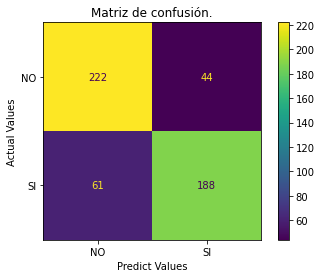

Precision,Recall,Accuracy,F1
0.81,0.76,0.80,0.78


In [76]:
from sklearn.tree import ExtraTreeClassifier
from sklearn.tree import DecisionTreeRegressor
#extra_tree_classifier = ExtraTreeClassifier(random_state=1)
#extra_tree_classifier.fit(X_train, y_train)

from sklearn.model_selection import GridSearchCV

parameters={"splitter":["best","random"],
            "max_depth" : [11,12,13,14,15,16],
           "min_samples_leaf":[1,2,3,4,5],
           "min_weight_fraction_leaf":[0, 0.1,0.2],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,10] }

grid = GridSearchCV(DecisionTreeClassifier(random_state=1), cv=3, n_jobs=-1, verbose=3,
                    param_grid =parameters
                    )

grid.fit(X_train, y_train)

print('Train Accuracy : %.3f'%grid.best_estimator_.score(X_train, y_train))
print('Test Accuracy : %.3f'%grid.best_estimator_.score(X_test, y_test))
print('Best Score Through Grid Search : %.3f'%grid.best_score_)
print('Best Parameters : ',grid.best_params_)

dt = DecisionTreeClassifier(max_depth=grid.best_params_['max_depth'], 
                            max_features=grid.best_params_['max_features'],
                            max_leaf_nodes=grid.best_params_['max_leaf_nodes'],
                            min_samples_leaf=grid.best_params_['min_samples_leaf'],
                            min_weight_fraction_leaf=grid.best_params_['min_weight_fraction_leaf'],
                            splitter=grid.best_params_['splitter']
)
dt.fit(X_train, y_train)

y_pred = dt.predict(X_test)
print('Best Parameters : ',grid.best_params_)
dt_precision_score, dt_recall_score, dt_accuracy_score, dt_f1_score = evaluate_model('Arboles de decision optimizado',y_test, y_pred)

Fitting 3 folds for each of 432 candidates, totalling 1296 fits
Train Accuracy : 1.000
Test Accuracy : 0.862
Best Score Through Grid Search : 0.867
Best Parameters :  {'bootstrap': False, 'max_depth': 14, 'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}


Random forest optimizado

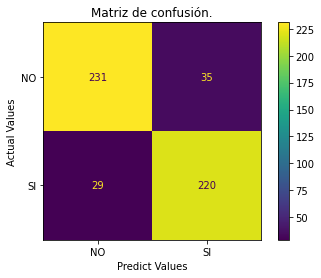

Precision,Recall,Accuracy,F1
0.86,0.88,0.88,0.87


In [77]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {
    'bootstrap': [True, False],
    'max_depth': [12,13,14,15],
    'max_features': ["auto", "sqrt", "log2"],
    'min_samples_leaf': [1,2,3],
    'min_samples_split': [2, 5 , 10],
    'n_estimators': [100, 200]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid = GridSearchCV(estimator = rf, param_grid = param_grid, cv = 3, n_jobs = -1, verbose = 2)
grid.fit(X_train, y_train)

print('Train Accuracy : %.3f'%grid.best_estimator_.score(X_train, y_train))
print('Test Accuracy : %.3f'%grid.best_estimator_.score(X_test, y_test))
print('Best Score Through Grid Search : %.3f'%grid.best_score_)
print('Best Parameters : ',grid.best_params_)

dt = RandomForestClassifier(bootstrap=grid.best_params_['bootstrap'], 
                            max_depth=grid.best_params_['max_depth'],
                            max_features=grid.best_params_['max_features'],
                            min_samples_leaf=grid.best_params_['min_samples_leaf'],
                            min_samples_split=grid.best_params_['min_samples_split'],
                            n_estimators=grid.best_params_['n_estimators']
)
dt.fit(X_train, y_train)
y_pred = dt.predict(X_test)
rf_precision_score, rf_recall_score, rf_accuracy_score, rf_f1_score = evaluate_model('Random forest optimizado', y_test, y_pred)


Fitting 5 folds for each of 30 candidates, totalling 150 fits
Train Accuracy : 0.800
Test Accuracy : 0.794
Best Score Through Grid Search : 0.766
Best Parameters :  {'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}


rbf

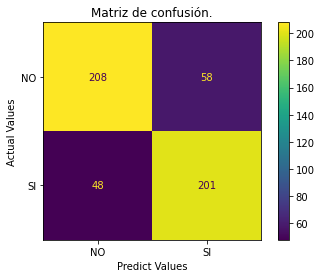

Precision,Recall,Accuracy,F1
0.78,0.81,0.79,0.79


Fitting 5 folds for each of 120 candidates, totalling 600 fits
Train Accuracy : 0.662
Test Accuracy : 0.668
Best Score Through Grid Search : 0.662
Best Parameters :  {'C': 100, 'coef0': 1, 'gamma': 1e-06, 'kernel': 'sigmoid'}


sigmoid

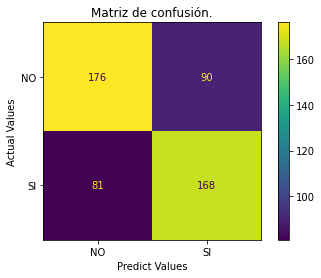

Precision,Recall,Accuracy,F1
0.65,0.67,0.67,0.66


In [78]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

#parameters = [{'kernel': ['rbf'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],'C': [0.001, 0.10, 0.1, 10 ]},
#              {'kernel': ['sigmoid'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],'C': [0.001, 0.10, 0.1, 10], 'coef0 ':[0,0.1,1]},
#              {'kernel': ['linear'], 'C': [0.001, 0.10, 0.1, 1]}     
#]

parameters = [{'kernel': ['rbf'], 'gamma': [1e-2,1e-3,1e-4,1e-5,1e-6],'C': [0.001,0.01,0.1,1,10,100]},
              {'kernel': ['sigmoid'], 'gamma': [1e-2,1e-3,1e-4,1e-5,1e-6],'C': [0.001,0.01,0.1,1,10,100],'coef0' : [0.01,0.1,1,10]},
              #{'kernel': ['linear'], 'C': [0.1,1,10,100]}
              ]

svm_precision_score_rbf=svm_recall_score_rbf=svm_accuracy_score_rbf=svm_f1_score_rbf=0
svm_precision_score_sigmoid=svm_recall_score_sigmoid=svm_accuracy_score_sigmoid=svm_f1_score_sigmoid=0
svm_precision_score_linear=svm_recall_score_linear=svm_accuracy_score_linear=svm_f1_score_linear=0
for parameter in parameters:
    param_grid = parameter
    grid = GridSearchCV(SVC(), param_grid, n_jobs = -1, verbose = 3)
    grid.fit(X_train, y_train)
    kernel_str = parameter['kernel'][0]
    y_pred = grid.predict(X_test)
    dt = grid
    
    print('Train Accuracy : %.3f'%grid.best_estimator_.score(X_train, y_train))
    print('Test Accuracy : %.3f'%grid.best_estimator_.score(X_test, y_test))
    print('Best Score Through Grid Search : %.3f'%grid.best_score_)
    print('Best Parameters : ',grid.best_params_)

    if parameter['kernel'][0] == 'rbf':
        svm_precision_score_rbf, svm_recall_score_rbf, svm_accuracy_score_rbf, svm_f1_score_rbf = evaluate_model(kernel_str, y_test, y_pred)
    if parameter['kernel'][0] == 'sigmoid':
        svm_precision_score_sigmoid, svm_recall_score_sigmoid, svm_accuracy_score_sigmoid, svm_f1_score_sigmoid = evaluate_model(kernel_str, y_test, y_pred)
    if parameter['kernel'][0] == 'linear':
        svm_precision_score_linear, svm_recall_score_linear, svm_accuracy_score_linear, svm_f1_score_linear = evaluate_model(kernel_str, y_test, y_pred)

In [79]:
import optuna  # pip install optuna
from sklearn.metrics import log_loss
from sklearn.model_selection import StratifiedKFold

from optuna.integration import LightGBMPruningCallback


def objective(trial, X, y):
    param_grid = {
        # "device_type": trial.suggest_categorical("device_type", ['gpu']),
        "n_estimators": trial.suggest_categorical("n_estimators", [10000]),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "num_leaves": trial.suggest_int("num_leaves", 8, 1023, step=10),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        "lambda_l1": trial.suggest_float("lambda_l1", 0.0, 10),
        "lambda_l2": trial.suggest_float("lambda_l2", 0.0, 100),
        "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 0.2, 0.95, step=0.1
        ),
        "bagging_freq": trial.suggest_categorical("bagging_freq", [1]),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 0.2, 0.95, step=0.1
        ),
    }

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=1121218)

    cv_scores = np.empty(5)
    for idx, (train_idx, test_idx) in enumerate(cv.split(X, y)):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        model = lgb.LGBMClassifier(objective="binary", **param_grid)
        model.fit(
            X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="binary_logloss",
            #eval_metric="auc",
            early_stopping_rounds=100,
            callbacks=[
                #LightGBMPruningCallback(trial, "auc")
                LightGBMPruningCallback(trial, "binary_logloss")
            ],  # Add a pruning callback
        )
        preds = model.predict_proba(X_test)
        cv_scores[idx] = log_loss(y_test, preds)

    return np.mean(cv_scores)


In [80]:
study = optuna.create_study(direction="minimize", study_name="LGBM Classifier")

#AUC -> maximixe
#study = optuna.create_study(direction="maximize", study_name="LGBM Classifier")
func = lambda trial: objective(trial, X, y)
study.optimize(func, n_trials=2000)


[I 2022-06-05 18:07:54,397] A new study created in memory with name: LGBM Classifier
[I 2022-06-05 18:07:54,637] Trial 0 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21134976886386034, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 3500, 'lambda_l1': 7.841833554242759, 'lambda_l2': 75.1451328746735, 'min_gain_to_split': 11.709257621412275, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 0 with value: 0.6931476995833623.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=11.709257621412275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.709257621412275
[LightGBM] [Warning] lambda_l1 is set=7.841833554242759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.841833554242759
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=75.1451328746735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.1451328746735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 18:07:54,878] Trial 1 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22049595722146728, 'num_leaves': 298, 'max_depth': 11, 'min_data_in_leaf': 2700, 'lambda_l1': 3.1285227438430985, 'lambda_l2': 39.3870207077269, 'min_gain_to_split': 12.270235493117074, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 0 with value: 0.6931476995833623.


[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=12.270235493117074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.270235493117074
[LightGBM] [Warning] lambda_l1 is set=3.1285227438430985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1285227438430985
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=39.3870207077269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.3870207077269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_d

[I 2022-06-05 18:07:55,435] Trial 2 finished with value: 0.4539326746029121 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21743982582462465, 'num_leaves': 18, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 6.189237956722068, 'lambda_l2': 13.856432362792559, 'min_gain_to_split': 7.833787443416477, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 2 with value: 0.4539326746029121.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.833787443416477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.833787443416477
[LightGBM] [Warning] lambda_l1 is set=6.189237956722068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.189237956722068
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.856432362792559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.856432362792559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current

[I 2022-06-05 18:07:55,667] Trial 3 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13850731424501905, 'num_leaves': 858, 'max_depth': 5, 'min_data_in_leaf': 6800, 'lambda_l1': 1.9673492062740872, 'lambda_l2': 6.208096545902153, 'min_gain_to_split': 5.567525132059555, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2 with value: 0.4539326746029121.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=5.567525132059555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.567525132059555
[LightGBM] [Warning] lambda_l1 is set=1.9673492062740872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9673492062740872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.208096545902153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.208096545902153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 18:07:55,907] Trial 4 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035276444729366516, 'num_leaves': 528, 'max_depth': 3, 'min_data_in_leaf': 8000, 'lambda_l1': 7.883896290109194, 'lambda_l2': 30.707398505743278, 'min_gain_to_split': 13.610795757376682, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 2 with value: 0.4539326746029121.


[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=13.610795757376682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.610795757376682
[LightGBM] [Warning] lambda_l1 is set=7.883896290109194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.883896290109194
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=30.707398505743278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.707398505743278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: mi

[I 2022-06-05 18:07:56,194] Trial 5 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0812898518188381, 'num_leaves': 108, 'max_depth': 6, 'min_data_in_leaf': 2000, 'lambda_l1': 3.6234978613712867, 'lambda_l2': 87.8992293136553, 'min_gain_to_split': 13.600356280726231, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 2 with value: 0.4539326746029121.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=13.600356280726231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.600356280726231
[LightGBM] [Warning] lambda_l1 is set=3.6234978613712867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6234978613712867
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=87.8992293136553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.8992293136553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0

[I 2022-06-05 18:07:56,482] Trial 6 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14819995318595988, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 6900, 'lambda_l1': 9.930210855563717, 'lambda_l2': 19.184680977905067, 'min_gain_to_split': 12.5354707690153, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2 with value: 0.4539326746029121.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=12.5354707690153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.5354707690153
[LightGBM] [Warning] lambda_l1 is set=9.930210855563717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.930210855563717
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=19.184680977905067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.184680977905067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be i

[I 2022-06-05 18:07:58,785] Trial 7 finished with value: 0.4731667213905785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1646019546120702, 'num_leaves': 958, 'max_depth': 10, 'min_data_in_leaf': 300, 'lambda_l1': 5.894858037489156, 'lambda_l2': 9.214645421403711, 'min_gain_to_split': 1.3445421211601034, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 2 with value: 0.4539326746029121.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.3445421211601034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3445421211601034
[LightGBM] [Warning] lambda_l1 is set=5.894858037489156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.894858037489156
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=9.214645421403711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.214645421403711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_by

[I 2022-06-05 18:07:59,072] Trial 8 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13690188515471477, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 1900, 'lambda_l1': 3.722554043913515, 'lambda_l2': 25.682680996251715, 'min_gain_to_split': 11.806033050929708, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 2 with value: 0.4539326746029121.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=11.806033050929708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.806033050929708
[LightGBM] [Warning] lambda_l1 is set=3.722554043913515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.722554043913515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.682680996251715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.682680996251715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 wil

[I 2022-06-05 18:07:59,368] Trial 9 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010571902491932494, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 6600, 'lambda_l1': 5.444374954765116, 'lambda_l2': 54.11688235661797, 'min_gain_to_split': 0.5531333225260016, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 2 with value: 0.4539326746029121.


[LightGBM] [Warning] lambda_l2 is set=54.11688235661797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.11688235661797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.5531333225260016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5531333225260016
[LightGBM] [Warning] lambda_l1 is set=5.444374954765116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.444374954765116
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=54.11688235661797, reg_lambda=0.0 will

[I 2022-06-05 18:07:59,709] Trial 10 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25783395819131877, 'num_leaves': 8, 'max_depth': 8, 'min_data_in_leaf': 9900, 'lambda_l1': 0.09721766174258306, 'lambda_l2': 53.772860492169016, 'min_gain_to_split': 7.591969513539917, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 2 with value: 0.4539326746029121.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=7.591969513539917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.591969513539917
[LightGBM] [Warning] lambda_l1 is set=0.09721766174258306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09721766174258306
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=53.772860492169016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.772860492169016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:08:01,013] Trial 11 finished with value: 0.43031648984991105 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29395137958810014, 'num_leaves': 638, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 6.065417419864908, 'lambda_l2': 1.4148783102538935, 'min_gain_to_split': 5.420611864712995, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 11 with value: 0.43031648984991105.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.420611864712995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.420611864712995
[LightGBM] [Warning] lambda_l1 is set=6.065417419864908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.065417419864908
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.4148783102538935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4148783102538935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:08:02,041] Trial 12 finished with value: 0.44034450185397966 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29839067677262426, 'num_leaves': 608, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 7.025000745753303, 'lambda_l2': 0.47154188773872474, 'min_gain_to_split': 6.814954385932238, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 11 with value: 0.43031648984991105.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=4.519759418911293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.519759418911293
[LightGBM] [Warning] lambda_l1 is set=7.518363872116527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.518363872116527
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.38160380643796854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.38160380643796854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:08:02,393] Trial 13 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2895574882604715, 'num_leaves': 638, 'max_depth': 9, 'min_data_in_leaf': 4300, 'lambda_l1': 7.518363872116527, 'lambda_l2': 0.38160380643796854, 'min_gain_to_split': 4.519759418911293, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 11 with value: 0.43031648984991105.


[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=4.519759418911293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.519759418911293
[LightGBM] [Warning] lambda_l1 is set=7.518363872116527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.518363872116527
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.38160380643796854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.38160380643796854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: mi

[I 2022-06-05 18:08:03,206] Trial 14 finished with value: 0.4594407592938069 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2852789727105431, 'num_leaves': 438, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 9.865643010460968, 'lambda_l2': 38.03890415813774, 'min_gain_to_split': 4.369107062112153, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 11 with value: 0.43031648984991105.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=9.238024407617983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.238024407617983
[LightGBM] [Warning] lambda_l1 is set=6.89261535810714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.89261535810714
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.3206373286746826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3206373286746826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:08:03,565] Trial 15 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26125830436215003, 'num_leaves': 728, 'max_depth': 7, 'min_data_in_leaf': 1400, 'lambda_l1': 6.89261535810714, 'lambda_l2': 1.3206373286746826, 'min_gain_to_split': 9.238024407617983, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 11 with value: 0.43031648984991105.


[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=9.238024407617983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.238024407617983
[LightGBM] [Warning] lambda_l1 is set=6.89261535810714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.89261535810714
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.3206373286746826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3206373286746826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_da

[I 2022-06-05 18:08:03,914] Trial 16 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24416981936104143, 'num_leaves': 568, 'max_depth': 9, 'min_data_in_leaf': 4900, 'lambda_l1': 8.819184286491444, 'lambda_l2': 68.65443826278444, 'min_gain_to_split': 2.5347583030038305, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 11 with value: 0.43031648984991105.


[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=2.5347583030038305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5347583030038305
[LightGBM] [Warning] lambda_l1 is set=8.819184286491444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.819184286491444
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=68.65443826278444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.65443826278444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_

[I 2022-06-05 18:08:04,277] Trial 17 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29584037342973146, 'num_leaves': 368, 'max_depth': 10, 'min_data_in_leaf': 2600, 'lambda_l1': 4.714733644315453, 'lambda_l2': 21.955249645427816, 'min_gain_to_split': 9.671355853061947, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 11 with value: 0.43031648984991105.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=9.671355853061947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.671355853061947
[LightGBM] [Warning] lambda_l1 is set=4.714733644315453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.714733644315453
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=21.955249645427816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.955249645427816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be

[I 2022-06-05 18:08:04,641] Trial 18 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18652646351829277, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 3700, 'lambda_l1': 6.605956809918524, 'lambda_l2': 96.47812448074433, 'min_gain_to_split': 5.768179985578783, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 11 with value: 0.43031648984991105.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=5.768179985578783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.768179985578783
[LightGBM] [Warning] lambda_l1 is set=6.605956809918524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.605956809918524
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=96.47812448074433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.47812448074433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Curren

[I 2022-06-05 18:08:05,007] Trial 19 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11064459825764042, 'num_leaves': 638, 'max_depth': 3, 'min_data_in_leaf': 1200, 'lambda_l1': 4.771078809929248, 'lambda_l2': 34.087859336576, 'min_gain_to_split': 2.9360277007880966, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 11 with value: 0.43031648984991105.


[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.9360277007880966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9360277007880966
[LightGBM] [Warning] lambda_l1 is set=4.771078809929248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.771078809929248
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=34.087859336576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.087859336576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data

[I 2022-06-05 18:08:05,384] Trial 20 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24253322041683328, 'num_leaves': 448, 'max_depth': 10, 'min_data_in_leaf': 5700, 'lambda_l1': 2.325907321501346, 'lambda_l2': 46.73262368720455, 'min_gain_to_split': 9.648102225273503, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 11 with value: 0.43031648984991105.


[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=9.648102225273503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.648102225273503
[LightGBM] [Warning] lambda_l1 is set=2.325907321501346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.325907321501346
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=46.73262368720455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.73262368720455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be

[I 2022-06-05 18:08:05,805] Trial 21 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19834651733300948, 'num_leaves': 258, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 6.5390244259449215, 'lambda_l2': 11.666003070224447, 'min_gain_to_split': 7.161790020054397, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 11 with value: 0.43031648984991105.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.161790020054397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.161790020054397
[LightGBM] [Warning] lambda_l1 is set=6.5390244259449215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.5390244259449215
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.666003070224447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.666003070224447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:08:06,937] Trial 22 finished with value: 0.44313904204246696 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27212485725639296, 'num_leaves': 178, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.088917227666218, 'lambda_l2': 16.1432030613843, 'min_gain_to_split': 7.731004259836316, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 11 with value: 0.43031648984991105.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.731004259836316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.731004259836316
[LightGBM] [Warning] lambda_l1 is set=6.088917227666218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.088917227666218
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=16.1432030613843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.1432030613843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignor

[I 2022-06-05 18:08:07,313] Trial 23 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2706665797980536, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 1500, 'lambda_l1': 8.437533040027546, 'lambda_l2': 17.318421600601948, 'min_gain_to_split': 6.284525257498709, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 11 with value: 0.43031648984991105.



[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=6.284525257498709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.284525257498709
[LightGBM] [Warning] lambda_l1 is set=8.437533040027546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.437533040027546
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=17.318421600601948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.318421600601948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=

[I 2022-06-05 18:08:07,746] Trial 24 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23687300231870023, 'num_leaves': 148, 'max_depth': 7, 'min_data_in_leaf': 2500, 'lambda_l1': 5.350048909861066, 'lambda_l2': 0.30579682269782205, 'min_gain_to_split': 8.495777188397494, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 11 with value: 0.43031648984991105.


[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=8.495777188397494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.495777188397494
[LightGBM] [Warning] lambda_l1 is set=5.350048909861066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.350048909861066
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.30579682269782205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30579682269782205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 wi

[I 2022-06-05 18:08:08,219] Trial 25 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2737628179687424, 'num_leaves': 808, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 7.1903395658965135, 'lambda_l2': 9.028720867883486, 'min_gain_to_split': 4.683209507854685, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 11 with value: 0.43031648984991105.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=4.683209507854685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.683209507854685
[LightGBM] [Warning] lambda_l1 is set=7.1903395658965135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1903395658965135
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=9.028720867883486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.028720867883486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:08:08,601] Trial 26 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2934780698425784, 'num_leaves': 448, 'max_depth': 5, 'min_data_in_leaf': 3300, 'lambda_l1': 8.704783677542071, 'lambda_l2': 27.21701581528643, 'min_gain_to_split': 6.716260350482458, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 11 with value: 0.43031648984991105.


[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=6.716260350482458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.716260350482458
[LightGBM] [Warning] lambda_l1 is set=8.704783677542071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.704783677542071
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=27.21701581528643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.21701581528643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be 

[I 2022-06-05 18:08:09,878] Trial 27 finished with value: 0.4179926990005141 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2973077686554418, 'num_leaves': 218, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.3718391541434505, 'lambda_l2': 16.462444351678997, 'min_gain_to_split': 3.6979507030938787, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.8770123341237177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8770123341237177
[LightGBM] [Warning] lambda_l1 is set=4.723186327880945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.723186327880945
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.052753424173156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.052753424173156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:08:10,265] Trial 28 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2996863184712202, 'num_leaves': 508, 'max_depth': 8, 'min_data_in_leaf': 1800, 'lambda_l1': 4.723186327880945, 'lambda_l2': 7.052753424173156, 'min_gain_to_split': 2.8770123341237177, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.8770123341237177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8770123341237177
[LightGBM] [Warning] lambda_l1 is set=4.723186327880945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.723186327880945
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.052753424173156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.052753424173156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_

[I 2022-06-05 18:08:10,653] Trial 29 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2264330102906164, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 3400, 'lambda_l1': 3.9178570349452295, 'lambda_l2': 65.59018206579788, 'min_gain_to_split': 10.694714472491825, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] min_gain_to_split is set=10.694714472491825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.694714472491825
[LightGBM] [Warning] lambda_l1 is set=3.9178570349452295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9178570349452295
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=65.59018206579788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.59018206579788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=10.694714472491825, min_spli

[I 2022-06-05 18:08:11,136] Trial 30 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1835501600315708, 'num_leaves': 668, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 1.6331708718208278, 'lambda_l2': 22.391263703249734, 'min_gain_to_split': 4.000198276726855, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=4.000198276726855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.000198276726855
[LightGBM] [Warning] lambda_l1 is set=1.6331708718208278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6331708718208278
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=22.391263703249734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.391263703249734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will 

[I 2022-06-05 18:08:12,559] Trial 31 finished with value: 0.43457250109919654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2725320031874273, 'num_leaves': 198, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.853951104500031, 'lambda_l2': 15.919255384939685, 'min_gain_to_split': 5.308982719365737, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.308982719365737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.308982719365737
[LightGBM] [Warning] lambda_l1 is set=5.853951104500031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.853951104500031
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=15.919255384939685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.919255384939685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Curren

[I 2022-06-05 18:08:12,960] Trial 32 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25042898711441475, 'num_leaves': 208, 'max_depth': 8, 'min_data_in_leaf': 1100, 'lambda_l1': 4.280792486152678, 'lambda_l2': 4.812742675094551, 'min_gain_to_split': 5.402408074114267, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=5.402408074114267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.402408074114267
[LightGBM] [Warning] lambda_l1 is set=4.280792486152678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.280792486152678
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.812742675094551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.812742675094551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_by

[I 2022-06-05 18:08:13,367] Trial 33 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2769303637105675, 'num_leaves': 248, 'max_depth': 9, 'min_data_in_leaf': 2500, 'lambda_l1': 5.725243983550957, 'lambda_l2': 14.783700034321981, 'min_gain_to_split': 2.0576660227434065, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=2.0576660227434065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0576660227434065
[LightGBM] [Warning] lambda_l1 is set=5.725243983550957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.725243983550957
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=14.783700034321981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.783700034321981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:08:13,843] Trial 34 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20886816413823733, 'num_leaves': 358, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 2.97810324506282, 'lambda_l2': 12.4381355113114, 'min_gain_to_split': 3.6016325525609822, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.6016325525609822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6016325525609822
[LightGBM] [Warning] lambda_l1 is set=2.97810324506282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.97810324506282
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=12.4381355113114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.4381355113114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-05 18:08:14,267] Trial 35 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2622744577399012, 'num_leaves': 118, 'max_depth': 8, 'min_data_in_leaf': 2000, 'lambda_l1': 7.847474351305439, 'lambda_l2': 30.368910204924592, 'min_gain_to_split': 5.4571204366142, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] min_gain_to_split is set=5.4571204366142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4571204366142
[LightGBM] [Warning] lambda_l1 is set=7.847474351305439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.847474351305439
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=30.368910204924592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.368910204924592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=5.4571204366142, min_split_gain=0.

[I 2022-06-05 18:08:15,806] Trial 36 finished with value: 0.4520397366887168 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22627636801858936, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 6.348308879196257, 'lambda_l2': 45.08187500147409, 'min_gain_to_split': 6.504596304706736, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=3.6231944047291615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6231944047291615
[LightGBM] [Warning] lambda_l1 is set=5.05195646708635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.05195646708635
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.705843044645986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.705843044645986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:08:16,225] Trial 37 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29865517059311125, 'num_leaves': 548, 'max_depth': 7, 'min_data_in_leaf': 1600, 'lambda_l1': 5.05195646708635, 'lambda_l2': 5.705843044645986, 'min_gain_to_split': 3.6231944047291615, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=3.6231944047291615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6231944047291615
[LightGBM] [Warning] lambda_l1 is set=5.05195646708635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.05195646708635
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.705843044645986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.705843044645986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:08:16,650] Trial 38 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07336506055297348, 'num_leaves': 358, 'max_depth': 9, 'min_data_in_leaf': 9500, 'lambda_l1': 7.321860038335939, 'lambda_l2': 20.36230659849322, 'min_gain_to_split': 4.9616185167590015, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=4.9616185167590015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.9616185167590015
[LightGBM] [Warning] lambda_l1 is set=7.321860038335939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.321860038335939
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=20.36230659849322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.36230659849322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=9

[I 2022-06-05 18:08:17,423] Trial 39 finished with value: 0.5027708343438627 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2796613822524213, 'num_leaves': 488, 'max_depth': 4, 'min_data_in_leaf': 700, 'lambda_l1': 3.009690698200677, 'lambda_l2': 10.922447003798872, 'min_gain_to_split': 8.324686206018272, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.324686206018272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.324686206018272
[LightGBM] [Warning] lambda_l1 is set=3.009690698200677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.009690698200677
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=10.922447003798872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.922447003798872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:08:17,849] Trial 40 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2559430974646256, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 3100, 'lambda_l1': 8.222794619509035, 'lambda_l2': 4.64570797059284, 'min_gain_to_split': 0.9821403761893084, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] min_gain_to_split is set=0.9821403761893084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9821403761893084
[LightGBM] [Warning] lambda_l1 is set=8.222794619509035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.222794619509035
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.64570797059284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.64570797059284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.9821403761893084, min_split_gain=0.0 will be ignored. Current 

[I 2022-06-05 18:08:18,840] Trial 41 finished with value: 0.44335475830324544 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2734935090640873, 'num_leaves': 168, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.070848876962127, 'lambda_l2': 16.184006985909022, 'min_gain_to_split': 7.054070230985848, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.054070230985848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.054070230985848
[LightGBM] [Warning] lambda_l1 is set=6.070848876962127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.070848876962127
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=16.184006985909022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.184006985909022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be i

[I 2022-06-05 18:08:19,627] Trial 42 finished with value: 0.5028283303452354 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28535135433165654, 'num_leaves': 1018, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 5.614532955746866, 'lambda_l2': 15.427978466120717, 'min_gain_to_split': 7.918827504747053, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] min_gain_to_split is set=7.918827504747053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.918827504747053
[LightGBM] [Warning] lambda_l1 is set=5.614532955746866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.614532955746866
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.427978466120717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.427978466120717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=5.966886402926228, min_split_g

[I 2022-06-05 18:08:20,054] Trial 43 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2678123014055483, 'num_leaves': 58, 'max_depth': 6, 'min_data_in_leaf': 2100, 'lambda_l1': 4.300740364378181, 'lambda_l2': 24.163292680670526, 'min_gain_to_split': 5.966886402926228, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=5.966886402926228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.966886402926228
[LightGBM] [Warning] lambda_l1 is set=4.300740364378181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.300740364378181
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=24.163292680670526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.163292680670526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_

[I 2022-06-05 18:08:20,484] Trial 44 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23477137274841559, 'num_leaves': 288, 'max_depth': 7, 'min_data_in_leaf': 1300, 'lambda_l1': 5.9533657578463925, 'lambda_l2': 35.314964616454986, 'min_gain_to_split': 1.687021480985348, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.687021480985348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.687021480985348
[LightGBM] [Warning] lambda_l1 is set=5.9533657578463925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9533657578463925
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=35.314964616454986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.314964616454986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set

[I 2022-06-05 18:08:21,558] Trial 45 finished with value: 0.45246622149177484 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2849206029301572, 'num_leaves': 198, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 6.81659699395039, 'lambda_l2': 4.199562457199642, 'min_gain_to_split': 8.957439023569467, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.957439023569467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.957439023569467
[LightGBM] [Warning] lambda_l1 is set=6.81659699395039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.81659699395039
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.199562457199642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.199562457199642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in

[I 2022-06-05 18:08:22,155] Trial 46 finished with value: 0.513312140499141 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2525644729102119, 'num_leaves': 78, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 5.2201601155013675, 'lambda_l2': 29.605302470301567, 'min_gain_to_split': 14.547584120921801, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.547584120921801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.547584120921801
[LightGBM] [Warning] lambda_l1 is set=5.2201601155013675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.2201601155013675
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=29.605302470301567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.605302470301567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will 

[I 2022-06-05 18:08:22,595] Trial 47 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21186333046017475, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 1100, 'lambda_l1': 6.26989717144977, 'lambda_l2': 0.0360824845230443, 'min_gain_to_split': 10.691523606228575, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=10.691523606228575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.691523606228575
[LightGBM] [Warning] lambda_l1 is set=6.26989717144977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.26989717144977
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.0360824845230443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0360824845230443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_

[I 2022-06-05 18:08:23,029] Trial 48 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2836537228661045, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 8100, 'lambda_l1': 7.059686957382856, 'lambda_l2': 9.049368972174005, 'min_gain_to_split': 5.184673838860089, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=5.184673838860089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.184673838860089
[LightGBM] [Warning] lambda_l1 is set=7.059686957382856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.059686957382856
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=9.049368972174005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.049368972174005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be

[I 2022-06-05 18:08:23,467] Trial 49 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12612809386639606, 'num_leaves': 308, 'max_depth': 9, 'min_data_in_leaf': 2100, 'lambda_l1': 7.597194671649797, 'lambda_l2': 19.19226492240093, 'min_gain_to_split': 7.422150195619751, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=7.422150195619751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.422150195619751
[LightGBM] [Warning] lambda_l1 is set=7.597194671649797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.597194671649797
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=19.19226492240093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.19226492240093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:08:23,975] Trial 50 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2996211250994779, 'num_leaves': 738, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 9.243024824005445, 'lambda_l2': 79.14723004970742, 'min_gain_to_split': 6.09492860388702, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.09492860388702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.09492860388702
[LightGBM] [Warning] lambda_l1 is set=9.243024824005445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.243024824005445
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=79.14723004970742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.14723004970742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree

[I 2022-06-05 18:08:25,371] Trial 51 finished with value: 0.4386348454780865 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2688467150797991, 'num_leaves': 188, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.024007492252268, 'lambda_l2': 16.167568433082167, 'min_gain_to_split': 7.114168831383759, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.114168831383759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.114168831383759
[LightGBM] [Warning] lambda_l1 is set=6.024007492252268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.024007492252268
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=16.167568433082167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.167568433082167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be i

[I 2022-06-05 18:08:26,507] Trial 52 finished with value: 0.47361664324181846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26821881811363657, 'num_leaves': 208, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 5.747961731922601, 'lambda_l2': 25.355594424999964, 'min_gain_to_split': 8.008482368920316, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.008482368920316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.008482368920316
[LightGBM] [Warning] lambda_l1 is set=5.747961731922601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.747961731922601
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=25.355594424999964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.355594424999964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be i

[I 2022-06-05 18:08:26,955] Trial 53 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2586687687654953, 'num_leaves': 128, 'max_depth': 5, 'min_data_in_leaf': 1500, 'lambda_l1': 4.318703902850191, 'lambda_l2': 12.496880599693405, 'min_gain_to_split': 4.058413196457247, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=4.058413196457247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.058413196457247
[LightGBM] [Warning] lambda_l1 is set=4.318703902850191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.318703902850191
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=12.496880599693405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.496880599693405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:08:28,162] Trial 54 finished with value: 0.45681543455656026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28637988948082616, 'num_leaves': 168, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 6.493316214783061, 'lambda_l2': 41.35431043658998, 'min_gain_to_split': 6.635106742119959, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.635106742119959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.635106742119959
[LightGBM] [Warning] lambda_l1 is set=6.493316214783061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.493316214783061
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=41.35431043658998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.35431043658998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current 

[I 2022-06-05 18:08:28,656] Trial 55 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26645515480627013, 'num_leaves': 258, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 5.349258060262725, 'lambda_l2': 18.058718104521372, 'min_gain_to_split': 7.11707068803147, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=8.755089841592415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.755089841592415
[LightGBM] [Warning] lambda_l1 is set=3.414336170037747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.414336170037747
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.599939114380843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.599939114380843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:08:29,153] Trial 56 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.245981125433408, 'num_leaves': 238, 'max_depth': 8, 'min_data_in_leaf': 4200, 'lambda_l1': 3.414336170037747, 'lambda_l2': 8.599939114380843, 'min_gain_to_split': 8.755089841592415, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=8.755089841592415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.755089841592415
[LightGBM] [Warning] lambda_l1 is set=3.414336170037747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.414336170037747
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.599939114380843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.599939114380843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:08:29,616] Trial 57 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06928086386077352, 'num_leaves': 598, 'max_depth': 6, 'min_data_in_leaf': 5800, 'lambda_l1': 6.887661837863348, 'lambda_l2': 33.250078555809786, 'min_gain_to_split': 5.025180637486191, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=5.025180637486191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.025180637486191
[LightGBM] [Warning] lambda_l1 is set=6.887661837863348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.887661837863348
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.250078555809786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.250078555809786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_

[I 2022-06-05 18:08:30,099] Trial 58 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2907182075782089, 'num_leaves': 8, 'max_depth': 7, 'min_data_in_leaf': 1400, 'lambda_l1': 6.072204668199085, 'lambda_l2': 3.328576148803375, 'min_gain_to_split': 3.296617096962585, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=3.296617096962585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.296617096962585
[LightGBM] [Warning] lambda_l1 is set=6.072204668199085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.072204668199085
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.328576148803375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.328576148803375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be i

[I 2022-06-05 18:08:30,662] Trial 59 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23187626215648707, 'num_leaves': 328, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 4.755817998904497, 'lambda_l2': 60.60359845669365, 'min_gain_to_split': 4.3264626101619825, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.3264626101619825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.3264626101619825
[LightGBM] [Warning] lambda_l1 is set=4.755817998904497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.755817998904497
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=60.60359845669365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.60359845669365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_dat

[I 2022-06-05 18:08:31,310] Trial 60 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15569441532242903, 'num_leaves': 698, 'max_depth': 8, 'min_data_in_leaf': 900, 'lambda_l1': 7.481556198204121, 'lambda_l2': 20.768828639634286, 'min_gain_to_split': 5.826510044579259, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.424987960364873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.424987960364873
[LightGBM] [Warning] lambda_l1 is set=6.746868766097879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.746868766097879
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=15.402449398368843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.402449398368843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be i

[I 2022-06-05 18:08:32,703] Trial 61 finished with value: 0.44326849164612653 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2749624008586877, 'num_leaves': 178, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.746868766097879, 'lambda_l2': 15.402449398368843, 'min_gain_to_split': 7.424987960364873, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.424987960364873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.424987960364873
[LightGBM] [Warning] lambda_l1 is set=6.746868766097879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.746868766097879
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=15.402449398368843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.402449398368843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be i

[I 2022-06-05 18:08:33,908] Trial 62 finished with value: 0.443376740378303 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2788625101358818, 'num_leaves': 88, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 6.708519919641754, 'lambda_l2': 13.084367720460051, 'min_gain_to_split': 7.883160442613279, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.883160442613279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.883160442613279
[LightGBM] [Warning] lambda_l1 is set=6.708519919641754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.708519919641754
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=13.084367720460051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.084367720460051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be i

[I 2022-06-05 18:08:34,343] Trial 63 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2921288444344595, 'num_leaves': 178, 'max_depth': 7, 'min_data_in_leaf': 1800, 'lambda_l1': 5.585553750863022, 'lambda_l2': 27.01775767608241, 'min_gain_to_split': 9.558266751551296, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=9.558266751551296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.558266751551296
[LightGBM] [Warning] lambda_l1 is set=5.585553750863022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.585553750863022
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=27.01775767608241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.01775767608241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytr

[I 2022-06-05 18:08:34,776] Trial 64 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24256090415627882, 'num_leaves': 278, 'max_depth': 8, 'min_data_in_leaf': 1200, 'lambda_l1': 8.143262189590475, 'lambda_l2': 8.027719282199948, 'min_gain_to_split': 6.795929166843492, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=6.795929166843492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.795929166843492
[LightGBM] [Warning] lambda_l1 is set=8.143262189590475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.143262189590475
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=8.027719282199948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.027719282199948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2

[I 2022-06-05 18:08:35,875] Trial 65 finished with value: 0.4530223023923501 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2740942879042103, 'num_leaves': 228, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 6.4475951398571025, 'lambda_l2': 16.244312181010493, 'min_gain_to_split': 6.264540531347901, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.264540531347901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.264540531347901
[LightGBM] [Warning] lambda_l1 is set=6.4475951398571025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4475951398571025
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=16.244312181010493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.244312181010493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:08:36,367] Trial 66 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25463865497288246, 'num_leaves': 48, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 4.952024850755277, 'lambda_l2': 1.6062709539372015, 'min_gain_to_split': 0.07258900068730867, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] min_gain_to_split is set=0.07258900068730867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07258900068730867
[LightGBM] [Warning] lambda_l1 is set=4.952024850755277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.952024850755277
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.6062709539372015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6062709539372015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.07258900068730867, min_split_gain=0.0 will be ignored. Cur

[I 2022-06-05 18:08:36,798] Trial 67 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015432209144701226, 'num_leaves': 788, 'max_depth': 7, 'min_data_in_leaf': 1700, 'lambda_l1': 7.155255128703887, 'lambda_l2': 11.26776963457465, 'min_gain_to_split': 10.364816247176801, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=10.364816247176801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.364816247176801
[LightGBM] [Warning] lambda_l1 is set=7.155255128703887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.155255128703887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.26776963457465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.26776963457465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_

[I 2022-06-05 18:08:37,657] Trial 68 finished with value: 0.5020187586469073 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26348090618236325, 'num_leaves': 108, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 5.128717070587583, 'lambda_l2': 6.878326491567149, 'min_gain_to_split': 7.347035910472595, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.347035910472595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.347035910472595
[LightGBM] [Warning] lambda_l1 is set=5.128717070587583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.128717070587583
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.878326491567149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.878326491567149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be 

[I 2022-06-05 18:08:38,114] Trial 69 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29186469688667005, 'num_leaves': 498, 'max_depth': 6, 'min_data_in_leaf': 2300, 'lambda_l1': 3.9944338260568446, 'lambda_l2': 21.465526275174717, 'min_gain_to_split': 4.627046398023315, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=4.627046398023315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.627046398023315
[LightGBM] [Warning] lambda_l1 is set=3.9944338260568446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9944338260568446
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.465526275174717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.465526275174717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsampl

[I 2022-06-05 18:08:38,607] Trial 70 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27517684908901036, 'num_leaves': 148, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 5.7496566543073815, 'lambda_l2': 23.667760425465445, 'min_gain_to_split': 5.519984347279518, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.519984347279518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.519984347279518
[LightGBM] [Warning] lambda_l1 is set=5.7496566543073815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7496566543073815
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=23.667760425465445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.667760425465445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will 

[I 2022-06-05 18:08:39,828] Trial 71 finished with value: 0.4424690998469396 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2788954694042404, 'num_leaves': 168, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.118822800429968, 'lambda_l2': 15.888754493905083, 'min_gain_to_split': 7.562118889096201, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.562118889096201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.562118889096201
[LightGBM] [Warning] lambda_l1 is set=6.118822800429968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.118822800429968
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=15.888754493905083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.888754493905083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be i

[I 2022-06-05 18:08:40,948] Trial 72 finished with value: 0.4421578568947074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28127149284950237, 'num_leaves': 148, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.107506044779261, 'lambda_l2': 14.624155600592907, 'min_gain_to_split': 7.56255399545476, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.56255399545476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.56255399545476
[LightGBM] [Warning] lambda_l1 is set=6.107506044779261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.107506044779261
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=14.624155600592907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.624155600592907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ign

[I 2022-06-05 18:08:41,403] Trial 73 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2993288132982497, 'num_leaves': 138, 'max_depth': 8, 'min_data_in_leaf': 1200, 'lambda_l1': 6.1144895012739, 'lambda_l2': 18.80571642855771, 'min_gain_to_split': 8.3942614559256, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=8.3942614559256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.3942614559256
[LightGBM] [Warning] lambda_l1 is set=6.1144895012739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1144895012739
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.80571642855771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.80571642855771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:08:42,409] Trial 74 finished with value: 0.4657325521326493 and parameters: {'n_estimators': 10000, 'learning_rate': 0.284718509219185, 'num_leaves': 558, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 5.489651179551138, 'lambda_l2': 13.891822466465886, 'min_gain_to_split': 6.799529169818781, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.316014617430763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.316014617430763
[LightGBM] [Warning] lambda_l1 is set=6.224684812619342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.224684812619342
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.066953484153383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.066953484153383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-05 18:08:42,923] Trial 75 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26376448183799367, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 6.224684812619342, 'lambda_l2': 3.066953484153383, 'min_gain_to_split': 6.316014617430763, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.316014617430763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.316014617430763
[LightGBM] [Warning] lambda_l1 is set=6.224684812619342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.224684812619342
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.066953484153383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.066953484153383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ign

[I 2022-06-05 18:08:44,409] Trial 76 finished with value: 0.45757628146664386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1727906153268069, 'num_leaves': 228, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.506044359978844, 'lambda_l2': 28.899637143524945, 'min_gain_to_split': 8.059297814944763, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.059297814944763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.059297814944763
[LightGBM] [Warning] lambda_l1 is set=4.506044359978844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.506044359978844
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=28.899637143524945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.899637143524945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.300

[I 2022-06-05 18:08:44,874] Trial 77 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29215463845991035, 'num_leaves': 28, 'max_depth': 9, 'min_data_in_leaf': 7200, 'lambda_l1': 5.87719098365783, 'lambda_l2': 10.054987131829323, 'min_gain_to_split': 9.217434828494383, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=9.217434828494383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.217434828494383
[LightGBM] [Warning] lambda_l1 is set=5.87719098365783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.87719098365783
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=10.054987131829323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.054987131829323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_by

[I 2022-06-05 18:08:45,431] Trial 78 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24942846905456675, 'num_leaves': 328, 'max_depth': 8, 'min_data_in_leaf': 1000, 'lambda_l1': 6.526867135047765, 'lambda_l2': 5.65637830932585, 'min_gain_to_split': 7.575385339445875, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=7.575385339445875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.575385339445875
[LightGBM] [Warning] lambda_l1 is set=6.526867135047765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.526867135047765
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.65637830932585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.65637830932585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data

[I 2022-06-05 18:08:45,933] Trial 79 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2796887233633887, 'num_leaves': 108, 'max_depth': 7, 'min_data_in_leaf': 3000, 'lambda_l1': 7.660668581069591, 'lambda_l2': 22.655375035285058, 'min_gain_to_split': 5.844091542257147, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=5.844091542257147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.844091542257147
[LightGBM] [Warning] lambda_l1 is set=7.660668581069591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.660668581069591
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=22.655375035285058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.655375035285058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be

[I 2022-06-05 18:08:46,421] Trial 80 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22136467700248857, 'num_leaves': 198, 'max_depth': 6, 'min_data_in_leaf': 1400, 'lambda_l1': 5.28301911975832, 'lambda_l2': 53.82170184299692, 'min_gain_to_split': 10.12722951401038, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=10.12722951401038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.12722951401038
[LightGBM] [Warning] lambda_l1 is set=5.28301911975832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.28301911975832
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=53.82170184299692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.82170184299692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-05 18:08:47,519] Trial 81 finished with value: 0.44841313748775463 and parameters: {'n_estimators': 10000, 'learning_rate': 0.270645276067612, 'num_leaves': 168, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 7.330549150051477, 'lambda_l2': 15.588500520577494, 'min_gain_to_split': 7.684611892279525, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.684611892279525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.684611892279525
[LightGBM] [Warning] lambda_l1 is set=7.330549150051477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.330549150051477
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=15.588500520577494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.588500520577494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be i

[I 2022-06-05 18:08:48,073] Trial 82 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2771875360348328, 'num_leaves': 188, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 6.92158373445405, 'lambda_l2': 16.444103835778776, 'min_gain_to_split': 7.164654940883237, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.164654940883237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.164654940883237
[LightGBM] [Warning] lambda_l1 is set=6.92158373445405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.92158373445405
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=16.444103835778776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.444103835778776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ign

[I 2022-06-05 18:08:49,114] Trial 83 finished with value: 0.4604436828645313 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28776002746386886, 'num_leaves': 98, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 6.705491287902001, 'lambda_l2': 13.453388878642933, 'min_gain_to_split': 8.722255349329588, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 27 with value: 0.4179926990005141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.722255349329588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.722255349329588
[LightGBM] [Warning] lambda_l1 is set=6.705491287902001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.705491287902001
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=13.453388878642933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.453388878642933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be i

[I 2022-06-05 18:08:50,595] Trial 84 finished with value: 0.410443756365008 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25903308449003265, 'num_leaves': 268, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.06280737736500441, 'lambda_l2': 10.089214629940251, 'min_gain_to_split': 6.9332132323033, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 84 with value: 0.410443756365008.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.9332132323033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.9332132323033
[LightGBM] [Warning] lambda_l1 is set=0.06280737736500441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06280737736500441
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=10.089214629940251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.089214629940251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:08:51,212] Trial 85 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2562526656607445, 'num_leaves': 278, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 1.4129633796532652, 'lambda_l2': 2.3340141049539493, 'min_gain_to_split': 6.509601915275693, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 84 with value: 0.410443756365008.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.509601915275693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.509601915275693
[LightGBM] [Warning] lambda_l1 is set=1.4129633796532652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4129633796532652
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.3340141049539493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3340141049539493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Curr

[I 2022-06-05 18:08:52,504] Trial 86 finished with value: 0.41266363239919945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29531096848475935, 'num_leaves': 618, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.32253633115002667, 'lambda_l2': 10.793487960473392, 'min_gain_to_split': 2.6593971964204908, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 84 with value: 0.410443756365008.


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.6593971964204908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6593971964204908
[LightGBM] [Warning] lambda_l1 is set=0.32253633115002667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32253633115002667
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=10.793487960473392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.793487960473392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: m

[I 2022-06-05 18:08:54,276] Trial 87 finished with value: 0.399680904509923 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2931246291157355, 'num_leaves': 658, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.02448086025428041, 'lambda_l2': 7.1012123237464095, 'min_gain_to_split': 3.0099375180193335, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 87 with value: 0.399680904509923.


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.0099375180193335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0099375180193335
[LightGBM] [Warning] lambda_l1 is set=0.02448086025428041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02448086025428041
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.1012123237464095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1012123237464095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: 

[I 2022-06-05 18:08:54,785] Trial 88 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29460879783632254, 'num_leaves': 608, 'max_depth': 9, 'min_data_in_leaf': 1300, 'lambda_l1': 0.0595340505796072, 'lambda_l2': 7.624504519704573, 'min_gain_to_split': 2.8577998336357666, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 87 with value: 0.399680904509923.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=2.8577998336357666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8577998336357666
[LightGBM] [Warning] lambda_l1 is set=0.0595340505796072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0595340505796072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.624504519704573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.624504519704573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:08:55,277] Trial 89 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10180734584036699, 'num_leaves': 698, 'max_depth': 10, 'min_data_in_leaf': 1100, 'lambda_l1': 0.4738483537947722, 'lambda_l2': 10.972978950277831, 'min_gain_to_split': 2.4703896473245575, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 87 with value: 0.399680904509923.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.4703896473245575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4703896473245575
[LightGBM] [Warning] lambda_l1 is set=0.4738483537947722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4738483537947722
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.972978950277831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.972978950277831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:08:56,601] Trial 90 finished with value: 0.4089992602217678 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29917559380081427, 'num_leaves': 648, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.6798537281387423, 'lambda_l2': 5.132458575928143, 'min_gain_to_split': 3.3909389538734063, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 87 with value: 0.399680904509923.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.3909389538734063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3909389538734063
[LightGBM] [Warning] lambda_l1 is set=0.6798537281387423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6798537281387423
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.132458575928143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.132458575928143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:08:58,040] Trial 91 finished with value: 0.39720602939760963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2980718279357156, 'num_leaves': 628, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.6241303100555049, 'lambda_l2': 5.230141723318808, 'min_gain_to_split': 2.0554660096570734, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 91 with value: 0.39720602939760963.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9699262909562734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9699262909562734
[LightGBM] [Warning] lambda_l1 is set=0.34214257159458894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34214257159458894
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.5120933572749875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5120933572749875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:09:00,107] Trial 92 finished with value: 0.4369953587387531 and parameters: {'n_estimators': 10000, 'learning_rate': 0.299089756070966, 'num_leaves': 628, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 0.34214257159458894, 'lambda_l2': 5.5120933572749875, 'min_gain_to_split': 1.9699262909562734, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 91 with value: 0.39720602939760963.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9699262909562734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9699262909562734
[LightGBM] [Warning] lambda_l1 is set=0.34214257159458894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34214257159458894
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.5120933572749875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5120933572749875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:09:02,015] Trial 93 finished with value: 0.43708128022047354 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2966148904555737, 'num_leaves': 538, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.5148264999406073, 'lambda_l2': 5.818354856859299, 'min_gain_to_split': 2.082067445631143, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 91 with value: 0.39720602939760963.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.082067445631143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.082067445631143
[LightGBM] [Warning] lambda_l1 is set=0.5148264999406073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5148264999406073
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.818354856859299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.818354856859299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:09:03,613] Trial 94 finished with value: 0.4386695506478883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29996426103293716, 'num_leaves': 538, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.502149803492983, 'lambda_l2': 4.735308076409655, 'min_gain_to_split': 1.8600425171460289, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 91 with value: 0.39720602939760963.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.8600425171460289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8600425171460289
[LightGBM] [Warning] lambda_l1 is set=0.502149803492983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.502149803492983
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.735308076409655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.735308076409655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:09:04,128] Trial 95 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2900247340145369, 'num_leaves': 578, 'max_depth': 9, 'min_data_in_leaf': 1600, 'lambda_l1': 0.9619802889172184, 'lambda_l2': 6.397647986844178, 'min_gain_to_split': 1.2464594801891842, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 91 with value: 0.39720602939760963.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.447836416750962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.447836416750962
[LightGBM] [Warning] lambda_l1 is set=0.4093607840091482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4093607840091482
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5433932656037523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5433932656037523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:09:05,407] Trial 96 finished with value: 0.40081017164959354 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29428730480764864, 'num_leaves': 658, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.4093607840091482, 'lambda_l2': 1.5433932656037523, 'min_gain_to_split': 2.447836416750962, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 91 with value: 0.39720602939760963.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.447836416750962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.447836416750962
[LightGBM] [Warning] lambda_l1 is set=0.4093607840091482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4093607840091482
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5433932656037523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5433932656037523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:09:06,778] Trial 97 finished with value: 0.40700329959136106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28813304757976815, 'num_leaves': 628, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.9694280621677757, 'lambda_l2': 1.6627669740869988, 'min_gain_to_split': 3.3789271339336038, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 91 with value: 0.39720602939760963.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.374495801031671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.374495801031671
[LightGBM] [Warning] lambda_l1 is set=1.0295235147683246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0295235147683246
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8656267068930124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8656267068930124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:09:08,087] Trial 98 finished with value: 0.4182815312851556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2846852501517113, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.0295235147683246, 'lambda_l2': 1.8656267068930124, 'min_gain_to_split': 3.374495801031671, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 91 with value: 0.39720602939760963.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.2365295976164012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2365295976164012
[LightGBM] [Warning] lambda_l1 is set=0.8961236521826278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8961236521826278
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08205021850608851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08205021850608851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:09:09,411] Trial 99 finished with value: 0.4062017985776227 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28622718045501455, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8961236521826278, 'lambda_l2': 0.08205021850608851, 'min_gain_to_split': 3.2365295976164012, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 91 with value: 0.39720602939760963.


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.2365295976164012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2365295976164012
[LightGBM] [Warning] lambda_l1 is set=0.8961236521826278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8961236521826278
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08205021850608851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08205021850608851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: m

[I 2022-06-05 18:09:10,988] Trial 100 finished with value: 0.4036969783084297 and parameters: {'n_estimators': 10000, 'learning_rate': 0.286130924514796, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9019714215882844, 'lambda_l2': 0.3826697571623727, 'min_gain_to_split': 3.2178722482270294, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 91 with value: 0.39720602939760963.


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.2178722482270294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2178722482270294
[LightGBM] [Warning] lambda_l1 is set=0.9019714215882844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9019714215882844
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3826697571623727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3826697571623727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min

[I 2022-06-05 18:09:12,366] Trial 101 finished with value: 0.41638236584304283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29005192437496513, 'num_leaves': 668, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.9148669774449018, 'lambda_l2': 0.3475216540580779, 'min_gain_to_split': 3.2454584429623514, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 91 with value: 0.39720602939760963.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.2454584429623514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2454584429623514
[LightGBM] [Warning] lambda_l1 is set=0.9148669774449018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9148669774449018
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3475216540580779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3475216540580779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:09:13,026] Trial 102 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2843275033058144, 'num_leaves': 708, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.8492849055879231, 'lambda_l2': 1.0325399737705787, 'min_gain_to_split': 2.408682838660181, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 91 with value: 0.39720602939760963.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.408682838660181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.408682838660181
[LightGBM] [Warning] lambda_l1 is set=0.8492849055879231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8492849055879231
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.0325399737705787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0325399737705787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:09:14,249] Trial 103 finished with value: 0.40449301022965994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29110404902124726, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.3447416170447455, 'lambda_l2': 3.469459557792705, 'min_gain_to_split': 3.0217433986935793, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 91 with value: 0.39720602939760963.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.0217433986935793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0217433986935793
[LightGBM] [Warning] lambda_l1 is set=1.3447416170447455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3447416170447455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.469459557792705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.469459557792705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:09:15,350] Trial 104 finished with value: 0.4052777073562005 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28990193098723377, 'num_leaves': 748, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.0663935281260786, 'lambda_l2': 0.22964499024143764, 'min_gain_to_split': 3.0695058489724514, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 91 with value: 0.39720602939760963.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.0695058489724514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0695058489724514
[LightGBM] [Warning] lambda_l1 is set=2.0663935281260786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0663935281260786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.22964499024143764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22964499024143764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. C

[I 2022-06-05 18:09:16,679] Trial 105 finished with value: 0.40936101974973804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29294786476696916, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.156282321451814, 'lambda_l2': 3.497996715568494, 'min_gain_to_split': 2.8021959197561275, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 91 with value: 0.39720602939760963.


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.8021959197561275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8021959197561275
[LightGBM] [Warning] lambda_l1 is set=2.156282321451814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.156282321451814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.497996715568494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.497996715568494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be 

[I 2022-06-05 18:09:17,391] Trial 106 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2891449214872698, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 2.176735243805055, 'lambda_l2': 3.8259614736291767, 'min_gain_to_split': 4.161228785225829, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 91 with value: 0.39720602939760963.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=4.161228785225829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.161228785225829
[LightGBM] [Warning] lambda_l1 is set=2.176735243805055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.176735243805055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8259614736291767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8259614736291767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be

[I 2022-06-05 18:09:18,846] Trial 107 finished with value: 0.40908002399895665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2825240635217796, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.5585342010349441, 'lambda_l2': 3.085241587644612, 'min_gain_to_split': 3.865443492854851, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 91 with value: 0.39720602939760963.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=3.719392891114001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.719392891114001
[LightGBM] [Warning] lambda_l1 is set=1.6674815695182719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6674815695182719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.638425229157089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.638425229157089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:09:19,424] Trial 108 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2803875011698674, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 1300, 'lambda_l1': 1.6674815695182719, 'lambda_l2': 3.638425229157089, 'min_gain_to_split': 3.719392891114001, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 91 with value: 0.39720602939760963.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=3.719392891114001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.719392891114001
[LightGBM] [Warning] lambda_l1 is set=1.6674815695182719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6674815695182719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.638425229157089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.638425229157089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:09:20,028] Trial 109 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2676574685712356, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 8800, 'lambda_l1': 2.558230425248231, 'lambda_l2': 2.237713555558785, 'min_gain_to_split': 3.059635801606882, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 91 with value: 0.39720602939760963.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=3.059635801606882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.059635801606882
[LightGBM] [Warning] lambda_l1 is set=2.558230425248231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.558230425248231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.237713555558785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.237713555558785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:09:21,581] Trial 110 finished with value: 0.3988547907968602 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28674384420579374, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.3063125357229644, 'lambda_l2': 8.218959944532111, 'min_gain_to_split': 1.6172571125527977, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 91 with value: 0.39720602939760963.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6172571125527977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6172571125527977
[LightGBM] [Warning] lambda_l1 is set=1.3063125357229644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3063125357229644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.218959944532111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.218959944532111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 18:09:23,215] Trial 111 finished with value: 0.392119117096152 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2883116065169733, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.3458970611080705, 'lambda_l2': 0.1884078893930352, 'min_gain_to_split': 1.3873686278198631, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 111 with value: 0.392119117096152.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3873686278198631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3873686278198631
[LightGBM] [Warning] lambda_l1 is set=1.3458970611080705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3458970611080705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1884078893930352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1884078893930352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will 

[I 2022-06-05 18:09:25,061] Trial 112 finished with value: 0.48358599054521356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28638093800810577, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 1.2512996966740906, 'lambda_l2': 8.159233121055408, 'min_gain_to_split': 0.8106740121191341, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 111 with value: 0.392119117096152.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8106740121191341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8106740121191341
[LightGBM] [Warning] lambda_l1 is set=1.2512996966740906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2512996966740906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.159233121055408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.159233121055408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Curre

[I 2022-06-05 18:09:25,649] Trial 113 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27354239719986867, 'num_leaves': 718, 'max_depth': 12, 'min_data_in_leaf': 5000, 'lambda_l1': 1.8496519113182286, 'lambda_l2': 0.1440254107470158, 'min_gain_to_split': 1.6283787431894698, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 111 with value: 0.392119117096152.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.6283787431894698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6283787431894698
[LightGBM] [Warning] lambda_l1 is set=1.8496519113182286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8496519113182286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1440254107470158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1440254107470158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 wil

[I 2022-06-05 18:09:26,839] Trial 114 finished with value: 0.3982930332306518 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2798860205444711, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7249812502667151, 'lambda_l2': 7.07290797512258, 'min_gain_to_split': 2.292148952656925, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 111 with value: 0.392119117096152.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.292148952656925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.292148952656925
[LightGBM] [Warning] lambda_l1 is set=0.7249812502667151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7249812502667151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.07290797512258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.07290797512258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-05 18:09:29,267] Trial 115 finished with value: 0.4210438772748392 and parameters: {'n_estimators': 10000, 'learning_rate': 0.293063012823999, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.2881310191066413, 'lambda_l2': 7.276475433341357, 'min_gain_to_split': 2.2659459330660185, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 111 with value: 0.392119117096152.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2659459330660185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2659459330660185
[LightGBM] [Warning] lambda_l1 is set=1.2881310191066413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2881310191066413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.276475433341357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.276475433341357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Curre

[I 2022-06-05 18:09:31,135] Trial 116 finished with value: 0.4786793384863278 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26228590245137656, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.7397324467305882, 'lambda_l2': 0.15421300925361953, 'min_gain_to_split': 1.54813555113582, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 111 with value: 0.392119117096152.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.54813555113582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.54813555113582
[LightGBM] [Warning] lambda_l1 is set=0.7397324467305882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7397324467305882
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.15421300925361953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15421300925361953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be

[I 2022-06-05 18:09:31,736] Trial 117 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27751666310547535, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 5500, 'lambda_l1': 0.7180184462323392, 'lambda_l2': 87.88154745394775, 'min_gain_to_split': 1.1874881353406113, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 111 with value: 0.392119117096152.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=1.1874881353406113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1874881353406113
[LightGBM] [Warning] lambda_l1 is set=0.7180184462323392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7180184462323392
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=87.88154745394775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.88154745394775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:09:32,336] Trial 118 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28745228887600177, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 1.21014925478617, 'lambda_l2': 8.530528595548024, 'min_gain_to_split': 0.4750950963581695, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 111 with value: 0.392119117096152.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.4750950963581695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4750950963581695
[LightGBM] [Warning] lambda_l1 is set=1.21014925478617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.21014925478617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.530528595548024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.530528595548024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:09:33,923] Trial 119 finished with value: 0.42804286677628234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2998380372163556, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.25632234566343726, 'lambda_l2': 5.190198371586454, 'min_gain_to_split': 3.130763526583432, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 111 with value: 0.392119117096152.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.275855598133794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.275855598133794
[LightGBM] [Warning] lambda_l1 is set=1.1063769402755144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1063769402755144
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.20598971918837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.20598971918837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=

[I 2022-06-05 18:09:36,199] Trial 120 finished with value: 0.4023960222802228 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26837603843405416, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.1063769402755144, 'lambda_l2': 6.20598971918837, 'min_gain_to_split': 2.275855598133794, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 111 with value: 0.392119117096152.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.275855598133794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.275855598133794
[LightGBM] [Warning] lambda_l1 is set=1.1063769402755144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1063769402755144
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.20598971918837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.20598971918837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=

[I 2022-06-05 18:09:36,810] Trial 121 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2703130548828357, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 3900, 'lambda_l1': 1.0436939051764584, 'lambda_l2': 6.628633190106181, 'min_gain_to_split': 2.2957043523642406, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 111 with value: 0.392119117096152.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=2.2957043523642406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2957043523642406
[LightGBM] [Warning] lambda_l1 is set=1.0436939051764584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0436939051764584
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.628633190106181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.628633190106181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 18:09:38,834] Trial 122 finished with value: 0.3995004061692397 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2805352490761316, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6756827989453231, 'lambda_l2': 2.7508997877162944, 'min_gain_to_split': 2.5998089274412663, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 111 with value: 0.392119117096152.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.5998089274412663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5998089274412663
[LightGBM] [Warning] lambda_l1 is set=0.6756827989453231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6756827989453231
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7508997877162944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7508997877162944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 18:09:39,607] Trial 123 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27997702836659816, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 1.7566052634577742, 'lambda_l2': 2.1278968711690105, 'min_gain_to_split': 1.7406319487502664, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 111 with value: 0.392119117096152.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7406319487502664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7406319487502664
[LightGBM] [Warning] lambda_l1 is set=1.7566052634577742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7566052634577742
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1278968711690105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1278968711690105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 18:09:41,322] Trial 124 finished with value: 0.40548256302872715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2660995074466038, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4513683084661049, 'lambda_l2': 8.987815544839567, 'min_gain_to_split': 2.6723892865961085, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 111 with value: 0.392119117096152.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.6723892865961085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6723892865961085
[LightGBM] [Warning] lambda_l1 is set=1.4513683084661049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4513683084661049
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.987815544839567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.987815544839567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 18:09:43,696] Trial 125 finished with value: 0.4364639582778981 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2651710616679617, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.5567875563528752, 'lambda_l2': 9.081680569082208, 'min_gain_to_split': 2.5669789044146745, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 111 with value: 0.392119117096152.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.6657263182287543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6657263182287543
[LightGBM] [Warning] lambda_l1 is set=1.3555127540441672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3555127540441672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.703316892962962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.703316892962962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:09:44,316] Trial 126 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27484071764730744, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 1.3555127540441672, 'lambda_l2': 4.703316892962962, 'min_gain_to_split': 0.6657263182287543, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 111 with value: 0.392119117096152.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.6657263182287543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6657263182287543
[LightGBM] [Warning] lambda_l1 is set=1.3555127540441672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3555127540441672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.703316892962962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.703316892962962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Cur

[I 2022-06-05 18:09:44,928] Trial 127 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28163668577032575, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 1500, 'lambda_l1': 1.9987629743359157, 'lambda_l2': 11.889980138011403, 'min_gain_to_split': 2.121887992284508, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 111 with value: 0.392119117096152.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=2.121887992284508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.121887992284508
[LightGBM] [Warning] lambda_l1 is set=1.9987629743359157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9987629743359157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.889980138011403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.889980138011403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 18:09:46,667] Trial 128 finished with value: 0.42599975952800306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2719295657948007, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.121418058174936, 'lambda_l2': 7.2442069012021655, 'min_gain_to_split': 2.816910687760535, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 111 with value: 0.392119117096152.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.816910687760535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.816910687760535
[LightGBM] [Warning] lambda_l1 is set=1.121418058174936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.121418058174936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2442069012021655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2442069012021655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 18:09:48,503] Trial 129 finished with value: 0.3969236208071895 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19894898618154466, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.5630764085631403, 'lambda_l2': 0.018391426085234863, 'min_gain_to_split': 1.4998253257502938, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 111 with value: 0.392119117096152.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4998253257502938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4998253257502938
[LightGBM] [Warning] lambda_l1 is set=2.5630764085631403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5630764085631403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018391426085234863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018391426085234863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 18:09:52,329] Trial 130 finished with value: 0.44362452051327905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20239978278013193, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.4657825991089317, 'lambda_l2': 57.2321250782841, 'min_gain_to_split': 1.0513748821366398, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 111 with value: 0.392119117096152.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.4265299418625477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4265299418625477
[LightGBM] [Warning] lambda_l1 is set=0.6170853877346119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6170853877346119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1631773265823111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1631773265823111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 18:09:54,507] Trial 131 finished with value: 0.3761856333903966 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12701664096371842, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 300, 'lambda_l1': 0.6170853877346119, 'lambda_l2': 0.1631773265823111, 'min_gain_to_split': 1.4265299418625477, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 131 with value: 0.3761856333903966.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.4265299418625477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4265299418625477
[LightGBM] [Warning] lambda_l1 is set=0.6170853877346119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6170853877346119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1631773265823111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1631773265823111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 18:09:56,750] Trial 132 finished with value: 0.3799470312294315 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12476634674563147, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 300, 'lambda_l1': 0.6064371089546405, 'lambda_l2': 3.239971050985882, 'min_gain_to_split': 1.454776743269492, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 131 with value: 0.3761856333903966.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.45141366917892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.45141366917892
[LightGBM] [Warning] lambda_l1 is set=0.6019565527452292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6019565527452292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8141770765342224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8141770765342224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 18:09:59,496] Trial 133 finished with value: 0.3757472131582708 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13211555851407408, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 300, 'lambda_l1': 0.6019565527452292, 'lambda_l2': 2.8141770765342224, 'min_gain_to_split': 1.45141366917892, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 133 with value: 0.3757472131582708.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2902664286179029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2902664286179029
[LightGBM] [Warning] lambda_l1 is set=0.5702423597564295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5702423597564295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1442415856647496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1442415856647496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 18:10:01,312] Trial 134 finished with value: 0.3589019177535378 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13476087511390908, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5702423597564295, 'lambda_l2': 3.1442415856647496, 'min_gain_to_split': 1.2902664286179029, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 134 with value: 0.3589019177535378.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3322941055972183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3322941055972183
[LightGBM] [Warning] lambda_l1 is set=0.22526040022750943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22526040022750943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.381814567614797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.381814567614797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:10:03,531] Trial 135 finished with value: 0.3551576615403825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13292929218092586, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.22526040022750943, 'lambda_l2': 2.381814567614797, 'min_gain_to_split': 0.3322941055972183, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 135 with value: 0.3551576615403825.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2205154731709455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2205154731709455
[LightGBM] [Warning] lambda_l1 is set=0.25660753020503513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25660753020503513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.765572844246461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.765572844246461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:10:05,650] Trial 136 finished with value: 0.3521137891397242 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13759976910821523, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.25660753020503513, 'lambda_l2': 2.765572844246461, 'min_gain_to_split': 0.2205154731709455, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 136 with value: 0.3521137891397242.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1025820001790656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1025820001790656
[LightGBM] [Warning] lambda_l1 is set=0.2406274314667991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2406274314667991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2773987955240758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2773987955240758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:10:07,803] Trial 137 finished with value: 0.35697073843587473 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1285079797412117, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2406274314667991, 'lambda_l2': 3.2773987955240758, 'min_gain_to_split': 0.1025820001790656, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 136 with value: 0.3521137891397242.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31720785695697296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31720785695697296
[LightGBM] [Warning] lambda_l1 is set=0.16517231911649602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16517231911649602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.76457867289827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.76457867289827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:10:09,903] Trial 138 finished with value: 0.3527525273668563 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13479394451030632, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.16517231911649602, 'lambda_l2': 3.76457867289827, 'min_gain_to_split': 0.31720785695697296, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 136 with value: 0.3521137891397242.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2089152157126697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2089152157126697
[LightGBM] [Warning] lambda_l1 is set=0.5974266494440384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5974266494440384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.473227308706324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.473227308706324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:10:12,771] Trial 139 finished with value: 0.3580825596137724 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13740781700882007, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5974266494440384, 'lambda_l2': 3.473227308706324, 'min_gain_to_split': 0.2089152157126697, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 136 with value: 0.3521137891397242.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.10018223268253197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10018223268253197
[LightGBM] [Warning] lambda_l1 is set=0.19699877348976663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19699877348976663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.097835919179175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.097835919179175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:10:15,970] Trial 140 finished with value: 0.35174466358458734 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1323895148998605, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19699877348976663, 'lambda_l2': 4.097835919179175, 'min_gain_to_split': 0.10018223268253197, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 140 with value: 0.35174466358458734.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011656202725222997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011656202725222997
[LightGBM] [Warning] lambda_l1 is set=0.207238470294484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.207238470294484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.037420770711918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.037420770711918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:10:18,478] Trial 141 finished with value: 0.3556573012771678 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13391541531844284, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.207238470294484, 'lambda_l2': 4.037420770711918, 'min_gain_to_split': 0.011656202725222997, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 140 with value: 0.35174466358458734.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007282690532318892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007282690532318892
[LightGBM] [Warning] lambda_l1 is set=0.20953759964018626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20953759964018626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.242847299326498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.242847299326498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:10:21,113] Trial 142 finished with value: 0.3513191225880069 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13587424555968436, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20953759964018626, 'lambda_l2': 4.242847299326498, 'min_gain_to_split': 0.007282690532318892, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 142 with value: 0.3513191225880069.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07154774676090292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07154774676090292
[LightGBM] [Warning] lambda_l1 is set=0.20725438419491976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20725438419491976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.278951781039242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.278951781039242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:10:23,989] Trial 143 finished with value: 0.3507522903911872 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1335800716832696, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20725438419491976, 'lambda_l2': 4.278951781039242, 'min_gain_to_split': 0.07154774676090292, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 143 with value: 0.3507522903911872.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04497916250520029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04497916250520029
[LightGBM] [Warning] lambda_l1 is set=0.1503398808722432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1503398808722432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.857999001383905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.857999001383905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:10:26,439] Trial 144 finished with value: 0.3544844232293478 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13768691230994737, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1503398808722432, 'lambda_l2': 3.857999001383905, 'min_gain_to_split': 0.04497916250520029, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 143 with value: 0.3507522903911872.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.08448602843861883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08448602843861883
[LightGBM] [Warning] lambda_l1 is set=0.22337468351010406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22337468351010406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7965796612723643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7965796612723643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:10:28,878] Trial 145 finished with value: 0.354609361747574 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13556406061660362, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.22337468351010406, 'lambda_l2': 3.7965796612723643, 'min_gain_to_split': 0.08448602843861883, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 143 with value: 0.3507522903911872.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.06434672138566078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06434672138566078
[LightGBM] [Warning] lambda_l1 is set=0.3141770889465014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3141770889465014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.274709005356061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.274709005356061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:10:30,982] Trial 146 finished with value: 0.35626987790191106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13499647672468898, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3141770889465014, 'lambda_l2': 4.274709005356061, 'min_gain_to_split': 0.06434672138566078, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 143 with value: 0.3507522903911872.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018101598159981108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018101598159981108
[LightGBM] [Warning] lambda_l1 is set=0.28469363567393446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28469363567393446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.187372241002867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.187372241002867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:10:33,888] Trial 147 finished with value: 0.35278299966264004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14395549806078423, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.28469363567393446, 'lambda_l2': 10.187372241002867, 'min_gain_to_split': 0.018101598159981108, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 143 with value: 0.3507522903911872.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.045079065553895514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.045079065553895514
[LightGBM] [Warning] lambda_l1 is set=0.19203693024869212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19203693024869212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.549232150779957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.549232150779957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:10:36,341] Trial 148 finished with value: 0.35196128917857994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14407600105049567, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19203693024869212, 'lambda_l2': 10.549232150779957, 'min_gain_to_split': 0.045079065553895514, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 143 with value: 0.3507522903911872.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07706539806920568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07706539806920568
[LightGBM] [Warning] lambda_l1 is set=0.20812451708618707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20812451708618707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.118589869602186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.118589869602186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:10:39,192] Trial 149 finished with value: 0.3550477013095984 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14421572680752073, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20812451708618707, 'lambda_l2': 13.118589869602186, 'min_gain_to_split': 0.07706539806920568, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 143 with value: 0.3507522903911872.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01021715555117416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01021715555117416
[LightGBM] [Warning] lambda_l1 is set=0.20216562673841953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20216562673841953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.0407845749409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.0407845749409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:10:41,710] Trial 150 finished with value: 0.35566110639915904 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14486001155227385, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20216562673841953, 'lambda_l2': 11.0407845749409, 'min_gain_to_split': 0.01021715555117416, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 143 with value: 0.3507522903911872.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0597671656050012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0597671656050012
[LightGBM] [Warning] lambda_l1 is set=0.22161602919109738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22161602919109738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.636940507034431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.636940507034431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:10:44,036] Trial 151 finished with value: 0.35555058725405464 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14602932812117758, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.22161602919109738, 'lambda_l2': 10.636940507034431, 'min_gain_to_split': 0.0597671656050012, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 143 with value: 0.3507522903911872.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.36239874222197005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36239874222197005
[LightGBM] [Warning] lambda_l1 is set=0.22430228719775264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22430228719775264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.495655027729594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.495655027729594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:10:47,263] Trial 152 finished with value: 0.4290792650731844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14929522032954964, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.22430228719775264, 'lambda_l2': 12.495655027729594, 'min_gain_to_split': 0.36239874222197005, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 143 with value: 0.3507522903911872.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.36239874222197005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36239874222197005
[LightGBM] [Warning] lambda_l1 is set=0.22430228719775264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22430228719775264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.495655027729594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.495655027729594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:10:49,542] Trial 153 finished with value: 0.3537127389779404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14419192878424175, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1666347326947076, 'lambda_l2': 9.737225383030403, 'min_gain_to_split': 0.02256694277026483, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 143 with value: 0.3507522903911872.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.015407410458545281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015407410458545281
[LightGBM] [Warning] lambda_l1 is set=0.03952929000282919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03952929000282919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.527504342350511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.527504342350511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:10:53,809] Trial 154 finished with value: 0.4110675401393191 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14459119429701542, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.03952929000282919, 'lambda_l2': 10.527504342350511, 'min_gain_to_split': 0.015407410458545281, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 143 with value: 0.3507522903911872.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5699604931491565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5699604931491565
[LightGBM] [Warning] lambda_l1 is set=0.21142661065539894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21142661065539894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.338254572875732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.338254572875732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:10:56,483] Trial 155 finished with value: 0.3518768977163436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11839395644695563, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.21142661065539894, 'lambda_l2': 10.338254572875732, 'min_gain_to_split': 0.5699604931491565, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 143 with value: 0.3507522903911872.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6555495795279505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6555495795279505
[LightGBM] [Warning] lambda_l1 is set=0.20073116485907364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20073116485907364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.123566186119511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.123566186119511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:11:01,826] Trial 156 finished with value: 0.4096905494399058 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11817548861586102, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.20073116485907364, 'lambda_l2': 10.123566186119511, 'min_gain_to_split': 0.6555495795279505, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 143 with value: 0.3507522903911872.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44115301641076254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44115301641076254
[LightGBM] [Warning] lambda_l1 is set=0.05289095242951122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05289095242951122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.130375505850637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.130375505850637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:11:04,083] Trial 157 finished with value: 0.3557346970006556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15820502334613482, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.05289095242951122, 'lambda_l2': 13.130375505850637, 'min_gain_to_split': 0.44115301641076254, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 143 with value: 0.3507522903911872.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8653611232187801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8653611232187801
[LightGBM] [Warning] lambda_l1 is set=0.3821022758778736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3821022758778736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.654309562603684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.654309562603684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:11:07,759] Trial 158 finished with value: 0.4373182067038737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1423836827258754, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.3821022758778736, 'lambda_l2': 12.654309562603684, 'min_gain_to_split': 0.8653611232187801, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 143 with value: 0.3507522903911872.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8653611232187801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8653611232187801
[LightGBM] [Warning] lambda_l1 is set=0.3821022758778736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3821022758778736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.654309562603684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.654309562603684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:11:08,426] Trial 159 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11210447621899292, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 6300, 'lambda_l1': 0.14527086642943507, 'lambda_l2': 9.972158187386835, 'min_gain_to_split': 0.41220496270787976, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 143 with value: 0.3507522903911872.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.41220496270787976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41220496270787976
[LightGBM] [Warning] lambda_l1 is set=0.14527086642943507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14527086642943507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.972158187386835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.972158187386835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:11:12,145] Trial 160 finished with value: 0.412044871745098 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14945723318100299, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.03425747999163099, 'lambda_l2': 14.303946731936001, 'min_gain_to_split': 0.7673571919075819, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 143 with value: 0.3507522903911872.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39604925471795027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39604925471795027
[LightGBM] [Warning] lambda_l1 is set=0.0031641022163830523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0031641022163830523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.762414198664674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.762414198664674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 18:11:14,478] Trial 161 finished with value: 0.3501408364481578 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15431643480938295, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0031641022163830523, 'lambda_l2': 10.762414198664674, 'min_gain_to_split': 0.39604925471795027, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3186137714707363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3186137714707363
[LightGBM] [Warning] lambda_l1 is set=0.3216394364782653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3216394364782653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.015308478487935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.015308478487935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:11:16,701] Trial 162 finished with value: 0.35375173782642333 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16247111270755088, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3216394364782653, 'lambda_l2': 11.015308478487935, 'min_gain_to_split': 0.3186137714707363, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3263471674895093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3263471674895093
[LightGBM] [Warning] lambda_l1 is set=0.422365063111215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.422365063111215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.28615071964745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.28615071964745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-05 18:11:20,831] Trial 163 finished with value: 0.4104568888985149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16010309921127758, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.422365063111215, 'lambda_l2': 9.28615071964745, 'min_gain_to_split': 0.3263471674895093, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5265939007972535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5265939007972535
[LightGBM] [Warning] lambda_l1 is set=0.00463871248777234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00463871248777234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.992253817067684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.992253817067684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:11:23,118] Trial 164 finished with value: 0.3576377472066737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16626627409238534, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.00463871248777234, 'lambda_l2': 18.992253817067684, 'min_gain_to_split': 0.5265939007972535, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9279926602645208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9279926602645208
[LightGBM] [Warning] lambda_l1 is set=0.37222346374574145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37222346374574145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.096349115062088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.096349115062088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:11:26,170] Trial 165 finished with value: 0.48337914890476447 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1190925318348596, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.37222346374574145, 'lambda_l2': 6.096349115062088, 'min_gain_to_split': 0.9279926602645208, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27081204586951957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27081204586951957
[LightGBM] [Warning] lambda_l1 is set=0.3731179022144864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3731179022144864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.802402202509195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.802402202509195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:11:32,000] Trial 166 finished with value: 0.40900493132144505 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1518940962349383, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3731179022144864, 'lambda_l2': 7.802402202509195, 'min_gain_to_split': 0.27081204586951957, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6340522528293674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6340522528293674
[LightGBM] [Warning] lambda_l1 is set=0.237516067768321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.237516067768321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.64607978231737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.64607978231737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:11:34,158] Trial 167 finished with value: 0.35652679905590007 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13979270178840275, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.237516067768321, 'lambda_l2': 11.64607978231737, 'min_gain_to_split': 0.6340522528293674, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4277659238672189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4277659238672189
[LightGBM] [Warning] lambda_l1 is set=0.44391818107550896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44391818107550896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.511299950152384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.511299950152384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:11:39,445] Trial 168 finished with value: 0.41208568803464807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17035839517262225, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.44391818107550896, 'lambda_l2': 49.511299950152384, 'min_gain_to_split': 0.4277659238672189, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0772689309124766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0772689309124766
[LightGBM] [Warning] lambda_l1 is set=0.1922791485508061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1922791485508061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.047086402860131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.047086402860131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:11:44,254] Trial 169 finished with value: 0.4371830846651106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12163774340515753, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.1922791485508061, 'lambda_l2': 14.047086402860131, 'min_gain_to_split': 1.0772689309124766, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0772689309124766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0772689309124766
[LightGBM] [Warning] lambda_l1 is set=0.1922791485508061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1922791485508061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.047086402860131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.047086402860131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:11:46,795] Trial 170 finished with value: 0.35054017873341775 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10671978298816794, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.01274280646886733, 'lambda_l2': 5.58536965159109, 'min_gain_to_split': 0.258579276622081, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.06942268773796577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06942268773796577
[LightGBM] [Warning] lambda_l1 is set=0.05169214210781034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05169214210781034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.941561440365846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.941561440365846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:11:49,887] Trial 171 finished with value: 0.3514621697086066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10344590390957883, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.05169214210781034, 'lambda_l2': 5.941561440365846, 'min_gain_to_split': 0.06942268773796577, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6764829021807695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6764829021807695
[LightGBM] [Warning] lambda_l1 is set=0.016777149828735988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016777149828735988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.210236050416833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.210236050416833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:11:52,928] Trial 172 finished with value: 0.3543973593746003 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09224597700130854, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.016777149828735988, 'lambda_l2': 9.210236050416833, 'min_gain_to_split': 0.6764829021807695, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6634919930313052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6634919930313052
[LightGBM] [Warning] lambda_l1 is set=0.02104458092647719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02104458092647719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.0646947603207515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0646947603207515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:11:58,973] Trial 173 finished with value: 0.4104807054188613 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10073986020988318, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.02104458092647719, 'lambda_l2': 6.0646947603207515, 'min_gain_to_split': 0.6634919930313052, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3375152377002918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3375152377002918
[LightGBM] [Warning] lambda_l1 is set=0.005259123815284261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005259123815284261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.66759285710252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.66759285710252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:12:02,345] Trial 174 finished with value: 0.35257440541155993 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08766112737845405, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.005259123815284261, 'lambda_l2': 8.66759285710252, 'min_gain_to_split': 0.3375152377002918, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8620327425627068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8620327425627068
[LightGBM] [Warning] lambda_l1 is set=0.4388132334022009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4388132334022009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.844331397153251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.844331397153251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:12:09,905] Trial 175 finished with value: 0.39196481295671737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09048208052765085, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.4388132334022009, 'lambda_l2': 8.844331397153251, 'min_gain_to_split': 0.8620327425627068, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.33580095789544673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33580095789544673
[LightGBM] [Warning] lambda_l1 is set=0.4540450858257633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4540450858257633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.38225163823788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.38225163823788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:12:10,613] Trial 176 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0827762898665666, 'num_leaves': 758, 'max_depth': 10, 'min_data_in_leaf': 4600, 'lambda_l1': 0.4540450858257633, 'lambda_l2': 74.38225163823788, 'min_gain_to_split': 0.33580095789544673, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.33580095789544673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33580095789544673
[LightGBM] [Warning] lambda_l1 is set=0.4540450858257633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4540450858257633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.38225163823788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.38225163823788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:12:14,943] Trial 177 finished with value: 0.3921751834632508 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10528523295013263, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.022008580759575354, 'lambda_l2': 7.599286669611974, 'min_gain_to_split': 0.6523181852771993, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9398336210631856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9398336210631856
[LightGBM] [Warning] lambda_l1 is set=0.7995398465856469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7995398465856469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.474409756756378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.474409756756378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:12:18,390] Trial 178 finished with value: 0.48397900118544196 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0942062535111344, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.7995398465856469, 'lambda_l2': 5.474409756756378, 'min_gain_to_split': 0.9398336210631856, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=12.682239927805819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.682239927805819
[LightGBM] [Warning] lambda_l1 is set=0.46405117702947984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46405117702947984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.852296351891122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.852296351891122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:12:19,863] Trial 179 finished with value: 0.4689798553448855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11305937094996643, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.46405117702947984, 'lambda_l2': 8.852296351891122, 'min_gain_to_split': 12.682239927805819, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=12.682239927805819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.682239927805819
[LightGBM] [Warning] lambda_l1 is set=0.46405117702947984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46405117702947984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.852296351891122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.852296351891122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:12:23,293] Trial 180 finished with value: 0.35789602823635785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07298207468245832, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.32723989033071343, 'lambda_l2': 11.754139429902914, 'min_gain_to_split': 0.0005924664306150851, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40313161106661044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40313161106661044
[LightGBM] [Warning] lambda_l1 is set=0.1665467453113198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1665467453113198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.262070963617058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.262070963617058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:12:25,614] Trial 181 finished with value: 0.35315936060569186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13893778842313753, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1665467453113198, 'lambda_l2': 6.262070963617058, 'min_gain_to_split': 0.40313161106661044, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.39315889577022967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39315889577022967
[LightGBM] [Warning] lambda_l1 is set=0.06094787666436441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06094787666436441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.510639314359894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.510639314359894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:12:29,111] Trial 182 finished with value: 0.38379612787582207 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15401689414892555, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.06094787666436441, 'lambda_l2': 6.510639314359894, 'min_gain_to_split': 0.39315889577022967, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3020024786722923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3020024786722923
[LightGBM] [Warning] lambda_l1 is set=0.516921922092246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.516921922092246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.495829925463864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.495829925463864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:12:33,848] Trial 183 finished with value: 0.392507712624148 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14087343083007253, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.516921922092246, 'lambda_l2': 9.495829925463864, 'min_gain_to_split': 0.3020024786722923, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6309099830298583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6309099830298583
[LightGBM] [Warning] lambda_l1 is set=0.00889087357157265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00889087357157265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.130952694532532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.130952694532532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:12:36,865] Trial 184 finished with value: 0.35276828934032106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08639663490640061, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.00889087357157265, 'lambda_l2': 7.130952694532532, 'min_gain_to_split': 0.6309099830298583, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6756090131819034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6756090131819034
[LightGBM] [Warning] lambda_l1 is set=0.04268541168252998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04268541168252998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.354699382760872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.354699382760872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:12:41,427] Trial 185 finished with value: 0.3829559227870584 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09054020532812508, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.04268541168252998, 'lambda_l2': 5.354699382760872, 'min_gain_to_split': 0.6756090131819034, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0696671341759698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0696671341759698
[LightGBM] [Warning] lambda_l1 is set=0.7918179180951231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7918179180951231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.686574785838895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.686574785838895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:12:44,160] Trial 186 finished with value: 0.3639226038587027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08218994670133137, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7918179180951231, 'lambda_l2': 7.686574785838895, 'min_gain_to_split': 1.0696671341759698, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5744860010776125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5744860010776125
[LightGBM] [Warning] lambda_l1 is set=0.3125785069351911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3125785069351911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.932690419305537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.932690419305537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:12:49,597] Trial 187 finished with value: 0.4104686737139157 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1288123939779189, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.3125785069351911, 'lambda_l2': 5.932690419305537, 'min_gain_to_split': 0.5744860010776125, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30493831346714834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30493831346714834
[LightGBM] [Warning] lambda_l1 is set=0.012263997055177944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012263997055177944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9807229809214295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9807229809214295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:12:54,385] Trial 188 finished with value: 0.381081759808552 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1065159173771792, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.012263997055177944, 'lambda_l2': 7.9807229809214295, 'min_gain_to_split': 0.30493831346714834, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8587005280788559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8587005280788559
[LightGBM] [Warning] lambda_l1 is set=0.579251786834373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.579251786834373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.09879456705067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.09879456705067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:12:57,769] Trial 189 finished with value: 0.4364038026266601 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18270325557191666, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.579251786834373, 'lambda_l2': 11.09879456705067, 'min_gain_to_split': 0.8587005280788559, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8587005280788559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8587005280788559
[LightGBM] [Warning] lambda_l1 is set=0.579251786834373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.579251786834373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.09879456705067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.09879456705067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:13:00,651] Trial 190 finished with value: 0.35510001429414945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09662017096011472, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.29309789882962467, 'lambda_l2': 9.607352269798703, 'min_gain_to_split': 0.5215647405437737, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03589026711679157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03589026711679157
[LightGBM] [Warning] lambda_l1 is set=0.18298290560960073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18298290560960073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.331646591148218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.331646591148218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:13:03,785] Trial 191 finished with value: 0.3558716007519034 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14036583457081112, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18298290560960073, 'lambda_l2': 13.331646591148218, 'min_gain_to_split': 0.03589026711679157, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.02082319752964018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02082319752964018
[LightGBM] [Warning] lambda_l1 is set=0.3490999119236843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3490999119236843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.426684966416346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.426684966416346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:13:04,542] Trial 192 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16392449723064254, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 7500, 'lambda_l1': 0.3490999119236843, 'lambda_l2': 38.426684966416346, 'min_gain_to_split': 0.02082319752964018, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.02082319752964018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02082319752964018
[LightGBM] [Warning] lambda_l1 is set=0.3490999119236843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3490999119236843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.426684966416346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.426684966416346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:13:07,935] Trial 193 finished with value: 0.38367809969902583 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1491870118441832, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.01020531367684245, 'lambda_l2': 4.6849731979262765, 'min_gain_to_split': 0.2712339599233292, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6111708876149893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6111708876149893
[LightGBM] [Warning] lambda_l1 is set=0.4729404283638598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4729404283638598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.114638310721515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.114638310721515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:13:11,648] Trial 194 finished with value: 0.3605408148386152 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06639944249356883, 'num_leaves': 778, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 0.4729404283638598, 'lambda_l2': 7.114638310721515, 'min_gain_to_split': 0.6111708876149893, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0681315264193314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0681315264193314
[LightGBM] [Warning] lambda_l1 is set=0.20931880205488448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20931880205488448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.585443217020593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.585443217020593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:13:16,214] Trial 195 finished with value: 0.3960134974264544 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11712651113081204, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.20931880205488448, 'lambda_l2': 17.585443217020593, 'min_gain_to_split': 1.0681315264193314, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2640508734608165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2640508734608165
[LightGBM] [Warning] lambda_l1 is set=0.22936465312953314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22936465312953314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.854346362700046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.854346362700046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:13:18,678] Trial 196 finished with value: 0.35532201882636927 and parameters: {'n_estimators': 10000, 'learning_rate': 0.129522024265621, 'num_leaves': 748, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.22936465312953314, 'lambda_l2': 4.854346362700046, 'min_gain_to_split': 0.2640508734608165, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6897069201179018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6897069201179018
[LightGBM] [Warning] lambda_l1 is set=0.707138035187026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.707138035187026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.206111893730796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.206111893730796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:13:23,273] Trial 197 finished with value: 0.4125842235465644 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13725196292924194, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.707138035187026, 'lambda_l2': 12.206111893730796, 'min_gain_to_split': 0.6897069201179018, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014841914974922196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014841914974922196
[LightGBM] [Warning] lambda_l1 is set=0.00013105267614180183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00013105267614180183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.469396734602817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.469396734602817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current 

[I 2022-06-05 18:13:26,403] Trial 198 finished with value: 0.38220707955107047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1578422424328567, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.00013105267614180183, 'lambda_l2': 9.469396734602817, 'min_gain_to_split': 0.014841914974922196, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.34303114455527534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34303114455527534
[LightGBM] [Warning] lambda_l1 is set=0.5475078822265841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5475078822265841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.527470243511674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.527470243511674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:13:32,275] Trial 199 finished with value: 0.42863297387260657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08682866850122392, 'num_leaves': 828, 'max_depth': 4, 'min_data_in_leaf': 700, 'lambda_l1': 0.5475078822265841, 'lambda_l2': 14.527470243511674, 'min_gain_to_split': 0.34303114455527534, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8954438828565047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8954438828565047
[LightGBM] [Warning] lambda_l1 is set=0.34656227885343605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34656227885343605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.137738238026507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.137738238026507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:13:35,986] Trial 200 finished with value: 0.35682242504122874 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06025587221059918, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.34656227885343605, 'lambda_l2': 7.137738238026507, 'min_gain_to_split': 0.8954438828565047, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5024805169123567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5024805169123567
[LightGBM] [Warning] lambda_l1 is set=0.19755890054645991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19755890054645991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.08269893391256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.08269893391256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:13:39,057] Trial 201 finished with value: 0.3554463871901073 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09938598275041184, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19755890054645991, 'lambda_l2': 10.08269893391256, 'min_gain_to_split': 0.5024805169123567, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5190184264380969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5190184264380969
[LightGBM] [Warning] lambda_l1 is set=0.3336811682820113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3336811682820113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.856515823985394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.856515823985394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:13:44,235] Trial 202 finished with value: 0.38114229892526164 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09420803033275021, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3336811682820113, 'lambda_l2': 8.856515823985394, 'min_gain_to_split': 0.5190184264380969, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2848761166413264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2848761166413264
[LightGBM] [Warning] lambda_l1 is set=0.21062413006793382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21062413006793382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.6857835201548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.6857835201548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:13:46,931] Trial 203 finished with value: 0.35325072746851 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12453894408085081, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.21062413006793382, 'lambda_l2': 5.6857835201548, 'min_gain_to_split': 0.2848761166413264, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.018153385182301793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018153385182301793
[LightGBM] [Warning] lambda_l1 is set=0.18961424442473512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18961424442473512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.829888862133603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.829888862133603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:13:50,130] Trial 204 finished with value: 0.38325603294189586 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12472619902749442, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18961424442473512, 'lambda_l2': 4.829888862133603, 'min_gain_to_split': 0.018153385182301793, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2767209836662323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2767209836662323
[LightGBM] [Warning] lambda_l1 is set=0.5294392164823954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5294392164823954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.395822986421523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.395822986421523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:13:54,553] Trial 205 finished with value: 0.4111035808329249 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14253071676649895, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5294392164823954, 'lambda_l2': 2.395822986421523, 'min_gain_to_split': 0.2767209836662323, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1133377033772744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1133377033772744
[LightGBM] [Warning] lambda_l1 is set=0.010580862930221896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010580862930221896
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=6.193348267483289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.193348267483289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:13:56,929] Trial 206 finished with value: 0.4610976793133107 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12319566380248582, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.010580862930221896, 'lambda_l2': 6.193348267483289, 'min_gain_to_split': 1.1133377033772744, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7581676157930635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7581676157930635
[LightGBM] [Warning] lambda_l1 is set=0.7462693756086763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7462693756086763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.297466396670545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.297466396670545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:14:00,779] Trial 207 finished with value: 0.38485790191402225 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1109777060461392, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7462693756086763, 'lambda_l2': 4.297466396670545, 'min_gain_to_split': 0.7581676157930635, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2726944999400609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2726944999400609
[LightGBM] [Warning] lambda_l1 is set=0.39490606530640926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39490606530640926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.461698848672743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.461698848672743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:14:04,624] Trial 208 finished with value: 0.39160910831998946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1354104403592597, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.39490606530640926, 'lambda_l2': 11.461698848672743, 'min_gain_to_split': 0.2726944999400609, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01714729230969452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01714729230969452
[LightGBM] [Warning] lambda_l1 is set=0.1762744115875084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1762744115875084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.56511807393378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.56511807393378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:14:06,986] Trial 209 finished with value: 0.3542951912902924 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1469647180410429, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1762744115875084, 'lambda_l2': 7.56511807393378, 'min_gain_to_split': 0.01714729230969452, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5026271941910931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5026271941910931
[LightGBM] [Warning] lambda_l1 is set=0.562157241946787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.562157241946787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.017591220097607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.017591220097607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:14:11,435] Trial 210 finished with value: 0.4367710647813784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14847196560370252, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.562157241946787, 'lambda_l2': 7.017591220097607, 'min_gain_to_split': 0.5026271941910931, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.025386429386434373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025386429386434373
[LightGBM] [Warning] lambda_l1 is set=0.20157268852227594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20157268852227594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.242622420723364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.242622420723364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:14:13,805] Trial 211 finished with value: 0.35507989488489833 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13100655370162845, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20157268852227594, 'lambda_l2': 8.242622420723364, 'min_gain_to_split': 0.025386429386434373, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2887359536736873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2887359536736873
[LightGBM] [Warning] lambda_l1 is set=0.01527996637439799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01527996637439799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.751343057343487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.751343057343487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:14:16,686] Trial 212 finished with value: 0.38410485628346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15446908719854074, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.01527996637439799, 'lambda_l2': 4.751343057343487, 'min_gain_to_split': 0.2887359536736873, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003942306860930105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003942306860930105
[LightGBM] [Warning] lambda_l1 is set=0.21044645981220464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21044645981220464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.967639792429464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.967639792429464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:14:18,993] Trial 213 finished with value: 0.3508146907352952 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14405087719438686, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.21044645981220464, 'lambda_l2': 6.967639792429464, 'min_gain_to_split': 0.003942306860930105, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=0.7118494397579334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7118494397579334
[LightGBM] [Warning] lambda_l1 is set=0.32409843780713044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32409843780713044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0735852178646454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0735852178646454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:14:19,814] Trial 214 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1402772971769895, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 9900, 'lambda_l1': 0.32409843780713044, 'lambda_l2': 2.0735852178646454, 'min_gain_to_split': 0.7118494397579334, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=0.7118494397579334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7118494397579334
[LightGBM] [Warning] lambda_l1 is set=0.32409843780713044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32409843780713044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0735852178646454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0735852178646454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:14:23,454] Trial 215 finished with value: 0.3826699803080257 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13742202888138785, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4454254170246049, 'lambda_l2': 6.335247020117729, 'min_gain_to_split': 0.004039777710062059, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.43680611859013163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43680611859013163
[LightGBM] [Warning] lambda_l1 is set=0.0012827789084508528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012827789084508528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.088202075667559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.088202075667559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:14:25,685] Trial 216 finished with value: 0.3529480909968846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14833810501198091, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0012827789084508528, 'lambda_l2': 4.088202075667559, 'min_gain_to_split': 0.43680611859013163, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4832758529495551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4832758529495551
[LightGBM] [Warning] lambda_l1 is set=0.14939284782410162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14939284782410162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.283960874706326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.283960874706326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:14:30,439] Trial 217 finished with value: 0.40909271431106004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14718147955440972, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.14939284782410162, 'lambda_l2': 8.283960874706326, 'min_gain_to_split': 0.4832758529495551, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9011113308854624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9011113308854624
[LightGBM] [Warning] lambda_l1 is set=0.031044444689745775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.031044444689745775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.481298785283782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.481298785283782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:14:32,444] Trial 218 finished with value: 0.3563923457817064 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15394923313344347, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.031044444689745775, 'lambda_l2': 2.481298785283782, 'min_gain_to_split': 0.9011113308854624, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43545871679823245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43545871679823245
[LightGBM] [Warning] lambda_l1 is set=0.39879768135010174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39879768135010174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.871126406585721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.871126406585721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:14:36,947] Trial 219 finished with value: 0.3799038759730696 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11557255107210343, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.39879768135010174, 'lambda_l2': 5.871126406585721, 'min_gain_to_split': 0.43545871679823245, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7277530068318466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7277530068318466
[LightGBM] [Warning] lambda_l1 is set=0.012634823017509289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012634823017509289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.640817149199089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.640817149199089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:14:41,826] Trial 220 finished with value: 0.4115637730053209 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12392509226670909, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.012634823017509289, 'lambda_l2': 10.640817149199089, 'min_gain_to_split': 0.7277530068318466, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.294621656432296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.294621656432296
[LightGBM] [Warning] lambda_l1 is set=0.22282280616888578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22282280616888578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.371324641039685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.371324641039685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:14:45,951] Trial 221 finished with value: 0.3557283273403744 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10727501511152132, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.22282280616888578, 'lambda_l2': 42.371324641039685, 'min_gain_to_split': 0.294621656432296, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002895436749850211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002895436749850211
[LightGBM] [Warning] lambda_l1 is set=0.19917606491198175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19917606491198175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.052245748634764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.052245748634764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:14:49,542] Trial 222 finished with value: 0.3836024564783155 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13154364298703547, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.19917606491198175, 'lambda_l2': 4.052245748634764, 'min_gain_to_split': 0.002895436749850211, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30625686897929794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30625686897929794
[LightGBM] [Warning] lambda_l1 is set=0.5714171827530355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5714171827530355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.064225340900373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.064225340900373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:14:52,183] Trial 223 finished with value: 0.35767700385961637 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14468327369326986, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5714171827530355, 'lambda_l2': 4.064225340900373, 'min_gain_to_split': 0.30625686897929794, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5558658870281552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5558658870281552
[LightGBM] [Warning] lambda_l1 is set=0.32115071014169955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32115071014169955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.321426055489388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.321426055489388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:14:55,701] Trial 224 finished with value: 0.3827483442241658 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1376099950726682, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.32115071014169955, 'lambda_l2': 7.321426055489388, 'min_gain_to_split': 0.5558658870281552, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=1.1116635971607163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1116635971607163
[LightGBM] [Warning] lambda_l1 is set=0.16301689724715115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16301689724715115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1832448017537347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1832448017537347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:14:56,541] Trial 225 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1533399634432257, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 2800, 'lambda_l1': 0.16301689724715115, 'lambda_l2': 2.1832448017537347, 'min_gain_to_split': 1.1116635971607163, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=1.1116635971607163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1116635971607163
[LightGBM] [Warning] lambda_l1 is set=0.16301689724715115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16301689724715115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1832448017537347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1832448017537347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:14:58,702] Trial 226 finished with value: 0.35927860823244584 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1646026562727294, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.002779809804351562, 'lambda_l2': 5.635135954987556, 'min_gain_to_split': 0.2804842097155098, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7349817575642043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7349817575642043
[LightGBM] [Warning] lambda_l1 is set=0.4208077435393264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4208077435393264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.596617056529071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.596617056529071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:15:07,039] Trial 227 finished with value: 0.41306001872037834 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07862580460542837, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.4208077435393264, 'lambda_l2': 9.596617056529071, 'min_gain_to_split': 0.7349817575642043, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002804980290057199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002804980290057199
[LightGBM] [Warning] lambda_l1 is set=0.7470505711691459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7470505711691459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.07140044868673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.07140044868673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:15:13,664] Trial 228 finished with value: 0.3871176229940846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13186595075049506, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7470505711691459, 'lambda_l2': 93.07140044868673, 'min_gain_to_split': 0.002804980290057199, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2981107419364467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2981107419364467
[LightGBM] [Warning] lambda_l1 is set=0.23630266394621302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23630266394621302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.854868228760516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.854868228760516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:15:16,228] Trial 229 finished with value: 0.35359310420967016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1433891037992399, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.23630266394621302, 'lambda_l2': 7.854868228760516, 'min_gain_to_split': 0.2981107419364467, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5349126929052171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5349126929052171
[LightGBM] [Warning] lambda_l1 is set=0.5352088759870907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5352088759870907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.102857236002613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.102857236002613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:15:20,044] Trial 230 finished with value: 0.3823167882320944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16005237490403032, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5352088759870907, 'lambda_l2': 8.102857236002613, 'min_gain_to_split': 0.5349126929052171, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3429085905507875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3429085905507875
[LightGBM] [Warning] lambda_l1 is set=0.21435564236192772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21435564236192772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3108901027174396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3108901027174396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:15:22,307] Trial 231 finished with value: 0.35497174044200575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14358237163415646, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.21435564236192772, 'lambda_l2': 4.3108901027174396, 'min_gain_to_split': 0.3429085905507875, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25842163932136175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25842163932136175
[LightGBM] [Warning] lambda_l1 is set=0.32150580411799157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32150580411799157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.0131828754743175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0131828754743175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:15:24,861] Trial 232 finished with value: 0.3528135543257502 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14874815544343495, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.32150580411799157, 'lambda_l2': 6.0131828754743175, 'min_gain_to_split': 0.25842163932136175, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2874473029761866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874473029761866
[LightGBM] [Warning] lambda_l1 is set=0.0011952660480996635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011952660480996635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.568477687075756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.568477687075756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:15:27,184] Trial 233 finished with value: 0.35185071999892986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1484517770561233, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0011952660480996635, 'lambda_l2': 6.568477687075756, 'min_gain_to_split': 0.2874473029761866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8492803189641709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8492803189641709
[LightGBM] [Warning] lambda_l1 is set=0.37609395701155474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37609395701155474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.244074054835668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.244074054835668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:15:30,005] Trial 234 finished with value: 0.3880214820369588 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14885556517479892, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.37609395701155474, 'lambda_l2': 10.244074054835668, 'min_gain_to_split': 0.8492803189641709, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5287741106136252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5287741106136252
[LightGBM] [Warning] lambda_l1 is set=0.010879409997040568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010879409997040568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.374715724391031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.374715724391031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:15:34,543] Trial 235 finished with value: 0.41083936684893035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14912957709272795, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.010879409997040568, 'lambda_l2': 7.374715724391031, 'min_gain_to_split': 0.5287741106136252, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32599393442462654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32599393442462654
[LightGBM] [Warning] lambda_l1 is set=0.3470761009304606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3470761009304606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.760401707214013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.760401707214013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:15:36,862] Trial 236 finished with value: 0.35446989532220224 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1571793258999213, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3470761009304606, 'lambda_l2': 6.760401707214013, 'min_gain_to_split': 0.32599393442462654, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.914984636942609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.914984636942609
[LightGBM] [Warning] lambda_l1 is set=0.005147022153669134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005147022153669134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.315666056658014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.315666056658014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:15:40,210] Trial 237 finished with value: 0.3853858746428186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14080781522407138, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.005147022153669134, 'lambda_l2': 11.315666056658014, 'min_gain_to_split': 0.914984636942609, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27668276734400193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27668276734400193
[LightGBM] [Warning] lambda_l1 is set=0.6280936311697558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6280936311697558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.703398644684153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.703398644684153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:15:47,480] Trial 238 finished with value: 0.4119125901758823 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08748686788217824, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6280936311697558, 'lambda_l2': 8.703398644684153, 'min_gain_to_split': 0.27668276734400193, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6042485995858913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6042485995858913
[LightGBM] [Warning] lambda_l1 is set=0.20913965694926487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20913965694926487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.978744319696162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.978744319696162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:15:49,700] Trial 239 finished with value: 0.35697209775544236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17616933290906683, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20913965694926487, 'lambda_l2': 5.978744319696162, 'min_gain_to_split': 0.6042485995858913, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2759150504729439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2759150504729439
[LightGBM] [Warning] lambda_l1 is set=0.42833697906967805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42833697906967805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.262734100008927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.262734100008927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:15:53,070] Trial 240 finished with value: 0.384853315497012 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15303599224423675, 'num_leaves': 778, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.42833697906967805, 'lambda_l2': 9.262734100008927, 'min_gain_to_split': 0.2759150504729439, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28318952380007495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28318952380007495
[LightGBM] [Warning] lambda_l1 is set=0.3204799180885257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3204799180885257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.9575329488178195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.9575329488178195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:15:55,406] Trial 241 finished with value: 0.35769303286000687 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1601538170131255, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3204799180885257, 'lambda_l2': 6.9575329488178195, 'min_gain_to_split': 0.28318952380007495, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5629080789949967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5629080789949967
[LightGBM] [Warning] lambda_l1 is set=0.2058114176307851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2058114176307851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.3881065078280175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.3881065078280175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:15:57,849] Trial 242 finished with value: 0.35640689842271056 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14864263715917841, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2058114176307851, 'lambda_l2': 6.3881065078280175, 'min_gain_to_split': 0.5629080789949967, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25474056517669375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25474056517669375
[LightGBM] [Warning] lambda_l1 is set=0.38945176314803753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38945176314803753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.1712277557752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.1712277557752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:16:01,636] Trial 243 finished with value: 0.3821244679870795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15435223369852527, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.38945176314803753, 'lambda_l2': 12.1712277557752, 'min_gain_to_split': 0.25474056517669375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1507466373402266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1507466373402266
[LightGBM] [Warning] lambda_l1 is set=0.17186446102038416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17186446102038416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.518007215130485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.518007215130485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:16:03,658] Trial 244 finished with value: 0.3641007035073332 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14376467776380558, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17186446102038416, 'lambda_l2': 8.518007215130485, 'min_gain_to_split': 1.1507466373402266, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.011599706297064083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011599706297064083
[LightGBM] [Warning] lambda_l1 is set=0.009110754003662782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009110754003662782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.075870497476003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.075870497476003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:16:07,328] Trial 245 finished with value: 0.3912717265373566 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16963110447191765, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.009110754003662782, 'lambda_l2': 5.075870497476003, 'min_gain_to_split': 0.011599706297064083, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7797629496615388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7797629496615388
[LightGBM] [Warning] lambda_l1 is set=0.5428866684946161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5428866684946161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.158149556251118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.158149556251118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:16:09,316] Trial 246 finished with value: 0.3581239061805573 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15941930771145543, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5428866684946161, 'lambda_l2': 7.158149556251118, 'min_gain_to_split': 0.7797629496615388, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5069994740541954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5069994740541954
[LightGBM] [Warning] lambda_l1 is set=0.3509147209557827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3509147209557827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.081647791811136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.081647791811136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:16:13,594] Trial 247 finished with value: 0.3824983957393434 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12805127823291645, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3509147209557827, 'lambda_l2': 2.081647791811136, 'min_gain_to_split': 0.5069994740541954, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2754465145400767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2754465145400767
[LightGBM] [Warning] lambda_l1 is set=0.2941128203581347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2941128203581347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.36424101573758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.36424101573758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:16:20,359] Trial 248 finished with value: 0.4278699020067883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14088676711739537, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.2941128203581347, 'lambda_l2': 64.36424101573758, 'min_gain_to_split': 0.2754465145400767, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011235161433367967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011235161433367967
[LightGBM] [Warning] lambda_l1 is set=9.399396582942845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.399396582942845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.816548860665238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.816548860665238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:16:27,069] Trial 249 finished with value: 0.3923998447284492 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14496808053739665, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 9.399396582942845, 'lambda_l2': 10.816548860665238, 'min_gain_to_split': 0.011235161433367967, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6091615708735051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6091615708735051
[LightGBM] [Warning] lambda_l1 is set=0.17489070870628007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17489070870628007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8851571285398805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8851571285398805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:16:29,938] Trial 250 finished with value: 0.3546858774605157 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10295133121109437, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17489070870628007, 'lambda_l2': 4.8851571285398805, 'min_gain_to_split': 0.6091615708735051, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3121872921299251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3121872921299251
[LightGBM] [Warning] lambda_l1 is set=0.684132512172949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.684132512172949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.150201447313693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.150201447313693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:16:36,270] Trial 251 finished with value: 0.4116826095110525 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12060470680502837, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.684132512172949, 'lambda_l2': 9.150201447313693, 'min_gain_to_split': 0.3121872921299251, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8896690102732078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8896690102732078
[LightGBM] [Warning] lambda_l1 is set=0.008507814020852184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008507814020852184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5587456183478645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5587456183478645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:16:40,184] Trial 252 finished with value: 0.3825966744392354 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1357042273482871, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.008507814020852184, 'lambda_l2': 6.5587456183478645, 'min_gain_to_split': 0.8896690102732078, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49144299730598934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49144299730598934
[LightGBM] [Warning] lambda_l1 is set=0.44837847248777474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44837847248777474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.584031107442625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.584031107442625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:16:42,454] Trial 253 finished with value: 0.35663079904772654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15105731105557194, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.44837847248777474, 'lambda_l2': 3.584031107442625, 'min_gain_to_split': 0.49144299730598934, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.174760273713653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.174760273713653
[LightGBM] [Warning] lambda_l1 is set=0.18201641593442633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18201641593442633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.811560694776048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.811560694776048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:16:46,852] Trial 254 finished with value: 0.395066887428233 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12739956171474884, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.18201641593442633, 'lambda_l2': 8.811560694776048, 'min_gain_to_split': 1.174760273713653, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3086543776943242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3086543776943242
[LightGBM] [Warning] lambda_l1 is set=3.503056501840047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.503056501840047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.531994900193643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.531994900193643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:16:51,104] Trial 255 finished with value: 0.361214229556854 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07874565596230641, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.503056501840047, 'lambda_l2': 13.531994900193643, 'min_gain_to_split': 0.3086543776943242, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.017519105482631175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017519105482631175
[LightGBM] [Warning] lambda_l1 is set=0.804637362996244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.804637362996244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.090566005239532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.090566005239532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:16:56,524] Trial 256 finished with value: 0.4357814945415268 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1387101957437296, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.804637362996244, 'lambda_l2': 6.090566005239532, 'min_gain_to_split': 0.017519105482631175, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7207560302427266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7207560302427266
[LightGBM] [Warning] lambda_l1 is set=0.0105551778200981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0105551778200981
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.694719624416024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.694719624416024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:16:59,509] Trial 257 finished with value: 0.3832869627297867 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16480866680474485, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0105551778200981, 'lambda_l2': 10.694719624416024, 'min_gain_to_split': 0.7207560302427266, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27481605437861767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27481605437861767
[LightGBM] [Warning] lambda_l1 is set=0.3534618478584729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3534618478584729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4547649165386467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4547649165386467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:17:04,776] Trial 258 finished with value: 0.4090257569213648 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14646227574401105, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3534618478584729, 'lambda_l2': 2.4547649165386467, 'min_gain_to_split': 0.27481605437861767, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01180214604501012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01180214604501012
[LightGBM] [Warning] lambda_l1 is set=0.572894435444296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.572894435444296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.776835726565699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.776835726565699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:17:07,750] Trial 259 finished with value: 0.35877831919668746 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15641902405628044, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.572894435444296, 'lambda_l2': 7.776835726565699, 'min_gain_to_split': 0.01180214604501012, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5761565318686939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5761565318686939
[LightGBM] [Warning] lambda_l1 is set=0.0016088329001203439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016088329001203439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8187339813930805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8187339813930805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:17:12,032] Trial 260 finished with value: 0.38461386799810443 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09512029927034797, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0016088329001203439, 'lambda_l2': 4.8187339813930805, 'min_gain_to_split': 0.5761565318686939, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8894755208969882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8894755208969882
[LightGBM] [Warning] lambda_l1 is set=0.20992894986871957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20992894986871957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6250680117488954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6250680117488954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:17:16,273] Trial 261 finished with value: 0.42826817893465713 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13278257382480585, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.20992894986871957, 'lambda_l2': 1.6250680117488954, 'min_gain_to_split': 0.8894755208969882, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=0.45010937182905464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45010937182905464
[LightGBM] [Warning] lambda_l1 is set=0.46871144736270426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46871144736270426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.966937655888927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.966937655888927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:17:17,191] Trial 262 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14203544562229753, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 8800, 'lambda_l1': 0.46871144736270426, 'lambda_l2': 11.966937655888927, 'min_gain_to_split': 0.45010937182905464, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26579167637458423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26579167637458423
[LightGBM] [Warning] lambda_l1 is set=0.22656015088619602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22656015088619602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.992433486433294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.992433486433294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:17:20,410] Trial 263 finished with value: 0.352886552112308 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11015240211878334, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.22656015088619602, 'lambda_l2': 5.992433486433294, 'min_gain_to_split': 0.26579167637458423, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8171228378272184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8171228378272184
[LightGBM] [Warning] lambda_l1 is set=0.19597925030135405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19597925030135405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.009972501807092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.009972501807092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:17:25,648] Trial 264 finished with value: 0.3814867219209108 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1130690210378098, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.19597925030135405, 'lambda_l2': 4.009972501807092, 'min_gain_to_split': 0.8171228378272184, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.019868545712438124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019868545712438124
[LightGBM] [Warning] lambda_l1 is set=0.1845563306261128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1845563306261128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.597778675256686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.597778675256686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:17:32,668] Trial 265 finished with value: 0.40962491400427287 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1057065761755243, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.1845563306261128, 'lambda_l2': 9.597778675256686, 'min_gain_to_split': 0.019868545712438124, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.5690838438977444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5690838438977444
[LightGBM] [Warning] lambda_l1 is set=0.5827879992325055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5827879992325055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.72143813625726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.72143813625726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:17:33,614] Trial 266 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11781371432022332, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 3700, 'lambda_l1': 0.5827879992325055, 'lambda_l2': 35.72143813625726, 'min_gain_to_split': 0.5690838438977444, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2497610613363945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2497610613363945
[LightGBM] [Warning] lambda_l1 is set=0.33983567838953577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33983567838953577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.172324592598534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.172324592598534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:17:36,614] Trial 267 finished with value: 0.35914046263333443 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09828166361767941, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.33983567838953577, 'lambda_l2': 5.172324592598534, 'min_gain_to_split': 1.2497610613363945, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25093335323127836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25093335323127836
[LightGBM] [Warning] lambda_l1 is set=0.005006628991078937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005006628991078937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.051090237149726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.051090237149726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:17:41,194] Trial 268 finished with value: 0.38304024114479607 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1295855992378225, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.005006628991078937, 'lambda_l2': 8.051090237149726, 'min_gain_to_split': 0.25093335323127836, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25187628489768177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25187628489768177
[LightGBM] [Warning] lambda_l1 is set=0.19617518589182836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19617518589182836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8553039816201347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8553039816201347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:17:47,828] Trial 269 finished with value: 0.4363335308118558 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10931765240091805, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.19617518589182836, 'lambda_l2': 2.8553039816201347, 'min_gain_to_split': 0.25187628489768177, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6942735374922533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6942735374922533
[LightGBM] [Warning] lambda_l1 is set=0.8945024813467819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8945024813467819
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.354034523771272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.354034523771272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:17:51,046] Trial 270 finished with value: 0.3582984353988529 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09017170139488902, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8945024813467819, 'lambda_l2': 6.354034523771272, 'min_gain_to_split': 0.6942735374922533, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0187718712838403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0187718712838403
[LightGBM] [Warning] lambda_l1 is set=0.47146004217495413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47146004217495413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.307133689551488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.307133689551488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:17:55,674] Trial 271 finished with value: 0.39506886436660266 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12142333833270734, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.47146004217495413, 'lambda_l2': 10.307133689551488, 'min_gain_to_split': 1.0187718712838403, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4952007944198787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4952007944198787
[LightGBM] [Warning] lambda_l1 is set=0.0002057290767936231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002057290767936231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.978249152540869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.978249152540869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:17:59,409] Trial 272 finished with value: 0.3840791465687059 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13469595366514414, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.0002057290767936231, 'lambda_l2': 14.978249152540869, 'min_gain_to_split': 0.4952007944198787, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.033237892953903225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.033237892953903225
[LightGBM] [Warning] lambda_l1 is set=0.3081476414823455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3081476414823455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.248847064043979, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.248847064043979
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:18:01,965] Trial 273 finished with value: 0.3528843408754522 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14708620632685795, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3081476414823455, 'lambda_l2': 12.248847064043979, 'min_gain_to_split': 0.033237892953903225, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.030286637864298305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030286637864298305
[LightGBM] [Warning] lambda_l1 is set=0.7186956894860961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7186956894860961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.52267733755084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.52267733755084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:18:06,992] Trial 274 finished with value: 0.411733522629196 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14469746342430428, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7186956894860961, 'lambda_l2': 12.52267733755084, 'min_gain_to_split': 0.030286637864298305, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0033304879021849865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033304879021849865
[LightGBM] [Warning] lambda_l1 is set=0.35337024391498767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35337024391498767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8727243523924133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8727243523924133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 18:18:09,404] Trial 275 finished with value: 0.3552568039854366 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15132562344233486, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.35337024391498767, 'lambda_l2': 1.8727243523924133, 'min_gain_to_split': 0.0033304879021849865, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.375765906992225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.375765906992225
[LightGBM] [Warning] lambda_l1 is set=0.5737753443198144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5737753443198144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.931872191684663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.931872191684663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:18:13,663] Trial 276 finished with value: 0.38089982898061703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13929575863227872, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5737753443198144, 'lambda_l2': 4.931872191684663, 'min_gain_to_split': 0.375765906992225, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.003134714611053746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003134714611053746
[LightGBM] [Warning] lambda_l1 is set=0.26182244645910535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26182244645910535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.838161216704538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.838161216704538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:18:14,552] Trial 277 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14760227651307486, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 5400, 'lambda_l1': 0.26182244645910535, 'lambda_l2': 7.838161216704538, 'min_gain_to_split': 0.003134714611053746, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.003134714611053746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003134714611053746
[LightGBM] [Warning] lambda_l1 is set=0.26182244645910535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26182244645910535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.838161216704538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.838161216704538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:18:19,439] Trial 278 finished with value: 0.4374506982077325 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12836187859962767, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.45175896529263737, 'lambda_l2': 13.216732403430306, 'min_gain_to_split': 0.3170457720906031, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.997300544223613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.997300544223613
[LightGBM] [Warning] lambda_l1 is set=0.20911086525239558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20911086525239558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.200544031496702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.200544031496702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:18:21,430] Trial 279 finished with value: 0.44331592773733286 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13588296455758653, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.20911086525239558, 'lambda_l2': 4.200544031496702, 'min_gain_to_split': 13.997300544223613, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.46070010781437704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46070010781437704
[LightGBM] [Warning] lambda_l1 is set=0.2064463955668834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2064463955668834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.516738774252747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.516738774252747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:18:22,348] Trial 280 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1252706631175577, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 6500, 'lambda_l1': 0.2064463955668834, 'lambda_l2': 10.516738774252747, 'min_gain_to_split': 0.46070010781437704, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2788318790436449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2788318790436449
[LightGBM] [Warning] lambda_l1 is set=0.5937221028079882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5937221028079882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.053841795623114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.053841795623114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:18:25,237] Trial 281 finished with value: 0.3548700620784122 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15246106824941807, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5937221028079882, 'lambda_l2': 6.053841795623114, 'min_gain_to_split': 0.2788318790436449, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8033311872038345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8033311872038345
[LightGBM] [Warning] lambda_l1 is set=0.36688051775697583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36688051775697583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.008185750729643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.008185750729643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:18:29,090] Trial 282 finished with value: 0.4129011637865096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14409603128378468, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.36688051775697583, 'lambda_l2': 8.008185750729643, 'min_gain_to_split': 0.8033311872038345, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.010256605014905218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010256605014905218
[LightGBM] [Warning] lambda_l1 is set=0.8178286976512296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8178286976512296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1153793977661097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1153793977661097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:18:30,218] Trial 283 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11596144598336948, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.8178286976512296, 'lambda_l2': 3.1153793977661097, 'min_gain_to_split': 0.010256605014905218, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.010256605014905218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010256605014905218
[LightGBM] [Warning] lambda_l1 is set=0.8178286976512296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8178286976512296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1153793977661097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1153793977661097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:18:33,714] Trial 284 finished with value: 0.38736390327659453 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13704499220276797, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 2.861878308357575, 'lambda_l2': 1.1861977810687623, 'min_gain_to_split': 0.6084413098782384, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 161 with value: 0.3501408364481578.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2880484591176991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2880484591176991
[LightGBM] [Warning] lambda_l1 is set=0.17382372048802583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17382372048802583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.0735151159931595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0735151159931595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:18:36,287] Trial 285 finished with value: 0.3496810296238316 and parameters: {'n_estimators': 10000, 'learning_rate': 0.150156751690151, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.17382372048802583, 'lambda_l2': 6.0735151159931595, 'min_gain_to_split': 0.2880484591176991, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0006667788132686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0006667788132686
[LightGBM] [Warning] lambda_l1 is set=0.4260290831897854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4260290831897854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.089588998651548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.089588998651548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:18:40,632] Trial 286 finished with value: 0.4113722097193809 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1618361918445827, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.4260290831897854, 'lambda_l2': 5.089588998651548, 'min_gain_to_split': 1.0006667788132686, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49753652899671585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49753652899671585
[LightGBM] [Warning] lambda_l1 is set=0.17841925938567402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17841925938567402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.218087406736345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.218087406736345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:18:43,464] Trial 287 finished with value: 0.3562036749806092 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1553455128325574, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.17841925938567402, 'lambda_l2': 11.218087406736345, 'min_gain_to_split': 0.49753652899671585, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29274511178746965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29274511178746965
[LightGBM] [Warning] lambda_l1 is set=3.864249995518741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.864249995518741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.456612886382048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.456612886382048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:18:47,819] Trial 288 finished with value: 0.3847733363422604 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1416337546857046, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.864249995518741, 'lambda_l2': 3.456612886382048, 'min_gain_to_split': 0.29274511178746965, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.514887088888425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.514887088888425
[LightGBM] [Warning] lambda_l1 is set=0.366832455400794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.366832455400794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.307540347022707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.307540347022707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:18:49,612] Trial 289 finished with value: 0.4234990207099988 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12210443333200346, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.366832455400794, 'lambda_l2': 6.307540347022707, 'min_gain_to_split': 11.514887088888425, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.514887088888425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.514887088888425
[LightGBM] [Warning] lambda_l1 is set=0.366832455400794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.366832455400794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.307540347022707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.307540347022707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:18:54,834] Trial 290 finished with value: 0.39457046639574894 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13133136602443424, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.7144020586033919, 'lambda_l2': 9.358602277564088, 'min_gain_to_split': 0.7615620309809994, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29683419830679203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29683419830679203
[LightGBM] [Warning] lambda_l1 is set=0.014576866594362636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014576866594362636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.028404157994267543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028404157994267543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current 

[I 2022-06-05 18:18:58,670] Trial 291 finished with value: 0.43721055751324817 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1496902979993085, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.014576866594362636, 'lambda_l2': 0.028404157994267543, 'min_gain_to_split': 0.29683419830679203, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29683419830679203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29683419830679203
[LightGBM] [Warning] lambda_l1 is set=0.014576866594362636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014576866594362636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.028404157994267543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028404157994267543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current 

[I 2022-06-05 18:19:02,890] Trial 292 finished with value: 0.38132742062302116 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14189589987496273, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.19687715758978533, 'lambda_l2': 14.159969686389932, 'min_gain_to_split': 0.5512156290552619, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0808930746602248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0808930746602248
[LightGBM] [Warning] lambda_l1 is set=0.5362246487731368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5362246487731368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.68786331059731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.68786331059731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:19:05,986] Trial 293 finished with value: 0.36333840414471064 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11178628962674594, 'num_leaves': 798, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.5362246487731368, 'lambda_l2': 7.68786331059731, 'min_gain_to_split': 1.0808930746602248, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32177584597688114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32177584597688114
[LightGBM] [Warning] lambda_l1 is set=0.31830279934207895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31830279934207895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.292928826785272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.292928826785272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:19:11,055] Trial 294 finished with value: 0.41099994969145187 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13416132721538226, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.31830279934207895, 'lambda_l2': 5.292928826785272, 'min_gain_to_split': 0.32177584597688114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0031254661834752007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0031254661834752007
[LightGBM] [Warning] lambda_l1 is set=0.1684823966401973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1684823966401973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.598745620820175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.598745620820175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:19:15,013] Trial 295 finished with value: 0.38362142408217226 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15033371976337914, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.1684823966401973, 'lambda_l2': 16.598745620820175, 'min_gain_to_split': 0.0031254661834752007, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7276054142527446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7276054142527446
[LightGBM] [Warning] lambda_l1 is set=0.5319854649668364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5319854649668364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0702764780474787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0702764780474787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:19:17,325] Trial 296 finished with value: 0.3588716674258834 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15687795691701867, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5319854649668364, 'lambda_l2': 3.0702764780474787, 'min_gain_to_split': 0.7276054142527446, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2827765505803874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2827765505803874
[LightGBM] [Warning] lambda_l1 is set=0.17047416613924193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17047416613924193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.21354307483494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.21354307483494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:19:34,232] Trial 297 finished with value: 0.4126224650864906 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06071352467016316, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.17047416613924193, 'lambda_l2': 77.21354307483494, 'min_gain_to_split': 0.2827765505803874, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3782905099798577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3782905099798577
[LightGBM] [Warning] lambda_l1 is set=0.02582362746460487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02582362746460487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.81258439274738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.81258439274738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:19:38,160] Trial 298 finished with value: 0.38944957632622473 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12551016849089006, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.02582362746460487, 'lambda_l2': 9.81258439274738, 'min_gain_to_split': 1.3782905099798577, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5674636809644699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5674636809644699
[LightGBM] [Warning] lambda_l1 is set=0.948416687509241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.948416687509241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.967555511127548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.967555511127548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:19:40,931] Trial 299 finished with value: 0.3581985774146249 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14072297731344355, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.948416687509241, 'lambda_l2': 11.967555511127548, 'min_gain_to_split': 0.5674636809644699, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2546471634225826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2546471634225826
[LightGBM] [Warning] lambda_l1 is set=0.363284840306181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.363284840306181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.232454761341144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.232454761341144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:19:45,008] Trial 300 finished with value: 0.38487947178763654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1045969569886173, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.363284840306181, 'lambda_l2': 6.232454761341144, 'min_gain_to_split': 0.2546471634225826, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9225941177233984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9225941177233984
[LightGBM] [Warning] lambda_l1 is set=0.6580972754336438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6580972754336438
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.7978622424019153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7978622424019153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 wil

[I 2022-06-05 18:19:46,149] Trial 301 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16755684651297093, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.6580972754336438, 'lambda_l2': 1.7978622424019153, 'min_gain_to_split': 0.9225941177233984, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9225941177233984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9225941177233984
[LightGBM] [Warning] lambda_l1 is set=0.6580972754336438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6580972754336438
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.7978622424019153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7978622424019153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 wil

[I 2022-06-05 18:19:48,953] Trial 302 finished with value: 0.35419981493165886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13317398468811026, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.017215136311758555, 'lambda_l2': 8.018763494858518, 'min_gain_to_split': 0.5283431512847342, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2323560194966493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2323560194966493
[LightGBM] [Warning] lambda_l1 is set=0.35117013876164305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35117013876164305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.323438646237086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.323438646237086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:19:53,698] Trial 303 finished with value: 0.4090339089255268 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1466324536214538, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.35117013876164305, 'lambda_l2': 4.323438646237086, 'min_gain_to_split': 0.2323560194966493, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7940499137970957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7940499137970957
[LightGBM] [Warning] lambda_l1 is set=0.18755892323547088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18755892323547088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.454371443168645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.454371443168645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:19:57,620] Trial 304 finished with value: 0.3824354481717858 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13985306276047332, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18755892323547088, 'lambda_l2': 9.454371443168645, 'min_gain_to_split': 0.7940499137970957, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24934149301402977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24934149301402977
[LightGBM] [Warning] lambda_l1 is set=0.48157459444633377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48157459444633377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5816088410670535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5816088410670535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:20:00,770] Trial 305 finished with value: 0.3543865558560107 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12155070317478583, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.48157459444633377, 'lambda_l2': 6.5816088410670535, 'min_gain_to_split': 0.24934149301402977, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5730503146957966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5730503146957966
[LightGBM] [Warning] lambda_l1 is set=0.011887188439870355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011887188439870355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.719552178716969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.719552178716969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:20:03,941] Trial 306 finished with value: 0.38547476468728836 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17702441547828426, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.011887188439870355, 'lambda_l2': 3.719552178716969, 'min_gain_to_split': 0.5730503146957966, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.030254623276172878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030254623276172878
[LightGBM] [Warning] lambda_l1 is set=0.30950404762734174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30950404762734174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.651962407064538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.651962407064538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 18:20:04,927] Trial 307 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1609692379763713, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 2300, 'lambda_l1': 0.30950404762734174, 'lambda_l2': 11.651962407064538, 'min_gain_to_split': 0.030254623276172878, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.030254623276172878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030254623276172878
[LightGBM] [Warning] lambda_l1 is set=0.30950404762734174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30950404762734174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.651962407064538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.651962407064538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current va

[I 2022-06-05 18:20:07,764] Trial 308 finished with value: 0.3520426956205533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15212727336480017, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7296543192834677, 'lambda_l2': 8.119964272763179, 'min_gain_to_split': 0.008411020683397325, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0059340640164020075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0059340640164020075
[LightGBM] [Warning] lambda_l1 is set=0.0024630944021035136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024630944021035136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.54381395436938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.54381395436938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 18:20:11,195] Trial 309 finished with value: 0.42961017186893713 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1526224219894296, 'num_leaves': 718, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.0024630944021035136, 'lambda_l2': 5.54381395436938, 'min_gain_to_split': 0.0059340640164020075, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0059340640164020075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0059340640164020075
[LightGBM] [Warning] lambda_l1 is set=0.0024630944021035136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024630944021035136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.54381395436938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.54381395436938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 18:20:17,006] Trial 310 finished with value: 0.390164253054507 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14580521793661905, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.7131611669949327, 'lambda_l2': 7.739885595930825, 'min_gain_to_split': 0.49640371368973535, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.183689651601197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.183689651601197
[LightGBM] [Warning] lambda_l1 is set=0.5041396081591303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5041396081591303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7402435023503458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7402435023503458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:20:18,065] Trial 311 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.131847661753208, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.5041396081591303, 'lambda_l2': 2.7402435023503458, 'min_gain_to_split': 1.183689651601197, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.183689651601197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.183689651601197
[LightGBM] [Warning] lambda_l1 is set=0.5041396081591303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5041396081591303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7402435023503458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7402435023503458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min

[I 2022-06-05 18:20:21,408] Trial 312 finished with value: 0.35644943792344513 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08423986152891046, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17052893998327814, 'lambda_l2': 6.0577713700335725, 'min_gain_to_split': 0.8331682400203682, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008383536618234676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008383536618234676
[LightGBM] [Warning] lambda_l1 is set=0.3304713174628474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3304713174628474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.08291715861709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.08291715861709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:20:25,694] Trial 313 finished with value: 0.3835376319589609 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10049798896565224, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3304713174628474, 'lambda_l2': 9.08291715861709, 'min_gain_to_split': 0.008383536618234676, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31775833090430483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31775833090430483
[LightGBM] [Warning] lambda_l1 is set=0.0008521154759710387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008521154759710387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3332244337917825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3332244337917825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 18:20:32,642] Trial 314 finished with value: 0.40780429920637945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1173266554881948, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0008521154759710387, 'lambda_l2': 1.3332244337917825, 'min_gain_to_split': 0.31775833090430483, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5428332640774194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5428332640774194
[LightGBM] [Warning] lambda_l1 is set=0.6028211876669631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6028211876669631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.436224401806676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.436224401806676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:20:42,539] Trial 315 finished with value: 0.358278630220461 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04430375407362401, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6028211876669631, 'lambda_l2': 32.436224401806676, 'min_gain_to_split': 0.5428332640774194, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23756344469826457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23756344469826457
[LightGBM] [Warning] lambda_l1 is set=0.23696170498947006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23696170498947006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.07946540553458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.07946540553458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:20:47,500] Trial 316 finished with value: 0.38711302136822046 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13730715580527847, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.23696170498947006, 'lambda_l2': 51.07946540553458, 'min_gain_to_split': 0.23756344469826457, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8002786894236642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8002786894236642
[LightGBM] [Warning] lambda_l1 is set=0.44963249427432406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44963249427432406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.364197200017431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.364197200017431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:20:52,146] Trial 317 finished with value: 0.43711981835572844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14770032394050728, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.44963249427432406, 'lambda_l2': 4.364197200017431, 'min_gain_to_split': 0.8002786894236642, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24926657941369668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24926657941369668
[LightGBM] [Warning] lambda_l1 is set=0.18449580558781029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18449580558781029
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.567059990448657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.567059990448657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:20:54,589] Trial 318 finished with value: 0.3658286246234058 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15496663003580424, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18449580558781029, 'lambda_l2': 7.567059990448657, 'min_gain_to_split': 0.24926657941369668, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.5223895546052731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5223895546052731
[LightGBM] [Warning] lambda_l1 is set=0.9160493086263122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9160493086263122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.051753136885477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.051753136885477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:20:55,592] Trial 319 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1295126911777383, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 3300, 'lambda_l1': 0.9160493086263122, 'lambda_l2': 5.051753136885477, 'min_gain_to_split': 0.5223895546052731, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.5223895546052731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5223895546052731
[LightGBM] [Warning] lambda_l1 is set=0.9160493086263122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9160493086263122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.051753136885477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.051753136885477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min

[I 2022-06-05 18:21:00,847] Trial 320 finished with value: 0.41168325488310187 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14163996061988296, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.2013580443829583, 'lambda_l2': 9.180659884513801, 'min_gain_to_split': 0.010079536413668523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0228272337666255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0228272337666255
[LightGBM] [Warning] lambda_l1 is set=0.4131717130128124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4131717130128124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.331606493002715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.331606493002715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:21:03,757] Trial 321 finished with value: 0.3882209897002045 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15087307326384386, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4131717130128124, 'lambda_l2': 6.331606493002715, 'min_gain_to_split': 1.0228272337666255, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5253502505952167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5253502505952167
[LightGBM] [Warning] lambda_l1 is set=0.7378591568918345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7378591568918345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9472958448833264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9472958448833264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:21:06,759] Trial 322 finished with value: 0.3537272625833752 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10935615670382011, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7378591568918345, 'lambda_l2': 2.9472958448833264, 'min_gain_to_split': 0.5253502505952167, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.52866644626593e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.52866644626593e-05
[LightGBM] [Warning] lambda_l1 is set=0.009013963681540726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009013963681540726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.263688584043065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.263688584043065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 18:21:10,509] Trial 323 finished with value: 0.38452267941984397 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1361624445757559, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.009013963681540726, 'lambda_l2': 10.263688584043065, 'min_gain_to_split': 7.52866644626593e-05, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3162580710835029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3162580710835029
[LightGBM] [Warning] lambda_l1 is set=0.3444604622650647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3444604622650647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.959083246387959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.959083246387959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:21:16,031] Trial 324 finished with value: 0.4108894042239687 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12529577029273653, 'num_leaves': 778, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.3444604622650647, 'lambda_l2': 7.959083246387959, 'min_gain_to_split': 0.3162580710835029, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7804662069715622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7804662069715622
[LightGBM] [Warning] lambda_l1 is set=0.5647541409097638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5647541409097638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4134018803223594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4134018803223594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:21:20,086] Trial 325 finished with value: 0.35857967811615066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07550665457135133, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5647541409097638, 'lambda_l2': 1.4134018803223594, 'min_gain_to_split': 0.7804662069715622, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.4856807792259964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4856807792259964
[LightGBM] [Warning] lambda_l1 is set=0.18804551720675752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18804551720675752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.579998797777044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.579998797777044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:21:21,061] Trial 326 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1461270779636968, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 4200, 'lambda_l1': 0.18804551720675752, 'lambda_l2': 13.579998797777044, 'min_gain_to_split': 0.4856807792259964, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.4856807792259964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4856807792259964
[LightGBM] [Warning] lambda_l1 is set=0.18804551720675752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18804551720675752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.579998797777044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.579998797777044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value:

[I 2022-06-05 18:21:25,002] Trial 327 finished with value: 0.38045038123032004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13763832595602446, 'num_leaves': 758, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.1735942027695111, 'lambda_l2': 4.311199698682281, 'min_gain_to_split': 0.00292734063729036, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2239699347186883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2239699347186883
[LightGBM] [Warning] lambda_l1 is set=0.006554519400469229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006554519400469229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.009432338057799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.009432338057799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:21:30,383] Trial 328 finished with value: 0.4374096091369948 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14334824817390868, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.006554519400469229, 'lambda_l2': 7.009432338057799, 'min_gain_to_split': 1.2239699347186883, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2970291759587659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2970291759587659
[LightGBM] [Warning] lambda_l1 is set=0.44161660559278204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44161660559278204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.764243551359979, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.764243551359979
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:21:33,567] Trial 329 finished with value: 0.3574130011605069 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12952388678253457, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.44161660559278204, 'lambda_l2': 11.764243551359979, 'min_gain_to_split': 0.2970291759587659, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7599152630116075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7599152630116075
[LightGBM] [Warning] lambda_l1 is set=0.3147148041076575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3147148041076575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.35091976506084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.35091976506084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:21:40,940] Trial 330 finished with value: 0.399564895735946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11487655087931892, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.3147148041076575, 'lambda_l2': 86.35091976506084, 'min_gain_to_split': 0.7599152630116075, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29017121021237074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29017121021237074
[LightGBM] [Warning] lambda_l1 is set=0.7043075327573786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7043075327573786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.303927029679739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.303927029679739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:21:43,769] Trial 331 finished with value: 0.3878173299812979 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15360200539448246, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7043075327573786, 'lambda_l2': 5.303927029679739, 'min_gain_to_split': 0.29017121021237074, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.595427528092607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.595427528092607
[LightGBM] [Warning] lambda_l1 is set=0.21756690334202142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21756690334202142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07302806944907658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07302806944907658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:21:44,765] Trial 332 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14782163226670428, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 5900, 'lambda_l1': 0.21756690334202142, 'lambda_l2': 0.07302806944907658, 'min_gain_to_split': 0.595427528092607, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.595427528092607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.595427528092607
[LightGBM] [Warning] lambda_l1 is set=0.21756690334202142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21756690334202142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07302806944907658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07302806944907658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:21:47,294] Trial 333 finished with value: 0.3547206524681118 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15784931944149966, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5213354823214653, 'lambda_l2': 9.019375644590411, 'min_gain_to_split': 0.27307515632549445, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9877509214019884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9877509214019884
[LightGBM] [Warning] lambda_l1 is set=0.36769768153803417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36769768153803417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3176350062559767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3176350062559767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:21:51,995] Trial 334 finished with value: 0.41108418808595076 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1388939396306235, 'num_leaves': 738, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.36769768153803417, 'lambda_l2': 3.3176350062559767, 'min_gain_to_split': 0.9877509214019884, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007313991735341474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007313991735341474
[LightGBM] [Warning] lambda_l1 is set=0.010635232755742631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010635232755742631
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.995946874584076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.995946874584076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:21:55,695] Trial 335 finished with value: 0.3891555002797976 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13315105024298704, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.010635232755742631, 'lambda_l2': 6.995946874584076, 'min_gain_to_split': 0.007313991735341474, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5786057259455853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5786057259455853
[LightGBM] [Warning] lambda_l1 is set=0.20459961958472916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20459961958472916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.386838016047694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.386838016047694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:21:58,955] Trial 336 finished with value: 0.3545967086727141 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12109920298660395, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20459961958472916, 'lambda_l2': 10.386838016047694, 'min_gain_to_split': 0.5786057259455853, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3033693208715675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3033693208715675
[LightGBM] [Warning] lambda_l1 is set=0.5734704450342714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5734704450342714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.133827381359199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.133827381359199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:22:03,776] Trial 337 finished with value: 0.42748078127468414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1450458894397964, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.5734704450342714, 'lambda_l2': 5.133827381359199, 'min_gain_to_split': 0.3033693208715675, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7806040410675691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7806040410675691
[LightGBM] [Warning] lambda_l1 is set=0.0029562502020538672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029562502020538672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.065253455904724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.065253455904724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:22:08,720] Trial 338 finished with value: 0.3842389688974656 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10606158723748511, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0029562502020538672, 'lambda_l2': 8.065253455904724, 'min_gain_to_split': 0.7806040410675691, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4479046080535777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4479046080535777
[LightGBM] [Warning] lambda_l1 is set=0.3488846477922457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3488846477922457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4092198983977013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4092198983977013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:22:09,804] Trial 339 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15108408304063037, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.3488846477922457, 'lambda_l2': 2.4092198983977013, 'min_gain_to_split': 0.4479046080535777, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4479046080535777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4479046080535777
[LightGBM] [Warning] lambda_l1 is set=0.3488846477922457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3488846477922457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4092198983977013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4092198983977013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:22:12,848] Trial 340 finished with value: 0.35636676363926023 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14244689848080114, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17888942213947487, 'lambda_l2': 12.488374170196893, 'min_gain_to_split': 0.24188657533744534, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5786981260419344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5786981260419344
[LightGBM] [Warning] lambda_l1 is set=0.46123186851002274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46123186851002274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.699434482506149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.699434482506149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:22:20,295] Trial 341 finished with value: 0.4117826655412194 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09806178675511988, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.46123186851002274, 'lambda_l2': 6.699434482506149, 'min_gain_to_split': 0.5786981260419344, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.022742126713013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.022742126713013
[LightGBM] [Warning] lambda_l1 is set=0.8261753051114715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8261753051114715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.617544446230242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.617544446230242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:22:24,885] Trial 342 finished with value: 0.38400025291079587 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12536539692144508, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.8261753051114715, 'lambda_l2': 3.617544446230242, 'min_gain_to_split': 1.022742126713013, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03623855703342255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03623855703342255
[LightGBM] [Warning] lambda_l1 is set=0.285706351134664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.285706351134664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.956274764767198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.956274764767198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:22:27,771] Trial 343 finished with value: 0.3573303212466653 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15705132810079936, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.285706351134664, 'lambda_l2': 14.956274764767198, 'min_gain_to_split': 0.03623855703342255, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0030933173350667365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030933173350667365
[LightGBM] [Warning] lambda_l1 is set=0.0038547862885614514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0038547862885614514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.495619423349027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.495619423349027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current 

[I 2022-06-05 18:22:31,530] Trial 344 finished with value: 0.38393571872006504 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13523434963989248, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0038547862885614514, 'lambda_l2': 9.495619423349027, 'min_gain_to_split': 0.0030933173350667365, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4523007589039245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4523007589039245
[LightGBM] [Warning] lambda_l1 is set=0.6361622710640797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6361622710640797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.167291137400382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.167291137400382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:22:36,068] Trial 345 finished with value: 0.41645869509042266 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11437144083817075, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6361622710640797, 'lambda_l2': 5.167291137400382, 'min_gain_to_split': 0.4523007589039245, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=1.4258981449571015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4258981449571015
[LightGBM] [Warning] lambda_l1 is set=0.21315027797021985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21315027797021985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.244377507785899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.244377507785899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:22:37,055] Trial 346 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14015921999903821, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 7800, 'lambda_l1': 0.21315027797021985, 'lambda_l2': 8.244377507785899, 'min_gain_to_split': 1.4258981449571015, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=1.4258981449571015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4258981449571015
[LightGBM] [Warning] lambda_l1 is set=0.21315027797021985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21315027797021985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.244377507785899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.244377507785899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: m

[I 2022-06-05 18:22:39,324] Trial 347 finished with value: 0.36005695571574214 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1505076224999891, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0453347103406703, 'lambda_l2': 1.8879995004790489, 'min_gain_to_split': 0.8330803816694945, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.30060057925071887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30060057925071887
[LightGBM] [Warning] lambda_l1 is set=3.287207752005325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.287207752005325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.23356634922086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.23356634922086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:22:45,174] Trial 348 finished with value: 0.4384886263359899 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12697724327212204, 'num_leaves': 788, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 3.287207752005325, 'lambda_l2': 6.23356634922086, 'min_gain_to_split': 0.30060057925071887, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6116177852899989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6116177852899989
[LightGBM] [Warning] lambda_l1 is set=0.42623125151669716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42623125151669716
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=10.676709853338664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.676709853338664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 w

[I 2022-06-05 18:22:46,300] Trial 349 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13294835579458156, 'num_leaves': 718, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.42623125151669716, 'lambda_l2': 10.676709853338664, 'min_gain_to_split': 0.6116177852899989, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6116177852899989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6116177852899989
[LightGBM] [Warning] lambda_l1 is set=0.42623125151669716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42623125151669716
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=10.676709853338664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.676709853338664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 w

[I 2022-06-05 18:22:48,183] Trial 350 finished with value: 0.38838580433187075 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14662714411662486, 'num_leaves': 808, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.16746637672659676, 'lambda_l2': 4.346153587779948, 'min_gain_to_split': 4.736138106726352, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.736138106726352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.736138106726352
[LightGBM] [Warning] lambda_l1 is set=0.16746637672659676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16746637672659676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.346153587779948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.346153587779948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:22:54,235] Trial 351 finished with value: 0.39229240323085496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1410034573307432, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.002265664055829286, 'lambda_l2': 56.517231102202224, 'min_gain_to_split': 0.3202444963183032, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015456158503519914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015456158503519914
[LightGBM] [Warning] lambda_l1 is set=0.34372790248833246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34372790248833246
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.276948014974842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.276948014974842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:22:59,198] Trial 352 finished with value: 0.39091056318971 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08470347568938176, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.34372790248833246, 'lambda_l2': 7.276948014974842, 'min_gain_to_split': 0.015456158503519914, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7891260641571956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7891260641571956
[LightGBM] [Warning] lambda_l1 is set=0.17873477640112242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17873477640112242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.8805672753484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.8805672753484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:23:01,446] Trial 353 finished with value: 0.35623852457588495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16225884116031167, 'num_leaves': 768, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.17873477640112242, 'lambda_l2': 12.8805672753484, 'min_gain_to_split': 0.7891260641571956, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1155661710927378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1155661710927378
[LightGBM] [Warning] lambda_l1 is set=0.5149963879318951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5149963879318951
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=9.299609044896647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.299609044896647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:23:02,582] Trial 354 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15491848261564423, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5149963879318951, 'lambda_l2': 9.299609044896647, 'min_gain_to_split': 1.1155661710927378, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1155661710927378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1155661710927378
[LightGBM] [Warning] lambda_l1 is set=0.5149963879318951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5149963879318951
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=9.299609044896647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.299609044896647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:23:07,499] Trial 355 finished with value: 0.4824086807768957 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11774728213487297, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.6559426067170719, 'lambda_l2': 3.5679156064830955, 'min_gain_to_split': 0.27030980466202376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004824863815325486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004824863815325486
[LightGBM] [Warning] lambda_l1 is set=0.33110670042644347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33110670042644347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.673861763892864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.673861763892864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:23:12,933] Trial 356 finished with value: 0.3840383024420129 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09226686781414074, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.33110670042644347, 'lambda_l2': 5.673861763892864, 'min_gain_to_split': 0.004824863815325486, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.5940060381480037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5940060381480037
[LightGBM] [Warning] lambda_l1 is set=0.18220113905654226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18220113905654226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.985868083976179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.985868083976179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:23:14,041] Trial 357 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1097622673786399, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 4600, 'lambda_l1': 0.18220113905654226, 'lambda_l2': 10.985868083976179, 'min_gain_to_split': 0.5940060381480037, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.5940060381480037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5940060381480037
[LightGBM] [Warning] lambda_l1 is set=0.18220113905654226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18220113905654226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.985868083976179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.985868083976179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:23:17,655] Trial 358 finished with value: 0.35534038523357986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06805126002200154, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.48500889843432954, 'lambda_l2': 1.6918628719304145, 'min_gain_to_split': 0.4368451219709254, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27094559828208625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27094559828208625
[LightGBM] [Warning] lambda_l1 is set=0.0023115349640784044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0023115349640784044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.883596376731262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.883596376731262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:23:22,839] Trial 359 finished with value: 0.42694795669501895 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13071096384060205, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.0023115349640784044, 'lambda_l2': 7.883596376731262, 'min_gain_to_split': 0.27094559828208625, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.967400421600466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.967400421600466
[LightGBM] [Warning] lambda_l1 is set=0.19316575521502355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19316575521502355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.620646214075406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.620646214075406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:23:24,943] Trial 360 finished with value: 0.4459612600968169 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13816483217913414, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.19316575521502355, 'lambda_l2': 5.620646214075406, 'min_gain_to_split': 14.967400421600466, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.967400421600466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.967400421600466
[LightGBM] [Warning] lambda_l1 is set=0.19316575521502355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19316575521502355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.620646214075406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.620646214075406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:23:28,203] Trial 361 finished with value: 0.3657771297939599 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1470639490530377, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3863820122240391, 'lambda_l2': 44.25118571536417, 'min_gain_to_split': 0.8715169289545757, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5930497836023829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5930497836023829
[LightGBM] [Warning] lambda_l1 is set=0.7612856163667514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7612856163667514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06514707376539342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06514707376539342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:23:35,444] Trial 362 finished with value: 0.412045491791062 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1007616482405919, 'num_leaves': 778, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.7612856163667514, 'lambda_l2': 0.06514707376539342, 'min_gain_to_split': 0.5930497836023829, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.28096131056792445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28096131056792445
[LightGBM] [Warning] lambda_l1 is set=0.1877141059222344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1877141059222344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.382898267347205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.382898267347205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:23:36,477] Trial 363 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15088570677868718, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 7100, 'lambda_l1': 0.1877141059222344, 'lambda_l2': 8.382898267347205, 'min_gain_to_split': 0.28096131056792445, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.28096131056792445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28096131056792445
[LightGBM] [Warning] lambda_l1 is set=0.1877141059222344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1877141059222344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.382898267347205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.382898267347205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: m

[I 2022-06-05 18:23:41,205] Trial 364 finished with value: 0.3913749519092145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14302485261348405, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.868634786084513, 'lambda_l2': 3.9014565478003007, 'min_gain_to_split': 0.0031827962665783027, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6684553399131405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6684553399131405
[LightGBM] [Warning] lambda_l1 is set=0.0010557028517847733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010557028517847733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.59873868392121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.59873868392121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:23:44,376] Trial 365 finished with value: 0.35561874121358283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12279271891530905, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0010557028517847733, 'lambda_l2': 6.59873868392121, 'min_gain_to_split': 0.6684553399131405, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2143912723879196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2143912723879196
[LightGBM] [Warning] lambda_l1 is set=0.5793917292063383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5793917292063383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.75166077568801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.75166077568801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:23:49,729] Trial 366 finished with value: 0.3965719708766381 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13477233840973613, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.5793917292063383, 'lambda_l2': 10.75166077568801, 'min_gain_to_split': 1.2143912723879196, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.000594281371680605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000594281371680605
[LightGBM] [Warning] lambda_l1 is set=0.3374995510238553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3374995510238553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.398796395593301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.398796395593301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:23:52,783] Trial 367 finished with value: 0.35475237969154183 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15751453274179764, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3374995510238553, 'lambda_l2': 14.398796395593301, 'min_gain_to_split': 0.000594281371680605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3548675362044022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3548675362044022
[LightGBM] [Warning] lambda_l1 is set=0.1798440801006717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1798440801006717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.827472269667883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.827472269667883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:23:57,784] Trial 368 finished with value: 0.4275611908080081 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12872908965456195, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.1798440801006717, 'lambda_l2': 2.827472269667883, 'min_gain_to_split': 0.3548675362044022, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5156762956878884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5156762956878884
[LightGBM] [Warning] lambda_l1 is set=0.4308276822563133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4308276822563133
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.37390700649674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.37390700649674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:24:01,173] Trial 369 finished with value: 0.39099079567792094 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14300340072591403, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4308276822563133, 'lambda_l2': 9.37390700649674, 'min_gain_to_split': 0.5156762956878884, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.575810924932297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.575810924932297
[LightGBM] [Warning] lambda_l1 is set=0.8088661687462431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8088661687462431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.79774133731693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.79774133731693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:24:02,911] Trial 370 finished with value: 0.42533919792090974 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1363486136683241, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8088661687462431, 'lambda_l2': 4.79774133731693, 'min_gain_to_split': 12.575810924932297, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9533072090528302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9533072090528302
[LightGBM] [Warning] lambda_l1 is set=0.16958538579985727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16958538579985727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.69051928686326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.69051928686326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:24:07,582] Trial 371 finished with value: 0.39280709654506796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1507051864852213, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.16958538579985727, 'lambda_l2': 66.69051928686326, 'min_gain_to_split': 0.9533072090528302, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2637784857177999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2637784857177999
[LightGBM] [Warning] lambda_l1 is set=0.004507547546690083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004507547546690083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.37694143088919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.37694143088919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:24:13,592] Trial 372 finished with value: 0.4121985005682731 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16299716130667477, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.004507547546690083, 'lambda_l2': 71.37694143088919, 'min_gain_to_split': 0.2637784857177999, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7131845055941457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7131845055941457
[LightGBM] [Warning] lambda_l1 is set=0.5703118376483798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5703118376483798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.479567899874664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.479567899874664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:24:17,143] Trial 373 finished with value: 0.48284068590322426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14458807923491512, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.5703118376483798, 'lambda_l2': 6.479567899874664, 'min_gain_to_split': 0.7131845055941457, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2562759540042629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2562759540042629
[LightGBM] [Warning] lambda_l1 is set=0.35683881420177543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35683881420177543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.74924174643059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.74924174643059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:24:20,376] Trial 374 finished with value: 0.3555100351352928 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11910003991621207, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.35683881420177543, 'lambda_l2': 11.74924174643059, 'min_gain_to_split': 0.2562759540042629, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4907792070268977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4907792070268977
[LightGBM] [Warning] lambda_l1 is set=0.18391867610618484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18391867610618484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.160827678504699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.160827678504699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:24:24,365] Trial 375 finished with value: 0.3816499201005 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13677484768132656, 'num_leaves': 738, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.18391867610618484, 'lambda_l2': 9.160827678504699, 'min_gain_to_split': 0.4907792070268977, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6379671577652721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6379671577652721
[LightGBM] [Warning] lambda_l1 is set=0.3105171450717151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3105171450717151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0399496157857167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0399496157857167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:24:29,793] Trial 376 finished with value: 0.4171929142179117 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10839272747614566, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3105171450717151, 'lambda_l2': 2.0399496157857167, 'min_gain_to_split': 1.6379671577652721, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2613063818188422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2613063818188422
[LightGBM] [Warning] lambda_l1 is set=0.6088063057949078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6088063057949078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.904181700900017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.904181700900017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:24:32,425] Trial 377 finished with value: 0.3546417430876979 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15310517152184844, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6088063057949078, 'lambda_l2': 6.904181700900017, 'min_gain_to_split': 0.2613063818188422, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0004122131896633803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004122131896633803
[LightGBM] [Warning] lambda_l1 is set=0.9470651248108544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9470651248108544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.533346644176707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.533346644176707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:24:40,083] Trial 378 finished with value: 0.385044003129972 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07956862954649462, 'num_leaves': 928, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.9470651248108544, 'lambda_l2': 17.533346644176707, 'min_gain_to_split': 0.0004122131896633803, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9916245301408516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9916245301408516
[LightGBM] [Warning] lambda_l1 is set=0.17277980839488202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17277980839488202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.499316022207719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.499316022207719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:24:44,605] Trial 379 finished with value: 0.38242704563196794 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12786129494995346, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17277980839488202, 'lambda_l2': 4.499316022207719, 'min_gain_to_split': 0.9916245301408516, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7021896717257371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7021896717257371
[LightGBM] [Warning] lambda_l1 is set=0.4198821159486072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4198821159486072
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.176860181239316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.176860181239316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:24:45,786] Trial 380 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017214099643938524, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.4198821159486072, 'lambda_l2': 8.176860181239316, 'min_gain_to_split': 0.7021896717257371, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7021896717257371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7021896717257371
[LightGBM] [Warning] lambda_l1 is set=0.4198821159486072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4198821159486072
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.176860181239316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.176860181239316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:24:47,725] Trial 381 finished with value: 0.4347450046240883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14660874098868462, 'num_leaves': 848, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.0005140091881832426, 'lambda_l2': 25.20301165462127, 'min_gain_to_split': 11.097429591248414, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4762074245497201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4762074245497201
[LightGBM] [Warning] lambda_l1 is set=0.33555529390379674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33555529390379674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.777812291723158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.777812291723158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:24:53,775] Trial 382 finished with value: 0.4099023786301334 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14104869822104185, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.33555529390379674, 'lambda_l2': 12.777812291723158, 'min_gain_to_split': 0.4762074245497201, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3109732102406713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3109732102406713
[LightGBM] [Warning] lambda_l1 is set=0.5275873102668371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5275873102668371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7027851960337648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7027851960337648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:24:58,341] Trial 383 finished with value: 0.3838269522140196 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10352521496421137, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5275873102668371, 'lambda_l2': 3.7027851960337648, 'min_gain_to_split': 0.3109732102406713, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011601201498805391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011601201498805391
[LightGBM] [Warning] lambda_l1 is set=0.17602785422222317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17602785422222317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.711819326666261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.711819326666261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:25:01,387] Trial 384 finished with value: 0.3542097604629902 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1323454704032218, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17602785422222317, 'lambda_l2': 5.711819326666261, 'min_gain_to_split': 0.011601201498805391, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.7714540206292734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7714540206292734
[LightGBM] [Warning] lambda_l1 is set=0.3268868526332227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3268868526332227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.608340933303891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.608340933303891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:25:02,484] Trial 385 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15875788394324322, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.3268868526332227, 'lambda_l2': 9.608340933303891, 'min_gain_to_split': 0.7714540206292734, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.7714540206292734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7714540206292734
[LightGBM] [Warning] lambda_l1 is set=0.3268868526332227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3268868526332227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.608340933303891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.608340933303891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min

[I 2022-06-05 18:25:07,857] Trial 386 finished with value: 0.4100945303868536 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1684606330892749, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6864255743379968, 'lambda_l2': 7.547420879047014, 'min_gain_to_split': 0.48477476144632536, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3323622463736555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3323622463736555
[LightGBM] [Warning] lambda_l1 is set=0.1588960045638736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1588960045638736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.661484996377343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.661484996377343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:25:10,694] Trial 387 finished with value: 0.37006454766761665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12279844438772804, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1588960045638736, 'lambda_l2': 28.661484996377343, 'min_gain_to_split': 1.3323622463736555, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2359367244892554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2359367244892554
[LightGBM] [Warning] lambda_l1 is set=0.44134329018465335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44134329018465335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.206935873552821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.206935873552821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:25:14,314] Trial 388 finished with value: 0.38478295038078997 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14923820180230266, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.44134329018465335, 'lambda_l2': 2.206935873552821, 'min_gain_to_split': 0.2359367244892554, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=12.127674856930382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.127674856930382
[LightGBM] [Warning] lambda_l1 is set=0.16894424211849146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16894424211849146
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.359661386845002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.359661386845002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:25:16,913] Trial 389 finished with value: 0.4515438421576937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09474572466919046, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.16894424211849146, 'lambda_l2': 5.359661386845002, 'min_gain_to_split': 12.127674856930382, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0018149416230787696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018149416230787696
[LightGBM] [Warning] lambda_l1 is set=0.0077392508892590445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0077392508892590445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.629298883391112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.629298883391112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Curren

[I 2022-06-05 18:25:22,113] Trial 390 finished with value: 0.4369198594579388 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14120448923529316, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.0077392508892590445, 'lambda_l2': 10.629298883391112, 'min_gain_to_split': 0.0018149416230787696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.732531370321713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.732531370321713
[LightGBM] [Warning] lambda_l1 is set=0.34557173932229435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34557173932229435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.8894777922234365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8894777922234365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:25:23,858] Trial 391 finished with value: 0.4152027369771162 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15424346726238372, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.34557173932229435, 'lambda_l2': 7.8894777922234365, 'min_gain_to_split': 9.732531370321713, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7585073408778082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7585073408778082
[LightGBM] [Warning] lambda_l1 is set=4.491157858801518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.491157858801518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.403269345238639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.403269345238639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:25:28,643] Trial 392 finished with value: 0.39569386944327756 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11348136484242326, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 4.491157858801518, 'lambda_l2': 4.403269345238639, 'min_gain_to_split': 0.7585073408778082, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48242543446963937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48242543446963937
[LightGBM] [Warning] lambda_l1 is set=0.6802058905235069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6802058905235069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.447366078240787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.447366078240787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:25:32,770] Trial 393 finished with value: 0.35591718751528345 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08831119738346256, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6802058905235069, 'lambda_l2': 12.447366078240787, 'min_gain_to_split': 0.48242543446963937, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.9918907023788807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9918907023788807
[LightGBM] [Warning] lambda_l1 is set=0.004900771459895592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004900771459895592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1765929988385775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1765929988385775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:25:33,818] Trial 394 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13595195089116344, 'num_leaves': 888, 'max_depth': 5, 'min_data_in_leaf': 8900, 'lambda_l1': 0.004900771459895592, 'lambda_l2': 1.1765929988385775, 'min_gain_to_split': 0.9918907023788807, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.9918907023788807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9918907023788807
[LightGBM] [Warning] lambda_l1 is set=0.004900771459895592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004900771459895592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1765929988385775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1765929988385775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:25:35,647] Trial 395 finished with value: 0.4590993816743925 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14506366532737627, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.0009621153589999571, 'lambda_l2': 6.490992231221252, 'min_gain_to_split': 13.103093426902204, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.103093426902204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.103093426902204
[LightGBM] [Warning] lambda_l1 is set=0.0009621153589999571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009621153589999571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.490992231221252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.490992231221252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:25:39,610] Trial 396 finished with value: 0.38586849894229475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13260220180351862, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5041918226149673, 'lambda_l2': 15.356246303847456, 'min_gain_to_split': 0.2514196188714728, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6062379363827727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6062379363827727
[LightGBM] [Warning] lambda_l1 is set=0.31910081877598195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31910081877598195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.145857766025719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.145857766025719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:25:42,343] Trial 397 finished with value: 0.3590683838453666 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1493714484094943, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.31910081877598195, 'lambda_l2': 10.145857766025719, 'min_gain_to_split': 0.6062379363827727, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2691499926630274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691499926630274
[LightGBM] [Warning] lambda_l1 is set=0.8302195611777935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8302195611777935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.347563041495257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.347563041495257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:25:47,873] Trial 398 finished with value: 0.4274995913973131 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1261411434349339, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.8302195611777935, 'lambda_l2': 3.347563041495257, 'min_gain_to_split': 0.2691499926630274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007468717647373391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007468717647373391
[LightGBM] [Warning] lambda_l1 is set=4.085721705590445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.085721705590445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.598481709321279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.598481709321279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:25:53,755] Trial 399 finished with value: 0.38417381696784436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1189950811425356, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 4.085721705590445, 'lambda_l2': 7.598481709321279, 'min_gain_to_split': 0.007468717647373391, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4935103912836138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4935103912836138
[LightGBM] [Warning] lambda_l1 is set=2.786852320643034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.786852320643034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.972443035836035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.972443035836035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:25:56,548] Trial 400 finished with value: 0.3595343037075295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1397613606396642, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.786852320643034, 'lambda_l2': 5.972443035836035, 'min_gain_to_split': 0.4935103912836138, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0592808440993724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0592808440993724
[LightGBM] [Warning] lambda_l1 is set=0.18204685856123826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18204685856123826
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.624473052832094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.624473052832094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:25:59,994] Trial 401 finished with value: 0.4077289858663657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15623419118306456, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.18204685856123826, 'lambda_l2': 8.624473052832094, 'min_gain_to_split': 1.0592808440993724, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7510798136476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7510798136476
[LightGBM] [Warning] lambda_l1 is set=1.1078360924624524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1078360924624524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.564013539822687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.564013539822687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-05 18:26:04,495] Trial 402 finished with value: 0.3822068390830498 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14581240259482378, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1078360924624524, 'lambda_l2': 3.564013539822687, 'min_gain_to_split': 0.7510798136476, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.3274044280640279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3274044280640279
[LightGBM] [Warning] lambda_l1 is set=0.4841215548281297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4841215548281297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.245925704194377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.245925704194377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:26:05,593] Trial 403 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1382625467641277, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 8400, 'lambda_l1': 0.4841215548281297, 'lambda_l2': 11.245925704194377, 'min_gain_to_split': 0.3274044280640279, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 285 with value: 0.3496810296238316.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.3274044280640279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3274044280640279
[LightGBM] [Warning] lambda_l1 is set=0.4841215548281297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4841215548281297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.245925704194377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.245925704194377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:26:08,623] Trial 404 finished with value: 0.3475993318053049 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12950187094791318, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20987548057989333, 'lambda_l2': 1.3960180081251519, 'min_gain_to_split': 0.2893281754530267, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2510148096607383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2510148096607383
[LightGBM] [Warning] lambda_l1 is set=0.2936324857211322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2936324857211322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.7479336077816217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7479336077816217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:26:14,366] Trial 405 finished with value: 0.43681646005017294 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12847909406231564, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.2936324857211322, 'lambda_l2': 0.7479336077816217, 'min_gain_to_split': 1.2510148096607383, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8167638908959102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8167638908959102
[LightGBM] [Warning] lambda_l1 is set=0.5753568752419005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5753568752419005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.889122711858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.889122711858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:26:15,550] Trial 406 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11450913430577896, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.5753568752419005, 'lambda_l2': 83.889122711858, 'min_gain_to_split': 0.8167638908959102, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8167638908959102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8167638908959102
[LightGBM] [Warning] lambda_l1 is set=0.5753568752419005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5753568752419005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.889122711858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.889122711858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:26:21,291] Trial 407 finished with value: 0.41828157219695045 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12313616583766297, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 4.989235595160049, 'lambda_l2': 1.9267722944720425, 'min_gain_to_split': 0.4801805984866044, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2198482936462043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2198482936462043
[LightGBM] [Warning] lambda_l1 is set=0.17515220795096353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17515220795096353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2883587265059102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2883587265059102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:26:24,432] Trial 408 finished with value: 0.3505384580562835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13181635928596658, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17515220795096353, 'lambda_l2': 0.2883587265059102, 'min_gain_to_split': 0.2198482936462043, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22608187769485807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22608187769485807
[LightGBM] [Warning] lambda_l1 is set=0.2461595100854911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2461595100854911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.886912416961918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.886912416961918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:26:28,005] Trial 409 finished with value: 0.3850846369751947 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13006935188799315, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2461595100854911, 'lambda_l2': 0.886912416961918, 'min_gain_to_split': 0.22608187769485807, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5972276160949275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5972276160949275
[LightGBM] [Warning] lambda_l1 is set=0.1684960548292538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1684960548292538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9210484171673166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9210484171673166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:26:30,354] Trial 410 finished with value: 0.35431955643152335 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12325359030756464, 'num_leaves': 378, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.1684960548292538, 'lambda_l2': 0.9210484171673166, 'min_gain_to_split': 0.5972276160949275, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9424206867566296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9424206867566296
[LightGBM] [Warning] lambda_l1 is set=0.0118974854806626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0118974854806626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5416578037002657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5416578037002657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:26:36,482] Trial 411 finished with value: 0.4127592131555636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10878290821349679, 'num_leaves': 708, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0118974854806626, 'lambda_l2': 0.5416578037002657, 'min_gain_to_split': 0.9424206867566296, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007561480763599249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007561480763599249
[LightGBM] [Warning] lambda_l1 is set=0.45418086222795306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45418086222795306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.046656439224726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.046656439224726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:26:40,325] Trial 412 finished with value: 0.3551498584395529 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07215495910280496, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.45418086222795306, 'lambda_l2': 3.046656439224726, 'min_gain_to_split': 0.007561480763599249, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5089046672703995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5089046672703995
[LightGBM] [Warning] lambda_l1 is set=8.172406226442376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.172406226442376
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.08473127512643863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08473127512643863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:26:45,871] Trial 413 finished with value: 0.46783248183958026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13315169054568674, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.172406226442376, 'lambda_l2': 0.08473127512643863, 'min_gain_to_split': 0.5089046672703995, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.25581490980140276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25581490980140276
[LightGBM] [Warning] lambda_l1 is set=0.6963241645521364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6963241645521364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.988432105519987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.988432105519987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:26:47,027] Trial 414 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10201352860287734, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 2000, 'lambda_l1': 0.6963241645521364, 'lambda_l2': 2.988432105519987, 'min_gain_to_split': 0.25581490980140276, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] lambda_l1 is set=0.6963241645521364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6963241645521364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.988432105519987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.988432105519987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.754131095346593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.754131095346593
[LightGBM] [Warning] lambda_l1 is set=0.35187261855485086, reg_alpha=0.0 will be ignored. Current value: lambd

[I 2022-06-05 18:26:51,553] Trial 415 finished with value: 0.38863248420359614 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11733927758496153, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.35187261855485086, 'lambda_l2': 3.981820307901014, 'min_gain_to_split': 0.754131095346593, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2729733597003472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2729733597003472
[LightGBM] [Warning] lambda_l1 is set=0.006791994166432558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006791994166432558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.470367850301853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.470367850301853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:26:54,409] Trial 416 finished with value: 0.3511343859490515 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1271108714980466, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.006791994166432558, 'lambda_l2': 2.470367850301853, 'min_gain_to_split': 0.2729733597003472, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5070127543315446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5070127543315446
[LightGBM] [Warning] lambda_l1 is set=0.16351370817312716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16351370817312716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.620894002907878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.620894002907878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:27:00,333] Trial 417 finished with value: 0.4115740711499411 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13038201397335625, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.16351370817312716, 'lambda_l2': 2.620894002907878, 'min_gain_to_split': 0.5070127543315446, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00636759162027422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00636759162027422
[LightGBM] [Warning] lambda_l1 is set=0.024675145869971448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.024675145869971448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7793595191545557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7793595191545557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:27:02,974] Trial 418 finished with value: 0.3546091970442745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13521388367053377, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.024675145869971448, 'lambda_l2': 1.7793595191545557, 'min_gain_to_split': 0.00636759162027422, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2611416774149589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2611416774149589
[LightGBM] [Warning] lambda_l1 is set=0.0024640331323195763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024640331323195763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010961270208090568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010961270208090568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current 

[I 2022-06-05 18:27:06,805] Trial 419 finished with value: 0.3863278877737385 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1367613703243151, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0024640331323195763, 'lambda_l2': 0.010961270208090568, 'min_gain_to_split': 0.2611416774149589, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0297462321563275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0297462321563275
[LightGBM] [Warning] lambda_l1 is set=0.3701518207801112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3701518207801112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.038168953790572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.038168953790572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:27:12,009] Trial 420 finished with value: 0.4378817949490717 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12654908663726241, 'num_leaves': 728, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.3701518207801112, 'lambda_l2': 4.038168953790572, 'min_gain_to_split': 1.0297462321563275, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7171730749531716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7171730749531716
[LightGBM] [Warning] lambda_l1 is set=0.1752829180942608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1752829180942608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.81538602107643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.81538602107643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:27:19,895] Trial 421 finished with value: 0.39306681143029154 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0859713603365282, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1752829180942608, 'lambda_l2': 94.81538602107643, 'min_gain_to_split': 0.7171730749531716, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.25991561375871375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25991561375871375
[LightGBM] [Warning] lambda_l1 is set=9.659649030265882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.659649030265882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7112921475271126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7112921475271126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:27:21,026] Trial 422 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11996352919211273, 'num_leaves': 678, 'max_depth': 12, 'min_data_in_leaf': 2900, 'lambda_l1': 9.659649030265882, 'lambda_l2': 2.7112921475271126, 'min_gain_to_split': 0.25991561375871375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.25991561375871375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25991561375871375
[LightGBM] [Warning] lambda_l1 is set=9.659649030265882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.659649030265882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7112921475271126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7112921475271126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:27:23,658] Trial 423 finished with value: 0.3644988654968314 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09613054875314378, 'num_leaves': 308, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0008590291755941519, 'lambda_l2': 4.952462860406923, 'min_gain_to_split': 1.4227654556200382, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004767505027349406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004767505027349406
[LightGBM] [Warning] lambda_l1 is set=0.5294536945387944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5294536945387944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2260028778753256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2260028778753256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:27:28,414] Trial 424 finished with value: 0.41042485738205015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16453794537670274, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5294536945387944, 'lambda_l2': 2.2260028778753256, 'min_gain_to_split': 0.004767505027349406, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4800964061959668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4800964061959668
[LightGBM] [Warning] lambda_l1 is set=0.25863565485781254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25863565485781254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.589966665618819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.589966665618819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:27:32,520] Trial 425 finished with value: 0.3822425907102898 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13227925522230202, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.25863565485781254, 'lambda_l2': 5.589966665618819, 'min_gain_to_split': 0.4800964061959668, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5367699920630313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5367699920630313
[LightGBM] [Warning] lambda_l1 is set=0.3804222565642543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3804222565642543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14202045661076124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14202045661076124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:27:35,493] Trial 426 finished with value: 0.35301380400030935 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11122000000948364, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3804222565642543, 'lambda_l2': 0.14202045661076124, 'min_gain_to_split': 0.5367699920630313, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8398670200176471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8398670200176471
[LightGBM] [Warning] lambda_l1 is set=0.6556289954890406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6556289954890406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.37396973591129695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.37396973591129695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:27:38,011] Trial 427 finished with value: 0.35695627269362323 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11033332582947766, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6556289954890406, 'lambda_l2': 0.37396973591129695, 'min_gain_to_split': 0.8398670200176471, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6113067307785124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6113067307785124
[LightGBM] [Warning] lambda_l1 is set=0.9673014604540995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9673014604540995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.14758887245223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.14758887245223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:27:48,216] Trial 428 finished with value: 0.4140378041658665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10306515599477849, 'num_leaves': 508, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.9673014604540995, 'lambda_l2': 62.14758887245223, 'min_gain_to_split': 0.6113067307785124, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005548139624106052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005548139624106052
[LightGBM] [Warning] lambda_l1 is set=0.45080667273848685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45080667273848685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.43348685371900153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.43348685371900153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 18:27:53,423] Trial 429 finished with value: 0.38211179369141035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11292666032819396, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.45080667273848685, 'lambda_l2': 0.43348685371900153, 'min_gain_to_split': 0.005548139624106052, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1593809125753658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1593809125753658
[LightGBM] [Warning] lambda_l1 is set=0.34856505852165415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34856505852165415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03550517219203275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03550517219203275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:27:54,602] Trial 430 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11608938598476003, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.34856505852165415, 'lambda_l2': 0.03550517219203275, 'min_gain_to_split': 1.1593809125753658, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1593809125753658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1593809125753658
[LightGBM] [Warning] lambda_l1 is set=0.34856505852165415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34856505852165415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03550517219203275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03550517219203275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:27:57,290] Trial 431 finished with value: 0.3739454092030157 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1219927085978759, 'num_leaves': 448, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 0.003708244863803223, 'lambda_l2': 2.616692116091949, 'min_gain_to_split': 1.857047650963973, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.28081328566783526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28081328566783526
[LightGBM] [Warning] lambda_l1 is set=0.752871072514026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.752871072514026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.707976890773171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.707976890773171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:28:03,135] Trial 432 finished with value: 0.4280002353003393 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10899397092961746, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.752871072514026, 'lambda_l2': 2.707976890773171, 'min_gain_to_split': 0.28081328566783526, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5624488557270415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5624488557270415
[LightGBM] [Warning] lambda_l1 is set=0.530765111706912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.530765111706912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.677520397463569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.677520397463569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:28:08,698] Trial 433 finished with value: 0.3801131742243905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12731622653257663, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.530765111706912, 'lambda_l2': 4.677520397463569, 'min_gain_to_split': 0.5624488557270415, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31923652858334967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31923652858334967
[LightGBM] [Warning] lambda_l1 is set=0.2791377212312127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2791377212312127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.046068521099467574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.046068521099467574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:28:12,135] Trial 434 finished with value: 0.3505705264516992 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10093163565344848, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2791377212312127, 'lambda_l2': 0.046068521099467574, 'min_gain_to_split': 0.31923652858334967, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23766205522334968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23766205522334968
[LightGBM] [Warning] lambda_l1 is set=0.21231598988689407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21231598988689407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.829644334585171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.829644334585171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:28:17,798] Trial 435 finished with value: 0.39349522432293005 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10556018916097834, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.21231598988689407, 'lambda_l2': 3.829644334585171, 'min_gain_to_split': 0.23766205522334968, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.016764888375485183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016764888375485183
[LightGBM] [Warning] lambda_l1 is set=0.16800373922328699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16800373922328699
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9869887909095678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9869887909095678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:28:23,228] Trial 436 finished with value: 0.38893382820539124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09311917954046549, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.16800373922328699, 'lambda_l2': 1.9869887909095678, 'min_gain_to_split': 0.016764888375485183, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28885519808488147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28885519808488147
[LightGBM] [Warning] lambda_l1 is set=0.3319496991211035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3319496991211035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.088484738452123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.088484738452123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:28:31,526] Trial 437 finished with value: 0.435829737299941 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09787501552585835, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.3319496991211035, 'lambda_l2': 5.088484738452123, 'min_gain_to_split': 0.28885519808488147, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9704769995121237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9704769995121237
[LightGBM] [Warning] lambda_l1 is set=0.19176327556026854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19176327556026854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8092549802849702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8092549802849702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:28:35,075] Trial 438 finished with value: 0.35700208008537676 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07890457351075118, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.19176327556026854, 'lambda_l2': 3.8092549802849702, 'min_gain_to_split': 0.9704769995121237, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7383491361095786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7383491361095786
[LightGBM] [Warning] lambda_l1 is set=0.5592190778258131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5592190778258131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.434661634462953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.434661634462953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:28:45,218] Trial 439 finished with value: 0.4114892447778037 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08933187113344682, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5592190778258131, 'lambda_l2': 6.434661634462953, 'min_gain_to_split': 0.7383491361095786, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25549560881416616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25549560881416616
[LightGBM] [Warning] lambda_l1 is set=0.8136727304671519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8136727304671519
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7871677375648265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7871677375648265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:28:51,328] Trial 440 finished with value: 0.382706974165772 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09657235671806688, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8136727304671519, 'lambda_l2': 1.7871677375648265, 'min_gain_to_split': 0.25549560881416616, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007864907807778182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007864907807778182
[LightGBM] [Warning] lambda_l1 is set=0.16947315949582503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16947315949582503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.899805047446297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.899805047446297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:28:53,963] Trial 441 finished with value: 0.35367680699875226 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15840802622238237, 'num_leaves': 838, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.16947315949582503, 'lambda_l2': 4.899805047446297, 'min_gain_to_split': 0.007864907807778182, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5059816226493167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5059816226493167
[LightGBM] [Warning] lambda_l1 is set=0.005236715180963773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005236715180963773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.911643574597845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.911643574597845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:28:59,410] Trial 442 finished with value: 0.41104107960215625 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15206031910966306, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.005236715180963773, 'lambda_l2': 6.911643574597845, 'min_gain_to_split': 0.5059816226493167, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31631625065407887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31631625065407887
[LightGBM] [Warning] lambda_l1 is set=0.4006804204615322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4006804204615322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3951811612715024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3951811612715024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:29:04,611] Trial 443 finished with value: 0.3823166657803204 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10180298715318806, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4006804204615322, 'lambda_l2': 2.3951811612715024, 'min_gain_to_split': 0.31631625065407887, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7812747472737125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7812747472737125
[LightGBM] [Warning] lambda_l1 is set=0.28372318299554616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28372318299554616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2388315948531754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2388315948531754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:29:07,296] Trial 444 finished with value: 0.35847866851703897 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14294916928409893, 'num_leaves': 388, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.28372318299554616, 'lambda_l2': 3.2388315948531754, 'min_gain_to_split': 0.7812747472737125, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4416976674818191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4416976674818191
[LightGBM] [Warning] lambda_l1 is set=0.5242589555254824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5242589555254824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.75921657386209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.75921657386209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:29:14,972] Trial 445 finished with value: 0.39002835836510563 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15021750546882803, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.5242589555254824, 'lambda_l2': 48.75921657386209, 'min_gain_to_split': 0.4416976674818191, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007208884955996475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007208884955996475
[LightGBM] [Warning] lambda_l1 is set=0.1638725407736581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1638725407736581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.751158520242001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.751158520242001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:29:20,581] Trial 446 finished with value: 0.43709680752453844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1420711953105875, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.1638725407736581, 'lambda_l2': 7.751158520242001, 'min_gain_to_split': 0.007208884955996475, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.656695361808791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.656695361808791
[LightGBM] [Warning] lambda_l1 is set=0.006310631300199033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006310631300199033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.125451074067222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.125451074067222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:29:24,555] Trial 447 finished with value: 0.35434952360505423 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08340369951269859, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.006310631300199033, 'lambda_l2': 6.125451074067222, 'min_gain_to_split': 0.656695361808791, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27719279052103646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27719279052103646
[LightGBM] [Warning] lambda_l1 is set=0.35440465711325086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35440465711325086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.525841559780736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.525841559780736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:29:28,697] Trial 448 finished with value: 0.37960371462105874 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1367271712475911, 'num_leaves': 748, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 0.35440465711325086, 'lambda_l2': 4.525841559780736, 'min_gain_to_split': 0.27719279052103646, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2442364638526837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2442364638526837
[LightGBM] [Warning] lambda_l1 is set=0.6716595006355306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6716595006355306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.054999553204821125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.054999553204821125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:29:31,107] Trial 449 finished with value: 0.36460751905652833 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1476706554949637, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6716595006355306, 'lambda_l2': 0.054999553204821125, 'min_gain_to_split': 1.2442364638526837, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9285486722926779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9285486722926779
[LightGBM] [Warning] lambda_l1 is set=0.16643216505716332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16643216505716332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.676130490664208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.676130490664208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:29:36,256] Trial 450 finished with value: 0.4105945203465816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1609991603311355, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.16643216505716332, 'lambda_l2': 13.676130490664208, 'min_gain_to_split': 0.9285486722926779, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4305145266259181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4305145266259181
[LightGBM] [Warning] lambda_l1 is set=0.00655714179283437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00655714179283437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.568446667423595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.568446667423595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:29:41,085] Trial 451 finished with value: 0.3825060427153488 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1303908135684405, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.00655714179283437, 'lambda_l2': 9.568446667423595, 'min_gain_to_split': 0.4305145266259181, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2376892479984722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2376892479984722
[LightGBM] [Warning] lambda_l1 is set=0.45532357342751145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45532357342751145
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3083962208611486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3083962208611486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:29:44,077] Trial 452 finished with value: 0.3629564219698689 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15497424611154895, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.45532357342751145, 'lambda_l2': 2.3083962208611486, 'min_gain_to_split': 0.2376892479984722, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6803201005771223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6803201005771223
[LightGBM] [Warning] lambda_l1 is set=0.31698082656217624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31698082656217624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.319331351991744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.319331351991744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:29:49,019] Trial 453 finished with value: 0.38264936099032487 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13731208210649123, 'num_leaves': 768, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.31698082656217624, 'lambda_l2': 5.319331351991744, 'min_gain_to_split': 0.6803201005771223, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.29289220688502177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29289220688502177
[LightGBM] [Warning] lambda_l1 is set=0.20405910078332884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20405910078332884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.42560385401138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.42560385401138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:29:56,254] Trial 454 finished with value: 0.42866253043462954 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10436584559644184, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.20405910078332884, 'lambda_l2': 21.42560385401138, 'min_gain_to_split': 0.29289220688502177, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013772949003481083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013772949003481083
[LightGBM] [Warning] lambda_l1 is set=0.5622088107885901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5622088107885901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.39953578268026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.39953578268026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:30:01,014] Trial 455 finished with value: 0.35579194961707244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08977847749270879, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5622088107885901, 'lambda_l2': 8.39953578268026, 'min_gain_to_split': 0.013772949003481083, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5030533057819752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5030533057819752
[LightGBM] [Warning] lambda_l1 is set=0.0028076177988026196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0028076177988026196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.801363659609301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.801363659609301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:30:05,596] Trial 456 finished with value: 0.3917334985738333 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1256575938926824, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.0028076177988026196, 'lambda_l2': 6.801363659609301, 'min_gain_to_split': 0.5030533057819752, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=5.252137520629345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.252137520629345
[LightGBM] [Warning] lambda_l1 is set=0.8327333712285488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8327333712285488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8423791429929897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8423791429929897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:30:08,251] Trial 457 finished with value: 0.49906563793654984 and parameters: {'n_estimators': 10000, 'learning_rate': 0.119405139691758, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.8327333712285488, 'lambda_l2': 3.8423791429929897, 'min_gain_to_split': 5.252137520629345, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8401656648774218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8401656648774218
[LightGBM] [Warning] lambda_l1 is set=0.3388498450375175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3388498450375175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.439188840656104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.439188840656104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:30:12,832] Trial 458 finished with value: 0.3832943219733419 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14769641455781637, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3388498450375175, 'lambda_l2': 10.439188840656104, 'min_gain_to_split': 0.8401656648774218, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010102158301150188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010102158301150188
[LightGBM] [Warning] lambda_l1 is set=0.18711277466445078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18711277466445078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9215287204760836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9215287204760836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:30:15,723] Trial 459 finished with value: 0.3524018750524832 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1398735810170656, 'num_leaves': 328, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.18711277466445078, 'lambda_l2': 1.9215287204760836, 'min_gain_to_split': 0.010102158301150188, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.033995056376403696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.033995056376403696
[LightGBM] [Warning] lambda_l1 is set=0.622569673200701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.622569673200701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.381334563141976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.381334563141976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:30:24,576] Trial 460 finished with value: 0.4107089231665652 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13282424257598605, 'num_leaves': 248, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.622569673200701, 'lambda_l2': 40.381334563141976, 'min_gain_to_split': 0.033995056376403696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01785931817963745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01785931817963745
[LightGBM] [Warning] lambda_l1 is set=0.44271183001296355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44271183001296355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11478999977592808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11478999977592808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:30:26,779] Trial 461 finished with value: 0.3591881905415301 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21437635900534774, 'num_leaves': 758, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.44271183001296355, 'lambda_l2': 0.11478999977592808, 'min_gain_to_split': 0.01785931817963745, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2735893993471972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2735893993471972
[LightGBM] [Warning] lambda_l1 is set=0.2999009809952071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2999009809952071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4101419104138244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4101419104138244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:30:30,767] Trial 462 finished with value: 0.38210591587981835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14001140157003278, 'num_leaves': 348, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.2999009809952071, 'lambda_l2': 1.4101419104138244, 'min_gain_to_split': 0.2735893993471972, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.000774353855452492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000774353855452492
[LightGBM] [Warning] lambda_l1 is set=0.4881681780320106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4881681780320106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.859971403556798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.859971403556798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:30:36,493] Trial 463 finished with value: 0.41117455367127426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1296122542698401, 'num_leaves': 288, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.4881681780320106, 'lambda_l2': 1.859971403556798, 'min_gain_to_split': 0.000774353855452492, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.5288161688044131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5288161688044131
[LightGBM] [Warning] lambda_l1 is set=0.1823797287384874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1823797287384874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.908692625334208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.908692625334208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:30:37,700] Trial 464 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13982458138194656, 'num_leaves': 268, 'max_depth': 8, 'min_data_in_leaf': 3200, 'lambda_l1': 0.1823797287384874, 'lambda_l2': 11.908692625334208, 'min_gain_to_split': 0.5288161688044131, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.5288161688044131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5288161688044131
[LightGBM] [Warning] lambda_l1 is set=0.1823797287384874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1823797287384874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.908692625334208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.908692625334208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:30:41,152] Trial 465 finished with value: 0.35334553771824295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09984717136817726, 'num_leaves': 318, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.6991958878185156, 'lambda_l2': 4.172641051338395, 'min_gain_to_split': 0.0018846331618715684, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4158526151195599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4158526151195599
[LightGBM] [Warning] lambda_l1 is set=0.18571259173829816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18571259173829816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.617217654501562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.617217654501562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:30:46,255] Trial 466 finished with value: 0.3818076560470215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1324881061066903, 'num_leaves': 328, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.18571259173829816, 'lambda_l2': 8.617217654501562, 'min_gain_to_split': 0.4158526151195599, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2713437672409747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2713437672409747
[LightGBM] [Warning] lambda_l1 is set=0.0012890706619419993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012890706619419993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.039905355027134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.039905355027134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:30:49,978] Trial 467 finished with value: 0.35491748722085703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1244124592998111, 'num_leaves': 778, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.0012890706619419993, 'lambda_l2': 16.039905355027134, 'min_gain_to_split': 0.2713437672409747, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6909919343469078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6909919343469078
[LightGBM] [Warning] lambda_l1 is set=2.3678853423541737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3678853423541737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.128074993806406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.128074993806406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:30:56,328] Trial 468 finished with value: 0.4380619844295027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14481512232661578, 'num_leaves': 728, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 2.3678853423541737, 'lambda_l2': 6.128074993806406, 'min_gain_to_split': 0.6909919343469078, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9747844273551636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9747844273551636
[LightGBM] [Warning] lambda_l1 is set=1.0167963808544873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0167963808544873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9659945409164796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9659945409164796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:31:01,941] Trial 469 finished with value: 0.38454957502402093 and parameters: {'n_estimators': 10000, 'learning_rate': 0.114736214363678, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0167963808544873, 'lambda_l2': 1.9659945409164796, 'min_gain_to_split': 0.9747844273551636, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.2515219240027536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2515219240027536
[LightGBM] [Warning] lambda_l1 is set=0.3630636564041242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3630636564041242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5691813574425155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5691813574425155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:31:03,085] Trial 470 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13621302659679427, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 3900, 'lambda_l1': 0.3630636564041242, 'lambda_l2': 3.5691813574425155, 'min_gain_to_split': 0.2515219240027536, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.2515219240027536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2515219240027536
[LightGBM] [Warning] lambda_l1 is set=0.3630636564041242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3630636564041242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5691813574425155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5691813574425155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:31:04,305] Trial 471 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10676161274750659, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.5202693248692087, 'lambda_l2': 7.127429501812499, 'min_gain_to_split': 0.5504120441982169, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5504120441982169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5504120441982169
[LightGBM] [Warning] lambda_l1 is set=0.5202693248692087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5202693248692087
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.127429501812499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.127429501812499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:31:05,458] Trial 472 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17143893893700105, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 9400, 'lambda_l1': 0.19369508718965808, 'lambda_l2': 4.938580566448677, 'min_gain_to_split': 0.27340993754941917, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.27340993754941917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27340993754941917
[LightGBM] [Warning] lambda_l1 is set=0.19369508718965808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19369508718965808
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.938580566448677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.938580566448677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:31:10,332] Trial 473 finished with value: 0.4210121759697075 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15351454701302714, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.3517124064525793, 'lambda_l2': 0.01459045635052969, 'min_gain_to_split': 0.7111673539863241, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2196582636695346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2196582636695346
[LightGBM] [Warning] lambda_l1 is set=0.17998909245124867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17998909245124867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.481644722881962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.481644722881962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:31:13,112] Trial 474 finished with value: 0.36122445578837575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14304453383422489, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17998909245124867, 'lambda_l2': 9.481644722881962, 'min_gain_to_split': 1.2196582636695346, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007297985895308612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007297985895308612
[LightGBM] [Warning] lambda_l1 is set=0.8104666671454968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8104666671454968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.161340072299943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.161340072299943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:31:17,724] Trial 475 finished with value: 0.38543555531551565 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12632465883179805, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8104666671454968, 'lambda_l2': 2.161340072299943, 'min_gain_to_split': 0.007297985895308612, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45312860993758997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45312860993758997
[LightGBM] [Warning] lambda_l1 is set=0.5932132034525304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5932132034525304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.450011046968179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.450011046968179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:31:26,402] Trial 476 finished with value: 0.41243591850536643 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09460838274599838, 'num_leaves': 538, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.5932132034525304, 'lambda_l2': 13.450011046968179, 'min_gain_to_split': 0.45312860993758997, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2948279377607242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2948279377607242
[LightGBM] [Warning] lambda_l1 is set=0.0019097661688865786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019097661688865786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.096997098591255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.096997098591255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:31:29,529] Trial 477 finished with value: 0.35545177498008446 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11875132608562688, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0019097661688865786, 'lambda_l2': 6.096997098591255, 'min_gain_to_split': 0.2948279377607242, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9865316412689116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9865316412689116
[LightGBM] [Warning] lambda_l1 is set=0.3832104084293609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3832104084293609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.285066913344592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.285066913344592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 18:31:34,199] Trial 478 finished with value: 0.38698028351819247 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13480582454339496, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3832104084293609, 'lambda_l2': 11.285066913344592, 'min_gain_to_split': 0.9865316412689116, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6173780513105414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6173780513105414
[LightGBM] [Warning] lambda_l1 is set=0.19231249727094044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19231249727094044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.839293880817502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.839293880817502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:31:35,451] Trial 479 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14052479168405213, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.19231249727094044, 'lambda_l2': 7.839293880817502, 'min_gain_to_split': 0.6173780513105414, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6173780513105414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6173780513105414
[LightGBM] [Warning] lambda_l1 is set=0.19231249727094044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19231249727094044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.839293880817502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.839293880817502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:31:36,717] Trial 480 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15086774253037621, 'num_leaves': 708, 'max_depth': 12, 'min_data_in_leaf': 2400, 'lambda_l1': 7.935500593651787, 'lambda_l2': 35.2796798282765, 'min_gain_to_split': 0.23468412644724945, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.23468412644724945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23468412644724945
[LightGBM] [Warning] lambda_l1 is set=7.935500593651787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.935500593651787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.2796798282765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.2796798282765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:31:41,109] Trial 481 finished with value: 0.38466805867551046 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12955724041350553, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.33459082617864044, 'lambda_l2': 3.428198179617404, 'min_gain_to_split': 0.4746919480871401, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.04555058639528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.04555058639528
[LightGBM] [Warning] lambda_l1 is set=0.511309297484307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.511309297484307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.809916971595502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.809916971595502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-05 18:31:43,472] Trial 482 finished with value: 0.4104292059193958 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16463419510365662, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.511309297484307, 'lambda_l2': 5.809916971595502, 'min_gain_to_split': 9.04555058639528, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7928400858976657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7928400858976657
[LightGBM] [Warning] lambda_l1 is set=0.16245024600945193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16245024600945193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.102842830149004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.102842830149004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:31:51,398] Trial 483 finished with value: 0.42947434128017725 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07471130660002752, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.16245024600945193, 'lambda_l2': 2.102842830149004, 'min_gain_to_split': 0.7928400858976657, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=8.531911664320834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.531911664320834
[LightGBM] [Warning] lambda_l1 is set=0.7182128904045536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7182128904045536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.045961509499008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.045961509499008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:31:52,588] Trial 484 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14707862322272294, 'num_leaves': 768, 'max_depth': 10, 'min_data_in_leaf': 4500, 'lambda_l1': 0.7182128904045536, 'lambda_l2': 9.045961509499008, 'min_gain_to_split': 8.531911664320834, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=8.531911664320834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.531911664320834
[LightGBM] [Warning] lambda_l1 is set=0.7182128904045536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7182128904045536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.045961509499008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.045961509499008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:31:59,954] Trial 485 finished with value: 0.3915420219530585 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08225003064334947, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.1884812732913171, 'lambda_l2': 4.386170996554981, 'min_gain_to_split': 0.285259447028037, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23827039225007127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23827039225007127
[LightGBM] [Warning] lambda_l1 is set=0.0023209802866417228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0023209802866417228
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.7334142300845405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7334142300845405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 18:32:03,108] Trial 486 finished with value: 0.3604392587676464 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13734100701069402, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0023209802866417228, 'lambda_l2': 6.7334142300845405, 'min_gain_to_split': 0.23827039225007127, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.5923922232106827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5923922232106827
[LightGBM] [Warning] lambda_l1 is set=0.4223918896751675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4223918896751675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.981085863198023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.981085863198023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:32:04,351] Trial 487 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11997245987286244, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 3500, 'lambda_l1': 0.4223918896751675, 'lambda_l2': 10.981085863198023, 'min_gain_to_split': 0.5923922232106827, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.5923922232106827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5923922232106827
[LightGBM] [Warning] lambda_l1 is set=0.4223918896751675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4223918896751675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.981085863198023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.981085863198023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:32:08,054] Trial 488 finished with value: 0.4017583230108094 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11419392812527926, 'num_leaves': 208, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.6893432249571956, 'lambda_l2': 2.1601553555617237, 'min_gain_to_split': 1.492632905513349, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.028157889317289367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.028157889317289367
[LightGBM] [Warning] lambda_l1 is set=0.3163200937719204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3163200937719204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01261265498451003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01261265498451003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 18:32:09,274] Trial 489 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14213912155390954, 'num_leaves': 678, 'max_depth': 12, 'min_data_in_leaf': 6100, 'lambda_l1': 0.3163200937719204, 'lambda_l2': 0.01261265498451003, 'min_gain_to_split': 0.028157889317289367, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.028157889317289367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.028157889317289367
[LightGBM] [Warning] lambda_l1 is set=0.3163200937719204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3163200937719204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01261265498451003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01261265498451003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 18:32:16,451] Trial 490 finished with value: 0.43656255063664046 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09926764425933501, 'num_leaves': 388, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.6296257157550986, 'lambda_l2': 4.697139857389536, 'min_gain_to_split': 0.00041013112848325983, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=1.0346504325370103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0346504325370103
[LightGBM] [Warning] lambda_l1 is set=0.177444525818845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.177444525818845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.185426722481033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.185426722481033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:32:17,659] Trial 491 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13213030514827667, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 6900, 'lambda_l1': 0.177444525818845, 'lambda_l2': 8.185426722481033, 'min_gain_to_split': 1.0346504325370103, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=1.0346504325370103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0346504325370103
[LightGBM] [Warning] lambda_l1 is set=0.177444525818845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.177444525818845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.185426722481033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.185426722481033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:32:20,103] Trial 492 finished with value: 0.3610283367448478 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15737726594377494, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4825287860212739, 'lambda_l2': 3.5535299024788034, 'min_gain_to_split': 0.4988903234523062, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.1623510333908085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.1623510333908085
[LightGBM] [Warning] lambda_l1 is set=0.19013990269812106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19013990269812106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.41237571981273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.41237571981273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:32:23,718] Trial 493 finished with value: 0.44193730998403885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12476715987788667, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.19013990269812106, 'lambda_l2': 12.41237571981273, 'min_gain_to_split': 6.1623510333908085, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8419126841618187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8419126841618187
[LightGBM] [Warning] lambda_l1 is set=0.9379014392238345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9379014392238345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.361091998678244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.361091998678244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:32:28,429] Trial 494 finished with value: 0.38606015339032107 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1499494743494072, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9379014392238345, 'lambda_l2': 9.361091998678244, 'min_gain_to_split': 0.8419126841618187, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.006226954905422133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006226954905422133
[LightGBM] [Warning] lambda_l1 is set=0.34101366505555497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34101366505555497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.306440005094709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.306440005094709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:32:29,698] Trial 495 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08989553096654371, 'num_leaves': 38, 'max_depth': 11, 'min_data_in_leaf': 4900, 'lambda_l1': 0.34101366505555497, 'lambda_l2': 6.306440005094709, 'min_gain_to_split': 0.006226954905422133, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.006226954905422133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006226954905422133
[LightGBM] [Warning] lambda_l1 is set=0.34101366505555497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34101366505555497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.306440005094709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.306440005094709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:32:32,945] Trial 496 finished with value: 0.356595523711494 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10758405048571723, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.15503830128234172, 'lambda_l2': 2.816418220136564, 'min_gain_to_split': 0.44744815974891994, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2469654005016188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2469654005016188
[LightGBM] [Warning] lambda_l1 is set=0.543354128939282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.543354128939282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.081159131689054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.081159131689054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:32:36,609] Trial 497 finished with value: 0.38242423166210615 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13730266870194527, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.543354128939282, 'lambda_l2': 5.081159131689054, 'min_gain_to_split': 0.2469654005016188, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0023987666875828952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023987666875828952
[LightGBM] [Warning] lambda_l1 is set=0.004298011898943993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004298011898943993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9007989687391897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9007989687391897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current 

[I 2022-06-05 18:32:42,243] Trial 498 finished with value: 0.4098373817298401 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14470235398848705, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.004298011898943993, 'lambda_l2': 1.9007989687391897, 'min_gain_to_split': 0.0023987666875828952, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7964488852710694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7964488852710694
[LightGBM] [Warning] lambda_l1 is set=0.004996102839323627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004996102839323627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.276179548348122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.276179548348122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:32:45,709] Trial 499 finished with value: 0.357561675874965 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13118878438327272, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.004996102839323627, 'lambda_l2': 14.276179548348122, 'min_gain_to_split': 0.7964488852710694, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.5384176160625347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5384176160625347
[LightGBM] [Warning] lambda_l1 is set=0.3160817630736403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3160817630736403
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.684009559333951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.684009559333951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:32:46,967] Trial 500 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15985709714127108, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 5400, 'lambda_l1': 0.3160817630736403, 'lambda_l2': 7.684009559333951, 'min_gain_to_split': 0.5384176160625347, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.5384176160625347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5384176160625347
[LightGBM] [Warning] lambda_l1 is set=0.3160817630736403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3160817630736403
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.684009559333951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.684009559333951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:32:48,154] Trial 501 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15475858679909282, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 2600, 'lambda_l1': 0.36227875967014295, 'lambda_l2': 10.37011886666192, 'min_gain_to_split': 0.3226536715060275, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.3226536715060275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3226536715060275
[LightGBM] [Warning] lambda_l1 is set=0.36227875967014295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36227875967014295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.37011886666192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.37011886666192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:32:52,905] Trial 502 finished with value: 0.38564868575576117 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12288442988042116, 'num_leaves': 728, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7281056450685349, 'lambda_l2': 0.026620181039932245, 'min_gain_to_split': 1.1611656489438487, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6943756525031541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6943756525031541
[LightGBM] [Warning] lambda_l1 is set=0.1789980455368258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1789980455368258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.365056204564453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.365056204564453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:33:00,102] Trial 503 finished with value: 0.4366747639298529 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1400027780100087, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.1789980455368258, 'lambda_l2': 19.365056204564453, 'min_gain_to_split': 0.6943756525031541, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29901394138253706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29901394138253706
[LightGBM] [Warning] lambda_l1 is set=0.39672500364567603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39672500364567603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.297501832755201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.297501832755201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:33:03,983] Trial 504 finished with value: 0.35018182448590973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11303423446923502, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.39672500364567603, 'lambda_l2': 5.297501832755201, 'min_gain_to_split': 0.29901394138253706, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3085403134199426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3085403134199426
[LightGBM] [Warning] lambda_l1 is set=0.579256669976028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.579256669976028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8913899666693235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8913899666693235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:33:07,645] Trial 505 finished with value: 0.3922534871281796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22726710854812396, 'num_leaves': 848, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 0.579256669976028, 'lambda_l2': 3.8913899666693235, 'min_gain_to_split': 0.3085403134199426, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006375498269523119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006375498269523119
[LightGBM] [Warning] lambda_l1 is set=0.45521544473561826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45521544473561826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.498055032288001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.498055032288001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:33:10,771] Trial 506 finished with value: 0.3558019188356655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14686982295900453, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.45521544473561826, 'lambda_l2': 7.498055032288001, 'min_gain_to_split': 0.006375498269523119, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5847890694970985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5847890694970985
[LightGBM] [Warning] lambda_l1 is set=0.7866290748184981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7866290748184981
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.077553116870679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.077553116870679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:33:15,858] Trial 507 finished with value: 0.3824412636991073 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12619320686896332, 'num_leaves': 338, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.7866290748184981, 'lambda_l2': 5.077553116870679, 'min_gain_to_split': 0.5847890694970985, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9915496547186149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9915496547186149
[LightGBM] [Warning] lambda_l1 is set=0.34053536200256035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34053536200256035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8767753613157983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8767753613157983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:33:21,145] Trial 508 finished with value: 0.41316352925203026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13332778222821337, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.34053536200256035, 'lambda_l2': 1.8767753613157983, 'min_gain_to_split': 0.9915496547186149, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.099345183613354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.099345183613354
[LightGBM] [Warning] lambda_l1 is set=0.16804480749982312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16804480749982312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.757046819252981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.757046819252981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:33:23,915] Trial 509 finished with value: 0.3865757365247645 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1163872533254548, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.16804480749982312, 'lambda_l2': 8.757046819252981, 'min_gain_to_split': 4.099345183613354, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3093557531000011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3093557531000011
[LightGBM] [Warning] lambda_l1 is set=0.5409820919005254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5409820919005254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5496027455778725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5496027455778725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:33:27,912] Trial 510 finished with value: 0.3887650411015979 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15132549528990807, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5409820919005254, 'lambda_l2': 3.5496027455778725, 'min_gain_to_split': 0.3093557531000011, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7351074935375557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7351074935375557
[LightGBM] [Warning] lambda_l1 is set=0.017424115962772463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017424115962772463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.72716318565386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.72716318565386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:33:32,163] Trial 511 finished with value: 0.4273624639994812 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18818530995569327, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.017424115962772463, 'lambda_l2': 5.72716318565386, 'min_gain_to_split': 0.7351074935375557, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4493563732127551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4493563732127551
[LightGBM] [Warning] lambda_l1 is set=0.34661292007441813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34661292007441813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025629292273793514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025629292273793514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:33:35,098] Trial 512 finished with value: 0.35811013438987166 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14071135197691573, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.34661292007441813, 'lambda_l2': 0.025629292273793514, 'min_gain_to_split': 0.4493563732127551, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.768251503417925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.768251503417925
[LightGBM] [Warning] lambda_l1 is set=1.1584463194048498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1584463194048498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.695564070341996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.695564070341996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:33:38,714] Trial 513 finished with value: 0.41975261980389983 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13635721905451642, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1584463194048498, 'lambda_l2': 6.695564070341996, 'min_gain_to_split': 5.768251503417925, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3029740814639585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3029740814639585
[LightGBM] [Warning] lambda_l1 is set=0.6593636686367073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6593636686367073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.743971259276261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.743971259276261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:33:45,627] Trial 514 finished with value: 0.410869323797297 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14596440589439497, 'num_leaves': 808, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 0.6593636686367073, 'lambda_l2': 11.743971259276261, 'min_gain_to_split': 0.3029740814639585, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6655544804557622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6655544804557622
[LightGBM] [Warning] lambda_l1 is set=3.093693559275857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.093693559275857
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.2287805889127124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2287805889127124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:33:49,499] Trial 515 finished with value: 0.3745451225939354 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12687061094951677, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 3.093693559275857, 'lambda_l2': 3.2287805889127124, 'min_gain_to_split': 0.6655544804557622, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2302059243680872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2302059243680872
[LightGBM] [Warning] lambda_l1 is set=0.16508969131616685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16508969131616685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.296724585874303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.296724585874303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 18:33:54,246] Trial 516 finished with value: 0.384196195407717 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11922563827477112, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.16508969131616685, 'lambda_l2': 10.296724585874303, 'min_gain_to_split': 0.2302059243680872, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.3930265668485768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3930265668485768
[LightGBM] [Warning] lambda_l1 is set=0.004552961541008149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004552961541008149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.99650206585266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.99650206585266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:33:55,569] Trial 517 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10578548576226512, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.004552961541008149, 'lambda_l2': 7.99650206585266, 'min_gain_to_split': 1.3930265668485768, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.3930265668485768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3930265668485768
[LightGBM] [Warning] lambda_l1 is set=0.004552961541008149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004552961541008149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.99650206585266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.99650206585266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:33:56,830] Trial 518 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15406323698848395, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 1800, 'lambda_l1': 4.707410978599794, 'lambda_l2': 1.8412692426877608, 'min_gain_to_split': 0.02199813821374602, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.02199813821374602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02199813821374602
[LightGBM] [Warning] lambda_l1 is set=4.707410978599794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.707410978599794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8412692426877608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8412692426877608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:33:59,360] Trial 519 finished with value: 0.4351516481832135 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13290327986426004, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4463636302487207, 'lambda_l2': 5.173577051931973, 'min_gain_to_split': 10.339279869926436, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8628116198805849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8628116198805849
[LightGBM] [Warning] lambda_l1 is set=0.28974569034812236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28974569034812236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.156186823719125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.156186823719125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:34:02,964] Trial 520 finished with value: 0.3599996488710566 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1130534239420291, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.28974569034812236, 'lambda_l2': 16.156186823719125, 'min_gain_to_split': 0.8628116198805849, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46407507942457815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46407507942457815
[LightGBM] [Warning] lambda_l1 is set=0.8270546499439626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8270546499439626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.992095206039261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.992095206039261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:34:09,412] Trial 521 finished with value: 0.4111361906415003 and parameters: {'n_estimators': 10000, 'learning_rate': 0.143272552820678, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8270546499439626, 'lambda_l2': 3.992095206039261, 'min_gain_to_split': 0.46407507942457815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2586678630767955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2586678630767955
[LightGBM] [Warning] lambda_l1 is set=0.49249930735227565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49249930735227565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=80.69384464123624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.69384464123624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:34:20,987] Trial 522 finished with value: 0.4372062897729152 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09795776542447937, 'num_leaves': 498, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 0.49249930735227565, 'lambda_l2': 80.69384464123624, 'min_gain_to_split': 0.2586678630767955, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.016886695192463608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016886695192463608
[LightGBM] [Warning] lambda_l1 is set=0.1966930101218168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1966930101218168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.079119549631351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.079119549631351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:34:24,509] Trial 523 finished with value: 0.3869905263679153 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16086067198498552, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1966930101218168, 'lambda_l2': 7.079119549631351, 'min_gain_to_split': 0.016886695192463608, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6560984784330542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6560984784330542
[LightGBM] [Warning] lambda_l1 is set=0.004030846139824379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004030846139824379
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.6150816477249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.6150816477249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:34:29,694] Trial 524 finished with value: 0.36095442120121346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08367539353369145, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.004030846139824379, 'lambda_l2': 9.6150816477249, 'min_gain_to_split': 0.6560984784330542, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0028968398922649945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028968398922649945
[LightGBM] [Warning] lambda_l1 is set=0.3372476941971641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3372476941971641
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=13.50464640753643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.50464640753643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:34:31,017] Trial 525 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12795867832603686, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3372476941971641, 'lambda_l2': 13.50464640753643, 'min_gain_to_split': 0.0028968398922649945, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0028968398922649945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028968398922649945
[LightGBM] [Warning] lambda_l1 is set=0.3372476941971641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3372476941971641
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=13.50464640753643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.50464640753643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:34:35,164] Trial 526 finished with value: 0.4011251935389537 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14997296164067322, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 5.508960823052419, 'lambda_l2': 2.2520667451179994, 'min_gain_to_split': 1.0764762041987852, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5257869314899393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5257869314899393
[LightGBM] [Warning] lambda_l1 is set=0.6136643074575575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6136643074575575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.46504096009232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.46504096009232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:34:40,821] Trial 527 finished with value: 0.36686325275505877 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13845794902724703, 'num_leaves': 778, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6136643074575575, 'lambda_l2': 91.46504096009232, 'min_gain_to_split': 0.5257869314899393, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3955812194683981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3955812194683981
[LightGBM] [Warning] lambda_l1 is set=7.2882401537738275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2882401537738275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.038806861612192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.038806861612192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:34:49,293] Trial 528 finished with value: 0.40594050588947816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09351504520793526, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 7.2882401537738275, 'lambda_l2': 5.038806861612192, 'min_gain_to_split': 0.3955812194683981, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8685792914917241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8685792914917241
[LightGBM] [Warning] lambda_l1 is set=0.20314030343630288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20314030343630288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.611475963297218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.611475963297218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:34:54,759] Trial 529 finished with value: 0.35615894949857585 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06519701041298456, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.20314030343630288, 'lambda_l2': 8.611475963297218, 'min_gain_to_split': 0.8685792914917241, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.264853240925606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.264853240925606
[LightGBM] [Warning] lambda_l1 is set=0.43090650173244255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43090650173244255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.009659772751184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.009659772751184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:34:59,224] Trial 530 finished with value: 0.3836995268795262 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13291576621721, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.43090650173244255, 'lambda_l2': 2.009659772751184, 'min_gain_to_split': 0.264853240925606, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006489426107096463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006489426107096463
[LightGBM] [Warning] lambda_l1 is set=8.609279809255064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.609279809255064
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.391412105657477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.391412105657477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:35:00,629] Trial 531 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04704652848687614, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 8.609279809255064, 'lambda_l2': 6.391412105657477, 'min_gain_to_split': 0.006489426107096463, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006489426107096463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006489426107096463
[LightGBM] [Warning] lambda_l1 is set=8.609279809255064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.609279809255064
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.391412105657477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.391412105657477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:35:06,264] Trial 532 finished with value: 0.4217216674603465 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14296714275560818, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.1689999129861273, 'lambda_l2': 11.802101435669595, 'min_gain_to_split': 0.5470666986751804, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24919110157657126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24919110157657126
[LightGBM] [Warning] lambda_l1 is set=0.32355642210356306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32355642210356306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.941276466558019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.941276466558019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:35:09,736] Trial 533 finished with value: 0.35594799368529945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12171998060427894, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.32355642210356306, 'lambda_l2': 3.941276466558019, 'min_gain_to_split': 0.24919110157657126, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7128562585656014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7128562585656014
[LightGBM] [Warning] lambda_l1 is set=0.9677207294057468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9677207294057468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.480326182768547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.480326182768547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:35:15,027] Trial 534 finished with value: 0.38141210254363106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14693522582276164, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.9677207294057468, 'lambda_l2': 7.480326182768547, 'min_gain_to_split': 0.7128562585656014, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.213423268350249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.213423268350249
[LightGBM] [Warning] lambda_l1 is set=0.6429496416215427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6429496416215427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9766000178197483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9766000178197483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:35:17,985] Trial 535 finished with value: 0.3628671362300181 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1660092203210105, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6429496416215427, 'lambda_l2': 1.9766000178197483, 'min_gain_to_split': 1.213423268350249, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2960713524059147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2960713524059147
[LightGBM] [Warning] lambda_l1 is set=0.17611712142342995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17611712142342995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030157148737420814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030157148737420814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:35:23,111] Trial 536 finished with value: 0.4103472464665131 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15560198116201707, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.17611712142342995, 'lambda_l2': 0.030157148737420814, 'min_gain_to_split': 0.2960713524059147, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5090851084326958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5090851084326958
[LightGBM] [Warning] lambda_l1 is set=0.46478834778113876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46478834778113876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.025917350227185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.025917350227185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:35:28,797] Trial 537 finished with value: 0.3840852360953245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10255508519325798, 'num_leaves': 708, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.46478834778113876, 'lambda_l2': 5.025917350227185, 'min_gain_to_split': 0.5090851084326958, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.999539135118401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.999539135118401
[LightGBM] [Warning] lambda_l1 is set=0.004112403177967183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004112403177967183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.422897062298066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.422897062298066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:35:31,543] Trial 538 finished with value: 0.40816043966635307 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13702282560676887, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.004112403177967183, 'lambda_l2': 10.422897062298066, 'min_gain_to_split': 7.999539135118401, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8645726142492076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8645726142492076
[LightGBM] [Warning] lambda_l1 is set=0.32712481331104726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32712481331104726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.94610884473886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.94610884473886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:35:38,108] Trial 539 finished with value: 0.3948789617953355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12962388974783048, 'num_leaves': 738, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.32712481331104726, 'lambda_l2': 99.94610884473886, 'min_gain_to_split': 0.8645726142492076, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.26500077148336126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26500077148336126
[LightGBM] [Warning] lambda_l1 is set=0.1855462234669953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1855462234669953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.55523124626046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.55523124626046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:35:45,130] Trial 540 finished with value: 0.48165143230597807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1506594652499769, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.1855462234669953, 'lambda_l2': 71.55523124626046, 'min_gain_to_split': 0.26500077148336126, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5089162693227672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5089162693227672
[LightGBM] [Warning] lambda_l1 is set=0.5039758680886594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5039758680886594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.299736718804919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.299736718804919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:35:52,904] Trial 541 finished with value: 0.411075867587924 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11403121902852978, 'num_leaves': 768, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.5039758680886594, 'lambda_l2': 6.299736718804919, 'min_gain_to_split': 0.5089162693227672, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.896045501420888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.896045501420888
[LightGBM] [Warning] lambda_l1 is set=0.003658319678015986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003658319678015986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2528095073513477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2528095073513477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:35:55,083] Trial 542 finished with value: 0.42474964911989616 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14068488919206923, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.003658319678015986, 'lambda_l2': 3.2528095073513477, 'min_gain_to_split': 13.896045501420888, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006711110735208942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006711110735208942
[LightGBM] [Warning] lambda_l1 is set=0.72429056361457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.72429056361457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.137789343950866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.137789343950866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:36:00,050] Trial 543 finished with value: 0.38470549205055343 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12331783206259415, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.72429056361457, 'lambda_l2': 9.137789343950866, 'min_gain_to_split': 0.006711110735208942, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6519157274155378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6519157274155378
[LightGBM] [Warning] lambda_l1 is set=0.3160686599982638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3160686599982638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.0696394237590825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0696394237590825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:36:06,771] Trial 544 finished with value: 0.43038299064707913 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10828872436765599, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.3160686599982638, 'lambda_l2': 4.0696394237590825, 'min_gain_to_split': 1.6519157274155378, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9527061843811667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9527061843811667
[LightGBM] [Warning] lambda_l1 is set=0.18806565939147374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18806565939147374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.36591648405168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.36591648405168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:36:10,871] Trial 545 finished with value: 0.359185008680876 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08566427740944793, 'num_leaves': 308, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18806565939147374, 'lambda_l2': 7.36591648405168, 'min_gain_to_split': 0.9527061843811667, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2650757877176477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2650757877176477
[LightGBM] [Warning] lambda_l1 is set=0.004147704934843512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004147704934843512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.376969140367185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.376969140367185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:36:14,890] Trial 546 finished with value: 0.3871080940274954 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1342302917332254, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.004147704934843512, 'lambda_l2': 13.376969140367185, 'min_gain_to_split': 0.2650757877176477, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6200246468779036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6200246468779036
[LightGBM] [Warning] lambda_l1 is set=0.467173272970029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.467173272970029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.052352366682642426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.052352366682642426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:36:18,950] Trial 547 finished with value: 0.38482003235448464 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14509143390748708, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.467173272970029, 'lambda_l2': 0.052352366682642426, 'min_gain_to_split': 0.6200246468779036, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28897028312772555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28897028312772555
[LightGBM] [Warning] lambda_l1 is set=1.8489025687706042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8489025687706042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.788394958374882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.788394958374882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:36:23,091] Trial 548 finished with value: 0.3574578460715893 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1276240336285882, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.8489025687706042, 'lambda_l2': 5.788394958374882, 'min_gain_to_split': 0.28897028312772555, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.00538816452547674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00538816452547674
[LightGBM] [Warning] lambda_l1 is set=0.3065120169782591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3065120169782591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.192584599504142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.192584599504142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:36:24,398] Trial 549 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15733633126757546, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 7600, 'lambda_l1': 0.3065120169782591, 'lambda_l2': 2.192584599504142, 'min_gain_to_split': 0.00538816452547674, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.00538816452547674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00538816452547674
[LightGBM] [Warning] lambda_l1 is set=0.3065120169782591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3065120169782591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.192584599504142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.192584599504142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. C

[I 2022-06-05 18:36:34,716] Trial 550 finished with value: 0.4119558002230443 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07688092071223576, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6381766837883067, 'lambda_l2': 9.302826401290083, 'min_gain_to_split': 0.007406951885903915, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6981516546934636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6981516546934636
[LightGBM] [Warning] lambda_l1 is set=0.1584881970128722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1584881970128722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.50661957323954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.50661957323954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:36:40,212] Trial 551 finished with value: 0.39230806391811424 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13894364318117997, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.1584881970128722, 'lambda_l2': 4.50661957323954, 'min_gain_to_split': 0.6981516546934636, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4684418703020119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4684418703020119
[LightGBM] [Warning] lambda_l1 is set=0.005272384107891159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005272384107891159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.560444036889262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.560444036889262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:36:43,785] Trial 552 finished with value: 0.3528494533391882 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15012398642826133, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.005272384107891159, 'lambda_l2': 11.560444036889262, 'min_gain_to_split': 0.4684418703020119, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9310978302729745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9310978302729745
[LightGBM] [Warning] lambda_l1 is set=0.004643789046541806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004643789046541806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.851735976316515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.851735976316515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:36:49,905] Trial 553 finished with value: 0.4360030969451518 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16280983123730244, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.004643789046541806, 'lambda_l2': 7.851735976316515, 'min_gain_to_split': 0.9310978302729745, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.217295308251545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.217295308251545
[LightGBM] [Warning] lambda_l1 is set=0.16995249540009955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16995249540009955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.936241137769805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.936241137769805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:36:52,880] Trial 554 finished with value: 0.36386267465484884 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11925050509477626, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.16995249540009955, 'lambda_l2': 10.936241137769805, 'min_gain_to_split': 1.217295308251545, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5438799533105678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5438799533105678
[LightGBM] [Warning] lambda_l1 is set=0.01643974706727164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01643974706727164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.046329480571482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.046329480571482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:36:54,227] Trial 555 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17315289934832884, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 1100, 'lambda_l1': 0.01643974706727164, 'lambda_l2': 2.046329480571482, 'min_gain_to_split': 0.5438799533105678, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5438799533105678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5438799533105678
[LightGBM] [Warning] lambda_l1 is set=0.01643974706727164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01643974706727164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.046329480571482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.046329480571482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:36:58,136] Trial 556 finished with value: 0.4116867790802319 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1534420908492798, 'num_leaves': 688, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.006761390230439035, 'lambda_l2': 5.957713829769171, 'min_gain_to_split': 0.8039913783494799, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47625320906636787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47625320906636787
[LightGBM] [Warning] lambda_l1 is set=6.359427448636038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.359427448636038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6279262185957117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6279262185957117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:37:08,409] Trial 557 finished with value: 0.41925805652679565 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11217740300210868, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 6.359427448636038, 'lambda_l2': 3.6279262185957117, 'min_gain_to_split': 0.47625320906636787, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.5056255707626125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.5056255707626125
[LightGBM] [Warning] lambda_l1 is set=0.33555024639498054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33555024639498054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.62936062769276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.62936062769276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 18:37:11,956] Trial 558 finished with value: 0.3897023697664988 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09341100533353879, 'num_leaves': 728, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.33555024639498054, 'lambda_l2': 8.62936062769276, 'min_gain_to_split': 4.5056255707626125, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0919627384155466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0919627384155466
[LightGBM] [Warning] lambda_l1 is set=0.1924065314266887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1924065314266887
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.059271640185358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.059271640185358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:37:17,365] Trial 559 finished with value: 0.3905001051147322 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13370949266446913, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1924065314266887, 'lambda_l2': 15.059271640185358, 'min_gain_to_split': 1.0919627384155466, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4650075632118579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4650075632118579
[LightGBM] [Warning] lambda_l1 is set=0.4689599098690197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4689599098690197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.76370778685394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.76370778685394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:37:26,516] Trial 560 finished with value: 0.3846569695759363 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10046324115518915, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4689599098690197, 'lambda_l2': 46.76370778685394, 'min_gain_to_split': 0.4650075632118579, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7407865994186114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7407865994186114
[LightGBM] [Warning] lambda_l1 is set=0.1768180623461339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1768180623461339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.134618148001227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.134618148001227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:37:29,846] Trial 561 finished with value: 0.35191876707117004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14654557446928654, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1768180623461339, 'lambda_l2': 6.134618148001227, 'min_gain_to_split': 0.7407865994186114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4193823495075306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4193823495075306
[LightGBM] [Warning] lambda_l1 is set=0.8603764778251408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8603764778251408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.175738114088393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.175738114088393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:37:35,751] Trial 562 finished with value: 0.43007836217480283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1410179282306613, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.8603764778251408, 'lambda_l2': 5.175738114088393, 'min_gain_to_split': 1.4193823495075306, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8786734808383532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8786734808383532
[LightGBM] [Warning] lambda_l1 is set=0.5076431971303309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5076431971303309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.857485771796429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.857485771796429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:37:41,325] Trial 563 finished with value: 0.3932966598999132 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12932195300279398, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.5076431971303309, 'lambda_l2': 1.857485771796429, 'min_gain_to_split': 0.8786734808383532, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.2535529015119852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2535529015119852
[LightGBM] [Warning] lambda_l1 is set=0.3427840260364898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3427840260364898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.816165753946726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.816165753946726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:37:42,670] Trial 564 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14481375353197218, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 1500, 'lambda_l1': 0.3427840260364898, 'lambda_l2': 3.816165753946726, 'min_gain_to_split': 0.2535529015119852, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.2535529015119852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2535529015119852
[LightGBM] [Warning] lambda_l1 is set=0.3427840260364898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3427840260364898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.816165753946726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.816165753946726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:37:45,972] Trial 565 finished with value: 0.3574175182147357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13137818523158148, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6467184047779599, 'lambda_l2': 6.224063505130898, 'min_gain_to_split': 0.7320952292157552, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2780317251373406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2780317251373406
[LightGBM] [Warning] lambda_l1 is set=0.27939317802961766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27939317802961766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5454806595797193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5454806595797193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:37:50,330] Trial 566 finished with value: 0.38471477285095973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12232761504274964, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.27939317802961766, 'lambda_l2': 3.5454806595797193, 'min_gain_to_split': 0.2780317251373406, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.004476151640466441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004476151640466441
[LightGBM] [Warning] lambda_l1 is set=0.20765648900739925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20765648900739925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.770268518064808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.770268518064808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:37:55,513] Trial 567 finished with value: 0.4814088898442921 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1386789521138729, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.20765648900739925, 'lambda_l2': 6.770268518064808, 'min_gain_to_split': 0.004476151640466441, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.572218708117917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.572218708117917
[LightGBM] [Warning] lambda_l1 is set=0.44126357721042564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44126357721042564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6007941048279357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6007941048279357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:38:03,204] Trial 568 finished with value: 0.4100458917489288 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13597868955871445, 'num_leaves': 828, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 0.44126357721042564, 'lambda_l2': 1.6007941048279357, 'min_gain_to_split': 0.572218708117917, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1125936585009577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1125936585009577
[LightGBM] [Warning] lambda_l1 is set=0.16111492053740778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16111492053740778
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.883475073146423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.883475073146423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:38:07,312] Trial 569 finished with value: 0.36109579282522325 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10501603948056595, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.16111492053740778, 'lambda_l2': 4.883475073146423, 'min_gain_to_split': 1.1125936585009577, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.29212282169620046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29212282169620046
[LightGBM] [Warning] lambda_l1 is set=0.5872060543774701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5872060543774701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.087047813427857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.087047813427857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:38:14,460] Trial 570 finished with value: 0.3876602816208515 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14784345836019946, 'num_leaves': 518, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.5872060543774701, 'lambda_l2': 7.087047813427857, 'min_gain_to_split': 0.29212282169620046, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7623671911232791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7623671911232791
[LightGBM] [Warning] lambda_l1 is set=0.32713618310205445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32713618310205445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5845511983420577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5845511983420577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:38:17,414] Trial 571 finished with value: 0.35580744399967484 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1567463837667914, 'num_leaves': 608, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.32713618310205445, 'lambda_l2': 3.5845511983420577, 'min_gain_to_split': 0.7623671911232791, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5066877020621166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5066877020621166
[LightGBM] [Warning] lambda_l1 is set=0.005474961426419181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005474961426419181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=60.20736061464172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.20736061464172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:38:21,722] Trial 572 finished with value: 0.38618157318140617 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2392788603307915, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.005474961426419181, 'lambda_l2': 60.20736061464172, 'min_gain_to_split': 0.5066877020621166, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2710517482896796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2710517482896796
[LightGBM] [Warning] lambda_l1 is set=0.8308900412366074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8308900412366074
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.6505561280049106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6505561280049106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:38:26,662] Trial 573 finished with value: 0.4784531945726961 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08991996729311905, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.8308900412366074, 'lambda_l2': 1.6505561280049106, 'min_gain_to_split': 0.2710517482896796, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9149414494087155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9149414494087155
[LightGBM] [Warning] lambda_l1 is set=0.17375727784714173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17375727784714173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.845994773665621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.845994773665621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:38:32,708] Trial 574 finished with value: 0.38291730993069956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11847991056396637, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17375727784714173, 'lambda_l2': 8.845994773665621, 'min_gain_to_split': 0.9149414494087155, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24081764566529953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24081764566529953
[LightGBM] [Warning] lambda_l1 is set=0.43486113438108065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43486113438108065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03150956925427906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03150956925427906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:38:35,714] Trial 575 finished with value: 0.3540034388153256 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14483338203552318, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.43486113438108065, 'lambda_l2': 0.03150956925427906, 'min_gain_to_split': 0.24081764566529953, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0006963837071511936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006963837071511936
[LightGBM] [Warning] lambda_l1 is set=0.3062428500045226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3062428500045226
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=5.045350537248913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.045350537248913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0

[I 2022-06-05 18:38:37,220] Trial 576 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12613893202572776, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3062428500045226, 'lambda_l2': 5.045350537248913, 'min_gain_to_split': 0.0006963837071511936, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0006963837071511936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006963837071511936
[LightGBM] [Warning] lambda_l1 is set=0.3062428500045226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3062428500045226
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=5.045350537248913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.045350537248913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0

[I 2022-06-05 18:38:38,593] Trial 577 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11234070610953506, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 9600, 'lambda_l1': 0.6503866378898572, 'lambda_l2': 7.523867959287172, 'min_gain_to_split': 1.3142165010424733, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=1.3142165010424733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3142165010424733
[LightGBM] [Warning] lambda_l1 is set=0.6503866378898572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6503866378898572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.523867959287172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.523867959287172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:38:46,757] Trial 578 finished with value: 0.43633492761654413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13650568719932712, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.17087590193042435, 'lambda_l2': 27.73863164866092, 'min_gain_to_split': 0.651981626349132, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4830292879762054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4830292879762054
[LightGBM] [Warning] lambda_l1 is set=0.4783574726832648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4783574726832648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9321703184615893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9321703184615893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:38:49,770] Trial 579 finished with value: 0.3541208522256777 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15205390722278686, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4783574726832648, 'lambda_l2': 2.9321703184615893, 'min_gain_to_split': 0.4830292879762054, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27726837118236625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27726837118236625
[LightGBM] [Warning] lambda_l1 is set=9.917674756169829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.917674756169829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.662562049397165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.662562049397165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:38:59,428] Trial 580 finished with value: 0.42369893836455547 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14192603721942834, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 9.917674756169829, 'lambda_l2': 5.662562049397165, 'min_gain_to_split': 0.27726837118236625, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7244236389604286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7244236389604286
[LightGBM] [Warning] lambda_l1 is set=0.18398564169969403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18398564169969403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.358857418551091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.358857418551091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:39:03,016] Trial 581 finished with value: 0.3569031810802306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13033104387017747, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.18398564169969403, 'lambda_l2': 9.358857418551091, 'min_gain_to_split': 0.7244236389604286, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0235931051502172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0235931051502172
[LightGBM] [Warning] lambda_l1 is set=0.44607436319749105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44607436319749105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8579797228020158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8579797228020158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:39:09,061] Trial 582 finished with value: 0.3809209238512262 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12255926417057447, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.44607436319749105, 'lambda_l2': 1.8579797228020158, 'min_gain_to_split': 1.0235931051502172, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005642912777313998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005642912777313998
[LightGBM] [Warning] lambda_l1 is set=0.012370914310550374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012370914310550374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.012426574666616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.012426574666616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:39:17,768] Trial 583 finished with value: 0.41070986084784733 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09855939751639374, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.012370914310550374, 'lambda_l2': 5.012426574666616, 'min_gain_to_split': 0.005642912777313998, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.845784725628867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.845784725628867
[LightGBM] [Warning] lambda_l1 is set=0.3202924053050676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3202924053050676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.52499078324694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.52499078324694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:39:20,061] Trial 584 finished with value: 0.43632934898448533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1589084776307107, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3202924053050676, 'lambda_l2': 3.52499078324694, 'min_gain_to_split': 10.845784725628867, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46366773401319494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46366773401319494
[LightGBM] [Warning] lambda_l1 is set=0.1667245514306166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1667245514306166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4315657503220764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4315657503220764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:39:23,739] Trial 585 finished with value: 0.3568923315686648 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1495766836677296, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1667245514306166, 'lambda_l2': 7.4315657503220764, 'min_gain_to_split': 0.46366773401319494, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25060793404326387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25060793404326387
[LightGBM] [Warning] lambda_l1 is set=2.157574964466792, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.157574964466792
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.150760905544591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.150760905544591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:39:29,717] Trial 586 finished with value: 0.3826032839789184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13622524388877272, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.157574964466792, 'lambda_l2': 6.150760905544591, 'min_gain_to_split': 0.25060793404326387, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.70611575786288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.70611575786288
[LightGBM] [Warning] lambda_l1 is set=0.6729587532489835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6729587532489835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7224120504165918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7224120504165918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:39:36,521] Trial 587 finished with value: 0.41005156767769646 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14218329619522432, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6729587532489835, 'lambda_l2': 1.7224120504165918, 'min_gain_to_split': 0.70611575786288, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.01250030392684015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01250030392684015
[LightGBM] [Warning] lambda_l1 is set=1.0868021533655619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0868021533655619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.77066509231782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.77066509231782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:39:37,800] Trial 588 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10831186319089732, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 5600, 'lambda_l1': 1.0868021533655619, 'lambda_l2': 32.77066509231782, 'min_gain_to_split': 0.01250030392684015, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.01250030392684015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01250030392684015
[LightGBM] [Warning] lambda_l1 is set=1.0868021533655619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0868021533655619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.77066509231782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.77066509231782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:39:42,933] Trial 589 finished with value: 0.3548516539517611 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08022942552203824, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3291352961018844, 'lambda_l2': 10.311147748228404, 'min_gain_to_split': 0.4568705182787452, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.27652215108105516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27652215108105516
[LightGBM] [Warning] lambda_l1 is set=8.990324484880839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.990324484880839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.00031480376241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.00031480376241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:39:50,149] Trial 590 finished with value: 0.4866586638092308 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1471171826037858, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 8.990324484880839, 'lambda_l2': 4.00031480376241, 'min_gain_to_split': 0.27652215108105516, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0237213269721113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0237213269721113
[LightGBM] [Warning] lambda_l1 is set=0.17742488744880133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17742488744880133
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.09095971738087216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09095971738087216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:39:55,460] Trial 591 finished with value: 0.3904823779085684 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1166477578432845, 'num_leaves': 268, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17742488744880133, 'lambda_l2': 0.09095971738087216, 'min_gain_to_split': 1.0237213269721113, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5646465411209707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5646465411209707
[LightGBM] [Warning] lambda_l1 is set=0.5196609378553468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5196609378553468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.313620935300538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.313620935300538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:39:59,330] Trial 592 finished with value: 0.37367637712737606 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12720156253046971, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5196609378553468, 'lambda_l2': 30.313620935300538, 'min_gain_to_split': 1.5646465411209707, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6400615381238384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6400615381238384
[LightGBM] [Warning] lambda_l1 is set=0.18075345102339826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18075345102339826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.388464978958812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.388464978958812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:40:04,018] Trial 593 finished with value: 0.4123227528834742 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1676493156450406, 'num_leaves': 818, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.18075345102339826, 'lambda_l2': 8.388464978958812, 'min_gain_to_split': 0.6400615381238384, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.453558052372927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.453558052372927
[LightGBM] [Warning] lambda_l1 is set=0.013969717112466863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013969717112466863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.484356191806852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.484356191806852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:40:06,815] Trial 594 finished with value: 0.43191821712303424 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1344799248999148, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.013969717112466863, 'lambda_l2': 6.484356191806852, 'min_gain_to_split': 9.453558052372927, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27218727978233676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27218727978233676
[LightGBM] [Warning] lambda_l1 is set=0.3724263999473645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3724263999473645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4625715288602343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4625715288602343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:40:11,554] Trial 595 finished with value: 0.35204120294436625 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08646017349429957, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3724263999473645, 'lambda_l2': 3.4625715288602343, 'min_gain_to_split': 0.27218727978233676, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.31832457094898053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31832457094898053
[LightGBM] [Warning] lambda_l1 is set=0.5096600087625692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5096600087625692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6354707830447404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6354707830447404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:40:12,878] Trial 596 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09603367366326292, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 5200, 'lambda_l1': 0.5096600087625692, 'lambda_l2': 1.6354707830447404, 'min_gain_to_split': 0.31832457094898053, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.31832457094898053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31832457094898053
[LightGBM] [Warning] lambda_l1 is set=0.5096600087625692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5096600087625692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6354707830447404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6354707830447404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:40:14,278] Trial 597 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07098602945851826, 'num_leaves': 518, 'max_depth': 10, 'min_data_in_leaf': 6600, 'lambda_l1': 0.8584034512731982, 'lambda_l2': 3.150233442185692, 'min_gain_to_split': 0.007585370060508967, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.007585370060508967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007585370060508967
[LightGBM] [Warning] lambda_l1 is set=0.8584034512731982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8584034512731982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.150233442185692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.150233442185692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:40:23,870] Trial 598 finished with value: 0.43651793870163963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08584662977706124, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.34871067213912227, 'lambda_l2': 3.8796844228432974, 'min_gain_to_split': 0.6935602595865644, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003144738140023997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003144738140023997
[LightGBM] [Warning] lambda_l1 is set=0.7215634756216933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7215634756216933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2764652792498175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2764652792498175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:40:28,080] Trial 599 finished with value: 0.3514939663719428 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10176091883947846, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7215634756216933, 'lambda_l2': 1.2764652792498175, 'min_gain_to_split': 0.003144738140023997, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4741362572490677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4741362572490677
[LightGBM] [Warning] lambda_l1 is set=1.335400115517543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.335400115517543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2075188213707104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2075188213707104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:40:35,377] Trial 600 finished with value: 0.38324627140243894 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08628258374196501, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.335400115517543, 'lambda_l2': 1.2075188213707104, 'min_gain_to_split': 0.4741362572490677, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9924138018481564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9924138018481564
[LightGBM] [Warning] lambda_l1 is set=2.695679527739365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.695679527739365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9157670299326732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9157670299326732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:40:38,880] Trial 601 finished with value: 0.36762182895897144 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08951173777384921, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 2.695679527739365, 'lambda_l2': 0.9157670299326732, 'min_gain_to_split': 0.9924138018481564, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26040202049959066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26040202049959066
[LightGBM] [Warning] lambda_l1 is set=1.1171977497132166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1171977497132166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0456814900610123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0456814900610123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:40:50,113] Trial 602 finished with value: 0.4102857259066391 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09289959723926582, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.1171977497132166, 'lambda_l2': 0.0456814900610123, 'min_gain_to_split': 0.26040202049959066, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7658440129463017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7658440129463017
[LightGBM] [Warning] lambda_l1 is set=4.154430207087197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.154430207087197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.032839650134934506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.032839650134934506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 18:40:54,839] Trial 603 finished with value: 0.3954172059711874 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10057679089898307, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 4.154430207087197, 'lambda_l2': 0.032839650134934506, 'min_gain_to_split': 0.7658440129463017, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8611342182460509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8611342182460509
[LightGBM] [Warning] lambda_l1 is set=0.7997018188489775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7997018188489775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.137131513805839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.137131513805839
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:40:58,497] Trial 604 finished with value: 0.37118472430130434 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07735893448000711, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7997018188489775, 'lambda_l2': 3.137131513805839, 'min_gain_to_split': 1.8611342182460509, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.004103067544883016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004103067544883016
[LightGBM] [Warning] lambda_l1 is set=0.9294330986283574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9294330986283574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.529652683025947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.529652683025947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:41:04,760] Trial 605 finished with value: 0.394456341173529 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1047669763083014, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.9294330986283574, 'lambda_l2': 2.529652683025947, 'min_gain_to_split': 0.004103067544883016, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=6.726953630263281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.726953630263281
[LightGBM] [Warning] lambda_l1 is set=0.802462753590152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.802462753590152
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.368812466588732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.368812466588732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:41:06,149] Trial 606 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09437696050928913, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 1300, 'lambda_l1': 0.802462753590152, 'lambda_l2': 4.368812466588732, 'min_gain_to_split': 6.726953630263281, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=6.726953630263281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.726953630263281
[LightGBM] [Warning] lambda_l1 is set=0.802462753590152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.802462753590152
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.368812466588732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.368812466588732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:41:15,055] Trial 607 finished with value: 0.4280647098127159 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10272274696233413, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.6515968046285894, 'lambda_l2': 2.3570273284609655, 'min_gain_to_split': 0.4767669520125033, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1782811682684997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1782811682684997
[LightGBM] [Warning] lambda_l1 is set=3.3621456389608424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3621456389608424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.116795013410352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.116795013410352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:41:18,550] Trial 608 finished with value: 0.3766697906080799 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08445696110123947, 'num_leaves': 578, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 3.3621456389608424, 'lambda_l2': 5.116795013410352, 'min_gain_to_split': 1.1782811682684997, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3087983028452734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3087983028452734
[LightGBM] [Warning] lambda_l1 is set=1.6067517419804518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6067517419804518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0806850577250584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0806850577250584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:41:24,274] Trial 609 finished with value: 0.38299891085410476 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10921329305231195, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.6067517419804518, 'lambda_l2': 0.0806850577250584, 'min_gain_to_split': 0.3087983028452734, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7783105651635909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7783105651635909
[LightGBM] [Warning] lambda_l1 is set=0.006880789989659186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006880789989659186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.021735018603131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.021735018603131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:41:25,672] Trial 610 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09086524688980269, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 1100, 'lambda_l1': 0.006880789989659186, 'lambda_l2': 3.021735018603131, 'min_gain_to_split': 0.7783105651635909, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7783105651635909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7783105651635909
[LightGBM] [Warning] lambda_l1 is set=0.006880789989659186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006880789989659186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.021735018603131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.021735018603131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:41:30,503] Trial 611 finished with value: 0.35253336513441014 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08061917117801311, 'num_leaves': 458, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.5976094621137368, 'lambda_l2': 5.0688354681015495, 'min_gain_to_split': 0.46890208543169387, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.7829708163694917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7829708163694917
[LightGBM] [Warning] lambda_l1 is set=0.888135435188802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.888135435188802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.33482777238426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.33482777238426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:41:35,459] Trial 612 finished with value: 0.41595895987600606 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11102754933191493, 'num_leaves': 468, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.888135435188802, 'lambda_l2': 37.33482777238426, 'min_gain_to_split': 3.7829708163694917, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2625280681101744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2625280681101744
[LightGBM] [Warning] lambda_l1 is set=1.152506819741764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.152506819741764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2386397826858873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2386397826858873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:41:44,240] Trial 613 finished with value: 0.4114466342887987 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10449787845903549, 'num_leaves': 438, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.152506819741764, 'lambda_l2': 2.2386397826858873, 'min_gain_to_split': 0.2625280681101744, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5020163113343804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020163113343804
[LightGBM] [Warning] lambda_l1 is set=0.7086343200680034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7086343200680034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.545992110966518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.545992110966518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:41:49,285] Trial 614 finished with value: 0.35444689440465627 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0630748773706518, 'num_leaves': 478, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.7086343200680034, 'lambda_l2': 4.545992110966518, 'min_gain_to_split': 0.5020163113343804, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01779276329831557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01779276329831557
[LightGBM] [Warning] lambda_l1 is set=7.0384026595873985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0384026595873985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.058069275730776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.058069275730776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:42:03,225] Trial 615 finished with value: 0.38930266883882214 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05588295291324315, 'num_leaves': 458, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 7.0384026595873985, 'lambda_l2': 5.058069275730776, 'min_gain_to_split': 0.01779276329831557, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2638243279374183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2638243279374183
[LightGBM] [Warning] lambda_l1 is set=0.6538988570326119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6538988570326119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9849571244051614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9849571244051614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:42:13,026] Trial 616 finished with value: 0.4366139702504562 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08345312595172585, 'num_leaves': 458, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 0.6538988570326119, 'lambda_l2': 1.9849571244051614, 'min_gain_to_split': 0.2638243279374183, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.5493196793369698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5493196793369698
[LightGBM] [Warning] lambda_l1 is set=0.9497377606467228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9497377606467228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03800628277685081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03800628277685081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:42:14,399] Trial 617 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08014985084218022, 'num_leaves': 498, 'max_depth': 9, 'min_data_in_leaf': 2200, 'lambda_l1': 0.9497377606467228, 'lambda_l2': 0.03800628277685081, 'min_gain_to_split': 0.5493196793369698, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.5493196793369698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5493196793369698
[LightGBM] [Warning] lambda_l1 is set=0.9497377606467228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9497377606467228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03800628277685081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03800628277685081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:42:20,199] Trial 618 finished with value: 0.3580686710018499 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07415540137236595, 'num_leaves': 478, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.6081868779859236, 'lambda_l2': 23.100930471999927, 'min_gain_to_split': 0.018442666515688655, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=0.8545479564885391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8545479564885391
[LightGBM] [Warning] lambda_l1 is set=0.5128749747951895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5128749747951895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3360006305248624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3360006305248624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:42:21,636] Trial 619 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11673338689022028, 'num_leaves': 418, 'max_depth': 8, 'min_data_in_leaf': 8100, 'lambda_l1': 0.5128749747951895, 'lambda_l2': 3.3360006305248624, 'min_gain_to_split': 0.8545479564885391, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=0.8545479564885391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8545479564885391
[LightGBM] [Warning] lambda_l1 is set=0.5128749747951895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5128749747951895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3360006305248624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3360006305248624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:42:24,349] Trial 620 finished with value: 0.45982220529427076 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09593946856556736, 'num_leaves': 538, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.4760449284219025, 'lambda_l2': 5.828881657992726, 'min_gain_to_split': 13.214013172865883, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2671451563240891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2671451563240891
[LightGBM] [Warning] lambda_l1 is set=0.38047060785733744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38047060785733744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.053409256621263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.053409256621263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:42:31,562] Trial 621 finished with value: 0.3856439173257396 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07442681847842285, 'num_leaves': 538, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.38047060785733744, 'lambda_l2': 4.053409256621263, 'min_gain_to_split': 0.2671451563240891, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4909102563540971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4909102563540971
[LightGBM] [Warning] lambda_l1 is set=5.802571386558111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.802571386558111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9233661977677206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9233661977677206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:42:35,306] Trial 622 finished with value: 0.37009871820235957 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1241660030820081, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 5.802571386558111, 'lambda_l2': 1.9233661977677206, 'min_gain_to_split': 0.4909102563540971, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.27228933170325986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27228933170325986
[LightGBM] [Warning] lambda_l1 is set=0.621285098973374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.621285098973374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.919851755619824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.919851755619824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:42:45,827] Trial 623 finished with value: 0.39317257352482093 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09836414696455037, 'num_leaves': 448, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 0.621285098973374, 'lambda_l2': 53.919851755619824, 'min_gain_to_split': 0.27228933170325986, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6733134568812564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6733134568812564
[LightGBM] [Warning] lambda_l1 is set=0.9671466055112107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9671466055112107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.2251344916931055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2251344916931055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:42:50,361] Trial 624 finished with value: 0.3631693041784478 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07033744641585743, 'num_leaves': 428, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.9671466055112107, 'lambda_l2': 6.2251344916931055, 'min_gain_to_split': 0.6733134568812564, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26508891894874775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26508891894874775
[LightGBM] [Warning] lambda_l1 is set=0.33391449076179347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33391449076179347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6542585047737104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6542585047737104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:42:56,585] Trial 625 finished with value: 0.3838870382520214 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10976150388974933, 'num_leaves': 568, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.33391449076179347, 'lambda_l2': 3.6542585047737104, 'min_gain_to_split': 0.26508891894874775, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=4.948753432020897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.948753432020897
[LightGBM] [Warning] lambda_l1 is set=0.4759744167590685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4759744167590685
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.7443918940618297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7443918940618297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:42:58,034] Trial 626 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11883283785201482, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.4759744167590685, 'lambda_l2': 1.7443918940618297, 'min_gain_to_split': 4.948753432020897, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=4.948753432020897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.948753432020897
[LightGBM] [Warning] lambda_l1 is set=0.4759744167590685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4759744167590685
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.7443918940618297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7443918940618297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:43:03,968] Trial 627 finished with value: 0.37993622221848455 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10317348977129488, 'num_leaves': 548, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 5.202488848795141, 'lambda_l2': 7.330630210946761, 'min_gain_to_split': 1.2324603839279598, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8972741765411455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8972741765411455
[LightGBM] [Warning] lambda_l1 is set=0.22932770283784257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22932770283784257
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.144279473956715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.144279473956715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 wil

[I 2022-06-05 18:43:05,461] Trial 628 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010059076302779246, 'num_leaves': 498, 'max_depth': 8, 'min_data_in_leaf': 1000, 'lambda_l1': 0.22932770283784257, 'lambda_l2': 5.144279473956715, 'min_gain_to_split': 0.8972741765411455, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8972741765411455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8972741765411455
[LightGBM] [Warning] lambda_l1 is set=0.22932770283784257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22932770283784257
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.144279473956715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.144279473956715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 wil

[I 2022-06-05 18:43:10,449] Trial 629 finished with value: 0.4648181972568796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12974865371163447, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6867757842061064, 'lambda_l2': 3.3939262400592582, 'min_gain_to_split': 0.01357199473716103, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5231954224827015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5231954224827015
[LightGBM] [Warning] lambda_l1 is set=7.693923963253841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.693923963253841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.502041272837247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.502041272837247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:43:18,248] Trial 630 finished with value: 0.4097021640398058 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11570693871234829, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 7.693923963253841, 'lambda_l2': 6.502041272837247, 'min_gain_to_split': 0.5231954224827015, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2900008091097944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2900008091097944
[LightGBM] [Warning] lambda_l1 is set=0.30119825551082713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30119825551082713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5834820869860053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5834820869860053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:43:21,708] Trial 631 finished with value: 0.35464682268460135 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12395967831667767, 'num_leaves': 518, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.30119825551082713, 'lambda_l2': 1.5834820869860053, 'min_gain_to_split': 0.2900008091097944, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.624962815174351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.624962815174351
[LightGBM] [Warning] lambda_l1 is set=0.16067084493351594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16067084493351594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.042525187196686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.042525187196686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 18:43:32,724] Trial 632 finished with value: 0.4106096222997399 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08083750338203452, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.16067084493351594, 'lambda_l2': 5.042525187196686, 'min_gain_to_split': 0.624962815174351, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009788257743397838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009788257743397838
[LightGBM] [Warning] lambda_l1 is set=0.7506149522811106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7506149522811106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006349503904278506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006349503904278506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 18:43:38,770] Trial 633 finished with value: 0.3834615121996518 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09878293015252744, 'num_leaves': 668, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.7506149522811106, 'lambda_l2': 0.006349503904278506, 'min_gain_to_split': 0.009788257743397838, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00656536714278011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00656536714278011
[LightGBM] [Warning] lambda_l1 is set=0.38639777943769793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38639777943769793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.065319382620897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.065319382620897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:43:43,378] Trial 634 finished with value: 0.3562140729430497 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08941700049463425, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.38639777943769793, 'lambda_l2': 8.065319382620897, 'min_gain_to_split': 0.00656536714278011, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9091230657784812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9091230657784812
[LightGBM] [Warning] lambda_l1 is set=0.003529501608078106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003529501608078106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6405672679090926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6405672679090926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:43:49,292] Trial 635 finished with value: 0.43779587544476 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13193181137302146, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.003529501608078106, 'lambda_l2': 3.6405672679090926, 'min_gain_to_split': 0.9091230657784812, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5936092850586943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5936092850586943
[LightGBM] [Warning] lambda_l1 is set=0.5258422599952627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5258422599952627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.776558097065216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.776558097065216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:43:55,821] Trial 636 finished with value: 0.381904726063956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10621948620711476, 'num_leaves': 708, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5258422599952627, 'lambda_l2': 5.776558097065216, 'min_gain_to_split': 0.5936092850586943, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3055447758373702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3055447758373702
[LightGBM] [Warning] lambda_l1 is set=0.00025723214307923903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00025723214307923903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9698037236371722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9698037236371722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 18:44:18,344] Trial 637 finished with value: 0.41343182148984103 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030638881161633352, 'num_leaves': 248, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.00025723214307923903, 'lambda_l2': 1.9698037236371722, 'min_gain_to_split': 0.3055447758373702, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.4667535527061617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4667535527061617
[LightGBM] [Warning] lambda_l1 is set=0.2996238459669789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2996238459669789
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.732676321193255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.732676321193255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:44:19,749] Trial 638 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1382882428377472, 'num_leaves': 358, 'max_depth': 6, 'min_data_in_leaf': 4100, 'lambda_l1': 0.2996238459669789, 'lambda_l2': 7.732676321193255, 'min_gain_to_split': 0.4667535527061617, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.4667535527061617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4667535527061617
[LightGBM] [Warning] lambda_l1 is set=0.2996238459669789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2996238459669789
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.732676321193255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.732676321193255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:44:23,920] Trial 639 finished with value: 0.3539703917352786 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11408489690001361, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17386455769628756, 'lambda_l2': 4.385016427208704, 'min_gain_to_split': 0.27656923851360526, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.344470495921127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.344470495921127
[LightGBM] [Warning] lambda_l1 is set=0.5061783760905858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5061783760905858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.065829973050071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.065829973050071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:44:27,538] Trial 640 finished with value: 0.4249572723745384 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1276321732571733, 'num_leaves': 508, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.5061783760905858, 'lambda_l2': 2.065829973050071, 'min_gain_to_split': 7.344470495921127, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.923763379141854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.923763379141854
[LightGBM] [Warning] lambda_l1 is set=0.7767951911067832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7767951911067832
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02672007771535213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02672007771535213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:44:30,698] Trial 641 finished with value: 0.3644552876603364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13143535855872462, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7767951911067832, 'lambda_l2': 0.02672007771535213, 'min_gain_to_split': 0.923763379141854, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6842475263351602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6842475263351602
[LightGBM] [Warning] lambda_l1 is set=0.1896589628232596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1896589628232596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.0415786855634055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0415786855634055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:44:38,294] Trial 642 finished with value: 0.4110235442121679 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12153698784456769, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.1896589628232596, 'lambda_l2': 7.0415786855634055, 'min_gain_to_split': 0.6842475263351602, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.290146753624778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.290146753624778
[LightGBM] [Warning] lambda_l1 is set=1.1878203688366256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1878203688366256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.206173157787813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.206173157787813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:44:44,425] Trial 643 finished with value: 0.3920002587071669 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09353127541858797, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.1878203688366256, 'lambda_l2': 9.206173157787813, 'min_gain_to_split': 1.290146753624778, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.32323663949977033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32323663949977033
[LightGBM] [Warning] lambda_l1 is set=0.3781399002351572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3781399002351572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.889795498298773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.889795498298773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:44:50,980] Trial 644 finished with value: 0.43717614550333533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13771458451910837, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.3781399002351572, 'lambda_l2': 4.889795498298773, 'min_gain_to_split': 0.32323663949977033, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003561959469483844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003561959469483844
[LightGBM] [Warning] lambda_l1 is set=0.18180907198469495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18180907198469495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.71943454540647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.71943454540647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:44:54,889] Trial 645 finished with value: 0.353992790624994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10992516014232925, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18180907198469495, 'lambda_l2': 2.71943454540647, 'min_gain_to_split': 0.003561959469483844, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4746466492295882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4746466492295882
[LightGBM] [Warning] lambda_l1 is set=0.6200221839717189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6200221839717189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.51159395833393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.51159395833393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:45:02,959] Trial 646 finished with value: 0.3857858415384485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12238615851838171, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6200221839717189, 'lambda_l2': 56.51159395833393, 'min_gain_to_split': 0.4746466492295882, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.757282626384127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.757282626384127
[LightGBM] [Warning] lambda_l1 is set=0.4054652813888804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4054652813888804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9612812725735065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9612812725735065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:45:05,438] Trial 647 finished with value: 0.45710363561953893 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14253858597850788, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4054652813888804, 'lambda_l2': 5.9612812725735065, 'min_gain_to_split': 11.757282626384127, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.757282626384127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.757282626384127
[LightGBM] [Warning] lambda_l1 is set=0.4054652813888804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4054652813888804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9612812725735065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9612812725735065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:45:08,941] Trial 648 finished with value: 0.3529126821759031 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13265824279791535, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.21549690175852704, 'lambda_l2': 3.4170838638120946, 'min_gain_to_split': 0.003382418605016868, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8380694326037295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8380694326037295
[LightGBM] [Warning] lambda_l1 is set=0.9723960827014259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9723960827014259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.514505339594596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.514505339594596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:45:16,866] Trial 649 finished with value: 0.3842018386620806 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09994884377951975, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9723960827014259, 'lambda_l2': 8.514505339594596, 'min_gain_to_split': 0.8380694326037295, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4755293041293006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4755293041293006
[LightGBM] [Warning] lambda_l1 is set=0.009331856657895016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009331856657895016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0543417310579715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0543417310579715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:45:20,500] Trial 650 finished with value: 0.35781366418429894 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12711829495764254, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.009331856657895016, 'lambda_l2': 5.0543417310579715, 'min_gain_to_split': 0.4755293041293006, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2895389688355332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2895389688355332
[LightGBM] [Warning] lambda_l1 is set=0.4748920013546004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4748920013546004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6819224025927715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6819224025927715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:45:25,566] Trial 651 finished with value: 0.4120861356716339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15270387816088063, 'num_leaves': 328, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4748920013546004, 'lambda_l2': 1.6819224025927715, 'min_gain_to_split': 0.2895389688355332, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0811804575760773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0811804575760773
[LightGBM] [Warning] lambda_l1 is set=0.3319584262999399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3319584262999399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.0433833275517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.0433833275517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:45:31,076] Trial 652 finished with value: 0.38465298313578333 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13951934912977532, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3319584262999399, 'lambda_l2': 10.0433833275517, 'min_gain_to_split': 1.0811804575760773, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6613016636088039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6613016636088039
[LightGBM] [Warning] lambda_l1 is set=0.17771365108257947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17771365108257947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.209533875806132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.209533875806132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:45:37,636] Trial 653 finished with value: 0.48290237908942163 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08896733352487443, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.17771365108257947, 'lambda_l2': 7.209533875806132, 'min_gain_to_split': 0.6613016636088039, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00022222927321730252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00022222927321730252
[LightGBM] [Warning] lambda_l1 is set=0.736384345112997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.736384345112997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03739402374406285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03739402374406285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 18:45:41,815] Trial 654 finished with value: 0.3516158274592242 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11799491808918786, 'num_leaves': 298, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.736384345112997, 'lambda_l2': 0.03739402374406285, 'min_gain_to_split': 0.00022222927321730252, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26955986076353833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26955986076353833
[LightGBM] [Warning] lambda_l1 is set=0.701499326417093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.701499326417093
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.038861760773710785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.038861760773710785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:45:45,494] Trial 655 finished with value: 0.3620406739370819 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11484310963354998, 'num_leaves': 288, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.701499326417093, 'lambda_l2': 0.038861760773710785, 'min_gain_to_split': 0.26955986076353833, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02583877347906261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02583877347906261
[LightGBM] [Warning] lambda_l1 is set=1.169536866117663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.169536866117663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5178985250274397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5178985250274397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:45:50,987] Trial 656 finished with value: 0.38455090050218066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11282341070401541, 'num_leaves': 308, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.169536866117663, 'lambda_l2': 1.5178985250274397, 'min_gain_to_split': 0.02583877347906261, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=0.27218558150970296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27218558150970296
[LightGBM] [Warning] lambda_l1 is set=0.9994922122923308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9994922122923308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06032733718360635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06032733718360635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:45:52,439] Trial 657 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11915600437760507, 'num_leaves': 448, 'max_depth': 8, 'min_data_in_leaf': 7200, 'lambda_l1': 0.9994922122923308, 'lambda_l2': 0.06032733718360635, 'min_gain_to_split': 0.27218558150970296, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=0.27218558150970296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27218558150970296
[LightGBM] [Warning] lambda_l1 is set=0.9994922122923308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9994922122923308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06032733718360635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06032733718360635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignor

[I 2022-06-05 18:45:53,989] Trial 658 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10631919349429379, 'num_leaves': 368, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.8129990995530257, 'lambda_l2': 2.7481069218243332, 'min_gain_to_split': 0.2794409893291717, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2794409893291717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2794409893291717
[LightGBM] [Warning] lambda_l1 is set=0.8129990995530257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8129990995530257
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.7481069218243332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7481069218243332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is s

[I 2022-06-05 18:46:00,860] Trial 659 finished with value: 0.3914471715889313 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11093006079199136, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.8905665331230102, 'lambda_l2': 2.075958765168899, 'min_gain_to_split': 0.020518397655402476, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5729298274175973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5729298274175973
[LightGBM] [Warning] lambda_l1 is set=0.671202756378976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.671202756378976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.671686858389397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.671686858389397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:46:04,758] Trial 660 finished with value: 0.35559267001258466 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11592858161405459, 'num_leaves': 288, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.671202756378976, 'lambda_l2': 3.671686858389397, 'min_gain_to_split': 0.5729298274175973, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002825435756798421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002825435756798421
[LightGBM] [Warning] lambda_l1 is set=0.5895581580143227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5895581580143227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9495673735780528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9495673735780528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:46:09,665] Trial 661 finished with value: 0.3856281509973084 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10432140698168733, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5895581580143227, 'lambda_l2': 1.9495673735780528, 'min_gain_to_split': 0.002825435756798421, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.707534814270049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.707534814270049
[LightGBM] [Warning] lambda_l1 is set=0.5345466620687667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5345466620687667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022598210560738297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022598210560738297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:46:14,061] Trial 662 finished with value: 0.3560510686596946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07990463913331149, 'num_leaves': 298, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5345466620687667, 'lambda_l2': 0.022598210560738297, 'min_gain_to_split': 0.707534814270049, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006902473640521101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006902473640521101
[LightGBM] [Warning] lambda_l1 is set=0.7924166366473815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7924166366473815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.051092500416164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.051092500416164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:46:23,706] Trial 663 finished with value: 0.4097037415976688 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1206807009984367, 'num_leaves': 538, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.7924166366473815, 'lambda_l2': 5.051092500416164, 'min_gain_to_split': 0.006902473640521101, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4774846468408007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4774846468408007
[LightGBM] [Warning] lambda_l1 is set=0.4022824473590127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4022824473590127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7908221639429653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7908221639429653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:46:30,965] Trial 664 finished with value: 0.38184555553372146 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09689663911446654, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.4022824473590127, 'lambda_l2': 3.7908221639429653, 'min_gain_to_split': 0.4774846468408007, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28119314832788517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28119314832788517
[LightGBM] [Warning] lambda_l1 is set=0.3287887991906985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3287887991906985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.777621793332808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.777621793332808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:46:34,004] Trial 665 finished with value: 0.35919481321685837 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16126837700747057, 'num_leaves': 328, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3287887991906985, 'lambda_l2': 6.777621793332808, 'min_gain_to_split': 0.28119314832788517, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8605524684401639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8605524684401639
[LightGBM] [Warning] lambda_l1 is set=1.2445585598819018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2445585598819018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022952822913736293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022952822913736293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:46:43,053] Trial 666 finished with value: 0.4372166816571708 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10784007567186764, 'num_leaves': 278, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.2445585598819018, 'lambda_l2': 0.022952822913736293, 'min_gain_to_split': 0.8605524684401639, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4862750529987405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4862750529987405
[LightGBM] [Warning] lambda_l1 is set=0.5436717555307593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5436717555307593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.074460024449277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.074460024449277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:46:48,833] Trial 667 finished with value: 0.38406623335548373 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11839482828951829, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5436717555307593, 'lambda_l2': 9.074460024449277, 'min_gain_to_split': 0.4862750529987405, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.484176437453503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.484176437453503
[LightGBM] [Warning] lambda_l1 is set=0.1649347415183595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1649347415183595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2781322590837156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2781322590837156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 18:46:53,938] Trial 668 finished with value: 0.4364540954704754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12483155259247647, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.1649347415183595, 'lambda_l2': 3.2781322590837156, 'min_gain_to_split': 5.484176437453503, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006798763087769721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006798763087769721
[LightGBM] [Warning] lambda_l1 is set=0.3560683549885504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3560683549885504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.235886990107069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.235886990107069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:46:58,698] Trial 669 finished with value: 0.3549507915139093 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10032406106542051, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3560683549885504, 'lambda_l2': 11.235886990107069, 'min_gain_to_split': 0.006798763087769721, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25168606974460656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25168606974460656
[LightGBM] [Warning] lambda_l1 is set=0.8125666581322457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8125666581322457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.83919790588865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.83919790588865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:47:06,115] Trial 670 finished with value: 0.3836722423812253 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15447838276185982, 'num_leaves': 258, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8125666581322457, 'lambda_l2': 43.83919790588865, 'min_gain_to_split': 0.25168606974460656, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6913565577905959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6913565577905959
[LightGBM] [Warning] lambda_l1 is set=0.0030800209135104784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030800209135104784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.701232219647707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.701232219647707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:47:09,647] Trial 671 finished with value: 0.35443715105517537 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1456087499316381, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.0030800209135104784, 'lambda_l2': 5.701232219647707, 'min_gain_to_split': 0.6913565577905959, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.045945005016307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.045945005016307
[LightGBM] [Warning] lambda_l1 is set=1.0165675099182065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0165675099182065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8013603119095665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8013603119095665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:47:19,721] Trial 672 finished with value: 0.4149822889765674 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08891595596765224, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.0165675099182065, 'lambda_l2': 1.8013603119095665, 'min_gain_to_split': 1.045945005016307, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4593259217045014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4593259217045014
[LightGBM] [Warning] lambda_l1 is set=1.4938659130379341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4938659130379341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.34799155112586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.34799155112586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:47:26,292] Trial 673 finished with value: 0.3825361034891307 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12672628829214488, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.4938659130379341, 'lambda_l2': 7.34799155112586, 'min_gain_to_split': 0.4593259217045014, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.4553621654183135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4553621654183135
[LightGBM] [Warning] lambda_l1 is set=0.5576535665849048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5576535665849048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.476572713925882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.476572713925882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:47:27,862] Trial 674 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11215163403822057, 'num_leaves': 968, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 0.5576535665849048, 'lambda_l2': 4.476572713925882, 'min_gain_to_split': 1.4553621654183135, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.4553621654183135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4553621654183135
[LightGBM] [Warning] lambda_l1 is set=0.5576535665849048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5576535665849048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.476572713925882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.476572713925882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:47:29,351] Trial 675 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13376410504470687, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 3000, 'lambda_l1': 0.2083908037329636, 'lambda_l2': 1.868193975009369, 'min_gain_to_split': 0.25789612198363104, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.25789612198363104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25789612198363104
[LightGBM] [Warning] lambda_l1 is set=0.2083908037329636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2083908037329636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.868193975009369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.868193975009369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:47:33,695] Trial 676 finished with value: 0.3544020098687134 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10237257808560485, 'num_leaves': 268, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0022097608713084194, 'lambda_l2': 5.758918578068827, 'min_gain_to_split': 2.4299690679421837e-06, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5514428088483759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5514428088483759
[LightGBM] [Warning] lambda_l1 is set=0.36796336512881944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36796336512881944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.238364172083166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.238364172083166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:47:40,249] Trial 677 finished with value: 0.3941463881004646 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11983945459627626, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.36796336512881944, 'lambda_l2': 9.238364172083166, 'min_gain_to_split': 0.5514428088483759, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0005493931277106012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005493931277106012
[LightGBM] [Warning] lambda_l1 is set=0.0007554235796841113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007554235796841113
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.4188340265293813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4188340265293813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Curren

[I 2022-06-05 18:47:41,892] Trial 678 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07719488589295567, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.0007554235796841113, 'lambda_l2': 3.4188340265293813, 'min_gain_to_split': 0.0005493931277106012, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0005493931277106012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005493931277106012
[LightGBM] [Warning] lambda_l1 is set=0.0007554235796841113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007554235796841113
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.4188340265293813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4188340265293813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Curren

[I 2022-06-05 18:47:46,403] Trial 679 finished with value: 0.4044994209593688 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14307694640843488, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 6.624912533014939, 'lambda_l2': 6.728111365948431, 'min_gain_to_split': 0.848756683831372, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3125123795657167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3125123795657167
[LightGBM] [Warning] lambda_l1 is set=0.6536762950901036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6536762950901036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.446445179653704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.446445179653704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:47:50,504] Trial 680 finished with value: 0.3564797633114514 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12933434005104427, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6536762950901036, 'lambda_l2': 12.446445179653704, 'min_gain_to_split': 0.3125123795657167, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49855465422914613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49855465422914613
[LightGBM] [Warning] lambda_l1 is set=0.24650999606591384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24650999606591384
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.047385065865053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.047385065865053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:47:52,109] Trial 681 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09254897945641326, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.24650999606591384, 'lambda_l2': 4.047385065865053, 'min_gain_to_split': 0.49855465422914613, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49855465422914613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49855465422914613
[LightGBM] [Warning] lambda_l1 is set=0.24650999606591384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24650999606591384
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.047385065865053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.047385065865053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:47:56,725] Trial 682 finished with value: 0.3857200857544941 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15243687517210433, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.34396201016288874, 'lambda_l2': 1.8487426742083557, 'min_gain_to_split': 0.2909922433041605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.761707932967788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.761707932967788
[LightGBM] [Warning] lambda_l1 is set=0.5198344373307962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5198344373307962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.603873412201871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.603873412201871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:48:00,380] Trial 683 finished with value: 0.358308627329317 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13724561388410006, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5198344373307962, 'lambda_l2': 7.603873412201871, 'min_gain_to_split': 0.761707932967788, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.126975090181886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.126975090181886
[LightGBM] [Warning] lambda_l1 is set=0.22246927737184322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22246927737184322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.042593751476907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.042593751476907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:48:06,718] Trial 684 finished with value: 0.4125128510372841 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1597970679037209, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.22246927737184322, 'lambda_l2': 10.042593751476907, 'min_gain_to_split': 1.126975090181886, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5093853368427932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5093853368427932
[LightGBM] [Warning] lambda_l1 is set=0.16033761725971046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16033761725971046
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.560941828745072, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.560941828745072
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:48:13,883] Trial 685 finished with value: 0.3939679801930121 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06806312815836767, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.16033761725971046, 'lambda_l2': 4.560941828745072, 'min_gain_to_split': 0.5093853368427932, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.25148175245702314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25148175245702314
[LightGBM] [Warning] lambda_l1 is set=0.7210613390608784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7210613390608784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004665904015542892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004665904015542892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 18:48:15,377] Trial 686 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14698071828393908, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 3600, 'lambda_l1': 0.7210613390608784, 'lambda_l2': 0.004665904015542892, 'min_gain_to_split': 0.25148175245702314, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.25148175245702314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25148175245702314
[LightGBM] [Warning] lambda_l1 is set=0.7210613390608784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7210613390608784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004665904015542892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004665904015542892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 18:48:19,477] Trial 687 finished with value: 0.3520678480858376 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11432603219328445, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.43020662681826655, 'lambda_l2': 2.0306466891063555, 'min_gain_to_split': 0.009445954807773493, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009075009231702347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009075009231702347
[LightGBM] [Warning] lambda_l1 is set=0.8197787272379149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8197787272379149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6783065655914815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6783065655914815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:48:22,491] Trial 688 finished with value: 0.3512019033132594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20480904771704736, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8197787272379149, 'lambda_l2': 1.6783065655914815, 'min_gain_to_split': 0.009075009231702347, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.014840028755092272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014840028755092272
[LightGBM] [Warning] lambda_l1 is set=0.9813214185732456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9813214185732456
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.7788173087451933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7788173087451933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:48:24,120] Trial 689 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11452338137968444, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.9813214185732456, 'lambda_l2': 1.7788173087451933, 'min_gain_to_split': 0.014840028755092272, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.014840028755092272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014840028755092272
[LightGBM] [Warning] lambda_l1 is set=0.9813214185732456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9813214185732456
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.7788173087451933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7788173087451933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:48:28,409] Trial 690 finished with value: 0.3852879535387021 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18391892375889046, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.3080118646069119, 'lambda_l2': 1.5211598140934839, 'min_gain_to_split': 0.01032463265085648, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2527761931715183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2527761931715183
[LightGBM] [Warning] lambda_l1 is set=3.848116452667507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.848116452667507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06317083003051938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06317083003051938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:48:33,684] Trial 691 finished with value: 0.3581568216462584 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10976544278625469, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.848116452667507, 'lambda_l2': 0.06317083003051938, 'min_gain_to_split': 0.2527761931715183, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02016470785384678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02016470785384678
[LightGBM] [Warning] lambda_l1 is set=1.0651401068872828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0651401068872828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06664253539612046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06664253539612046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:48:37,245] Trial 692 finished with value: 0.3874686547261933 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1950645314928601, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0651401068872828, 'lambda_l2': 0.06664253539612046, 'min_gain_to_split': 0.02016470785384678, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.010772217495805203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010772217495805203
[LightGBM] [Warning] lambda_l1 is set=0.8216334286921853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8216334286921853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7948957399083993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7948957399083993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:48:46,358] Trial 693 finished with value: 0.41013566174957133 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11737937313450311, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8216334286921853, 'lambda_l2': 2.7948957399083993, 'min_gain_to_split': 0.010772217495805203, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2814898334467644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2814898334467644
[LightGBM] [Warning] lambda_l1 is set=0.5540609651656792, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5540609651656792
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.352315854919694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.352315854919694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:48:49,394] Trial 694 finished with value: 0.35523420266886685 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21510540314772747, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5540609651656792, 'lambda_l2': 2.352315854919694, 'min_gain_to_split': 0.2814898334467644, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29183663245548885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29183663245548885
[LightGBM] [Warning] lambda_l1 is set=0.8057754005326507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8057754005326507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7881875484825067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7881875484825067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:48:54,275] Trial 695 finished with value: 0.4360900984020694 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25076027118020644, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.8057754005326507, 'lambda_l2': 1.7881875484825067, 'min_gain_to_split': 0.29183663245548885, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2850934253851342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2850934253851342
[LightGBM] [Warning] lambda_l1 is set=0.45362010334774716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45362010334774716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3010512876692584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3010512876692584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:48:58,903] Trial 696 finished with value: 0.37945930891598206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1726485843775228, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.45362010334774716, 'lambda_l2': 3.3010512876692584, 'min_gain_to_split': 0.2850934253851342, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013218971652366815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013218971652366815
[LightGBM] [Warning] lambda_l1 is set=0.44565434374876284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44565434374876284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5658905800613698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5658905800613698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:49:02,954] Trial 697 finished with value: 0.35099994164860115 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12284475054246134, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.44565434374876284, 'lambda_l2': 1.5658905800613698, 'min_gain_to_split': 0.013218971652366815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6187448828079636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6187448828079636
[LightGBM] [Warning] lambda_l1 is set=0.8520680458499184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8520680458499184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6011237052818768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6011237052818768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:49:08,416] Trial 698 finished with value: 0.39152191460644226 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19346113939769963, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.8520680458499184, 'lambda_l2': 3.6011237052818768, 'min_gain_to_split': 0.6187448828079636, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28133765461486115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28133765461486115
[LightGBM] [Warning] lambda_l1 is set=0.6744770223557989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6744770223557989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05802828591940745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05802828591940745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:49:12,090] Trial 699 finished with value: 0.3518980515381644 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11959508433388268, 'num_leaves': 708, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6744770223557989, 'lambda_l2': 0.05802828591940745, 'min_gain_to_split': 0.28133765461486115, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5293070959369224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5293070959369224
[LightGBM] [Warning] lambda_l1 is set=0.8680621204079723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8680621204079723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4241959257957544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4241959257957544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:49:17,671] Trial 700 finished with value: 0.3855755235003496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11681121415212978, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8680621204079723, 'lambda_l2': 1.4241959257957544, 'min_gain_to_split': 0.5293070959369224, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25688283342224144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25688283342224144
[LightGBM] [Warning] lambda_l1 is set=1.0406970276977248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0406970276977248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.7519475785272367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7519475785272367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:49:20,377] Trial 701 finished with value: 0.3583768801600621 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24584721619073688, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0406970276977248, 'lambda_l2': 0.7519475785272367, 'min_gain_to_split': 0.25688283342224144, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7432492729467186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7432492729467186
[LightGBM] [Warning] lambda_l1 is set=1.2881684248515501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2881684248515501
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1789899561709444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1789899561709444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:49:22,014] Trial 702 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2035137491691371, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 1.2881684248515501, 'lambda_l2': 0.1789899561709444, 'min_gain_to_split': 0.7432492729467186, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7432492729467186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7432492729467186
[LightGBM] [Warning] lambda_l1 is set=1.2881684248515501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2881684248515501
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1789899561709444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1789899561709444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:49:30,085] Trial 703 finished with value: 0.4118786616300141 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12160805360332586, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6420827290848793, 'lambda_l2': 0.09209503401880559, 'min_gain_to_split': 0.2589473374489668, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5912361606010473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5912361606010473
[LightGBM] [Warning] lambda_l1 is set=0.7980004832766914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7980004832766914
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06202601289278853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06202601289278853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:49:33,590] Trial 704 finished with value: 0.3896296139818582 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20760274406461238, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7980004832766914, 'lambda_l2': 0.06202601289278853, 'min_gain_to_split': 0.5912361606010473, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26475039177784365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26475039177784365
[LightGBM] [Warning] lambda_l1 is set=1.0876922476042958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0876922476042958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9890290044140437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9890290044140437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:49:37,697] Trial 705 finished with value: 0.35314736932642987 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11179388615542438, 'num_leaves': 708, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0876922476042958, 'lambda_l2': 2.9890290044140437, 'min_gain_to_split': 0.26475039177784365, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.00806517756688499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00806517756688499
[LightGBM] [Warning] lambda_l1 is set=0.723028082181421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.723028082181421
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3439601148741023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3439601148741023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:49:39,174] Trial 706 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12150323172432222, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 6400, 'lambda_l1': 0.723028082181421, 'lambda_l2': 3.3439601148741023, 'min_gain_to_split': 0.00806517756688499, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.00806517756688499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00806517756688499
[LightGBM] [Warning] lambda_l1 is set=0.723028082181421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.723028082181421
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3439601148741023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3439601148741023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:49:44,924] Trial 707 finished with value: 0.43598256424253073 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23350576951448607, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.635465097314388, 'lambda_l2': 1.9975708790341997, 'min_gain_to_split': 0.8623679126530113, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.183492084425552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.183492084425552
[LightGBM] [Warning] lambda_l1 is set=0.5038672993899663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5038672993899663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.437326205096119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.437326205096119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:49:48,087] Trial 708 finished with value: 0.4413625929405768 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11314109942472322, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5038672993899663, 'lambda_l2': 4.437326205096119, 'min_gain_to_split': 12.183492084425552, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00230249306759224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00230249306759224
[LightGBM] [Warning] lambda_l1 is set=1.0008745577870877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0008745577870877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1138911538745324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1138911538745324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:49:59,369] Trial 709 finished with value: 0.40873070594929795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10756421248252768, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.0008745577870877, 'lambda_l2': 2.1138911538745324, 'min_gain_to_split': 0.00230249306759224, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003815011618205472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003815011618205472
[LightGBM] [Warning] lambda_l1 is set=0.48508148650359784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48508148650359784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017119656233345437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017119656233345437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current 

[I 2022-06-05 18:50:02,594] Trial 710 finished with value: 0.35715364310266196 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12247614682884367, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.48508148650359784, 'lambda_l2': 0.017119656233345437, 'min_gain_to_split': 0.003815011618205472, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49660621585108516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49660621585108516
[LightGBM] [Warning] lambda_l1 is set=0.6902907549710674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6902907549710674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4125657282087465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4125657282087465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:50:09,716] Trial 711 finished with value: 0.3802793416172272 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11552138013665103, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6902907549710674, 'lambda_l2': 5.4125657282087465, 'min_gain_to_split': 0.49660621585108516, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4718706923854434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4718706923854434
[LightGBM] [Warning] lambda_l1 is set=0.4332449116770435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4332449116770435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.587097328515072, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.587097328515072
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:50:13,276] Trial 712 finished with value: 0.35157870196731655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1250988693006907, 'num_leaves': 728, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.4332449116770435, 'lambda_l2': 3.587097328515072, 'min_gain_to_split': 0.4718706923854434, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1350804283332196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1350804283332196
[LightGBM] [Warning] lambda_l1 is set=0.8550979082676717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8550979082676717
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.677506777778866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.677506777778866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:50:20,214] Trial 713 finished with value: 0.4364571902580339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12564542321566674, 'num_leaves': 198, 'max_depth': 3, 'min_data_in_leaf': 700, 'lambda_l1': 0.8550979082676717, 'lambda_l2': 4.677506777778866, 'min_gain_to_split': 1.1350804283332196, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.8894880876095981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8894880876095981
[LightGBM] [Warning] lambda_l1 is set=0.41529786263060897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41529786263060897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.133966831068726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.133966831068726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:50:21,748] Trial 714 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1258717716521678, 'num_leaves': 708, 'max_depth': 4, 'min_data_in_leaf': 5900, 'lambda_l1': 0.41529786263060897, 'lambda_l2': 18.133966831068726, 'min_gain_to_split': 0.8894880876095981, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.8894880876095981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8894880876095981
[LightGBM] [Warning] lambda_l1 is set=0.41529786263060897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41529786263060897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.133966831068726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.133966831068726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:50:29,879] Trial 715 finished with value: 0.3895474359767598 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12051559641516724, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 0.6466043332264293, 'lambda_l2': 5.024796329426508, 'min_gain_to_split': 0.7170579156844966, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.488347323655588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.488347323655588
[LightGBM] [Warning] lambda_l1 is set=0.3627276718156421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3627276718156421
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1743577910612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1743577910612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-05 18:50:33,060] Trial 716 finished with value: 0.36054602027022187 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21928904426198095, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3627276718156421, 'lambda_l2': 6.1743577910612, 'min_gain_to_split': 0.488347323655588, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3338991296138243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3338991296138243
[LightGBM] [Warning] lambda_l1 is set=0.5094566728802716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5094566728802716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9170929294061874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9170929294061874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:50:37,869] Trial 717 finished with value: 0.3908455044274808 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12567981344228596, 'num_leaves': 688, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 0.5094566728802716, 'lambda_l2': 3.9170929294061874, 'min_gain_to_split': 1.3338991296138243, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9573442943682738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9573442943682738
[LightGBM] [Warning] lambda_l1 is set=0.9077014480177682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9077014480177682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007086295298492917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007086295298492917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:50:44,670] Trial 718 finished with value: 0.41454582842927457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11895577930736576, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9077014480177682, 'lambda_l2': 0.007086295298492917, 'min_gain_to_split': 0.9573442943682738, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49828671701345073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49828671701345073
[LightGBM] [Warning] lambda_l1 is set=0.31167786235644895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31167786235644895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.903843129695529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.903843129695529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:50:47,567] Trial 719 finished with value: 0.3611381040604403 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22610701440798203, 'num_leaves': 748, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 0.31167786235644895, 'lambda_l2': 2.903843129695529, 'min_gain_to_split': 0.49828671701345073, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6801130576742718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6801130576742718
[LightGBM] [Warning] lambda_l1 is set=0.651506397246875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.651506397246875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.992843488554827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.992843488554827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:50:53,741] Trial 720 finished with value: 0.3809480623024396 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12999785756210772, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.651506397246875, 'lambda_l2': 6.992843488554827, 'min_gain_to_split': 0.6801130576742718, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4007353458820277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4007353458820277
[LightGBM] [Warning] lambda_l1 is set=0.30258455670037643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30258455670037643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5119870358032808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5119870358032808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:51:01,793] Trial 721 finished with value: 0.4357467729174311 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12224405184184012, 'num_leaves': 768, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 0.30258455670037643, 'lambda_l2': 3.5119870358032808, 'min_gain_to_split': 0.4007353458820277, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3023561371498817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3023561371498817
[LightGBM] [Warning] lambda_l1 is set=0.18596557784906695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18596557784906695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.406210010677182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.406210010677182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:51:06,399] Trial 722 finished with value: 0.3556642135472647 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1078564611077451, 'num_leaves': 738, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 0.18596557784906695, 'lambda_l2': 6.406210010677182, 'min_gain_to_split': 0.3023561371498817, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7956564767325743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7956564767325743
[LightGBM] [Warning] lambda_l1 is set=0.4948482298762439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4948482298762439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7210079141313237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7210079141313237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:51:12,433] Trial 723 finished with value: 0.3823376097132635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.129643451618479, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4948482298762439, 'lambda_l2': 1.7210079141313237, 'min_gain_to_split': 0.7956564767325743, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4792821285855461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4792821285855461
[LightGBM] [Warning] lambda_l1 is set=1.1930075952941643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1930075952941643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.058730554091043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.058730554091043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 18:51:17,934] Trial 724 finished with value: 0.41258304239606824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18005148546082983, 'num_leaves': 708, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.1930075952941643, 'lambda_l2': 5.058730554091043, 'min_gain_to_split': 0.4792821285855461, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0419685239066525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0419685239066525
[LightGBM] [Warning] lambda_l1 is set=0.17346128498191052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17346128498191052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.984237471065935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.984237471065935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:51:21,223] Trial 725 finished with value: 0.36070186748486127 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12440643100568576, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 0.17346128498191052, 'lambda_l2': 7.984237471065935, 'min_gain_to_split': 1.0419685239066525, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.340734563877497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.340734563877497
[LightGBM] [Warning] lambda_l1 is set=0.6800610924998236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6800610924998236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.756392413549487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.756392413549487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:51:24,769] Trial 726 finished with value: 0.4287105996502973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11840853473309608, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6800610924998236, 'lambda_l2': 3.756392413549487, 'min_gain_to_split': 8.340734563877497, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.547382406490798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.547382406490798
[LightGBM] [Warning] lambda_l1 is set=1.4555748562573405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4555748562573405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8733578522515442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8733578522515442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:51:31,148] Trial 727 finished with value: 0.4306983259860641 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11044144695872515, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.4555748562573405, 'lambda_l2': 1.8733578522515442, 'min_gain_to_split': 3.547382406490798, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2901769850294157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2901769850294157
[LightGBM] [Warning] lambda_l1 is set=0.37288555890453134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37288555890453134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03546263415736018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03546263415736018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:51:34,621] Trial 728 finished with value: 0.3523004056349438 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12717834909268858, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.37288555890453134, 'lambda_l2': 0.03546263415736018, 'min_gain_to_split': 0.2901769850294157, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=9.834539784117919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.834539784117919
[LightGBM] [Warning] lambda_l1 is set=0.16942685345681516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16942685345681516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.601877532801214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.601877532801214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:51:36,165] Trial 729 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1652614500640729, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.16942685345681516, 'lambda_l2': 5.601877532801214, 'min_gain_to_split': 9.834539784117919, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=9.834539784117919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.834539784117919
[LightGBM] [Warning] lambda_l1 is set=0.16942685345681516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16942685345681516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.601877532801214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.601877532801214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:51:42,877] Trial 730 finished with value: 0.38231173187702905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1055899750143675, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.6115672166524403e-05, 'lambda_l2': 3.286341714724162, 'min_gain_to_split': 0.7287186769509355, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27624024718578516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27624024718578516
[LightGBM] [Warning] lambda_l1 is set=0.47748714166369133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47748714166369133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.542389849663715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.542389849663715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 18:51:51,455] Trial 731 finished with value: 0.437067926346937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11681618012767354, 'num_leaves': 708, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.47748714166369133, 'lambda_l2': 8.542389849663715, 'min_gain_to_split': 0.27624024718578516, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7129884563301654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7129884563301654
[LightGBM] [Warning] lambda_l1 is set=0.8240696356096003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8240696356096003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.203411779657795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.203411779657795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:51:54,501] Trial 732 finished with value: 0.3682250616799066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13320493281157061, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8240696356096003, 'lambda_l2': 6.203411779657795, 'min_gain_to_split': 1.7129884563301654, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5297606027887009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5297606027887009
[LightGBM] [Warning] lambda_l1 is set=0.32846837062540823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32846837062540823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.03771212509824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.03771212509824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:52:07,288] Trial 733 finished with value: 0.3924589615919555 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12352374105439796, 'num_leaves': 8, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.32846837062540823, 'lambda_l2': 75.03771212509824, 'min_gain_to_split': 0.5297606027887009, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2581857353539545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2581857353539545
[LightGBM] [Warning] lambda_l1 is set=0.5836349616868547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5836349616868547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.78965458929383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.78965458929383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:52:12,580] Trial 734 finished with value: 0.38469067083167924 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13013077216829227, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5836349616868547, 'lambda_l2': 1.78965458929383, 'min_gain_to_split': 0.2581857353539545, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.011144469109840016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011144469109840016
[LightGBM] [Warning] lambda_l1 is set=0.17120571959614117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17120571959614117
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9526876374221036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9526876374221036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 18:52:14,151] Trial 735 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11386614614270894, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 4800, 'lambda_l1': 0.17120571959614117, 'lambda_l2': 3.9526876374221036, 'min_gain_to_split': 0.011144469109840016, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.011144469109840016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011144469109840016
[LightGBM] [Warning] lambda_l1 is set=0.17120571959614117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17120571959614117
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9526876374221036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9526876374221036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be igno

[I 2022-06-05 18:52:19,777] Trial 736 finished with value: 0.3723324903439854 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1211717444096749, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3334694875326608, 'lambda_l2': 7.7222891484407015, 'min_gain_to_split': 0.7049367611844206, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2409777946136809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2409777946136809
[LightGBM] [Warning] lambda_l1 is set=0.7080735846297307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7080735846297307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9143630723659038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9143630723659038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:52:24,174] Trial 737 finished with value: 0.4127001063005829 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2602772035341647, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7080735846297307, 'lambda_l2': 1.9143630723659038, 'min_gain_to_split': 1.2409777946136809, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4525797634434597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4525797634434597
[LightGBM] [Warning] lambda_l1 is set=1.0570155842118838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0570155842118838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.04867865585922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.04867865585922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:52:30,975] Trial 738 finished with value: 0.38467892848219815 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10413636170923221, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0570155842118838, 'lambda_l2': 5.04867865585922, 'min_gain_to_split': 0.4525797634434597, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=14.567893459451192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.567893459451192
[LightGBM] [Warning] lambda_l1 is set=0.4898733905472181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4898733905472181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.933761227987123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.933761227987123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:52:32,543] Trial 739 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13186138151035945, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 8500, 'lambda_l1': 0.4898733905472181, 'lambda_l2': 9.933761227987123, 'min_gain_to_split': 14.567893459451192, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=14.567893459451192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.567893459451192
[LightGBM] [Warning] lambda_l1 is set=0.4898733905472181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4898733905472181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.933761227987123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.933761227987123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:52:38,540] Trial 740 finished with value: 0.37154240492522855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1125850979971367, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.13745327186465575, 'lambda_l2': 69.95744449286508, 'min_gain_to_split': 0.9123801489815757, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2955185015517571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2955185015517571
[LightGBM] [Warning] lambda_l1 is set=0.3317323373378292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3317323373378292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6013013044496147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6013013044496147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:52:43,477] Trial 741 finished with value: 0.48358010823273095 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12534054076015147, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.3317323373378292, 'lambda_l2': 3.6013013044496147, 'min_gain_to_split': 0.2955185015517571, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2650161733365393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2650161733365393
[LightGBM] [Warning] lambda_l1 is set=0.007996906869732118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007996906869732118
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.401328067400445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.401328067400445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:52:48,016] Trial 742 finished with value: 0.38779671135476457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1589640573056052, 'num_leaves': 898, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 0.007996906869732118, 'lambda_l2': 6.401328067400445, 'min_gain_to_split': 0.2650161733365393, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6091264995458504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6091264995458504
[LightGBM] [Warning] lambda_l1 is set=0.9204862101500176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9204862101500176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12381631440979145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12381631440979145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:52:55,913] Trial 743 finished with value: 0.4131975854139037 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11926839816730919, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9204862101500176, 'lambda_l2': 0.12381631440979145, 'min_gain_to_split': 0.6091264995458504, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23883368024788304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23883368024788304
[LightGBM] [Warning] lambda_l1 is set=0.5225505842019972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5225505842019972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.684086623978885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.684086623978885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:53:01,171] Trial 744 finished with value: 0.3562515858795187 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13496505037834736, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5225505842019972, 'lambda_l2': 25.684086623978885, 'min_gain_to_split': 0.23883368024788304, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6653988902469403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6653988902469403
[LightGBM] [Warning] lambda_l1 is set=0.275994963302726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.275994963302726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9847463178097648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9847463178097648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:53:08,026] Trial 745 finished with value: 0.3818799611400979 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10824776476794841, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.275994963302726, 'lambda_l2': 1.9847463178097648, 'min_gain_to_split': 0.6653988902469403, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25887233101755935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25887233101755935
[LightGBM] [Warning] lambda_l1 is set=0.7320428478800135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7320428478800135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.868567701701141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.868567701701141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:53:11,894] Trial 746 finished with value: 0.3562556566004551 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1252673081823039, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7320428478800135, 'lambda_l2': 4.868567701701141, 'min_gain_to_split': 0.25887233101755935, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.009728827751808722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009728827751808722
[LightGBM] [Warning] lambda_l1 is set=0.007568637062754119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007568637062754119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.995997283718168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.995997283718168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 18:53:18,571] Trial 747 finished with value: 0.42983864957139 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11758149893269203, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.007568637062754119, 'lambda_l2': 11.995997283718168, 'min_gain_to_split': 0.009728827751808722, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5354949135939925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5354949135939925
[LightGBM] [Warning] lambda_l1 is set=0.41805014303430793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41805014303430793
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.846233222499997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.846233222499997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:53:23,461] Trial 748 finished with value: 0.4003982714207008 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15521413144844584, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.41805014303430793, 'lambda_l2': 7.846233222499997, 'min_gain_to_split': 0.5354949135939925, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0072574569027135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0072574569027135
[LightGBM] [Warning] lambda_l1 is set=0.16925857092786306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16925857092786306
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.4521114091442837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4521114091442837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 18:53:25,210] Trial 749 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12946232162197638, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.16925857092786306, 'lambda_l2': 3.4521114091442837, 'min_gain_to_split': 1.0072574569027135, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0072574569027135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0072574569027135
[LightGBM] [Warning] lambda_l1 is set=0.16925857092786306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16925857092786306
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.4521114091442837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4521114091442837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 wil

[I 2022-06-05 18:53:29,604] Trial 750 finished with value: 0.35130437733674824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10297841626775942, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5983842425800315, 'lambda_l2': 1.8377757344064527, 'min_gain_to_split': 0.25380196920755654, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9735821125337936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9735821125337936
[LightGBM] [Warning] lambda_l1 is set=0.3241964549824023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3241964549824023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6812784072349638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6812784072349638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:53:35,988] Trial 751 finished with value: 0.38426965055482737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10218257474284347, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3241964549824023, 'lambda_l2': 1.6812784072349638, 'min_gain_to_split': 0.9735821125337936, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7644996348784338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7644996348784338
[LightGBM] [Warning] lambda_l1 is set=0.5534998205433586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5534998205433586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005716376014046176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005716376014046176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:53:39,542] Trial 752 finished with value: 0.3575082098117733 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1101943583799991, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5534998205433586, 'lambda_l2': 0.005716376014046176, 'min_gain_to_split': 0.7644996348784338, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5091213742658307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5091213742658307
[LightGBM] [Warning] lambda_l1 is set=0.0023322577133641498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0023322577133641498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.106264866224805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.106264866224805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:53:49,523] Trial 753 finished with value: 0.3889686732051456 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09888722443254384, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.0023322577133641498, 'lambda_l2': 2.106264866224805, 'min_gain_to_split': 0.5091213742658307, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.066176023094349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.066176023094349
[LightGBM] [Warning] lambda_l1 is set=0.2350014126869541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2350014126869541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.270542088074194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.270542088074194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:53:51,242] Trial 754 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10702820282231582, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.2350014126869541, 'lambda_l2': 3.270542088074194, 'min_gain_to_split': 2.066176023094349, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.066176023094349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.066176023094349
[LightGBM] [Warning] lambda_l1 is set=0.2350014126869541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2350014126869541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.270542088074194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.270542088074194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:53:54,880] Trial 755 finished with value: 0.3632375466192621 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10319852338277984, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4698675520602117, 'lambda_l2': 1.860662488272252, 'min_gain_to_split': 1.477594778346035, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5092563667561889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5092563667561889
[LightGBM] [Warning] lambda_l1 is set=0.18666930225272532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18666930225272532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03989384498098447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03989384498098447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:54:02,396] Trial 756 finished with value: 0.4288426372680247 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1143407992093957, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.18666930225272532, 'lambda_l2': 0.03989384498098447, 'min_gain_to_split': 0.5092563667561889, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1674352876691743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1674352876691743
[LightGBM] [Warning] lambda_l1 is set=0.6479798649673348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6479798649673348
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.693015314759627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.693015314759627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 18:54:09,601] Trial 757 finished with value: 0.3898719699915761 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10868860139975338, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6479798649673348, 'lambda_l2': 3.693015314759627, 'min_gain_to_split': 1.1674352876691743, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28605393245445176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28605393245445176
[LightGBM] [Warning] lambda_l1 is set=0.3625963621997096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3625963621997096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9551327505606615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9551327505606615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:54:13,985] Trial 758 finished with value: 0.35246310472433795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10342599315698886, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3625963621997096, 'lambda_l2': 1.9551327505606615, 'min_gain_to_split': 0.28605393245445176, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8209577247578956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8209577247578956
[LightGBM] [Warning] lambda_l1 is set=0.0001416271922528758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0001416271922528758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.128564549910276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.128564549910276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:54:20,957] Trial 759 finished with value: 0.38285123717694175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09642816880679235, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0001416271922528758, 'lambda_l2': 5.128564549910276, 'min_gain_to_split': 0.8209577247578956, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006060327175595071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006060327175595071
[LightGBM] [Warning] lambda_l1 is set=0.19453492637951467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19453492637951467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.462601472711596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.462601472711596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:54:29,391] Trial 760 finished with value: 0.41271244592636586 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11885618770090162, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.19453492637951467, 'lambda_l2': 3.462601472711596, 'min_gain_to_split': 0.006060327175595071, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0014511884499297523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014511884499297523
[LightGBM] [Warning] lambda_l1 is set=0.5165071944118467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5165071944118467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=78.90112946813738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.90112946813738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:54:39,017] Trial 761 finished with value: 0.35879220335301026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09767847464570333, 'num_leaves': 808, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.5165071944118467, 'lambda_l2': 78.90112946813738, 'min_gain_to_split': 0.0014511884499297523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49720917958478195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49720917958478195
[LightGBM] [Warning] lambda_l1 is set=0.31300700445594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31300700445594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6784348579012018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6784348579012018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:54:45,786] Trial 762 finished with value: 0.38249667724390707 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11444484370192354, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.31300700445594, 'lambda_l2': 1.6784348579012018, 'min_gain_to_split': 0.49720917958478195, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27147531617127707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27147531617127707
[LightGBM] [Warning] lambda_l1 is set=0.7575392854154979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7575392854154979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.282456067340479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.282456067340479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:54:54,231] Trial 763 finished with value: 0.4358376001687462 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12777046254226737, 'num_leaves': 818, 'max_depth': 3, 'min_data_in_leaf': 800, 'lambda_l1': 0.7575392854154979, 'lambda_l2': 5.282456067340479, 'min_gain_to_split': 0.27147531617127707, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7340669087010001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7340669087010001
[LightGBM] [Warning] lambda_l1 is set=0.4737021164914874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4737021164914874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16203760944719742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16203760944719742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 18:54:58,291] Trial 764 finished with value: 0.35110374669121364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10482553340622668, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4737021164914874, 'lambda_l2': 0.16203760944719742, 'min_gain_to_split': 0.7340669087010001, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2728736116805217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2728736116805217
[LightGBM] [Warning] lambda_l1 is set=1.948667952347643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.948667952347643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3608909133178757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3608909133178757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 18:55:06,806] Trial 765 finished with value: 0.4179991339534806 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10427020187957696, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.948667952347643, 'lambda_l2': 1.3608909133178757, 'min_gain_to_split': 1.2728736116805217, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0385924439014818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0385924439014818
[LightGBM] [Warning] lambda_l1 is set=0.6096650030021644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6096650030021644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003979491783641764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003979491783641764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:55:13,231] Trial 766 finished with value: 0.3881065228161236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10127017773939406, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6096650030021644, 'lambda_l2': 0.003979491783641764, 'min_gain_to_split': 1.0385924439014818, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4789570627021498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4789570627021498
[LightGBM] [Warning] lambda_l1 is set=0.9521067450202123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9521067450202123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14546946172577702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14546946172577702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 18:55:16,839] Trial 767 finished with value: 0.3638126379305514 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10672087613206492, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9521067450202123, 'lambda_l2': 0.14546946172577702, 'min_gain_to_split': 1.4789570627021498, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.8695278464941011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8695278464941011
[LightGBM] [Warning] lambda_l1 is set=0.1976527983307049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1976527983307049
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8508325868543147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8508325868543147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 18:55:18,455] Trial 768 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11060449331995907, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 9100, 'lambda_l1': 0.1976527983307049, 'lambda_l2': 1.8508325868543147, 'min_gain_to_split': 0.8695278464941011, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.8695278464941011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8695278464941011
[LightGBM] [Warning] lambda_l1 is set=0.1976527983307049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1976527983307049
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8508325868543147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8508325868543147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 wil

[I 2022-06-05 18:55:27,638] Trial 769 finished with value: 0.39057608475388406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10151284161760162, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.44141533692387586, 'lambda_l2': 1.7918039562062456, 'min_gain_to_split': 0.7034917162422202, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7199560802954083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7199560802954083
[LightGBM] [Warning] lambda_l1 is set=4.5624243392250685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5624243392250685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12435415597417632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12435415597417632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 18:55:32,708] Trial 770 finished with value: 0.3962145614539553 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11100412240010124, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 4.5624243392250685, 'lambda_l2': 0.12435415597417632, 'min_gain_to_split': 0.7199560802954083, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.1250806774711721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1250806774711721
[LightGBM] [Warning] lambda_l1 is set=0.7604888905578209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7604888905578209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002395759817224806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002395759817224806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 18:55:34,362] Trial 771 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11632675406248028, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 2600, 'lambda_l1': 0.7604888905578209, 'lambda_l2': 0.002395759817224806, 'min_gain_to_split': 1.1250806774711721, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.1250806774711721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1250806774711721
[LightGBM] [Warning] lambda_l1 is set=0.7604888905578209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7604888905578209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002395759817224806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002395759817224806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignore

[I 2022-06-05 18:55:40,767] Trial 772 finished with value: 0.37925483458829606 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1060812490023385, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.41592212322361, 'lambda_l2': 3.6694751885960217, 'min_gain_to_split': 0.4269659044895584, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6869763855800192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6869763855800192
[LightGBM] [Warning] lambda_l1 is set=0.1627359924366269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1627359924366269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.160740074807725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.160740074807725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:55:49,909] Trial 773 finished with value: 0.4366141595372327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12207343382349939, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.1627359924366269, 'lambda_l2': 5.160740074807725, 'min_gain_to_split': 0.6869763855800192, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.4833880298511824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4833880298511824
[LightGBM] [Warning] lambda_l1 is set=0.567787074797544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.567787074797544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9345799172218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9345799172218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=

[I 2022-06-05 18:55:51,502] Trial 774 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13462831879626252, 'num_leaves': 588, 'max_depth': 6, 'min_data_in_leaf': 1600, 'lambda_l1': 0.567787074797544, 'lambda_l2': 2.9345799172218, 'min_gain_to_split': 0.4833880298511824, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.4833880298511824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4833880298511824
[LightGBM] [Warning] lambda_l1 is set=0.567787074797544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.567787074797544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9345799172218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9345799172218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ign

[I 2022-06-05 18:56:02,035] Trial 775 finished with value: 0.41072143173263076 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09896098432206543, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3509405238202167, 'lambda_l2': 1.8979310715090416, 'min_gain_to_split': 0.2989711924250162, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8599183215728609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8599183215728609
[LightGBM] [Warning] lambda_l1 is set=0.17837729800173407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17837729800173407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.216284253078847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.216284253078847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:56:08,940] Trial 776 finished with value: 0.3817157602382659 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11277133135601619, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17837729800173407, 'lambda_l2': 6.216284253078847, 'min_gain_to_split': 0.8599183215728609, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012599787575072796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012599787575072796
[LightGBM] [Warning] lambda_l1 is set=0.4817874529106184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4817874529106184
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.041602281236161276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.041602281236161276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 18:56:12,949] Trial 777 finished with value: 0.4636862654242047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1248185123270788, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4817874529106184, 'lambda_l2': 0.041602281236161276, 'min_gain_to_split': 0.012599787575072796, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5479029891203137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5479029891203137
[LightGBM] [Warning] lambda_l1 is set=0.751746916741379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.751746916741379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.630685788291174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.630685788291174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 18:56:19,499] Trial 778 finished with value: 0.3849798901761602 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11888236806143465, 'num_leaves': 778, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.751746916741379, 'lambda_l2': 3.630685788291174, 'min_gain_to_split': 0.5479029891203137, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.2615295317002674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2615295317002674
[LightGBM] [Warning] lambda_l1 is set=0.9314656092682512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9314656092682512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.774803917541055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.774803917541055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:56:21,086] Trial 779 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13356225158907895, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 4400, 'lambda_l1': 0.9314656092682512, 'lambda_l2': 4.774803917541055, 'min_gain_to_split': 0.2615295317002674, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.2615295317002674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2615295317002674
[LightGBM] [Warning] lambda_l1 is set=0.9314656092682512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9314656092682512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.774803917541055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.774803917541055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:56:24,540] Trial 780 finished with value: 0.3595373902585002 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10929052422313384, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.013724348965891189, 'lambda_l2': 2.638181662293893, 'min_gain_to_split': 1.169790227392215, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7137622401718662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7137622401718662
[LightGBM] [Warning] lambda_l1 is set=0.3166546656705548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3166546656705548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.77663028657203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.77663028657203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:56:30,582] Trial 781 finished with value: 0.41734093399999006 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1389470865967206, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3166546656705548, 'lambda_l2': 6.77663028657203, 'min_gain_to_split': 1.7137622401718662, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8734396435863216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8734396435863216
[LightGBM] [Warning] lambda_l1 is set=9.404647063203443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.404647063203443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.110065778322382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.110065778322382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 18:56:38,268] Trial 782 finished with value: 0.4109356705302428 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09591496557751596, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 9.404647063203443, 'lambda_l2': 2.110065778322382, 'min_gain_to_split': 0.8734396435863216, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=6.358585753616289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.358585753616289
[LightGBM] [Warning] lambda_l1 is set=0.19459748301934218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19459748301934218
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=46.57451696228624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.57451696228624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:56:40,049] Trial 783 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12626746254080504, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 0.19459748301934218, 'lambda_l2': 46.57451696228624, 'min_gain_to_split': 6.358585753616289, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=6.358585753616289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.358585753616289
[LightGBM] [Warning] lambda_l1 is set=0.19459748301934218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19459748301934218
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=46.57451696228624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.57451696228624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:56:44,554] Trial 784 finished with value: 0.35417164117304156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10421911036312713, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5482666061342203, 'lambda_l2': 4.71830612742077, 'min_gain_to_split': 0.23913312591273106, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.49830322362905577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49830322362905577
[LightGBM] [Warning] lambda_l1 is set=0.3718048134420242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3718048134420242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7274614242950315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7274614242950315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 18:56:46,123] Trial 785 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11428659061219743, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 2000, 'lambda_l1': 0.3718048134420242, 'lambda_l2': 1.7274614242950315, 'min_gain_to_split': 0.49830322362905577, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.49830322362905577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49830322362905577
[LightGBM] [Warning] lambda_l1 is set=0.3718048134420242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3718048134420242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7274614242950315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7274614242950315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 w

[I 2022-06-05 18:56:53,259] Trial 786 finished with value: 0.4287096028985905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1308053962497734, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.19588890962311029, 'lambda_l2': 6.4904768452962855, 'min_gain_to_split': 0.2599174635025934, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.74031107407291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.74031107407291
[LightGBM] [Warning] lambda_l1 is set=1.1090735122074553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1090735122074553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06135517480572655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06135517480572655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:56:59,030] Trial 787 finished with value: 0.3855641810733661 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12100674560698092, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1090735122074553, 'lambda_l2': 0.06135517480572655, 'min_gain_to_split': 0.74031107407291, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006367343829968286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006367343829968286
[LightGBM] [Warning] lambda_l1 is set=0.6438751728026624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6438751728026624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.874016921098444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.874016921098444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:57:02,602] Trial 788 finished with value: 0.3558203325587871 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13982711396242317, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6438751728026624, 'lambda_l2': 3.874016921098444, 'min_gain_to_split': 0.0006367343829968286, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4961746634876938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4961746634876938
[LightGBM] [Warning] lambda_l1 is set=0.14956434024769888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14956434024769888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.394131521307916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.394131521307916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:57:11,128] Trial 789 finished with value: 0.4125739243223848 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10727726691456864, 'num_leaves': 628, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.14956434024769888, 'lambda_l2': 8.394131521307916, 'min_gain_to_split': 0.4961746634876938, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9806890654102686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9806890654102686
[LightGBM] [Warning] lambda_l1 is set=6.005392639386206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.005392639386206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4925133818633753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4925133818633753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:57:16,392] Trial 790 finished with value: 0.40356732095852355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13341909520190656, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 6.005392639386206, 'lambda_l2': 3.4925133818633753, 'min_gain_to_split': 0.9806890654102686, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00508103148726996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00508103148726996
[LightGBM] [Warning] lambda_l1 is set=0.4357469210386308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4357469210386308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.74764101667152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.74764101667152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:57:23,194] Trial 791 finished with value: 0.35997919119322735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11649953608386854, 'num_leaves': 718, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4357469210386308, 'lambda_l2': 51.74764101667152, 'min_gain_to_split': 0.00508103148726996, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49449423256737035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49449423256737035
[LightGBM] [Warning] lambda_l1 is set=0.8085388892851297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8085388892851297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.05382566905391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.05382566905391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 18:57:35,690] Trial 792 finished with value: 0.43859772671536296 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10090876455672845, 'num_leaves': 888, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 0.8085388892851297, 'lambda_l2': 67.05382566905391, 'min_gain_to_split': 0.49449423256737035, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2878963785023022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2878963785023022
[LightGBM] [Warning] lambda_l1 is set=0.005596587143205045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005596587143205045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.34268828742814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.34268828742814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:57:44,272] Trial 793 finished with value: 0.3926345649830762 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12317903209828697, 'num_leaves': 818, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 0.005596587143205045, 'lambda_l2': 38.34268828742814, 'min_gain_to_split': 0.2878963785023022, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.334271490206604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.334271490206604
[LightGBM] [Warning] lambda_l1 is set=0.3390488492006696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3390488492006696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.793946635492807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.793946635492807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:57:48,204] Trial 794 finished with value: 0.4215742144681636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1304792357965144, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3390488492006696, 'lambda_l2': 5.793946635492807, 'min_gain_to_split': 11.334271490206604, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7184269310362591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7184269310362591
[LightGBM] [Warning] lambda_l1 is set=0.5895525642654632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5895525642654632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.287608689557565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.287608689557565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 18:57:55,676] Trial 795 finished with value: 0.3805632912340277 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14333491976969606, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5895525642654632, 'lambda_l2': 2.287608689557565, 'min_gain_to_split': 0.7184269310362591, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.823364711517362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.823364711517362
[LightGBM] [Warning] lambda_l1 is set=0.15535248615898628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15535248615898628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.0558213987147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.0558213987147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 18:57:59,668] Trial 796 finished with value: 0.45911656433779713 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11439090500489617, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.15535248615898628, 'lambda_l2': 64.0558213987147, 'min_gain_to_split': 8.823364711517362, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0046698582441389025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0046698582441389025
[LightGBM] [Warning] lambda_l1 is set=0.4022365198154491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4022365198154491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.848630571489538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.848630571489538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:58:03,363] Trial 797 finished with value: 0.3536848408795484 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13540549350357364, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4022365198154491, 'lambda_l2': 4.848630571489538, 'min_gain_to_split': 0.0046698582441389025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46657658437882416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46657658437882416
[LightGBM] [Warning] lambda_l1 is set=0.6205175032709362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6205175032709362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08595201934415768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08595201934415768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:58:10,184] Trial 798 finished with value: 0.38213802312040784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1090365502465243, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6205175032709362, 'lambda_l2': 0.08595201934415768, 'min_gain_to_split': 0.46657658437882416, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=1.2888456560553827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2888456560553827
[LightGBM] [Warning] lambda_l1 is set=0.005464840978132907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005464840978132907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.1815994782108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.1815994782108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:58:11,822] Trial 799 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12683130305956242, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 10000, 'lambda_l1': 0.005464840978132907, 'lambda_l2': 10.1815994782108, 'min_gain_to_split': 1.2888456560553827, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=1.2888456560553827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2888456560553827
[LightGBM] [Warning] lambda_l1 is set=0.005464840978132907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005464840978132907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.1815994782108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.1815994782108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 18:58:17,229] Trial 800 finished with value: 0.3835892838692917 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1478504879514437, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.29217096121436903, 'lambda_l2': 7.435303266399597, 'min_gain_to_split': 0.24883661354391728, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8708190068988426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8708190068988426
[LightGBM] [Warning] lambda_l1 is set=1.6975648751505807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6975648751505807
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.9727380359674322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9727380359674322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will 

[I 2022-06-05 18:58:19,030] Trial 801 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09737094818396536, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.6975648751505807, 'lambda_l2': 2.9727380359674322, 'min_gain_to_split': 0.8708190068988426, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8708190068988426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8708190068988426
[LightGBM] [Warning] lambda_l1 is set=1.6975648751505807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6975648751505807
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.9727380359674322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9727380359674322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will 

[I 2022-06-05 18:58:23,352] Trial 802 finished with value: 0.352720071507777 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12037779345030959, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.005952419594197317, 'lambda_l2': 1.8474729709961402, 'min_gain_to_split': 0.005053584753593912, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.580285542881873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.580285542881873
[LightGBM] [Warning] lambda_l1 is set=4.851920386239786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.851920386239786
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.689931689119181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.689931689119181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-05 18:58:30,081] Trial 803 finished with value: 0.42412613790240894 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18922206841944064, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 4.851920386239786, 'lambda_l2': 5.689931689119181, 'min_gain_to_split': 0.580285542881873, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28765023961806546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28765023961806546
[LightGBM] [Warning] lambda_l1 is set=0.8178506412472513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8178506412472513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.407226790108126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.407226790108126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 18:58:36,056] Trial 804 finished with value: 0.3824028129233103 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14048606890215862, 'num_leaves': 528, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.8178506412472513, 'lambda_l2': 14.407226790108126, 'min_gain_to_split': 0.28765023961806546, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6510203217917776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6510203217917776
[LightGBM] [Warning] lambda_l1 is set=0.4695841430074792, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4695841430074792
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020615622972265435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020615622972265435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 18:58:39,529] Trial 805 finished with value: 0.34995798914371823 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1290811798885408, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4695841430074792, 'lambda_l2': 0.020615622972265435, 'min_gain_to_split': 0.6510203217917776, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0010192716009698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0010192716009698
[LightGBM] [Warning] lambda_l1 is set=0.9531332370293456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9531332370293456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7068982413980964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7068982413980964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 18:58:43,131] Trial 806 finished with value: 0.3597649784994429 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12226887249271051, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9531332370293456, 'lambda_l2': 1.7068982413980964, 'min_gain_to_split': 1.0010192716009698, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=1.4485700338202774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4485700338202774
[LightGBM] [Warning] lambda_l1 is set=0.7122523639820814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7122523639820814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7186210900817458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7186210900817458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 18:58:44,761] Trial 807 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12776928910387633, 'num_leaves': 778, 'max_depth': 12, 'min_data_in_leaf': 5200, 'lambda_l1': 0.7122523639820814, 'lambda_l2': 1.7186210900817458, 'min_gain_to_split': 1.4485700338202774, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=1.4485700338202774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4485700338202774
[LightGBM] [Warning] lambda_l1 is set=0.7122523639820814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7122523639820814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7186210900817458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7186210900817458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 18:58:46,637] Trial 808 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11693096580332327, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.30006442536991, 'lambda_l2': 1.6136309445080204, 'min_gain_to_split': 1.1898468634102557, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1898468634102557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1898468634102557
[LightGBM] [Warning] lambda_l1 is set=1.30006442536991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.30006442536991
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.6136309445080204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6136309445080204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6

[I 2022-06-05 18:58:54,116] Trial 809 finished with value: 0.3820466487644631 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12673648112330607, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5306897217198688, 'lambda_l2': 3.4595135703435047, 'min_gain_to_split': 0.9153178972440349, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7253837705089364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7253837705089364
[LightGBM] [Warning] lambda_l1 is set=2.5715907337841952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5715907337841952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11768812521703786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11768812521703786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 18:58:57,685] Trial 810 finished with value: 0.36114747469326824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1309291881159103, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.5715907337841952, 'lambda_l2': 0.11768812521703786, 'min_gain_to_split': 0.7253837705089364, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6858785482551608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6858785482551608
[LightGBM] [Warning] lambda_l1 is set=1.0068289660284975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0068289660284975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4602679834793797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4602679834793797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 18:59:05,151] Trial 811 finished with value: 0.38158628707959796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11147672329043251, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0068289660284975, 'lambda_l2': 3.4602679834793797, 'min_gain_to_split': 0.6858785482551608, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.0558162479395952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0558162479395952
[LightGBM] [Warning] lambda_l1 is set=0.4735227977999017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4735227977999017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13425108471940317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13425108471940317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 18:59:06,801] Trial 812 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12321368304463669, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 6800, 'lambda_l1': 0.4735227977999017, 'lambda_l2': 0.13425108471940317, 'min_gain_to_split': 1.0558162479395952, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.0558162479395952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0558162479395952
[LightGBM] [Warning] lambda_l1 is set=0.4735227977999017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4735227977999017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13425108471940317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13425108471940317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 18:59:08,606] Trial 813 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10313008010305068, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.7473710821578011, 'lambda_l2': 0.11757527213289415, 'min_gain_to_split': 1.5066411479747943, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5066411479747943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5066411479747943
[LightGBM] [Warning] lambda_l1 is set=0.7473710821578011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7473710821578011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11757527213289415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11757527213289415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 w

[I 2022-06-05 18:59:13,659] Trial 814 finished with value: 0.44428747412481134 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12000288861072972, 'num_leaves': 718, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.3387491398445922, 'lambda_l2': 3.4406977075213403, 'min_gain_to_split': 7.094982661762667, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5312898052383681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5312898052383681
[LightGBM] [Warning] lambda_l1 is set=0.5506718550873997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5506718550873997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.049322482358249785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049322482358249785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 18:59:17,860] Trial 815 finished with value: 0.3494405934772037 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13395044027380815, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5506718550873997, 'lambda_l2': 0.049322482358249785, 'min_gain_to_split': 0.5312898052383681, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4885138363219807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4885138363219807
[LightGBM] [Warning] lambda_l1 is set=0.8922170939488567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8922170939488567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09245301883619711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09245301883619711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 18:59:27,745] Trial 816 finished with value: 0.4365507358463668 and parameters: {'n_estimators': 10000, 'learning_rate': 0.129330729808831, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.8922170939488567, 'lambda_l2': 0.09245301883619711, 'min_gain_to_split': 0.4885138363219807, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.222373367101029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.222373367101029
[LightGBM] [Warning] lambda_l1 is set=1.224945504227666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.224945504227666
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.006899709287104816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006899709287104816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 18:59:32,989] Trial 817 finished with value: 0.4122355326584805 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13384392191058844, 'num_leaves': 708, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.224945504227666, 'lambda_l2': 0.006899709287104816, 'min_gain_to_split': 4.222373367101029, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4447432325554111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4447432325554111
[LightGBM] [Warning] lambda_l1 is set=0.6721857347577598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6721857347577598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9970686960839514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9970686960839514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 18:59:37,146] Trial 818 finished with value: 0.35232447226118485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12662616006421426, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6721857347577598, 'lambda_l2': 1.9970686960839514, 'min_gain_to_split': 0.4447432325554111, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28523156259183896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28523156259183896
[LightGBM] [Warning] lambda_l1 is set=1.0990405560981535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0990405560981535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.00599749619476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.00599749619476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 18:59:46,134] Trial 819 finished with value: 0.3950779152398739 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11756622042246698, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.0990405560981535, 'lambda_l2': 42.00599749619476, 'min_gain_to_split': 0.28523156259183896, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.6357465954717542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6357465954717542
[LightGBM] [Warning] lambda_l1 is set=0.8695565766695703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8695565766695703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8201923279354133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8201923279354133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 18:59:47,821] Trial 820 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13466801159013958, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 3900, 'lambda_l1': 0.8695565766695703, 'lambda_l2': 1.8201923279354133, 'min_gain_to_split': 0.6357465954717542, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 404 with value: 0.3475993318053049.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.6357465954717542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6357465954717542
[LightGBM] [Warning] lambda_l1 is set=0.8695565766695703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8695565766695703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8201923279354133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8201923279354133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 18:59:52,291] Trial 821 finished with value: 0.34615855766595754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12357616165520266, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6120702573759393, 'lambda_l2': 1.8806378177254426, 'min_gain_to_split': 0.2613349365537231, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0057656185633143675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0057656185633143675
[LightGBM] [Warning] lambda_l1 is set=0.5505820545265584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5505820545265584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1459992788253905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1459992788253905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 18:59:57,730] Trial 822 finished with value: 0.3864352614042287 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12601958127880364, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5505820545265584, 'lambda_l2': 3.1459992788253905, 'min_gain_to_split': 0.0057656185633143675, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49926333320036653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49926333320036653
[LightGBM] [Warning] lambda_l1 is set=0.49972087260983084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49972087260983084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1836966337993777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1836966337993777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:00:04,404] Trial 823 finished with value: 0.41144381219877546 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1314161732149561, 'num_leaves': 748, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.49972087260983084, 'lambda_l2': 2.1836966337993777, 'min_gain_to_split': 0.49926333320036653, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8009608818691862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8009608818691862
[LightGBM] [Warning] lambda_l1 is set=0.7008349431113624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7008349431113624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.928036276262553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.928036276262553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:00:07,927] Trial 824 finished with value: 0.35596395612574666 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13574390132327077, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7008349431113624, 'lambda_l2': 3.928036276262553, 'min_gain_to_split': 0.8009608818691862, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00020010612782864895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00020010612782864895
[LightGBM] [Warning] lambda_l1 is set=3.2443239591567057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2443239591567057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7427535175010158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7427535175010158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, col

[I 2022-06-05 19:00:14,382] Trial 825 finished with value: 0.3848328468777029 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12810692144692656, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.2443239591567057, 'lambda_l2': 1.7427535175010158, 'min_gain_to_split': 0.00020010612782864895, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2658708684702099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2658708684702099
[LightGBM] [Warning] lambda_l1 is set=0.4450443838584406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4450443838584406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.224328339674236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.224328339674236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:00:22,675] Trial 826 finished with value: 0.42834472990355604 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12439827674376092, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.4450443838584406, 'lambda_l2': 4.224328339674236, 'min_gain_to_split': 0.2658708684702099, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5049931889605404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5049931889605404
[LightGBM] [Warning] lambda_l1 is set=0.36387134333575066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36387134333575066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019306055439224812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019306055439224812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 19:00:26,578] Trial 827 finished with value: 0.3512348464701685 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11016386468971232, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.36387134333575066, 'lambda_l2': 0.019306055439224812, 'min_gain_to_split': 0.5049931889605404, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.494093727882327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.494093727882327
[LightGBM] [Warning] lambda_l1 is set=0.9272394774017609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9272394774017609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10347797868208115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10347797868208115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:00:31,832] Trial 828 finished with value: 0.3487901338843665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09680125845675623, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9272394774017609, 'lambda_l2': 0.10347797868208115, 'min_gain_to_split': 0.494093727882327, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.9593649106675741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9593649106675741
[LightGBM] [Warning] lambda_l1 is set=1.1278254593794987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1278254593794987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23355406251959732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23355406251959732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:00:33,473] Trial 829 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09302280970476769, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 6200, 'lambda_l1': 1.1278254593794987, 'lambda_l2': 0.23355406251959732, 'min_gain_to_split': 0.9593649106675741, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.9593649106675741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9593649106675741
[LightGBM] [Warning] lambda_l1 is set=1.1278254593794987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1278254593794987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23355406251959732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23355406251959732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:00:40,781] Trial 830 finished with value: 0.3803162098232194 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10427396815644428, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8934395538988037, 'lambda_l2': 0.1817596305759852, 'min_gain_to_split': 0.6329766567405368, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.170320627938161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.170320627938161
[LightGBM] [Warning] lambda_l1 is set=1.3583947998009454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3583947998009454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9667141186482051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9667141186482051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:00:45,399] Trial 831 finished with value: 0.36334097737661025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09607978023917634, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3583947998009454, 'lambda_l2': 1.9667141186482051, 'min_gain_to_split': 1.170320627938161, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.650482540843911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.650482540843911
[LightGBM] [Warning] lambda_l1 is set=0.975840322253464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.975840322253464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5031872385870533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5031872385870533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 19:00:50,328] Trial 832 finished with value: 0.4477403162131373 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09352746682626348, 'num_leaves': 798, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.975840322253464, 'lambda_l2': 1.5031872385870533, 'min_gain_to_split': 7.650482540843911, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46708462816567065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46708462816567065
[LightGBM] [Warning] lambda_l1 is set=0.9063178484477908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9063178484477908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4389645747946873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4389645747946873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:00:57,756] Trial 833 finished with value: 0.38306215194952237 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10195098230256591, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9063178484477908, 'lambda_l2': 1.4389645747946873, 'min_gain_to_split': 0.46708462816567065, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25244865292854823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25244865292854823
[LightGBM] [Warning] lambda_l1 is set=0.7473814234620872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7473814234620872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9119650645279203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9119650645279203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:01:02,492] Trial 834 finished with value: 0.35490188395123723 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0991583034588299, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7473814234620872, 'lambda_l2': 1.9119650645279203, 'min_gain_to_split': 0.25244865292854823, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8581432932039512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8581432932039512
[LightGBM] [Warning] lambda_l1 is set=0.9847333757752194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9847333757752194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.023526199140166747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.023526199140166747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:01:08,567] Trial 835 finished with value: 0.48429463005882106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09611518325265388, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.9847333757752194, 'lambda_l2': 0.023526199140166747, 'min_gain_to_split': 0.8581432932039512, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.58307510491498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.58307510491498
[LightGBM] [Warning] lambda_l1 is set=0.7575022373265726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7575022373265726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.028974975891336463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028974975891336463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:01:17,044] Trial 836 finished with value: 0.39008909355798893 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10469311018520824, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.7575022373265726, 'lambda_l2': 0.028974975891336463, 'min_gain_to_split': 0.58307510491498, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.30894063183880693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30894063183880693
[LightGBM] [Warning] lambda_l1 is set=0.6283986258027264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6283986258027264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0153479343661527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0153479343661527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:01:18,731] Trial 837 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10861315575741454, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 1300, 'lambda_l1': 0.6283986258027264, 'lambda_l2': 3.0153479343661527, 'min_gain_to_split': 0.30894063183880693, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.30894063183880693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30894063183880693
[LightGBM] [Warning] lambda_l1 is set=0.6283986258027264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6283986258027264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0153479343661527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0153479343661527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:01:23,937] Trial 838 finished with value: 0.35835211950102563 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0997937088041025, 'num_leaves': 808, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 1.1295074091615165, 'lambda_l2': 0.01738074632430764, 'min_gain_to_split': 0.26433652905128885, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7081133316383761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7081133316383761
[LightGBM] [Warning] lambda_l1 is set=0.7918683671601278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7918683671601278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1275672519373767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1275672519373767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:01:33,651] Trial 839 finished with value: 0.4277515598694107 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10785897610579462, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.7918683671601278, 'lambda_l2': 2.1275672519373767, 'min_gain_to_split': 0.7081133316383761, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.203275382061614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.203275382061614
[LightGBM] [Warning] lambda_l1 is set=0.5955964889338097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5955964889338097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9844644701485583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9844644701485583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:01:40,297] Trial 840 finished with value: 0.38939247318354137 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11150605410457852, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5955964889338097, 'lambda_l2': 2.9844644701485583, 'min_gain_to_split': 1.203275382061614, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5024837851364524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5024837851364524
[LightGBM] [Warning] lambda_l1 is set=0.591318250379452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.591318250379452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9049340181338812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9049340181338812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:01:45,024] Trial 841 finished with value: 0.3543214690551001 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0943379669145622, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.591318250379452, 'lambda_l2': 1.9049340181338812, 'min_gain_to_split': 0.5024837851364524, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0013352632023975186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013352632023975186
[LightGBM] [Warning] lambda_l1 is set=0.8749338291463016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8749338291463016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06580343180650684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06580343180650684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, col

[I 2022-06-05 19:01:53,786] Trial 842 finished with value: 0.39235073159236594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10230346115312558, 'num_leaves': 548, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.8749338291463016, 'lambda_l2': 0.06580343180650684, 'min_gain_to_split': 0.0013352632023975186, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8818539805980514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8818539805980514
[LightGBM] [Warning] lambda_l1 is set=0.4829984923427614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4829984923427614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3119967555236376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3119967555236376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:02:01,436] Trial 843 finished with value: 0.3872148997997527 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11112041013543729, 'num_leaves': 768, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.4829984923427614, 'lambda_l2': 3.3119967555236376, 'min_gain_to_split': 0.8818539805980514, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002710516227170834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002710516227170834
[LightGBM] [Warning] lambda_l1 is set=0.7734452851611322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7734452851611322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7218235500244816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7218235500244816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:02:06,388] Trial 844 finished with value: 0.3525308716473878 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11344926003815467, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7734452851611322, 'lambda_l2': 3.7218235500244816, 'min_gain_to_split': 0.002710516227170834, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45705933844426266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45705933844426266
[LightGBM] [Warning] lambda_l1 is set=2.9185074992409086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9185074992409086
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.04357518207990264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04357518207990264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:02:08,221] Trial 845 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10580098175795233, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 2.9185074992409086, 'lambda_l2': 0.04357518207990264, 'min_gain_to_split': 0.45705933844426266, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45705933844426266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45705933844426266
[LightGBM] [Warning] lambda_l1 is set=2.9185074992409086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9185074992409086
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.04357518207990264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04357518207990264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:02:15,543] Trial 846 finished with value: 0.3847950496588385 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09184509518677034, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5152469245700619, 'lambda_l2': 1.811529200858963, 'min_gain_to_split': 0.25310149668797133, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6764126364840302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6764126364840302
[LightGBM] [Warning] lambda_l1 is set=1.2186643821967718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2186643821967718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.05089515255624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.05089515255624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 19:02:20,181] Trial 847 finished with value: 0.3563370300302058 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09984539663287312, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2186643821967718, 'lambda_l2': 4.05089515255624, 'min_gain_to_split': 0.6764126364840302, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.2631456179923963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2631456179923963
[LightGBM] [Warning] lambda_l1 is set=1.0130549912241245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0130549912241245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9226797351436924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9226797351436924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:02:21,820] Trial 848 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11577899981937924, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 3300, 'lambda_l1': 1.0130549912241245, 'lambda_l2': 1.9226797351436924, 'min_gain_to_split': 0.2631456179923963, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.2631456179923963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2631456179923963
[LightGBM] [Warning] lambda_l1 is set=1.0130549912241245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0130549912241245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9226797351436924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9226797351436924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:02:30,574] Trial 849 finished with value: 0.4142666435702312 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10800256834996184, 'num_leaves': 828, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 0.3992007658835259, 'lambda_l2': 4.19133323615632, 'min_gain_to_split': 1.0372768383175366, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48873643067726513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48873643067726513
[LightGBM] [Warning] lambda_l1 is set=0.631458559277244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.631458559277244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.929928783348784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.929928783348784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:02:37,557] Trial 850 finished with value: 0.3825572371770836 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11954407686161013, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.631458559277244, 'lambda_l2': 1.929928783348784, 'min_gain_to_split': 0.48873643067726513, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7516872369136649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7516872369136649
[LightGBM] [Warning] lambda_l1 is set=1.530326592081022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.530326592081022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.405496452506701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.405496452506701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 19:02:48,268] Trial 851 finished with value: 0.43889900525302916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09848939907853062, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.530326592081022, 'lambda_l2': 4.405496452506701, 'min_gain_to_split': 0.7516872369136649, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29643233049523904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29643233049523904
[LightGBM] [Warning] lambda_l1 is set=0.41282543346370865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41282543346370865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11228572047289564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11228572047289564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 19:02:52,104] Trial 852 finished with value: 0.35045807575979965 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1310138973915716, 'num_leaves': 528, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.41282543346370865, 'lambda_l2': 0.11228572047289564, 'min_gain_to_split': 0.29643233049523904, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2124080398154469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2124080398154469
[LightGBM] [Warning] lambda_l1 is set=0.8248723751559197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8248723751559197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1526169820879487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1526169820879487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:02:55,446] Trial 853 finished with value: 0.36057025023248884 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12228300207845, 'num_leaves': 568, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.8248723751559197, 'lambda_l2': 0.1526169820879487, 'min_gain_to_split': 1.2124080398154469, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6446396148139872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6446396148139872
[LightGBM] [Warning] lambda_l1 is set=0.5694178342560587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5694178342560587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.59550004627508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.59550004627508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:03:06,862] Trial 854 finished with value: 0.39769159242108065 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11482129246461834, 'num_leaves': 548, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 0.5694178342560587, 'lambda_l2': 82.59550004627508, 'min_gain_to_split': 0.6446396148139872, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8764051614143946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8764051614143946
[LightGBM] [Warning] lambda_l1 is set=4.323023763831937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.323023763831937
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.0712989786136533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0712989786136533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:03:11,312] Trial 855 finished with value: 0.40504261900678973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20111456932793945, 'num_leaves': 538, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.323023763831937, 'lambda_l2': 2.0712989786136533, 'min_gain_to_split': 0.8764051614143946, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2786632505195404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2786632505195404
[LightGBM] [Warning] lambda_l1 is set=0.7300987932816649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7300987932816649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.4922189021487884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4922189021487884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:03:15,271] Trial 856 finished with value: 0.3598063195689635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13054233274341945, 'num_leaves': 498, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 0.7300987932816649, 'lambda_l2': 2.4922189021487884, 'min_gain_to_split': 0.2786632505195404, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.7854124706149825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7854124706149825
[LightGBM] [Warning] lambda_l1 is set=3.5262360853612202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5262360853612202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8167241844305255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8167241844305255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:03:22,454] Trial 857 finished with value: 0.43221733758121783 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10483688481759142, 'num_leaves': 528, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 3.5262360853612202, 'lambda_l2': 1.8167241844305255, 'min_gain_to_split': 2.7854124706149825, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7308069714904866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7308069714904866
[LightGBM] [Warning] lambda_l1 is set=0.4394743651731128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4394743651731128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.052435877179162205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.052435877179162205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:03:30,935] Trial 858 finished with value: 0.39042758276407274 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09300665970118355, 'num_leaves': 508, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 0.4394743651731128, 'lambda_l2': 0.052435877179162205, 'min_gain_to_split': 1.7308069714904866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.39043415091729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.39043415091729
[LightGBM] [Warning] lambda_l1 is set=1.0222559871976409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0222559871976409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6810842268541077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6810842268541077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:03:32,629] Trial 859 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12326665990565229, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 1.0222559871976409, 'lambda_l2': 1.6810842268541077, 'min_gain_to_split': 2.39043415091729, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.39043415091729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.39043415091729
[LightGBM] [Warning] lambda_l1 is set=1.0222559871976409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0222559871976409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6810842268541077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6810842268541077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:03:36,729] Trial 860 finished with value: 0.3536838537786587 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13414602288515678, 'num_leaves': 598, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.7195560686601459, 'lambda_l2': 1.8004594400386855, 'min_gain_to_split': 0.0024443980691652434, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4516005017514004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4516005017514004
[LightGBM] [Warning] lambda_l1 is set=0.3764578604197757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3764578604197757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013459130704083444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013459130704083444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:03:45,491] Trial 861 finished with value: 0.4124373540046086 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11369002604656375, 'num_leaves': 528, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 0.3764578604197757, 'lambda_l2': 0.013459130704083444, 'min_gain_to_split': 0.4516005017514004, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.0102821197839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0102821197839
[LightGBM] [Warning] lambda_l1 is set=0.5655398449566195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5655398449566195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.508690342794502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.508690342794502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.

[I 2022-06-05 19:03:50,620] Trial 862 finished with value: 0.48470868862113237 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1288397127714243, 'num_leaves': 488, 'max_depth': 5, 'min_data_in_leaf': 900, 'lambda_l1': 0.5655398449566195, 'lambda_l2': 3.508690342794502, 'min_gain_to_split': 1.0102821197839, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5031516956517951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5031516956517951
[LightGBM] [Warning] lambda_l1 is set=0.37253098930935813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37253098930935813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.570789296193542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.570789296193542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:03:59,022] Trial 863 finished with value: 0.3805992214317622 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10126438623689707, 'num_leaves': 498, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.37253098930935813, 'lambda_l2': 3.570789296193542, 'min_gain_to_split': 0.5031516956517951, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2746298275500268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2746298275500268
[LightGBM] [Warning] lambda_l1 is set=0.846859890535673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.846859890535673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4906861509013982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4906861509013982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:04:03,949] Trial 864 finished with value: 0.3508433258815934 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10971106819805054, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.846859890535673, 'lambda_l2': 1.4906861509013982, 'min_gain_to_split': 0.2746298275500268, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4033217173413548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4033217173413548
[LightGBM] [Warning] lambda_l1 is set=0.9576324148320924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9576324148320924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.892772784172442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.892772784172442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:04:08,383] Trial 865 finished with value: 0.36436522861304044 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1066652172565026, 'num_leaves': 558, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.9576324148320924, 'lambda_l2': 4.892772784172442, 'min_gain_to_split': 1.4033217173413548, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8143884861287691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8143884861287691
[LightGBM] [Warning] lambda_l1 is set=1.220496708743371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.220496708743371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.612680909601614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.612680909601614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 19:04:14,965] Trial 866 finished with value: 0.410430901642808 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20958444040755714, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.220496708743371, 'lambda_l2': 3.612680909601614, 'min_gain_to_split': 0.8143884861287691, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.899425064824291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.899425064824291
[LightGBM] [Warning] lambda_l1 is set=0.3259645401130539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3259645401130539
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=59.66287443843815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.66287443843815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 19:04:23,536] Trial 867 finished with value: 0.486218611828241 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10311852497437414, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3259645401130539, 'lambda_l2': 59.66287443843815, 'min_gain_to_split': 4.899425064824291, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0095165765165461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0095165765165461
[LightGBM] [Warning] lambda_l1 is set=0.8969753602903348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8969753602903348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7979126532356604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7979126532356604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:04:35,544] Trial 868 finished with value: 0.4380189206217648 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09673837522314148, 'num_leaves': 508, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 0.8969753602903348, 'lambda_l2': 1.7979126532356604, 'min_gain_to_split': 1.0095165765165461, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.662167282792943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.662167282792943
[LightGBM] [Warning] lambda_l1 is set=1.3495875163026194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3495875163026194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003950663498132528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003950663498132528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:04:39,553] Trial 869 finished with value: 0.35963729893832885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10868375647429139, 'num_leaves': 548, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.3495875163026194, 'lambda_l2': 0.003950663498132528, 'min_gain_to_split': 0.662167282792943, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4798421954685725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4798421954685725
[LightGBM] [Warning] lambda_l1 is set=0.5840197914890763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5840197914890763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.922343552457205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.922343552457205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:04:48,338] Trial 870 finished with value: 0.3819909974807123 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09222903962396127, 'num_leaves': 518, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 0.5840197914890763, 'lambda_l2': 4.922343552457205, 'min_gain_to_split': 0.4798421954685725, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.36238160860772645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36238160860772645
[LightGBM] [Warning] lambda_l1 is set=0.33598020921337696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33598020921337696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5397843010460255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5397843010460255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:04:58,285] Trial 871 finished with value: 0.4091485121334206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11092800102050866, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.33598020921337696, 'lambda_l2': 2.5397843010460255, 'min_gain_to_split': 0.36238160860772645, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7626742927330881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7626742927330881
[LightGBM] [Warning] lambda_l1 is set=0.6153574216591059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6153574216591059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015660668610030015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015660668610030015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:05:02,917] Trial 872 finished with value: 0.35077094163185346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10105146378419019, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6153574216591059, 'lambda_l2': 0.015660668610030015, 'min_gain_to_split': 0.7626742927330881, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.280479015143162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.280479015143162
[LightGBM] [Warning] lambda_l1 is set=1.0074669710392596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0074669710392596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19301023183117438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19301023183117438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:05:08,819] Trial 873 finished with value: 0.39126114483659047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09995578674896949, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0074669710392596, 'lambda_l2': 0.19301023183117438, 'min_gain_to_split': 1.280479015143162, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4722812141565083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4722812141565083
[LightGBM] [Warning] lambda_l1 is set=1.1300010742964666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1300010742964666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06327154666345658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06327154666345658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:05:13,468] Trial 874 finished with value: 0.3639962096456405 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09645167485329327, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1300010742964666, 'lambda_l2': 0.06327154666345658, 'min_gain_to_split': 1.4722812141565083, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1319096911779765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1319096911779765
[LightGBM] [Warning] lambda_l1 is set=0.7282976801704399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7282976801704399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003886707949694701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003886707949694701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:05:20,844] Trial 875 finished with value: 0.3870095270083926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09010449661808864, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7282976801704399, 'lambda_l2': 0.003886707949694701, 'min_gain_to_split': 1.1319096911779765, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8519573376979973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8519573376979973
[LightGBM] [Warning] lambda_l1 is set=0.8772673941466154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8772673941466154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.737939280163782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.737939280163782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:05:32,653] Trial 876 finished with value: 0.4111427552742811 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1001550846255703, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.8772673941466154, 'lambda_l2': 1.737939280163782, 'min_gain_to_split': 0.8519573376979973, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.7897665566952699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7897665566952699
[LightGBM] [Warning] lambda_l1 is set=0.6307740366653927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6307740366653927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7669555278242763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7669555278242763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:05:34,454] Trial 877 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10549225131444978, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 7600, 'lambda_l1': 0.6307740366653927, 'lambda_l2': 1.7669555278242763, 'min_gain_to_split': 0.7897665566952699, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.7897665566952699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7897665566952699
[LightGBM] [Warning] lambda_l1 is set=0.6307740366653927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6307740366653927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7669555278242763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7669555278242763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:05:39,009] Trial 878 finished with value: 0.35562295762040136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09322917902836274, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5311390481616404, 'lambda_l2': 3.058563183921964, 'min_gain_to_split': 0.24375491265631158, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6830633258918297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6830633258918297
[LightGBM] [Warning] lambda_l1 is set=0.7872221011344718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7872221011344718
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7469017671654115e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7469017671654115e-05
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, col

[I 2022-06-05 19:05:45,556] Trial 879 finished with value: 0.4808811280953408 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10275140962338812, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.7872221011344718, 'lambda_l2': 3.7469017671654115e-05, 'min_gain_to_split': 0.6830633258918297, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0566397726126635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0566397726126635
[LightGBM] [Warning] lambda_l1 is set=0.28367869862307116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28367869862307116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0925628569471124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0925628569471124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:05:52,765] Trial 880 finished with value: 0.38450414585531895 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09810222011554601, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.28367869862307116, 'lambda_l2': 2.0925628569471124, 'min_gain_to_split': 1.0566397726126635, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31525085197448227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31525085197448227
[LightGBM] [Warning] lambda_l1 is set=1.0992412501200082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0992412501200082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.431196096755324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.431196096755324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:06:02,918] Trial 881 finished with value: 0.3830944388988975 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10470339183169357, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0992412501200082, 'lambda_l2': 4.431196096755324, 'min_gain_to_split': 0.31525085197448227, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6457966368124064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6457966368124064
[LightGBM] [Warning] lambda_l1 is set=0.5295212229017915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5295212229017915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01667360570058718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01667360570058718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:06:07,891] Trial 882 finished with value: 0.35262277762734356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08933592860118159, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5295212229017915, 'lambda_l2': 0.01667360570058718, 'min_gain_to_split': 0.6457966368124064, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29004395406129924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29004395406129924
[LightGBM] [Warning] lambda_l1 is set=0.2832101494202608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2832101494202608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7827916168691096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7827916168691096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:06:51,984] Trial 883 finished with value: 0.414533850392531 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021505721816090173, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.2832101494202608, 'lambda_l2': 2.7827916168691096, 'min_gain_to_split': 0.29004395406129924, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6677776132324417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6677776132324417
[LightGBM] [Warning] lambda_l1 is set=0.6603578225739759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6603578225739759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.056791244703079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.056791244703079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:06:58,715] Trial 884 finished with value: 0.3847194568897561 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10943386341758704, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6603578225739759, 'lambda_l2': 5.056791244703079, 'min_gain_to_split': 0.6677776132324417, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24131915862533357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24131915862533357
[LightGBM] [Warning] lambda_l1 is set=0.2273222156169884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2273222156169884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.851392720417404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.851392720417404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:07:03,035] Trial 885 finished with value: 0.34964765667395875 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10614019159934819, 'num_leaves': 468, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.2273222156169884, 'lambda_l2': 1.851392720417404, 'min_gain_to_split': 0.24131915862533357, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1566653872652655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1566653872652655
[LightGBM] [Warning] lambda_l1 is set=0.20897662516433016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20897662516433016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.954402746770434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.954402746770434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:07:12,589] Trial 886 finished with value: 0.41222135775380897 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10819619537698644, 'num_leaves': 438, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.20897662516433016, 'lambda_l2': 4.954402746770434, 'min_gain_to_split': 1.1566653872652655, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8816521525851573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8816521525851573
[LightGBM] [Warning] lambda_l1 is set=0.1878245979092391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1878245979092391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.181349775342661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.181349775342661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 19:07:16,913] Trial 887 finished with value: 0.3584644878463671 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11225423138552132, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1878245979092391, 'lambda_l2': 3.181349775342661, 'min_gain_to_split': 0.8816521525851573, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4672078302156205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4672078302156205
[LightGBM] [Warning] lambda_l1 is set=0.18472580872562755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18472580872562755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.822595013999321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.822595013999321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:07:21,081] Trial 888 finished with value: 0.38295816223728085 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23947731775068648, 'num_leaves': 418, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.18472580872562755, 'lambda_l2': 1.822595013999321, 'min_gain_to_split': 0.4672078302156205, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9805173269291934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9805173269291934
[LightGBM] [Warning] lambda_l1 is set=0.4077077326946505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4077077326946505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9133720519338375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9133720519338375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:07:29,485] Trial 889 finished with value: 0.42946094264553036 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1112605193126606, 'num_leaves': 458, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 0.4077077326946505, 'lambda_l2': 4.9133720519338375, 'min_gain_to_split': 0.9805173269291934, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.580885014027519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.580885014027519
[LightGBM] [Warning] lambda_l1 is set=0.28589479172889276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28589479172889276
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009288452777238498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009288452777238498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 19:07:34,148] Trial 890 finished with value: 0.41289435004560476 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09815606924577537, 'num_leaves': 468, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.28589479172889276, 'lambda_l2': 0.009288452777238498, 'min_gain_to_split': 10.580885014027519, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6233841706487255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6233841706487255
[LightGBM] [Warning] lambda_l1 is set=0.17798378308472845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17798378308472845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.946200315605646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.946200315605646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:07:44,610] Trial 891 finished with value: 0.3891250578374577 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10446700743935215, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.17798378308472845, 'lambda_l2': 2.946200315605646, 'min_gain_to_split': 0.6233841706487255, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6018819144539103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6018819144539103
[LightGBM] [Warning] lambda_l1 is set=0.42625100211430006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42625100211430006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7766326112241322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7766326112241322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:07:50,502] Trial 892 finished with value: 0.3942961274599707 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11465708412185951, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.42625100211430006, 'lambda_l2': 1.7766326112241322, 'min_gain_to_split': 1.6018819144539103, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.27507928444761387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27507928444761387
[LightGBM] [Warning] lambda_l1 is set=0.19631875821335565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19631875821335565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.964162586666315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.964162586666315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 19:07:52,357] Trial 893 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10689989919577667, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.19631875821335565, 'lambda_l2': 4.964162586666315, 'min_gain_to_split': 0.27507928444761387, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.27507928444761387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27507928444761387
[LightGBM] [Warning] lambda_l1 is set=0.19631875821335565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19631875821335565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.964162586666315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.964162586666315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored.

[I 2022-06-05 19:07:58,190] Trial 894 finished with value: 0.38067457729483534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09594835952965507, 'num_leaves': 408, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.339792492673666, 'lambda_l2': 3.3817295265930096, 'min_gain_to_split': 1.3155239822666622, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5021495026023446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5021495026023446
[LightGBM] [Warning] lambda_l1 is set=0.39521941314656517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39521941314656517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9615543372140087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9615543372140087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:08:04,968] Trial 895 finished with value: 0.3820073320764844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1354108749074602, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.39521941314656517, 'lambda_l2': 1.9615543372140087, 'min_gain_to_split': 0.5021495026023446, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8056708019098466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8056708019098466
[LightGBM] [Warning] lambda_l1 is set=2.3217850167152134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3217850167152134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.051900156225580085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.051900156225580085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 19:08:13,818] Trial 896 finished with value: 0.4308843606143897 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11653748338920343, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.3217850167152134, 'lambda_l2': 0.051900156225580085, 'min_gain_to_split': 0.8056708019098466, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31913697394998053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31913697394998053
[LightGBM] [Warning] lambda_l1 is set=0.1445967503465743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1445967503465743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.592315466717065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.592315466717065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:08:17,761] Trial 897 finished with value: 0.35742737410622394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13991651589405193, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1445967503465743, 'lambda_l2': 5.592315466717065, 'min_gain_to_split': 0.31913697394998053, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25154762446918355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25154762446918355
[LightGBM] [Warning] lambda_l1 is set=0.451825963483575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.451825963483575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.336541900804411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.336541900804411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:08:25,646] Trial 898 finished with value: 0.3932837382021338 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10986010176142035, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.451825963483575, 'lambda_l2': 3.336541900804411, 'min_gain_to_split': 0.25154762446918355, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7007987153762972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7007987153762972
[LightGBM] [Warning] lambda_l1 is set=0.1500939770030837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1500939770030837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7340756587131494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7340756587131494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:08:28,592] Trial 899 finished with value: 0.3661190505443724 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2543033793001798, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1500939770030837, 'lambda_l2': 1.7340756587131494, 'min_gain_to_split': 0.7007987153762972, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9719675085850942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9719675085850942
[LightGBM] [Warning] lambda_l1 is set=0.335730811149959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.335730811149959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.62306427215923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.62306427215923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 19:08:42,404] Trial 900 finished with value: 0.4414198499838292 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10378578863086403, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.335730811149959, 'lambda_l2': 88.62306427215923, 'min_gain_to_split': 0.9719675085850942, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26864526838041025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26864526838041025
[LightGBM] [Warning] lambda_l1 is set=0.008500329215948494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008500329215948494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.54914503688314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.54914503688314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:08:48,002] Trial 901 finished with value: 0.38806880764485363 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11736735653998125, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.008500329215948494, 'lambda_l2': 5.54914503688314, 'min_gain_to_split': 0.26864526838041025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5773877215518044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5773877215518044
[LightGBM] [Warning] lambda_l1 is set=7.4168531896202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4168531896202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.264071732807753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.264071732807753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.

[I 2022-06-05 19:08:54,974] Trial 902 finished with value: 0.4112121386550672 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10020383509487563, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 7.4168531896202, 'lambda_l2': 3.264071732807753, 'min_gain_to_split': 0.5773877215518044, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0018011002223653066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018011002223653066
[LightGBM] [Warning] lambda_l1 is set=0.5302949421086051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5302949421086051
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2731295767394846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2731295767394846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 19:08:59,963] Trial 903 finished with value: 0.3534423916422794 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09456941921758304, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5302949421086051, 'lambda_l2': 2.2731295767394846, 'min_gain_to_split': 0.0018011002223653066, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.779920048648345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.779920048648345
[LightGBM] [Warning] lambda_l1 is set=0.3402897838534632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3402897838534632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.229429867668385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.229429867668385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 19:09:05,557] Trial 904 finished with value: 0.4173306495751 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11145184206909088, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3402897838534632, 'lambda_l2': 5.229429867668385, 'min_gain_to_split': 5.779920048648345, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5276621322427114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5276621322427114
[LightGBM] [Warning] lambda_l1 is set=0.5757508883606002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5757508883606002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7988160607069592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7988160607069592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:09:14,384] Trial 905 finished with value: 0.4099549697153626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13885484345783858, 'num_leaves': 408, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.5757508883606002, 'lambda_l2': 1.7988160607069592, 'min_gain_to_split': 0.5276621322427114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2266688429637111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2266688429637111
[LightGBM] [Warning] lambda_l1 is set=0.17010152260924746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17010152260924746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.020664661902684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.020664661902684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:09:18,887] Trial 906 finished with value: 0.35488144146666956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1206267727432087, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.17010152260924746, 'lambda_l2': 4.020664661902684, 'min_gain_to_split': 0.2266688429637111, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8778805711330142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8778805711330142
[LightGBM] [Warning] lambda_l1 is set=0.010154537973254883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010154537973254883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0559493301877073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0559493301877073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:09:23,619] Trial 907 finished with value: 0.39468240231993423 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13096290543631114, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.010154537973254883, 'lambda_l2': 0.0559493301877073, 'min_gain_to_split': 1.8778805711330142, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.99055661287348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.99055661287348
[LightGBM] [Warning] lambda_l1 is set=0.3717517021700702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3717517021700702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9017043322833191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9017043322833191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 19:09:33,132] Trial 908 finished with value: 0.438619867924446 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1051101101554963, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.3717517021700702, 'lambda_l2': 1.9017043322833191, 'min_gain_to_split': 0.99055661287348, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5196464031789729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5196464031789729
[LightGBM] [Warning] lambda_l1 is set=0.5923622323956578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5923622323956578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.229807130494932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.229807130494932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:09:45,241] Trial 909 finished with value: 0.4117148433153665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0900753469213225, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5923622323956578, 'lambda_l2': 6.229807130494932, 'min_gain_to_split': 0.5196464031789729, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25166170070992555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25166170070992555
[LightGBM] [Warning] lambda_l1 is set=0.0032737069513207526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0032737069513207526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7633926180884627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7633926180884627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, col

[I 2022-06-05 19:09:49,439] Trial 910 finished with value: 0.3552894652649077 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13805963401953963, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.0032737069513207526, 'lambda_l2': 3.7633926180884627, 'min_gain_to_split': 0.25166170070992555, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7422052838273255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7422052838273255
[LightGBM] [Warning] lambda_l1 is set=0.2961628455036933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2961628455036933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1618269997744024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1618269997744024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:09:53,759] Trial 911 finished with value: 0.3820142820280277 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22693756410577767, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.2961628455036933, 'lambda_l2': 2.1618269997744024, 'min_gain_to_split': 0.7422052838273255, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3033286593751696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3033286593751696
[LightGBM] [Warning] lambda_l1 is set=0.83160394342986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.83160394342986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.040823651396124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.040823651396124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=

[I 2022-06-05 19:09:57,967] Trial 912 finished with value: 0.36728438701301036 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11426914420742358, 'num_leaves': 508, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.83160394342986, 'lambda_l2': 6.040823651396124, 'min_gain_to_split': 1.3033286593751696, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005854489301708696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005854489301708696
[LightGBM] [Warning] lambda_l1 is set=0.48825756986016905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48825756986016905
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.6892828654057759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6892828654057759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 19:10:05,470] Trial 913 finished with value: 0.4334029630895361 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12508415757310107, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.48825756986016905, 'lambda_l2': 1.6892828654057759, 'min_gain_to_split': 0.005854489301708696, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.075904465857496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.075904465857496
[LightGBM] [Warning] lambda_l1 is set=0.19740086725778275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19740086725778275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.058813740408893755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.058813740408893755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 19:10:09,411] Trial 914 finished with value: 0.42972356254208843 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17661589045188364, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.19740086725778275, 'lambda_l2': 0.058813740408893755, 'min_gain_to_split': 10.075904465857496, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48370897338032415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48370897338032415
[LightGBM] [Warning] lambda_l1 is set=0.6836599506616395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6836599506616395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.112256495554514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.112256495554514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:10:15,001] Trial 915 finished with value: 0.3529313691544158 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10069596805993745, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6836599506616395, 'lambda_l2': 4.112256495554514, 'min_gain_to_split': 0.48370897338032415, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8508669106646205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8508669106646205
[LightGBM] [Warning] lambda_l1 is set=0.3485102305997947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3485102305997947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5226960992813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5226960992813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=

[I 2022-06-05 19:10:21,663] Trial 916 finished with value: 0.3826283306654973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13344953432071355, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3485102305997947, 'lambda_l2': 3.5226960992813, 'min_gain_to_split': 0.8508669106646205, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2526870972462329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2526870972462329
[LightGBM] [Warning] lambda_l1 is set=0.505601914175847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.505601914175847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.398258079273447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.398258079273447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:10:28,720] Trial 917 finished with value: 0.4834443901966784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10882501130330721, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.505601914175847, 'lambda_l2': 31.398258079273447, 'min_gain_to_split': 0.2526870972462329, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5633257046909995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5633257046909995
[LightGBM] [Warning] lambda_l1 is set=0.1739689783991255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1739689783991255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02585723848599379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02585723848599379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:10:33,228] Trial 918 finished with value: 0.3591273621846388 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1189971955272288, 'num_leaves': 858, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 0.1739689783991255, 'lambda_l2': 0.02585723848599379, 'min_gain_to_split': 0.5633257046909995, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2512170205897376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2512170205897376
[LightGBM] [Warning] lambda_l1 is set=0.6884935678162617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6884935678162617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.709268296552488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.709268296552488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 19:10:43,170] Trial 919 finished with value: 0.40925181850605785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12898697846980883, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6884935678162617, 'lambda_l2': 5.709268296552488, 'min_gain_to_split': 0.2512170205897376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9571490199939592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9571490199939592
[LightGBM] [Warning] lambda_l1 is set=0.3264884046580811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3264884046580811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8843627200711643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8843627200711643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:10:51,297] Trial 920 finished with value: 0.3827485798937886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09661279459324144, 'num_leaves': 518, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.3264884046580811, 'lambda_l2': 1.8843627200711643, 'min_gain_to_split': 0.9571490199939592, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2511891144796351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2511891144796351
[LightGBM] [Warning] lambda_l1 is set=0.1691749630920104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1691749630920104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.058345410984917925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.058345410984917925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:10:55,101] Trial 921 finished with value: 0.35110526904737804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1372642801090047, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1691749630920104, 'lambda_l2': 0.058345410984917925, 'min_gain_to_split': 0.2511891144796351, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7563855557770469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7563855557770469
[LightGBM] [Warning] lambda_l1 is set=0.9209291685255321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9209291685255321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9179593597062872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9179593597062872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:11:04,245] Trial 922 finished with value: 0.41105582836069876 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13772125239889774, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.9209291685255321, 'lambda_l2': 1.9179593597062872, 'min_gain_to_split': 0.7563855557770469, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.144650018625073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.144650018625073
[LightGBM] [Warning] lambda_l1 is set=0.5358420281888148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5358420281888148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10128804413449455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10128804413449455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:11:08,663] Trial 923 finished with value: 0.3560704711149663 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14088283616467356, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5358420281888148, 'lambda_l2': 0.10128804413449455, 'min_gain_to_split': 1.144650018625073, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5088246215995355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5088246215995355
[LightGBM] [Warning] lambda_l1 is set=0.4393648235044775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4393648235044775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10650067299134075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10650067299134075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:11:15,127] Trial 924 finished with value: 0.3839250735984655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13512292958745084, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4393648235044775, 'lambda_l2': 0.10650067299134075, 'min_gain_to_split': 0.5088246215995355, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7304530781474551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7304530781474551
[LightGBM] [Warning] lambda_l1 is set=0.8125109293511754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8125109293511754
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.930973779002765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.930973779002765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6

[I 2022-06-05 19:11:17,063] Trial 925 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1405286117584759, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.8125109293511754, 'lambda_l2': 1.930973779002765, 'min_gain_to_split': 0.7304530781474551, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7304530781474551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7304530781474551
[LightGBM] [Warning] lambda_l1 is set=0.8125109293511754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8125109293511754
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.930973779002765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.930973779002765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6

[I 2022-06-05 19:11:21,277] Trial 926 finished with value: 0.3520451317812102 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13173062730702303, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6368042940409917, 'lambda_l2': 1.730764600112836, 'min_gain_to_split': 0.2585979598287336, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.4927544289741973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4927544289741973
[LightGBM] [Warning] lambda_l1 is set=0.2888273201939926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2888273201939926
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6002502854949254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6002502854949254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:11:23,144] Trial 927 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14417179725345874, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 9700, 'lambda_l1': 0.2888273201939926, 'lambda_l2': 3.6002502854949254, 'min_gain_to_split': 0.4927544289741973, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.4927544289741973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4927544289741973
[LightGBM] [Warning] lambda_l1 is set=0.2888273201939926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2888273201939926
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6002502854949254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6002502854949254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:11:30,458] Trial 928 finished with value: 0.39522163165901436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13700310804336266, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.16402764569118944, 'lambda_l2': 34.08584008702012, 'min_gain_to_split': 1.4449521738040443, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9650291792031298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9650291792031298
[LightGBM] [Warning] lambda_l1 is set=0.4778596505248208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4778596505248208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03720143112098169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03720143112098169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:11:37,868] Trial 929 finished with value: 0.4131187327269596 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12595240751482642, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4778596505248208, 'lambda_l2': 0.03720143112098169, 'min_gain_to_split': 0.9650291792031298, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007077969669193274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007077969669193274
[LightGBM] [Warning] lambda_l1 is set=0.3077421292606074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3077421292606074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.642297739655682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.642297739655682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:11:42,245] Trial 930 finished with value: 0.3539731579680188 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13016252655903304, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3077421292606074, 'lambda_l2': 1.642297739655682, 'min_gain_to_split': 0.007077969669193274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.35387802159526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.35387802159526
[LightGBM] [Warning] lambda_l1 is set=0.007892931914149914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007892931914149914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09451686803250492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09451686803250492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:11:45,527] Trial 931 finished with value: 0.44169835285955183 and parameters: {'n_estimators': 10000, 'learning_rate': 0.134676853689592, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.007892931914149914, 'lambda_l2': 0.09451686803250492, 'min_gain_to_split': 13.35387802159526, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.47788867617203856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47788867617203856
[LightGBM] [Warning] lambda_l1 is set=0.7150655952054299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7150655952054299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5250621964512234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5250621964512234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:11:47,384] Trial 932 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14381361150794197, 'num_leaves': 478, 'max_depth': 10, 'min_data_in_leaf': 8200, 'lambda_l1': 0.7150655952054299, 'lambda_l2': 3.5250621964512234, 'min_gain_to_split': 0.47788867617203856, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.47788867617203856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47788867617203856
[LightGBM] [Warning] lambda_l1 is set=0.7150655952054299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7150655952054299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5250621964512234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5250621964512234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:11:57,549] Trial 933 finished with value: 0.40832948277383707 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1251601387717015, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.48312103086111746, 'lambda_l2': 1.7107299304644417, 'min_gain_to_split': 0.26254475263174637, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=9.305294564634423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.305294564634423
[LightGBM] [Warning] lambda_l1 is set=0.1891682739388657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1891682739388657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05537882506346019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05537882506346019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:11:59,330] Trial 934 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1304116392769996, 'num_leaves': 858, 'max_depth': 6, 'min_data_in_leaf': 1100, 'lambda_l1': 0.1891682739388657, 'lambda_l2': 0.05537882506346019, 'min_gain_to_split': 9.305294564634423, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=9.305294564634423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.305294564634423
[LightGBM] [Warning] lambda_l1 is set=0.1891682739388657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1891682739388657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05537882506346019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05537882506346019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. C

[I 2022-06-05 19:12:03,305] Trial 935 finished with value: 0.3570015323423491 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13875468695330065, 'num_leaves': 828, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 0.9298845216521902, 'lambda_l2': 3.550406887407548, 'min_gain_to_split': 0.730815788175972, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25871850595256535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25871850595256535
[LightGBM] [Warning] lambda_l1 is set=6.864913525014845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.864913525014845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4629431949301512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4629431949301512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:12:10,879] Trial 936 finished with value: 0.39511866959890857 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12268438079643344, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 6.864913525014845, 'lambda_l2': 3.4629431949301512, 'min_gain_to_split': 0.25871850595256535, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1643955179924899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1643955179924899
[LightGBM] [Warning] lambda_l1 is set=0.6367414590620931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6367414590620931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0064293933577444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0064293933577444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:12:20,154] Trial 937 finished with value: 0.43898571159911715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13462175942045848, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.6367414590620931, 'lambda_l2': 2.0064293933577444, 'min_gain_to_split': 1.1643955179924899, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5219888603334828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5219888603334828
[LightGBM] [Warning] lambda_l1 is set=0.32649613208201644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32649613208201644
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.877931474314607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.877931474314607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:12:26,289] Trial 938 finished with value: 0.42697828124623705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12162694726660933, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.32649613208201644, 'lambda_l2': 4.877931474314607, 'min_gain_to_split': 0.5219888603334828, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0032264747101623126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032264747101623126
[LightGBM] [Warning] lambda_l1 is set=0.003209963279188798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003209963279188798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017537019108335272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017537019108335272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.600000000000000

[I 2022-06-05 19:12:30,440] Trial 939 finished with value: 0.3506553118089838 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13052013146518082, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.003209963279188798, 'lambda_l2': 0.017537019108335272, 'min_gain_to_split': 0.0032264747101623126, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=0.7736184179101976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7736184179101976
[LightGBM] [Warning] lambda_l1 is set=0.14509144647531433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14509144647531433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6693963955609736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6693963955609736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:12:32,286] Trial 940 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12722395213156917, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 9300, 'lambda_l1': 0.14509144647531433, 'lambda_l2': 1.6693963955609736, 'min_gain_to_split': 0.7736184179101976, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=0.7736184179101976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7736184179101976
[LightGBM] [Warning] lambda_l1 is set=0.14509144647531433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14509144647531433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6693963955609736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6693963955609736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:12:36,719] Trial 941 finished with value: 0.3533483808009316 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11643229693569511, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.0016960142874640483, 'lambda_l2': 1.7165304186759407, 'min_gain_to_split': 0.25404733532852297, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.4981654417293293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4981654417293293
[LightGBM] [Warning] lambda_l1 is set=0.1447224346285445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1447224346285445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21670184598379372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21670184598379372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:12:38,518] Trial 942 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12217238134705928, 'num_leaves': 798, 'max_depth': 10, 'min_data_in_leaf': 4700, 'lambda_l1': 0.1447224346285445, 'lambda_l2': 0.21670184598379372, 'min_gain_to_split': 0.4981654417293293, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.4981654417293293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4981654417293293
[LightGBM] [Warning] lambda_l1 is set=0.1447224346285445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1447224346285445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21670184598379372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21670184598379372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:12:41,901] Trial 943 finished with value: 0.4577474902001789 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1283438116077005, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.01182950087255732, 'lambda_l2': 0.03383954607068107, 'min_gain_to_split': 12.819530710503399, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.1093877737908784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1093877737908784
[LightGBM] [Warning] lambda_l1 is set=5.588759443146833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.588759443146833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11891089976757171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11891089976757171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:12:48,119] Trial 944 finished with value: 0.4176148077543088 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11803479888676847, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 5.588759443146833, 'lambda_l2': 0.11891089976757171, 'min_gain_to_split': 3.1093877737908784, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9626933540323133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9626933540323133
[LightGBM] [Warning] lambda_l1 is set=1.3941820769881614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3941820769881614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7899992376213532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7899992376213532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:12:52,072] Trial 945 finished with value: 0.3610419047436916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12955793139276647, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3941820769881614, 'lambda_l2': 1.7899992376213532, 'min_gain_to_split': 0.9626933540323133, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2588153093257135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2588153093257135
[LightGBM] [Warning] lambda_l1 is set=0.30511723019968157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30511723019968157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0113922612173187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0113922612173187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:13:01,015] Trial 946 finished with value: 0.41193043846103494 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11486985241746606, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.30511723019968157, 'lambda_l2': 3.0113922612173187, 'min_gain_to_split': 0.2588153093257135, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6989226848508924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6989226848508924
[LightGBM] [Warning] lambda_l1 is set=0.4964366816224325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4964366816224325
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9068613756408674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9068613756408674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:13:09,365] Trial 947 finished with value: 0.38468526978474865 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12253884675762382, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4964366816224325, 'lambda_l2': 1.9068613756408674, 'min_gain_to_split': 0.6989226848508924, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2888469656199985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2888469656199985
[LightGBM] [Warning] lambda_l1 is set=0.29261567986945763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29261567986945763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12873257996729862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12873257996729862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:13:13,420] Trial 948 finished with value: 0.3563530082483507 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13465648544100983, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.29261567986945763, 'lambda_l2': 0.12873257996729862, 'min_gain_to_split': 0.2888469656199985, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.560238292097346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.560238292097346
[LightGBM] [Warning] lambda_l1 is set=0.8315728043245041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8315728043245041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6223939223481443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6223939223481443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:13:23,968] Trial 949 finished with value: 0.4368868103369737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11195397031874045, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.8315728043245041, 'lambda_l2': 3.6223939223481443, 'min_gain_to_split': 0.560238292097346, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014936819286993253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014936819286993253
[LightGBM] [Warning] lambda_l1 is set=7.914216954415663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.914216954415663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.107055045619804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.107055045619804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:13:35,173] Trial 950 finished with value: 0.3874966417993417 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14131603896772696, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 7.914216954415663, 'lambda_l2': 3.107055045619804, 'min_gain_to_split': 0.014936819286993253, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0046386484988663705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0046386484988663705
[LightGBM] [Warning] lambda_l1 is set=1.0929481738979399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0929481738979399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8142223425687911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8142223425687911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 19:13:39,686] Trial 951 finished with value: 0.3521629372314208 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12787355345772858, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0929481738979399, 'lambda_l2': 1.8142223425687911, 'min_gain_to_split': 0.0046386484988663705, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3006265725663426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3006265725663426
[LightGBM] [Warning] lambda_l1 is set=0.18474082732142794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18474082732142794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5953106017853051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5953106017853051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:13:47,370] Trial 952 finished with value: 0.41473865597202664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12050469746272612, 'num_leaves': 808, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.18474082732142794, 'lambda_l2': 1.5953106017853051, 'min_gain_to_split': 1.3006265725663426, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0005826214328411988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005826214328411988
[LightGBM] [Warning] lambda_l1 is set=0.46515721109255537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46515721109255537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.680760935404896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.680760935404896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 19:13:53,061] Trial 953 finished with value: 0.3862989509984683 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13244436625528824, 'num_leaves': 488, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 0.46515721109255537, 'lambda_l2': 4.680760935404896, 'min_gain_to_split': 0.0005826214328411988, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9014749838620348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9014749838620348
[LightGBM] [Warning] lambda_l1 is set=0.010741464629694235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010741464629694235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3699203666273254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3699203666273254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:13:58,028] Trial 954 finished with value: 0.3555309917290788 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10978978674795238, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.010741464629694235, 'lambda_l2': 3.3699203666273254, 'min_gain_to_split': 0.9014749838620348, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5013649842943664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5013649842943664
[LightGBM] [Warning] lambda_l1 is set=0.007138196322798662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007138196322798662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9507204082067635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9507204082067635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 19:14:04,868] Trial 955 finished with value: 0.3886852265442896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1436573569926623, 'num_leaves': 778, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.007138196322798662, 'lambda_l2': 1.9507204082067635, 'min_gain_to_split': 0.5013649842943664, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26556305174091366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26556305174091366
[LightGBM] [Warning] lambda_l1 is set=0.6302927949327755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6302927949327755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6201216381151795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6201216381151795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:14:09,543] Trial 956 finished with value: 0.35179731215602744 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13575699413135237, 'num_leaves': 428, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.6302927949327755, 'lambda_l2': 1.6201216381151795, 'min_gain_to_split': 0.26556305174091366, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.7189339464038143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7189339464038143
[LightGBM] [Warning] lambda_l1 is set=0.34641559970567765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34641559970567765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.431531554135851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.431531554135851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:14:11,377] Trial 957 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12259934643453792, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 2700, 'lambda_l1': 0.34641559970567765, 'lambda_l2': 4.431531554135851, 'min_gain_to_split': 0.7189339464038143, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.7189339464038143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7189339464038143
[LightGBM] [Warning] lambda_l1 is set=0.34641559970567765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34641559970567765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.431531554135851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.431531554135851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 wil

[I 2022-06-05 19:14:18,082] Trial 958 finished with value: 0.4280058988617853 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16804294834656844, 'num_leaves': 528, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 0.46863786284536024, 'lambda_l2': 0.11473931005707358, 'min_gain_to_split': 0.453384603532494, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.088320165521467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.088320165521467
[LightGBM] [Warning] lambda_l1 is set=0.18438738791964254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18438738791964254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4018003160367285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4018003160367285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:14:24,388] Trial 959 finished with value: 0.38665776117325673 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11435237245535604, 'num_leaves': 748, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.18438738791964254, 'lambda_l2': 3.4018003160367285, 'min_gain_to_split': 1.088320165521467, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2652269849965745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2652269849965745
[LightGBM] [Warning] lambda_l1 is set=0.7926748202168188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7926748202168188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.606824767037267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.606824767037267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:14:32,724] Trial 960 finished with value: 0.3857104666073011 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10551738796551711, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7926748202168188, 'lambda_l2': 5.606824767037267, 'min_gain_to_split': 0.2652269849965745, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.7419835340268746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7419835340268746
[LightGBM] [Warning] lambda_l1 is set=0.590626658091171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.590626658091171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6868089459312388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6868089459312388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:14:34,544] Trial 961 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12869255659041726, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 2400, 'lambda_l1': 0.590626658091171, 'lambda_l2': 1.6868089459312388, 'min_gain_to_split': 0.7419835340268746, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.7419835340268746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7419835340268746
[LightGBM] [Warning] lambda_l1 is set=0.590626658091171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.590626658091171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6868089459312388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6868089459312388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:14:36,501] Trial 962 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14815272378950095, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.2864852045833005, 'lambda_l2': 20.61967404039264, 'min_gain_to_split': 0.5113262968228612, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5113262968228612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5113262968228612
[LightGBM] [Warning] lambda_l1 is set=0.2864852045833005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2864852045833005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.61967404039264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.61967404039264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will 

[I 2022-06-05 19:14:43,492] Trial 963 finished with value: 0.35817258238946686 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13931874488961843, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 6.197994154269862, 'lambda_l2': 3.391472136081014, 'min_gain_to_split': 0.007722625492439397, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3003306861133301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3003306861133301
[LightGBM] [Warning] lambda_l1 is set=0.18044142821451933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18044142821451933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08297172744234842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08297172744234842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:14:52,994] Trial 964 finished with value: 0.4111559432818564 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11883450823316938, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.18044142821451933, 'lambda_l2': 0.08297172744234842, 'min_gain_to_split': 0.3003306861133301, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9210647090148215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9210647090148215
[LightGBM] [Warning] lambda_l1 is set=0.4203404671445595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4203404671445595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.367330259697805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.367330259697805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:15:00,986] Trial 965 finished with value: 0.38385421492943933 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10736407892596633, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4203404671445595, 'lambda_l2': 5.367330259697805, 'min_gain_to_split': 0.9210647090148215, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.513620020994097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.513620020994097
[LightGBM] [Warning] lambda_l1 is set=0.6897023278213024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6897023278213024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7370799033643356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7370799033643356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:15:05,279] Trial 966 finished with value: 0.36491779639526556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08793179552250045, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6897023278213024, 'lambda_l2': 1.7370799033643356, 'min_gain_to_split': 1.513620020994097, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.585953442577732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.585953442577732
[LightGBM] [Warning] lambda_l1 is set=1.1009991596090583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1009991596090583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0022880828255684715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0022880828255684715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:15:14,577] Trial 967 finished with value: 0.43821123318041105 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12482553269052811, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.1009991596090583, 'lambda_l2': 0.0022880828255684715, 'min_gain_to_split': 0.585953442577732, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.42096855963194807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42096855963194807
[LightGBM] [Warning] lambda_l1 is set=0.01057111092764304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01057111092764304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4729129488972235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4729129488972235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 19:15:23,794] Trial 968 finished with value: 0.38848365404637375 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13434344561316036, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.01057111092764304, 'lambda_l2': 3.4729129488972235, 'min_gain_to_split': 0.42096855963194807, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.23775986581471717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23775986581471717
[LightGBM] [Warning] lambda_l1 is set=0.8455846968406248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8455846968406248
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.342036316094043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.342036316094043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:15:25,774] Trial 969 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10209571421697751, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 1800, 'lambda_l1': 0.8455846968406248, 'lambda_l2': 6.342036316094043, 'min_gain_to_split': 0.23775986581471717, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.23775986581471717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23775986581471717
[LightGBM] [Warning] lambda_l1 is set=0.8455846968406248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8455846968406248
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.342036316094043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.342036316094043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:15:31,102] Trial 970 finished with value: 0.3908033494722245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11347915002097422, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3202155507573473, 'lambda_l2': 1.8651533070424207, 'min_gain_to_split': 5.212153074735735, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0869397431212302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0869397431212302
[LightGBM] [Warning] lambda_l1 is set=0.5287575206422201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5287575206422201
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.030460485210592077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030460485210592077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is

[I 2022-06-05 19:15:33,117] Trial 971 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12973181682840473, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5287575206422201, 'lambda_l2': 0.030460485210592077, 'min_gain_to_split': 1.0869397431212302, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0869397431212302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0869397431212302
[LightGBM] [Warning] lambda_l1 is set=0.5287575206422201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5287575206422201
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.030460485210592077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030460485210592077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is

[I 2022-06-05 19:15:41,829] Trial 972 finished with value: 0.4123709188157346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12006336201563327, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.17821939250617613, 'lambda_l2': 4.328622745376069, 'min_gain_to_split': 0.002327363058894638, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7359833174703855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7359833174703855
[LightGBM] [Warning] lambda_l1 is set=0.6403805123314997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6403805123314997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.80711798063585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.80711798063585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 19:15:45,898] Trial 973 finished with value: 0.3568148999516649 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14251732865962657, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6403805123314997, 'lambda_l2': 2.80711798063585, 'min_gain_to_split': 0.7359833174703855, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2479347335595131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2479347335595131
[LightGBM] [Warning] lambda_l1 is set=0.41659318673039153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41659318673039153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.279673142966894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.279673142966894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:15:55,799] Trial 974 finished with value: 0.3833939286903553 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09744161795333542, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.41659318673039153, 'lambda_l2': 6.279673142966894, 'min_gain_to_split': 0.2479347335595131, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.003157355178744825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003157355178744825
[LightGBM] [Warning] lambda_l1 is set=0.2227885308270582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2227885308270582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15420944101571865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15420944101571865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, co

[I 2022-06-05 19:16:03,536] Trial 975 finished with value: 0.4300506867825641 and parameters: {'n_estimators': 10000, 'learning_rate': 0.124667996422874, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.2227885308270582, 'lambda_l2': 0.15420944101571865, 'min_gain_to_split': 0.003157355178744825, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5215108416385612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5215108416385612
[LightGBM] [Warning] lambda_l1 is set=0.43833802750381773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43833802750381773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05650862085760292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05650862085760292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:16:08,746] Trial 976 finished with value: 0.355176931305737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10670154336468836, 'num_leaves': 768, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.43833802750381773, 'lambda_l2': 0.05650862085760292, 'min_gain_to_split': 0.5215108416385612, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.8229581823350642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8229581823350642
[LightGBM] [Warning] lambda_l1 is set=0.9485171872375625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9485171872375625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4905235491737496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4905235491737496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:16:10,723] Trial 977 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.136572841872055, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 7300, 'lambda_l1': 0.9485171872375625, 'lambda_l2': 3.4905235491737496, 'min_gain_to_split': 0.8229581823350642, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.8229581823350642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8229581823350642
[LightGBM] [Warning] lambda_l1 is set=0.9485171872375625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9485171872375625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4905235491737496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4905235491737496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 wil

[I 2022-06-05 19:16:17,036] Trial 978 finished with value: 0.3833713306562975 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14729704377373737, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1620876209588028, 'lambda_l2': 2.1754393374902246, 'min_gain_to_split': 0.4955102746520839, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1357506687914323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1357506687914323
[LightGBM] [Warning] lambda_l1 is set=0.00926348123471893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00926348123471893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9945720041088295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9945720041088295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:16:26,107] Trial 979 finished with value: 0.4130499280911648 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11736980446853425, 'num_leaves': 728, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.00926348123471893, 'lambda_l2': 4.9945720041088295, 'min_gain_to_split': 1.1357506687914323, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2799311334031515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2799311334031515
[LightGBM] [Warning] lambda_l1 is set=0.6787049309118055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6787049309118055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9296616157324011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9296616157324011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:16:31,605] Trial 980 finished with value: 0.3491316373499179 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11116807474856016, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6787049309118055, 'lambda_l2': 1.9296616157324011, 'min_gain_to_split': 0.2799311334031515, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6652543835119709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6652543835119709
[LightGBM] [Warning] lambda_l1 is set=0.8337378268477984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8337378268477984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3950303653715235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3950303653715235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:16:38,828] Trial 981 finished with value: 0.3850893475049267 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11410222370194466, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8337378268477984, 'lambda_l2': 4.3950303653715235, 'min_gain_to_split': 0.6652543835119709, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.263177278533949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.263177278533949
[LightGBM] [Warning] lambda_l1 is set=0.7138040151712612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7138040151712612
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.901971861973333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.901971861973333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 19:16:43,605] Trial 982 finished with value: 0.3593527851993181 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1255474024962207, 'num_leaves': 598, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.7138040151712612, 'lambda_l2': 6.901971861973333, 'min_gain_to_split': 0.263177278533949, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.005851619479166015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005851619479166015
[LightGBM] [Warning] lambda_l1 is set=0.35185938764131874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35185938764131874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.039994102552136215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.039994102552136215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, c

[I 2022-06-05 19:16:53,497] Trial 983 finished with value: 0.43664653413536864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1173620412154932, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.35185938764131874, 'lambda_l2': 0.039994102552136215, 'min_gain_to_split': 0.005851619479166015, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=4.518800267756735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.518800267756735
[LightGBM] [Warning] lambda_l1 is set=1.2700831615634485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2700831615634485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.96317265035543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.96317265035543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 19:16:55,398] Trial 984 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1311304816031411, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 5800, 'lambda_l1': 1.2700831615634485, 'lambda_l2': 2.96317265035543, 'min_gain_to_split': 4.518800267756735, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=4.518800267756735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.518800267756735
[LightGBM] [Warning] lambda_l1 is set=1.2700831615634485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2700831615634485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.96317265035543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.96317265035543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 19:17:03,543] Trial 985 finished with value: 0.4197536827817685 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10991450244312165, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.9978248765254687, 'lambda_l2': 0.02550110640711667, 'min_gain_to_split': 2.0518340588462474, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7194245272002026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7194245272002026
[LightGBM] [Warning] lambda_l1 is set=1.7265925266767104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7265925266767104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.163687947985569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.163687947985569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:17:11,339] Trial 986 finished with value: 0.38558670016787516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12226519376092226, 'num_leaves': 628, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.7265925266767104, 'lambda_l2': 2.163687947985569, 'min_gain_to_split': 0.7194245272002026, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3563017432118862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3563017432118862
[LightGBM] [Warning] lambda_l1 is set=0.17589388966666683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17589388966666683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0751545208159765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0751545208159765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:17:15,901] Trial 987 finished with value: 0.3624982679238217 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11345308184780999, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17589388966666683, 'lambda_l2': 5.0751545208159765, 'min_gain_to_split': 1.3563017432118862, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4687421212678464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4687421212678464
[LightGBM] [Warning] lambda_l1 is set=0.562221118744116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.562221118744116
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.4006638737091643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4006638737091643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:17:17,959] Trial 988 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13175373311067415, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.562221118744116, 'lambda_l2': 3.4006638737091643, 'min_gain_to_split': 0.4687421212678464, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4687421212678464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4687421212678464
[LightGBM] [Warning] lambda_l1 is set=0.562221118744116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.562221118744116
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.4006638737091643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4006638737091643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:17:24,372] Trial 989 finished with value: 0.3829020123093164 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14058389711381925, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.34437548427721426, 'lambda_l2': 1.8480508854987883, 'min_gain_to_split': 0.9690475823047824, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2758801250117754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2758801250117754
[LightGBM] [Warning] lambda_l1 is set=0.011347829886143829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011347829886143829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.61446563337767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.61446563337767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:17:29,179] Trial 990 finished with value: 0.35916594050174244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15052432415289232, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.011347829886143829, 'lambda_l2': 26.61446563337767, 'min_gain_to_split': 0.2758801250117754, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.473071360376913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.473071360376913
[LightGBM] [Warning] lambda_l1 is set=0.0009153850863966584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009153850863966584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.645520014258002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.645520014258002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:17:36,770] Trial 991 finished with value: 0.4131045785720837 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12354955476663919, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0009153850863966584, 'lambda_l2': 6.645520014258002, 'min_gain_to_split': 0.473071360376913, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.009784338612803534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009784338612803534
[LightGBM] [Warning] lambda_l1 is set=0.7805767496243896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7805767496243896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.092395505501667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.092395505501667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:17:43,729] Trial 992 finished with value: 0.4835462424419507 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11661702536369607, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.7805767496243896, 'lambda_l2': 24.092395505501667, 'min_gain_to_split': 0.009784338612803534, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8791189450839946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8791189450839946
[LightGBM] [Warning] lambda_l1 is set=0.48730481450037344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48730481450037344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8678067591040197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8678067591040197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:17:50,282] Trial 993 finished with value: 0.3823004136173212 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1298167403088838, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.48730481450037344, 'lambda_l2': 1.8678067591040197, 'min_gain_to_split': 0.8791189450839946, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2833939043033027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2833939043033027
[LightGBM] [Warning] lambda_l1 is set=0.2748012432507548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2748012432507548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.306813730419215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.306813730419215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:17:55,322] Trial 994 finished with value: 0.35441076329112453 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11046562676056143, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2748012432507548, 'lambda_l2': 4.306813730419215, 'min_gain_to_split': 0.2833939043033027, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.036709942060821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.036709942060821
[LightGBM] [Warning] lambda_l1 is set=5.0544979782918995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0544979782918995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8027786381726758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8027786381726758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:17:59,875] Trial 995 finished with value: 0.43143337084551653 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13822700884794922, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 5.0544979782918995, 'lambda_l2': 1.8027786381726758, 'min_gain_to_split': 6.036709942060821, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6927418873230604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6927418873230604
[LightGBM] [Warning] lambda_l1 is set=0.6268948015073619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6268948015073619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10813301495838124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10813301495838124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:18:03,080] Trial 996 finished with value: 0.357964047328785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22067051487466688, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6268948015073619, 'lambda_l2': 0.10813301495838124, 'min_gain_to_split': 0.6927418873230604, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.494093071298912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.494093071298912
[LightGBM] [Warning] lambda_l1 is set=1.1397263450362032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1397263450362032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6396268540023495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6396268540023495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:18:14,901] Trial 997 finished with value: 0.4099549981050655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1197272582884559, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.1397263450362032, 'lambda_l2': 4.6396268540023495, 'min_gain_to_split': 0.494093071298912, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.21791311677934114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21791311677934114
[LightGBM] [Warning] lambda_l1 is set=0.28413465708278896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28413465708278896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.513586062073831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.513586062073831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:18:21,735] Trial 998 finished with value: 0.3844215268346592 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12571785739933694, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.28413465708278896, 'lambda_l2': 6.513586062073831, 'min_gain_to_split': 0.21791311677934114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0985109201143959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0985109201143959
[LightGBM] [Warning] lambda_l1 is set=0.43632161162160626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43632161162160626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1713463152357533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1713463152357533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:18:25,396] Trial 999 finished with value: 0.3573236173291504 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14453222563550508, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.43632161162160626, 'lambda_l2': 3.1713463152357533, 'min_gain_to_split': 1.0985109201143959, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7633415638665637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7633415638665637
[LightGBM] [Warning] lambda_l1 is set=0.8934483008739684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8934483008739684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.737900386122732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.737900386122732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:18:35,099] Trial 1000 finished with value: 0.4371491069717224 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13382057118949878, 'num_leaves': 698, 'max_depth': 3, 'min_data_in_leaf': 800, 'lambda_l1': 0.8934483008739684, 'lambda_l2': 1.737900386122732, 'min_gain_to_split': 0.7633415638665637, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.4816504110149814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4816504110149814
[LightGBM] [Warning] lambda_l1 is set=0.17972323125412135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17972323125412135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.304390945861399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.304390945861399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:18:36,971] Trial 1001 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10805468201158053, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 3100, 'lambda_l1': 0.17972323125412135, 'lambda_l2': 4.304390945861399, 'min_gain_to_split': 0.4816504110149814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.4816504110149814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4816504110149814
[LightGBM] [Warning] lambda_l1 is set=0.17972323125412135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17972323125412135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.304390945861399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.304390945861399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:18:38,904] Trial 1002 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1130082396679737, 'num_leaves': 748, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 1.471653698694112, 'lambda_l2': 1.7575981582665259, 'min_gain_to_split': 0.28531520710033637, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.28531520710033637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28531520710033637
[LightGBM] [Warning] lambda_l1 is set=1.471653698694112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.471653698694112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7575981582665259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7575981582665259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:18:41,803] Trial 1003 finished with value: 0.4619038800103702 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15465540065253827, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0031079110811705335, 'lambda_l2': 6.988724491187412, 'min_gain_to_split': 14.200205623164472, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7063372526619873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7063372526619873
[LightGBM] [Warning] lambda_l1 is set=0.6460823414902035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6460823414902035
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0032485786491685403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0032485786491685403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 19:18:48,927] Trial 1004 finished with value: 0.3956112230182832 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1277709239792945, 'num_leaves': 498, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.6460823414902035, 'lambda_l2': 0.0032485786491685403, 'min_gain_to_split': 1.7063372526619873, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2448191595797804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2448191595797804
[LightGBM] [Warning] lambda_l1 is set=0.43611715414995333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43611715414995333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.494173864668554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.494173864668554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:18:54,066] Trial 1005 finished with value: 0.35199964046390664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11939946176614424, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.43611715414995333, 'lambda_l2': 3.494173864668554, 'min_gain_to_split': 0.2448191595797804, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7235934050197613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7235934050197613
[LightGBM] [Warning] lambda_l1 is set=0.18175443221445975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18175443221445975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.3243064185193845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.3243064185193845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:18:59,868] Trial 1006 finished with value: 0.3835926380784545 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16228528865284722, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18175443221445975, 'lambda_l2': 5.3243064185193845, 'min_gain_to_split': 0.7235934050197613, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0021015611811052073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021015611811052073
[LightGBM] [Warning] lambda_l1 is set=0.7425393126140877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7425393126140877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8850269195746379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8850269195746379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 19:19:03,051] Trial 1007 finished with value: 0.3612760994691803 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24420804118646777, 'num_leaves': 768, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.7425393126140877, 'lambda_l2': 1.8850269195746379, 'min_gain_to_split': 0.0021015611811052073, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.298905842225957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.298905842225957
[LightGBM] [Warning] lambda_l1 is set=0.4859957760103672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4859957760103672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.761144426997653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.761144426997653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 19:19:15,476] Trial 1008 finished with value: 0.41400930356370635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10284706359207457, 'num_leaves': 678, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.4859957760103672, 'lambda_l2': 3.761144426997653, 'min_gain_to_split': 1.298905842225957, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5194453940870605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5194453940870605
[LightGBM] [Warning] lambda_l1 is set=0.31411092957093883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31411092957093883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05863416023655191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05863416023655191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:19:21,949] Trial 1009 finished with value: 0.38343703048357697 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1359395268811399, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.31411092957093883, 'lambda_l2': 0.05863416023655191, 'min_gain_to_split': 0.5194453940870605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.979518984752119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.979518984752119
[LightGBM] [Warning] lambda_l1 is set=0.9403698159040283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9403698159040283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.226770370580574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.226770370580574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:19:27,652] Trial 1010 finished with value: 0.3713402174392992 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14414026219289336, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9403698159040283, 'lambda_l2': 48.226770370580574, 'min_gain_to_split': 0.979518984752119, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.259131973900392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.259131973900392
[LightGBM] [Warning] lambda_l1 is set=0.23181894894580882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23181894894580882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9924374273973848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9924374273973848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:19:29,628] Trial 1011 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12643147690328882, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 5100, 'lambda_l1': 0.23181894894580882, 'lambda_l2': 1.9924374273973848, 'min_gain_to_split': 0.259131973900392, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.259131973900392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.259131973900392
[LightGBM] [Warning] lambda_l1 is set=0.23181894894580882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23181894894580882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9924374273973848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9924374273973848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:19:42,061] Trial 1012 finished with value: 0.42918344360316435 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10735998964481953, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.5511603320758962, 'lambda_l2': 58.47004489502028, 'min_gain_to_split': 0.5135608833075413, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7898028788439525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7898028788439525
[LightGBM] [Warning] lambda_l1 is set=0.005154607706877146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005154607706877146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.813861123590215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.813861123590215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:19:49,173] Trial 1013 finished with value: 0.38252922987034654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11661656439863342, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.005154607706877146, 'lambda_l2': 4.813861123590215, 'min_gain_to_split': 0.7898028788439525, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008870202665419574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008870202665419574
[LightGBM] [Warning] lambda_l1 is set=0.30777886460243437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30777886460243437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.443291403438666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.443291403438666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:19:53,789] Trial 1014 finished with value: 0.3514391723393728 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13599019017976063, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.30777886460243437, 'lambda_l2': 6.443291403438666, 'min_gain_to_split': 0.008870202665419574, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.09848242022309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.09848242022309
[LightGBM] [Warning] lambda_l1 is set=0.7363031481110187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7363031481110187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9193282529724358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9193282529724358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 19:19:58,395] Trial 1015 finished with value: 0.4362953639757814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12287334386968933, 'num_leaves': 448, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 0.7363031481110187, 'lambda_l2': 1.9193282529724358, 'min_gain_to_split': 8.09848242022309, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49327324362619784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49327324362619784
[LightGBM] [Warning] lambda_l1 is set=0.46446906613396866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46446906613396866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2685739242456484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2685739242456484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:20:05,280] Trial 1016 finished with value: 0.3795793711472443 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14980618103250284, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.46446906613396866, 'lambda_l2': 3.2685739242456484, 'min_gain_to_split': 0.49327324362619784, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.007464643327762865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007464643327762865
[LightGBM] [Warning] lambda_l1 is set=0.19583639448890167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19583639448890167
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.10874194086193945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10874194086193945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, c

[I 2022-06-05 19:20:07,274] Trial 1017 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12997115150937066, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.19583639448890167, 'lambda_l2': 0.10874194086193945, 'min_gain_to_split': 0.007464643327762865, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.007464643327762865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007464643327762865
[LightGBM] [Warning] lambda_l1 is set=0.19583639448890167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19583639448890167
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.10874194086193945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10874194086193945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, c

[I 2022-06-05 19:20:11,952] Trial 1018 finished with value: 0.35662464837085855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09554181057656755, 'num_leaves': 588, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.6065003676596223, 'lambda_l2': 1.9449018157850906, 'min_gain_to_split': 0.9632752014395627, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.31734687047172416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31734687047172416
[LightGBM] [Warning] lambda_l1 is set=1.024244444105042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.024244444105042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03150892867049393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03150892867049393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:20:22,877] Trial 1019 finished with value: 0.42774838079439503 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11260579520765976, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 1.024244444105042, 'lambda_l2': 0.03150892867049393, 'min_gain_to_split': 0.31734687047172416, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7049155322271909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7049155322271909
[LightGBM] [Warning] lambda_l1 is set=0.16451141888971682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16451141888971682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.60404850131568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.60404850131568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:20:32,144] Trial 1020 finished with value: 0.3931124708701728 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14037460168219057, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.16451141888971682, 'lambda_l2': 36.60404850131568, 'min_gain_to_split': 0.7049155322271909, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25666999339997676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25666999339997676
[LightGBM] [Warning] lambda_l1 is set=0.3966326870608416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3966326870608416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.90661530349868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.90661530349868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:20:41,599] Trial 1021 finished with value: 0.35941507115426047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10192775080121365, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3966326870608416, 'lambda_l2': 72.90661530349868, 'min_gain_to_split': 0.25666999339997676, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4715079458358299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4715079458358299
[LightGBM] [Warning] lambda_l1 is set=3.8929049349723344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8929049349723344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.13236757901859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.13236757901859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 19:20:51,525] Trial 1022 finished with value: 0.39697593057878455 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13169801283930915, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.8929049349723344, 'lambda_l2': 97.13236757901859, 'min_gain_to_split': 0.4715079458358299, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2625866285898546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2625866285898546
[LightGBM] [Warning] lambda_l1 is set=0.7986625732517845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7986625732517845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.415340211969855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.415340211969855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:21:03,150] Trial 1023 finished with value: 0.4413452329563669 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12051428568792648, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.7986625732517845, 'lambda_l2': 40.415340211969855, 'min_gain_to_split': 1.2625866285898546, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0014265848270509363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014265848270509363
[LightGBM] [Warning] lambda_l1 is set=0.3528298380843884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3528298380843884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.908467709822034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.908467709822034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:21:13,300] Trial 1024 finished with value: 0.35417073613839983 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04294293804814317, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3528298380843884, 'lambda_l2': 4.908467709822034, 'min_gain_to_split': 0.0014265848270509363, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7561439457302709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7561439457302709
[LightGBM] [Warning] lambda_l1 is set=0.005307501117038954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005307501117038954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3872583632081774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3872583632081774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:21:21,940] Trial 1025 finished with value: 0.41341969429418357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10989339944297993, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.005307501117038954, 'lambda_l2': 3.3872583632081774, 'min_gain_to_split': 0.7561439457302709, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26085856123684636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26085856123684636
[LightGBM] [Warning] lambda_l1 is set=1.1942100938780793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1942100938780793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.251832617828486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.251832617828486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:21:30,206] Trial 1026 finished with value: 0.3829808444059385 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12557490853063424, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1942100938780793, 'lambda_l2': 7.251832617828486, 'min_gain_to_split': 0.26085856123684636, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5203495777743782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5203495777743782
[LightGBM] [Warning] lambda_l1 is set=0.6168835432492501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6168835432492501
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7169265500111361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7169265500111361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:21:34,282] Trial 1027 finished with value: 0.35424514362976856 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13901237774945863, 'num_leaves': 468, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6168835432492501, 'lambda_l2': 1.7169265500111361, 'min_gain_to_split': 0.5203495777743782, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9973669244591395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9973669244591395
[LightGBM] [Warning] lambda_l1 is set=0.18587705194583554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18587705194583554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10461142077766361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10461142077766361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 19:21:40,729] Trial 1028 finished with value: 0.3856300168396455 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11485008799373177, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.18587705194583554, 'lambda_l2': 0.10461142077766361, 'min_gain_to_split': 0.9973669244591395, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25767821230497795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25767821230497795
[LightGBM] [Warning] lambda_l1 is set=0.43069940715245186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43069940715245186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3425805819818155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3425805819818155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:21:52,577] Trial 1029 finished with value: 0.4089807431787279 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10585052517156443, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.43069940715245186, 'lambda_l2': 3.3425805819818155, 'min_gain_to_split': 0.25767821230497795, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00712114928919827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00712114928919827
[LightGBM] [Warning] lambda_l1 is set=0.17804547598388826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17804547598388826
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.790456762614507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.790456762614507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set

[I 2022-06-05 19:21:57,451] Trial 1030 finished with value: 0.3770603926062458 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1969380438398422, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17804547598388826, 'lambda_l2': 5.790456762614507, 'min_gain_to_split': 0.00712114928919827, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5871342184571666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5871342184571666
[LightGBM] [Warning] lambda_l1 is set=0.0015782047281755196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0015782047281755196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9752872088655247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9752872088655247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 19:22:05,491] Trial 1031 finished with value: 0.3843043436523407 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09937903466746931, 'num_leaves': 708, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.0015782047281755196, 'lambda_l2': 2.9752872088655247, 'min_gain_to_split': 0.5871342184571666, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6895235302080467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6895235302080467
[LightGBM] [Warning] lambda_l1 is set=0.8131800285436912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8131800285436912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.048376880627159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.048376880627159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:22:16,215] Trial 1032 finished with value: 0.43708564169154085 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13238063631394192, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.8131800285436912, 'lambda_l2': 5.048376880627159, 'min_gain_to_split': 0.6895235302080467, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.508015181603592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.508015181603592
[LightGBM] [Warning] lambda_l1 is set=0.5825356647972901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5825356647972901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.77649026560604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.77649026560604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-05 19:22:22,214] Trial 1033 finished with value: 0.44205029153962744 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09326822654931324, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5825356647972901, 'lambda_l2': 1.77649026560604, 'min_gain_to_split': 6.508015181603592, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25531325488691237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25531325488691237
[LightGBM] [Warning] lambda_l1 is set=0.3714867112286012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3714867112286012
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=77.09500785040214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.09500785040214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:22:32,114] Trial 1034 finished with value: 0.3644329422559361 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14805934711215873, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3714867112286012, 'lambda_l2': 77.09500785040214, 'min_gain_to_split': 0.25531325488691237, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9691646916797441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9691646916797441
[LightGBM] [Warning] lambda_l1 is set=0.625323633519927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.625323633519927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.57037348729149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.57037348729149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 19:22:39,126] Trial 1035 finished with value: 0.3940105947377296 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15563330006885331, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.625323633519927, 'lambda_l2': 62.57037348729149, 'min_gain_to_split': 0.9691646916797441, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42446917576198473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42446917576198473
[LightGBM] [Warning] lambda_l1 is set=0.3042835147595059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3042835147595059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2946127350216727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2946127350216727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:22:43,938] Trial 1036 finished with value: 0.35346489153437277 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11944993337883625, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3042835147595059, 'lambda_l2': 3.2946127350216727, 'min_gain_to_split': 0.42446917576198473, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=1.5421767917620426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5421767917620426
[LightGBM] [Warning] lambda_l1 is set=0.9826339229334488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9826339229334488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11209486081159546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11209486081159546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:22:45,867] Trial 1037 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1259727650662501, 'num_leaves': 418, 'max_depth': 10, 'min_data_in_leaf': 8700, 'lambda_l1': 0.9826339229334488, 'lambda_l2': 0.11209486081159546, 'min_gain_to_split': 1.5421767917620426, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=1.5421767917620426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5421767917620426
[LightGBM] [Warning] lambda_l1 is set=0.9826339229334488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9826339229334488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11209486081159546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11209486081159546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 w

[I 2022-06-05 19:22:48,024] Trial 1038 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14234702260304813, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.20574498169629346, 'lambda_l2': 6.395932687872259, 'min_gain_to_split': 0.7340184779658461, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7340184779658461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7340184779658461
[LightGBM] [Warning] lambda_l1 is set=0.20574498169629346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20574498169629346
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.395932687872259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.395932687872259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Cur

[I 2022-06-05 19:22:55,238] Trial 1039 finished with value: 0.3852523122293364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11100939122912785, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4697160237208879, 'lambda_l2': 1.8505403482663558, 'min_gain_to_split': 0.009171318372222736, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4466304368760933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4466304368760933
[LightGBM] [Warning] lambda_l1 is set=0.7800502514318045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7800502514318045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.670769944373478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.670769944373478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:23:00,093] Trial 1040 finished with value: 0.35334495207382843 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1335290015362944, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7800502514318045, 'lambda_l2': 4.670769944373478, 'min_gain_to_split': 0.4466304368760933, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.139985697156776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.139985697156776
[LightGBM] [Warning] lambda_l1 is set=9.189749277393256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.189749277393256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8100421305034033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8100421305034033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 19:23:09,204] Trial 1041 finished with value: 0.49400594562763356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10540009307305286, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 9.189749277393256, 'lambda_l2': 1.8100421305034033, 'min_gain_to_split': 1.139985697156776, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.2513439978137324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2513439978137324
[LightGBM] [Warning] lambda_l1 is set=0.1671112568371797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1671112568371797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.637388914956791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.637388914956791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:23:11,150] Trial 1042 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12006165313123651, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 1400, 'lambda_l1': 0.1671112568371797, 'lambda_l2': 7.637388914956791, 'min_gain_to_split': 0.2513439978137324, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.2513439978137324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2513439978137324
[LightGBM] [Warning] lambda_l1 is set=0.1671112568371797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1671112568371797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.637388914956791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.637388914956791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:23:22,092] Trial 1043 finished with value: 0.4091418074349198 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13818966653807194, 'num_leaves': 618, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4382626725843698, 'lambda_l2': 0.019585791240465, 'min_gain_to_split': 0.7015617540669752, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26306493227181166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26306493227181166
[LightGBM] [Warning] lambda_l1 is set=0.0021975062898507702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021975062898507702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03378658457550441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03378658457550441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, c

[I 2022-06-05 19:23:28,700] Trial 1044 finished with value: 0.3857502900309184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11574472204189556, 'num_leaves': 528, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.0021975062898507702, 'lambda_l2': 0.03378658457550441, 'min_gain_to_split': 0.26306493227181166, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5556446323595529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5556446323595529
[LightGBM] [Warning] lambda_l1 is set=0.6142368926868972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6142368926868972
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.416455284230945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.416455284230945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:23:35,412] Trial 1045 finished with value: 0.38625031839166557 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08705811280171168, 'num_leaves': 688, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6142368926868972, 'lambda_l2': 3.416455284230945, 'min_gain_to_split': 0.5556446323595529, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.9427371743668914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9427371743668914
[LightGBM] [Warning] lambda_l1 is set=0.3236144097899146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3236144097899146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.075292071171618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.075292071171618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:23:37,342] Trial 1046 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12684221046187313, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 4100, 'lambda_l1': 0.3236144097899146, 'lambda_l2': 5.075292071171618, 'min_gain_to_split': 0.9427371743668914, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.9427371743668914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9427371743668914
[LightGBM] [Warning] lambda_l1 is set=0.3236144097899146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3236144097899146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.075292071171618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.075292071171618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:23:46,940] Trial 1047 finished with value: 0.4288832133726773 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10064277629475973, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.8761660723129483, 'lambda_l2': 3.087354697831972, 'min_gain_to_split': 0.003769153718337359, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.38842745954932417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38842745954932417
[LightGBM] [Warning] lambda_l1 is set=6.486991128917162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.486991128917162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011885581857569605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011885581857569605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:23:53,510] Trial 1048 finished with value: 0.3958700753650185 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16568523576314256, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 6.486991128917162, 'lambda_l2': 0.011885581857569605, 'min_gain_to_split': 0.38842745954932417, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2794529389466187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2794529389466187
[LightGBM] [Warning] lambda_l1 is set=0.1783901528075484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1783901528075484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.8866138557795065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8866138557795065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:23:58,102] Trial 1049 finished with value: 0.36553207559804796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14500021318144196, 'num_leaves': 798, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.1783901528075484, 'lambda_l2': 7.8866138557795065, 'min_gain_to_split': 1.2794529389466187, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2651155746818487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2651155746818487
[LightGBM] [Warning] lambda_l1 is set=0.5317201375637339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5317201375637339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.145415811918404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.145415811918404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:24:08,564] Trial 1050 finished with value: 0.4087400254835634 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13046488309651377, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5317201375637339, 'lambda_l2': 2.145415811918404, 'min_gain_to_split': 0.2651155746818487, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004806961692530476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004806961692530476
[LightGBM] [Warning] lambda_l1 is set=0.33208915089528107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33208915089528107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.537944869171472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.537944869171472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 19:24:16,415] Trial 1051 finished with value: 0.3827885171601374 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10630665669033718, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.33208915089528107, 'lambda_l2': 5.537944869171472, 'min_gain_to_split': 0.004806961692530476, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6465376457807079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6465376457807079
[LightGBM] [Warning] lambda_l1 is set=0.6681957549710524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6681957549710524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1252331038332817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1252331038332817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:24:21,263] Trial 1052 finished with value: 0.3560166101771179 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12335599749477372, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6681957549710524, 'lambda_l2': 3.1252331038332817, 'min_gain_to_split': 0.6465376457807079, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8294660745073539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8294660745073539
[LightGBM] [Warning] lambda_l1 is set=1.272346063348726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.272346063348726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.002986264630759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.002986264630759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:24:23,391] Trial 1053 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26649257898080236, 'num_leaves': 738, 'max_depth': 8, 'min_data_in_leaf': 1000, 'lambda_l1': 1.272346063348726, 'lambda_l2': 2.002986264630759, 'min_gain_to_split': 0.8294660745073539, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8294660745073539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8294660745073539
[LightGBM] [Warning] lambda_l1 is set=1.272346063348726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.272346063348726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.002986264630759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.002986264630759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:24:31,806] Trial 1054 finished with value: 0.3816846157918307 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09336777829668622, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.17830964795279422, 'lambda_l2': 0.04645469164775054, 'min_gain_to_split': 0.47000425854074196, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28868624744473265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28868624744473265
[LightGBM] [Warning] lambda_l1 is set=0.44289418439074146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44289418439074146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.380053669404315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.380053669404315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:24:40,140] Trial 1055 finished with value: 0.41036537743038065 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17237009770513492, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.44289418439074146, 'lambda_l2': 4.380053669404315, 'min_gain_to_split': 0.28868624744473265, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9356672767552245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9356672767552245
[LightGBM] [Warning] lambda_l1 is set=1.0847264647303594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0847264647303594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9357689320041769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9357689320041769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:24:44,366] Trial 1056 finished with value: 0.35643798235789237 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1526354553326788, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0847264647303594, 'lambda_l2': 1.9357689320041769, 'min_gain_to_split': 0.9356672767552245, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5070949090772957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5070949090772957
[LightGBM] [Warning] lambda_l1 is set=0.17050366245637943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17050366245637943
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.283558710583423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.283558710583423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsampl

[I 2022-06-05 19:24:52,074] Trial 1057 finished with value: 0.38873488456712463 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11085410088392218, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.17050366245637943, 'lambda_l2': 7.283558710583423, 'min_gain_to_split': 0.5070949090772957, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.5164727717669084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5164727717669084
[LightGBM] [Warning] lambda_l1 is set=0.7593844424582018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7593844424582018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01954369374452991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01954369374452991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:24:58,963] Trial 1058 finished with value: 0.4562510770453385 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1341919128299383, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.7593844424582018, 'lambda_l2': 0.01954369374452991, 'min_gain_to_split': 3.5164727717669084, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2310174530836109, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2310174530836109
[LightGBM] [Warning] lambda_l1 is set=0.4483774328715948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4483774328715948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8877607007734145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8877607007734145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:25:03,318] Trial 1059 finished with value: 0.35180634642384223 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1837368613139682, 'num_leaves': 468, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.4483774328715948, 'lambda_l2': 4.8877607007734145, 'min_gain_to_split': 0.2310174530836109, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.6780250870117025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6780250870117025
[LightGBM] [Warning] lambda_l1 is set=0.1685371529022857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1685371529022857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.063187970351563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.063187970351563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:25:05,254] Trial 1060 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1185588816268454, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 7800, 'lambda_l1': 0.1685371529022857, 'lambda_l2': 3.063187970351563, 'min_gain_to_split': 0.6780250870117025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.6780250870117025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6780250870117025
[LightGBM] [Warning] lambda_l1 is set=0.1685371529022857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1685371529022857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.063187970351563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.063187970351563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:25:14,562] Trial 1061 finished with value: 0.39471575703034173 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13780619255631815, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.5996418800944587, 'lambda_l2': 55.08840919705149, 'min_gain_to_split': 0.22842871596664438, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0583796609371119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0583796609371119
[LightGBM] [Warning] lambda_l1 is set=0.31927757578478055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31927757578478055
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7770028710027046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7770028710027046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:25:24,174] Trial 1062 finished with value: 0.38813811784685015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10134704119580187, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.31927757578478055, 'lambda_l2': 1.7770028710027046, 'min_gain_to_split': 1.0583796609371119, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.002769211616382344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002769211616382344
[LightGBM] [Warning] lambda_l1 is set=0.015664677663840432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015664677663840432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.649712666514832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.649712666514832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, col

[I 2022-06-05 19:25:26,188] Trial 1063 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11432530553724385, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 3800, 'lambda_l1': 0.015664677663840432, 'lambda_l2': 5.649712666514832, 'min_gain_to_split': 0.002769211616382344, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.002769211616382344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002769211616382344
[LightGBM] [Warning] lambda_l1 is set=0.015664677663840432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015664677663840432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.649712666514832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.649712666514832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, col

[I 2022-06-05 19:25:32,558] Trial 1064 finished with value: 0.35516589657083697 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1294839194749742, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3314381490294234, 'lambda_l2': 29.809193888772715, 'min_gain_to_split': 0.49745726423546455, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7026507260514383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7026507260514383
[LightGBM] [Warning] lambda_l1 is set=0.9404591850099073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9404591850099073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4057181362825366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4057181362825366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:25:41,105] Trial 1065 finished with value: 0.41206559267715936 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14453037875692315, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9404591850099073, 'lambda_l2': 3.4057181362825366, 'min_gain_to_split': 0.7026507260514383, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01217702170776902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01217702170776902
[LightGBM] [Warning] lambda_l1 is set=0.7271236838739086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7271236838739086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04655574958884499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04655574958884499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:25:47,885] Trial 1066 finished with value: 0.3854430956373004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10690991105172641, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7271236838739086, 'lambda_l2': 0.04655574958884499, 'min_gain_to_split': 0.01217702170776902, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4408631558515426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4408631558515426
[LightGBM] [Warning] lambda_l1 is set=7.1478577422195375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1478577422195375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.573919452953525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.573919452953525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:26:02,547] Trial 1067 finished with value: 0.43585528293792153 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12224779587614543, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 7.1478577422195375, 'lambda_l2': 52.573919452953525, 'min_gain_to_split': 0.4408631558515426, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8579927501411426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8579927501411426
[LightGBM] [Warning] lambda_l1 is set=3.143670366023644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.143670366023644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.504886339123594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.504886339123594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 19:26:08,716] Trial 1068 finished with value: 0.36940059976467454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09521173115143568, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.143670366023644, 'lambda_l2': 7.504886339123594, 'min_gain_to_split': 0.8579927501411426, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24879135047263623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24879135047263623
[LightGBM] [Warning] lambda_l1 is set=0.5413578110623963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5413578110623963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9923781457318126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9923781457318126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:26:13,023] Trial 1069 finished with value: 0.3858312041675992 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2357850701134694, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.5413578110623963, 'lambda_l2': 1.9923781457318126, 'min_gain_to_split': 0.24879135047263623, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.255658832070958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.255658832070958
[LightGBM] [Warning] lambda_l1 is set=0.007185469533176003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007185469533176003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.0598373667646115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0598373667646115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:26:17,085] Trial 1070 finished with value: 0.3557033765516727 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1277970374556023, 'num_leaves': 778, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.007185469533176003, 'lambda_l2': 4.0598373667646115, 'min_gain_to_split': 1.255658832070958, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5100372261035699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5100372261035699
[LightGBM] [Warning] lambda_l1 is set=0.3346612817381579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3346612817381579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6032567120713783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6032567120713783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:26:26,598] Trial 1071 finished with value: 0.41372480568452463 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1120237125555458, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3346612817381579, 'lambda_l2': 1.6032567120713783, 'min_gain_to_split': 0.5100372261035699, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2668580985728799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2668580985728799
[LightGBM] [Warning] lambda_l1 is set=0.5175475679198793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5175475679198793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.351375693414861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.351375693414861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:26:32,622] Trial 1072 finished with value: 0.3850431375467075 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1582223870694375, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5175475679198793, 'lambda_l2': 6.351375693414861, 'min_gain_to_split': 0.2668580985728799, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.8047043219348258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8047043219348258
[LightGBM] [Warning] lambda_l1 is set=0.16446572666939624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16446572666939624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.30775447609691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.30775447609691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:26:34,734] Trial 1073 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1374497916166214, 'num_leaves': 718, 'max_depth': 12, 'min_data_in_leaf': 2200, 'lambda_l1': 0.16446572666939624, 'lambda_l2': 4.30775447609691, 'min_gain_to_split': 0.8047043219348258, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.8047043219348258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8047043219348258
[LightGBM] [Warning] lambda_l1 is set=0.16446572666939624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16446572666939624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.30775447609691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.30775447609691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:26:38,927] Trial 1074 finished with value: 0.3564307654218225 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14960990645967387, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8713122627702541, 'lambda_l2': 1.7590027607184435, 'min_gain_to_split': 0.4345253658842972, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.644103684874584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.644103684874584
[LightGBM] [Warning] lambda_l1 is set=0.008310400936720837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008310400936720837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4346864569760855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4346864569760855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:26:49,732] Trial 1075 finished with value: 0.43708014972781467 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11752166649633375, 'num_leaves': 868, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 0.008310400936720837, 'lambda_l2': 3.4346864569760855, 'min_gain_to_split': 0.644103684874584, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1195694647719225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1195694647719225
[LightGBM] [Warning] lambda_l1 is set=0.33984965873110284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33984965873110284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7256009846383904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7256009846383904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:26:57,843] Trial 1076 finished with value: 0.3853586134211021 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09874280253173744, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.33984965873110284, 'lambda_l2': 1.7256009846383904, 'min_gain_to_split': 1.1195694647719225, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23821646259456003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23821646259456003
[LightGBM] [Warning] lambda_l1 is set=0.6614093115922418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6614093115922418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4763896474581575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4763896474581575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:27:06,397] Trial 1077 finished with value: 0.40835701652068507 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18991938749445697, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6614093115922418, 'lambda_l2': 5.4763896474581575, 'min_gain_to_split': 0.23821646259456003, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5655263942962447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5655263942962447
[LightGBM] [Warning] lambda_l1 is set=0.46014078011304327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46014078011304327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011539969095061012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011539969095061012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 19:27:10,812] Trial 1078 finished with value: 0.36229186303960254 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13212242774638241, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.46014078011304327, 'lambda_l2': 0.011539969095061012, 'min_gain_to_split': 1.5655263942962447, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.2672027534528869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2672027534528869
[LightGBM] [Warning] lambda_l1 is set=2.0410608881271957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0410608881271957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.278218227790811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.278218227790811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:27:12,772] Trial 1079 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12525879485976155, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 3500, 'lambda_l1': 2.0410608881271957, 'lambda_l2': 8.278218227790811, 'min_gain_to_split': 0.2672027534528869, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.2672027534528869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2672027534528869
[LightGBM] [Warning] lambda_l1 is set=2.0410608881271957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0410608881271957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.278218227790811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.278218227790811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Cur

[I 2022-06-05 19:27:18,247] Trial 1080 finished with value: 0.38388591884600115 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14225511523354187, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.19287660647548405, 'lambda_l2': 3.417365182844891, 'min_gain_to_split': 0.8086276033582357, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5310100138061394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5310100138061394
[LightGBM] [Warning] lambda_l1 is set=0.7472562182048011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7472562182048011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8268646339773915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8268646339773915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:27:23,339] Trial 1081 finished with value: 0.3561330289397009 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10811639064363425, 'num_leaves': 728, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.7472562182048011, 'lambda_l2': 1.8268646339773915, 'min_gain_to_split': 0.5310100138061394, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.006498775988271696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006498775988271696
[LightGBM] [Warning] lambda_l1 is set=9.607618128789248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.607618128789248
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.011100180464759498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011100180464759498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction 

[I 2022-06-05 19:27:25,575] Trial 1082 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08905764871289236, 'num_leaves': 778, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 9.607618128789248, 'lambda_l2': 0.011100180464759498, 'min_gain_to_split': 0.006498775988271696, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.006498775988271696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006498775988271696
[LightGBM] [Warning] lambda_l1 is set=9.607618128789248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.607618128789248
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.011100180464759498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011100180464759498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction 

[I 2022-06-05 19:27:27,668] Trial 1083 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12229228840874998, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 1.0706864243761358, 'lambda_l2': 0.03241758378644688, 'min_gain_to_split': 0.018214486125320284, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.018214486125320284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018214486125320284
[LightGBM] [Warning] lambda_l1 is set=1.0706864243761358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0706864243761358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03241758378644688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03241758378644688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be igno

[I 2022-06-05 19:27:33,805] Trial 1084 finished with value: 0.3519807076898767 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10362922736689993, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.30648390888251464, 'lambda_l2': 4.936683775337834, 'min_gain_to_split': 0.474265176907998, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0171109211082832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0171109211082832
[LightGBM] [Warning] lambda_l1 is set=0.002105404706634598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002105404706634598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4084840567193244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4084840567193244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:27:42,514] Trial 1085 finished with value: 0.411899797752469 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13421885227837377, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.002105404706634598, 'lambda_l2': 3.4084840567193244, 'min_gain_to_split': 1.0171109211082832, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.2825294917346819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2825294917346819
[LightGBM] [Warning] lambda_l1 is set=0.5191514294722015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5191514294722015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.726121731779268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.726121731779268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:27:44,530] Trial 1086 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1150592164475549, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 6600, 'lambda_l1': 0.5191514294722015, 'lambda_l2': 6.726121731779268, 'min_gain_to_split': 0.2825294917346819, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.2825294917346819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2825294917346819
[LightGBM] [Warning] lambda_l1 is set=0.5191514294722015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5191514294722015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.726121731779268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.726121731779268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will 

[I 2022-06-05 19:27:46,597] Trial 1087 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1288273411833758, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 6900, 'lambda_l1': 0.19370360983279242, 'lambda_l2': 2.0497406722928666, 'min_gain_to_split': 0.721505150528416, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.721505150528416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.721505150528416
[LightGBM] [Warning] lambda_l1 is set=0.19370360983279242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19370360983279242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0497406722928666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0497406722928666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. C

[I 2022-06-05 19:27:52,685] Trial 1088 finished with value: 0.38474673942793436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13979065578497255, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.43812437648568286, 'lambda_l2': 4.53854222032235, 'min_gain_to_split': 0.475216217311179, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.340592630916054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.340592630916054
[LightGBM] [Warning] lambda_l1 is set=0.6631998029932882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6631998029932882
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.0993626667524006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0993626667524006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6

[I 2022-06-05 19:27:54,920] Trial 1089 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11045271641642712, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.6631998029932882, 'lambda_l2': 2.0993626667524006, 'min_gain_to_split': 1.340592630916054, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.340592630916054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.340592630916054
[LightGBM] [Warning] lambda_l1 is set=0.6631998029932882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6631998029932882
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.0993626667524006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0993626667524006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7

[I 2022-06-05 19:27:59,089] Trial 1090 finished with value: 0.35254887757656467 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1198436728656589, 'num_leaves': 408, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.9010200999509205, 'lambda_l2': 0.0034391300369068234, 'min_gain_to_split': 0.8461965450078487, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25399330765246175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25399330765246175
[LightGBM] [Warning] lambda_l1 is set=0.0038175573678954355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0038175573678954355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.363502632051041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.363502632051041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 19:28:07,421] Trial 1091 finished with value: 0.3850578607777367 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09944967518660779, 'num_leaves': 748, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.0038175573678954355, 'lambda_l2': 6.363502632051041, 'min_gain_to_split': 0.25399330765246175, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008405913187363223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008405913187363223
[LightGBM] [Warning] lambda_l1 is set=0.2568943935691583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2568943935691583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3991776105285125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3991776105285125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:28:17,723] Trial 1092 finished with value: 0.40817021034755163 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15279597845508971, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.2568943935691583, 'lambda_l2': 3.3991776105285125, 'min_gain_to_split': 0.008405913187363223, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5571668963950146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5571668963950146
[LightGBM] [Warning] lambda_l1 is set=4.10554054512207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.10554054512207
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8047185673138708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8047185673138708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 19:28:23,374] Trial 1093 finished with value: 0.3687553239276406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14681086516971495, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 4.10554054512207, 'lambda_l2': 1.8047185673138708, 'min_gain_to_split': 0.5571668963950146, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24976530882274475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24976530882274475
[LightGBM] [Warning] lambda_l1 is set=0.4977197004292369, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4977197004292369
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.53510389780469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.53510389780469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:28:35,232] Trial 1094 finished with value: 0.3866559787953736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13429873047273355, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4977197004292369, 'lambda_l2': 85.53510389780469, 'min_gain_to_split': 0.24976530882274475, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.065011860225665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.065011860225665
[LightGBM] [Warning] lambda_l1 is set=0.3001858481234946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3001858481234946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.868797918756513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.868797918756513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 19:28:42,270] Trial 1095 finished with value: 0.3862323399728752 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12589089131544048, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3001858481234946, 'lambda_l2': 7.868797918756513, 'min_gain_to_split': 1.065011860225665, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6980340034137679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6980340034137679
[LightGBM] [Warning] lambda_l1 is set=0.6548047621629948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6548047621629948
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.8256074861232445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8256074861232445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:28:46,079] Trial 1096 finished with value: 0.3729464703393767 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20572195375735586, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6548047621629948, 'lambda_l2': 4.8256074861232445, 'min_gain_to_split': 0.6980340034137679, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2720939720971938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2720939720971938
[LightGBM] [Warning] lambda_l1 is set=8.40899664672422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.40899664672422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029831663804322804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029831663804322804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:29:00,167] Trial 1097 finished with value: 0.4210407576148983 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11395458541734728, 'num_leaves': 888, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 8.40899664672422, 'lambda_l2': 0.029831663804322804, 'min_gain_to_split': 0.2720939720971938, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5726196926493428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5726196926493428
[LightGBM] [Warning] lambda_l1 is set=0.16952351689360073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16952351689360073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013225257569255966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013225257569255966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 19:29:09,572] Trial 1098 finished with value: 0.3803047439198283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10501952265405251, 'num_leaves': 608, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.16952351689360073, 'lambda_l2': 0.013225257569255966, 'min_gain_to_split': 0.5726196926493428, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24327949728763415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24327949728763415
[LightGBM] [Warning] lambda_l1 is set=0.37719272259146686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37719272259146686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3635120665379086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3635120665379086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 19:29:22,661] Trial 1099 finished with value: 0.4372798256755429 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0926745115414652, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.37719272259146686, 'lambda_l2': 3.3635120665379086, 'min_gain_to_split': 0.24327949728763415, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0034473037967183984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0034473037967183984
[LightGBM] [Warning] lambda_l1 is set=1.3464370108656212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3464370108656212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8901270393643115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8901270393643115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 19:29:28,061] Trial 1100 finished with value: 0.3528958955698513 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12153634606533331, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3464370108656212, 'lambda_l2': 1.8901270393643115, 'min_gain_to_split': 0.0034473037967183984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9189030059764782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9189030059764782
[LightGBM] [Warning] lambda_l1 is set=0.758149905185544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.758149905185544
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.303657888795034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.303657888795034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 19:29:36,602] Trial 1101 finished with value: 0.4222560270995991 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13913219151187348, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.758149905185544, 'lambda_l2': 5.303657888795034, 'min_gain_to_split': 0.9189030059764782, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5277973997578483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5277973997578483
[LightGBM] [Warning] lambda_l1 is set=0.5149084432838448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5149084432838448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2878176792521043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2878176792521043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:29:43,487] Trial 1102 finished with value: 0.3852391250923641 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12962527405997948, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5149084432838448, 'lambda_l2': 3.2878176792521043, 'min_gain_to_split': 0.5277973997578483, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4758122646876195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4758122646876195
[LightGBM] [Warning] lambda_l1 is set=0.0006302866281293062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006302866281293062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.700029437466419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.700029437466419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 19:29:48,629] Trial 1103 finished with value: 0.35406125314172854 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11817854993832554, 'num_leaves': 738, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.0006302866281293062, 'lambda_l2': 1.700029437466419, 'min_gain_to_split': 0.4758122646876195, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8078692443236662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8078692443236662
[LightGBM] [Warning] lambda_l1 is set=0.9818041002882165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9818041002882165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025936342984211883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025936342984211883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:29:54,533] Trial 1104 finished with value: 0.3838454229410758 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15920207334930564, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9818041002882165, 'lambda_l2': 0.025936342984211883, 'min_gain_to_split': 0.8078692443236662, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26631257520481505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26631257520481505
[LightGBM] [Warning] lambda_l1 is set=0.21738073648758008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21738073648758008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.766156744478625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.766156744478625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:29:58,471] Trial 1105 finished with value: 0.3608052875809423 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21380180137994184, 'num_leaves': 848, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.21738073648758008, 'lambda_l2': 7.766156744478625, 'min_gain_to_split': 0.26631257520481505, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2799023020440767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2799023020440767
[LightGBM] [Warning] lambda_l1 is set=0.349193957858008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.349193957858008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6462469085293328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6462469085293328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:30:07,082] Trial 1106 finished with value: 0.41551944266700247 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11009526024689259, 'num_leaves': 768, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.349193957858008, 'lambda_l2': 3.6462469085293328, 'min_gain_to_split': 1.2799023020440767, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.8806940778453236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8806940778453236
[LightGBM] [Warning] lambda_l1 is set=0.6145938123044091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6145938123044091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2090760791810125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2090760791810125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:30:12,668] Trial 1107 finished with value: 0.41029625134562214 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10102545655210507, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6145938123044091, 'lambda_l2': 5.2090760791810125, 'min_gain_to_split': 3.8806940778453236, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2681117954104301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2681117954104301
[LightGBM] [Warning] lambda_l1 is set=0.15418027013362806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15418027013362806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9448595985895256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9448595985895256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:30:21,263] Trial 1108 finished with value: 0.4369647092281682 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14320051914524504, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.15418027013362806, 'lambda_l2': 1.9448595985895256, 'min_gain_to_split': 0.2681117954104301, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6892806231210205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6892806231210205
[LightGBM] [Warning] lambda_l1 is set=1.1605944587053305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1605944587053305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.319860351647534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.319860351647534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:30:26,708] Trial 1109 finished with value: 0.35576158845949407 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13561477267203692, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1605944587053305, 'lambda_l2': 6.319860351647534, 'min_gain_to_split': 0.6892806231210205, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0224983748859904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0224983748859904
[LightGBM] [Warning] lambda_l1 is set=0.8350529241978144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8350529241978144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.172078071547908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.172078071547908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:30:35,277] Trial 1110 finished with value: 0.3951826749980826 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12281851739237314, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.8350529241978144, 'lambda_l2': 3.172078071547908, 'min_gain_to_split': 1.0224983748859904, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.029134376152723074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.029134376152723074
[LightGBM] [Warning] lambda_l1 is set=0.4562574467417764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4562574467417764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0396174996390335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0396174996390335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:30:41,034] Trial 1111 finished with value: 0.3548035400358212 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10601699281229185, 'num_leaves': 708, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4562574467417764, 'lambda_l2': 2.0396174996390335, 'min_gain_to_split': 0.029134376152723074, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.50889804901827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.50889804901827
[LightGBM] [Warning] lambda_l1 is set=0.33062365199244503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33062365199244503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.98165981166341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.98165981166341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 19:30:43,080] Trial 1112 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13046349296419132, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.33062365199244503, 'lambda_l2': 4.98165981166341, 'min_gain_to_split': 0.50889804901827, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.50889804901827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.50889804901827
[LightGBM] [Warning] lambda_l1 is set=0.33062365199244503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33062365199244503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.98165981166341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.98165981166341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current

[I 2022-06-05 19:30:54,145] Trial 1113 finished with value: 0.4110210265445559 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11525673837474891, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.004481234092403752, 'lambda_l2': 1.8082559598666847, 'min_gain_to_split': 0.001095635415942986, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.829061992600863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.829061992600863
[LightGBM] [Warning] lambda_l1 is set=0.6029758987024642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6029758987024642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.461620000267214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.461620000267214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 19:31:02,770] Trial 1114 finished with value: 0.3985777855001753 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0948787540457508, 'num_leaves': 758, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.6029758987024642, 'lambda_l2': 8.461620000267214, 'min_gain_to_split': 1.829061992600863, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4424340588771412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4424340588771412
[LightGBM] [Warning] lambda_l1 is set=0.17965352122396241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17965352122396241
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.715095191922224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.715095191922224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:31:07,358] Trial 1115 finished with value: 0.36923009462564227 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12504743847124153, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.17965352122396241, 'lambda_l2': 3.715095191922224, 'min_gain_to_split': 0.4424340588771412, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013664717506026991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013664717506026991
[LightGBM] [Warning] lambda_l1 is set=0.42154191833403576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42154191833403576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6771570011502843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6771570011502843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 19:31:13,598] Trial 1116 finished with value: 0.38412921095233266 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14639311696814788, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.42154191833403576, 'lambda_l2': 1.6771570011502843, 'min_gain_to_split': 0.013664717506026991, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.791823044952248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.791823044952248
[LightGBM] [Warning] lambda_l1 is set=0.7737140102187013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7737140102187013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06069168844360018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06069168844360018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:31:24,203] Trial 1117 finished with value: 0.42887787233456115 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11086622802989252, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.7737140102187013, 'lambda_l2': 0.06069168844360018, 'min_gain_to_split': 0.791823044952248, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.43828781656121385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43828781656121385
[LightGBM] [Warning] lambda_l1 is set=0.0011132092535208974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011132092535208974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.76175143551876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.76175143551876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 19:31:28,750] Trial 1118 finished with value: 0.3531245129559263 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13508090742088624, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0011132092535208974, 'lambda_l2': 5.76175143551876, 'min_gain_to_split': 0.43828781656121385, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2619448873848779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2619448873848779
[LightGBM] [Warning] lambda_l1 is set=0.2906954979283726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2906954979283726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5540994919816544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5540994919816544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:31:37,044] Trial 1119 finished with value: 0.3856414171503373 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08558229517999885, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2906954979283726, 'lambda_l2': 3.5540994919816544, 'min_gain_to_split': 0.2619448873848779, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.007266836681428801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007266836681428801
[LightGBM] [Warning] lambda_l1 is set=0.5642079975958767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5642079975958767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.001235610713568036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001235610713568036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, c

[I 2022-06-05 19:31:39,260] Trial 1120 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09884205158093909, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.5642079975958767, 'lambda_l2': 0.001235610713568036, 'min_gain_to_split': 0.007266836681428801, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.007266836681428801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007266836681428801
[LightGBM] [Warning] lambda_l1 is set=0.5642079975958767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5642079975958767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.001235610713568036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001235610713568036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, c

[I 2022-06-05 19:31:48,159] Trial 1121 finished with value: 0.41463366534833285 and parameters: {'n_estimators': 10000, 'learning_rate': 0.152017786095681, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.5067652964294926, 'lambda_l2': 2.072462892616755, 'min_gain_to_split': 1.1143780858054828, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7299334769140642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7299334769140642
[LightGBM] [Warning] lambda_l1 is set=0.888486180753662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.888486180753662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025946576083114247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025946576083114247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:31:53,289] Trial 1122 finished with value: 0.3545054062219271 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11765326713390906, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.888486180753662, 'lambda_l2': 0.025946576083114247, 'min_gain_to_split': 0.7299334769140642, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4829955561128644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4829955561128644
[LightGBM] [Warning] lambda_l1 is set=0.19607631672757356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19607631672757356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.629941539660962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.629941539660962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:32:00,417] Trial 1123 finished with value: 0.38503605716818096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12904146060242594, 'num_leaves': 748, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.19607631672757356, 'lambda_l2': 6.629941539660962, 'min_gain_to_split': 0.4829955561128644, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2791613876872079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2791613876872079
[LightGBM] [Warning] lambda_l1 is set=4.550420080337182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.550420080337182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.388369767823066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.388369767823066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 19:32:16,587] Trial 1124 finished with value: 0.4396929789789474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1062871360656427, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 4.550420080337182, 'lambda_l2': 4.388369767823066, 'min_gain_to_split': 0.2791613876872079, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.8775933143662812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8775933143662812
[LightGBM] [Warning] lambda_l1 is set=0.456878860150818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.456878860150818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3036557117989283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3036557117989283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:32:18,579] Trial 1125 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13899314320883271, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 6100, 'lambda_l1': 0.456878860150818, 'lambda_l2': 3.3036557117989283, 'min_gain_to_split': 0.8775933143662812, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.8775933143662812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8775933143662812
[LightGBM] [Warning] lambda_l1 is set=0.456878860150818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.456878860150818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3036557117989283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3036557117989283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will 

[I 2022-06-05 19:32:27,491] Trial 1126 finished with value: 0.4206041952308441 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12083775387226495, 'num_leaves': 538, 'max_depth': 3, 'min_data_in_leaf': 500, 'lambda_l1': 7.571241905437871, 'lambda_l2': 8.497534689797403, 'min_gain_to_split': 1.460460247997713, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.651758815636153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.651758815636153
[LightGBM] [Warning] lambda_l1 is set=0.16917475707528368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16917475707528368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3290015406933082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3290015406933082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:32:32,277] Trial 1127 finished with value: 0.35205153128795497 and parameters: {'n_estimators': 10000, 'learning_rate': 0.113267949310005, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.16917475707528368, 'lambda_l2': 2.3290015406933082, 'min_gain_to_split': 0.651758815636153, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0052906029989222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0052906029989222
[LightGBM] [Warning] lambda_l1 is set=0.6780066921795012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6780066921795012
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.185489664537333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.185489664537333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 19:32:39,117] Trial 1128 finished with value: 0.389507503389375 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1625508070302977, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6780066921795012, 'lambda_l2': 5.185489664537333, 'min_gain_to_split': 0.0052906029989222, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44706361376081366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44706361376081366
[LightGBM] [Warning] lambda_l1 is set=1.0270241882134468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0270241882134468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01966951499366676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01966951499366676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:32:43,861] Trial 1129 finished with value: 0.3525775448303378 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13264114246896172, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0270241882134468, 'lambda_l2': 0.01966951499366676, 'min_gain_to_split': 0.44706361376081366, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29906192173987123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29906192173987123
[LightGBM] [Warning] lambda_l1 is set=0.34604249453000624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34604249453000624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8097086377617406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8097086377617406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:32:53,143] Trial 1130 finished with value: 0.4144240316577819 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10249614527739387, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.34604249453000624, 'lambda_l2': 1.8097086377617406, 'min_gain_to_split': 0.29906192173987123, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00391086024302601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00391086024302601
[LightGBM] [Warning] lambda_l1 is set=0.5227104016806942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5227104016806942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7081785411092554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7081785411092554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:33:00,794] Trial 1131 finished with value: 0.38384493372537587 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1420006999696888, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5227104016806942, 'lambda_l2': 3.7081785411092554, 'min_gain_to_split': 0.00391086024302601, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0156369383000954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0156369383000954
[LightGBM] [Warning] lambda_l1 is set=0.17911516609037262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17911516609037262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0088673920539879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0088673920539879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:33:05,321] Trial 1132 finished with value: 0.35668261570410226 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1262078789498182, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.17911516609037262, 'lambda_l2': 0.0088673920539879, 'min_gain_to_split': 1.0156369383000954, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.7130366732922417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7130366732922417
[LightGBM] [Warning] lambda_l1 is set=0.00027614304860444075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00027614304860444075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.831507349812973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.831507349812973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, c

[I 2022-06-05 19:33:07,455] Trial 1133 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10888040022797373, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 2900, 'lambda_l1': 0.00027614304860444075, 'lambda_l2': 21.831507349812973, 'min_gain_to_split': 0.7130366732922417, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.7130366732922417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7130366732922417
[LightGBM] [Warning] lambda_l1 is set=0.00027614304860444075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00027614304860444075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.831507349812973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.831507349812973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, c

[I 2022-06-05 19:33:22,032] Trial 1134 finished with value: 0.4103981236449702 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09750289639490436, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7400365728293425, 'lambda_l2': 6.797329302412374, 'min_gain_to_split': 0.2855592416138479, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5572832467854623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5572832467854623
[LightGBM] [Warning] lambda_l1 is set=0.34057229126018507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34057229126018507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7796742709616442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7796742709616442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:33:32,850] Trial 1135 finished with value: 0.38197897332006364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09074725048524601, 'num_leaves': 698, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.34057229126018507, 'lambda_l2': 1.7796742709616442, 'min_gain_to_split': 0.5572832467854623, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1922458939505165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1922458939505165
[LightGBM] [Warning] lambda_l1 is set=0.5708694628605537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5708694628605537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.754303524256019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.754303524256019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 19:33:38,119] Trial 1136 finished with value: 0.36135007531005153 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11698865612414766, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5708694628605537, 'lambda_l2': 4.754303524256019, 'min_gain_to_split': 1.1922458939505165, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.295255292881122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.295255292881122
[LightGBM] [Warning] lambda_l1 is set=0.3775314512791473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3775314512791473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.64768103705929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.64768103705929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 19:33:46,479] Trial 1137 finished with value: 0.48271252970901307 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1253556706681742, 'num_leaves': 728, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.3775314512791473, 'lambda_l2': 43.64768103705929, 'min_gain_to_split': 0.295255292881122, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.7962095514619614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7962095514619614
[LightGBM] [Warning] lambda_l1 is set=0.8771098839395144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8771098839395144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.061321422192229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.061321422192229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:33:48,595] Trial 1138 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14898109010118682, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 5500, 'lambda_l1': 0.8771098839395144, 'lambda_l2': 3.061321422192229, 'min_gain_to_split': 0.7962095514619614, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.7962095514619614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7962095514619614
[LightGBM] [Warning] lambda_l1 is set=0.8771098839395144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8771098839395144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.061321422192229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.061321422192229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will 

[I 2022-06-05 19:33:55,721] Trial 1139 finished with value: 0.3848712059931123 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1361903084210651, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 2.3934869788432698, 'lambda_l2': 1.7928251493502363, 'min_gain_to_split': 0.007079620351618188, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4843793042737131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4843793042737131
[LightGBM] [Warning] lambda_l1 is set=0.1759737914925134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1759737914925134
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.0811477487262255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0811477487262255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:34:04,947] Trial 1140 finished with value: 0.43399975778063327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13023062541177938, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.1759737914925134, 'lambda_l2': 6.0811477487262255, 'min_gain_to_split': 0.4843793042737131, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2755036818763641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2755036818763641
[LightGBM] [Warning] lambda_l1 is set=0.6038141332612053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6038141332612053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.15960091409376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.15960091409376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 19:34:11,392] Trial 1141 finished with value: 0.35236679048057784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1053883220353828, 'num_leaves': 748, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6038141332612053, 'lambda_l2': 3.15960091409376, 'min_gain_to_split': 0.2755036818763641, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8749556050124163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8749556050124163
[LightGBM] [Warning] lambda_l1 is set=0.34120027885747317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34120027885747317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.40112655601921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.40112655601921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:34:20,734] Trial 1142 finished with value: 0.39292756541308477 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12256683209941645, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.34120027885747317, 'lambda_l2': 8.40112655601921, 'min_gain_to_split': 0.8749556050124163, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5789941247807039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5789941247807039
[LightGBM] [Warning] lambda_l1 is set=3.6078898636217094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6078898636217094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8000970800987965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8000970800987965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:34:28,397] Trial 1143 finished with value: 0.3903305512562957 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11338716743143198, 'num_leaves': 568, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 3.6078898636217094, 'lambda_l2': 1.8000970800987965, 'min_gain_to_split': 0.5789941247807039, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3020718102388182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3020718102388182
[LightGBM] [Warning] lambda_l1 is set=1.1253645792191427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1253645792191427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.690036259746437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.690036259746437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 19:34:33,494] Trial 1144 finished with value: 0.3530669906438818 and parameters: {'n_estimators': 10000, 'learning_rate': 0.140383762767636, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1253645792191427, 'lambda_l2': 4.690036259746437, 'min_gain_to_split': 0.3020718102388182, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.5696040249876235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5696040249876235
[LightGBM] [Warning] lambda_l1 is set=0.22906273552651907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22906273552651907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7315754629089488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7315754629089488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:34:40,567] Trial 1145 finished with value: 0.42201871389425827 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1558722330618125, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.22906273552651907, 'lambda_l2': 1.7315754629089488, 'min_gain_to_split': 2.5696040249876235, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6594769607702057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6594769607702057
[LightGBM] [Warning] lambda_l1 is set=0.4583485380327304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4583485380327304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03997547980201588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03997547980201588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:34:48,037] Trial 1146 finished with value: 0.3822694040790923 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14498482231442847, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4583485380327304, 'lambda_l2': 0.03997547980201588, 'min_gain_to_split': 0.6594769607702057, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1751891931139413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1751891931139413
[LightGBM] [Warning] lambda_l1 is set=0.7363998484632516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7363998484632516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5614529259584424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5614529259584424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:34:53,174] Trial 1147 finished with value: 0.36079621183406574 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13063916902076733, 'num_leaves': 538, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.7363998484632516, 'lambda_l2': 3.5614529259584424, 'min_gain_to_split': 1.1751891931139413, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24899508422236535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24899508422236535
[LightGBM] [Warning] lambda_l1 is set=0.16586655937060912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16586655937060912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.401027763523647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.401027763523647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:35:05,840] Trial 1148 finished with value: 0.4371209100464927 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10096559302064011, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.16586655937060912, 'lambda_l2': 6.401027763523647, 'min_gain_to_split': 0.24899508422236535, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.921035008124899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.921035008124899
[LightGBM] [Warning] lambda_l1 is set=0.4502724245556442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4502724245556442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6235024182402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6235024182402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-05 19:35:13,560] Trial 1149 finished with value: 0.38494752311144076 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11729127714018274, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4502724245556442, 'lambda_l2': 1.6235024182402, 'min_gain_to_split': 0.921035008124899, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5460230557294844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5460230557294844
[LightGBM] [Warning] lambda_l1 is set=0.010837779559247168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010837779559247168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.268153714649845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.268153714649845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:35:17,841] Trial 1150 finished with value: 0.3547672912603151 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16767601815658545, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.010837779559247168, 'lambda_l2': 4.268153714649845, 'min_gain_to_split': 0.5460230557294844, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2558912944798606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2558912944798606
[LightGBM] [Warning] lambda_l1 is set=0.7040698365218556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7040698365218556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7202964507409206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7202964507409206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:35:31,636] Trial 1151 finished with value: 0.40919636836391327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10956326682191295, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7040698365218556, 'lambda_l2': 1.7202964507409206, 'min_gain_to_split': 0.2558912944798606, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5271031716144863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5271031716144863
[LightGBM] [Warning] lambda_l1 is set=0.9538121221645769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9538121221645769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.102115640061967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.102115640061967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 19:35:39,610] Trial 1152 finished with value: 0.3838229123872244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13516367197239368, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.9538121221645769, 'lambda_l2': 9.102115640061967, 'min_gain_to_split': 0.5271031716144863, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003439760425897137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003439760425897137
[LightGBM] [Warning] lambda_l1 is set=0.3068132631496481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3068132631496481
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.875870621530137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.875870621530137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:35:44,847] Trial 1153 finished with value: 0.3527978532218053 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12493755361725428, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3068132631496481, 'lambda_l2': 4.875870621530137, 'min_gain_to_split': 0.003439760425897137, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8815298821272439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8815298821272439
[LightGBM] [Warning] lambda_l1 is set=0.501274750015952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.501274750015952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2729917602587886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2729917602587886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 19:35:56,536] Trial 1154 finished with value: 0.41129135071337475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12069924358239072, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.501274750015952, 'lambda_l2': 3.2729917602587886, 'min_gain_to_split': 0.8815298821272439, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4113116160490027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4113116160490027
[LightGBM] [Warning] lambda_l1 is set=0.22589926243946812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22589926243946812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0031814194166250864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0031814194166250864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, col

[I 2022-06-05 19:36:01,721] Trial 1155 finished with value: 0.3902781492273202 and parameters: {'n_estimators': 10000, 'learning_rate': 0.178355971376509, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.22589926243946812, 'lambda_l2': 0.0031814194166250864, 'min_gain_to_split': 1.4113116160490027, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.278289261920866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.278289261920866
[LightGBM] [Warning] lambda_l1 is set=0.6077193599295363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6077193599295363
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.023724186865744734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.023724186865744734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:36:06,789] Trial 1156 finished with value: 0.3606207055498327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0936688394520315, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6077193599295363, 'lambda_l2': 0.023724186865744734, 'min_gain_to_split': 0.278289261920866, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.512780141178821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.512780141178821
[LightGBM] [Warning] lambda_l1 is set=0.21601190050684171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21601190050684171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.303733375675665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.303733375675665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 19:36:12,480] Trial 1157 finished with value: 0.46503188229117554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11222633772956053, 'num_leaves': 778, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 0.21601190050684171, 'lambda_l2': 3.303733375675665, 'min_gain_to_split': 5.512780141178821, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.595138654200555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.595138654200555
[LightGBM] [Warning] lambda_l1 is set=5.792273238517434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.792273238517434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.0985972530551695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0985972530551695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 19:36:20,820] Trial 1158 finished with value: 0.408439524892127 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10325757199970856, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 5.792273238517434, 'lambda_l2': 7.0985972530551695, 'min_gain_to_split': 0.595138654200555, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26110560043878644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26110560043878644
[LightGBM] [Warning] lambda_l1 is set=0.8691115625600518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8691115625600518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.027641969013339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.027641969013339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:36:25,954] Trial 1159 finished with value: 0.35595868110029083 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13758196407458811, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8691115625600518, 'lambda_l2': 2.027641969013339, 'min_gain_to_split': 0.26110560043878644, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7405559244662909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7405559244662909
[LightGBM] [Warning] lambda_l1 is set=0.002088882459747282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002088882459747282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.12209495442235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.12209495442235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:37:01,204] Trial 1160 finished with value: 0.39593157463488726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025472480529913605, 'num_leaves': 808, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.002088882459747282, 'lambda_l2': 90.12209495442235, 'min_gain_to_split': 0.7405559244662909, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4615104614410037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4615104614410037
[LightGBM] [Warning] lambda_l1 is set=1.2549233355009703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2549233355009703
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.9140932127782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9140932127782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=

[I 2022-06-05 19:37:03,375] Trial 1161 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13027045303107002, 'num_leaves': 738, 'max_depth': 4, 'min_data_in_leaf': 700, 'lambda_l1': 1.2549233355009703, 'lambda_l2': 5.9140932127782, 'min_gain_to_split': 0.4615104614410037, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4615104614410037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4615104614410037
[LightGBM] [Warning] lambda_l1 is set=1.2549233355009703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2549233355009703
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.9140932127782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9140932127782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ign

[I 2022-06-05 19:37:09,413] Trial 1162 finished with value: 0.3858212469594626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14850463476211298, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.42923521446154367, 'lambda_l2': 0.016636643728248926, 'min_gain_to_split': 0.24049652693219542, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.015432566775974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.015432566775974
[LightGBM] [Warning] lambda_l1 is set=0.6562569068839965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6562569068839965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.472596036510316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.472596036510316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 19:37:14,272] Trial 1163 finished with value: 0.4037072206876081 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11788711068012271, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6562569068839965, 'lambda_l2': 3.472596036510316, 'min_gain_to_split': 7.015432566775974, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.019632211773862818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019632211773862818
[LightGBM] [Warning] lambda_l1 is set=0.1935067882486862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1935067882486862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.764967611856822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.764967611856822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:37:24,364] Trial 1164 finished with value: 0.410151841880167 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14226639678935454, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.1935067882486862, 'lambda_l2': 1.764967611856822, 'min_gain_to_split': 0.019632211773862818, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.986654152369528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.986654152369528
[LightGBM] [Warning] lambda_l1 is set=0.37264869341461687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37264869341461687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9181682103534445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9181682103534445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:37:26,719] Trial 1165 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10908081500847583, 'num_leaves': 758, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 0.37264869341461687, 'lambda_l2': 4.9181682103534445, 'min_gain_to_split': 0.986654152369528, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014887328906353803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014887328906353803
[LightGBM] [Warning] lambda_l1 is set=0.15242129696560097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15242129696560097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.102256851812392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.102256851812392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:37:32,800] Trial 1166 finished with value: 0.35265490691811874 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09806585734800373, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.15242129696560097, 'lambda_l2': 2.102256851812392, 'min_gain_to_split': 0.014887328906353803, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.50865294982107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.50865294982107
[LightGBM] [Warning] lambda_l1 is set=0.0018161187176224391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018161187176224391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.504710530438102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.504710530438102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:37:40,984] Trial 1167 finished with value: 0.3831258118358891 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12539501528419528, 'num_leaves': 688, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.0018161187176224391, 'lambda_l2': 6.504710530438102, 'min_gain_to_split': 0.50865294982107, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.359019961894603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.359019961894603
[LightGBM] [Warning] lambda_l1 is set=2.646292467056278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.646292467056278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.150198287232456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.150198287232456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 19:37:44,797] Trial 1168 finished with value: 0.44974358636423195 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13258979197259677, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 2.646292467056278, 'lambda_l2': 9.150198287232456, 'min_gain_to_split': 12.359019961894603, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1967659482484323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1967659482484323
[LightGBM] [Warning] lambda_l1 is set=0.5056490169915357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5056490169915357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5075782562508975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5075782562508975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:37:50,233] Trial 1169 finished with value: 0.36224044642710757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10431474524926299, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5056490169915357, 'lambda_l2': 3.5075782562508975, 'min_gain_to_split': 1.1967659482484323, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7496347591888382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7496347591888382
[LightGBM] [Warning] lambda_l1 is set=0.8239895943454298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8239895943454298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.724619615181161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.724619615181161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:38:06,087] Trial 1170 finished with value: 0.41117900117069545 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08730079890486667, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.8239895943454298, 'lambda_l2': 1.724619615181161, 'min_gain_to_split': 0.7496347591888382, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45088261063821333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45088261063821333
[LightGBM] [Warning] lambda_l1 is set=0.3445091237793016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3445091237793016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.813263033320249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.813263033320249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:38:17,256] Trial 1171 finished with value: 0.37906405186864073 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11625930557376077, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3445091237793016, 'lambda_l2': 4.813263033320249, 'min_gain_to_split': 0.45088261063821333, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7322093892673907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7322093892673907
[LightGBM] [Warning] lambda_l1 is set=0.6370960558535674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6370960558535674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025303930488407622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025303930488407622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:38:22,248] Trial 1172 finished with value: 0.36801511561957206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25806453027060444, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6370960558535674, 'lambda_l2': 0.025303930488407622, 'min_gain_to_split': 1.7322093892673907, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2310249197659401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2310249197659401
[LightGBM] [Warning] lambda_l1 is set=0.16544120805329318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16544120805329318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018902512338717238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018902512338717238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 19:38:28,607] Trial 1173 finished with value: 0.4356971537826344 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2284645411343901, 'num_leaves': 378, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.16544120805329318, 'lambda_l2': 0.018902512338717238, 'min_gain_to_split': 0.2310249197659401, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004104887530990642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004104887530990642
[LightGBM] [Warning] lambda_l1 is set=0.49251464508827014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49251464508827014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.496604703295093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.496604703295093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 19:38:38,404] Trial 1174 finished with value: 0.41062067771467303 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15385917785292327, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.49251464508827014, 'lambda_l2': 3.496604703295093, 'min_gain_to_split': 0.004104887530990642, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7729914977958843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7729914977958843
[LightGBM] [Warning] lambda_l1 is set=1.0964557407503617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0964557407503617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.932886504393542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.932886504393542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:38:45,504] Trial 1175 finished with value: 0.3877608501983357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12396983638829012, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0964557407503617, 'lambda_l2': 6.932886504393542, 'min_gain_to_split': 0.7729914977958843, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3907885620757717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3907885620757717
[LightGBM] [Warning] lambda_l1 is set=0.30688868039562184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30688868039562184
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.8037472348175552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8037472348175552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:38:50,559] Trial 1176 finished with value: 0.46561801492511634 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13624550294078638, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.30688868039562184, 'lambda_l2': 1.8037472348175552, 'min_gain_to_split': 0.3907885620757717, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0471205898613263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0471205898613263
[LightGBM] [Warning] lambda_l1 is set=0.7214483278012468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7214483278012468
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.221194070245415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.221194070245415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 19:38:56,084] Trial 1177 finished with value: 0.4074643449255363 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24866923728475043, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.7214483278012468, 'lambda_l2': 5.221194070245415, 'min_gain_to_split': 1.0471205898613263, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6380992232151929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6380992232151929
[LightGBM] [Warning] lambda_l1 is set=0.16132970090607696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16132970090607696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1859279330658437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1859279330658437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:39:02,153] Trial 1178 finished with value: 0.35335211838581937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11018590550476696, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.16132970090607696, 'lambda_l2': 3.1859279330658437, 'min_gain_to_split': 0.6380992232151929, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26898374995013535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26898374995013535
[LightGBM] [Warning] lambda_l1 is set=0.4385646624569398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4385646624569398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.887272329037735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.887272329037735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:39:13,821] Trial 1179 finished with value: 0.3846374433816706 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14419958184494866, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4385646624569398, 'lambda_l2': 49.887272329037735, 'min_gain_to_split': 0.26898374995013535, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5128620031405461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5128620031405461
[LightGBM] [Warning] lambda_l1 is set=0.8942650600238595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8942650600238595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007854107159101592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007854107159101592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 19:39:23,351] Trial 1180 finished with value: 0.42809578597725356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12934797782175506, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.8942650600238595, 'lambda_l2': 0.007854107159101592, 'min_gain_to_split': 0.5128620031405461, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.158955230805187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.158955230805187
[LightGBM] [Warning] lambda_l1 is set=0.5879533235386809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5879533235386809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.002187494017685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.002187494017685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 19:39:29,549] Trial 1181 finished with value: 0.3694507955815671 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09603682045460128, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5879533235386809, 'lambda_l2': 2.002187494017685, 'min_gain_to_split': 2.158955230805187, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9416153241135051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9416153241135051
[LightGBM] [Warning] lambda_l1 is set=0.349456798527137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.349456798527137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009473445961973274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009473445961973274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:39:37,521] Trial 1182 finished with value: 0.3827559059255288 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12049761534636226, 'num_leaves': 728, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.349456798527137, 'lambda_l2': 0.009473445961973274, 'min_gain_to_split': 0.9416153241135051, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.002878843760478902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002878843760478902
[LightGBM] [Warning] lambda_l1 is set=0.007046447675654483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007046447675654483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.55747116754024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.55747116754024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 19:39:57,171] Trial 1183 finished with value: 0.41116822744411907 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10435382156030706, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.007046447675654483, 'lambda_l2': 67.55747116754024, 'min_gain_to_split': 0.002878843760478902, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008515633447126525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008515633447126525
[LightGBM] [Warning] lambda_l1 is set=0.3032809110446654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3032809110446654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.885865720156151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.885865720156151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:40:02,454] Trial 1184 finished with value: 0.35166136306775464 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1592089451917102, 'num_leaves': 798, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.3032809110446654, 'lambda_l2': 7.885865720156151, 'min_gain_to_split': 0.008515633447126525, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4041920351604276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4041920351604276
[LightGBM] [Warning] lambda_l1 is set=0.7469561859550442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7469561859550442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.382703245863613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.382703245863613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:40:08,145] Trial 1185 finished with value: 0.39393958284781 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13631429672899062, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7469561859550442, 'lambda_l2': 4.382703245863613, 'min_gain_to_split': 1.4041920351604276, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4515625674039449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4515625674039449
[LightGBM] [Warning] lambda_l1 is set=0.1476831930632689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1476831930632689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.199547602675606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.199547602675606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 19:40:17,786] Trial 1186 finished with value: 0.4821663145495167 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11415518699810512, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.1476831930632689, 'lambda_l2': 2.199547602675606, 'min_gain_to_split': 0.4515625674039449, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2945830902824925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2945830902824925
[LightGBM] [Warning] lambda_l1 is set=0.5031882327211359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5031882327211359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.427302108124782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.427302108124782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:40:23,144] Trial 1187 finished with value: 0.3541379695479169 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12673737013205827, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5031882327211359, 'lambda_l2': 5.427302108124782, 'min_gain_to_split': 0.2945830902824925, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7325546393905459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7325546393905459
[LightGBM] [Warning] lambda_l1 is set=0.3744477062870864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3744477062870864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7382476298862346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7382476298862346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:40:33,406] Trial 1188 finished with value: 0.4105928912230697 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14055879602689655, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3744477062870864, 'lambda_l2': 1.7382476298862346, 'min_gain_to_split': 0.7325546393905459, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.36474832916961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.36474832916961
[LightGBM] [Warning] lambda_l1 is set=1.0183959522245674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0183959522245674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0028068476245435015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0028068476245435015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:40:39,277] Trial 1189 finished with value: 0.4233100131996471 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13228707318786928, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0183959522245674, 'lambda_l2': 0.0028068476245435015, 'min_gain_to_split': 7.36474832916961, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6300368503504885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6300368503504885
[LightGBM] [Warning] lambda_l1 is set=0.6146791888375951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6146791888375951
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.083388027685827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.083388027685827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:40:45,273] Trial 1190 finished with value: 0.35278005106310645 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10158649649998336, 'num_leaves': 708, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6146791888375951, 'lambda_l2': 3.083388027685827, 'min_gain_to_split': 0.6300368503504885, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23663444902352465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23663444902352465
[LightGBM] [Warning] lambda_l1 is set=0.2649708751174932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2649708751174932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.539328697801401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.539328697801401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:40:54,615] Trial 1191 finished with value: 0.3915234169618024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12110075313553817, 'num_leaves': 508, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 0.2649708751174932, 'lambda_l2': 4.539328697801401, 'min_gain_to_split': 0.23663444902352465, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0735564951666383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0735564951666383
[LightGBM] [Warning] lambda_l1 is set=0.01040196826079115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01040196826079115
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.778472349910173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.778472349910173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set

[I 2022-06-05 19:40:56,948] Trial 1192 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15171385523143083, 'num_leaves': 818, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 0.01040196826079115, 'lambda_l2': 6.778472349910173, 'min_gain_to_split': 1.0735564951666383, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0735564951666383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0735564951666383
[LightGBM] [Warning] lambda_l1 is set=0.01040196826079115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01040196826079115
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.778472349910173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.778472349910173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set

[I 2022-06-05 19:41:04,868] Trial 1193 finished with value: 0.38324291788023174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1097007523859915, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8198581116618501, 'lambda_l2': 1.7443005373525016, 'min_gain_to_split': 0.5012804286431773, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8226213107390152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8226213107390152
[LightGBM] [Warning] lambda_l1 is set=0.002313405451692561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002313405451692561
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.270679267461582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.270679267461582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:41:09,433] Trial 1194 finished with value: 0.3622488327737087 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14617161015969854, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.002313405451692561, 'lambda_l2': 3.270679267461582, 'min_gain_to_split': 0.8226213107390152, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0014643527965894632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014643527965894632
[LightGBM] [Warning] lambda_l1 is set=0.550981673842512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.550981673842512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.520681969101416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.520681969101416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:41:19,237] Trial 1195 finished with value: 0.4129854075953405 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1274240932449342, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.550981673842512, 'lambda_l2': 8.520681969101416, 'min_gain_to_split': 0.0014643527965894632, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.964033277357672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.964033277357672
[LightGBM] [Warning] lambda_l1 is set=0.20747407403444618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20747407403444618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02090253561366398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02090253561366398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:41:25,927] Trial 1196 finished with value: 0.42914676724303236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11522877428568334, 'num_leaves': 748, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.20747407403444618, 'lambda_l2': 0.02090253561366398, 'min_gain_to_split': 8.964033277357672, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25055835190240133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25055835190240133
[LightGBM] [Warning] lambda_l1 is set=8.779124461365766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.779124461365766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.833207346308479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.833207346308479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:41:33,245] Trial 1197 finished with value: 0.3777928319113727 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10668748982864135, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 8.779124461365766, 'lambda_l2': 4.833207346308479, 'min_gain_to_split': 0.25055835190240133, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4220474096951751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4220474096951751
[LightGBM] [Warning] lambda_l1 is set=0.43873747778782357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43873747778782357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.005716309051136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.005716309051136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:41:42,446] Trial 1198 finished with value: 0.3847796418179269 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09329480878372995, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.43873747778782357, 'lambda_l2': 2.005716309051136, 'min_gain_to_split': 0.4220474096951751, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.7438967967026511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7438967967026511
[LightGBM] [Warning] lambda_l1 is set=0.1814750722670579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1814750722670579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6398915544016135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6398915544016135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:41:44,656] Trial 1199 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12145246718563257, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 4400, 'lambda_l1': 0.1814750722670579, 'lambda_l2': 3.6398915544016135, 'min_gain_to_split': 0.7438967967026511, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.7438967967026511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7438967967026511
[LightGBM] [Warning] lambda_l1 is set=0.1814750722670579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1814750722670579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6398915544016135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6398915544016135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:41:46,855] Trial 1200 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13391835461290472, 'num_leaves': 558, 'max_depth': 6, 'min_data_in_leaf': 1200, 'lambda_l1': 0.7234829442781192, 'lambda_l2': 6.318367421196391, 'min_gain_to_split': 0.28632012289986764, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.28632012289986764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28632012289986764
[LightGBM] [Warning] lambda_l1 is set=0.7234829442781192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7234829442781192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.318367421196391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.318367421196391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. C

[I 2022-06-05 19:41:56,002] Trial 1201 finished with value: 0.4299566058781819 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13928240145996273, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.9905587302293757, 'lambda_l2': 2.150185478407306, 'min_gain_to_split': 1.0994062844524315, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0018791609841587453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018791609841587453
[LightGBM] [Warning] lambda_l1 is set=0.34529636215112924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34529636215112924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019035045126760963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019035045126760963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Curren

[I 2022-06-05 19:42:02,122] Trial 1202 finished with value: 0.3528245687747712 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09749631256014331, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.34529636215112924, 'lambda_l2': 0.019035045126760963, 'min_gain_to_split': 0.0018791609841587453, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=14.952301876301968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.952301876301968
[LightGBM] [Warning] lambda_l1 is set=0.5500272851860543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5500272851860543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6887689905933208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6887689905933208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:42:05,935] Trial 1203 finished with value: 0.45381657210747334 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12865350626876407, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.5500272851860543, 'lambda_l2': 3.6887689905933208, 'min_gain_to_split': 14.952301876301968, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6022282576740965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6022282576740965
[LightGBM] [Warning] lambda_l1 is set=0.0041379748316945734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0041379748316945734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.742703819512293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.742703819512293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 19:42:14,114] Trial 1204 finished with value: 0.3820272210468171 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11652934037289683, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0041379748316945734, 'lambda_l2': 1.742703819512293, 'min_gain_to_split': 0.6022282576740965, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0008248593143866481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008248593143866481
[LightGBM] [Warning] lambda_l1 is set=1.3114320038711391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3114320038711391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.706583209015449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.706583209015449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:42:20,641] Trial 1205 finished with value: 0.35347508329132105 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10985825046863298, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3114320038711391, 'lambda_l2': 9.706583209015449, 'min_gain_to_split': 0.0008248593143866481, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.42057708954891126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42057708954891126
[LightGBM] [Warning] lambda_l1 is set=0.3214632267342634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3214632267342634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.858408398475179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.858408398475179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:42:34,737] Trial 1206 finished with value: 0.41169549375819736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08484541896305671, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.3214632267342634, 'lambda_l2': 5.858408398475179, 'min_gain_to_split': 0.42057708954891126, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9208271112491621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9208271112491621
[LightGBM] [Warning] lambda_l1 is set=0.7360284611284176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7360284611284176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5907495664040483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5907495664040483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:42:44,015] Trial 1207 finished with value: 0.3853371202125381 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10118741448684407, 'num_leaves': 678, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.7360284611284176, 'lambda_l2': 3.5907495664040483, 'min_gain_to_split': 0.9208271112491621, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3175361771353238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3175361771353238
[LightGBM] [Warning] lambda_l1 is set=0.18756817964685804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18756817964685804
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.7572833977345659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7572833977345659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set

[I 2022-06-05 19:42:49,639] Trial 1208 finished with value: 0.377504303373119 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1228279867660502, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18756817964685804, 'lambda_l2': 1.7572833977345659, 'min_gain_to_split': 1.3175361771353238, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2830524767743032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2830524767743032
[LightGBM] [Warning] lambda_l1 is set=0.4557857779794171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4557857779794171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.915877203197505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.915877203197505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:42:52,108] Trial 1209 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1484252082617998, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.4557857779794171, 'lambda_l2': 4.915877203197505, 'min_gain_to_split': 0.2830524767743032, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6060101569856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6060101569856
[LightGBM] [Warning] lambda_l1 is set=0.18951401910801688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18951401910801688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8031314865940606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8031314865940606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 19:43:02,107] Trial 1210 finished with value: 0.4364843573163749 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1336818443427788, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.18951401910801688, 'lambda_l2': 1.8031314865940606, 'min_gain_to_split': 0.6060101569856, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.823949586243331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.823949586243331
[LightGBM] [Warning] lambda_l1 is set=0.5788926284046035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5788926284046035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.713218105963374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.713218105963374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 19:43:10,534] Trial 1211 finished with value: 0.38370763815839787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14045633502979848, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5788926284046035, 'lambda_l2': 7.713218105963374, 'min_gain_to_split': 0.823949586243331, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2592192689870478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592192689870478
[LightGBM] [Warning] lambda_l1 is set=0.002634463574805679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002634463574805679
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4225696988342267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4225696988342267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:43:20,144] Trial 1212 finished with value: 0.42327844491999145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10529383228887797, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.002634463574805679, 'lambda_l2': 3.4225696988342267, 'min_gain_to_split': 0.2592192689870478, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5574053850687756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5574053850687756
[LightGBM] [Warning] lambda_l1 is set=0.8522978506615755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8522978506615755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7641120472920702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7641120472920702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:43:25,843] Trial 1213 finished with value: 0.3596341208084951 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11684330007005121, 'num_leaves': 468, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 0.8522978506615755, 'lambda_l2': 1.7641120472920702, 'min_gain_to_split': 0.5574053850687756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25419536532232373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25419536532232373
[LightGBM] [Warning] lambda_l1 is set=0.3406128701187913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3406128701187913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.681963692440559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.681963692440559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:43:34,030] Trial 1214 finished with value: 0.3848687385765979 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12613473232966607, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3406128701187913, 'lambda_l2': 5.681963692440559, 'min_gain_to_split': 0.25419536532232373, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6853833563206833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6853833563206833
[LightGBM] [Warning] lambda_l1 is set=1.1577057362959429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1577057362959429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08772051045571558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08772051045571558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:43:39,354] Trial 1215 finished with value: 0.35530424783211856 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11313753960249112, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.1577057362959429, 'lambda_l2': 0.08772051045571558, 'min_gain_to_split': 0.6853833563206833, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2826775211278042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2826775211278042
[LightGBM] [Warning] lambda_l1 is set=1.6457386850304692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6457386850304692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.554380606743557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.554380606743557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:43:52,169] Trial 1216 finished with value: 0.4088119550042655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12831519703394498, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 1.6457386850304692, 'lambda_l2': 3.554380606743557, 'min_gain_to_split': 0.2826775211278042, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.0053408440831667625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0053408440831667625
[LightGBM] [Warning] lambda_l1 is set=0.5000846655076735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5000846655076735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.899496740098385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.899496740098385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 19:43:54,434] Trial 1217 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08957636435972968, 'num_leaves': 788, 'max_depth': 7, 'min_data_in_leaf': 1700, 'lambda_l1': 0.5000846655076735, 'lambda_l2': 27.899496740098385, 'min_gain_to_split': 0.0053408440831667625, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.0053408440831667625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0053408440831667625
[LightGBM] [Warning] lambda_l1 is set=0.5000846655076735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5000846655076735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.899496740098385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.899496740098385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 19:44:00,062] Trial 1218 finished with value: 0.38468327914886435 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16187718235010715, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.16693151987349936, 'lambda_l2': 0.05842537350884423, 'min_gain_to_split': 1.0668477381649948, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6121780398358017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6121780398358017
[LightGBM] [Warning] lambda_l1 is set=0.6732384674130395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6732384674130395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009687392990591404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009687392990591404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 19:44:03,731] Trial 1219 finished with value: 0.36699550525489044 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27689479799235517, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6732384674130395, 'lambda_l2': 0.009687392990591404, 'min_gain_to_split': 1.6121780398358017, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=11.03589881956242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.03589881956242
[LightGBM] [Warning] lambda_l1 is set=0.32318284949791215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32318284949791215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.840717059855396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.840717059855396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:44:07,449] Trial 1220 finished with value: 0.4799441264733989 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14188661113014006, 'num_leaves': 708, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.32318284949791215, 'lambda_l2': 6.840717059855396, 'min_gain_to_split': 11.03589881956242, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48509845764098963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48509845764098963
[LightGBM] [Warning] lambda_l1 is set=0.8996990597396463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8996990597396463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8990313353562043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8990313353562043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:44:18,576] Trial 1221 finished with value: 0.3812309543745416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09928363849662082, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8996990597396463, 'lambda_l2': 1.8990313353562043, 'min_gain_to_split': 0.48509845764098963, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8038880948664909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8038880948664909
[LightGBM] [Warning] lambda_l1 is set=0.4070012512740815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4070012512740815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.54259988817157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.54259988817157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 19:44:29,716] Trial 1222 finished with value: 0.41144083817265376 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13357289384247728, 'num_leaves': 818, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.4070012512740815, 'lambda_l2': 4.54259988817157, 'min_gain_to_split': 0.8038880948664909, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008336168517768309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008336168517768309
[LightGBM] [Warning] lambda_l1 is set=0.16770516219173517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16770516219173517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.142420911796192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.142420911796192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:44:35,589] Trial 1223 finished with value: 0.35117872859350324 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12053639047679658, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.16770516219173517, 'lambda_l2': 3.142420911796192, 'min_gain_to_split': 0.008336168517768309, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013508048793078598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013508048793078598
[LightGBM] [Warning] lambda_l1 is set=0.14870462270842488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14870462270842488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.6703290944786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.6703290944786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:44:43,570] Trial 1224 finished with value: 0.3865257641192832 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12199188631837818, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.14870462270842488, 'lambda_l2': 9.6703290944786, 'min_gain_to_split': 0.013508048793078598, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2915491079857871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2915491079857871
[LightGBM] [Warning] lambda_l1 is set=0.17881778990300568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17881778990300568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.804075189373981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.804075189373981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:44:49,677] Trial 1225 finished with value: 0.35484443362149715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12583013530703616, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.17881778990300568, 'lambda_l2': 7.804075189373981, 'min_gain_to_split': 0.2915491079857871, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.24659651857694412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24659651857694412
[LightGBM] [Warning] lambda_l1 is set=0.16373224267974906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16373224267974906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.371832604567482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.371832604567482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 19:44:51,905] Trial 1226 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1318417714418169, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 7900, 'lambda_l1': 0.16373224267974906, 'lambda_l2': 6.371832604567482, 'min_gain_to_split': 0.24659651857694412, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.24659651857694412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24659651857694412
[LightGBM] [Warning] lambda_l1 is set=0.16373224267974906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16373224267974906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.371832604567482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.371832604567482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored.

[I 2022-06-05 19:45:01,682] Trial 1227 finished with value: 0.4120991584687707 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12191625750756883, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.016671918690732923, 'lambda_l2': 5.287083712726705, 'min_gain_to_split': 0.23590835064646126, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004843641863940096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004843641863940096
[LightGBM] [Warning] lambda_l1 is set=8.122929932036763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.122929932036763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.178881097969889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.178881097969889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:45:15,766] Trial 1228 finished with value: 0.3882175956888202 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12856900277764063, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 8.122929932036763, 'lambda_l2': 9.178881097969889, 'min_gain_to_split': 0.004843641863940096, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2431967467608194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2431967467608194
[LightGBM] [Warning] lambda_l1 is set=4.7764949357689925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7764949357689925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.580947623709733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.580947623709733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 19:45:21,362] Trial 1229 finished with value: 0.36194505132520244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1379032032900416, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 4.7764949357689925, 'lambda_l2': 4.580947623709733, 'min_gain_to_split': 0.2431967467608194, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2644006963332174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2644006963332174
[LightGBM] [Warning] lambda_l1 is set=0.16794225895093626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16794225895093626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.379765173555267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.379765173555267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:45:33,014] Trial 1230 finished with value: 0.4359393561403072 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11931132824916742, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.16794225895093626, 'lambda_l2': 7.379765173555267, 'min_gain_to_split': 0.2644006963332174, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5124721413255464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5124721413255464
[LightGBM] [Warning] lambda_l1 is set=0.32431093889504636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32431093889504636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.67715671744616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.67715671744616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 19:45:40,154] Trial 1231 finished with value: 0.3832414425305252 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1322400691147014, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.32431093889504636, 'lambda_l2': 3.67715671744616, 'min_gain_to_split': 0.5124721413255464, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26072542724615616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26072542724615616
[LightGBM] [Warning] lambda_l1 is set=0.48064195724192305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48064195724192305
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.989616576562306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.989616576562306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:45:45,802] Trial 1232 finished with value: 0.3577577015795814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15441286839277804, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.48064195724192305, 'lambda_l2': 5.989616576562306, 'min_gain_to_split': 0.26072542724615616, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.019848644668916633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019848644668916633
[LightGBM] [Warning] lambda_l1 is set=0.15289433020402576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15289433020402576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4844079959451615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4844079959451615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, co

[I 2022-06-05 19:45:54,447] Trial 1233 finished with value: 0.4106047882012568 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16983592202572043, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.15289433020402576, 'lambda_l2': 3.4844079959451615, 'min_gain_to_split': 0.019848644668916633, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4971283152632169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4971283152632169
[LightGBM] [Warning] lambda_l1 is set=0.00678225096068269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00678225096068269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.223283911744709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.223283911744709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:46:01,782] Trial 1234 finished with value: 0.3825975103386388 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1461694568139601, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.00678225096068269, 'lambda_l2': 5.223283911744709, 'min_gain_to_split': 0.4971283152632169, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4906999402501475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4906999402501475
[LightGBM] [Warning] lambda_l1 is set=0.0014408351532281746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014408351532281746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8846961156020137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8846961156020137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 19:46:07,183] Trial 1235 finished with value: 0.35235090224788945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12781254811773685, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.0014408351532281746, 'lambda_l2': 2.8846961156020137, 'min_gain_to_split': 0.4906999402501475, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006664817355068686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006664817355068686
[LightGBM] [Warning] lambda_l1 is set=0.6237263632669859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6237263632669859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.45891439608276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.45891439608276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:46:30,224] Trial 1236 finished with value: 0.412521852110206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05432388016019862, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6237263632669859, 'lambda_l2': 7.45891439608276, 'min_gain_to_split': 0.006664817355068686, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.592606521967404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.592606521967404
[LightGBM] [Warning] lambda_l1 is set=0.327602504059738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.327602504059738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1506349866704566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1506349866704566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 19:46:34,726] Trial 1237 finished with value: 0.4283758126571586 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1362758967615948, 'num_leaves': 618, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.327602504059738, 'lambda_l2': 3.1506349866704566, 'min_gain_to_split': 8.592606521967404, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.017771814059403562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017771814059403562
[LightGBM] [Warning] lambda_l1 is set=0.5222293885691743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5222293885691743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.498442310383684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.498442310383684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:46:40,913] Trial 1238 finished with value: 0.35704961797397416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1227844811727529, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5222293885691743, 'lambda_l2': 10.498442310383684, 'min_gain_to_split': 0.017771814059403562, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7159283508234942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7159283508234942
[LightGBM] [Warning] lambda_l1 is set=0.0017761078448636503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0017761078448636503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.03663671375025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.03663671375025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 19:46:43,307] Trial 1239 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11935864502998571, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.0017761078448636503, 'lambda_l2': 5.03663671375025, 'min_gain_to_split': 0.7159283508234942, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.29013040906576903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29013040906576903
[LightGBM] [Warning] lambda_l1 is set=0.3096683570983686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3096683570983686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7401666118013894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7401666118013894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:46:52,465] Trial 1240 finished with value: 0.39017819586107694 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1433334977360935, 'num_leaves': 568, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 0.3096683570983686, 'lambda_l2': 1.7401666118013894, 'min_gain_to_split': 0.29013040906576903, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48456953924107593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48456953924107593
[LightGBM] [Warning] lambda_l1 is set=0.548207519914367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.548207519914367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.03351710024628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.03351710024628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 19:46:59,129] Trial 1241 finished with value: 0.35700801253054665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12961853303338922, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.548207519914367, 'lambda_l2': 19.03351710024628, 'min_gain_to_split': 0.48456953924107593, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011025535253266439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011025535253266439
[LightGBM] [Warning] lambda_l1 is set=0.7151782107219492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7151782107219492
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.15198521029305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.15198521029305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:47:09,098] Trial 1242 finished with value: 0.4770456571656827 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11425610200168423, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.7151782107219492, 'lambda_l2': 35.15198521029305, 'min_gain_to_split': 0.011025535253266439, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.013204757102687259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013204757102687259
[LightGBM] [Warning] lambda_l1 is set=1.0388269161907595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0388269161907595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8269661062795681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8269661062795681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 19:47:11,423] Trial 1243 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13665733415162318, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 9100, 'lambda_l1': 1.0388269161907595, 'lambda_l2': 1.8269661062795681, 'min_gain_to_split': 0.013204757102687259, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.013204757102687259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013204757102687259
[LightGBM] [Warning] lambda_l1 is set=1.0388269161907595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0388269161907595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8269661062795681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8269661062795681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 19:47:21,540] Trial 1244 finished with value: 0.38145308670288064 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12472489540832592, 'num_leaves': 588, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.33267114469664066, 'lambda_l2': 3.6345273848491164, 'min_gain_to_split': 0.7670653489035197, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4436396272366726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4436396272366726
[LightGBM] [Warning] lambda_l1 is set=0.2249138117564332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2249138117564332
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.129950913543886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.129950913543886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:47:27,084] Trial 1245 finished with value: 0.3575840002470115 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1494848066154588, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2249138117564332, 'lambda_l2': 6.129950913543886, 'min_gain_to_split': 0.4436396272366726, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9400391145754475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9400391145754475
[LightGBM] [Warning] lambda_l1 is set=0.7041855423871329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7041855423871329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8574659324111589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8574659324111589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:47:34,507] Trial 1246 finished with value: 0.384707746558621 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13137121853678188, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7041855423871329, 'lambda_l2': 1.8574659324111589, 'min_gain_to_split': 0.9400391145754475, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.008426533116197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.008426533116197
[LightGBM] [Warning] lambda_l1 is set=0.45934228559575885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45934228559575885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.183457785350766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.183457785350766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:47:39,367] Trial 1247 finished with value: 0.4541456549346757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11888720554288493, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.45934228559575885, 'lambda_l2': 8.183457785350766, 'min_gain_to_split': 10.008426533116197, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27319976292810816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27319976292810816
[LightGBM] [Warning] lambda_l1 is set=0.1740294764133886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1740294764133886
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=4.6047094457057165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6047094457057165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:47:44,999] Trial 1248 finished with value: 0.39968561334242214 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1386078149054598, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1740294764133886, 'lambda_l2': 4.6047094457057165, 'min_gain_to_split': 0.27319976292810816, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6381747853277802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6381747853277802
[LightGBM] [Warning] lambda_l1 is set=0.8567403436698918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8567403436698918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.14028708124673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.14028708124673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 19:47:55,532] Trial 1249 finished with value: 0.39100672535021425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1255125495076087, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8567403436698918, 'lambda_l2': 65.14028708124673, 'min_gain_to_split': 0.6381747853277802, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2864160350279309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2864160350279309
[LightGBM] [Warning] lambda_l1 is set=0.3498152853707136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3498152853707136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0500058998583968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0500058998583968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:48:03,393] Trial 1250 finished with value: 0.436699557895858 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22249474747181047, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.3498152853707136, 'lambda_l2': 2.0500058998583968, 'min_gain_to_split': 0.2864160350279309, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=4.698323088881912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.698323088881912
[LightGBM] [Warning] lambda_l1 is set=0.5660599849418211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5660599849418211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5787288490408784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5787288490408784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:48:05,753] Trial 1251 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11512943680622326, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 4200, 'lambda_l1': 0.5660599849418211, 'lambda_l2': 3.5787288490408784, 'min_gain_to_split': 4.698323088881912, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=4.698323088881912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.698323088881912
[LightGBM] [Warning] lambda_l1 is set=0.5660599849418211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5660599849418211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5787288490408784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5787288490408784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will 

[I 2022-06-05 19:48:14,992] Trial 1252 finished with value: 0.3896147017207142 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15850813551234888, 'num_leaves': 438, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.0027276877686078643, 'lambda_l2': 1.7724521550202958, 'min_gain_to_split': 0.4665608199757653, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9053788597702207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9053788597702207
[LightGBM] [Warning] lambda_l1 is set=0.18315414304690822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18315414304690822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.84188680070587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.84188680070587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 19:48:19,540] Trial 1253 finished with value: 0.3575509246072145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1332331803040878, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18315414304690822, 'lambda_l2': 5.84188680070587, 'min_gain_to_split': 0.9053788597702207, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28570185898673056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28570185898673056
[LightGBM] [Warning] lambda_l1 is set=0.45262413136006197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45262413136006197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.814724799327057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.814724799327057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:48:27,892] Trial 1254 finished with value: 0.3820669712788759 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1427553859394906, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.45262413136006197, 'lambda_l2': 3.814724799327057, 'min_gain_to_split': 0.28570185898673056, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.60798948569948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.60798948569948
[LightGBM] [Warning] lambda_l1 is set=0.7254046808718739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7254046808718739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5822369129719336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5822369129719336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:48:31,507] Trial 1255 finished with value: 0.4581441247584953 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12301142006448582, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7254046808718739, 'lambda_l2': 1.5822369129719336, 'min_gain_to_split': 11.60798948569948, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2650543870969897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2650543870969897
[LightGBM] [Warning] lambda_l1 is set=0.29523054711028157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29523054711028157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8020569988586965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8020569988586965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:48:36,920] Trial 1256 finished with value: 0.36205205008202973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11206989602214039, 'num_leaves': 498, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.29523054711028157, 'lambda_l2': 6.8020569988586965, 'min_gain_to_split': 1.2650543870969897, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6577626984965771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6577626984965771
[LightGBM] [Warning] lambda_l1 is set=1.0280509739364048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0280509739364048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7736884250311316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7736884250311316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:48:46,047] Trial 1257 finished with value: 0.38600749162976455 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1290069348108606, 'num_leaves': 878, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.0280509739364048, 'lambda_l2': 1.7736884250311316, 'min_gain_to_split': 0.6577626984965771, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.005260737672382332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005260737672382332
[LightGBM] [Warning] lambda_l1 is set=0.5305251459768563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5305251459768563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06128664462061906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06128664462061906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, col

[I 2022-06-05 19:48:48,381] Trial 1258 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15051055633394875, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 2000, 'lambda_l1': 0.5305251459768563, 'lambda_l2': 0.06128664462061906, 'min_gain_to_split': 0.005260737672382332, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.005260737672382332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005260737672382332
[LightGBM] [Warning] lambda_l1 is set=0.5305251459768563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5305251459768563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06128664462061906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06128664462061906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1

[I 2022-06-05 19:49:02,761] Trial 1259 finished with value: 0.43630095962179205 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11686054858387943, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.17554544750159073, 'lambda_l2': 45.475840825284635, 'min_gain_to_split': 0.475459937391109, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26037098770511374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26037098770511374
[LightGBM] [Warning] lambda_l1 is set=1.838717620026056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.838717620026056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.02978178951564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.02978178951564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:49:14,362] Trial 1260 finished with value: 0.36518984046139413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10636498482204448, 'num_leaves': 458, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.838717620026056, 'lambda_l2': 99.02978178951564, 'min_gain_to_split': 0.26037098770511374, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9085367889188078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9085367889188078
[LightGBM] [Warning] lambda_l1 is set=0.341437290227917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.341437290227917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.57275532121756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.57275532121756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=

[I 2022-06-05 19:49:24,694] Trial 1261 finished with value: 0.4123111661721726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12175770220517715, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.341437290227917, 'lambda_l2': 4.57275532121756, 'min_gain_to_split': 0.9085367889188078, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.712527128011976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.712527128011976
[LightGBM] [Warning] lambda_l1 is set=0.005899312076321356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005899312076321356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.659862766513971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.659862766513971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:49:28,836] Trial 1262 finished with value: 0.44514676406248144 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1364945162287194, 'num_leaves': 608, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.005899312076321356, 'lambda_l2': 9.659862766513971, 'min_gain_to_split': 13.712527128011976, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6655688854509361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6655688854509361
[LightGBM] [Warning] lambda_l1 is set=1.392412746221297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.392412746221297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.15138945955183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.15138945955183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-05 19:49:33,814] Trial 1263 finished with value: 0.3554100704585602 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14363474648528066, 'num_leaves': 738, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.392412746221297, 'lambda_l2': 3.15138945955183, 'min_gain_to_split': 0.6655688854509361, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.004781085023365277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004781085023365277
[LightGBM] [Warning] lambda_l1 is set=0.8749488863563463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8749488863563463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03224058209711722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03224058209711722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 19:49:36,190] Trial 1264 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1288342068660735, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 8400, 'lambda_l1': 0.8749488863563463, 'lambda_l2': 0.03224058209711722, 'min_gain_to_split': 0.004781085023365277, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.004781085023365277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004781085023365277
[LightGBM] [Warning] lambda_l1 is set=0.8749488863563463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8749488863563463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03224058209711722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03224058209711722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 19:49:47,603] Trial 1265 finished with value: 0.3809992212379937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09030161796724588, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7012261478713852, 'lambda_l2': 0.00893260690460318, 'min_gain_to_split': 0.4495345470984937, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3022660838955366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3022660838955366
[LightGBM] [Warning] lambda_l1 is set=0.46522319616989016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46522319616989016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.839839812527316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.839839812527316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:50:00,929] Trial 1266 finished with value: 0.4099508959738339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10722683918220527, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.46522319616989016, 'lambda_l2': 5.839839812527316, 'min_gain_to_split': 0.3022660838955366, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7244247828328154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7244247828328154
[LightGBM] [Warning] lambda_l1 is set=0.003307430083794305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003307430083794305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=69.45977303237426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.45977303237426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:50:10,127] Trial 1267 finished with value: 0.3668070297938281 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09419216220043096, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.003307430083794305, 'lambda_l2': 69.45977303237426, 'min_gain_to_split': 0.7244247828328154, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0555290214875799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0555290214875799
[LightGBM] [Warning] lambda_l1 is set=0.2161688349437647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2161688349437647
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3771510620583434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3771510620583434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:50:19,306] Trial 1268 finished with value: 0.38688230451436934 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11846333557330344, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2161688349437647, 'lambda_l2': 3.3771510620583434, 'min_gain_to_split': 1.0555290214875799, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.32150698034862835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32150698034862835
[LightGBM] [Warning] lambda_l1 is set=0.36494268894611015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36494268894611015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.6647556169290745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6647556169290745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 19:50:29,577] Trial 1269 finished with value: 0.4368254741141051 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13387138202184723, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.36494268894611015, 'lambda_l2': 7.6647556169290745, 'min_gain_to_split': 0.32150698034862835, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6150748792405935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6150748792405935
[LightGBM] [Warning] lambda_l1 is set=0.6083804214772175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6083804214772175
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.9664016793153185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9664016793153185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0

[I 2022-06-05 19:50:35,561] Trial 1270 finished with value: 0.3736461572887372 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1120178424837486, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 0.6083804214772175, 'lambda_l2': 1.9664016793153185, 'min_gain_to_split': 0.6150748792405935, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.0013164505283156016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013164505283156016
[LightGBM] [Warning] lambda_l1 is set=1.1711537937890761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1711537937890761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.59434266573562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.59434266573562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 19:50:37,929] Trial 1271 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14026054523023299, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 1400, 'lambda_l1': 1.1711537937890761, 'lambda_l2': 92.59434266573562, 'min_gain_to_split': 0.0013164505283156016, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.0013164505283156016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013164505283156016
[LightGBM] [Warning] lambda_l1 is set=1.1711537937890761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1711537937890761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.59434266573562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.59434266573562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignore

[I 2022-06-05 19:50:40,275] Trial 1272 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12399432639980698, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 9800, 'lambda_l1': 0.21972929902151273, 'lambda_l2': 4.214872907581821, 'min_gain_to_split': 4.291083104543269, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=4.291083104543269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.291083104543269
[LightGBM] [Warning] lambda_l1 is set=0.21972929902151273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21972929902151273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.214872907581821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.214872907581821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will 

[I 2022-06-05 19:50:47,977] Trial 1273 finished with value: 0.47168165715148846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10078230590297493, 'num_leaves': 888, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 0.7746867842167977, 'lambda_l2': 1.791341284859963, 'min_gain_to_split': 0.28384202429112015, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.258111060327311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.258111060327311
[LightGBM] [Warning] lambda_l1 is set=0.4671327602008911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4671327602008911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9704823435776015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9704823435776015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:50:52,926] Trial 1274 finished with value: 0.35940620132133033 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1311219002631522, 'num_leaves': 768, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.4671327602008911, 'lambda_l2': 4.9704823435776015, 'min_gain_to_split': 1.258111060327311, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.021293936582179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.021293936582179
[LightGBM] [Warning] lambda_l1 is set=0.18934510227169132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18934510227169132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9469181625001848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9469181625001848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:50:58,500] Trial 1275 finished with value: 0.43994429721192796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14949799938456718, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18934510227169132, 'lambda_l2': 1.9469181625001848, 'min_gain_to_split': 12.021293936582179, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7253154529180306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7253154529180306
[LightGBM] [Warning] lambda_l1 is set=2.2513457284164398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2513457284164398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.509669310429734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.509669310429734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:51:00,827] Trial 1276 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19910141229950565, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 2.2513457284164398, 'lambda_l2': 3.509669310429734, 'min_gain_to_split': 0.7253154529180306, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008934939712112178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008934939712112178
[LightGBM] [Warning] lambda_l1 is set=0.4217640610091522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4217640610091522
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=8.355639995615189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.355639995615189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:51:03,278] Trial 1277 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16332889931837002, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.4217640610091522, 'lambda_l2': 8.355639995615189, 'min_gain_to_split': 0.008934939712112178, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47514975550317806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47514975550317806
[LightGBM] [Warning] lambda_l1 is set=0.9051232321291818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9051232321291818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.494026615849618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.494026615849618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:51:12,366] Trial 1278 finished with value: 0.38210983664928083 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11581776765931148, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9051232321291818, 'lambda_l2': 6.494026615849618, 'min_gain_to_split': 0.47514975550317806, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2531452452917417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2531452452917417
[LightGBM] [Warning] lambda_l1 is set=0.6099653573151471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6099653573151471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.680260046113335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.680260046113335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 19:51:17,654] Trial 1279 finished with value: 0.3518719489090739 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12607941042136436, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6099653573151471, 'lambda_l2': 1.680260046113335, 'min_gain_to_split': 0.2531452452917417, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.890330839168898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.890330839168898
[LightGBM] [Warning] lambda_l1 is set=0.2791920729980798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2791920729980798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4759508575758367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4759508575758367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:51:22,884] Trial 1280 finished with value: 0.460300683283529 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10568007824683322, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.2791920729980798, 'lambda_l2': 3.4759508575758367, 'min_gain_to_split': 7.890330839168898, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007017798460290336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007017798460290336
[LightGBM] [Warning] lambda_l1 is set=0.1588104903633058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1588104903633058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.41090882780805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.41090882780805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:51:28,201] Trial 1281 finished with value: 0.35279264902230845 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15562531252483247, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1588104903633058, 'lambda_l2': 5.41090882780805, 'min_gain_to_split': 0.007017798460290336, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9945227467494137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9945227467494137
[LightGBM] [Warning] lambda_l1 is set=0.607776040150042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.607776040150042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04735076399860102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04735076399860102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:51:36,530] Trial 1282 finished with value: 0.38172926770210136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13814449985856767, 'num_leaves': 558, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.607776040150042, 'lambda_l2': 0.04735076399860102, 'min_gain_to_split': 0.9945227467494137, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.546796806682727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.546796806682727
[LightGBM] [Warning] lambda_l1 is set=0.3599042154144423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3599042154144423
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.890643537873615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.890643537873615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:51:38,902] Trial 1283 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0963959967652856, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 5300, 'lambda_l1': 0.3599042154144423, 'lambda_l2': 1.890643537873615, 'min_gain_to_split': 0.546796806682727, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.546796806682727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.546796806682727
[LightGBM] [Warning] lambda_l1 is set=0.3599042154144423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3599042154144423
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.890643537873615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.890643537873615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:51:49,222] Trial 1284 finished with value: 0.4117201638332534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12043639329480954, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.002726162642640917, 'lambda_l2': 3.2711920536139356, 'min_gain_to_split': 0.8604169258953862, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0006421977311359128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006421977311359128
[LightGBM] [Warning] lambda_l1 is set=0.7979168151791028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7979168151791028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.435647640676706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.435647640676706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 19:51:57,755] Trial 1285 finished with value: 0.38342743291463716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1445512230584087, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7979168151791028, 'lambda_l2': 5.435647640676706, 'min_gain_to_split': 0.0006421977311359128, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39342951379568414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39342951379568414
[LightGBM] [Warning] lambda_l1 is set=0.48742851993700387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48742851993700387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.952153031275977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.952153031275977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:52:02,960] Trial 1286 finished with value: 0.3560642716239061 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11063569592864334, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.48742851993700387, 'lambda_l2': 1.952153031275977, 'min_gain_to_split': 0.39342951379568414, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.676489466633126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.676489466633126
[LightGBM] [Warning] lambda_l1 is set=3.0498582681755817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0498582681755817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.470666270498144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.470666270498144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 19:52:12,739] Trial 1287 finished with value: 0.3897624602431457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13322632977058924, 'num_leaves': 638, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 3.0498582681755817, 'lambda_l2': 10.470666270498144, 'min_gain_to_split': 0.676489466633126, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0010076004216821649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010076004216821649
[LightGBM] [Warning] lambda_l1 is set=0.26305275548783147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26305275548783147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.047509597917615665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.047509597917615665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Curren

[I 2022-06-05 19:52:22,454] Trial 1288 finished with value: 0.42899534720091886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12484261461137837, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.26305275548783147, 'lambda_l2': 0.047509597917615665, 'min_gain_to_split': 0.0010076004216821649, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2938885342033413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2938885342033413
[LightGBM] [Warning] lambda_l1 is set=0.9911826770475085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9911826770475085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3649634256286296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3649634256286296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:52:28,827] Trial 1289 finished with value: 0.35394259833591174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1004696097393857, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9911826770475085, 'lambda_l2': 3.3649634256286296, 'min_gain_to_split': 0.2938885342033413, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1438192975005081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1438192975005081
[LightGBM] [Warning] lambda_l1 is set=0.18455347786177373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18455347786177373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.355198995482298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.355198995482298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:52:38,560] Trial 1290 finished with value: 0.39522120276186523 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11452833667795097, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.18455347786177373, 'lambda_l2': 7.355198995482298, 'min_gain_to_split': 1.1438192975005081, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.48577152006713464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48577152006713464
[LightGBM] [Warning] lambda_l1 is set=0.5956311946771133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5956311946771133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.748158419651519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.748158419651519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:52:45,560] Trial 1291 finished with value: 0.4841741695576644 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1364578243738926, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.5956311946771133, 'lambda_l2': 4.748158419651519, 'min_gain_to_split': 0.48577152006713464, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7708118608527785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7708118608527785
[LightGBM] [Warning] lambda_l1 is set=0.17092495411841135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17092495411841135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6806620140488153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6806620140488153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:52:51,427] Trial 1292 finished with value: 0.3526751258624682 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10609811223307329, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17092495411841135, 'lambda_l2': 1.6806620140488153, 'min_gain_to_split': 0.7708118608527785, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.903698941225784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.903698941225784
[LightGBM] [Warning] lambda_l1 is set=0.4203975006941256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4203975006941256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05111948939851187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05111948939851187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:52:56,365] Trial 1293 finished with value: 0.44224827421024626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08389961169047927, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4203975006941256, 'lambda_l2': 0.05111948939851187, 'min_gain_to_split': 12.903698941225784, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2931163013378181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2931163013378181
[LightGBM] [Warning] lambda_l1 is set=0.8040797037747823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8040797037747823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6100068095412996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6100068095412996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:53:06,353] Trial 1294 finished with value: 0.41130166737495444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12933377085830178, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.8040797037747823, 'lambda_l2': 3.6100068095412996, 'min_gain_to_split': 0.2931163013378181, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002308417882633196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002308417882633196
[LightGBM] [Warning] lambda_l1 is set=0.008930035432473449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008930035432473449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8662850810860467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8662850810860467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 19:53:11,710] Trial 1295 finished with value: 0.3536799560828457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12271198749094343, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.008930035432473449, 'lambda_l2': 1.8662850810860467, 'min_gain_to_split': 0.002308417882633196, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.5709990105611952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5709990105611952
[LightGBM] [Warning] lambda_l1 is set=3.381145087008256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.381145087008256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.66490682314552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.66490682314552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 19:53:14,145] Trial 1296 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14573017645139666, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 7400, 'lambda_l1': 3.381145087008256, 'lambda_l2': 5.66490682314552, 'min_gain_to_split': 0.5709990105611952, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.5709990105611952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5709990105611952
[LightGBM] [Warning] lambda_l1 is set=3.381145087008256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.381145087008256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.66490682314552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.66490682314552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be i

[I 2022-06-05 19:53:23,082] Trial 1297 finished with value: 0.383025071601129 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11853109139286828, 'num_leaves': 758, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.35670209076660525, 'lambda_l2': 7.85245874932428, 'min_gain_to_split': 0.9267124503482892, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.30957342836905793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30957342836905793
[LightGBM] [Warning] lambda_l1 is set=0.6174279288909147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6174279288909147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3853291975625597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3853291975625597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:53:31,476] Trial 1298 finished with value: 0.407884130338619 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23234537918236478, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6174279288909147, 'lambda_l2': 3.3853291975625597, 'min_gain_to_split': 0.30957342836905793, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27120802018882956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27120802018882956
[LightGBM] [Warning] lambda_l1 is set=0.17142272805358091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17142272805358091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9054610398251755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9054610398251755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 19:53:37,938] Trial 1299 finished with value: 0.35676574469859557 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10935428761400995, 'num_leaves': 788, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 0.17142272805358091, 'lambda_l2': 1.9054610398251755, 'min_gain_to_split': 0.27120802018882956, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.403362297190236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.403362297190236
[LightGBM] [Warning] lambda_l1 is set=0.0017885269512910862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0017885269512910862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003589838740612805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003589838740612805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, c

[I 2022-06-05 19:53:42,859] Trial 1300 finished with value: 0.4339271850565868 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1294870730346991, 'num_leaves': 518, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.0017885269512910862, 'lambda_l2': 0.003589838740612805, 'min_gain_to_split': 10.403362297190236, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=1.5418348611868027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5418348611868027
[LightGBM] [Warning] lambda_l1 is set=1.2449158081207135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2449158081207135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.640076327731971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.640076327731971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:53:45,279] Trial 1301 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09233266851846146, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 5700, 'lambda_l1': 1.2449158081207135, 'lambda_l2': 4.640076327731971, 'min_gain_to_split': 1.5418348611868027, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=1.5418348611868027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5418348611868027
[LightGBM] [Warning] lambda_l1 is set=1.2449158081207135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2449158081207135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.640076327731971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.640076327731971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Cur

[I 2022-06-05 19:53:53,627] Trial 1302 finished with value: 0.48439853525805276 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13835457965369677, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.4391593651381403, 'lambda_l2': 6.561951828809567, 'min_gain_to_split': 3.0601309683972886, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6049993431770018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6049993431770018
[LightGBM] [Warning] lambda_l1 is set=0.695245074736825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.695245074736825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.040855757583733665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.040855757583733665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:53:58,450] Trial 1303 finished with value: 0.3554031052832233 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15248415850313893, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.695245074736825, 'lambda_l2': 0.040855757583733665, 'min_gain_to_split': 0.6049993431770018, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28558826706542056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28558826706542056
[LightGBM] [Warning] lambda_l1 is set=0.0031891131126531975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0031891131126531975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.946085205342022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.946085205342022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 19:54:07,756] Trial 1304 finished with value: 0.3844237272383148 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10049327246956476, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.0031891131126531975, 'lambda_l2': 2.946085205342022, 'min_gain_to_split': 0.28558826706542056, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8828360545810923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8828360545810923
[LightGBM] [Warning] lambda_l1 is set=0.32685384176086446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32685384176086446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.652035757764792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.652035757764792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:54:34,821] Trial 1305 finished with value: 0.41504801400644437 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037046500861715015, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.32685384176086446, 'lambda_l2': 1.652035757764792, 'min_gain_to_split': 0.8828360545810923, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5425618074189746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5425618074189746
[LightGBM] [Warning] lambda_l1 is set=0.9822467450927723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9822467450927723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.263875730580448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.263875730580448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 19:54:44,889] Trial 1306 finished with value: 0.38111298356469503 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11335895608504364, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9822467450927723, 'lambda_l2': 9.263875730580448, 'min_gain_to_split': 0.5425618074189746, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2591193854269207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2591193854269207
[LightGBM] [Warning] lambda_l1 is set=0.5371052168237493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5371052168237493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.373212403410791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.373212403410791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 19:54:50,210] Trial 1307 finished with value: 0.36222798192292094 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1263316819726491, 'num_leaves': 848, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.5371052168237493, 'lambda_l2': 5.373212403410791, 'min_gain_to_split': 1.2591193854269207, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0015039681354343526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015039681354343526
[LightGBM] [Warning] lambda_l1 is set=0.18483392153311617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18483392153311617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003063114295528968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003063114295528968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001,

[I 2022-06-05 19:54:59,301] Trial 1308 finished with value: 0.4125403213866175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14073572684864175, 'num_leaves': 778, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.18483392153311617, 'lambda_l2': 0.003063114295528968, 'min_gain_to_split': 0.0015039681354343526, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49103652410766774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49103652410766774
[LightGBM] [Warning] lambda_l1 is set=0.34139832705350004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34139832705350004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1614617399060068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1614617399060068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 19:55:07,096] Trial 1309 finished with value: 0.3856207931944121 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11887928777424236, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.34139832705350004, 'lambda_l2': 3.1614617399060068, 'min_gain_to_split': 0.49103652410766774, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.2624665238103934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2624665238103934
[LightGBM] [Warning] lambda_l1 is set=0.7629209818168085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7629209818168085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8295977477408913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8295977477408913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:55:09,500] Trial 1310 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13551126251255458, 'num_leaves': 498, 'max_depth': 10, 'min_data_in_leaf': 1100, 'lambda_l1': 0.7629209818168085, 'lambda_l2': 1.8295977477408913, 'min_gain_to_split': 0.2624665238103934, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.2624665238103934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2624665238103934
[LightGBM] [Warning] lambda_l1 is set=0.7629209818168085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7629209818168085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8295977477408913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8295977477408913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:55:15,958] Trial 1311 finished with value: 0.3543460099676567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1032875271671958, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4891207788579357, 'lambda_l2': 4.452554719928723, 'min_gain_to_split': 0.884642890433605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6655791851409564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6655791851409564
[LightGBM] [Warning] lambda_l1 is set=0.16996441524179717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16996441524179717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.950442330305884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.950442330305884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:55:23,353] Trial 1312 finished with value: 0.38516365988063006 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13213143064729888, 'num_leaves': 728, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.16996441524179717, 'lambda_l2': 6.950442330305884, 'min_gain_to_split': 0.6655791851409564, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.274704924449119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.274704924449119
[LightGBM] [Warning] lambda_l1 is set=0.33399762322050824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33399762322050824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2764518525277198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2764518525277198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:55:30,425] Trial 1313 finished with value: 0.4286689061611878 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17492221051206946, 'num_leaves': 568, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 0.33399762322050824, 'lambda_l2': 3.2764518525277198, 'min_gain_to_split': 0.274704924449119, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004768439984642325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004768439984642325
[LightGBM] [Warning] lambda_l1 is set=0.00290935791999955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00290935791999955
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.14083146259494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.14083146259494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:55:35,688] Trial 1314 finished with value: 0.359456707832649 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11234275998453129, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.00290935791999955, 'lambda_l2': 2.14083146259494, 'min_gain_to_split': 0.004768439984642325, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5338690319278642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5338690319278642
[LightGBM] [Warning] lambda_l1 is set=0.6074384590992639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6074384590992639
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.610232489719741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.610232489719741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 19:55:45,221] Trial 1315 finished with value: 0.39730107425383104 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1233602963002916, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6074384590992639, 'lambda_l2': 4.610232489719741, 'min_gain_to_split': 0.5338690319278642, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0011674614018069573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011674614018069573
[LightGBM] [Warning] lambda_l1 is set=0.8705752816063899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8705752816063899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.191427207552174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.191427207552174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 19:55:52,875] Trial 1316 finished with value: 0.35334922030904825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14449715531923946, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8705752816063899, 'lambda_l2': 32.191427207552174, 'min_gain_to_split': 0.0011674614018069573, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.10232779179598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.10232779179598
[LightGBM] [Warning] lambda_l1 is set=9.990295273974972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.990295273974972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0051660392728722915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051660392728722915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:56:07,865] Trial 1317 finished with value: 0.4612651840144263 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09480177938134411, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 9.990295273974972, 'lambda_l2': 0.0051660392728722915, 'min_gain_to_split': 1.10232779179598, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.732860839712027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.732860839712027
[LightGBM] [Warning] lambda_l1 is set=0.31492251238928204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31492251238928204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7347683914912215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7347683914912215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:56:21,131] Trial 1318 finished with value: 0.3890665764939839 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10621108379805387, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.31492251238928204, 'lambda_l2': 1.7347683914912215, 'min_gain_to_split': 0.732860839712027, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.28088778942621745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28088778942621745
[LightGBM] [Warning] lambda_l1 is set=1.0765313484885346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0765313484885346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.12239837937357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.12239837937357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:56:23,596] Trial 1319 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11822364990191214, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 2500, 'lambda_l1': 1.0765313484885346, 'lambda_l2': 9.12239837937357, 'min_gain_to_split': 0.28088778942621745, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.28088778942621745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28088778942621745
[LightGBM] [Warning] lambda_l1 is set=1.0765313484885346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0765313484885346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.12239837937357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.12239837937357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will 

[I 2022-06-05 19:56:29,100] Trial 1320 finished with value: 0.3531520107548485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1296464909887594, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.48837929931287033, 'lambda_l2': 0.024635025081199247, 'min_gain_to_split': 0.48675233742318436, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2836412749169495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2836412749169495
[LightGBM] [Warning] lambda_l1 is set=0.1455521018958531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1455521018958531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.620117006065659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.620117006065659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:56:40,074] Trial 1321 finished with value: 0.4091289313057297 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14988085368912366, 'num_leaves': 698, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.1455521018958531, 'lambda_l2': 6.620117006065659, 'min_gain_to_split': 0.2836412749169495, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9249692819260958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9249692819260958
[LightGBM] [Warning] lambda_l1 is set=0.3092779441553952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3092779441553952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.334819293547618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.334819293547618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 19:56:50,100] Trial 1322 finished with value: 0.3805573028349145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1340986103001112, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3092779441553952, 'lambda_l2': 4.334819293547618, 'min_gain_to_split': 0.9249692819260958, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6764829172528855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6764829172528855
[LightGBM] [Warning] lambda_l1 is set=0.0006074376197256204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006074376197256204
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=81.83639261744395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.83639261744395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 19:57:05,017] Trial 1323 finished with value: 0.39588417510236246 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12491939375235393, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.0006074376197256204, 'lambda_l2': 81.83639261744395, 'min_gain_to_split': 0.6764829172528855, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.822006883082332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.822006883082332
[LightGBM] [Warning] lambda_l1 is set=0.7298734678322243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7298734678322243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8935658156823687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8935658156823687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 19:57:11,313] Trial 1324 finished with value: 0.4302259537323092 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15763690907499087, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.7298734678322243, 'lambda_l2': 1.8935658156823687, 'min_gain_to_split': 6.822006883082332, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.008252181717428756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008252181717428756
[LightGBM] [Warning] lambda_l1 is set=0.5470013587143475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5470013587143475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.044135565372404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.044135565372404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:57:22,369] Trial 1325 finished with value: 0.48187851002372656 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10987785681577968, 'num_leaves': 778, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 0.5470013587143475, 'lambda_l2': 5.044135565372404, 'min_gain_to_split': 0.008252181717428756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4562724860334709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4562724860334709
[LightGBM] [Warning] lambda_l1 is set=0.17186996136192123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17186996136192123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.45960228036817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.45960228036817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:57:34,776] Trial 1326 finished with value: 0.3855881556816122 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09843074212223972, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17186996136192123, 'lambda_l2': 39.45960228036817, 'min_gain_to_split': 0.4562724860334709, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4866773795973782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4866773795973782
[LightGBM] [Warning] lambda_l1 is set=0.42220141766617214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42220141766617214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2646977070995304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2646977070995304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:57:40,018] Trial 1327 finished with value: 0.36177949812792265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1406478119796181, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.42220141766617214, 'lambda_l2': 3.2646977070995304, 'min_gain_to_split': 1.4866773795973782, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29771995171874305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29771995171874305
[LightGBM] [Warning] lambda_l1 is set=0.7046043505386339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7046043505386339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8252878960805414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8252878960805414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:57:53,368] Trial 1328 finished with value: 0.4104725476407517 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12127561194383306, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7046043505386339, 'lambda_l2': 1.8252878960805414, 'min_gain_to_split': 0.29771995171874305, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0028702335770520496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028702335770520496
[LightGBM] [Warning] lambda_l1 is set=0.21705273891580568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21705273891580568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029956245206143556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029956245206143556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Curren

[I 2022-06-05 19:58:00,786] Trial 1329 finished with value: 0.38678661188457636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11576555420225619, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.21705273891580568, 'lambda_l2': 0.029956245206143556, 'min_gain_to_split': 0.0028702335770520496, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0917431083544333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0917431083544333
[LightGBM] [Warning] lambda_l1 is set=0.4848474362640843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4848474362640843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.123263450625043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.123263450625043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:58:07,764] Trial 1330 finished with value: 0.36059731287048724 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10427723028916074, 'num_leaves': 798, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.4848474362640843, 'lambda_l2': 6.123263450625043, 'min_gain_to_split': 1.0917431083544333, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7212955351538126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7212955351538126
[LightGBM] [Warning] lambda_l1 is set=0.9373716253205614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9373716253205614
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.2761250756665854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2761250756665854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:58:10,240] Trial 1331 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12778236386045894, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.9373716253205614, 'lambda_l2': 3.2761250756665854, 'min_gain_to_split': 0.7212955351538126, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2838799038516768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2838799038516768
[LightGBM] [Warning] lambda_l1 is set=0.17939794542969548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17939794542969548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.962667118068895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.962667118068895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 19:58:16,091] Trial 1332 finished with value: 0.3819184160526282 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21154544313185708, 'num_leaves': 718, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.17939794542969548, 'lambda_l2': 11.962667118068895, 'min_gain_to_split': 0.2838799038516768, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.4803324513798385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4803324513798385
[LightGBM] [Warning] lambda_l1 is set=0.6328853435500268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6328853435500268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8475185036382176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8475185036382176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:58:18,624] Trial 1333 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13217212514889567, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 5000, 'lambda_l1': 0.6328853435500268, 'lambda_l2': 1.8475185036382176, 'min_gain_to_split': 0.4803324513798385, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7978377998420432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7978377998420432
[LightGBM] [Warning] lambda_l1 is set=0.40056207687392664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40056207687392664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.746777281527636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.746777281527636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:58:25,794] Trial 1334 finished with value: 0.3831533010449339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16633450971602584, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.40056207687392664, 'lambda_l2': 7.746777281527636, 'min_gain_to_split': 0.7978377998420432, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2515754662196207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2515754662196207
[LightGBM] [Warning] lambda_l1 is set=1.2129150098023327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2129150098023327
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.554352091989612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.554352091989612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 19:58:32,210] Trial 1335 finished with value: 0.35907010363249625 and parameters: {'n_estimators': 10000, 'learning_rate': 0.139803808652278, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2129150098023327, 'lambda_l2': 4.554352091989612, 'min_gain_to_split': 0.2515754662196207, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003245678335731833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003245678335731833
[LightGBM] [Warning] lambda_l1 is set=0.31207316627589743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31207316627589743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9504703853635512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9504703853635512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 19:58:46,959] Trial 1336 finished with value: 0.41121232570509747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08838327950874482, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.31207316627589743, 'lambda_l2': 1.9504703853635512, 'min_gain_to_split': 0.003245678335731833, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5133934602299177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5133934602299177
[LightGBM] [Warning] lambda_l1 is set=0.00784556448734941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00784556448734941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1711913743021265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1711913743021265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:58:53,227] Trial 1337 finished with value: 0.35174595004920184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11305667237481427, 'num_leaves': 528, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.00784556448734941, 'lambda_l2': 3.1711913743021265, 'min_gain_to_split': 0.5133934602299177, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3487309485493535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3487309485493535
[LightGBM] [Warning] lambda_l1 is set=0.6924621353217527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6924621353217527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.722832202890322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.722832202890322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 19:59:11,162] Trial 1338 finished with value: 0.43770688332187396 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12074480177468042, 'num_leaves': 748, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.6924621353217527, 'lambda_l2': 5.722832202890322, 'min_gain_to_split': 1.3487309485493535, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9628794279360977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9628794279360977
[LightGBM] [Warning] lambda_l1 is set=0.0003125542949000415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003125542949000415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6415048555855527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6415048555855527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 19:59:19,329] Trial 1339 finished with value: 0.3843540417507042 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14902884283506185, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0003125542949000415, 'lambda_l2': 1.6415048555855527, 'min_gain_to_split': 0.9628794279360977, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5142474158816855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142474158816855
[LightGBM] [Warning] lambda_l1 is set=0.903902551059114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.903902551059114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06818024572384879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06818024572384879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 19:59:24,860] Trial 1340 finished with value: 0.356213753948092 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10910004140851864, 'num_leaves': 458, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.903902551059114, 'lambda_l2': 0.06818024572384879, 'min_gain_to_split': 0.5142474158816855, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.00020992358468707728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00020992358468707728
[LightGBM] [Warning] lambda_l1 is set=0.31784042957799163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31784042957799163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.102993765587935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.102993765587935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current 

[I 2022-06-05 19:59:27,339] Trial 1341 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09635043638155656, 'num_leaves': 788, 'max_depth': 9, 'min_data_in_leaf': 3400, 'lambda_l1': 0.31784042957799163, 'lambda_l2': 4.102993765587935, 'min_gain_to_split': 0.00020992358468707728, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2887171067630181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2887171067630181
[LightGBM] [Warning] lambda_l1 is set=0.44797421239506086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44797421239506086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.179059491763748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.179059491763748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:59:40,249] Trial 1342 finished with value: 0.40935451638645226 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12615945243183688, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.44797421239506086, 'lambda_l2': 8.179059491763748, 'min_gain_to_split': 0.2887171067630181, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7420706745340302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7420706745340302
[LightGBM] [Warning] lambda_l1 is set=0.17498918225717924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17498918225717924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2148860151026795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2148860151026795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 19:59:49,436] Trial 1343 finished with value: 0.38053140963860427 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13599915768848286, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.17498918225717924, 'lambda_l2': 3.2148860151026795, 'min_gain_to_split': 0.7420706745340302, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4655466530500116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4655466530500116
[LightGBM] [Warning] lambda_l1 is set=0.5955037302230127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5955037302230127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7784411142645928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7784411142645928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 19:59:55,034] Trial 1344 finished with value: 0.35494170869571395 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1020027502313613, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5955037302230127, 'lambda_l2': 1.7784411142645928, 'min_gain_to_split': 0.4655466530500116, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25206966132625214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25206966132625214
[LightGBM] [Warning] lambda_l1 is set=0.8032442046675525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8032442046675525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.274369456603448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.274369456603448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:00:07,375] Trial 1345 finished with value: 0.38822902003940246 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1185780426768278, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.8032442046675525, 'lambda_l2': 10.274369456603448, 'min_gain_to_split': 0.25206966132625214, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9055608492226401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9055608492226401
[LightGBM] [Warning] lambda_l1 is set=0.16890576263218623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16890576263218623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.210095175610787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.210095175610787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:00:13,434] Trial 1346 finished with value: 0.39489125705577144 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14385807482271865, 'num_leaves': 438, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.16890576263218623, 'lambda_l2': 6.210095175610787, 'min_gain_to_split': 1.9055608492226401, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.106137551448256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.106137551448256
[LightGBM] [Warning] lambda_l1 is set=0.46103954247427553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46103954247427553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017643057454629796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017643057454629796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:00:18,226] Trial 1347 finished with value: 0.35619997676686654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13156370712716817, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.46103954247427553, 'lambda_l2': 0.017643057454629796, 'min_gain_to_split': 1.106137551448256, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7235957349912812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7235957349912812
[LightGBM] [Warning] lambda_l1 is set=0.3006526263633739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3006526263633739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.51809147714581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.51809147714581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:00:20,749] Trial 1348 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11407778730536611, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.3006526263633739, 'lambda_l2': 24.51809147714581, 'min_gain_to_split': 0.7235957349912812, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4516141328431006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4516141328431006
[LightGBM] [Warning] lambda_l1 is set=0.0019468515985321122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019468515985321122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.597989304743654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.597989304743654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:00:33,966] Trial 1349 finished with value: 0.42835966225777644 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10691994094111275, 'num_leaves': 728, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.0019468515985321122, 'lambda_l2': 4.597989304743654, 'min_gain_to_split': 0.4516141328431006, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28073452799928417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28073452799928417
[LightGBM] [Warning] lambda_l1 is set=1.0718290711109013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0718290711109013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8149274503915522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8149274503915522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:00:43,678] Trial 1350 finished with value: 0.38042544835068204 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12568650970843773, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0718290711109013, 'lambda_l2': 1.8149274503915522, 'min_gain_to_split': 0.28073452799928417, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.860314971998189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.860314971998189
[LightGBM] [Warning] lambda_l1 is set=1.4728693508360649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4728693508360649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.90211820401015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.90211820401015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 20:00:49,503] Trial 1351 finished with value: 0.3825149914366457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2714302571428632, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.4728693508360649, 'lambda_l2': 94.90211820401015, 'min_gain_to_split': 0.860314971998189, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24732708743947052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24732708743947052
[LightGBM] [Warning] lambda_l1 is set=0.6599388131649353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6599388131649353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5551207768016724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5551207768016724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:01:01,682] Trial 1352 finished with value: 0.41054824555676533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13823204908187442, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6599388131649353, 'lambda_l2': 3.5551207768016724, 'min_gain_to_split': 0.24732708743947052, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6295762461530217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6295762461530217
[LightGBM] [Warning] lambda_l1 is set=6.765095486310754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.765095486310754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010659059174403351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010659059174403351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:01:09,798] Trial 1353 finished with value: 0.39984763601881984 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15861582838475557, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 6.765095486310754, 'lambda_l2': 0.010659059174403351, 'min_gain_to_split': 0.6295762461530217, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2430565368443927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2430565368443927
[LightGBM] [Warning] lambda_l1 is set=5.175972236879761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.175972236879761
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.012831479078477807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012831479078477807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:01:17,540] Trial 1354 finished with value: 0.38161417871756736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09073136903480673, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 5.175972236879761, 'lambda_l2': 0.012831479078477807, 'min_gain_to_split': 1.2430565368443927, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2581536393723832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2581536393723832
[LightGBM] [Warning] lambda_l1 is set=0.3026270199659835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3026270199659835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.391413504044591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.391413504044591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:01:29,127] Trial 1355 finished with value: 0.436628031771651 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1315972607790398, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.3026270199659835, 'lambda_l2': 6.391413504044591, 'min_gain_to_split': 0.2581536393723832, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.6502857553085526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6502857553085526
[LightGBM] [Warning] lambda_l1 is set=0.4863924192930154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4863924192930154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.254176861719958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.254176861719958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:01:31,652] Trial 1356 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15318036010959363, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 7000, 'lambda_l1': 0.4863924192930154, 'lambda_l2': 3.254176861719958, 'min_gain_to_split': 0.6502857553085526, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.009985887625788614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009985887625788614
[LightGBM] [Warning] lambda_l1 is set=0.17987215074759147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17987215074759147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9286267543054842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9286267543054842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 20:01:43,237] Trial 1357 finished with value: 0.39089412997194234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11865544415536146, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.17987215074759147, 'lambda_l2': 1.9286267543054842, 'min_gain_to_split': 0.009985887625788614, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.947529881267742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.947529881267742
[LightGBM] [Warning] lambda_l1 is set=0.8315868284976556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8315868284976556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.938581321097774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.938581321097774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 20:01:49,326] Trial 1358 finished with value: 0.3592011438145986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10199909579108533, 'num_leaves': 738, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8315868284976556, 'lambda_l2': 4.938581321097774, 'min_gain_to_split': 0.947529881267742, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5088126897132708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5088126897132708
[LightGBM] [Warning] lambda_l1 is set=0.569599161664295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.569599161664295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.418870005258283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.418870005258283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 20:01:56,755] Trial 1359 finished with value: 0.3820713114605854 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14669366141021659, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.569599161664295, 'lambda_l2': 8.418870005258283, 'min_gain_to_split': 0.5088126897132708, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23580411612349708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23580411612349708
[LightGBM] [Warning] lambda_l1 is set=0.17943370721833402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17943370721833402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7928624804905557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7928624804905557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:02:05,944] Trial 1360 finished with value: 0.4131991370176114 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12300848195960573, 'num_leaves': 478, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.17943370721833402, 'lambda_l2': 1.7928624804905557, 'min_gain_to_split': 0.23580411612349708, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.395961621524335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.395961621524335
[LightGBM] [Warning] lambda_l1 is set=0.3563281968286107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3563281968286107
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.491057988199966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.491057988199966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.600

[I 2022-06-05 20:02:12,578] Trial 1361 finished with value: 0.3924191323394397 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11387419110074148, 'num_leaves': 708, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3563281968286107, 'lambda_l2': 3.491057988199966, 'min_gain_to_split': 3.395961621524335, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7036639665649753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7036639665649753
[LightGBM] [Warning] lambda_l1 is set=0.5620881309763562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5620881309763562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.607416775983879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.607416775983879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:02:21,631] Trial 1362 finished with value: 0.38371710199053266 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13504568717154863, 'num_leaves': 558, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5620881309763562, 'lambda_l2': 5.607416775983879, 'min_gain_to_split': 0.7036639665649753, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2559788626252123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2559788626252123
[LightGBM] [Warning] lambda_l1 is set=0.19384442989958953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19384442989958953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.3989184491886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.3989184491886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:02:37,253] Trial 1363 finished with value: 0.4098652083254552 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1087348724422788, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.19384442989958953, 'lambda_l2': 17.3989184491886, 'min_gain_to_split': 0.2559788626252123, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4817508532536002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4817508532536002
[LightGBM] [Warning] lambda_l1 is set=0.002943302613393539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002943302613393539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6219660314635422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6219660314635422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:02:42,715] Trial 1364 finished with value: 0.3511014542331693 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1290260502588632, 'num_leaves': 598, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.002943302613393539, 'lambda_l2': 1.6219660314635422, 'min_gain_to_split': 0.4817508532536002, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0257038632724294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0257038632724294
[LightGBM] [Warning] lambda_l1 is set=0.002366738215218711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002366738215218711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7734814167097155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7734814167097155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:02:51,011] Trial 1365 finished with value: 0.3824495786266581 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12626620719196308, 'num_leaves': 618, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.002366738215218711, 'lambda_l2': 1.7734814167097155, 'min_gain_to_split': 1.0257038632724294, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5273951771918184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5273951771918184
[LightGBM] [Warning] lambda_l1 is set=0.003069550983974656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003069550983974656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.993635374421192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.993635374421192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:03:03,435] Trial 1366 finished with value: 0.43920397746401696 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13098772402101277, 'num_leaves': 638, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 0.003069550983974656, 'lambda_l2': 6.993635374421192, 'min_gain_to_split': 1.5273951771918184, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.208880436792838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.208880436792838
[LightGBM] [Warning] lambda_l1 is set=0.0012613992570783272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012613992570783272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.960961352127303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.960961352127303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:03:08,685] Trial 1367 finished with value: 0.3585540776870458 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12709430351326279, 'num_leaves': 588, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.0012613992570783272, 'lambda_l2': 3.960961352127303, 'min_gain_to_split': 1.208880436792838, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9638027604528006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9638027604528006
[LightGBM] [Warning] lambda_l1 is set=0.0016997355044723328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016997355044723328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.041114125903118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.041114125903118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 20:03:17,082] Trial 1368 finished with value: 0.383612128062778 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13736196531161168, 'num_leaves': 588, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.0016997355044723328, 'lambda_l2': 2.041114125903118, 'min_gain_to_split': 0.9638027604528006, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8178993619608894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8178993619608894
[LightGBM] [Warning] lambda_l1 is set=0.22528095110901136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22528095110901136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.768260665978173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.768260665978173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:03:29,310] Trial 1369 finished with value: 0.41045639719750726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13115454484044112, 'num_leaves': 608, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.22528095110901136, 'lambda_l2': 4.768260665978173, 'min_gain_to_split': 0.8178993619608894, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.18788686521831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.18788686521831
[LightGBM] [Warning] lambda_l1 is set=0.19770594060957686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19770594060957686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8914364880412398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8914364880412398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:03:31,794] Trial 1370 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12606224751078837, 'num_leaves': 608, 'max_depth': 10, 'min_data_in_leaf': 1200, 'lambda_l1': 0.19770594060957686, 'lambda_l2': 1.8914364880412398, 'min_gain_to_split': 1.18788686521831, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6479718132418788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6479718132418788
[LightGBM] [Warning] lambda_l1 is set=0.18651132711781937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18651132711781937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016697813092167113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016697813092167113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 20:03:36,738] Trial 1371 finished with value: 0.35526573778299275 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12134382723926868, 'num_leaves': 618, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.18651132711781937, 'lambda_l2': 0.016697813092167113, 'min_gain_to_split': 0.6479718132418788, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8791138519243555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8791138519243555
[LightGBM] [Warning] lambda_l1 is set=0.2064484633152013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2064484633152013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.86931421496399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.86931421496399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:03:46,366] Trial 1372 finished with value: 0.4011030692186803 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13922832848088612, 'num_leaves': 598, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.2064484633152013, 'lambda_l2': 61.86931421496399, 'min_gain_to_split': 0.8791138519243555, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6537063033018419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6537063033018419
[LightGBM] [Warning] lambda_l1 is set=0.1570297000476667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1570297000476667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.999851725093741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.999851725093741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:03:52,418] Trial 1373 finished with value: 0.35172317604906883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1341288020345463, 'num_leaves': 648, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.1570297000476667, 'lambda_l2': 10.999851725093741, 'min_gain_to_split': 0.6537063033018419, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.52425447169642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.52425447169642
[LightGBM] [Warning] lambda_l1 is set=0.31834080905743434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31834080905743434
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3829805469125995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3829805469125995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:04:02,359] Trial 1374 finished with value: 0.3871225490098397 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11970982784118431, 'num_leaves': 568, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.31834080905743434, 'lambda_l2': 3.3829805469125995, 'min_gain_to_split': 0.52425447169642, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3020642969959533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3020642969959533
[LightGBM] [Warning] lambda_l1 is set=0.16430690552243538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16430690552243538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.0798413729460155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0798413729460155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:04:09,640] Trial 1375 finished with value: 0.4846278964342237 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12877059648417843, 'num_leaves': 588, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 0.16430690552243538, 'lambda_l2': 7.0798413729460155, 'min_gain_to_split': 1.3020642969959533, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5018059454597981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5018059454597981
[LightGBM] [Warning] lambda_l1 is set=0.0019259907988879443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019259907988879443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.969487521046914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.969487521046914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:04:15,469] Trial 1376 finished with value: 0.3519266625608922 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1435027304777106, 'num_leaves': 578, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.0019259907988879443, 'lambda_l2': 4.969487521046914, 'min_gain_to_split': 0.5018059454597981, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9544012688943917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9544012688943917
[LightGBM] [Warning] lambda_l1 is set=0.36032863922536124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36032863922536124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6845799184963681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6845799184963681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:04:26,700] Trial 1377 finished with value: 0.41124205245262535 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12356824507694497, 'num_leaves': 598, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.36032863922536124, 'lambda_l2': 1.6845799184963681, 'min_gain_to_split': 0.9544012688943917, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.604367310281997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.604367310281997
[LightGBM] [Warning] lambda_l1 is set=0.37099049757151714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37099049757151714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05163494896786003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05163494896786003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:04:32,284] Trial 1378 finished with value: 0.43277031706565905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11691994871386985, 'num_leaves': 578, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.37099049757151714, 'lambda_l2': 0.05163494896786003, 'min_gain_to_split': 9.604367310281997, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.4835287609046647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4835287609046647
[LightGBM] [Warning] lambda_l1 is set=0.17864411823945728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17864411823945728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012320712240069476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012320712240069476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 20:04:34,764] Trial 1379 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13434641692515353, 'num_leaves': 638, 'max_depth': 8, 'min_data_in_leaf': 2800, 'lambda_l1': 0.17864411823945728, 'lambda_l2': 0.012320712240069476, 'min_gain_to_split': 0.4835287609046647, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7777045400838392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7777045400838392
[LightGBM] [Warning] lambda_l1 is set=0.00037744261563393833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00037744261563393833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3987584549865364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3987584549865364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 20:04:40,390] Trial 1380 finished with value: 0.3572063698673841 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12960920608775378, 'num_leaves': 608, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.00037744261563393833, 'lambda_l2': 3.3987584549865364, 'min_gain_to_split': 0.7777045400838392, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.38713240611914757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38713240611914757
[LightGBM] [Warning] lambda_l1 is set=0.3895122867761989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3895122867761989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013328040918453965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013328040918453965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 20:04:50,688] Trial 1381 finished with value: 0.4280294447837315 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14036254499766176, 'num_leaves': 548, 'max_depth': 5, 'min_data_in_leaf': 700, 'lambda_l1': 0.3895122867761989, 'lambda_l2': 0.013328040918453965, 'min_gain_to_split': 0.38713240611914757, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6628255307348785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6628255307348785
[LightGBM] [Warning] lambda_l1 is set=9.036887609466488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.036887609466488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.859122859192627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.859122859192627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 20:04:59,406] Trial 1382 finished with value: 0.4176828316543631 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11270629470785079, 'num_leaves': 568, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 9.036887609466488, 'lambda_l2': 8.859122859192627, 'min_gain_to_split': 1.6628255307348785, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0178825700810954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0178825700810954
[LightGBM] [Warning] lambda_l1 is set=0.36459757617432853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36459757617432853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.333780739533243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.333780739533243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:05:08,466] Trial 1383 finished with value: 0.386097447353527 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12533333337206604, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.36459757617432853, 'lambda_l2': 5.333780739533243, 'min_gain_to_split': 1.0178825700810954, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47491413591186427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47491413591186427
[LightGBM] [Warning] lambda_l1 is set=0.17530360120189942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17530360120189942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.067347631349569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.067347631349569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:05:14,452] Trial 1384 finished with value: 0.3560562678354132 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11971436829668804, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.17530360120189942, 'lambda_l2': 3.067347631349569, 'min_gain_to_split': 0.47491413591186427, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2642914670347087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2642914670347087
[LightGBM] [Warning] lambda_l1 is set=0.4333684135294402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4333684135294402
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.6165247702194705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6165247702194705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:05:25,109] Trial 1385 finished with value: 0.4215078643935244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13512795873628963, 'num_leaves': 618, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 0.4333684135294402, 'lambda_l2': 6.6165247702194705, 'min_gain_to_split': 0.2642914670347087, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.240868306529915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.240868306529915
[LightGBM] [Warning] lambda_l1 is set=6.302221069173842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.302221069173842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2079104089864203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2079104089864203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 20:05:33,107] Trial 1386 finished with value: 0.4371338161914867 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09647961848767656, 'num_leaves': 558, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 6.302221069173842, 'lambda_l2': 3.2079104089864203, 'min_gain_to_split': 6.240868306529915, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7133484164893055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7133484164893055
[LightGBM] [Warning] lambda_l1 is set=0.3070132980967235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3070132980967235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8363762460241604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8363762460241604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:05:38,754] Trial 1387 finished with value: 0.35450013397358465 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11173015497646921, 'num_leaves': 598, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3070132980967235, 'lambda_l2': 1.8363762460241604, 'min_gain_to_split': 0.7133484164893055, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2992263534746339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2992263534746339
[LightGBM] [Warning] lambda_l1 is set=0.16471869584854903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16471869584854903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.593928801173048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.593928801173048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:05:49,457] Trial 1388 finished with value: 0.43708525562727346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14360508326437488, 'num_leaves': 528, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.16471869584854903, 'lambda_l2': 4.593928801173048, 'min_gain_to_split': 0.2992263534746339, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7250806475421755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7250806475421755
[LightGBM] [Warning] lambda_l1 is set=0.47802776155101423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47802776155101423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5698909041126774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5698909041126774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:05:58,263] Trial 1389 finished with value: 0.38187925242272797 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13108333769577843, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.47802776155101423, 'lambda_l2': 1.5698909041126774, 'min_gain_to_split': 0.7250806475421755, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5139689412327395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5139689412327395
[LightGBM] [Warning] lambda_l1 is set=0.16362827215309542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16362827215309542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.487500762746551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.487500762746551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:06:15,174] Trial 1390 finished with value: 0.410168684255735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10602773649910194, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.16362827215309542, 'lambda_l2': 8.487500762746551, 'min_gain_to_split': 0.5139689412327395, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26359318672229554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26359318672229554
[LightGBM] [Warning] lambda_l1 is set=0.16696138582764106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16696138582764106
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.541398204378493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.541398204378493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:06:20,892] Trial 1391 finished with value: 0.3634747915749536 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1226985747369731, 'num_leaves': 518, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.16696138582764106, 'lambda_l2': 3.541398204378493, 'min_gain_to_split': 0.26359318672229554, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1183513123053461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1183513123053461
[LightGBM] [Warning] lambda_l1 is set=0.47404112132519693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47404112132519693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.337513015617083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.337513015617083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:06:29,511] Trial 1392 finished with value: 0.38718582325897405 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13739917804465945, 'num_leaves': 498, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.47404112132519693, 'lambda_l2': 6.337513015617083, 'min_gain_to_split': 1.1183513123053461, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2569900931089185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2569900931089185
[LightGBM] [Warning] lambda_l1 is set=0.00341789772284617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00341789772284617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7180191468823767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7180191468823767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:06:35,059] Trial 1393 finished with value: 0.35241946787440964 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11647967549555882, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.00341789772284617, 'lambda_l2': 1.7180191468823767, 'min_gain_to_split': 0.2569900931089185, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007842044431778439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007842044431778439
[LightGBM] [Warning] lambda_l1 is set=5.411705960868111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.411705960868111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.370670396237968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.370670396237968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:06:50,159] Trial 1394 finished with value: 0.41359156797349844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12692703609351305, 'num_leaves': 808, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 5.411705960868111, 'lambda_l2': 3.370670396237968, 'min_gain_to_split': 0.007842044431778439, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7900440176756109, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7900440176756109
[LightGBM] [Warning] lambda_l1 is set=0.31687493610139944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31687493610139944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04078238847777538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04078238847777538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 20:07:01,288] Trial 1395 finished with value: 0.3820495214620846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10259383725610974, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.31687493610139944, 'lambda_l2': 0.04078238847777538, 'min_gain_to_split': 0.7900440176756109, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.006734138272679763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006734138272679763
[LightGBM] [Warning] lambda_l1 is set=0.5537979144717697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5537979144717697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.141884405257029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.141884405257029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:07:03,904] Trial 1396 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08390190270577247, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.5537979144717697, 'lambda_l2': 5.141884405257029, 'min_gain_to_split': 0.006734138272679763, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.509464529980733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.509464529980733
[LightGBM] [Warning] lambda_l1 is set=0.29374079403320447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29374079403320447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.037808627611273474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.037808627611273474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 20:07:09,044] Trial 1397 finished with value: 0.3525362754917689 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12984965974236629, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.29374079403320447, 'lambda_l2': 0.037808627611273474, 'min_gain_to_split': 0.509464529980733, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8222967598047128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8222967598047128
[LightGBM] [Warning] lambda_l1 is set=0.005185925110161027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005185925110161027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.15639917853721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.15639917853721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:07:23,160] Trial 1398 finished with value: 0.41449356658642944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14896352334640361, 'num_leaves': 508, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 0.005185925110161027, 'lambda_l2': 77.15639917853721, 'min_gain_to_split': 0.8222967598047128, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3409342099510653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3409342099510653
[LightGBM] [Warning] lambda_l1 is set=0.46079347704306706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46079347704306706
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6510237592967414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6510237592967414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:07:32,557] Trial 1399 finished with value: 0.39163784073910063 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11865856729288726, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.46079347704306706, 'lambda_l2': 1.6510237592967414, 'min_gain_to_split': 1.3409342099510653, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4490590090424021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4490590090424021
[LightGBM] [Warning] lambda_l1 is set=0.3022347017379033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3022347017379033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.526076877216715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.526076877216715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:07:39,197] Trial 1400 finished with value: 0.35343256250965577 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11049993750160413, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3022347017379033, 'lambda_l2': 4.526076877216715, 'min_gain_to_split': 0.4490590090424021, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25365082677081213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25365082677081213
[LightGBM] [Warning] lambda_l1 is set=0.6049813528033525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6049813528033525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.062433858954825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.062433858954825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:07:50,887] Trial 1401 finished with value: 0.43716831521583127 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1406078089122932, 'num_leaves': 588, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 0.6049813528033525, 'lambda_l2': 3.062433858954825, 'min_gain_to_split': 0.25365082677081213, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0268596391010625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0268596391010625
[LightGBM] [Warning] lambda_l1 is set=0.16254367147557758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16254367147557758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.85610496053103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.85610496053103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:08:01,444] Trial 1402 finished with value: 0.39116764650969293 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13377192115461758, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.16254367147557758, 'lambda_l2': 54.85610496053103, 'min_gain_to_split': 1.0268596391010625, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6225817114491583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6225817114491583
[LightGBM] [Warning] lambda_l1 is set=7.742983070780567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.742983070780567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.16007707043722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.16007707043722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-05 20:08:10,404] Trial 1403 finished with value: 0.38290713067395016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09674038103809617, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 7.742983070780567, 'lambda_l2': 7.16007707043722, 'min_gain_to_split': 0.6225817114491583, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2670542227669179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2670542227669179
[LightGBM] [Warning] lambda_l1 is set=0.1684007572153606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1684007572153606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.640639451724703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.640639451724703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:08:22,910] Trial 1404 finished with value: 0.41083362498034115 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1234309318541986, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.1684007572153606, 'lambda_l2': 1.640639451724703, 'min_gain_to_split': 0.2670542227669179, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5299651456207765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5299651456207765
[LightGBM] [Warning] lambda_l1 is set=0.42694862647032095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42694862647032095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.797004105267387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.797004105267387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:08:31,532] Trial 1405 finished with value: 0.3835992169901982 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11536869958135781, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.42694862647032095, 'lambda_l2': 9.797004105267387, 'min_gain_to_split': 0.5299651456207765, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7811347238264958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7811347238264958
[LightGBM] [Warning] lambda_l1 is set=1.801251494087941e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.801251494087941e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.394231132196806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.394231132196806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:08:37,447] Trial 1406 finished with value: 0.3561473353772478 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10679533430960349, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.801251494087941e-05, 'lambda_l2': 3.394231132196806, 'min_gain_to_split': 0.7811347238264958, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.24727520794777702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24727520794777702
[LightGBM] [Warning] lambda_l1 is set=0.643911112780135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.643911112780135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.473414342115157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.473414342115157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:08:39,889] Trial 1407 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1276867940828313, 'num_leaves': 528, 'max_depth': 10, 'min_data_in_leaf': 4600, 'lambda_l1': 0.643911112780135, 'lambda_l2': 5.473414342115157, 'min_gain_to_split': 0.24727520794777702, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.24727520794777702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24727520794777702
[LightGBM] [Warning] lambda_l1 is set=0.643911112780135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.643911112780135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.473414342115157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.473414342115157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:08:42,292] Trial 1408 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14557734822833238, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 3900, 'lambda_l1': 0.0077006723805803645, 'lambda_l2': 1.8404893263624391, 'min_gain_to_split': 0.5308776876786605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.5308776876786605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5308776876786605
[LightGBM] [Warning] lambda_l1 is set=0.0077006723805803645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0077006723805803645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8404893263624391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8404893263624391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be igno

[I 2022-06-05 20:08:44,915] Trial 1409 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13656847253425294, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 3100, 'lambda_l1': 0.3334902978449044, 'lambda_l2': 3.23140098112101, 'min_gain_to_split': 1.0536156234868919, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24879650635600295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24879650635600295
[LightGBM] [Warning] lambda_l1 is set=0.5024610345346012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5024610345346012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.930033380936154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.930033380936154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:08:56,293] Trial 1410 finished with value: 0.3921855876547793 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10223259524799454, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.5024610345346012, 'lambda_l2': 6.930033380936154, 'min_gain_to_split': 0.24879650635600295, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7528838866558697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7528838866558697
[LightGBM] [Warning] lambda_l1 is set=0.309712301857453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.309712301857453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6766053288397815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6766053288397815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:09:08,694] Trial 1411 finished with value: 0.4368852967502509 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1218470901409062, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.309712301857453, 'lambda_l2': 1.6766053288397815, 'min_gain_to_split': 0.7528838866558697, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0056735823756528525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0056735823756528525
[LightGBM] [Warning] lambda_l1 is set=0.0015736229465880408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0015736229465880408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8190224294458766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8190224294458766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Curren

[I 2022-06-05 20:09:14,976] Trial 1412 finished with value: 0.35352593705326374 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11061055712699516, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.0015736229465880408, 'lambda_l2': 4.8190224294458766, 'min_gain_to_split': 0.0056735823756528525, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4224989659213347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4224989659213347
[LightGBM] [Warning] lambda_l1 is set=0.17213418115245943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17213418115245943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02574072117628637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02574072117628637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 20:09:26,124] Trial 1413 finished with value: 0.38882213008311106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09064348096835849, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17213418115245943, 'lambda_l2': 0.02574072117628637, 'min_gain_to_split': 1.4224989659213347, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4684263270378747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4684263270378747
[LightGBM] [Warning] lambda_l1 is set=0.6238865449746892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6238865449746892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3161578420277897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3161578420277897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:09:37,657] Trial 1414 finished with value: 0.41069753465546643 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13093256023506597, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6238865449746892, 'lambda_l2': 3.3161578420277897, 'min_gain_to_split': 0.4684263270378747, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.06871972104228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.06871972104228
[LightGBM] [Warning] lambda_l1 is set=0.3461361711705443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3461361711705443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03257028783629057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03257028783629057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:09:42,316] Trial 1415 finished with value: 0.38503713487810576 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12035692616957235, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3461361711705443, 'lambda_l2': 0.03257028783629057, 'min_gain_to_split': 5.06871972104228, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.25281974641403043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25281974641403043
[LightGBM] [Warning] lambda_l1 is set=0.5312818195135154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5312818195135154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.336205183784235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.336205183784235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:09:44,933] Trial 1416 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11522560129365035, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 6000, 'lambda_l1': 0.5312818195135154, 'lambda_l2': 8.336205183784235, 'min_gain_to_split': 0.25281974641403043, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.900341349519254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.900341349519254
[LightGBM] [Warning] lambda_l1 is set=0.20237164223223505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20237164223223505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7906794868095577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7906794868095577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:09:53,479] Trial 1417 finished with value: 0.38377948167860026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13958214054724502, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.20237164223223505, 'lambda_l2': 1.7906794868095577, 'min_gain_to_split': 0.900341349519254, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5156522816054692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5156522816054692
[LightGBM] [Warning] lambda_l1 is set=0.0004669109637606599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004669109637606599
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.010921856117325985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010921856117325985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current 

[I 2022-06-05 20:10:01,435] Trial 1418 finished with value: 0.38674093238061974 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15395154105276104, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0004669109637606599, 'lambda_l2': 0.010921856117325985, 'min_gain_to_split': 0.5156522816054692, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=4.0246394305908755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.0246394305908755
[LightGBM] [Warning] lambda_l1 is set=0.7326632591060838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7326632591060838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.600377074004147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.600377074004147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:10:12,039] Trial 1419 finished with value: 0.44630484595684783 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12619222596283608, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 0.7326632591060838, 'lambda_l2': 11.600377074004147, 'min_gain_to_split': 4.0246394305908755, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24767737470687018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24767737470687018
[LightGBM] [Warning] lambda_l1 is set=0.3842658236732057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3842658236732057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.326999450657482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.326999450657482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:10:19,237] Trial 1420 finished with value: 0.3522983634622993 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09839323984541759, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.3842658236732057, 'lambda_l2': 5.326999450657482, 'min_gain_to_split': 0.24767737470687018, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6215636450451045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6215636450451045
[LightGBM] [Warning] lambda_l1 is set=0.18225984939632672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18225984939632672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.35645587112121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.35645587112121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:10:31,550] Trial 1421 finished with value: 0.39020624331341275 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10745939061097746, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.18225984939632672, 'lambda_l2': 3.35645587112121, 'min_gain_to_split': 0.6215636450451045, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1133502123189387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1133502123189387
[LightGBM] [Warning] lambda_l1 is set=0.4892646361554185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4892646361554185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7907257666369816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7907257666369816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:10:37,520] Trial 1422 finished with value: 0.354999342078565 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13460656284397682, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4892646361554185, 'lambda_l2': 1.7907257666369816, 'min_gain_to_split': 1.1133502123189387, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.18838607024111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.18838607024111
[LightGBM] [Warning] lambda_l1 is set=0.7137342245011378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7137342245011378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.317395349660913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.317395349660913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=

[I 2022-06-05 20:10:43,617] Trial 1423 finished with value: 0.4294061360567268 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1418041548252557, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7137342245011378, 'lambda_l2': 6.317395349660913, 'min_gain_to_split': 8.18838607024111, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.020083197694064886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020083197694064886
[LightGBM] [Warning] lambda_l1 is set=0.3801296261221859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3801296261221859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.311386013093621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.311386013093621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsam

[I 2022-06-05 20:10:56,498] Trial 1424 finished with value: 0.4116866224347662 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11662093047224224, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3801296261221859, 'lambda_l2': 4.311386013093621, 'min_gain_to_split': 0.020083197694064886, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2506154358613578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2506154358613578
[LightGBM] [Warning] lambda_l1 is set=0.18573200068019274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18573200068019274
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.6147282099628206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6147282099628206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 w

[I 2022-06-05 20:11:02,256] Trial 1425 finished with value: 0.41770371099183184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12965326040224034, 'num_leaves': 598, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18573200068019274, 'lambda_l2': 1.6147282099628206, 'min_gain_to_split': 0.2506154358613578, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.01047182172768708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01047182172768708
[LightGBM] [Warning] lambda_l1 is set=0.360217148912774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.360217148912774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0842884913337443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0842884913337443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:11:13,534] Trial 1426 finished with value: 0.43672470054495455 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14882488883999942, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.360217148912774, 'lambda_l2': 3.0842884913337443, 'min_gain_to_split': 0.01047182172768708, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8720614591455913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8720614591455913
[LightGBM] [Warning] lambda_l1 is set=0.6212200101872988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6212200101872988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009805076289046394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009805076289046394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 20:11:22,550] Trial 1427 finished with value: 0.38346750792433965 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12279735700705863, 'num_leaves': 828, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.6212200101872988, 'lambda_l2': 0.009805076289046394, 'min_gain_to_split': 0.8720614591455913, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4933028066800662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4933028066800662
[LightGBM] [Warning] lambda_l1 is set=0.16517095534936133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16517095534936133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.795723180831469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.795723180831469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:11:28,537] Trial 1428 finished with value: 0.3524634064159595 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10242125079578632, 'num_leaves': 778, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.16517095534936133, 'lambda_l2': 5.795723180831469, 'min_gain_to_split': 0.4933028066800662, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7209896570006645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7209896570006645
[LightGBM] [Warning] lambda_l1 is set=3.67510905162512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.67510905162512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.78205824899832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.78205824899832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 20:11:31,295] Trial 1429 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11118216694630292, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 3.67510905162512, 'lambda_l2': 47.78205824899832, 'min_gain_to_split': 0.7209896570006645, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2352168566719977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2352168566719977
[LightGBM] [Warning] lambda_l1 is set=0.5285802606293702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5285802606293702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007887062068769601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007887062068769601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 20:11:38,867] Trial 1430 finished with value: 0.4211988154121896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13578797865439202, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5285802606293702, 'lambda_l2': 0.007887062068769601, 'min_gain_to_split': 2.2352168566719977, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0022623053405256832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022623053405256832
[LightGBM] [Warning] lambda_l1 is set=0.17972748949004036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17972748949004036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.168091907898427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.168091907898427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 20:11:49,231] Trial 1431 finished with value: 0.3815885878003319 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12688446796715744, 'num_leaves': 448, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 0.17972748949004036, 'lambda_l2': 8.168091907898427, 'min_gain_to_split': 0.0022623053405256832, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4267967252775043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4267967252775043
[LightGBM] [Warning] lambda_l1 is set=0.780414673823785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.780414673823785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.300880539982941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.300880539982941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 20:11:56,352] Trial 1432 finished with value: 0.35271077114548605 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09680156511865465, 'num_leaves': 568, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.780414673823785, 'lambda_l2': 3.300880539982941, 'min_gain_to_split': 0.4267967252775043, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2171466608100252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2171466608100252
[LightGBM] [Warning] lambda_l1 is set=0.3326616570772236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3326616570772236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.770451325610126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.770451325610126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:12:04,613] Trial 1433 finished with value: 0.38792988433683406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14414162235368216, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3326616570772236, 'lambda_l2': 1.770451325610126, 'min_gain_to_split': 1.2171466608100252, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24480707470969704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24480707470969704
[LightGBM] [Warning] lambda_l1 is set=0.50122877209987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.50122877209987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.746994894381708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.746994894381708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 20:12:16,157] Trial 1434 finished with value: 0.4128078503223406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11805647654747543, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.50122877209987, 'lambda_l2': 4.746994894381708, 'min_gain_to_split': 0.24480707470969704, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6385420800287941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6385420800287941
[LightGBM] [Warning] lambda_l1 is set=0.1617212194519937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1617212194519937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020953131601144884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020953131601144884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:12:21,338] Trial 1435 finished with value: 0.35128207569278236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13327738723774532, 'num_leaves': 778, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.1617212194519937, 'lambda_l2': 0.020953131601144884, 'min_gain_to_split': 0.6385420800287941, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8944988401943876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8944988401943876
[LightGBM] [Warning] lambda_l1 is set=4.253193543241819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.253193543241819
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4264502111838624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4264502111838624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:12:31,151] Trial 1436 finished with value: 0.397462288930999 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10628203420771648, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 4.253193543241819, 'lambda_l2': 3.4264502111838624, 'min_gain_to_split': 0.8944988401943876, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.46152821191832044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46152821191832044
[LightGBM] [Warning] lambda_l1 is set=0.32994227706356766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32994227706356766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.0382409067959895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0382409067959895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:12:45,057] Trial 1437 finished with value: 0.4366418671936068 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12294520410709202, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.32994227706356766, 'lambda_l2': 7.0382409067959895, 'min_gain_to_split': 0.46152821191832044, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32817265702891213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32817265702891213
[LightGBM] [Warning] lambda_l1 is set=2.909989239070449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.909989239070449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7575493234893214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7575493234893214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:12:52,336] Trial 1438 finished with value: 0.35807985555056543 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11153738869339959, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 2.909989239070449, 'lambda_l2': 1.7575493234893214, 'min_gain_to_split': 0.32817265702891213, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0035045449568523734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0035045449568523734
[LightGBM] [Warning] lambda_l1 is set=0.6683520004544756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6683520004544756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.981086137496209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.981086137496209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 20:13:04,193] Trial 1439 finished with value: 0.4110634844751285 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1302060592308724, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6683520004544756, 'lambda_l2': 4.981086137496209, 'min_gain_to_split': 0.0035045449568523734, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7359685523996802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7359685523996802
[LightGBM] [Warning] lambda_l1 is set=0.45815706123467265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45815706123467265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.086281185118855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.086281185118855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:13:16,504] Trial 1440 finished with value: 0.3820401951149921 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08929774728778744, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.45815706123467265, 'lambda_l2': 10.086281185118855, 'min_gain_to_split': 0.7359685523996802, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007547803647126319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007547803647126319
[LightGBM] [Warning] lambda_l1 is set=0.00878040257217394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00878040257217394
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7425067237268093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7425067237268093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 20:13:21,946] Trial 1441 finished with value: 0.3564433161372134 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14012345739223794, 'num_leaves': 618, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.00878040257217394, 'lambda_l2': 1.7425067237268093, 'min_gain_to_split': 0.007547803647126319, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47004440440188683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47004440440188683
[LightGBM] [Warning] lambda_l1 is set=0.16764513937151723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16764513937151723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3678440684354998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3678440684354998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:13:31,884] Trial 1442 finished with value: 0.38193451174598825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11571064802964716, 'num_leaves': 888, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 0.16764513937151723, 'lambda_l2': 3.3678440684354998, 'min_gain_to_split': 0.47004440440188683, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004814096846395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004814096846395
[LightGBM] [Warning] lambda_l1 is set=0.3148943060549704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3148943060549704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.150934623138868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.150934623138868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 20:13:43,962] Trial 1443 finished with value: 0.4087069093382187 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15306732914912793, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.3148943060549704, 'lambda_l2': 6.150934623138868, 'min_gain_to_split': 0.004814096846395, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.995599612872448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.995599612872448
[LightGBM] [Warning] lambda_l1 is set=0.7755076523301426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7755076523301426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.01696837063688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.01696837063688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=

[I 2022-06-05 20:13:50,471] Trial 1444 finished with value: 0.3578014692833458 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10516860212419293, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7755076523301426, 'lambda_l2': 2.01696837063688, 'min_gain_to_split': 0.995599612872448, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5160394784406728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5160394784406728
[LightGBM] [Warning] lambda_l1 is set=0.005968538528233092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005968538528233092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.63035907363591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.63035907363591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:13:59,345] Trial 1445 finished with value: 0.38782113287097436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12516729386783437, 'num_leaves': 588, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.005968538528233092, 'lambda_l2': 4.63035907363591, 'min_gain_to_split': 1.5160394784406728, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.271218378324508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.271218378324508
[LightGBM] [Warning] lambda_l1 is set=0.5233753127897033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5233753127897033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.746997645285839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.746997645285839
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 20:14:13,707] Trial 1446 finished with value: 0.4109348651617856 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09912450039511236, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5233753127897033, 'lambda_l2': 1.746997645285839, 'min_gain_to_split': 0.271218378324508, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6711802777382793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6711802777382793
[LightGBM] [Warning] lambda_l1 is set=0.31598739659196545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31598739659196545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3366452050410604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3366452050410604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:14:19,582] Trial 1447 finished with value: 0.35253511383578695 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13382053213556203, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.31598739659196545, 'lambda_l2': 3.3366452050410604, 'min_gain_to_split': 0.6711802777382793, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4935903694328151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4935903694328151
[LightGBM] [Warning] lambda_l1 is set=0.004481546824760735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004481546824760735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.938772867815992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.938772867815992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:14:34,413] Trial 1448 finished with value: 0.437243872412969 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09415205182061369, 'num_leaves': 548, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 0.004481546824760735, 'lambda_l2': 6.938772867815992, 'min_gain_to_split': 0.4935903694328151, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2692610323418404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2692610323418404
[LightGBM] [Warning] lambda_l1 is set=0.6694213691893995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6694213691893995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.786171728985331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.786171728985331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:14:41,167] Trial 1449 finished with value: 0.38642194966509746 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14770165701927349, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6694213691893995, 'lambda_l2': 1.786171728985331, 'min_gain_to_split': 0.2692610323418404, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.9669598645110526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9669598645110526
[LightGBM] [Warning] lambda_l1 is set=0.9202631192877534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9202631192877534
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0029936917013746456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0029936917013746456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 20:14:43,717] Trial 1450 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12138337164840061, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 3700, 'lambda_l1': 0.9202631192877534, 'lambda_l2': 0.0029936917013746456, 'min_gain_to_split': 0.9669598645110526, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.6764270713539513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6764270713539513
[LightGBM] [Warning] lambda_l1 is set=0.002829691306754367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002829691306754367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.684198735785756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.684198735785756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 20:14:46,282] Trial 1451 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13866857680236347, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 6500, 'lambda_l1': 0.002829691306754367, 'lambda_l2': 4.684198735785756, 'min_gain_to_split': 0.6764270713539513, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43166335806584155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43166335806584155
[LightGBM] [Warning] lambda_l1 is set=6.046464128791203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.046464128791203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3194829646263297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3194829646263297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:14:54,687] Trial 1452 finished with value: 0.3967206919676364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12899154594876952, 'num_leaves': 798, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 6.046464128791203, 'lambda_l2': 3.3194829646263297, 'min_gain_to_split': 0.43166335806584155, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.256973907648742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.256973907648742
[LightGBM] [Warning] lambda_l1 is set=0.47045627705055143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47045627705055143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.554087445274282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.554087445274282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:15:00,317] Trial 1453 finished with value: 0.36227380521742125 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11154493076182344, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.47045627705055143, 'lambda_l2': 8.554087445274282, 'min_gain_to_split': 1.256973907648742, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.0036277188582466424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036277188582466424
[LightGBM] [Warning] lambda_l1 is set=0.2848289250939975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2848289250939975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.20843436080176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.20843436080176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 20:15:02,956] Trial 1454 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1176936425174189, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 1500, 'lambda_l1': 0.2848289250939975, 'lambda_l2': 57.20843436080176, 'min_gain_to_split': 0.0036277188582466424, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2706441237827062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2706441237827062
[LightGBM] [Warning] lambda_l1 is set=0.18858789068787812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18858789068787812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=73.96208757633966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.96208757633966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:15:22,490] Trial 1455 finished with value: 0.41337821440464034 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1029402220929821, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.18858789068787812, 'lambda_l2': 73.96208757633966, 'min_gain_to_split': 0.2706441237827062, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7386010485608874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7386010485608874
[LightGBM] [Warning] lambda_l1 is set=0.5920968555226556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5920968555226556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6484487444546505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6484487444546505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:15:32,889] Trial 1456 finished with value: 0.38233231995992334 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12551038086827956, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5920968555226556, 'lambda_l2': 1.6484487444546505, 'min_gain_to_split': 0.7386010485608874, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29468503095749726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29468503095749726
[LightGBM] [Warning] lambda_l1 is set=0.3544683815020355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3544683815020355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008510091965147033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008510091965147033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 20:15:37,706] Trial 1457 finished with value: 0.3558377231255476 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1597333459994148, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3544683815020355, 'lambda_l2': 0.008510091965147033, 'min_gain_to_split': 0.29468503095749726, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5412731481121185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5412731481121185
[LightGBM] [Warning] lambda_l1 is set=0.8223922870898754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8223922870898754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.526168249843939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.526168249843939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:15:40,405] Trial 1458 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13394824043555528, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.8223922870898754, 'lambda_l2': 5.526168249843939, 'min_gain_to_split': 0.5412731481121185, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0145130501751507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0145130501751507
[LightGBM] [Warning] lambda_l1 is set=0.18120944568877606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18120944568877606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.187922388318836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.187922388318836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:15:49,326] Trial 1459 finished with value: 0.3868972724380966 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1438797841798455, 'num_leaves': 518, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.18120944568877606, 'lambda_l2': 3.187922388318836, 'min_gain_to_split': 1.0145130501751507, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.006647856550490883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006647856550490883
[LightGBM] [Warning] lambda_l1 is set=0.499245662937006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.499245662937006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.93079380553167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.93079380553167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:16:03,491] Trial 1460 finished with value: 0.42759180538976427 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1072447484180569, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.499245662937006, 'lambda_l2': 4.93079380553167, 'min_gain_to_split': 0.006647856550490883, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.451800971757656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.451800971757656
[LightGBM] [Warning] lambda_l1 is set=0.005135688098584375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005135688098584375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7515372298786096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7515372298786096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:16:09,151] Trial 1461 finished with value: 0.3549255528375489 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11662063308592413, 'num_leaves': 608, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.005135688098584375, 'lambda_l2': 1.7515372298786096, 'min_gain_to_split': 0.451800971757656, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.587641920129877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.587641920129877
[LightGBM] [Warning] lambda_l1 is set=0.6689762259757632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6689762259757632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03617245131351643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03617245131351643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:16:16,467] Trial 1462 finished with value: 0.4313311206547244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13792482604001982, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 0.6689762259757632, 'lambda_l2': 0.03617245131351643, 'min_gain_to_split': 7.587641920129877, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.76311188563348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.76311188563348
[LightGBM] [Warning] lambda_l1 is set=0.3295827307250986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3295827307250986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.77922520404665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.77922520404665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-05 20:16:21,959] Trial 1463 finished with value: 0.35388908038634026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12796040393906005, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3295827307250986, 'lambda_l2': 6.77922520404665, 'min_gain_to_split': 0.76311188563348, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.8744346537827496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8744346537827496
[LightGBM] [Warning] lambda_l1 is set=0.19223010048636882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19223010048636882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8568726715585746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8568726715585746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:16:29,518] Trial 1464 finished with value: 0.4005795259994004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12213966937204838, 'num_leaves': 548, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.19223010048636882, 'lambda_l2': 3.8568726715585746, 'min_gain_to_split': 2.8744346537827496, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.783169346149799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.783169346149799
[LightGBM] [Warning] lambda_l1 is set=0.4539716044697952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4539716044697952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.852556662840609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.852556662840609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 20:16:40,579] Trial 1465 finished with value: 0.4201088326522779 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08441707460136891, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4539716044697952, 'lambda_l2': 1.852556662840609, 'min_gain_to_split': 1.783169346149799, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26146190872434566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26146190872434566
[LightGBM] [Warning] lambda_l1 is set=1.0077437531822375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0077437531822375
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=13.115003999733966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.115003999733966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:16:49,210] Trial 1466 finished with value: 0.38863057787822 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11271838168240794, 'num_leaves': 798, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.0077437531822375, 'lambda_l2': 13.115003999733966, 'min_gain_to_split': 0.26146190872434566, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24008057846649233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24008057846649233
[LightGBM] [Warning] lambda_l1 is set=0.17994947100639508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17994947100639508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.021396169125805553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021396169125805553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 20:17:03,357] Trial 1467 finished with value: 0.4366369025348994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0996935124375676, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.17994947100639508, 'lambda_l2': 0.021396169125805553, 'min_gain_to_split': 0.24008057846649233, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6871100257711217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6871100257711217
[LightGBM] [Warning] lambda_l1 is set=8.549751171994131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.549751171994131
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=9.74622592531007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.74622592531007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=

[I 2022-06-05 20:17:19,966] Trial 1468 finished with value: 0.471458631147439 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09290204074853509, 'num_leaves': 578, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 8.549751171994131, 'lambda_l2': 9.74622592531007, 'min_gain_to_split': 0.6871100257711217, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9668735846914849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9668735846914849
[LightGBM] [Warning] lambda_l1 is set=0.0011679506582716048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011679506582716048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005368243009334205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005368243009334205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current 

[I 2022-06-05 20:17:30,140] Trial 1469 finished with value: 0.39144726604559976 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1300108146624697, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.0011679506582716048, 'lambda_l2': 0.005368243009334205, 'min_gain_to_split': 0.9668735846914849, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46796353166893356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46796353166893356
[LightGBM] [Warning] lambda_l1 is set=0.6316272393356058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6316272393356058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.806763508021752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.806763508021752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:17:36,476] Trial 1470 finished with value: 0.3545793242835956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1451947706586446, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6316272393356058, 'lambda_l2': 2.806763508021752, 'min_gain_to_split': 0.46796353166893356, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3740261918275787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3740261918275787
[LightGBM] [Warning] lambda_l1 is set=0.3367418898879773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3367418898879773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.143488905201582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.143488905201582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:17:47,054] Trial 1471 finished with value: 0.38791397643278014 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10786235254481727, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3367418898879773, 'lambda_l2': 5.143488905201582, 'min_gain_to_split': 1.3740261918275787, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009634141426839493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009634141426839493
[LightGBM] [Warning] lambda_l1 is set=0.7900943228684443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7900943228684443
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=86.15999975590869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.15999975590869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:18:02,389] Trial 1472 finished with value: 0.4355695399880374 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12140627466165009, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7900943228684443, 'lambda_l2': 86.15999975590869, 'min_gain_to_split': 0.009634141426839493, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2857496670690747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2857496670690747
[LightGBM] [Warning] lambda_l1 is set=0.4577313876244855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4577313876244855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.150299339149235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.150299339149235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:18:08,690] Trial 1473 finished with value: 0.3573376028533196 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13564659555074976, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4577313876244855, 'lambda_l2': 7.150299339149235, 'min_gain_to_split': 0.2857496670690747, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6775429952776555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6775429952776555
[LightGBM] [Warning] lambda_l1 is set=3.961612691875697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.961612691875697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8951209966608142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8951209966608142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:18:16,242] Trial 1474 finished with value: 0.3920167813582764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1544595763155127, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.961612691875697, 'lambda_l2': 2.8951209966608142, 'min_gain_to_split': 0.6775429952776555, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5633857796374659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5633857796374659
[LightGBM] [Warning] lambda_l1 is set=0.1871984382960549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1871984382960549
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7747079101735492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7747079101735492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:18:25,096] Trial 1475 finished with value: 0.4783150652729405 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11456873024535079, 'num_leaves': 508, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 0.1871984382960549, 'lambda_l2': 1.7747079101735492, 'min_gain_to_split': 0.5633857796374659, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.130259632431932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.130259632431932
[LightGBM] [Warning] lambda_l1 is set=0.575498730130016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.575498730130016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.487373970239284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.487373970239284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=

[I 2022-06-05 20:18:30,652] Trial 1476 finished with value: 0.3596932425387084 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14075769578407582, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.575498730130016, 'lambda_l2': 4.487373970239284, 'min_gain_to_split': 1.130259632431932, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3104035972836934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3104035972836934
[LightGBM] [Warning] lambda_l1 is set=0.3196380122382336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3196380122382336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2502350911922195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2502350911922195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:18:42,909] Trial 1477 finished with value: 0.41165083585126394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12737060311184834, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3196380122382336, 'lambda_l2': 3.2502350911922195, 'min_gain_to_split': 0.3104035972836934, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.8550328745879626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8550328745879626
[LightGBM] [Warning] lambda_l1 is set=0.17564116870224045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17564116870224045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.37166083955079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.37166083955079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:18:45,521] Trial 1478 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10405578004610097, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 0.17564116870224045, 'lambda_l2': 8.37166083955079, 'min_gain_to_split': 0.8550328745879626, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.504946816239299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.504946816239299
[LightGBM] [Warning] lambda_l1 is set=0.8762791600154072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8762791600154072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6339709369547872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6339709369547872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:18:49,806] Trial 1479 finished with value: 0.44620553684008213 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1329060120055356, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8762791600154072, 'lambda_l2': 1.6339709369547872, 'min_gain_to_split': 14.504946816239299, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4654164447103593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4654164447103593
[LightGBM] [Warning] lambda_l1 is set=0.45612795551413077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45612795551413077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.692915993585469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.692915993585469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:18:56,915] Trial 1480 finished with value: 0.3606509180685024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11942136052722195, 'num_leaves': 598, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 0.45612795551413077, 'lambda_l2': 5.692915993585469, 'min_gain_to_split': 0.4654164447103593, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00512536059850438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00512536059850438
[LightGBM] [Warning] lambda_l1 is set=9.700203921180439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.700203921180439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.28566922538431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.28566922538431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:19:17,443] Trial 1481 finished with value: 0.39331920878428883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10947386316156224, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 9.700203921180439, 'lambda_l2': 41.28566922538431, 'min_gain_to_split': 0.00512536059850438, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23309007667313836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23309007667313836
[LightGBM] [Warning] lambda_l1 is set=0.6810985251539305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6810985251539305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7817695863058485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7817695863058485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:19:23,100] Trial 1482 finished with value: 0.34955340580525673 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1477084045525746, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6810985251539305, 'lambda_l2': 1.7817695863058485, 'min_gain_to_split': 0.23309007667313836, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.123800900924458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.123800900924458
[LightGBM] [Warning] lambda_l1 is set=1.065006314083221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.065006314083221
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4747282011492877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4747282011492877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 20:19:33,116] Trial 1483 finished with value: 0.4146307791102348 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14791035109973966, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.065006314083221, 'lambda_l2': 1.4747282011492877, 'min_gain_to_split': 1.123800900924458, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8493231334308793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8493231334308793
[LightGBM] [Warning] lambda_l1 is set=0.9413248089758015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9413248089758015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5620352529509807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5620352529509807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:19:40,136] Trial 1484 finished with value: 0.3836627307142891 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15811212872360952, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9413248089758015, 'lambda_l2': 1.5620352529509807, 'min_gain_to_split': 0.8493231334308793, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6941995713777506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6941995713777506
[LightGBM] [Warning] lambda_l1 is set=1.2564374845603536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2564374845603536
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.5686920086675884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5686920086675884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0

[I 2022-06-05 20:19:42,841] Trial 1485 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15406710021497047, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.2564374845603536, 'lambda_l2': 1.5686920086675884, 'min_gain_to_split': 0.6941995713777506, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5165270595624571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5165270595624571
[LightGBM] [Warning] lambda_l1 is set=0.8262584210071686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8262584210071686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7442006325699482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7442006325699482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:19:47,941] Trial 1486 finished with value: 0.35598647028592534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1539697600473101, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8262584210071686, 'lambda_l2': 1.7442006325699482, 'min_gain_to_split': 0.5165270595624571, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3193751763416806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3193751763416806
[LightGBM] [Warning] lambda_l1 is set=0.9537054210248889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9537054210248889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.352400010631619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.352400010631619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:19:56,998] Trial 1487 finished with value: 0.4156697163017801 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1622100929450756, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9537054210248889, 'lambda_l2': 4.352400010631619, 'min_gain_to_split': 1.3193751763416806, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7717791538941459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7717791538941459
[LightGBM] [Warning] lambda_l1 is set=1.1543020971291418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1543020971291418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13331523493374453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13331523493374453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:20:05,480] Trial 1488 finished with value: 0.3823156509659168 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1497021649223864, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1543020971291418, 'lambda_l2': 0.13331523493374453, 'min_gain_to_split': 0.7717791538941459, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9488193227486296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9488193227486296
[LightGBM] [Warning] lambda_l1 is set=0.7263726485305773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7263726485305773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07160371709545421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07160371709545421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:20:10,591] Trial 1489 finished with value: 0.3541772882990807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15046661655075894, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7263726485305773, 'lambda_l2': 0.07160371709545421, 'min_gain_to_split': 0.9488193227486296, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47132504262156977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47132504262156977
[LightGBM] [Warning] lambda_l1 is set=0.7973461861993254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7973461861993254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.593502750719105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.593502750719105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:20:19,708] Trial 1490 finished with value: 0.38366068417879806 and parameters: {'n_estimators': 10000, 'learning_rate': 0.145604806778594, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7973461861993254, 'lambda_l2': 3.593502750719105, 'min_gain_to_split': 0.47132504262156977, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2892202219284506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2892202219284506
[LightGBM] [Warning] lambda_l1 is set=0.7216845068921303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7216845068921303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0032577937816045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0032577937816045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:20:31,140] Trial 1491 finished with value: 0.40951138011017507 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15599730282870897, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7216845068921303, 'lambda_l2': 3.0032577937816045, 'min_gain_to_split': 0.2892202219284506, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=11.267855286285595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.267855286285595
[LightGBM] [Warning] lambda_l1 is set=1.0703674226182491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0703674226182491
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05539865838035052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05539865838035052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:20:33,839] Trial 1492 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14875520326512914, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 1.0703674226182491, 'lambda_l2': 0.05539865838035052, 'min_gain_to_split': 11.267855286285595, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6129884217128783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6129884217128783
[LightGBM] [Warning] lambda_l1 is set=0.6336149097737764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6336149097737764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008866434499091858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008866434499091858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:20:39,349] Trial 1493 finished with value: 0.35157522306353095 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14317852723868732, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6336149097737764, 'lambda_l2': 0.008866434499091858, 'min_gain_to_split': 0.6129884217128783, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=1.0522228768328021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0522228768328021
[LightGBM] [Warning] lambda_l1 is set=0.9872539126083019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9872539126083019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.64353003769356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.64353003769356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:20:42,070] Trial 1494 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1611142008730313, 'num_leaves': 468, 'max_depth': 10, 'min_data_in_leaf': 8100, 'lambda_l1': 0.9872539126083019, 'lambda_l2': 5.64353003769356, 'min_gain_to_split': 1.0522228768328021, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28877958346167787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28877958346167787
[LightGBM] [Warning] lambda_l1 is set=0.6718563901114512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6718563901114512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.208917902763561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.208917902763561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:20:49,072] Trial 1495 finished with value: 0.38832942767788015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14546947565444446, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6718563901114512, 'lambda_l2': 3.208917902763561, 'min_gain_to_split': 0.28877958346167787, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5589239522832553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5589239522832553
[LightGBM] [Warning] lambda_l1 is set=0.8299112769499399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8299112769499399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.821512716396879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.821512716396879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:20:54,447] Trial 1496 finished with value: 0.350266187977441 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13980631432017018, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8299112769499399, 'lambda_l2': 1.821512716396879, 'min_gain_to_split': 0.5589239522832553, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5101392131158717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5101392131158717
[LightGBM] [Warning] lambda_l1 is set=1.4622475400238786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4622475400238786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8772015128318518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8772015128318518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:21:03,348] Trial 1497 finished with value: 0.4325994548679263 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15138594758171514, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 1.4622475400238786, 'lambda_l2': 1.8772015128318518, 'min_gain_to_split': 1.5101392131158717, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.2447997521389558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2447997521389558
[LightGBM] [Warning] lambda_l1 is set=1.2086506433722173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2086506433722173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.420937609748897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.420937609748897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:21:06,017] Trial 1498 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14741711811227695, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 2200, 'lambda_l1': 1.2086506433722173, 'lambda_l2': 29.420937609748897, 'min_gain_to_split': 1.2447997521389558, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9065453828406658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9065453828406658
[LightGBM] [Warning] lambda_l1 is set=1.2029148487195056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2029148487195056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3207621444606366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3207621444606366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:21:11,117] Trial 1499 finished with value: 0.35818549565975294 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14205132426453881, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2029148487195056, 'lambda_l2': 3.3207621444606366, 'min_gain_to_split': 0.9065453828406658, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1576354255137844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1576354255137844
[LightGBM] [Warning] lambda_l1 is set=1.3944600047605586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3944600047605586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06607208973658249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06607208973658249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:21:17,570] Trial 1500 finished with value: 0.38984239666784365 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15597249170254973, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.3944600047605586, 'lambda_l2': 0.06607208973658249, 'min_gain_to_split': 1.1576354255137844, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.1403712492355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.1403712492355
[LightGBM] [Warning] lambda_l1 is set=0.8358958189409424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8358958189409424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7095671537682497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7095671537682497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=

[I 2022-06-05 20:21:23,258] Trial 1501 finished with value: 0.4377064972396294 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14681006125286175, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.8358958189409424, 'lambda_l2': 1.7095671537682497, 'min_gain_to_split': 9.1403712492355, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7944734618705913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7944734618705913
[LightGBM] [Warning] lambda_l1 is set=0.9653883808818251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9653883808818251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.023708866593883965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.023708866593883965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 20:21:28,079] Trial 1502 finished with value: 0.3571141722105731 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14152706690023314, 'num_leaves': 438, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.9653883808818251, 'lambda_l2': 0.023708866593883965, 'min_gain_to_split': 0.7944734618705913, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.726239248414588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.726239248414588
[LightGBM] [Warning] lambda_l1 is set=1.0970359560008867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0970359560008867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.425762843164057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.425762843164057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 20:21:38,301] Trial 1503 finished with value: 0.39481654844385605 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14142549279850625, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.0970359560008867, 'lambda_l2': 5.425762843164057, 'min_gain_to_split': 0.726239248414588, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7688049601653992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7688049601653992
[LightGBM] [Warning] lambda_l1 is set=0.8908707277732073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8908707277732073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4422684059668587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4422684059668587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:21:51,554] Trial 1504 finished with value: 0.44139006319240587 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14486875958799791, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.8908707277732073, 'lambda_l2': 3.4422684059668587, 'min_gain_to_split': 1.7688049601653992, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5236506012040312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5236506012040312
[LightGBM] [Warning] lambda_l1 is set=0.9961880478687074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9961880478687074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.084704414001356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.084704414001356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:21:57,548] Trial 1505 finished with value: 0.35542302560654415 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15223696921595525, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9961880478687074, 'lambda_l2': 2.084704414001356, 'min_gain_to_split': 0.5236506012040312, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0027047899496706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0027047899496706
[LightGBM] [Warning] lambda_l1 is set=0.8326447157501294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8326447157501294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.79180171155039, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.79180171155039
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:22:07,790] Trial 1506 finished with value: 0.3945585645882505 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13840241966235697, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8326447157501294, 'lambda_l2': 50.79180171155039, 'min_gain_to_split': 1.0027047899496706, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5541720219498402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5541720219498402
[LightGBM] [Warning] lambda_l1 is set=1.1125265517945992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1125265517945992
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.713467473794424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.713467473794424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:22:17,395] Trial 1507 finished with value: 0.4214102296510961 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16210782654699252, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.1125265517945992, 'lambda_l2': 4.713467473794424, 'min_gain_to_split': 0.5541720219498402, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.769212697682864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.769212697682864
[LightGBM] [Warning] lambda_l1 is set=0.8749461743612026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8749461743612026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.043388870770018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.043388870770018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 20:22:23,821] Trial 1508 finished with value: 0.3959251206037453 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14999800069043923, 'num_leaves': 438, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.8749461743612026, 'lambda_l2': 7.043388870770018, 'min_gain_to_split': 5.769212697682864, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=1.3916207545164772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3916207545164772
[LightGBM] [Warning] lambda_l1 is set=0.7040525374582681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7040525374582681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.691844489995397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.691844489995397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:22:26,547] Trial 1509 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1388244589923722, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 6300, 'lambda_l1': 0.7040525374582681, 'lambda_l2': 20.691844489995397, 'min_gain_to_split': 1.3916207545164772, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8196922816883998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8196922816883998
[LightGBM] [Warning] lambda_l1 is set=1.2883008621217509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2883008621217509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8567414124911863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8567414124911863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:22:34,923] Trial 1510 finished with value: 0.3858257861972012 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15622162991320046, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.2883008621217509, 'lambda_l2': 1.8567414124911863, 'min_gain_to_split': 0.8196922816883998, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2538542116511318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2538542116511318
[LightGBM] [Warning] lambda_l1 is set=1.6343039253295566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6343039253295566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7670520617229366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7670520617229366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:22:40,812] Trial 1511 finished with value: 0.3546788214948953 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1436995442579614, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.6343039253295566, 'lambda_l2': 1.7670520617229366, 'min_gain_to_split': 0.2538542116511318, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5041187888340736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5041187888340736
[LightGBM] [Warning] lambda_l1 is set=0.7910774663485075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7910774663485075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.362369594334434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.362369594334434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:22:53,926] Trial 1512 finished with value: 0.4089135180349161 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14755317240872454, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7910774663485075, 'lambda_l2': 4.362369594334434, 'min_gain_to_split': 0.5041187888340736, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2559434880186522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2559434880186522
[LightGBM] [Warning] lambda_l1 is set=0.6289545020428544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6289545020428544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04474428575937936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04474428575937936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:23:02,551] Trial 1513 finished with value: 0.38388095508266173 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13767002119021657, 'num_leaves': 478, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.6289545020428544, 'lambda_l2': 0.04474428575937936, 'min_gain_to_split': 0.2559434880186522, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6893120105077329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6893120105077329
[LightGBM] [Warning] lambda_l1 is set=0.9295650013536074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9295650013536074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.229280386975528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.229280386975528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:23:14,383] Trial 1514 finished with value: 0.4369145696746612 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15166966731641748, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.9295650013536074, 'lambda_l2': 3.229280386975528, 'min_gain_to_split': 0.6893120105077329, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9702204902568565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9702204902568565
[LightGBM] [Warning] lambda_l1 is set=0.6820560311714796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6820560311714796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1704993045650935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1704993045650935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:23:20,131] Trial 1515 finished with value: 0.3591182959336363 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13887697822884387, 'num_leaves': 398, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.6820560311714796, 'lambda_l2': 7.1704993045650935, 'min_gain_to_split': 0.9702204902568565, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49567245894599415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49567245894599415
[LightGBM] [Warning] lambda_l1 is set=1.0410182917696362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0410182917696362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.129916701696146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.129916701696146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:23:32,068] Trial 1516 finished with value: 0.3841417550263178 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1429494262133315, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0410182917696362, 'lambda_l2': 38.129916701696146, 'min_gain_to_split': 0.49567245894599415, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29456881306619503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29456881306619503
[LightGBM] [Warning] lambda_l1 is set=0.6402604051691466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6402604051691466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7763252405969223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7763252405969223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:23:43,098] Trial 1517 finished with value: 0.4081247305612202 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1695927961105931, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6402604051691466, 'lambda_l2': 1.7763252405969223, 'min_gain_to_split': 0.29456881306619503, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7472755239550875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7472755239550875
[LightGBM] [Warning] lambda_l1 is set=0.6087147821997555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6087147821997555
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.0035203413855890986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0035203413855890986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction 

[I 2022-06-05 20:23:49,267] Trial 1518 finished with value: 0.4158696677366457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13667763688889645, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6087147821997555, 'lambda_l2': 0.0035203413855890986, 'min_gain_to_split': 0.7472755239550875, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24352691749955324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24352691749955324
[LightGBM] [Warning] lambda_l1 is set=0.7656685883708313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7656685883708313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.837900416688281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.837900416688281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:23:59,170] Trial 1519 finished with value: 0.38609911815964726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09357817286178678, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7656685883708313, 'lambda_l2': 3.837900416688281, 'min_gain_to_split': 0.24352691749955324, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.0301706045259613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0301706045259613
[LightGBM] [Warning] lambda_l1 is set=0.5406490823244898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5406490823244898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.918348330927774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.918348330927774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:24:06,670] Trial 1520 finished with value: 0.48519601705008775 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14367673094119546, 'num_leaves': 438, 'max_depth': 4, 'min_data_in_leaf': 900, 'lambda_l1': 0.5406490823244898, 'lambda_l2': 9.918348330927774, 'min_gain_to_split': 1.0301706045259613, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.506795785716478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.506795785716478
[LightGBM] [Warning] lambda_l1 is set=0.8470003796970736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8470003796970736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.780673644074655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.780673644074655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 20:24:15,607] Trial 1521 finished with value: 0.3831682073438163 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15924752005894185, 'num_leaves': 478, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.8470003796970736, 'lambda_l2': 5.780673644074655, 'min_gain_to_split': 0.506795785716478, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2097488952523374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2097488952523374
[LightGBM] [Warning] lambda_l1 is set=0.5516894767867657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5516894767867657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7165504005206969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7165504005206969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:24:20,602] Trial 1522 finished with value: 0.3607408439699685 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15062068950263766, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5516894767867657, 'lambda_l2': 1.7165504005206969, 'min_gain_to_split': 1.2097488952523374, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.273678621845877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.273678621845877
[LightGBM] [Warning] lambda_l1 is set=1.0903956303235323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0903956303235323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.517914849342671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.517914849342671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 20:24:29,874] Trial 1523 finished with value: 0.41216365185796827 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16715957851063765, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.0903956303235323, 'lambda_l2': 4.517914849342671, 'min_gain_to_split': 0.273678621845877, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7094630102485854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7094630102485854
[LightGBM] [Warning] lambda_l1 is set=2.0321968651208238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0321968651208238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.941252213844102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.941252213844102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:24:40,014] Trial 1524 finished with value: 0.38567276695206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13727001646923592, 'num_leaves': 498, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.0321968651208238, 'lambda_l2': 2.941252213844102, 'min_gain_to_split': 0.7094630102485854, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.2185744825435757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2185744825435757
[LightGBM] [Warning] lambda_l1 is set=0.5623110127141503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5623110127141503
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=8.393428654431556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.393428654431556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:24:42,770] Trial 1525 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14703366783809577, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 4800, 'lambda_l1': 0.5623110127141503, 'lambda_l2': 8.393428654431556, 'min_gain_to_split': 0.2185744825435757, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4844635054287899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4844635054287899
[LightGBM] [Warning] lambda_l1 is set=0.8117388605473151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8117388605473151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.896371550177832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.896371550177832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:24:51,619] Trial 1526 finished with value: 0.3599160966648881 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13456928180480277, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8117388605473151, 'lambda_l2': 22.896371550177832, 'min_gain_to_split': 0.4844635054287899, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8810977242386491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8810977242386491
[LightGBM] [Warning] lambda_l1 is set=4.402306628939363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.402306628939363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.49218621431379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.49218621431379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 20:25:04,841] Trial 1527 finished with value: 0.4375144835363905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1400251949933949, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 4.402306628939363, 'lambda_l2': 79.49218621431379, 'min_gain_to_split': 0.8810977242386491, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.010694307260368574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010694307260368574
[LightGBM] [Warning] lambda_l1 is set=1.3074580781037248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3074580781037248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7216124081404636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7216124081404636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 20:25:07,495] Trial 1528 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09832761823631893, 'num_leaves': 458, 'max_depth': 6, 'min_data_in_leaf': 9500, 'lambda_l1': 1.3074580781037248, 'lambda_l2': 1.7216124081404636, 'min_gain_to_split': 0.010694307260368574, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4956251483608858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4956251483608858
[LightGBM] [Warning] lambda_l1 is set=4.98584227277128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.98584227277128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.628013683881544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.628013683881544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 20:25:16,610] Trial 1529 finished with value: 0.3951888256765128 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15702474024932206, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 4.98584227277128, 'lambda_l2': 11.628013683881544, 'min_gain_to_split': 0.4956251483608858, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22963954733449188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22963954733449188
[LightGBM] [Warning] lambda_l1 is set=2.4801462016392577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4801462016392577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05518042452096667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05518042452096667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:25:22,335] Trial 1530 finished with value: 0.35334241311242043 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13436627699454146, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 2.4801462016392577, 'lambda_l2': 0.05518042452096667, 'min_gain_to_split': 0.22963954733449188, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.558351226800637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.558351226800637
[LightGBM] [Warning] lambda_l1 is set=5.629767348492189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.629767348492189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.384575641743306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.384575641743306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-05 20:25:36,618] Trial 1531 finished with value: 0.4284417135618407 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08924615369149648, 'num_leaves': 788, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 5.629767348492189, 'lambda_l2': 5.384575641743306, 'min_gain_to_split': 1.558351226800637, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7965155548654936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7965155548654936
[LightGBM] [Warning] lambda_l1 is set=0.6014118987039889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6014118987039889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.336768884828836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.336768884828836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:25:47,349] Trial 1532 finished with value: 0.37800170207301886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14343040525646303, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6014118987039889, 'lambda_l2': 3.336768884828836, 'min_gain_to_split': 0.7965155548654936, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49327312353582375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49327312353582375
[LightGBM] [Warning] lambda_l1 is set=0.9188551328485572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9188551328485572
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.674072152193962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.674072152193962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:25:53,192] Trial 1533 finished with value: 0.36016007801425276 and parameters: {'n_estimators': 10000, 'learning_rate': 0.151322327701931, 'num_leaves': 838, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.9188551328485572, 'lambda_l2': 6.674072152193962, 'min_gain_to_split': 0.49327312353582375, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.7364808668701115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7364808668701115
[LightGBM] [Warning] lambda_l1 is set=0.4929509471689832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4929509471689832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8951921032074934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8951921032074934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:26:03,869] Trial 1534 finished with value: 0.4169881755721412 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10031839403625588, 'num_leaves': 398, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.4929509471689832, 'lambda_l2': 1.8951921032074934, 'min_gain_to_split': 3.7364808668701115, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.50793962278843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.50793962278843
[LightGBM] [Warning] lambda_l1 is set=0.4683174253390925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4683174253390925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06506334863811516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06506334863811516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:26:06,686] Trial 1535 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14025990317591844, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.4683174253390925, 'lambda_l2': 0.06506334863811516, 'min_gain_to_split': 2.50793962278843, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.249349850751653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.249349850751653
[LightGBM] [Warning] lambda_l1 is set=0.7402979214395994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7402979214395994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.421271263958737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.421271263958737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 20:26:13,212] Trial 1536 finished with value: 0.3511419466202191 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13391782950849707, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7402979214395994, 'lambda_l2': 4.421271263958737, 'min_gain_to_split': 0.249349850751653, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.142602653272792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.142602653272792
[LightGBM] [Warning] lambda_l1 is set=0.4903654923124654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4903654923124654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.945061410525655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.945061410525655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 20:26:26,462] Trial 1537 finished with value: 0.4300323993931607 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0958555031245605, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.4903654923124654, 'lambda_l2': 2.945061410525655, 'min_gain_to_split': 1.142602653272792, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6671812354083675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6671812354083675
[LightGBM] [Warning] lambda_l1 is set=2.7430599336355073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7430599336355073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9210764034223848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9210764034223848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:26:35,492] Trial 1538 finished with value: 0.3871763617733527 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1646039878789082, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 2.7430599336355073, 'lambda_l2': 1.9210764034223848, 'min_gain_to_split': 0.6671812354083675, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0024980164677262523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024980164677262523
[LightGBM] [Warning] lambda_l1 is set=0.6896447806468864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6896447806468864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.991329886708229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.991329886708229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:26:41,613] Trial 1539 finished with value: 0.35290653344492406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14765134574677372, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6896447806468864, 'lambda_l2': 5.991329886708229, 'min_gain_to_split': 0.0024980164677262523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.5043554088975095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5043554088975095
[LightGBM] [Warning] lambda_l1 is set=0.9076553061020903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9076553061020903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8862144144695154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8862144144695154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:26:44,350] Trial 1540 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08123840658152776, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 7600, 'lambda_l1': 0.9076553061020903, 'lambda_l2': 3.8862144144695154, 'min_gain_to_split': 0.5043554088975095, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.252042980690889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.252042980690889
[LightGBM] [Warning] lambda_l1 is set=0.45734173464448213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45734173464448213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6581924597672275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6581924597672275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:26:47,103] Trial 1541 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13319864440346338, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 1900, 'lambda_l1': 0.45734173464448213, 'lambda_l2': 1.6581924597672275, 'min_gain_to_split': 0.252042980690889, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0004988415201601093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004988415201601093
[LightGBM] [Warning] lambda_l1 is set=1.073786782539286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.073786782539286
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.729095693566315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.729095693566315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:27:00,670] Trial 1542 finished with value: 0.4027660643065626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10145437329135876, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.073786782539286, 'lambda_l2': 4.729095693566315, 'min_gain_to_split': 0.0004988415201601093, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8705791023209157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8705791023209157
[LightGBM] [Warning] lambda_l1 is set=0.404551358027665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.404551358027665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7747196868419417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7747196868419417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:27:08,919] Trial 1543 finished with value: 0.3805115067852237 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14085543351596777, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.404551358027665, 'lambda_l2': 1.7747196868419417, 'min_gain_to_split': 0.8705791023209157, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.005031151068695686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005031151068695686
[LightGBM] [Warning] lambda_l1 is set=0.7344253907783682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7344253907783682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04719536123511559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04719536123511559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 20:27:20,529] Trial 1544 finished with value: 0.4368256865235659 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15530182187239752, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.7344253907783682, 'lambda_l2': 0.04719536123511559, 'min_gain_to_split': 0.005031151068695686, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48581919829183823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48581919829183823
[LightGBM] [Warning] lambda_l1 is set=0.3977262829748878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3977262829748878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.689958314782464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.689958314782464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:27:28,245] Trial 1545 finished with value: 0.35532170078012043 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10361954455167507, 'num_leaves': 498, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.3977262829748878, 'lambda_l2': 7.689958314782464, 'min_gain_to_split': 0.48581919829183823, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2189214230500955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2189214230500955
[LightGBM] [Warning] lambda_l1 is set=0.6156878686045024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6156878686045024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.14477641823677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.14477641823677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 20:27:40,521] Trial 1546 finished with value: 0.4128183642507328 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13359929103003157, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6156878686045024, 'lambda_l2': 3.14477641823677, 'min_gain_to_split': 1.2189214230500955, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.801726295631354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.801726295631354
[LightGBM] [Warning] lambda_l1 is set=0.4029342592710273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4029342592710273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.551412181037394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.551412181037394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:27:46,271] Trial 1547 finished with value: 0.4407610821956581 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14533084756052495, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4029342592710273, 'lambda_l2': 15.551412181037394, 'min_gain_to_split': 10.801726295631354, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7182677091562358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7182677091562358
[LightGBM] [Warning] lambda_l1 is set=0.9808577207801689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9808577207801689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.027232623776326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.027232623776326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:27:54,449] Trial 1548 finished with value: 0.3571649189436174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09363871243331567, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9808577207801689, 'lambda_l2': 6.027232623776326, 'min_gain_to_split': 0.7182677091562358, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004544074368104101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004544074368104101
[LightGBM] [Warning] lambda_l1 is set=0.7252660290277293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7252660290277293
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.8467447967741049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8467447967741049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is s

[I 2022-06-05 20:28:04,473] Trial 1549 finished with value: 0.4095806481016916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13671167597023057, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7252660290277293, 'lambda_l2': 1.8467447967741049, 'min_gain_to_split': 0.004544074368104101, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41909139867590894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41909139867590894
[LightGBM] [Warning] lambda_l1 is set=0.5166402596735458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5166402596735458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8374416417146713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8374416417146713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:28:16,549] Trial 1550 finished with value: 0.40999829203887383 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1322019722557819, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5166402596735458, 'lambda_l2': 3.8374416417146713, 'min_gain_to_split': 0.41909139867590894, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8532730218820238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8532730218820238
[LightGBM] [Warning] lambda_l1 is set=0.3445558747055447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3445558747055447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05906421429179885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05906421429179885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:28:23,040] Trial 1551 finished with value: 0.3538295373922794 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10566138664605143, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3445558747055447, 'lambda_l2': 0.05906421429179885, 'min_gain_to_split': 0.8532730218820238, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2722380983550035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2722380983550035
[LightGBM] [Warning] lambda_l1 is set=0.6405728650123252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6405728650123252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.705103605632411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.705103605632411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:28:32,235] Trial 1552 finished with value: 0.38318605274109785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13956273243954354, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6405728650123252, 'lambda_l2': 4.705103605632411, 'min_gain_to_split': 0.2722380983550035, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9814188414954739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9814188414954739
[LightGBM] [Warning] lambda_l1 is set=1.1984550993956449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1984550993956449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.160101321033611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.160101321033611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:28:39,334] Trial 1553 finished with value: 0.3727896394020789 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1305862903550305, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1984550993956449, 'lambda_l2': 8.160101321033611, 'min_gain_to_split': 1.9814188414954739, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.603392465921965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.603392465921965
[LightGBM] [Warning] lambda_l1 is set=0.3428365189238845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3428365189238845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6587587841850346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6587587841850346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:28:49,210] Trial 1554 finished with value: 0.428694754798019 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14588240874218938, 'num_leaves': 438, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.3428365189238845, 'lambda_l2': 1.6587587841850346, 'min_gain_to_split': 0.603392465921965, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0172345472128614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0172345472128614
[LightGBM] [Warning] lambda_l1 is set=0.8606610200047091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8606610200047091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.407753496946783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.407753496946783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:28:56,747] Trial 1555 finished with value: 0.38660202682568773 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15188093202765382, 'num_leaves': 848, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 0.8606610200047091, 'lambda_l2': 3.407753496946783, 'min_gain_to_split': 1.0172345472128614, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2967258678492562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2967258678492562
[LightGBM] [Warning] lambda_l1 is set=0.526565928900988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.526565928900988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7963484370769434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7963484370769434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:29:15,518] Trial 1556 finished with value: 0.40957480650078165 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10069507820023872, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.526565928900988, 'lambda_l2': 1.7963484370769434, 'min_gain_to_split': 0.2967258678492562, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6154991766718144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6154991766718144
[LightGBM] [Warning] lambda_l1 is set=0.38588543180925117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38588543180925117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04484927133125419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04484927133125419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 20:29:22,971] Trial 1557 finished with value: 0.3530899586780246 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08745238621075607, 'num_leaves': 828, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.38588543180925117, 'lambda_l2': 0.04484927133125419, 'min_gain_to_split': 0.6154991766718144, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.24799980015592704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24799980015592704
[LightGBM] [Warning] lambda_l1 is set=0.735224130541043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.735224130541043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.345998394576389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.345998394576389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:29:34,693] Trial 1558 finished with value: 0.48251293642389514 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10884210931485219, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.735224130541043, 'lambda_l2': 6.345998394576389, 'min_gain_to_split': 0.24799980015592704, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48325639536099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48325639536099
[LightGBM] [Warning] lambda_l1 is set=0.31930559487522947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31930559487522947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3374622524716804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3374622524716804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:29:42,664] Trial 1559 finished with value: 0.38471816745433995 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13801398045318697, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.31930559487522947, 'lambda_l2': 3.3374622524716804, 'min_gain_to_split': 0.48325639536099, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9614909608485646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9614909608485646
[LightGBM] [Warning] lambda_l1 is set=0.5926577846718507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5926577846718507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.159926987500015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.159926987500015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:29:48,438] Trial 1560 finished with value: 0.35657875090764624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1289930637597217, 'num_leaves': 768, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.5926577846718507, 'lambda_l2': 5.159926987500015, 'min_gain_to_split': 0.9614909608485646, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.326496782184472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.326496782184472
[LightGBM] [Warning] lambda_l1 is set=0.9551776255686493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9551776255686493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026219710924832995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026219710924832995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:29:58,306] Trial 1561 finished with value: 0.40130474440111713 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09659339971121388, 'num_leaves': 358, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.9551776255686493, 'lambda_l2': 0.026219710924832995, 'min_gain_to_split': 1.326496782184472, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2614724379440899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2614724379440899
[LightGBM] [Warning] lambda_l1 is set=0.28216717653510837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28216717653510837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8627076921514694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8627076921514694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:30:05,691] Trial 1562 finished with value: 0.38580222467131725 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1485129221453361, 'num_leaves': 808, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.28216717653510837, 'lambda_l2': 1.8627076921514694, 'min_gain_to_split': 0.2614724379440899, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6419561579380293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6419561579380293
[LightGBM] [Warning] lambda_l1 is set=0.5193369510754872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5193369510754872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.495222950767658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.495222950767658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:30:11,825] Trial 1563 finished with value: 0.3522749335363723 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13052270758928763, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5193369510754872, 'lambda_l2': 3.495222950767658, 'min_gain_to_split': 0.6419561579380293, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24102081716387647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24102081716387647
[LightGBM] [Warning] lambda_l1 is set=0.3224275618394072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3224275618394072
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.474901891134351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.474901891134351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:30:20,990] Trial 1564 finished with value: 0.43562525024614124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14256457202453518, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3224275618394072, 'lambda_l2': 9.474901891134351, 'min_gain_to_split': 0.24102081716387647, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7826494083135421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7826494083135421
[LightGBM] [Warning] lambda_l1 is set=0.7503962744670604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7503962744670604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.211278095393625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.211278095393625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:30:35,394] Trial 1565 finished with value: 0.4380039023547243 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10406467297043324, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.7503962744670604, 'lambda_l2': 6.211278095393625, 'min_gain_to_split': 0.7826494083135421, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.47949871335201616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47949871335201616
[LightGBM] [Warning] lambda_l1 is set=6.962793837024753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.962793837024753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8444278679935575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8444278679935575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:30:38,227] Trial 1566 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13585010492141847, 'num_leaves': 498, 'max_depth': 9, 'min_data_in_leaf': 8900, 'lambda_l1': 6.962793837024753, 'lambda_l2': 1.8444278679935575, 'min_gain_to_split': 0.47949871335201616, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25116888102343454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25116888102343454
[LightGBM] [Warning] lambda_l1 is set=1.388066559811594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.388066559811594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.142668123415848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.142668123415848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:30:49,041] Trial 1567 finished with value: 0.38503492225493685 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11225698501694557, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.388066559811594, 'lambda_l2': 4.142668123415848, 'min_gain_to_split': 0.25116888102343454, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0108076292488124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0108076292488124
[LightGBM] [Warning] lambda_l1 is set=0.5038459830987015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5038459830987015
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05881264963608501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05881264963608501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:30:54,176] Trial 1568 finished with value: 0.3634979420474308 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15765430644849465, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5038459830987015, 'lambda_l2': 0.05881264963608501, 'min_gain_to_split': 1.0108076292488124, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6872123720952499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6872123720952499
[LightGBM] [Warning] lambda_l1 is set=0.20971921713293473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20971921713293473
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.964818300011982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.964818300011982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:30:57,016] Trial 1569 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12586954191016914, 'num_leaves': 188, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.20971921713293473, 'lambda_l2': 7.964818300011982, 'min_gain_to_split': 0.6872123720952499, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0016149302482857675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016149302482857675
[LightGBM] [Warning] lambda_l1 is set=0.31320973369988564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31320973369988564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.018025319129795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.018025319129795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 20:31:10,912] Trial 1570 finished with value: 0.38503610013388956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09172466977889504, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.31320973369988564, 'lambda_l2': 2.018025319129795, 'min_gain_to_split': 0.0016149302482857675, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48307543166765354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48307543166765354
[LightGBM] [Warning] lambda_l1 is set=0.8218577154174022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8218577154174022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.296338697819401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.296338697819401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:31:18,255] Trial 1571 finished with value: 0.3581055580260882 and parameters: {'n_estimators': 10000, 'learning_rate': 0.140644872408972, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8218577154174022, 'lambda_l2': 11.296338697819401, 'min_gain_to_split': 0.48307543166765354, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.016037550171848797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016037550171848797
[LightGBM] [Warning] lambda_l1 is set=1.1166108283221277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1166108283221277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.027725402514204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.027725402514204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 20:31:30,608] Trial 1572 finished with value: 0.3877151869699922 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10674231956226382, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1166108283221277, 'lambda_l2': 26.027725402514204, 'min_gain_to_split': 0.016037550171848797, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005146049505642425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005146049505642425
[LightGBM] [Warning] lambda_l1 is set=0.5898127645359057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5898127645359057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.861304407238575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.861304407238575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:31:37,471] Trial 1573 finished with value: 0.35080938668049333 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1334437753049923, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5898127645359057, 'lambda_l2': 4.861304407238575, 'min_gain_to_split': 0.005146049505642425, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.23028523931329808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23028523931329808
[LightGBM] [Warning] lambda_l1 is set=1.0140644665500371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0140644665500371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.868869456311607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.868869456311607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:31:40,306] Trial 1574 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1318161781782203, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 1100, 'lambda_l1': 1.0140644665500371, 'lambda_l2': 8.868869456311607, 'min_gain_to_split': 0.23028523931329808, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0216159384738409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0216159384738409
[LightGBM] [Warning] lambda_l1 is set=0.7812482299838557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7812482299838557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.232529101145838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.232529101145838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:31:55,941] Trial 1575 finished with value: 0.4102376215509881 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12530063459285895, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7812482299838557, 'lambda_l2': 11.232529101145838, 'min_gain_to_split': 0.0216159384738409, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01344133614342774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01344133614342774
[LightGBM] [Warning] lambda_l1 is set=0.8816285958725154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8816285958725154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.82957800466026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.82957800466026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:32:03,055] Trial 1576 finished with value: 0.35344798752211465 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12962234347192753, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8816285958725154, 'lambda_l2': 6.82957800466026, 'min_gain_to_split': 0.01344133614342774, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004541055640800096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004541055640800096
[LightGBM] [Warning] lambda_l1 is set=1.1014000130525536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1014000130525536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.122814492614712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.122814492614712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:32:18,557] Trial 1577 finished with value: 0.436746309069862 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11358222070220779, 'num_leaves': 698, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 1.1014000130525536, 'lambda_l2': 9.122814492614712, 'min_gain_to_split': 0.004541055640800096, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0072986345532303765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0072986345532303765
[LightGBM] [Warning] lambda_l1 is set=0.7424126552057643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7424126552057643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.916556787137056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.916556787137056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:32:32,191] Trial 1578 finished with value: 0.383166960355264 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09789296887010537, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7424126552057643, 'lambda_l2': 7.916556787137056, 'min_gain_to_split': 0.0072986345532303765, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4249355733912291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4249355733912291
[LightGBM] [Warning] lambda_l1 is set=0.9310385351391999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9310385351391999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.117122776282688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.117122776282688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:32:45,169] Trial 1579 finished with value: 0.39274450406719275 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12404289180921238, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.9310385351391999, 'lambda_l2': 7.117122776282688, 'min_gain_to_split': 0.4249355733912291, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4468953395903471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4468953395903471
[LightGBM] [Warning] lambda_l1 is set=0.6483381169665594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6483381169665594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9364073940637425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9364073940637425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:32:52,708] Trial 1580 finished with value: 0.3531038605924161 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10803232205538163, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6483381169665594, 'lambda_l2': 5.9364073940637425, 'min_gain_to_split': 0.4468953395903471, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00013840617791043008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00013840617791043008
[LightGBM] [Warning] lambda_l1 is set=0.6027575832301185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6027575832301185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.291542269349385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.291542269349385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, col

[I 2022-06-05 20:33:02,423] Trial 1581 finished with value: 0.38672463079994934 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13054515815028045, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6027575832301185, 'lambda_l2': 13.291542269349385, 'min_gain_to_split': 0.00013840617791043008, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=6.520748758628335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.520748758628335
[LightGBM] [Warning] lambda_l1 is set=0.8880060085055708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8880060085055708
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.736991134081087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.736991134081087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 20:33:10,069] Trial 1582 finished with value: 0.4628954042867484 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11484084292581642, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.8880060085055708, 'lambda_l2': 5.736991134081087, 'min_gain_to_split': 6.520748758628335, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3088806043029068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3088806043029068
[LightGBM] [Warning] lambda_l1 is set=0.680992397850361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.680992397850361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.48560426076342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.48560426076342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-05 20:33:17,067] Trial 1583 finished with value: 0.352489253669633 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12474087405107048, 'num_leaves': 678, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.680992397850361, 'lambda_l2': 9.48560426076342, 'min_gain_to_split': 0.3088806043029068, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7260883973150218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7260883973150218
[LightGBM] [Warning] lambda_l1 is set=1.239693609741106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.239693609741106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.590122731241265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.590122731241265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 20:33:27,957] Trial 1584 finished with value: 0.38445851199976994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1011499661235723, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.239693609741106, 'lambda_l2': 5.590122731241265, 'min_gain_to_split': 0.7260883973150218, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4313863987346426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4313863987346426
[LightGBM] [Warning] lambda_l1 is set=0.5509596102890434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5509596102890434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.118484277035215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.118484277035215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:33:41,069] Trial 1585 finished with value: 0.4120699492901978 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13405600939313245, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5509596102890434, 'lambda_l2': 7.118484277035215, 'min_gain_to_split': 0.4313863987346426, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5510057634651508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5510057634651508
[LightGBM] [Warning] lambda_l1 is set=1.0351549305608172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0351549305608172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.043055178804209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.043055178804209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:33:48,380] Trial 1586 finished with value: 0.36788333262700446 and parameters: {'n_estimators': 10000, 'learning_rate': 0.119399473955756, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0351549305608172, 'lambda_l2': 5.043055178804209, 'min_gain_to_split': 1.5510057634651508, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.082284201101488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.082284201101488
[LightGBM] [Warning] lambda_l1 is set=0.5435525563997705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5435525563997705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8526336310660865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8526336310660865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:33:56,439] Trial 1587 finished with value: 0.388785023298834 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10995592006948827, 'num_leaves': 688, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.5435525563997705, 'lambda_l2': 4.8526336310660865, 'min_gain_to_split': 1.082284201101488, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.337886284840529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.337886284840529
[LightGBM] [Warning] lambda_l1 is set=0.7553057761155599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7553057761155599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.993928123535961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.993928123535961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:34:01,429] Trial 1588 finished with value: 0.43068791460518224 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1283921635989208, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7553057761155599, 'lambda_l2': 7.993928123535961, 'min_gain_to_split': 13.337886284840529, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26387244582288466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26387244582288466
[LightGBM] [Warning] lambda_l1 is set=0.4738645782240436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4738645782240436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.658845896513101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.658845896513101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:34:13,377] Trial 1589 finished with value: 0.40991385300540806 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16289751015323242, 'num_leaves': 708, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4738645782240436, 'lambda_l2': 4.658845896513101, 'min_gain_to_split': 0.26387244582288466, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7248193379809482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7248193379809482
[LightGBM] [Warning] lambda_l1 is set=0.7341602295523063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7341602295523063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6595618858305214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6595618858305214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:34:21,458] Trial 1590 finished with value: 0.3877775443665423 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13695474160278145, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 0.7341602295523063, 'lambda_l2': 3.6595618858305214, 'min_gain_to_split': 0.7248193379809482, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0019117750316788307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019117750316788307
[LightGBM] [Warning] lambda_l1 is set=0.5317196727780713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5317196727780713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.732260100819238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.732260100819238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 20:34:37,811] Trial 1591 finished with value: 0.4379525019478425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09300177793111182, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.5317196727780713, 'lambda_l2': 6.732260100819238, 'min_gain_to_split': 0.0019117750316788307, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.5388707389047074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5388707389047074
[LightGBM] [Warning] lambda_l1 is set=0.9165451456351537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9165451456351537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.77559078681892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.77559078681892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:34:40,767] Trial 1592 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10234580417056137, 'num_leaves': 698, 'max_depth': 12, 'min_data_in_leaf': 8600, 'lambda_l1': 0.9165451456351537, 'lambda_l2': 3.77559078681892, 'min_gain_to_split': 0.5388707389047074, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3191293232599578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3191293232599578
[LightGBM] [Warning] lambda_l1 is set=0.40642477083504863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40642477083504863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.557639438224287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.557639438224287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:34:48,361] Trial 1593 finished with value: 0.3568762528830039 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11786476865189174, 'num_leaves': 648, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.40642477083504863, 'lambda_l2': 9.557639438224287, 'min_gain_to_split': 0.3191293232599578, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8012711996304065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8012711996304065
[LightGBM] [Warning] lambda_l1 is set=0.628373240047567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.628373240047567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.833861584868909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.833861584868909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 20:34:59,495] Trial 1594 finished with value: 0.39221286383466963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15226018494748803, 'num_leaves': 438, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 0.628373240047567, 'lambda_l2': 4.833861584868909, 'min_gain_to_split': 0.8012711996304065, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28853388901831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28853388901831
[LightGBM] [Warning] lambda_l1 is set=0.40432307172496396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40432307172496396
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.192759616993796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.192759616993796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 20:35:07,164] Trial 1595 finished with value: 0.38267010264386264 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14392787160659976, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.40432307172496396, 'lambda_l2': 3.192759616993796, 'min_gain_to_split': 0.28853388901831, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5479641384786493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5479641384786493
[LightGBM] [Warning] lambda_l1 is set=1.2008597944995059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2008597944995059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.141624969217404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.141624969217404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:35:13,364] Trial 1596 finished with value: 0.35892064355586795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12256997814330604, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2008597944995059, 'lambda_l2': 6.141624969217404, 'min_gain_to_split': 0.5479641384786493, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2482969887221573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2482969887221573
[LightGBM] [Warning] lambda_l1 is set=1.800435931114409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.800435931114409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.254622223352314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.254622223352314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 20:35:23,888] Trial 1597 finished with value: 0.4318366133564151 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13339514032492497, 'num_leaves': 678, 'max_depth': 3, 'min_data_in_leaf': 700, 'lambda_l1': 1.800435931114409, 'lambda_l2': 3.254622223352314, 'min_gain_to_split': 1.2482969887221573, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9120331027161699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9120331027161699
[LightGBM] [Warning] lambda_l1 is set=0.8302061798635078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8302061798635078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4238431049031264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4238431049031264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:35:35,277] Trial 1598 finished with value: 0.38676673120501887 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11099081505076012, 'num_leaves': 658, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.8302061798635078, 'lambda_l2': 3.4238431049031264, 'min_gain_to_split': 0.9120331027161699, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24349810358864615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24349810358864615
[LightGBM] [Warning] lambda_l1 is set=0.3498681077522724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3498681077522724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.890047873780114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.890047873780114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:35:42,145] Trial 1599 finished with value: 0.354540710689608 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12831218044217899, 'num_leaves': 728, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3498681077522724, 'lambda_l2': 7.890047873780114, 'min_gain_to_split': 0.24349810358864615, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=5.368083325905276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.368083325905276
[LightGBM] [Warning] lambda_l1 is set=1.4936386995270756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4936386995270756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.002894741527581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.002894741527581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 20:35:50,690] Trial 1600 finished with value: 0.49985528484259767 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08735814879043668, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 1.4936386995270756, 'lambda_l2': 2.002894741527581, 'min_gain_to_split': 5.368083325905276, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6462972488722839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6462972488722839
[LightGBM] [Warning] lambda_l1 is set=0.6065034033541674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6065034033541674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.858823076917254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.858823076917254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:36:09,518] Trial 1601 finished with value: 0.4119930508024171 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10516472399475012, 'num_leaves': 688, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.6065034033541674, 'lambda_l2': 33.858823076917254, 'min_gain_to_split': 0.6462972488722839, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4670602179016552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4670602179016552
[LightGBM] [Warning] lambda_l1 is set=0.4732154492902107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4732154492902107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.262962202497441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.262962202497441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_

[I 2022-06-05 20:36:21,002] Trial 1602 finished with value: 0.38203001687696475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13977311865387523, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4732154492902107, 'lambda_l2': 5.262962202497441, 'min_gain_to_split': 0.4670602179016552, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24740857478821507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24740857478821507
[LightGBM] [Warning] lambda_l1 is set=1.0239819370136314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0239819370136314
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.8796194899552887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8796194899552887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:36:28,454] Trial 1603 finished with value: 0.3570013987772974 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11508488439832237, 'num_leaves': 708, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.0239819370136314, 'lambda_l2': 2.8796194899552887, 'min_gain_to_split': 0.24740857478821507, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005921273049506364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005921273049506364
[LightGBM] [Warning] lambda_l1 is set=0.30096769596303213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30096769596303213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.767607810195479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.767607810195479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 20:36:42,101] Trial 1604 finished with value: 0.4083644815463435 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1464756570912962, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.30096769596303213, 'lambda_l2': 10.767607810195479, 'min_gain_to_split': 0.005921273049506364, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.898639650134997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.898639650134997
[LightGBM] [Warning] lambda_l1 is set=0.7300259524367871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7300259524367871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9072256346920093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9072256346920093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:36:54,118] Trial 1605 finished with value: 0.3831336660120132 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09807657583258593, 'num_leaves': 728, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7300259524367871, 'lambda_l2': 1.9072256346920093, 'min_gain_to_split': 0.898639650134997, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.574111887151606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.574111887151606
[LightGBM] [Warning] lambda_l1 is set=0.2587252665478324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2587252665478324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00876220997886041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00876220997886041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:36:59,539] Trial 1606 finished with value: 0.42232950947375103 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12538051061936167, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2587252665478324, 'lambda_l2': 0.00876220997886041, 'min_gain_to_split': 12.574111887151606, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5266974560520735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5266974560520735
[LightGBM] [Warning] lambda_l1 is set=0.5877993095210466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5877993095210466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7752484584287656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7752484584287656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:37:08,939] Trial 1607 finished with value: 0.38241710225524805 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1349074873036439, 'num_leaves': 468, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.5877993095210466, 'lambda_l2': 4.7752484584287656, 'min_gain_to_split': 0.5266974560520735, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2623171860107609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2623171860107609
[LightGBM] [Warning] lambda_l1 is set=0.18269559737193963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18269559737193963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.557720499439946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.557720499439946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:37:16,067] Trial 1608 finished with value: 0.35325343591975233 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11912712439296487, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18269559737193963, 'lambda_l2': 6.557720499439946, 'min_gain_to_split': 0.2623171860107609, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008208577571317042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008208577571317042
[LightGBM] [Warning] lambda_l1 is set=0.8759023887762324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8759023887762324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.363688453493725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.363688453493725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:37:30,803] Trial 1609 finished with value: 0.411581931085837 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10786179247254807, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8759023887762324, 'lambda_l2': 3.363688453493725, 'min_gain_to_split': 0.008208577571317042, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1213713195787423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1213713195787423
[LightGBM] [Warning] lambda_l1 is set=0.4501562268183088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4501562268183088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.529308738960443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.529308738960443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:37:40,056] Trial 1610 finished with value: 0.3856896077559744 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13001805648378947, 'num_leaves': 748, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4501562268183088, 'lambda_l2': 2.529308738960443, 'min_gain_to_split': 1.1213713195787423, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6656393940357248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6656393940357248
[LightGBM] [Warning] lambda_l1 is set=0.6424074950188168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6424074950188168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8015717777478755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8015717777478755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:37:45,435] Trial 1611 finished with value: 0.35180286227243 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15469902820037923, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6424074950188168, 'lambda_l2': 1.8015717777478755, 'min_gain_to_split': 0.6656393940357248, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.45494186903608114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45494186903608114
[LightGBM] [Warning] lambda_l1 is set=0.18031157549580493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18031157549580493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.085268614481391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.085268614481391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 20:37:48,336] Trial 1612 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13846535589735182, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 1300, 'lambda_l1': 0.18031157549580493, 'lambda_l2': 5.085268614481391, 'min_gain_to_split': 0.45494186903608114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8024814236461972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8024814236461972
[LightGBM] [Warning] lambda_l1 is set=0.40521627781855374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40521627781855374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.612169702857034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.612169702857034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:37:56,785] Trial 1613 finished with value: 0.48442827884972817 and parameters: {'n_estimators': 10000, 'learning_rate': 0.122386034396724, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.40521627781855374, 'lambda_l2': 7.612169702857034, 'min_gain_to_split': 0.8024814236461972, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25998646351633864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25998646351633864
[LightGBM] [Warning] lambda_l1 is set=0.7823215429156287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7823215429156287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.192150383450672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.192150383450672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:38:13,760] Trial 1614 finished with value: 0.4090548760802899 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11281851979038221, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7823215429156287, 'lambda_l2': 4.192150383450672, 'min_gain_to_split': 0.25998646351633864, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3380619728146823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3380619728146823
[LightGBM] [Warning] lambda_l1 is set=0.3252482497596535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3252482497596535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9272215573835563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9272215573835563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:38:23,357] Trial 1615 finished with value: 0.3895536762312986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09842249333856379, 'num_leaves': 628, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3252482497596535, 'lambda_l2': 1.9272215573835563, 'min_gain_to_split': 1.3380619728146823, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4873985864962252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4873985864962252
[LightGBM] [Warning] lambda_l1 is set=1.0347252861688878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0347252861688878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05795714948204879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05795714948204879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:38:29,142] Trial 1616 finished with value: 0.35601230351781926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1438191700891238, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0347252861688878, 'lambda_l2': 0.05795714948204879, 'min_gain_to_split': 0.4873985864962252, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8899260878396142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8899260878396142
[LightGBM] [Warning] lambda_l1 is set=0.19579459182703976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19579459182703976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.66980957694521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.66980957694521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:38:40,418] Trial 1617 finished with value: 0.38855293380866673 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14918135652885398, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.19579459182703976, 'lambda_l2': 42.66980957694521, 'min_gain_to_split': 0.8899260878396142, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.23233963619086295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23233963619086295
[LightGBM] [Warning] lambda_l1 is set=0.5469819270747757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5469819270747757
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.230786962529169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.230786962529169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:38:52,883] Trial 1618 finished with value: 0.4344914201975575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1310467316397446, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.5469819270747757, 'lambda_l2': 6.230786962529169, 'min_gain_to_split': 0.23233963619086295, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.6766601385285482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6766601385285482
[LightGBM] [Warning] lambda_l1 is set=0.45941827700123217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45941827700123217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2403188108946583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2403188108946583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:38:55,762] Trial 1619 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10590984841340609, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 6700, 'lambda_l1': 0.45941827700123217, 'lambda_l2': 3.2403188108946583, 'min_gain_to_split': 0.6766601385285482, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3004983780070568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3004983780070568
[LightGBM] [Warning] lambda_l1 is set=0.19855815415793931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19855815415793931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.471366220715442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.471366220715442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:39:03,847] Trial 1620 finished with value: 0.3489140125369558 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1253009747911683, 'num_leaves': 708, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19855815415793931, 'lambda_l2': 9.471366220715442, 'min_gain_to_split': 0.3004983780070568, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.21839766372385608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21839766372385608
[LightGBM] [Warning] lambda_l1 is set=0.12163854569912516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12163854569912516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.060578180420092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.060578180420092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:39:12,125] Trial 1621 finished with value: 0.3963649682411675 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1260322262054193, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.12163854569912516, 'lambda_l2': 7.060578180420092, 'min_gain_to_split': 0.21839766372385608, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2664649988023275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2664649988023275
[LightGBM] [Warning] lambda_l1 is set=0.010367416175995847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010367416175995847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.74150461500051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.74150461500051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:39:20,045] Trial 1622 finished with value: 0.3560284390875086 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12680215873068099, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.010367416175995847, 'lambda_l2': 13.74150461500051, 'min_gain_to_split': 0.2664649988023275, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01667048722933375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01667048722933375
[LightGBM] [Warning] lambda_l1 is set=0.17567021188155488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17567021188155488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.59025922628124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.59025922628124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:39:30,172] Trial 1623 finished with value: 0.38484766915260593 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13101620684868936, 'num_leaves': 698, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.17567021188155488, 'lambda_l2': 12.59025922628124, 'min_gain_to_split': 0.01667048722933375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003943205978124753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003943205978124753
[LightGBM] [Warning] lambda_l1 is set=0.16492706822576408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16492706822576408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.257095286386182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.257095286386182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 20:39:45,584] Trial 1624 finished with value: 0.4361272388337545 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1232887053362379, 'num_leaves': 718, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.16492706822576408, 'lambda_l2': 11.257095286386182, 'min_gain_to_split': 0.003943205978124753, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007634749339907154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007634749339907154
[LightGBM] [Warning] lambda_l1 is set=0.15443448651528743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15443448651528743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.36536913180943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.36536913180943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:39:52,982] Trial 1625 finished with value: 0.3518149112311223 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13297749437172823, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.15443448651528743, 'lambda_l2': 12.36536913180943, 'min_gain_to_split': 0.007634749339907154, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4280410945394668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4280410945394668
[LightGBM] [Warning] lambda_l1 is set=0.003509172411819128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003509172411819128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.894103723044864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.894103723044864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:40:02,483] Trial 1626 finished with value: 0.3938378875541442 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12419635967100187, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 0.003509172411819128, 'lambda_l2': 10.894103723044864, 'min_gain_to_split': 0.4280410945394668, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29810821895206063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29810821895206063
[LightGBM] [Warning] lambda_l1 is set=0.0005447584334743356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005447584334743356
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=13.83857650064918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.83857650064918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 20:40:12,485] Trial 1627 finished with value: 0.40094599797001296 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13539844177231206, 'num_leaves': 678, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.0005447584334743356, 'lambda_l2': 13.83857650064918, 'min_gain_to_split': 0.29810821895206063, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46742019549571684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46742019549571684
[LightGBM] [Warning] lambda_l1 is set=0.29046333993747186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29046333993747186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.953425592424715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.953425592424715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:40:18,530] Trial 1628 finished with value: 0.3527609455968882 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12748721854384237, 'num_leaves': 708, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.29046333993747186, 'lambda_l2': 7.953425592424715, 'min_gain_to_split': 0.46742019549571684, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0011057519388675673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011057519388675673
[LightGBM] [Warning] lambda_l1 is set=0.33649696964661735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33649696964661735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.54401126071966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.54401126071966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:40:33,802] Trial 1629 finished with value: 0.41083334090185025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12136091668780342, 'num_leaves': 668, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.33649696964661735, 'lambda_l2': 9.54401126071966, 'min_gain_to_split': 0.0011057519388675673, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.3284598805210316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3284598805210316
[LightGBM] [Warning] lambda_l1 is set=0.0004936187021609326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004936187021609326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.00027260544999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.00027260544999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 20:40:36,686] Trial 1630 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13934833343766326, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 1100, 'lambda_l1': 0.0004936187021609326, 'lambda_l2': 11.00027260544999, 'min_gain_to_split': 0.3284598805210316, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47300929251893753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47300929251893753
[LightGBM] [Warning] lambda_l1 is set=0.3315473649958279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3315473649958279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.029610383135111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.029610383135111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:40:47,578] Trial 1631 finished with value: 0.38205761123582394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13399882363986054, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3315473649958279, 'lambda_l2': 10.029610383135111, 'min_gain_to_split': 0.47300929251893753, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2542303608683304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2542303608683304
[LightGBM] [Warning] lambda_l1 is set=7.190839602209057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.190839602209057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.915491220805189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.915491220805189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:40:56,198] Trial 1632 finished with value: 0.37280229133396164 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1271000674065102, 'num_leaves': 718, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 7.190839602209057, 'lambda_l2': 11.915491220805189, 'min_gain_to_split': 0.2542303608683304, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5538464415729091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5538464415729091
[LightGBM] [Warning] lambda_l1 is set=0.24145842906799456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24145842906799456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.871358249001974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.871358249001974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:41:10,223] Trial 1633 finished with value: 0.42824700379476593 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11916131620548931, 'num_leaves': 678, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.24145842906799456, 'lambda_l2': 8.871358249001974, 'min_gain_to_split': 0.5538464415729091, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014057493964026906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014057493964026906
[LightGBM] [Warning] lambda_l1 is set=4.6007617889397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6007617889397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.22886522925142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.22886522925142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-05 20:41:23,885] Trial 1634 finished with value: 0.38475546890098355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13067379550062336, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 4.6007617889397, 'lambda_l2': 9.22886522925142, 'min_gain_to_split': 0.014057493964026906, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2641628793535007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2641628793535007
[LightGBM] [Warning] lambda_l1 is set=0.34511634204538566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34511634204538566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.293834531171207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.293834531171207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:41:32,191] Trial 1635 finished with value: 0.3529076720092712 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14120411226349178, 'num_leaves': 708, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.34511634204538566, 'lambda_l2': 14.293834531171207, 'min_gain_to_split': 0.2641628793535007, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.699636689938998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.699636689938998
[LightGBM] [Warning] lambda_l1 is set=0.197247849740548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.197247849740548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.600907600824469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.600907600824469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 20:41:35,107] Trial 1636 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13614177095429972, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 4300, 'lambda_l1': 0.197247849740548, 'lambda_l2': 8.600907600824469, 'min_gain_to_split': 0.699636689938998, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.31653086802994607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31653086802994607
[LightGBM] [Warning] lambda_l1 is set=0.4422558003739878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4422558003739878
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.852509821175863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.852509821175863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:41:38,023] Trial 1637 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1211384887389593, 'num_leaves': 738, 'max_depth': 12, 'min_data_in_leaf': 3300, 'lambda_l1': 0.4422558003739878, 'lambda_l2': 10.852509821175863, 'min_gain_to_split': 0.31653086802994607, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0030763743564042444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030763743564042444
[LightGBM] [Warning] lambda_l1 is set=0.18047493009421697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18047493009421697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.055690071718114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.055690071718114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 20:41:50,916] Trial 1638 finished with value: 0.41284630874436773 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12990954688930037, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.18047493009421697, 'lambda_l2': 8.055690071718114, 'min_gain_to_split': 0.0030763743564042444, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5688146622198765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5688146622198765
[LightGBM] [Warning] lambda_l1 is set=6.584289279250982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.584289279250982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.947740652718526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.947740652718526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 20:42:00,418] Trial 1639 finished with value: 0.40095248132118816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14253551263453823, 'num_leaves': 658, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 6.584289279250982, 'lambda_l2': 9.947740652718526, 'min_gain_to_split': 0.5688146622198765, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.276374582311437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.276374582311437
[LightGBM] [Warning] lambda_l1 is set=0.5765250606373794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5765250606373794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.237953568791504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.237953568791504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 20:42:07,432] Trial 1640 finished with value: 0.3511038865924738 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12436033690377289, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5765250606373794, 'lambda_l2': 9.237953568791504, 'min_gain_to_split': 0.276374582311437, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7210788040951669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7210788040951669
[LightGBM] [Warning] lambda_l1 is set=0.0017111723102639365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0017111723102639365
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.30151850859051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.30151850859051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:42:10,441] Trial 1641 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11830347652973866, 'num_leaves': 738, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 0.0017111723102639365, 'lambda_l2': 7.30151850859051, 'min_gain_to_split': 0.7210788040951669, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4913116878785563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4913116878785563
[LightGBM] [Warning] lambda_l1 is set=0.43081086053592027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43081086053592027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.280873034752986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.280873034752986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:42:22,110] Trial 1642 finished with value: 0.3808024424420303 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1339705839413848, 'num_leaves': 748, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.43081086053592027, 'lambda_l2': 12.280873034752986, 'min_gain_to_split': 0.4913116878785563, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.25892857731310587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25892857731310587
[LightGBM] [Warning] lambda_l1 is set=0.6916469423335201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6916469423335201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.412972981816222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.412972981816222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:42:30,952] Trial 1643 finished with value: 0.48282667009763547 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14882238068759973, 'num_leaves': 748, 'max_depth': 5, 'min_data_in_leaf': 900, 'lambda_l1': 0.6916469423335201, 'lambda_l2': 6.412972981816222, 'min_gain_to_split': 0.25892857731310587, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.760979536555105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.760979536555105
[LightGBM] [Warning] lambda_l1 is set=0.17538225334407193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17538225334407193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.426052820986128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.426052820986128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:42:37,489] Trial 1644 finished with value: 0.3571915926289985 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12733628932254548, 'num_leaves': 698, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.17538225334407193, 'lambda_l2': 6.426052820986128, 'min_gain_to_split': 0.760979536555105, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0025233376928662232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025233376928662232
[LightGBM] [Warning] lambda_l1 is set=0.34462789056102233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34462789056102233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.358045361428795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.358045361428795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 20:42:47,454] Trial 1645 finished with value: 0.38228220690597847 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13580441848394856, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.34462789056102233, 'lambda_l2': 8.358045361428795, 'min_gain_to_split': 0.0025233376928662232, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9617224813564992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9617224813564992
[LightGBM] [Warning] lambda_l1 is set=1.3580233329610603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3580233329610603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.30737973999737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.30737973999737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:42:56,040] Trial 1646 finished with value: 0.37892535694020585 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16230070497500737, 'num_leaves': 418, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.3580233329610603, 'lambda_l2': 84.30737973999737, 'min_gain_to_split': 0.9617224813564992, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.44543117538088384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44543117538088384
[LightGBM] [Warning] lambda_l1 is set=0.6006603408761895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6006603408761895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.528825692322325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.528825692322325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:43:07,164] Trial 1647 finished with value: 0.423118244931619 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11812122664844632, 'num_leaves': 658, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 0.6006603408761895, 'lambda_l2': 5.528825692322325, 'min_gain_to_split': 0.44543117538088384, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25932406429794913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25932406429794913
[LightGBM] [Warning] lambda_l1 is set=0.3131947414448113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3131947414448113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.354003304142664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.354003304142664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:43:17,625] Trial 1648 finished with value: 0.3842841751581987 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14018403095159535, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3131947414448113, 'lambda_l2': 10.354003304142664, 'min_gain_to_split': 0.25932406429794913, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.6179756148587728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6179756148587728
[LightGBM] [Warning] lambda_l1 is set=0.8433197132376982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8433197132376982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.411850733265615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.411850733265615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:43:20,545] Trial 1649 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12774766228019735, 'num_leaves': 708, 'max_depth': 11, 'min_data_in_leaf': 1700, 'lambda_l1': 0.8433197132376982, 'lambda_l2': 5.411850733265615, 'min_gain_to_split': 0.6179756148587728, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0011202146078844732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011202146078844732
[LightGBM] [Warning] lambda_l1 is set=0.16303405113253122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16303405113253122
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.440520379742929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.440520379742929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0

[I 2022-06-05 20:43:23,537] Trial 1650 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15499355620324917, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.16303405113253122, 'lambda_l2': 7.440520379742929, 'min_gain_to_split': 0.0011202146078844732, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49404566831668323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49404566831668323
[LightGBM] [Warning] lambda_l1 is set=0.5001187447476028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5001187447476028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.825232575282453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.825232575282453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:43:30,420] Trial 1651 finished with value: 0.3543292631639866 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14554002670604027, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5001187447476028, 'lambda_l2': 4.825232575282453, 'min_gain_to_split': 0.49404566831668323, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9441994272662262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9441994272662262
[LightGBM] [Warning] lambda_l1 is set=0.0018972722424635824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018972722424635824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.473590168697542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.473590168697542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:43:41,888] Trial 1652 finished with value: 0.3940353874857502 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11658583678971228, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.0018972722424635824, 'lambda_l2': 6.473590168697542, 'min_gain_to_split': 0.9441994272662262, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.26358206325921935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26358206325921935
[LightGBM] [Warning] lambda_l1 is set=0.718984754352081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.718984754352081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.577366574639994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.577366574639994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:43:44,860] Trial 1653 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12279040355132094, 'num_leaves': 428, 'max_depth': 10, 'min_data_in_leaf': 5500, 'lambda_l1': 0.718984754352081, 'lambda_l2': 4.577366574639994, 'min_gain_to_split': 0.26358206325921935, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008194020144856207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008194020144856207
[LightGBM] [Warning] lambda_l1 is set=0.35049495654822455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35049495654822455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.00560764821981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.00560764821981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:43:54,985] Trial 1654 finished with value: 0.357429374041777 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1336368416577637, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.35049495654822455, 'lambda_l2': 45.00560764821981, 'min_gain_to_split': 0.008194020144856207, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6173957574220809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6173957574220809
[LightGBM] [Warning] lambda_l1 is set=0.18027104472082633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18027104472082633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.399697602545565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.399697602545565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:44:05,864] Trial 1655 finished with value: 0.381250383507146 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13864461032909967, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.18027104472082633, 'lambda_l2': 17.399697602545565, 'min_gain_to_split': 0.6173957574220809, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28292187214068176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28292187214068176
[LightGBM] [Warning] lambda_l1 is set=1.1212447137640265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1212447137640265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.76694011201717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.76694011201717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:44:18,858] Trial 1656 finished with value: 0.41400236651492783 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13066259466310318, 'num_leaves': 748, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.1212447137640265, 'lambda_l2': 8.76694011201717, 'min_gain_to_split': 0.28292187214068176, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.9090413969008131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9090413969008131
[LightGBM] [Warning] lambda_l1 is set=0.5145463533687523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5145463533687523
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=4.582350724907469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.582350724907469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:44:21,842] Trial 1657 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12361169901316162, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 7100, 'lambda_l1': 0.5145463533687523, 'lambda_l2': 4.582350724907469, 'min_gain_to_split': 0.9090413969008131, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48346402022406615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48346402022406615
[LightGBM] [Warning] lambda_l1 is set=0.9214611064927944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9214611064927944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4154003261733856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4154003261733856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:44:29,117] Trial 1658 finished with value: 0.35229246473337195 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14707203478679698, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9214611064927944, 'lambda_l2': 3.4154003261733856, 'min_gain_to_split': 0.48346402022406615, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.390638668005764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.390638668005764
[LightGBM] [Warning] lambda_l1 is set=0.6258165149727926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6258165149727926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.516585122825245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.516585122825245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 20:44:37,789] Trial 1659 finished with value: 0.4122452340666746 and parameters: {'n_estimators': 10000, 'learning_rate': 0.115430100256008, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6258165149727926, 'lambda_l2': 6.516585122825245, 'min_gain_to_split': 4.390638668005764, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7394218927782816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7394218927782816
[LightGBM] [Warning] lambda_l1 is set=3.2363071721802386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2363071721802386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.181855843338543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.181855843338543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:44:57,110] Trial 1660 finished with value: 0.43783769881485074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12945272191469123, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 3.2363071721802386, 'lambda_l2': 3.181855843338543, 'min_gain_to_split': 0.7394218927782816, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3105296485073301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3105296485073301
[LightGBM] [Warning] lambda_l1 is set=8.252064706238137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.252064706238137
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.74554071701561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.74554071701561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-05 20:45:00,202] Trial 1661 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13988128182481815, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 8.252064706238137, 'lambda_l2': 4.74554071701561, 'min_gain_to_split': 0.3105296485073301, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1287918074222536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1287918074222536
[LightGBM] [Warning] lambda_l1 is set=0.1637029568620757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1637029568620757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.082448519769509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.082448519769509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:45:06,161] Trial 1662 finished with value: 0.36065836794996764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15225152425107236, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1637029568620757, 'lambda_l2': 8.082448519769509, 'min_gain_to_split': 1.1287918074222536, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5151126886759511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5151126886759511
[LightGBM] [Warning] lambda_l1 is set=0.39170833833822616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39170833833822616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.319347031743971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.319347031743971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:45:16,600] Trial 1663 finished with value: 0.38384024234568936 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1356608421674144, 'num_leaves': 718, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.39170833833822616, 'lambda_l2': 14.319347031743971, 'min_gain_to_split': 0.5151126886759511, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.286897569770657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.286897569770657
[LightGBM] [Warning] lambda_l1 is set=0.006812511818110906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006812511818110906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.284918696189417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.284918696189417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:45:26,600] Trial 1664 finished with value: 0.3854384369881486 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1213482140377506, 'num_leaves': 678, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.006812511818110906, 'lambda_l2': 2.284918696189417, 'min_gain_to_split': 0.286897569770657, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6937002116067548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6937002116067548
[LightGBM] [Warning] lambda_l1 is set=0.7282434863312401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7282434863312401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9634252144034965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9634252144034965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:45:33,456] Trial 1665 finished with value: 0.35564008344216747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12652822398222927, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7282434863312401, 'lambda_l2': 1.9634252144034965, 'min_gain_to_split': 0.6937002116067548, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0032354060047292688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032354060047292688
[LightGBM] [Warning] lambda_l1 is set=0.4617791188756405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4617791188756405
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.254729254089593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.254729254089593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 20:45:44,213] Trial 1666 finished with value: 0.4216451231358841 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1430612380603351, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4617791188756405, 'lambda_l2': 10.254729254089593, 'min_gain_to_split': 0.0032354060047292688, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006727506000551303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006727506000551303
[LightGBM] [Warning] lambda_l1 is set=0.261426080391268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.261426080391268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.884696717969063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.884696717969063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:45:52,954] Trial 1667 finished with value: 0.3847697401770659 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1580758533005162, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.261426080391268, 'lambda_l2': 5.884696717969063, 'min_gain_to_split': 0.006727506000551303, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8915776074818351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8915776074818351
[LightGBM] [Warning] lambda_l1 is set=0.18214105644757264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18214105644757264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.8133010067845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.8133010067845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:46:03,448] Trial 1668 finished with value: 0.37008711462788224 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11504817261615449, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.18214105644757264, 'lambda_l2': 52.8133010067845, 'min_gain_to_split': 0.8915776074818351, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0014735581529150936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014735581529150936
[LightGBM] [Warning] lambda_l1 is set=0.003717922131413218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003717922131413218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8361663299951037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8361663299951037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Curren

[I 2022-06-05 20:46:06,452] Trial 1669 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13175279954463065, 'num_leaves': 708, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.003717922131413218, 'lambda_l2': 3.8361663299951037, 'min_gain_to_split': 0.0014735581529150936, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4921259056753342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4921259056753342
[LightGBM] [Warning] lambda_l1 is set=0.5249218275768269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5249218275768269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8363597780332037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8363597780332037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:46:17,799] Trial 1670 finished with value: 0.42802732326249265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13829604510187146, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.5249218275768269, 'lambda_l2': 1.8363597780332037, 'min_gain_to_split': 0.4921259056753342, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2612937184053098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2612937184053098
[LightGBM] [Warning] lambda_l1 is set=0.8838541023302021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8838541023302021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.098056901280846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.098056901280846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:46:28,906] Trial 1671 finished with value: 0.38372335468120855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12205137117357658, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8838541023302021, 'lambda_l2': 5.098056901280846, 'min_gain_to_split': 0.2612937184053098, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6631309278263713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6631309278263713
[LightGBM] [Warning] lambda_l1 is set=0.3198751717154755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3198751717154755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8974796967179417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8974796967179417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:46:34,865] Trial 1672 finished with value: 0.35444225022015013 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14871026841714022, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.3198751717154755, 'lambda_l2': 1.8974796967179417, 'min_gain_to_split': 0.6631309278263713, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0672914392507344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0672914392507344
[LightGBM] [Warning] lambda_l1 is set=0.6634463994579225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6634463994579225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.614595003267022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.614595003267022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:46:47,749] Trial 1673 finished with value: 0.39630205184791184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11631093355125394, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.6634463994579225, 'lambda_l2': 7.614595003267022, 'min_gain_to_split': 1.0672914392507344, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=8.752664362850103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.752664362850103
[LightGBM] [Warning] lambda_l1 is set=1.205788956612646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.205788956612646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.449799392882589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.449799392882589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 20:46:50,847] Trial 1674 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12708549525560114, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 2400, 'lambda_l1': 1.205788956612646, 'lambda_l2': 3.449799392882589, 'min_gain_to_split': 8.752664362850103, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27857201903481255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27857201903481255
[LightGBM] [Warning] lambda_l1 is set=0.0013097448617418461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013097448617418461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05757743999607269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05757743999607269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current 

[I 2022-06-05 20:46:57,274] Trial 1675 finished with value: 0.3528993326763511 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13160937378332813, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.0013097448617418461, 'lambda_l2': 0.05757743999607269, 'min_gain_to_split': 0.27857201903481255, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4855457861338881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4855457861338881
[LightGBM] [Warning] lambda_l1 is set=0.42086762893837854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42086762893837854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.049699059688184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.049699059688184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:47:10,601] Trial 1676 finished with value: 0.4100626201527606 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1428101173778933, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.42086762893837854, 'lambda_l2': 6.049699059688184, 'min_gain_to_split': 0.4855457861338881, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8720868905821815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8720868905821815
[LightGBM] [Warning] lambda_l1 is set=0.32230855789774626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32230855789774626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.795660926374306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.795660926374306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:47:18,976] Trial 1677 finished with value: 0.38550750566123054 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13625791798980835, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.32230855789774626, 'lambda_l2': 1.795660926374306, 'min_gain_to_split': 0.8720868905821815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007158268044683891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007158268044683891
[LightGBM] [Warning] lambda_l1 is set=0.7514224228996288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7514224228996288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.418990586830112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.418990586830112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:47:28,290] Trial 1678 finished with value: 0.3548880556995063 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11130804630998878, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7514224228996288, 'lambda_l2': 12.418990586830112, 'min_gain_to_split': 0.007158268044683891, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.576408715284309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.576408715284309
[LightGBM] [Warning] lambda_l1 is set=0.5296326215575998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5296326215575998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.158643176746098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.158643176746098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 20:47:36,567] Trial 1679 finished with value: 0.38593676507393937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12026528594548609, 'num_leaves': 728, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5296326215575998, 'lambda_l2': 4.158643176746098, 'min_gain_to_split': 0.576408715284309, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2871672396448361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2871672396448361
[LightGBM] [Warning] lambda_l1 is set=0.17633285908385282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17633285908385282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7949479894582625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7949479894582625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:47:50,203] Trial 1680 finished with value: 0.43711051742753576 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12528920925994474, 'num_leaves': 768, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.17633285908385282, 'lambda_l2': 1.7949479894582625, 'min_gain_to_split': 0.2871672396448361, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004931160401993873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004931160401993873
[LightGBM] [Warning] lambda_l1 is set=0.978310729545437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.978310729545437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.809219806918286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.809219806918286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:48:10,008] Trial 1681 finished with value: 0.409710917176359 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1519323861386521, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.978310729545437, 'lambda_l2': 59.809219806918286, 'min_gain_to_split': 0.004931160401993873, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=1.2833257763200017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2833257763200017
[LightGBM] [Warning] lambda_l1 is set=0.30752873046588575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30752873046588575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.59659854987052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.59659854987052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:48:12,959] Trial 1682 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16548912452473988, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 4000, 'lambda_l1': 0.30752873046588575, 'lambda_l2': 9.59659854987052, 'min_gain_to_split': 1.2833257763200017, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.228747904375613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.228747904375613
[LightGBM] [Warning] lambda_l1 is set=3.763738215411268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.763738215411268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7597482588831674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7597482588831674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 20:48:19,305] Trial 1683 finished with value: 0.41064032612382784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1321012422492288, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.763738215411268, 'lambda_l2': 3.7597482588831674, 'min_gain_to_split': 7.228747904375613, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7504367428100627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7504367428100627
[LightGBM] [Warning] lambda_l1 is set=0.00030752255442129117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00030752255442129117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.909226222031688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.909226222031688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 20:48:31,932] Trial 1684 finished with value: 0.3816807455529242 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11441315724708223, 'num_leaves': 738, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.00030752255442129117, 'lambda_l2': 6.909226222031688, 'min_gain_to_split': 0.7504367428100627, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4310059030725355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4310059030725355
[LightGBM] [Warning] lambda_l1 is set=0.6529274882581894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6529274882581894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7048493815684393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7048493815684393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:48:38,417] Trial 1685 finished with value: 0.3511777523424581 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14425962591411817, 'num_leaves': 428, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.6529274882581894, 'lambda_l2': 1.7048493815684393, 'min_gain_to_split': 0.4310059030725355, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3325602827685441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3325602827685441
[LightGBM] [Warning] lambda_l1 is set=0.5552101705382742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5552101705382742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.141181213030315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.141181213030315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:48:48,984] Trial 1686 finished with value: 0.39169013500137806 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13827519542549685, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.5552101705382742, 'lambda_l2': 5.141181213030315, 'min_gain_to_split': 0.3325602827685441, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6902646199148389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6902646199148389
[LightGBM] [Warning] lambda_l1 is set=0.2066317959190809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2066317959190809
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=89.45412618052411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.45412618052411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:49:02,239] Trial 1687 finished with value: 0.48009708983233795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12601374255421732, 'num_leaves': 448, 'max_depth': 3, 'min_data_in_leaf': 800, 'lambda_l1': 0.2066317959190809, 'lambda_l2': 89.45412618052411, 'min_gain_to_split': 0.6902646199148389, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27224621058599796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27224621058599796
[LightGBM] [Warning] lambda_l1 is set=1.613968344132466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.613968344132466
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.5734349628218345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5734349628218345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 wil

[I 2022-06-05 20:49:05,304] Trial 1688 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13321943238216347, 'num_leaves': 768, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.613968344132466, 'lambda_l2': 3.5734349628218345, 'min_gain_to_split': 0.27224621058599796, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0165120340394629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0165120340394629
[LightGBM] [Warning] lambda_l1 is set=0.42098193901144965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42098193901144965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.021644073819770668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021644073819770668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 20:49:12,094] Trial 1689 finished with value: 0.35537843791906604 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12092173285637522, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.42098193901144965, 'lambda_l2': 0.021644073819770668, 'min_gain_to_split': 1.0165120340394629, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5310643599928231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5310643599928231
[LightGBM] [Warning] lambda_l1 is set=0.8689528383879843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8689528383879843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.109717579444705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.109717579444705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:49:25,547] Trial 1690 finished with value: 0.38627493602276414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12804575625234788, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8689528383879843, 'lambda_l2': 36.109717579444705, 'min_gain_to_split': 0.5310643599928231, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0014570985986926688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014570985986926688
[LightGBM] [Warning] lambda_l1 is set=0.17602809055345198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17602809055345198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.50838240519137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.50838240519137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 20:49:44,775] Trial 1691 finished with value: 0.4132395509199444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11182873019775812, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.17602809055345198, 'lambda_l2': 70.50838240519137, 'min_gain_to_split': 0.0014570985986926688, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00045595220740224374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00045595220740224374
[LightGBM] [Warning] lambda_l1 is set=0.44426360970763057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44426360970763057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7587872382648442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7587872382648442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, c

[I 2022-06-05 20:49:50,576] Trial 1692 finished with value: 0.3546576190257013 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1450077667089737, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.44426360970763057, 'lambda_l2': 1.7587872382648442, 'min_gain_to_split': 0.00045595220740224374, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8068661479250578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8068661479250578
[LightGBM] [Warning] lambda_l1 is set=0.7153808535944729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7153808535944729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7026105174240325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7026105174240325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:50:05,277] Trial 1693 finished with value: 0.41246338991097337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11710555161511105, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7153808535944729, 'lambda_l2': 7.7026105174240325, 'min_gain_to_split': 0.8068661479250578, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.720178317854757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.720178317854757
[LightGBM] [Warning] lambda_l1 is set=0.30233026853877887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30233026853877887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.031209569111675328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.031209569111675328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:50:12,972] Trial 1694 finished with value: 0.4115434158050486 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13525604263274899, 'num_leaves': 408, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.30233026853877887, 'lambda_l2': 0.031209569111675328, 'min_gain_to_split': 4.720178317854757, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4533830609003143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4533830609003143
[LightGBM] [Warning] lambda_l1 is set=1.1005368431839062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1005368431839062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.445809690928411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.445809690928411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:50:19,358] Trial 1695 finished with value: 0.3572385493363425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15974728271851893, 'num_leaves': 28, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1005368431839062, 'lambda_l2': 3.445809690928411, 'min_gain_to_split': 0.4533830609003143, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.26304347515407955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26304347515407955
[LightGBM] [Warning] lambda_l1 is set=9.325576344650642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.325576344650642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.72428868475497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.72428868475497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:50:22,518] Trial 1696 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13947844129588993, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 9.325576344650642, 'lambda_l2': 5.72428868475497, 'min_gain_to_split': 0.26304347515407955, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.0572305278507548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0572305278507548
[LightGBM] [Warning] lambda_l1 is set=0.1863550915529906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1863550915529906
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.439454426852967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.439454426852967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0

[I 2022-06-05 20:50:25,510] Trial 1697 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1489605114886713, 'num_leaves': 378, 'max_depth': 6, 'min_data_in_leaf': 2700, 'lambda_l1': 0.1863550915529906, 'lambda_l2': 3.439454426852967, 'min_gain_to_split': 1.0572305278507548, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.661724952698152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.661724952698152
[LightGBM] [Warning] lambda_l1 is set=0.4972887117455742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4972887117455742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7777849340853817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7777849340853817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:50:36,878] Trial 1698 finished with value: 0.3848211629881322 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12105958023607387, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4972887117455742, 'lambda_l2': 1.7777849340853817, 'min_gain_to_split': 0.661724952698152, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.287827307768604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287827307768604
[LightGBM] [Warning] lambda_l1 is set=0.8239205023132323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8239205023132323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02222868771196551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02222868771196551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:50:50,658] Trial 1699 finished with value: 0.4284568723467313 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11105896626308039, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.8239205023132323, 'lambda_l2': 0.02222868771196551, 'min_gain_to_split': 0.287827307768604, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5067800011883954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5067800011883954
[LightGBM] [Warning] lambda_l1 is set=3.4891263032720286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4891263032720286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012468798887639479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012468798887639479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:51:26,147] Trial 1700 finished with value: 0.3617917108447096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014723820672534388, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.4891263032720286, 'lambda_l2': 0.012468798887639479, 'min_gain_to_split': 0.5067800011883954, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0007483698814104434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007483698814104434
[LightGBM] [Warning] lambda_l1 is set=0.5391206652398444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5391206652398444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.942297239697347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.942297239697347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 20:51:38,718] Trial 1701 finished with value: 0.3865684008969605 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07831967504587836, 'num_leaves': 488, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 0.5391206652398444, 'lambda_l2': 4.942297239697347, 'min_gain_to_split': 0.0007483698814104434, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8617962300695796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8617962300695796
[LightGBM] [Warning] lambda_l1 is set=0.17271061459874226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17271061459874226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.853589665938266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.853589665938266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:51:53,767] Trial 1702 finished with value: 0.411061189181419 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13127638422199323, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.17271061459874226, 'lambda_l2': 8.853589665938266, 'min_gain_to_split': 0.8617962300695796, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4124475087871997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4124475087871997
[LightGBM] [Warning] lambda_l1 is set=0.3304530780855229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3304530780855229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5345431310627986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5345431310627986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:52:00,301] Trial 1703 finished with value: 0.36275065853212085 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12370580115345399, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3304530780855229, 'lambda_l2': 3.5345431310627986, 'min_gain_to_split': 1.4124475087871997, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25642623579167556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25642623579167556
[LightGBM] [Warning] lambda_l1 is set=0.6176837228500692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6176837228500692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.610508350486442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.610508350486442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:52:09,405] Trial 1704 finished with value: 0.38662567500722894 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15545533172218517, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6176837228500692, 'lambda_l2': 5.610508350486442, 'min_gain_to_split': 0.25642623579167556, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5335873802985197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5335873802985197
[LightGBM] [Warning] lambda_l1 is set=0.0034373816494746023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0034373816494746023
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7869858947561084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7869858947561084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 20:52:17,913] Trial 1705 finished with value: 0.47958776667893205 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12851893614341361, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.0034373816494746023, 'lambda_l2': 1.7869858947561084, 'min_gain_to_split': 0.5335873802985197, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27159902742444736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27159902742444736
[LightGBM] [Warning] lambda_l1 is set=0.9727752408460214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9727752408460214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.171765091407304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.171765091407304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:52:25,461] Trial 1706 finished with value: 0.35506882494482184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14072698928059316, 'num_leaves': 708, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9727752408460214, 'lambda_l2': 11.171765091407304, 'min_gain_to_split': 0.27159902742444736, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1068169243667678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1068169243667678
[LightGBM] [Warning] lambda_l1 is set=1.293409168781519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.293409168781519
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.420762671920066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.420762671920066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 20:52:37,662] Trial 1707 finished with value: 0.39929359520799995 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10910657898101017, 'num_leaves': 778, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 1.293409168781519, 'lambda_l2': 7.420762671920066, 'min_gain_to_split': 1.1068169243667678, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6292389851561253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6292389851561253
[LightGBM] [Warning] lambda_l1 is set=0.34999536002578163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34999536002578163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7386019648891402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7386019648891402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:52:47,508] Trial 1708 finished with value: 0.38586961339452247 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11744220220453684, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.34999536002578163, 'lambda_l2': 1.7386019648891402, 'min_gain_to_split': 0.6292389851561253, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27367764705330216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27367764705330216
[LightGBM] [Warning] lambda_l1 is set=0.6950789602206335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6950789602206335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.745491739282642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.745491739282642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:52:55,029] Trial 1709 finished with value: 0.350774978692841 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1343949030259825, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6950789602206335, 'lambda_l2': 3.745491739282642, 'min_gain_to_split': 0.27367764705330216, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2938946188011421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2938946188011421
[LightGBM] [Warning] lambda_l1 is set=0.9481404432492393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9481404432492393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.396794747006604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.396794747006604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:53:08,060] Trial 1710 finished with value: 0.4102132315618796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14736303724023514, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9481404432492393, 'lambda_l2': 9.396794747006604, 'min_gain_to_split': 0.2938946188011421, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002611849070090295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002611849070090295
[LightGBM] [Warning] lambda_l1 is set=1.2238128142474771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2238128142474771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.728066776864021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.728066776864021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:53:15,348] Trial 1711 finished with value: 0.3520801991030372 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14517262884105223, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2238128142474771, 'lambda_l2': 7.728066776864021, 'min_gain_to_split': 0.002611849070090295, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0003853160896184482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0003853160896184482
[LightGBM] [Warning] lambda_l1 is set=1.0671851920213782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0671851920213782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.419886875534642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.419886875534642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:53:25,346] Trial 1712 finished with value: 0.38367546825061033 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14057979965508827, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0671851920213782, 'lambda_l2': 6.419886875534642, 'min_gain_to_split': 0.0003853160896184482, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25880785194409917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25880785194409917
[LightGBM] [Warning] lambda_l1 is set=0.9805258417277569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9805258417277569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.170465687674192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.170465687674192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:53:38,160] Trial 1713 finished with value: 0.4374786417923356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15090366693017418, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.9805258417277569, 'lambda_l2': 6.170465687674192, 'min_gain_to_split': 0.25880785194409917, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29276081165049117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29276081165049117
[LightGBM] [Warning] lambda_l1 is set=0.7614582997936573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7614582997936573
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.835165842255127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.835165842255127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:53:47,216] Trial 1714 finished with value: 0.3967082573475182 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13946037909561, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7614582997936573, 'lambda_l2': 4.835165842255127, 'min_gain_to_split': 0.29276081165049117, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2718413729995932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2718413729995932
[LightGBM] [Warning] lambda_l1 is set=0.8013485784478883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8013485784478883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.6232349760056515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6232349760056515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:53:55,000] Trial 1715 finished with value: 0.3533799656663753 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13428979415907755, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8013485784478883, 'lambda_l2': 7.6232349760056515, 'min_gain_to_split': 0.2718413729995932, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6296310817293296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6296310817293296
[LightGBM] [Warning] lambda_l1 is set=0.8396618026804102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8396618026804102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.894315311718726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.894315311718726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:54:11,086] Trial 1716 finished with value: 0.4106220182513205 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14337719070407398, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8396618026804102, 'lambda_l2': 9.894315311718726, 'min_gain_to_split': 0.6296310817293296, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.996561046992468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.996561046992468
[LightGBM] [Warning] lambda_l1 is set=0.7696449253734041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7696449253734041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.600336215761794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.600336215761794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 20:54:25,070] Trial 1717 finished with value: 0.4205984565123342 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05459216114151785, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7696449253734041, 'lambda_l2': 4.600336215761794, 'min_gain_to_split': 5.996561046992468, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24888143994813672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24888143994813672
[LightGBM] [Warning] lambda_l1 is set=1.140223231758472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.140223231758472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.574383973852685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.574383973852685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:54:32,097] Trial 1718 finished with value: 0.3564013944684309 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13597302330454467, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.140223231758472, 'lambda_l2': 3.574383973852685, 'min_gain_to_split': 0.24888143994813672, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7378276610293864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7378276610293864
[LightGBM] [Warning] lambda_l1 is set=2.175070017593561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.175070017593561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.343673746097759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.343673746097759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:54:45,336] Trial 1719 finished with value: 0.413818773426373 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15714949157329322, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 2.175070017593561, 'lambda_l2': 12.343673746097759, 'min_gain_to_split': 0.7378276610293864, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49444353756347414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49444353756347414
[LightGBM] [Warning] lambda_l1 is set=0.6389611138495637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6389611138495637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.332622582907758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.332622582907758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:54:55,553] Trial 1720 finished with value: 0.3818997466494816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13593873594090988, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6389611138495637, 'lambda_l2': 6.332622582907758, 'min_gain_to_split': 0.49444353756347414, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2584834639035425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2584834639035425
[LightGBM] [Warning] lambda_l1 is set=0.8411338593070693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8411338593070693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.747278030402868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.747278030402868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:55:01,996] Trial 1721 finished with value: 0.3535873647825761 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15118686683798735, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8411338593070693, 'lambda_l2': 4.747278030402868, 'min_gain_to_split': 0.2584834639035425, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.004945797170682498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004945797170682498
[LightGBM] [Warning] lambda_l1 is set=1.0161482472498167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0161482472498167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.176371754618169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.176371754618169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 20:55:05,024] Trial 1722 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08476805106218607, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 1.0161482472498167, 'lambda_l2': 3.176371754618169, 'min_gain_to_split': 0.004945797170682498, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8581915661665519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8581915661665519
[LightGBM] [Warning] lambda_l1 is set=0.6659409086040401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6659409086040401
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.337513406953468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.337513406953468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:55:32,031] Trial 1723 finished with value: 0.48023570579996716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03446347086175405, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.6659409086040401, 'lambda_l2': 8.337513406953468, 'min_gain_to_split': 0.8581915661665519, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.909983484534225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.909983484534225
[LightGBM] [Warning] lambda_l1 is set=0.6883329611080851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6883329611080851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3582188701594133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3582188701594133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:55:40,076] Trial 1724 finished with value: 0.44264025568378074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0915883512877891, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6883329611080851, 'lambda_l2': 3.3582188701594133, 'min_gain_to_split': 11.909983484534225, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47179251032065406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47179251032065406
[LightGBM] [Warning] lambda_l1 is set=0.92607253064769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.92607253064769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.333011620781302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.333011620781302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 20:55:47,605] Trial 1725 finished with value: 0.35470326625950616 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14335517838656145, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.92607253064769, 'lambda_l2': 6.333011620781302, 'min_gain_to_split': 0.47179251032065406, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009229399019477724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009229399019477724
[LightGBM] [Warning] lambda_l1 is set=1.2898149121285714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2898149121285714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.072222564688918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.072222564688918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 20:55:59,349] Trial 1726 finished with value: 0.4101592050470635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17056547003831207, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.2898149121285714, 'lambda_l2': 3.072222564688918, 'min_gain_to_split': 0.009229399019477724, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5303601749714315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5303601749714315
[LightGBM] [Warning] lambda_l1 is set=0.6373911198292889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6373911198292889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.192572881653271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.192572881653271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:56:11,668] Trial 1727 finished with value: 0.3834919882461964 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10178658640616291, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6373911198292889, 'lambda_l2': 5.192572881653271, 'min_gain_to_split': 0.5303601749714315, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8316817155541711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8316817155541711
[LightGBM] [Warning] lambda_l1 is set=0.5427749763700199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5427749763700199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.95793973203969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.95793973203969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:56:18,458] Trial 1728 finished with value: 0.3601637248203514 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13435239763290052, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5427749763700199, 'lambda_l2': 15.95793973203969, 'min_gain_to_split': 0.8316817155541711, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28279523160055026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28279523160055026
[LightGBM] [Warning] lambda_l1 is set=0.7655625226326321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7655625226326321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9272131789691989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9272131789691989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:56:33,139] Trial 1729 finished with value: 0.4101444080057651 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12939009141239757, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7655625226326321, 'lambda_l2': 1.9272131789691989, 'min_gain_to_split': 0.28279523160055026, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5353465934230294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5353465934230294
[LightGBM] [Warning] lambda_l1 is set=1.0714086143664543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0714086143664543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.583039923548197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.583039923548197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:56:43,598] Trial 1730 finished with value: 0.38687142962684457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14596096800707897, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0714086143664543, 'lambda_l2': 4.583039923548197, 'min_gain_to_split': 0.5353465934230294, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2626073212510688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2626073212510688
[LightGBM] [Warning] lambda_l1 is set=0.5557837036498745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5557837036498745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0518358910213923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0518358910213923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 20:56:46,728] Trial 1731 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1393867352218889, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.5557837036498745, 'lambda_l2': 0.0518358910213923, 'min_gain_to_split': 0.2626073212510688, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9820923605697397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9820923605697397
[LightGBM] [Warning] lambda_l1 is set=1.5214435115534224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5214435115534224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.176596552137486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.176596552137486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:56:54,521] Trial 1732 finished with value: 0.36589574536558805 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11233981531166115, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.5214435115534224, 'lambda_l2': 9.176596552137486, 'min_gain_to_split': 0.9820923605697397, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6370961167574859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6370961167574859
[LightGBM] [Warning] lambda_l1 is set=0.7466910818797982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7466910818797982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.835918936800578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.835918936800578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:57:09,371] Trial 1733 finished with value: 0.3912300366806451 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1247006130860844, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.7466910818797982, 'lambda_l2': 6.835918936800578, 'min_gain_to_split': 0.6370961167574859, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2410481203869842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2410481203869842
[LightGBM] [Warning] lambda_l1 is set=0.5247864460086261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5247864460086261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8919852947619606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8919852947619606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:57:17,935] Trial 1734 finished with value: 0.35367747082019657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10559934427433663, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5247864460086261, 'lambda_l2': 1.8919852947619606, 'min_gain_to_split': 0.2410481203869842, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4935200744099496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4935200744099496
[LightGBM] [Warning] lambda_l1 is set=0.9224371327012928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9224371327012928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.218540274330379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.218540274330379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:57:34,000] Trial 1735 finished with value: 0.4290165924070125 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09508994058206349, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.9224371327012928, 'lambda_l2': 3.218540274330379, 'min_gain_to_split': 0.4935200744099496, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.193199353075138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.193199353075138
[LightGBM] [Warning] lambda_l1 is set=0.5077279620123489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5077279620123489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.120361153852784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.120361153852784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:57:47,063] Trial 1736 finished with value: 0.38692169255345477 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15310722505710198, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5077279620123489, 'lambda_l2': 19.120361153852784, 'min_gain_to_split': 1.193199353075138, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8153546305954498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8153546305954498
[LightGBM] [Warning] lambda_l1 is set=0.7250638247842665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7250638247842665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0005799733163560222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0005799733163560222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 20:57:54,262] Trial 1737 finished with value: 0.3570053661781395 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1323952912523034, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7250638247842665, 'lambda_l2': 0.0005799733163560222, 'min_gain_to_split': 0.8153546305954498, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2138480467671571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2138480467671571
[LightGBM] [Warning] lambda_l1 is set=0.4606075760045675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4606075760045675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.783114483560754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.783114483560754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 20:58:04,093] Trial 1738 finished with value: 0.38617293243304246 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13781107437429524, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4606075760045675, 'lambda_l2': 10.783114483560754, 'min_gain_to_split': 0.2138480467671571, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.2330537427183303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2330537427183303
[LightGBM] [Warning] lambda_l1 is set=0.9300003211917491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9300003211917491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.888958323733863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.888958323733863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:58:14,068] Trial 1739 finished with value: 0.4281296944945513 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12074499117642198, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9300003211917491, 'lambda_l2': 4.888958323733863, 'min_gain_to_split': 3.2330537427183303, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4796818429490678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4796818429490678
[LightGBM] [Warning] lambda_l1 is set=0.587319063113252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.587319063113252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.963743774913711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.963743774913711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 20:58:22,309] Trial 1740 finished with value: 0.3535024244665327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10796493470840607, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.587319063113252, 'lambda_l2': 2.963743774913711, 'min_gain_to_split': 0.4796818429490678, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.010558422876286833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010558422876286833
[LightGBM] [Warning] lambda_l1 is set=0.4560646951782935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4560646951782935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.49816036600782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.49816036600782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 20:58:36,197] Trial 1741 finished with value: 0.43693504150192775 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1471876029112298, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 0.4560646951782935, 'lambda_l2': 7.49816036600782, 'min_gain_to_split': 0.010558422876286833, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009903311266977105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009903311266977105
[LightGBM] [Warning] lambda_l1 is set=1.1009549785900759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1009549785900759
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0858929822018046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0858929822018046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 20:58:48,540] Trial 1742 finished with value: 0.38573159236554594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1286180915651138, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1009549785900759, 'lambda_l2': 2.0858929822018046, 'min_gain_to_split': 0.009903311266977105, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.659669307868038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.659669307868038
[LightGBM] [Warning] lambda_l1 is set=0.7076236618867403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7076236618867403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.133635628352993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.133635628352993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 20:59:03,360] Trial 1743 finished with value: 0.4158521067651832 and parameters: {'n_estimators': 10000, 'learning_rate': 0.115028568470752, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7076236618867403, 'lambda_l2': 5.133635628352993, 'min_gain_to_split': 1.659669307868038, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006602323747798566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006602323747798566
[LightGBM] [Warning] lambda_l1 is set=0.4396994514711978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4396994514711978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5907615273002675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5907615273002675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 20:59:11,539] Trial 1744 finished with value: 0.35250368411241145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10240396608979707, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4396994514711978, 'lambda_l2': 1.5907615273002675, 'min_gain_to_split': 0.0006602323747798566, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7539804489894755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7539804489894755
[LightGBM] [Warning] lambda_l1 is set=0.8080872814473294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8080872814473294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017287991631884658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017287991631884658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 20:59:22,108] Trial 1745 finished with value: 0.38182724391905387 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1338228994504035, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8080872814473294, 'lambda_l2': 0.017287991631884658, 'min_gain_to_split': 0.7539804489894755, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44377276293894324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44377276293894324
[LightGBM] [Warning] lambda_l1 is set=0.39904966973492223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39904966973492223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4961202171719243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4961202171719243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 20:59:30,013] Trial 1746 finished with value: 0.3475693941443615 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1247285289557011, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.39904966973492223, 'lambda_l2': 3.4961202171719243, 'min_gain_to_split': 0.44377276293894324, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2204001349639175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2204001349639175
[LightGBM] [Warning] lambda_l1 is set=0.3564856879594366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3564856879594366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.130869449524717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.130869449524717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 20:59:39,900] Trial 1747 finished with value: 0.38734892435347773 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1384350152297932, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3564856879594366, 'lambda_l2': 9.130869449524717, 'min_gain_to_split': 1.2204001349639175, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0571233799846889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0571233799846889
[LightGBM] [Warning] lambda_l1 is set=7.498836224079037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.498836224079037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.996961117802137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.996961117802137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 20:59:54,341] Trial 1748 finished with value: 0.4307847167914082 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13031024093262092, 'num_leaves': 408, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 7.498836224079037, 'lambda_l2': 30.996961117802137, 'min_gain_to_split': 1.0571233799846889, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3909711829820832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3909711829820832
[LightGBM] [Warning] lambda_l1 is set=0.35130256736853366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35130256736853366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.713123096638249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.713123096638249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:00:00,144] Trial 1749 finished with value: 0.36330130893779927 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14573877731673635, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.35130256736853366, 'lambda_l2': 7.713123096638249, 'min_gain_to_split': 1.3909711829820832, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9510198688335729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9510198688335729
[LightGBM] [Warning] lambda_l1 is set=1.3382109855693534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3382109855693534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.327302351793667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.327302351793667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 21:00:15,833] Trial 1750 finished with value: 0.43804927117014414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14017130497120822, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.3382109855693534, 'lambda_l2': 6.327302351793667, 'min_gain_to_split': 0.9510198688335729, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7760998690699905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7760998690699905
[LightGBM] [Warning] lambda_l1 is set=0.6210895459045621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6210895459045621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.159510086323005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.159510086323005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 21:00:23,952] Trial 1751 finished with value: 0.3879347158155033 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12663235961667624, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6210895459045621, 'lambda_l2': 6.159510086323005, 'min_gain_to_split': 0.7760998690699905, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9314648329289785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9314648329289785
[LightGBM] [Warning] lambda_l1 is set=0.32151211059928275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32151211059928275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.529235734207912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.529235734207912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:00:30,068] Trial 1752 finished with value: 0.35685110186673225 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1347919351256367, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.32151211059928275, 'lambda_l2': 4.529235734207912, 'min_gain_to_split': 0.9314648329289785, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7158070422885302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7158070422885302
[LightGBM] [Warning] lambda_l1 is set=0.5936638217913328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5936638217913328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.956364854702471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.956364854702471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:00:47,471] Trial 1753 finished with value: 0.39263578683292877 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09700128092740153, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.5936638217913328, 'lambda_l2': 8.956364854702471, 'min_gain_to_split': 0.7158070422885302, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6404634497855809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6404634497855809
[LightGBM] [Warning] lambda_l1 is set=0.4147344879411101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4147344879411101
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=15.326630168121625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.326630168121625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:00:54,678] Trial 1754 finished with value: 0.39981284897432384 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16242101882096596, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4147344879411101, 'lambda_l2': 15.326630168121625, 'min_gain_to_split': 0.6404634497855809, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1536711551779466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1536711551779466
[LightGBM] [Warning] lambda_l1 is set=0.7775174833385099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7775174833385099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.592802466448504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.592802466448504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 21:01:04,723] Trial 1755 finished with value: 0.3869364570184626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15436537673612874, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7775174833385099, 'lambda_l2': 6.592802466448504, 'min_gain_to_split': 1.1536711551779466, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.59559385584564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.59559385584564
[LightGBM] [Warning] lambda_l1 is set=0.3073140043077752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3073140043077752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.23848258493016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.23848258493016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 21:01:07,891] Trial 1756 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1237951768968969, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 3600, 'lambda_l1': 0.3073140043077752, 'lambda_l2': 12.23848258493016, 'min_gain_to_split': 0.59559385584564, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.46991109805319387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46991109805319387
[LightGBM] [Warning] lambda_l1 is set=1.0093076138104498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0093076138104498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.532629766469902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.532629766469902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:01:11,130] Trial 1757 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14248695595939392, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 1.0093076138104498, 'lambda_l2': 4.532629766469902, 'min_gain_to_split': 0.46991109805319387, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.980644554871745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.980644554871745
[LightGBM] [Warning] lambda_l1 is set=0.5792380995540758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5792380995540758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5254958275175996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5254958275175996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 21:01:22,857] Trial 1758 finished with value: 0.4126023634023831 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13193194864711477, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5792380995540758, 'lambda_l2': 3.5254958275175996, 'min_gain_to_split': 0.980644554871745, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5020336794661671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020336794661671
[LightGBM] [Warning] lambda_l1 is set=0.28636641602092594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28636641602092594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.613500074097381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.613500074097381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:01:29,881] Trial 1759 finished with value: 0.3565252928955605 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11813340334086395, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.28636641602092594, 'lambda_l2': 7.613500074097381, 'min_gain_to_split': 0.5020336794661671, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7384344320653414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7384344320653414
[LightGBM] [Warning] lambda_l1 is set=0.8910513344991577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8910513344991577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.367689076927759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.367689076927759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:01:39,987] Trial 1760 finished with value: 0.38560138178697856 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15053175257168724, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8910513344991577, 'lambda_l2': 10.367689076927759, 'min_gain_to_split': 0.7384344320653414, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3106179544077805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3106179544077805
[LightGBM] [Warning] lambda_l1 is set=0.5025692208261872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5025692208261872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.44523166885984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.44523166885984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 21:01:52,644] Trial 1761 finished with value: 0.43018749939951445 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10968150608343968, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.5025692208261872, 'lambda_l2': 5.44523166885984, 'min_gain_to_split': 1.3106179544077805, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4403342492819225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4403342492819225
[LightGBM] [Warning] lambda_l1 is set=0.25224881154259093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25224881154259093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4067733919356655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4067733919356655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:02:05,778] Trial 1762 finished with value: 0.38227503455737133 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08803809978531066, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.25224881154259093, 'lambda_l2': 3.4067733919356655, 'min_gain_to_split': 0.4403342492819225, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8826022209879658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8826022209879658
[LightGBM] [Warning] lambda_l1 is set=0.6722478553235086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6722478553235086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.285023116662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.285023116662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-05 21:02:17,846] Trial 1763 finished with value: 0.37225231558692434 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12604339245576263, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6722478553235086, 'lambda_l2': 64.285023116662, 'min_gain_to_split': 0.8826022209879658, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4407987581179702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4407987581179702
[LightGBM] [Warning] lambda_l1 is set=0.4361313946245848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4361313946245848
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.155482690309174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.155482690309174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:02:29,168] Trial 1764 finished with value: 0.4213714805833974 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13746119148856994, 'num_leaves': 398, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.4361313946245848, 'lambda_l2': 3.155482690309174, 'min_gain_to_split': 0.4407987581179702, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7306828752139373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7306828752139373
[LightGBM] [Warning] lambda_l1 is set=1.2040244773818052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2040244773818052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.09283666880129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.09283666880129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:02:42,903] Trial 1765 finished with value: 0.3841615462964624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1032569224180481, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.2040244773818052, 'lambda_l2': 6.09283666880129, 'min_gain_to_split': 0.7306828752139373, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3099320752569599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3099320752569599
[LightGBM] [Warning] lambda_l1 is set=0.20942389617340412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20942389617340412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9014427102561595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9014427102561595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 21:02:50,442] Trial 1766 finished with value: 0.35281723975830925 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11570806241756583, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.20942389617340412, 'lambda_l2': 1.9014427102561595, 'min_gain_to_split': 0.3099320752569599, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2902728972062681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2902728972062681
[LightGBM] [Warning] lambda_l1 is set=0.6514401805635291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6514401805635291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.929054700312546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.929054700312546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 21:03:03,353] Trial 1767 finished with value: 0.39039759088938963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1432833438033846, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.6514401805635291, 'lambda_l2': 4.929054700312546, 'min_gain_to_split': 0.2902728972062681, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=10.25547519950805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.25547519950805
[LightGBM] [Warning] lambda_l1 is set=0.8272705667540828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8272705667540828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.331552123582372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.331552123582372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 21:03:08,640] Trial 1768 finished with value: 0.507503970309215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13079906428347854, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.8272705667540828, 'lambda_l2': 3.331552123582372, 'min_gain_to_split': 10.25547519950805, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5953490757677429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5953490757677429
[LightGBM] [Warning] lambda_l1 is set=0.449745040821727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.449745040821727
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.281116575111705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.281116575111705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:03:15,896] Trial 1769 finished with value: 0.36994639241528726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12149249780968983, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.449745040821727, 'lambda_l2': 8.281116575111705, 'min_gain_to_split': 1.5953490757677429, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.035877662752862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.035877662752862
[LightGBM] [Warning] lambda_l1 is set=0.18368996041283292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18368996041283292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.316527388714105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.316527388714105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 21:03:25,727] Trial 1770 finished with value: 0.3848240786246415 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13641011052373733, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.18368996041283292, 'lambda_l2': 2.316527388714105, 'min_gain_to_split': 1.035877662752862, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=0.6842068539546435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6842068539546435
[LightGBM] [Warning] lambda_l1 is set=0.38933108050333204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38933108050333204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.760281808643816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.760281808643816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:03:28,740] Trial 1771 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12643280803219956, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 9300, 'lambda_l1': 0.38933108050333204, 'lambda_l2': 6.760281808643816, 'min_gain_to_split': 0.6842068539546435, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2732161498175616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2732161498175616
[LightGBM] [Warning] lambda_l1 is set=5.813427291052761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.813427291052761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.565698445703318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.565698445703318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:03:42,659] Trial 1772 finished with value: 0.43165491208006745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14893493873650102, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 5.813427291052761, 'lambda_l2': 4.565698445703318, 'min_gain_to_split': 0.2732161498175616, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5248008800671435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5248008800671435
[LightGBM] [Warning] lambda_l1 is set=0.19166085387228207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19166085387228207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6783539983264124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6783539983264124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 21:03:48,660] Trial 1773 finished with value: 0.35276457542372663 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15897501134952277, 'num_leaves': 398, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.19166085387228207, 'lambda_l2': 1.6783539983264124, 'min_gain_to_split': 0.5248008800671435, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8655788740460375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8655788740460375
[LightGBM] [Warning] lambda_l1 is set=0.6362272917557955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6362272917557955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.031382802339631866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.031382802339631866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:04:00,291] Trial 1774 finished with value: 0.38510941318514524 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09277644711903177, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6362272917557955, 'lambda_l2': 0.031382802339631866, 'min_gain_to_split': 0.8655788740460375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2756430040830351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2756430040830351
[LightGBM] [Warning] lambda_l1 is set=0.42731265810727603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42731265810727603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3804612510361816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3804612510361816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 21:04:16,975] Trial 1775 finished with value: 0.40910289748536527 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11334804053040785, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.42731265810727603, 'lambda_l2': 3.3804612510361816, 'min_gain_to_split': 0.2756430040830351, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49945876273880907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49945876273880907
[LightGBM] [Warning] lambda_l1 is set=0.8927133122413967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8927133122413967
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.7948007718626768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7948007718626768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:04:26,367] Trial 1776 finished with value: 0.3959206462657321 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1004341436571402, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8927133122413967, 'lambda_l2': 1.7948007718626768, 'min_gain_to_split': 0.49945876273880907, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.84543353519637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.84543353519637
[LightGBM] [Warning] lambda_l1 is set=0.19324491506949792, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19324491506949792
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.073453995691395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.073453995691395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 21:04:38,280] Trial 1777 finished with value: 0.44594366626562343 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14197293985723736, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.19324491506949792, 'lambda_l2': 5.073453995691395, 'min_gain_to_split': 7.84543353519637, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1799857620623269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1799857620623269
[LightGBM] [Warning] lambda_l1 is set=1.0747996387559238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0747996387559238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.115769532107208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.115769532107208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:04:50,434] Trial 1778 finished with value: 0.4177347363147432 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13192941106836392, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0747996387559238, 'lambda_l2': 11.115769532107208, 'min_gain_to_split': 1.1799857620623269, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7340199255551246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7340199255551246
[LightGBM] [Warning] lambda_l1 is set=0.605995259496883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.605995259496883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.722185816147533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.722185816147533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:04:57,965] Trial 1779 finished with value: 0.3582687766654229 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10770827821372683, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.605995259496883, 'lambda_l2': 8.722185816147533, 'min_gain_to_split': 0.7340199255551246, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44179501444486013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44179501444486013
[LightGBM] [Warning] lambda_l1 is set=0.33381336614529145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33381336614529145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6987528198534585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6987528198534585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:05:07,911] Trial 1780 finished with value: 0.3839543185823505 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11870527736581622, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.33381336614529145, 'lambda_l2': 1.6987528198534585, 'min_gain_to_split': 0.44179501444486013, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2655522838653395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2655522838653395
[LightGBM] [Warning] lambda_l1 is set=0.1590765334268957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1590765334268957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.481285932612743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.481285932612743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 21:05:24,734] Trial 1781 finished with value: 0.43628973220642486 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1258777290612832, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.1590765334268957, 'lambda_l2': 6.481285932612743, 'min_gain_to_split': 0.2655522838653395, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6986641014233185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6986641014233185
[LightGBM] [Warning] lambda_l1 is set=0.7970817462930002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7970817462930002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8108077540968313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8108077540968313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 21:05:30,991] Trial 1782 finished with value: 0.3554847401303748 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13680259125980934, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7970817462930002, 'lambda_l2': 3.8108077540968313, 'min_gain_to_split': 0.6986641014233185, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2744783571741323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2744783571741323
[LightGBM] [Warning] lambda_l1 is set=0.5370970898377946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5370970898377946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5729690571674024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5729690571674024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:05:44,420] Trial 1783 finished with value: 0.3906898762757772 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13111835454843324, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.5370970898377946, 'lambda_l2': 1.5729690571674024, 'min_gain_to_split': 0.2744783571741323, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.11487569400207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.11487569400207
[LightGBM] [Warning] lambda_l1 is set=0.32535038074943423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32535038074943423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01674986027048675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01674986027048675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:05:52,875] Trial 1784 finished with value: 0.38676662636978343 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14697539438581686, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.32535038074943423, 'lambda_l2': 0.01674986027048675, 'min_gain_to_split': 1.11487569400207, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.368291254592894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.368291254592894
[LightGBM] [Warning] lambda_l1 is set=0.18312007491527252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18312007491527252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01710256488160042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01710256488160042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:05:58,762] Trial 1785 finished with value: 0.40176161030519497 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12043910310960391, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18312007491527252, 'lambda_l2': 0.01710256488160042, 'min_gain_to_split': 8.368291254592894, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2631845074970135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2631845074970135
[LightGBM] [Warning] lambda_l1 is set=0.5093273537409332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5093273537409332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.778665004730332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.778665004730332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 21:06:17,053] Trial 1786 finished with value: 0.4091366112225748 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1113655573169602, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5093273537409332, 'lambda_l2': 4.778665004730332, 'min_gain_to_split': 0.2631845074970135, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.549358156972094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.549358156972094
[LightGBM] [Warning] lambda_l1 is set=0.837358416462765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.837358416462765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.933149090379014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.933149090379014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=

[I 2022-06-05 21:06:29,536] Trial 1787 finished with value: 0.3836981174912961 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09856101707016297, 'num_leaves': 868, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 0.837358416462765, 'lambda_l2': 2.933149090379014, 'min_gain_to_split': 0.549358156972094, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8962694176974522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8962694176974522
[LightGBM] [Warning] lambda_l1 is set=0.6446224993795613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6446224993795613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.127759391691338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.127759391691338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:06:45,233] Trial 1788 finished with value: 0.43697040438414814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1422424473106594, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.6446224993795613, 'lambda_l2': 7.127759391691338, 'min_gain_to_split': 0.8962694176974522, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23995064639178978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23995064639178978
[LightGBM] [Warning] lambda_l1 is set=1.3792779295447772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3792779295447772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.51424783913073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.51424783913073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 21:06:54,013] Trial 1789 finished with value: 0.3589100392710981 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15340519283254866, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3792779295447772, 'lambda_l2': 27.51424783913073, 'min_gain_to_split': 0.23995064639178978, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.639801165669309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.639801165669309
[LightGBM] [Warning] lambda_l1 is set=0.3499281645719108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3499281645719108
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.318262557564933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.318262557564933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:07:03,649] Trial 1790 finished with value: 0.40153370522335907 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1260736400878153, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3499281645719108, 'lambda_l2': 4.318262557564933, 'min_gain_to_split': 0.639801165669309, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.295985639991482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.295985639991482
[LightGBM] [Warning] lambda_l1 is set=0.9981034134623732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9981034134623732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9138843271392094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9138843271392094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 21:07:08,881] Trial 1791 finished with value: 0.4619612366644181 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10510313390427271, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9981034134623732, 'lambda_l2': 2.9138843271392094, 'min_gain_to_split': 14.295985639991482, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2959765311079421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2959765311079421
[LightGBM] [Warning] lambda_l1 is set=0.00467381110840015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00467381110840015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.681391504444335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.681391504444335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:07:16,838] Trial 1792 finished with value: 0.35052356671265344 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13629849209582012, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.00467381110840015, 'lambda_l2': 9.681391504444335, 'min_gain_to_split': 0.2959765311079421, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.900150841836564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.900150841836564
[LightGBM] [Warning] lambda_l1 is set=0.1470507549552839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1470507549552839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.101730704402238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.101730704402238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:07:22,947] Trial 1793 finished with value: 0.3709756481213746 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13830664502991147, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1470507549552839, 'lambda_l2': 11.101730704402238, 'min_gain_to_split': 1.900150841836564, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.3831770676814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3831770676814
[LightGBM] [Warning] lambda_l1 is set=0.006841762597950163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006841762597950163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.569493375338503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.569493375338503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:07:26,055] Trial 1794 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1414278549525366, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 5000, 'lambda_l1': 0.006841762597950163, 'lambda_l2': 15.569493375338503, 'min_gain_to_split': 1.3831770676814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9429089340101886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9429089340101886
[LightGBM] [Warning] lambda_l1 is set=0.013544364972857798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013544364972857798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.520179717137413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.520179717137413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:07:36,273] Trial 1795 finished with value: 0.3860472288941085 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13561066660302007, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.013544364972857798, 'lambda_l2': 16.520179717137413, 'min_gain_to_split': 0.9429089340101886, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49878789150556485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49878789150556485
[LightGBM] [Warning] lambda_l1 is set=0.1446661259685431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1446661259685431
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.45399453035094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.45399453035094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:07:48,246] Trial 1796 finished with value: 0.420707713186797 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14658072870867628, 'num_leaves': 1008, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.1446661259685431, 'lambda_l2': 10.45399453035094, 'min_gain_to_split': 0.49878789150556485, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24922683370938928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24922683370938928
[LightGBM] [Warning] lambda_l1 is set=0.007666055036104099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007666055036104099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.02474569164432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.02474569164432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:07:55,491] Trial 1797 finished with value: 0.35668649464239466 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13752168838078258, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.007666055036104099, 'lambda_l2': 14.02474569164432, 'min_gain_to_split': 0.24922683370938928, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010430583411063704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010430583411063704
[LightGBM] [Warning] lambda_l1 is set=0.0007376196210707175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007376196210707175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.27407256994957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.27407256994957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 21:08:06,632] Trial 1798 finished with value: 0.3834464068925551 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13484780014032158, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0007376196210707175, 'lambda_l2': 13.27407256994957, 'min_gain_to_split': 0.010430583411063704, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.357002401859338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.357002401859338
[LightGBM] [Warning] lambda_l1 is set=0.17427615625227905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17427615625227905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.12037563989904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.12037563989904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:08:10,109] Trial 1799 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14139382423572225, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.17427615625227905, 'lambda_l2': 9.12037563989904, 'min_gain_to_split': 9.357002401859338, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6927722942955283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6927722942955283
[LightGBM] [Warning] lambda_l1 is set=0.15557551441567474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15557551441567474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.519334292624887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.519334292624887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:08:25,305] Trial 1800 finished with value: 0.4363495666933078 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13300930176398684, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.15557551441567474, 'lambda_l2': 14.519334292624887, 'min_gain_to_split': 0.6927722942955283, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4864889479295168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4864889479295168
[LightGBM] [Warning] lambda_l1 is set=0.147159937418635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.147159937418635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.274999327686995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.274999327686995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:08:35,186] Trial 1801 finished with value: 0.3849199766774733 and parameters: {'n_estimators': 10000, 'learning_rate': 0.145984937548887, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.147159937418635, 'lambda_l2': 10.274999327686995, 'min_gain_to_split': 0.4864889479295168, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9871246385086314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9871246385086314
[LightGBM] [Warning] lambda_l1 is set=0.0007284219726223151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007284219726223151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.50267185388148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.50267185388148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:08:42,421] Trial 1802 finished with value: 0.3580855886433731 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1329354099709736, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0007284219726223151, 'lambda_l2': 7.50267185388148, 'min_gain_to_split': 0.9871246385086314, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29032728197504043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29032728197504043
[LightGBM] [Warning] lambda_l1 is set=0.25731510315976985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25731510315976985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.85790182517432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.85790182517432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:08:59,194] Trial 1803 finished with value: 0.40904846547160323 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14077978871700456, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.25731510315976985, 'lambda_l2': 12.85790182517432, 'min_gain_to_split': 0.29032728197504043, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7120078393565177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7120078393565177
[LightGBM] [Warning] lambda_l1 is set=0.1861537929356734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1861537929356734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.689885955164453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.689885955164453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:09:07,668] Trial 1804 finished with value: 0.3860855777620139 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1508197250161384, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1861537929356734, 'lambda_l2': 7.689885955164453, 'min_gain_to_split': 0.7120078393565177, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23815173703902626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23815173703902626
[LightGBM] [Warning] lambda_l1 is set=0.28208578347404356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28208578347404356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.03094589317214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.03094589317214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:09:15,464] Trial 1805 finished with value: 0.353227763220433 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13071020940744288, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.28208578347404356, 'lambda_l2': 10.03094589317214, 'min_gain_to_split': 0.23815173703902626, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.49703035355100855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49703035355100855
[LightGBM] [Warning] lambda_l1 is set=0.27618508781129875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27618508781129875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.178713896004897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.178713896004897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:09:28,423] Trial 1806 finished with value: 0.3908467189695878 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13641173687106672, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.27618508781129875, 'lambda_l2': 11.178713896004897, 'min_gain_to_split': 0.49703035355100855, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.2047016543817297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2047016543817297
[LightGBM] [Warning] lambda_l1 is set=0.1641746356547697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1641746356547697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.98184989631112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.98184989631112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:09:31,542] Trial 1807 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14658063780051037, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 1400, 'lambda_l1': 0.1641746356547697, 'lambda_l2': 10.98184989631112, 'min_gain_to_split': 1.2047016543817297, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2368172443575658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2368172443575658
[LightGBM] [Warning] lambda_l1 is set=0.3989548335367444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3989548335367444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.730069450886791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.730069450886791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:09:39,388] Trial 1808 finished with value: 0.35663460620775655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13024161744487925, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3989548335367444, 'lambda_l2': 9.730069450886791, 'min_gain_to_split': 0.2368172443575658, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.74977123443227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.74977123443227
[LightGBM] [Warning] lambda_l1 is set=0.3157307231513137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3157307231513137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.192895727285773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.192895727285773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:09:51,760] Trial 1809 finished with value: 0.4291995815474106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14190002393654216, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.3157307231513137, 'lambda_l2': 13.192895727285773, 'min_gain_to_split': 0.74977123443227, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.252239932722666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.252239932722666
[LightGBM] [Warning] lambda_l1 is set=0.18154571504705308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18154571504705308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.145936212536732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.145936212536732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:10:01,584] Trial 1810 finished with value: 0.3856836593051994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12887064437031226, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18154571504705308, 'lambda_l2': 13.145936212536732, 'min_gain_to_split': 0.252239932722666, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5266610710967984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5266610710967984
[LightGBM] [Warning] lambda_l1 is set=0.3722505397310948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3722505397310948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.08318320069984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.08318320069984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:10:09,133] Trial 1811 finished with value: 0.3530340920600704 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13766295365145223, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3722505397310948, 'lambda_l2': 9.08318320069984, 'min_gain_to_split': 0.5266610710967984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013798933428506624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013798933428506624
[LightGBM] [Warning] lambda_l1 is set=0.3700300521670036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3700300521670036
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.127135689525376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.127135689525376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 21:10:17,542] Trial 1812 finished with value: 0.392175634121135 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15773109663353502, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3700300521670036, 'lambda_l2': 12.127135689525376, 'min_gain_to_split': 0.0013798933428506624, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.904209761342799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.904209761342799
[LightGBM] [Warning] lambda_l1 is set=0.17743407362805153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17743407362805153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.0473613956896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.0473613956896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:10:30,398] Trial 1813 finished with value: 0.41166768918634444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16603038021590466, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.17743407362805153, 'lambda_l2': 10.0473613956896, 'min_gain_to_split': 0.904209761342799, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4982777893517716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4982777893517716
[LightGBM] [Warning] lambda_l1 is set=0.12721415956515011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12721415956515011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.556018074703603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.556018074703603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:10:37,094] Trial 1814 finished with value: 0.35399540270068885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15367609609382735, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.12721415956515011, 'lambda_l2': 8.556018074703603, 'min_gain_to_split': 0.4982777893517716, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.475364120415423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.475364120415423
[LightGBM] [Warning] lambda_l1 is set=0.4048906689907257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4048906689907257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.375875108973071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.375875108973071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:10:48,991] Trial 1815 finished with value: 0.39009867878480975 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13385369033917977, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4048906689907257, 'lambda_l2': 7.375875108973071, 'min_gain_to_split': 1.475364120415423, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8157826505819695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8157826505819695
[LightGBM] [Warning] lambda_l1 is set=0.15429494314563785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15429494314563785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.341533914359745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.341533914359745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:11:03,942] Trial 1816 finished with value: 0.43709654147668286 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14921735402073183, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.15429494314563785, 'lambda_l2': 12.341533914359745, 'min_gain_to_split': 0.8157826505819695, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23314454145589697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23314454145589697
[LightGBM] [Warning] lambda_l1 is set=0.43739780453656235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43739780453656235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.752345300968196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.752345300968196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:11:11,369] Trial 1817 finished with value: 0.35322313900318103 and parameters: {'n_estimators': 10000, 'learning_rate': 0.142494463946375, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.43739780453656235, 'lambda_l2': 8.752345300968196, 'min_gain_to_split': 0.23314454145589697, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4887094580960638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4887094580960638
[LightGBM] [Warning] lambda_l1 is set=0.1544624025589726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1544624025589726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.563507988950644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.563507988950644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:11:29,076] Trial 1818 finished with value: 0.4086297071279705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12583780567530664, 'num_leaves': 908, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.1544624025589726, 'lambda_l2': 8.563507988950644, 'min_gain_to_split': 0.4887094580960638, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0160125945614702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0160125945614702
[LightGBM] [Warning] lambda_l1 is set=0.46260937870199786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46260937870199786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.5123589524838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5123589524838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:11:38,236] Trial 1819 finished with value: 0.38584139356388353 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12984812782248542, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.46260937870199786, 'lambda_l2': 6.5123589524838, 'min_gain_to_split': 1.0160125945614702, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00011138021911615004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00011138021911615004
[LightGBM] [Warning] lambda_l1 is set=4.06711339306565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.06711339306565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.248723228284867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.248723228284867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:11:47,741] Trial 1820 finished with value: 0.35336721254732495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13535086650200756, 'num_leaves': 928, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 4.06711339306565, 'lambda_l2': 6.248723228284867, 'min_gain_to_split': 0.00011138021911615004, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.004745350455220787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004745350455220787
[LightGBM] [Warning] lambda_l1 is set=0.2979873951528566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2979873951528566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.008903680224503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.008903680224503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:12:00,364] Trial 1821 finished with value: 0.393009724340608 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13921135872530552, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.2979873951528566, 'lambda_l2': 11.008903680224503, 'min_gain_to_split': 0.004745350455220787, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5103820452656501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5103820452656501
[LightGBM] [Warning] lambda_l1 is set=0.1516039753411382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1516039753411382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.583403973152734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.583403973152734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:12:11,607] Trial 1822 finished with value: 0.3882744105766262 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14369691099433177, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1516039753411382, 'lambda_l2': 8.583403973152734, 'min_gain_to_split': 0.5103820452656501, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6624879476992158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6624879476992158
[LightGBM] [Warning] lambda_l1 is set=0.48784738033120983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48784738033120983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.345340571534859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.345340571534859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:12:18,072] Trial 1823 finished with value: 0.3576856546939393 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13038723777781386, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.48784738033120983, 'lambda_l2': 6.345340571534859, 'min_gain_to_split': 0.6624879476992158, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2908594397880456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2908594397880456
[LightGBM] [Warning] lambda_l1 is set=0.309784224468972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.309784224468972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=72.78158022722256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.78158022722256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:12:36,729] Trial 1824 finished with value: 0.412860176541091 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12508105412772302, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.309784224468972, 'lambda_l2': 72.78158022722256, 'min_gain_to_split': 0.2908594397880456, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2334166067920298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2334166067920298
[LightGBM] [Warning] lambda_l1 is set=0.5261401822459959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5261401822459959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.849409280957347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.849409280957347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:12:49,458] Trial 1825 finished with value: 0.4379088206487666 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14958250861603045, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.5261401822459959, 'lambda_l2': 6.849409280957347, 'min_gain_to_split': 1.2334166067920298, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27143042021258706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27143042021258706
[LightGBM] [Warning] lambda_l1 is set=0.00046929322218573766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00046929322218573766
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.968388512280166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.968388512280166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1

[I 2022-06-05 21:12:59,156] Trial 1826 finished with value: 0.3799518355405874 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13638917215531712, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.00046929322218573766, 'lambda_l2': 5.968388512280166, 'min_gain_to_split': 0.27143042021258706, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7689426083432491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7689426083432491
[LightGBM] [Warning] lambda_l1 is set=0.30352444809005863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30352444809005863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.176258360314723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.176258360314723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:13:08,761] Trial 1827 finished with value: 0.38656310194980525 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12902980122314123, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.30352444809005863, 'lambda_l2': 9.176258360314723, 'min_gain_to_split': 0.7689426083432491, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.015456842388944781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015456842388944781
[LightGBM] [Warning] lambda_l1 is set=0.0004173254112932105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004173254112932105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.88963379984357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.88963379984357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 21:13:12,027] Trial 1828 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16041397141238978, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 2100, 'lambda_l1': 0.0004173254112932105, 'lambda_l2': 4.88963379984357, 'min_gain_to_split': 0.015456842388944781, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0017407428587448148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017407428587448148
[LightGBM] [Warning] lambda_l1 is set=0.015426336371538901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015426336371538901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.139458236360305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.139458236360305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current 

[I 2022-06-05 21:13:24,232] Trial 1829 finished with value: 0.3842316428909532 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12501597020195926, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.015426336371538901, 'lambda_l2': 11.139458236360305, 'min_gain_to_split': 0.0017407428587448148, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.686967542295967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.686967542295967
[LightGBM] [Warning] lambda_l1 is set=0.49903594148917396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49903594148917396
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.059269690511378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.059269690511378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:13:27,547] Trial 1830 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14443118329522964, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.49903594148917396, 'lambda_l2': 5.059269690511378, 'min_gain_to_split': 2.686967542295967, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.463180101026733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.463180101026733
[LightGBM] [Warning] lambda_l1 is set=0.003098159786767807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003098159786767807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.28434057042028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.28434057042028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:13:30,825] Trial 1831 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13872042210015953, 'num_leaves': 798, 'max_depth': 10, 'min_data_in_leaf': 2900, 'lambda_l1': 0.003098159786767807, 'lambda_l2': 8.28434057042028, 'min_gain_to_split': 0.463180101026733, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9784966138555612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9784966138555612
[LightGBM] [Warning] lambda_l1 is set=0.3112194713996652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3112194713996652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.702458408404791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.702458408404791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:13:44,596] Trial 1832 finished with value: 0.41293130321773786 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1343380549593738, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3112194713996652, 'lambda_l2': 4.702458408404791, 'min_gain_to_split': 0.9784966138555612, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6613346852420726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6613346852420726
[LightGBM] [Warning] lambda_l1 is set=0.5780589804635469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5780589804635469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6226489090065845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6226489090065845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:13:51,325] Trial 1833 finished with value: 0.35734478553675253 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15533350783329303, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5780589804635469, 'lambda_l2': 3.6226489090065845, 'min_gain_to_split': 0.6613346852420726, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.2947322664706502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2947322664706502
[LightGBM] [Warning] lambda_l1 is set=0.17807536649033542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17807536649033542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.726653688500424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.726653688500424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:13:54,490] Trial 1834 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12491671384650199, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 5800, 'lambda_l1': 0.17807536649033542, 'lambda_l2': 6.726653688500424, 'min_gain_to_split': 0.2947322664706502, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005934341401183207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005934341401183207
[LightGBM] [Warning] lambda_l1 is set=0.3628951448293126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3628951448293126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.654348487186828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.654348487186828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:14:04,598] Trial 1835 finished with value: 0.3841488481464216 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14750494780676654, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3628951448293126, 'lambda_l2': 1.654348487186828, 'min_gain_to_split': 0.005934341401183207, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5307321847755373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5307321847755373
[LightGBM] [Warning] lambda_l1 is set=0.5308665632822578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5308665632822578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.450361144050295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.450361144050295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:14:11,933] Trial 1836 finished with value: 0.35641438576044715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13099318730041173, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5308665632822578, 'lambda_l2': 3.450361144050295, 'min_gain_to_split': 0.5307321847755373, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8181223469961181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8181223469961181
[LightGBM] [Warning] lambda_l1 is set=0.19534971988619976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19534971988619976
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=5.757744630497483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.757744630497483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 wil

[I 2022-06-05 21:14:15,309] Trial 1837 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14081888503031395, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.19534971988619976, 'lambda_l2': 5.757744630497483, 'min_gain_to_split': 0.8181223469961181, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.4547645514073485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4547645514073485
[LightGBM] [Warning] lambda_l1 is set=7.933295265073026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.933295265073026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9870199676141043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9870199676141043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:14:18,508] Trial 1838 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13484447443127232, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 10000, 'lambda_l1': 7.933295265073026, 'lambda_l2': 1.9870199676141043, 'min_gain_to_split': 0.4547645514073485, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003745330797332469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003745330797332469
[LightGBM] [Warning] lambda_l1 is set=0.3324301047721857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3324301047721857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03316798565413981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03316798565413981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 21:14:28,913] Trial 1839 finished with value: 0.38279348451182765 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12332682187946332, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3324301047721857, 'lambda_l2': 0.03316798565413981, 'min_gain_to_split': 0.003745330797332469, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.82420749779073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.82420749779073
[LightGBM] [Warning] lambda_l1 is set=0.6309756668741295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6309756668741295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.333869355277606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.333869355277606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-05 21:14:37,059] Trial 1840 finished with value: 0.46885413164184475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1286575744870555, 'num_leaves': 838, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 0.6309756668741295, 'lambda_l2': 8.333869355277606, 'min_gain_to_split': 6.82420749779073, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1155715522448477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1155715522448477
[LightGBM] [Warning] lambda_l1 is set=0.178217516069841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.178217516069841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.71277238720975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.71277238720975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-05 21:14:43,602] Trial 1841 finished with value: 0.3589150939261141 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14349515203310717, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.178217516069841, 'lambda_l2': 4.71277238720975, 'min_gain_to_split': 1.1155715522448477, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25623470338964094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25623470338964094
[LightGBM] [Warning] lambda_l1 is set=0.5068534166796004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5068534166796004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005315325389450343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005315325389450343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 21:14:53,680] Trial 1842 finished with value: 0.38016092790725303 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15135592586975755, 'num_leaves': 858, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.5068534166796004, 'lambda_l2': 0.005315325389450343, 'min_gain_to_split': 0.25623470338964094, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6984553325132163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6984553325132163
[LightGBM] [Warning] lambda_l1 is set=0.0020239258374727953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0020239258374727953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.493131543349808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.493131543349808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 21:15:07,273] Trial 1843 finished with value: 0.413236417867065 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12177273135187626, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0020239258374727953, 'lambda_l2': 11.493131543349808, 'min_gain_to_split': 0.6984553325132163, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.4568119432634373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4568119432634373
[LightGBM] [Warning] lambda_l1 is set=0.3350074644904131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3350074644904131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.288145000990284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.288145000990284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:15:10,441] Trial 1844 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1370299086394336, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 4500, 'lambda_l1': 0.3350074644904131, 'lambda_l2': 3.288145000990284, 'min_gain_to_split': 0.4568119432634373, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27604900271129895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27604900271129895
[LightGBM] [Warning] lambda_l1 is set=0.6295457329141725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6295457329141725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.56221306211441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.56221306211441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:15:20,200] Trial 1845 finished with value: 0.35597670899105127 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08372904266936385, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6295457329141725, 'lambda_l2': 7.56221306211441, 'min_gain_to_split': 0.27604900271129895, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8984874901183589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8984874901183589
[LightGBM] [Warning] lambda_l1 is set=0.15657572304430745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15657572304430745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1630958307081576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1630958307081576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:15:32,324] Trial 1846 finished with value: 0.378426438073726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1313937952362977, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.15657572304430745, 'lambda_l2': 3.1630958307081576, 'min_gain_to_split': 0.8984874901183589, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2541382531241366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2541382531241366
[LightGBM] [Warning] lambda_l1 is set=0.01217940859289085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01217940859289085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.73687679916333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.73687679916333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:15:43,806] Trial 1847 finished with value: 0.35896939091164437 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1398584857708955, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.01217940859289085, 'lambda_l2': 66.73687679916333, 'min_gain_to_split': 0.2541382531241366, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00593888472617099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00593888472617099
[LightGBM] [Warning] lambda_l1 is set=0.4075858886698178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4075858886698178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.83814155265361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.83814155265361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:16:03,336] Trial 1848 finished with value: 0.41076375302803453 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12026682936433303, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.4075858886698178, 'lambda_l2': 14.83814155265361, 'min_gain_to_split': 0.00593888472617099, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4650114324511758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4650114324511758
[LightGBM] [Warning] lambda_l1 is set=0.7056380193336231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7056380193336231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6926422103915955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6926422103915955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:16:12,008] Trial 1849 finished with value: 0.39316852992452855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12837943742672459, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7056380193336231, 'lambda_l2': 1.6926422103915955, 'min_gain_to_split': 1.4650114324511758, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6261140531900822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6261140531900822
[LightGBM] [Warning] lambda_l1 is set=0.31554167200747085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31554167200747085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.52041477492209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.52041477492209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:16:25,526] Trial 1850 finished with value: 0.4365367325446476 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14647113252583224, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.31554167200747085, 'lambda_l2': 5.52041477492209, 'min_gain_to_split': 0.6261140531900822, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.999260591558796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.999260591558796
[LightGBM] [Warning] lambda_l1 is set=0.010191024085858069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010191024085858069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.417050042643154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.417050042643154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsam

[I 2022-06-05 21:16:31,112] Trial 1851 finished with value: 0.4343756599070453 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13439052456360173, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.010191024085858069, 'lambda_l2': 3.417050042643154, 'min_gain_to_split': 14.999260591558796, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.14645867366195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.14645867366195
[LightGBM] [Warning] lambda_l1 is set=0.48930769276461333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48930769276461333
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0337740499872376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0337740499872376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:16:43,310] Trial 1852 finished with value: 0.40254829661210145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15790474548567224, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.48930769276461333, 'lambda_l2': 0.0337740499872376, 'min_gain_to_split': 1.14645867366195, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44839424475797995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44839424475797995
[LightGBM] [Warning] lambda_l1 is set=0.3273185549825661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3273185549825661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.641009109033394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.641009109033394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:16:54,678] Trial 1853 finished with value: 0.38238305123640126 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12435026544050061, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.3273185549825661, 'lambda_l2': 9.641009109033394, 'min_gain_to_split': 0.44839424475797995, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7879778479540283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7879778479540283
[LightGBM] [Warning] lambda_l1 is set=0.6387564247157401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6387564247157401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.578569885197103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.578569885197103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:17:01,107] Trial 1854 finished with value: 0.35763419759682924 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13961966229230524, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6387564247157401, 'lambda_l2': 5.578569885197103, 'min_gain_to_split': 0.7879778479540283, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.006327459081466896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006327459081466896
[LightGBM] [Warning] lambda_l1 is set=5.243136457530962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.243136457530962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1856915172763234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1856915172763234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:17:47,936] Trial 1855 finished with value: 0.4290049789348124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04791052880982086, 'num_leaves': 808, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 5.243136457530962, 'lambda_l2': 2.1856915172763234, 'min_gain_to_split': 0.006327459081466896, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.39428751672797563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39428751672797563
[LightGBM] [Warning] lambda_l1 is set=0.19652892426320168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19652892426320168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.133873762995703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.133873762995703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:17:51,151] Trial 1856 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15095002268285998, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 8200, 'lambda_l1': 0.19652892426320168, 'lambda_l2': 7.133873762995703, 'min_gain_to_split': 0.39428751672797563, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6820401777186526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6820401777186526
[LightGBM] [Warning] lambda_l1 is set=0.0026558692186986477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026558692186986477
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.9078869864037293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9078869864037293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 21:17:54,724] Trial 1857 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1329064663225164, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0026558692186986477, 'lambda_l2': 1.9078869864037293, 'min_gain_to_split': 0.6820401777186526, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3113709963057443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3113709963057443
[LightGBM] [Warning] lambda_l1 is set=0.458345497308845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.458345497308845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.400682944238088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.400682944238088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:18:02,424] Trial 1858 finished with value: 0.3553209181750489 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11970830200656671, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.458345497308845, 'lambda_l2': 4.400682944238088, 'min_gain_to_split': 0.3113709963057443, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.965666772370743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.965666772370743
[LightGBM] [Warning] lambda_l1 is set=0.6912992025359419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6912992025359419
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7910759487449885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7910759487449885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:18:15,685] Trial 1859 finished with value: 0.41176247415360834 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12949068819865414, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6912992025359419, 'lambda_l2': 1.7910759487449885, 'min_gain_to_split': 0.965666772370743, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.334553510492858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.334553510492858
[LightGBM] [Warning] lambda_l1 is set=0.2506811448297234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2506811448297234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03158176392715472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03158176392715472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:18:24,395] Trial 1860 finished with value: 0.3948134853775127 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1446367129368951, 'num_leaves': 428, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 0.2506811448297234, 'lambda_l2': 0.03158176392715472, 'min_gain_to_split': 2.334553510492858, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.25453302881440815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25453302881440815
[LightGBM] [Warning] lambda_l1 is set=2.972441326759558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.972441326759558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.946368667603071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.946368667603071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:18:27,625] Trial 1861 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13604139753334696, 'num_leaves': 388, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 2.972441326759558, 'lambda_l2': 4.946368667603071, 'min_gain_to_split': 0.25453302881440815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5370114147308158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5370114147308158
[LightGBM] [Warning] lambda_l1 is set=0.4915564939487762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4915564939487762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3268150485457557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3268150485457557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:18:34,548] Trial 1862 finished with value: 0.354009098976786 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12511365650168255, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4915564939487762, 'lambda_l2': 3.3268150485457557, 'min_gain_to_split': 0.5370114147308158, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.6517704685264243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6517704685264243
[LightGBM] [Warning] lambda_l1 is set=0.001856805501325988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001856805501325988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.385146604364101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.385146604364101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:18:37,692] Trial 1863 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17097470559937622, 'num_leaves': 468, 'max_depth': 4, 'min_data_in_leaf': 1200, 'lambda_l1': 0.001856805501325988, 'lambda_l2': 7.385146604364101, 'min_gain_to_split': 0.6517704685264243, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2555252088514869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2555252088514869
[LightGBM] [Warning] lambda_l1 is set=0.29611489399765034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29611489399765034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=76.12204041419372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.12204041419372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:19:01,405] Trial 1864 finished with value: 0.39040046312547255 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14101147488395852, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.29611489399765034, 'lambda_l2': 76.12204041419372, 'min_gain_to_split': 0.2555252088514869, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9694520439418313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9694520439418313
[LightGBM] [Warning] lambda_l1 is set=0.611300969870905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.611300969870905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.719613416646087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.719613416646087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:19:08,377] Trial 1865 finished with value: 0.35791970218593727 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1289655889845094, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.611300969870905, 'lambda_l2': 9.719613416646087, 'min_gain_to_split': 0.9694520439418313, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.069736393219943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.069736393219943
[LightGBM] [Warning] lambda_l1 is set=0.4433887036638293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4433887036638293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.243035645215578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.243035645215578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:19:18,187] Trial 1866 finished with value: 0.41785817909350265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11788750792079075, 'num_leaves': 708, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4433887036638293, 'lambda_l2': 17.243035645215578, 'min_gain_to_split': 5.069736393219943, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.25903111000895207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25903111000895207
[LightGBM] [Warning] lambda_l1 is set=0.18071214302539465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18071214302539465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7091073223882707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7091073223882707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:19:31,496] Trial 1867 finished with value: 0.4277642151650425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1337864182280783, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.18071214302539465, 'lambda_l2': 1.7091073223882707, 'min_gain_to_split': 0.25903111000895207, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5181630150190376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5181630150190376
[LightGBM] [Warning] lambda_l1 is set=0.7549987695909735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7549987695909735
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.256100044256829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.256100044256829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:19:42,288] Trial 1868 finished with value: 0.35918758816961 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09008206337951051, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.7549987695909735, 'lambda_l2': 5.256100044256829, 'min_gain_to_split': 0.5181630150190376, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2274772596613872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2274772596613872
[LightGBM] [Warning] lambda_l1 is set=0.0015202347715221332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0015202347715221332
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.34627066861349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.34627066861349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:19:52,131] Trial 1869 finished with value: 0.42771551513810496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1490800140662658, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0015202347715221332, 'lambda_l2': 3.34627066861349, 'min_gain_to_split': 1.2274772596613872, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.7463466368839349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7463466368839349
[LightGBM] [Warning] lambda_l1 is set=0.31932875067330446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31932875067330446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.641159982341993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.641159982341993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 21:19:55,419] Trial 1870 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16359290078067576, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 9100, 'lambda_l1': 0.31932875067330446, 'lambda_l2': 1.641159982341993, 'min_gain_to_split': 0.7463466368839349, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=4.103727847885986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.103727847885986
[LightGBM] [Warning] lambda_l1 is set=0.5212263285985962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5212263285985962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.766524713423244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.766524713423244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 21:19:58,624] Trial 1871 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12268509896868127, 'num_leaves': 478, 'max_depth': 10, 'min_data_in_leaf': 7800, 'lambda_l1': 0.5212263285985962, 'lambda_l2': 12.766524713423244, 'min_gain_to_split': 4.103727847885986, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00835313218417432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00835313218417432
[LightGBM] [Warning] lambda_l1 is set=0.2075078751931807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2075078751931807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.555320093900555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.555320093900555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:20:11,234] Trial 1872 finished with value: 0.41034658311458416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15487150248940348, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.2075078751931807, 'lambda_l2': 6.555320093900555, 'min_gain_to_split': 0.00835313218417432, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5234350531276311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5234350531276311
[LightGBM] [Warning] lambda_l1 is set=2.5115672226386323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5115672226386323
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.310134479014624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.310134479014624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:20:18,404] Trial 1873 finished with value: 0.3691808771796321 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13958318194258498, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 2.5115672226386323, 'lambda_l2': 3.310134479014624, 'min_gain_to_split': 0.5234350531276311, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7300018952830767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7300018952830767
[LightGBM] [Warning] lambda_l1 is set=0.7218723845383882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7218723845383882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9047138508907615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9047138508907615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 21:20:27,711] Trial 1874 finished with value: 0.39520823646828757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12781572078054465, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7218723845383882, 'lambda_l2': 4.9047138508907615, 'min_gain_to_split': 1.7300018952830767, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2776221484122624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2776221484122624
[LightGBM] [Warning] lambda_l1 is set=0.3722883423139727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3722883423139727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8849103889860683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8849103889860683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:20:40,012] Trial 1875 finished with value: 0.4377966945745963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14458073852407546, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.3722883423139727, 'lambda_l2': 1.8849103889860683, 'min_gain_to_split': 0.2776221484122624, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0018328508520394698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018328508520394698
[LightGBM] [Warning] lambda_l1 is set=0.16459813702777426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16459813702777426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05926140961110611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05926140961110611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current 

[I 2022-06-05 21:20:52,705] Trial 1876 finished with value: 0.39288766427217203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11925090040582724, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.16459813702777426, 'lambda_l2': 0.05926140961110611, 'min_gain_to_split': 0.0018328508520394698, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9641459524786733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9641459524786733
[LightGBM] [Warning] lambda_l1 is set=0.5626023949623684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5626023949623684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.614757993806515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.614757993806515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:20:59,288] Trial 1877 finished with value: 0.361912975014616 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13367403304978662, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5626023949623684, 'lambda_l2': 8.614757993806515, 'min_gain_to_split': 0.9641459524786733, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4954884990140787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4954884990140787
[LightGBM] [Warning] lambda_l1 is set=0.4268300905025727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4268300905025727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02706204807032009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02706204807032009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 21:21:11,068] Trial 1878 finished with value: 0.3812305799513735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13652691650354154, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4268300905025727, 'lambda_l2': 0.02706204807032009, 'min_gain_to_split': 0.4954884990140787, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2736161117546394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2736161117546394
[LightGBM] [Warning] lambda_l1 is set=0.7916533053971933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7916533053971933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.287326191571465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.287326191571465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 21:21:27,997] Trial 1879 finished with value: 0.40948821367269933 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12463841787618049, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7916533053971933, 'lambda_l2': 6.287326191571465, 'min_gain_to_split': 0.2736161117546394, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7853242534241829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7853242534241829
[LightGBM] [Warning] lambda_l1 is set=0.18813346842017264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18813346842017264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.314867386922888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.314867386922888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:21:34,662] Trial 1880 finished with value: 0.35294744465480493 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11595505194031121, 'num_leaves': 758, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.18813346842017264, 'lambda_l2': 3.314867386922888, 'min_gain_to_split': 0.7853242534241829, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004193016337765254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004193016337765254
[LightGBM] [Warning] lambda_l1 is set=0.0003582246678001111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003582246678001111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.40530839866295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.40530839866295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 21:21:45,907] Trial 1881 finished with value: 0.38093825958586414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13050813983425885, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0003582246678001111, 'lambda_l2': 4.40530839866295, 'min_gain_to_split': 0.004193016337765254, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3186983975314608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3186983975314608
[LightGBM] [Warning] lambda_l1 is set=0.6306706712730873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6306706712730873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8335283417676078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8335283417676078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 21:21:54,973] Trial 1882 finished with value: 0.48494164987678995 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14548236328052055, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.6306706712730873, 'lambda_l2': 1.8335283417676078, 'min_gain_to_split': 1.3186983975314608, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48318403924425846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48318403924425846
[LightGBM] [Warning] lambda_l1 is set=0.35950310081285214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35950310081285214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.836363801406585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.836363801406585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 21:22:04,469] Trial 1883 finished with value: 0.353165164058077 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09339959294892815, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.35950310081285214, 'lambda_l2': 7.836363801406585, 'min_gain_to_split': 0.48318403924425846, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7213530689462688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7213530689462688
[LightGBM] [Warning] lambda_l1 is set=0.19458473194296655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19458473194296655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.670057640507304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.670057640507304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:22:22,792] Trial 1884 finished with value: 0.4087576948778692 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13855801293896733, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.19458473194296655, 'lambda_l2': 10.670057640507304, 'min_gain_to_split': 0.7213530689462688, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2517806504863519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2517806504863519
[LightGBM] [Warning] lambda_l1 is set=0.0014314448557755377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014314448557755377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.54575519984441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.54575519984441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:22:36,328] Trial 1885 finished with value: 0.3864654263991572 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1243631828047168, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0014314448557755377, 'lambda_l2': 55.54575519984441, 'min_gain_to_split': 0.2517806504863519, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9957502508969229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9957502508969229
[LightGBM] [Warning] lambda_l1 is set=0.4817463313429945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4817463313429945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7838105861571316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7838105861571316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:22:43,507] Trial 1886 finished with value: 0.3564033457322993 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14938870303145285, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4817463313429945, 'lambda_l2': 1.7838105861571316, 'min_gain_to_split': 0.9957502508969229, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005066130355151799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005066130355151799
[LightGBM] [Warning] lambda_l1 is set=0.807095283767385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.807095283767385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011316748281889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011316748281889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 21:22:58,482] Trial 1887 finished with value: 0.40992679007512295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13018178362336277, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.807095283767385, 'lambda_l2': 0.011316748281889, 'min_gain_to_split': 0.005066130355151799, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5661678308610119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5661678308610119
[LightGBM] [Warning] lambda_l1 is set=0.30549305063691423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30549305063691423
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.6643657225315485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.6643657225315485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 21:23:10,947] Trial 1888 finished with value: 0.3886058795484021 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1153786911662311, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.30549305063691423, 'lambda_l2': 5.6643657225315485, 'min_gain_to_split': 0.5661678308610119, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2750940511299231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2750940511299231
[LightGBM] [Warning] lambda_l1 is set=0.0003850663083560645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003850663083560645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.497573070246509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.497573070246509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:23:17,508] Trial 1889 finished with value: 0.35055242305067535 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1537508986919139, 'num_leaves': 478, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.0003850663083560645, 'lambda_l2': 3.497573070246509, 'min_gain_to_split': 0.2750940511299231, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1700386250522319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1700386250522319
[LightGBM] [Warning] lambda_l1 is set=0.13256023603918898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13256023603918898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.856587184262567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.856587184262567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:23:23,899] Trial 1890 finished with value: 0.3591135513164869 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16486642197410606, 'num_leaves': 468, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.13256023603918898, 'lambda_l2': 2.856587184262567, 'min_gain_to_split': 1.1700386250522319, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8382172223394475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8382172223394475
[LightGBM] [Warning] lambda_l1 is set=0.14914255842902358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14914255842902358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6873118437152046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6873118437152046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:23:35,743] Trial 1891 finished with value: 0.4362403924987179 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17176443935405197, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.14914255842902358, 'lambda_l2': 1.6873118437152046, 'min_gain_to_split': 0.8382172223394475, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8628286316558641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8628286316558641
[LightGBM] [Warning] lambda_l1 is set=0.16253982891569663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16253982891569663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2816479450414535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2816479450414535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:23:44,620] Trial 1892 finished with value: 0.3795234994475465 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15843376483360827, 'num_leaves': 488, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.16253982891569663, 'lambda_l2': 3.2816479450414535, 'min_gain_to_split': 0.8628286316558641, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.360480969354545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.360480969354545
[LightGBM] [Warning] lambda_l1 is set=0.18339148147153017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18339148147153017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6802678035280514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6802678035280514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:23:56,205] Trial 1893 finished with value: 0.41346383998616376 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1540916973740223, 'num_leaves': 478, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.18339148147153017, 'lambda_l2': 1.6802678035280514, 'min_gain_to_split': 1.360480969354545, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.922492409072403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.922492409072403
[LightGBM] [Warning] lambda_l1 is set=0.14530686713668478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14530686713668478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.51601883075043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.51601883075043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:24:01,808] Trial 1894 finished with value: 0.4122020346321804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16348553963141557, 'num_leaves': 478, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.14530686713668478, 'lambda_l2': 3.51601883075043, 'min_gain_to_split': 9.922492409072403, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7061780028385661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7061780028385661
[LightGBM] [Warning] lambda_l1 is set=0.3605041278508249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3605041278508249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.473343855523291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.473343855523291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:24:11,064] Trial 1895 finished with value: 0.3843456850383439 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15974927878209555, 'num_leaves': 458, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.3605041278508249, 'lambda_l2': 3.473343855523291, 'min_gain_to_split': 0.7061780028385661, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5225195350991209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5225195350991209
[LightGBM] [Warning] lambda_l1 is set=0.15163065118825853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15163065118825853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.061055349988970775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.061055349988970775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 21:24:17,242] Trial 1896 finished with value: 0.35667208428572766 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15730088364035885, 'num_leaves': 478, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.15163065118825853, 'lambda_l2': 0.061055349988970775, 'min_gain_to_split': 0.5225195350991209, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9662483722728111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9662483722728111
[LightGBM] [Warning] lambda_l1 is set=0.01961481402866243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01961481402866243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7890949681942119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7890949681942119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:24:26,312] Trial 1897 finished with value: 0.3836209935034386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17271309552176994, 'num_leaves': 448, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.01961481402866243, 'lambda_l2': 1.7890949681942119, 'min_gain_to_split': 0.9662483722728111, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4842335003680929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4842335003680929
[LightGBM] [Warning] lambda_l1 is set=0.010025403586691418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010025403586691418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.380285580385722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.380285580385722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:24:39,113] Trial 1898 finished with value: 0.42742345738230797 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15268681077746496, 'num_leaves': 418, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.010025403586691418, 'lambda_l2': 4.380285580385722, 'min_gain_to_split': 0.4842335003680929, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=3.5163680622255775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5163680622255775
[LightGBM] [Warning] lambda_l1 is set=0.3682452559898901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3682452559898901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.63067238948554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.63067238948554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:24:49,655] Trial 1899 finished with value: 0.4221059504408077 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15690847945404893, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.3682452559898901, 'lambda_l2': 48.63067238948554, 'min_gain_to_split': 3.5163680622255775, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=10.568455228634454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.568455228634454
[LightGBM] [Warning] lambda_l1 is set=0.014338685456130706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014338685456130706
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7198435366373852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7198435366373852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 21:24:52,951] Trial 1900 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16395893899180486, 'num_leaves': 438, 'max_depth': 10, 'min_data_in_leaf': 3200, 'lambda_l1': 0.014338685456130706, 'lambda_l2': 1.7198435366373852, 'min_gain_to_split': 10.568455228634454, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7298948649818588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7298948649818588
[LightGBM] [Warning] lambda_l1 is set=0.5781650818962529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5781650818962529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.513167589712159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.513167589712159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:24:59,179] Trial 1901 finished with value: 0.35560183717016525 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16440818768509732, 'num_leaves': 498, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.5781650818962529, 'lambda_l2': 4.513167589712159, 'min_gain_to_split': 0.7298948649818588, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.166676437916129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.166676437916129
[LightGBM] [Warning] lambda_l1 is set=6.350088201115601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.350088201115601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014709494326294537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014709494326294537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:25:10,280] Trial 1902 finished with value: 0.40639341662302986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11979386365181507, 'num_leaves': 448, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 6.350088201115601, 'lambda_l2': 0.014709494326294537, 'min_gain_to_split': 1.166676437916129, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.41794390086292665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41794390086292665
[LightGBM] [Warning] lambda_l1 is set=0.32688827360471845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32688827360471845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.19761188456378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.19761188456378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:25:18,571] Trial 1903 finished with value: 0.3527269293705129 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09669361074445439, 'num_leaves': 498, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.32688827360471845, 'lambda_l2': 3.19761188456378, 'min_gain_to_split': 0.41794390086292665, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7084677104344358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7084677104344358
[LightGBM] [Warning] lambda_l1 is set=1.8808474252876883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8808474252876883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.825721623211312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.825721623211312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:25:31,789] Trial 1904 finished with value: 0.4135157209321614 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1595109091340596, 'num_leaves': 468, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.8808474252876883, 'lambda_l2': 1.825721623211312, 'min_gain_to_split': 0.7084677104344358, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32260755682859765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32260755682859765
[LightGBM] [Warning] lambda_l1 is set=0.6933471445296799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6933471445296799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.908334955210213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.908334955210213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:25:43,255] Trial 1905 finished with value: 0.37951964479954536 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14984906536804088, 'num_leaves': 408, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.6933471445296799, 'lambda_l2': 4.908334955210213, 'min_gain_to_split': 0.32260755682859765, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5200829632994066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5200829632994066
[LightGBM] [Warning] lambda_l1 is set=0.4531228744541925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4531228744541925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.753647857750302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.753647857750302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:25:55,249] Trial 1906 finished with value: 0.43655556390256833 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16818740504253524, 'num_leaves': 148, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.4531228744541925, 'lambda_l2': 1.753647857750302, 'min_gain_to_split': 0.5200829632994066, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0409187248504823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0409187248504823
[LightGBM] [Warning] lambda_l1 is set=0.011509388267281711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011509388267281711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.525990301903082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.525990301903082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:26:02,363] Trial 1907 finished with value: 0.3564454201100583 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1132421924991092, 'num_leaves': 428, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.011509388267281711, 'lambda_l2': 3.525990301903082, 'min_gain_to_split': 1.0409187248504823, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28505504517069563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28505504517069563
[LightGBM] [Warning] lambda_l1 is set=0.902106937012598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.902106937012598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026133467470302874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026133467470302874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:26:11,439] Trial 1908 finished with value: 0.38360667584247177 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1530663371934409, 'num_leaves': 458, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.902106937012598, 'lambda_l2': 0.026133467470302874, 'min_gain_to_split': 0.28505504517069563, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.551332365254663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.551332365254663
[LightGBM] [Warning] lambda_l1 is set=0.00758645036004333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00758645036004333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0265361558937776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0265361558937776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:26:24,195] Trial 1909 finished with value: 0.4161704229448594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10398812622423642, 'num_leaves': 498, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.00758645036004333, 'lambda_l2': 3.0265361558937776, 'min_gain_to_split': 1.551332365254663, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6635280435342331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6635280435342331
[LightGBM] [Warning] lambda_l1 is set=0.27555396365524565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27555396365524565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.349791966844078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.349791966844078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:26:27,626] Trial 1910 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0784731363544573, 'num_leaves': 468, 'max_depth': 5, 'min_data_in_leaf': 1000, 'lambda_l1': 0.27555396365524565, 'lambda_l2': 5.349791966844078, 'min_gain_to_split': 0.6635280435342331, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8935589794367123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8935589794367123
[LightGBM] [Warning] lambda_l1 is set=0.0007886349625315075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007886349625315075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9000164036478275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9000164036478275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 21:26:34,102] Trial 1911 finished with value: 0.35299073693587657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18079838859672084, 'num_leaves': 458, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.0007886349625315075, 'lambda_l2': 1.9000164036478275, 'min_gain_to_split': 0.8935589794367123, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22620968793168175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22620968793168175
[LightGBM] [Warning] lambda_l1 is set=0.5276976147057832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5276976147057832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.592693222199617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.592693222199617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:26:44,553] Trial 1912 finished with value: 0.38422442459652606 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12231472123388416, 'num_leaves': 438, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.5276976147057832, 'lambda_l2': 4.592693222199617, 'min_gain_to_split': 0.22620968793168175, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.561964665289441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.561964665289441
[LightGBM] [Warning] lambda_l1 is set=0.2979898879397098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2979898879397098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.4698539656737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.4698539656737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:26:50,741] Trial 1913 finished with value: 0.4623700988842655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09746380983224914, 'num_leaves': 478, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.2979898879397098, 'lambda_l2': 23.4698539656737, 'min_gain_to_split': 13.561964665289441, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00026230083671068515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00026230083671068515
[LightGBM] [Warning] lambda_l1 is set=0.6907369397534967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6907369397534967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9530291404862887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9530291404862887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 21:26:58,572] Trial 1914 finished with value: 0.3571832164652558 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11482037956885979, 'num_leaves': 408, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6907369397534967, 'lambda_l2': 1.9530291404862887, 'min_gain_to_split': 0.00026230083671068515, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46089263282859577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46089263282859577
[LightGBM] [Warning] lambda_l1 is set=0.2866012068345479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2866012068345479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.390325599050839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.390325599050839
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:27:11,116] Trial 1915 finished with value: 0.3814382405328748 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12340775266234055, 'num_leaves': 428, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 0.2866012068345479, 'lambda_l2': 5.390325599050839, 'min_gain_to_split': 0.46089263282859577, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6983439349416802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6983439349416802
[LightGBM] [Warning] lambda_l1 is set=0.4794524565738003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4794524565738003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6087390199546903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6087390199546903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:27:17,796] Trial 1916 finished with value: 0.3533272765943066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12729457701810257, 'num_leaves': 458, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.4794524565738003, 'lambda_l2': 1.6087390199546903, 'min_gain_to_split': 0.6983439349416802, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26008667727738755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26008667727738755
[LightGBM] [Warning] lambda_l1 is set=0.8455484054415986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8455484054415986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5393684802050522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5393684802050522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:27:30,818] Trial 1917 finished with value: 0.4793693098631019 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10808124741047968, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.8455484054415986, 'lambda_l2': 3.5393684802050522, 'min_gain_to_split': 0.26008667727738755, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.47935282401625245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47935282401625245
[LightGBM] [Warning] lambda_l1 is set=4.89085117047709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.89085117047709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.385298617982858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.385298617982858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:27:49,598] Trial 1918 finished with value: 0.40179555897263813 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08492531655162502, 'num_leaves': 498, 'max_depth': 3, 'min_data_in_leaf': 500, 'lambda_l1': 4.89085117047709, 'lambda_l2': 6.385298617982858, 'min_gain_to_split': 0.47935282401625245, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.165506175029088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.165506175029088
[LightGBM] [Warning] lambda_l1 is set=0.2222576847614472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2222576847614472
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.7401540812596852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7401540812596852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be

[I 2022-06-05 21:27:59,821] Trial 1919 finished with value: 0.41045274481663946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15183647458955057, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2222576847614472, 'lambda_l2': 1.7401540812596852, 'min_gain_to_split': 1.165506175029088, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2766480347463273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2766480347463273
[LightGBM] [Warning] lambda_l1 is set=0.5978132058746333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5978132058746333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.039028270249012315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.039028270249012315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:28:05,870] Trial 1920 finished with value: 0.3549651382938986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15929360147754068, 'num_leaves': 478, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.5978132058746333, 'lambda_l2': 0.039028270249012315, 'min_gain_to_split': 0.2766480347463273, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8901487855839585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8901487855839585
[LightGBM] [Warning] lambda_l1 is set=0.4387136462906974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4387136462906974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5713460366518155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5713460366518155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:28:19,823] Trial 1921 finished with value: 0.4129092429648814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11757346038328992, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4387136462906974, 'lambda_l2': 3.5713460366518155, 'min_gain_to_split': 0.8901487855839585, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49184292495996096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49184292495996096
[LightGBM] [Warning] lambda_l1 is set=0.9822767501553202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9822767501553202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.333485386290765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.333485386290765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 21:28:35,333] Trial 1922 finished with value: 0.38304983651951385 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09046759360595162, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9822767501553202, 'lambda_l2': 6.333485386290765, 'min_gain_to_split': 0.49184292495996096, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.262678912758866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.262678912758866
[LightGBM] [Warning] lambda_l1 is set=0.1687618344577928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1687618344577928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4015595241005934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4015595241005934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:28:42,396] Trial 1923 finished with value: 0.35631972545629864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13163209640257462, 'num_leaves': 448, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.1687618344577928, 'lambda_l2': 3.4015595241005934, 'min_gain_to_split': 0.262678912758866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.711097643667537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.711097643667537
[LightGBM] [Warning] lambda_l1 is set=0.6330334644937502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6330334644937502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.051109830335988454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.051109830335988454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 21:28:50,867] Trial 1924 finished with value: 0.4245246739349873 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29571275214553766, 'num_leaves': 698, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.6330334644937502, 'lambda_l2': 0.051109830335988454, 'min_gain_to_split': 0.711097643667537, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2676245375195877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2676245375195877
[LightGBM] [Warning] lambda_l1 is set=0.3397989155542346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3397989155542346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01335432072946241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01335432072946241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:28:59,115] Trial 1925 finished with value: 0.3860782183362893 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1461331869510091, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3397989155542346, 'lambda_l2': 0.01335432072946241, 'min_gain_to_split': 0.2676245375195877, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.9919692105590682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9919692105590682
[LightGBM] [Warning] lambda_l1 is set=0.009393123832704561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009393123832704561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.087149137183264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.087149137183264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 21:29:02,427] Trial 1926 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12636621008341795, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 5200, 'lambda_l1': 0.009393123832704561, 'lambda_l2': 5.087149137183264, 'min_gain_to_split': 0.9919692105590682, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.49698936184638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.49698936184638
[LightGBM] [Warning] lambda_l1 is set=0.7833609278703264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7833609278703264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8250443770666405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8250443770666405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:29:08,879] Trial 1927 finished with value: 0.42168165570919774 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10074494724633785, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7833609278703264, 'lambda_l2': 1.8250443770666405, 'min_gain_to_split': 11.49698936184638, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5732766244580968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5732766244580968
[LightGBM] [Warning] lambda_l1 is set=0.46377375612811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46377375612811
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.840590670539069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.840590670539069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-05 21:29:21,177] Trial 1928 finished with value: 0.4230854799812886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13433990764391504, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.46377375612811, 'lambda_l2': 3.840590670539069, 'min_gain_to_split': 0.5732766244580968, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=1.3117705352057296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3117705352057296
[LightGBM] [Warning] lambda_l1 is set=0.19121449276248276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19121449276248276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.627992811184804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.627992811184804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:29:24,503] Trial 1929 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11012185320297897, 'num_leaves': 428, 'max_depth': 8, 'min_data_in_leaf': 6300, 'lambda_l1': 0.19121449276248276, 'lambda_l2': 6.627992811184804, 'min_gain_to_split': 1.3117705352057296, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24391781490765854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24391781490765854
[LightGBM] [Warning] lambda_l1 is set=0.28979406005808434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28979406005808434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9402307765990108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9402307765990108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 21:29:35,503] Trial 1930 finished with value: 0.3832919428094627 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11938239840668947, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.28979406005808434, 'lambda_l2': 1.9402307765990108, 'min_gain_to_split': 0.24391781490765854, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.640691624299043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.640691624299043
[LightGBM] [Warning] lambda_l1 is set=0.6083120909465959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6083120909465959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.586711553232386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.586711553232386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:29:41,913] Trial 1931 finished with value: 0.3572191048466168 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14398774886059787, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6083120909465959, 'lambda_l2': 4.586711553232386, 'min_gain_to_split': 0.640691624299043, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8425301874227575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8425301874227575
[LightGBM] [Warning] lambda_l1 is set=0.9340684538502153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9340684538502153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9097822481311855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9097822481311855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 21:29:52,207] Trial 1932 finished with value: 0.38592435577213935 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1283490904181143, 'num_leaves': 658, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.9340684538502153, 'lambda_l2': 1.9097822481311855, 'min_gain_to_split': 0.8425301874227575, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2625409083156944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2625409083156944
[LightGBM] [Warning] lambda_l1 is set=0.4615100891413529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4615100891413529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.345268108855235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.345268108855235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:30:03,409] Trial 1933 finished with value: 0.4823882459795484 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13830087981679728, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.4615100891413529, 'lambda_l2': 3.345268108855235, 'min_gain_to_split': 0.2625409083156944, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4210798431605751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4210798431605751
[LightGBM] [Warning] lambda_l1 is set=0.17530442066311383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17530442066311383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.355652744742364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.355652744742364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 21:30:21,203] Trial 1934 finished with value: 0.4109043183139726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10304006521246781, 'num_leaves': 508, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.17530442066311383, 'lambda_l2': 6.355652744742364, 'min_gain_to_split': 0.4210798431605751, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0036646662761360095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036646662761360095
[LightGBM] [Warning] lambda_l1 is set=0.7449621220507704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7449621220507704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9689608538951016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9689608538951016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 21:30:28,165] Trial 1935 finished with value: 0.3547985388187654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15400070935753268, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7449621220507704, 'lambda_l2': 1.9689608538951016, 'min_gain_to_split': 0.0036646662761360095, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.685264893297125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.685264893297125
[LightGBM] [Warning] lambda_l1 is set=0.36305466216308535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36305466216308535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.000651639866761311, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.000651639866761311
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:30:39,497] Trial 1936 finished with value: 0.38219737318112984 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1211726108510788, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.36305466216308535, 'lambda_l2': 0.000651639866761311, 'min_gain_to_split': 0.685264893297125, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0417736195220164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0417736195220164
[LightGBM] [Warning] lambda_l1 is set=1.1227909951834638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1227909951834638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.091346061171366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.091346061171366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:30:47,423] Trial 1937 finished with value: 0.3593935854016957 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13224231637996517, 'num_leaves': 708, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1227909951834638, 'lambda_l2': 4.091346061171366, 'min_gain_to_split': 1.0417736195220164, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.038268803466831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.038268803466831
[LightGBM] [Warning] lambda_l1 is set=0.18480752255030175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18480752255030175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.87050830705549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.87050830705549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 21:30:59,391] Trial 1938 finished with value: 0.42922328719464814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13860524943965966, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.18480752255030175, 'lambda_l2': 94.87050830705549, 'min_gain_to_split': 2.038268803466831, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004606782547356636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004606782547356636
[LightGBM] [Warning] lambda_l1 is set=0.5476230752542199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5476230752542199
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.010007690698466076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010007690698466076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 21:31:08,372] Trial 1939 finished with value: 0.4700271073304399 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11271937966678736, 'num_leaves': 498, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.5476230752542199, 'lambda_l2': 0.010007690698466076, 'min_gain_to_split': 0.004606782547356636, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0011754487508786604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011754487508786604
[LightGBM] [Warning] lambda_l1 is set=0.7295952184441509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7295952184441509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.883390317579504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.883390317579504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 21:31:30,367] Trial 1940 finished with value: 0.43864535422074785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09487049213630941, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.7295952184441509, 'lambda_l2': 57.883390317579504, 'min_gain_to_split': 0.0011754487508786604, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=5.583019301697044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.583019301697044
[LightGBM] [Warning] lambda_l1 is set=0.3035876742031771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3035876742031771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.870781578455012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.870781578455012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:31:33,735] Trial 1941 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12377636604202923, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 7400, 'lambda_l1': 0.3035876742031771, 'lambda_l2': 7.870781578455012, 'min_gain_to_split': 5.583019301697044, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5055033374967726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5055033374967726
[LightGBM] [Warning] lambda_l1 is set=0.001230245400928644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001230245400928644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016209902408732102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016209902408732102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, col

[I 2022-06-05 21:31:40,280] Trial 1942 finished with value: 0.35457191636708274 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1427238698798906, 'num_leaves': 728, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.001230245400928644, 'lambda_l2': 0.016209902408732102, 'min_gain_to_split': 0.5055033374967726, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4441376903030579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4441376903030579
[LightGBM] [Warning] lambda_l1 is set=0.4950813469008051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4950813469008051
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.293570692609206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.293570692609206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 21:31:54,139] Trial 1943 finished with value: 0.38213127069711705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10796693418300407, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4950813469008051, 'lambda_l2': 3.293570692609206, 'min_gain_to_split': 0.4441376903030579, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7978596817377502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7978596817377502
[LightGBM] [Warning] lambda_l1 is set=0.0023602811653293254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0023602811653293254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.73668926829528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.73668926829528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:32:10,813] Trial 1944 finished with value: 0.41257531919243257 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11660976958393551, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0023602811653293254, 'lambda_l2': 5.73668926829528, 'min_gain_to_split': 0.7978596817377502, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2694990358582906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2694990358582906
[LightGBM] [Warning] lambda_l1 is set=0.30180656170823894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30180656170823894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8452802976431653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8452802976431653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:32:18,338] Trial 1945 finished with value: 0.3516314411218431 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13091503108943892, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.30180656170823894, 'lambda_l2': 1.8452802976431653, 'min_gain_to_split': 0.2694990358582906, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.493203629866429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.493203629866429
[LightGBM] [Warning] lambda_l1 is set=0.8584664553050823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8584664553050823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.759673595565083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.759673595565083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 21:32:28,386] Trial 1946 finished with value: 0.39086508265780073 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14932147711453608, 'num_leaves': 438, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.8584664553050823, 'lambda_l2': 4.759673595565083, 'min_gain_to_split': 1.493203629866429, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26881469026093696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26881469026093696
[LightGBM] [Warning] lambda_l1 is set=0.6486846137782997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6486846137782997
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2098211049974723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2098211049974723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:32:36,120] Trial 1947 finished with value: 0.3633228715160063 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13575073439554075, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6486846137782997, 'lambda_l2': 3.2098211049974723, 'min_gain_to_split': 0.26881469026093696, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.7388581977817923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7388581977817923
[LightGBM] [Warning] lambda_l1 is set=2.7755061251920483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7755061251920483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.687641780794214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.687641780794214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 21:32:39,476] Trial 1948 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1265840200532598, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 2.7755061251920483, 'lambda_l2': 7.687641780794214, 'min_gain_to_split': 0.7388581977817923, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=12.310621775202375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.310621775202375
[LightGBM] [Warning] lambda_l1 is set=0.19386019130587762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19386019130587762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.983407946201666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.983407946201666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:32:44,271] Trial 1949 finished with value: 0.4605177298167745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16296226601705827, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.19386019130587762, 'lambda_l2': 61.983407946201666, 'min_gain_to_split': 12.310621775202375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.140081160503682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.140081160503682
[LightGBM] [Warning] lambda_l1 is set=0.41268415686211335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41268415686211335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.96745188727508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.96745188727508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 21:33:04,386] Trial 1950 finished with value: 0.4300808677501909 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10114051114778962, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.41268415686211335, 'lambda_l2': 38.96745188727508, 'min_gain_to_split': 1.140081160503682, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0034715231818411296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0034715231818411296
[LightGBM] [Warning] lambda_l1 is set=0.18231980305093337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18231980305093337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8299202972703215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8299202972703215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 21:33:15,217] Trial 1951 finished with value: 0.38404536099637665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11681233604469075, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18231980305093337, 'lambda_l2': 1.8299202972703215, 'min_gain_to_split': 0.0034715231818411296, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.508997248591465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.508997248591465
[LightGBM] [Warning] lambda_l1 is set=0.49068790952711916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49068790952711916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0011069249331889346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0011069249331889346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 21:33:21,905] Trial 1952 finished with value: 0.3499324556742668 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14127421189595732, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.49068790952711916, 'lambda_l2': 0.0011069249331889346, 'min_gain_to_split': 0.508997248591465, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3633036187217302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3633036187217302
[LightGBM] [Warning] lambda_l1 is set=0.00956183086495499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00956183086495499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.525712535326534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.525712535326534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:33:31,634] Trial 1953 finished with value: 0.3844389648243796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1529010447822801, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.00956183086495499, 'lambda_l2': 1.525712535326534, 'min_gain_to_split': 1.3633036187217302, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1076514018960204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1076514018960204
[LightGBM] [Warning] lambda_l1 is set=0.33489458911208914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33489458911208914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.635597692037907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.635597692037907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:33:37,981] Trial 1954 finished with value: 0.3590930414734328 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14638966963533606, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.33489458911208914, 'lambda_l2': 1.635597692037907, 'min_gain_to_split': 1.1076514018960204, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.689639766554953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.689639766554953
[LightGBM] [Warning] lambda_l1 is set=0.4272566844396377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4272566844396377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06666481514139777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06666481514139777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:33:51,759] Trial 1955 finished with value: 0.4161745773305142 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15433246553222055, 'num_leaves': 778, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.4272566844396377, 'lambda_l2': 0.06666481514139777, 'min_gain_to_split': 1.689639766554953, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0703929188818977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0703929188818977
[LightGBM] [Warning] lambda_l1 is set=0.00335610911451465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00335610911451465
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.5870461438624068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5870461438624068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:33:55,223] Trial 1956 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14569132425797054, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.00335610911451465, 'lambda_l2': 1.5870461438624068, 'min_gain_to_split': 1.0703929188818977, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.89043392159377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.89043392159377
[LightGBM] [Warning] lambda_l1 is set=0.19424476276228883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19424476276228883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1502738043964829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1502738043964829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:34:07,730] Trial 1957 finished with value: 0.3818601271697541 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1604472559146482, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.19424476276228883, 'lambda_l2': 0.1502738043964829, 'min_gain_to_split': 0.89043392159377, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8961629074508233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8961629074508233
[LightGBM] [Warning] lambda_l1 is set=0.4672146318351095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4672146318351095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.56279537480107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.56279537480107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:34:15,998] Trial 1958 finished with value: 0.36126722792954136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.149757922912503, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4672146318351095, 'lambda_l2': 20.56279537480107, 'min_gain_to_split': 0.8961629074508233, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.3824993939423569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3824993939423569
[LightGBM] [Warning] lambda_l1 is set=0.18087120975439486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18087120975439486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4273787250173047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4273787250173047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:34:19,542] Trial 1959 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14534179791818128, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.18087120975439486, 'lambda_l2': 1.4273787250173047, 'min_gain_to_split': 1.3824993939423569, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7803080978255996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7803080978255996
[LightGBM] [Warning] lambda_l1 is set=0.32571865261200456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32571865261200456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6830289018323625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6830289018323625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:34:34,094] Trial 1960 finished with value: 0.3898431603296915 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14201179998193775, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.32571865261200456, 'lambda_l2': 1.6830289018323625, 'min_gain_to_split': 0.7803080978255996, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6550044023951991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6550044023951991
[LightGBM] [Warning] lambda_l1 is set=4.285887942451226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.285887942451226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015046136493865254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015046136493865254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:34:41,135] Trial 1961 finished with value: 0.3668073512439406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1497180691761149, 'num_leaves': 778, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 4.285887942451226, 'lambda_l2': 0.015046136493865254, 'min_gain_to_split': 0.6550044023951991, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0329365083419877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0329365083419877
[LightGBM] [Warning] lambda_l1 is set=0.45166374184510677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45166374184510677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6150152971709357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6150152971709357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:34:54,021] Trial 1962 finished with value: 0.4120437259734085 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16790305742801256, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.45166374184510677, 'lambda_l2': 1.6150152971709357, 'min_gain_to_split': 1.0329365083419877, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6262441047635856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6262441047635856
[LightGBM] [Warning] lambda_l1 is set=0.1808793655873822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1808793655873822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025364749625833183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025364749625833183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:35:04,007] Trial 1963 finished with value: 0.3818461158526805 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15648965441292195, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.1808793655873822, 'lambda_l2': 0.025364749625833183, 'min_gain_to_split': 0.6262441047635856, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.7738685605661225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7738685605661225
[LightGBM] [Warning] lambda_l1 is set=0.658680018012921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.658680018012921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0007967629323735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0007967629323735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:35:07,246] Trial 1964 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13918425686322364, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 2500, 'lambda_l1': 0.658680018012921, 'lambda_l2': 3.0007967629323735, 'min_gain_to_split': 0.7738685605661225, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1390152064153876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1390152064153876
[LightGBM] [Warning] lambda_l1 is set=0.30976480194337036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30976480194337036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7488947785338131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7488947785338131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:35:13,816] Trial 1965 finished with value: 0.36215713081880446 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1554357416120652, 'num_leaves': 778, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.30976480194337036, 'lambda_l2': 1.7488947785338131, 'min_gain_to_split': 1.1390152064153876, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5604737829977853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5604737829977853
[LightGBM] [Warning] lambda_l1 is set=0.5636639284137206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5636639284137206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.88042528523009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.88042528523009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:35:24,913] Trial 1966 finished with value: 0.3807186103275306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14127007430172714, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5636639284137206, 'lambda_l2': 2.88042528523009, 'min_gain_to_split': 0.5604737829977853, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5231569661219153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5231569661219153
[LightGBM] [Warning] lambda_l1 is set=0.18616173940363945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18616173940363945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4835140747123374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4835140747123374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:35:36,438] Trial 1967 finished with value: 0.43575258194105737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1499496882414299, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.18616173940363945, 'lambda_l2': 1.4835140747123374, 'min_gain_to_split': 0.5231569661219153, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8920429278988979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8920429278988979
[LightGBM] [Warning] lambda_l1 is set=0.007390807164919411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007390807164919411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3042888604475666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3042888604475666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:35:42,285] Trial 1968 finished with value: 0.3595077748604377 and parameters: {'n_estimators': 10000, 'learning_rate': 0.282873037217826, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.007390807164919411, 'lambda_l2': 3.3042888604475666, 'min_gain_to_split': 0.8920429278988979, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46870342292188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46870342292188
[LightGBM] [Warning] lambda_l1 is set=0.811347622283159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.811347622283159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1286079167612635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1286079167612635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-05 21:35:57,421] Trial 1969 finished with value: 0.3823018935268168 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09557797286221376, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.811347622283159, 'lambda_l2': 3.1286079167612635, 'min_gain_to_split': 0.46870342292188, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2459904555511891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2459904555511891
[LightGBM] [Warning] lambda_l1 is set=0.45341485908049806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45341485908049806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15968567889658303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15968567889658303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:36:14,245] Trial 1970 finished with value: 0.414100549770448 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10582990097804926, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.45341485908049806, 'lambda_l2': 0.15968567889658303, 'min_gain_to_split': 1.2459904555511891, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8342998261579486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8342998261579486
[LightGBM] [Warning] lambda_l1 is set=0.6916926832401395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6916926832401395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09339795253349797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09339795253349797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:36:20,797] Trial 1971 finished with value: 0.3539497160018438 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14550711995542462, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6916926832401395, 'lambda_l2': 0.09339795253349797, 'min_gain_to_split': 0.8342998261579486, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5284551535672604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5284551535672604
[LightGBM] [Warning] lambda_l1 is set=0.32224979924809377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32224979924809377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6398867168777391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6398867168777391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:36:31,889] Trial 1972 finished with value: 0.38556093104451655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1402732511667888, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.32224979924809377, 'lambda_l2': 1.6398867168777391, 'min_gain_to_split': 0.5284551535672604, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4719425533739744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4719425533739744
[LightGBM] [Warning] lambda_l1 is set=1.0024772602220815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0024772602220815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.001661863645595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.001661863645595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:36:49,181] Trial 1973 finished with value: 0.4366169085541153 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1611474887682439, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.0024772602220815, 'lambda_l2': 46.001661863645595, 'min_gain_to_split': 0.4719425533739744, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8679072900587985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8679072900587985
[LightGBM] [Warning] lambda_l1 is set=0.16863170939381938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16863170939381938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07878561004895357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07878561004895357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:36:57,752] Trial 1974 finished with value: 0.35573696979549113 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09124570851642405, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.16863170939381938, 'lambda_l2': 0.07878561004895357, 'min_gain_to_split': 0.8679072900587985, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4319867671574015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4319867671574015
[LightGBM] [Warning] lambda_l1 is set=0.526472332716628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.526472332716628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.233307808789035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.233307808789035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:37:11,968] Trial 1975 finished with value: 0.3913712996240525 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1369973844147881, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.526472332716628, 'lambda_l2': 3.233307808789035, 'min_gain_to_split': 0.4319867671574015, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6894076267632572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6894076267632572
[LightGBM] [Warning] lambda_l1 is set=8.683709018800432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.683709018800432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.895067788144734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.895067788144734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:37:24,145] Trial 1976 finished with value: 0.40701852232921565 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1107746017919998, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 8.683709018800432, 'lambda_l2': 2.895067788144734, 'min_gain_to_split': 0.6894076267632572, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0691957623126516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0691957623126516
[LightGBM] [Warning] lambda_l1 is set=0.005420671120217407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005420671120217407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.677358425480204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.677358425480204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:37:31,670] Trial 1977 finished with value: 0.3546160909263286 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17646821005831242, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.005420671120217407, 'lambda_l2': 1.677358425480204, 'min_gain_to_split': 1.0691957623126516, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4293954007033465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4293954007033465
[LightGBM] [Warning] lambda_l1 is set=0.33181798812621677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33181798812621677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8215745917936745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8215745917936745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:37:50,728] Trial 1978 finished with value: 0.41071574027775337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10114041907269927, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.33181798812621677, 'lambda_l2': 3.8215745917936745, 'min_gain_to_split': 0.4293954007033465, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7294664019779653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7294664019779653
[LightGBM] [Warning] lambda_l1 is set=0.7451477392203419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7451477392203419
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09537311159322825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09537311159322825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:38:02,303] Trial 1979 finished with value: 0.3828043995020644 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1424095608851788, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7451477392203419, 'lambda_l2': 0.09537311159322825, 'min_gain_to_split': 0.7294664019779653, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.432438054113366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.432438054113366
[LightGBM] [Warning] lambda_l1 is set=0.5557150559481521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5557150559481521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.074903665071027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.074903665071027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:38:09,315] Trial 1980 finished with value: 0.3613520685706096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1512302364369755, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5557150559481521, 'lambda_l2': 4.074903665071027, 'min_gain_to_split': 1.432438054113366, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.3205909671848509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3205909671848509
[LightGBM] [Warning] lambda_l1 is set=0.21563338534863033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21563338534863033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.649209268874007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.649209268874007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:38:21,202] Trial 1981 finished with value: 0.4828059290258054 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11162744562900727, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.21563338534863033, 'lambda_l2': 1.649209268874007, 'min_gain_to_split': 0.3205909671848509, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49332351155678156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49332351155678156
[LightGBM] [Warning] lambda_l1 is set=0.9246712759239596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9246712759239596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.582070509218931, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.582070509218931
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:38:35,365] Trial 1982 finished with value: 0.38082054518760894 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1344791718846831, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9246712759239596, 'lambda_l2': 4.582070509218931, 'min_gain_to_split': 0.49332351155678156, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3066046388682391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3066046388682391
[LightGBM] [Warning] lambda_l1 is set=7.3150220542793445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.3150220542793445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.790090739767145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.790090739767145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:39:01,530] Trial 1983 finished with value: 0.43180062033691835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14621276969068597, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 7.3150220542793445, 'lambda_l2': 32.790090739767145, 'min_gain_to_split': 0.3066046388682391, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9331250213602236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9331250213602236
[LightGBM] [Warning] lambda_l1 is set=4.691704103031697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.691704103031697
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=87.54550973547906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.54550973547906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be

[I 2022-06-05 21:39:28,594] Trial 1984 finished with value: 0.42842935164484003 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08713679409697075, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 4.691704103031697, 'lambda_l2': 87.54550973547906, 'min_gain_to_split': 0.9331250213602236, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=11.029762895667808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.029762895667808
[LightGBM] [Warning] lambda_l1 is set=0.3511449053362346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3511449053362346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02691919902606764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02691919902606764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:39:31,923] Trial 1985 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12812972441665113, 'num_leaves': 428, 'max_depth': 8, 'min_data_in_leaf': 1800, 'lambda_l1': 0.3511449053362346, 'lambda_l2': 0.02691919902606764, 'min_gain_to_split': 11.029762895667808, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.691872294139228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.691872294139228
[LightGBM] [Warning] lambda_l1 is set=0.5954704438226728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5954704438226728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9471471743372293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9471471743372293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:39:51,673] Trial 1986 finished with value: 0.4121190284669106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10613671106787688, 'num_leaves': 778, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5954704438226728, 'lambda_l2': 2.9471471743372293, 'min_gain_to_split': 0.691872294139228, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2575362406361121, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2575362406361121
[LightGBM] [Warning] lambda_l1 is set=0.21355739069096655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21355739069096655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.712799470734764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.712799470734764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:40:05,408] Trial 1987 finished with value: 0.38294553919428465 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11840756711620998, 'num_leaves': 838, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.21355739069096655, 'lambda_l2': 1.712799470734764, 'min_gain_to_split': 0.2575362406361121, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.1188707313615074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1188707313615074
[LightGBM] [Warning] lambda_l1 is set=0.47075613488492635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47075613488492635
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.957045602772291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.957045602772291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:40:08,815] Trial 1988 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13599393700508838, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 1500, 'lambda_l1': 0.47075613488492635, 'lambda_l2': 4.957045602772291, 'min_gain_to_split': 1.1188707313615074, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2668992589217723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2668992589217723
[LightGBM] [Warning] lambda_l1 is set=1.1779890209979706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1779890209979706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00540212765970538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00540212765970538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:40:19,594] Trial 1989 finished with value: 0.3487826167747175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09651900135175505, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1779890209979706, 'lambda_l2': 0.00540212765970538, 'min_gain_to_split': 0.2668992589217723, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6004858465597308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6004858465597308
[LightGBM] [Warning] lambda_l1 is set=1.1338768600408609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1338768600408609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.476549438092315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.476549438092315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:40:39,232] Trial 1990 finished with value: 0.3919338416638666 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08858214977454461, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.1338768600408609, 'lambda_l2': 1.476549438092315, 'min_gain_to_split': 0.6004858465597308, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.6592512940874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.6592512940874
[LightGBM] [Warning] lambda_l1 is set=0.8619520381689185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8619520381689185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07055959372870475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07055959372870475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:40:48,169] Trial 1991 finished with value: 0.41275304339974606 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09223696045974653, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8619520381689185, 'lambda_l2': 0.07055959372870475, 'min_gain_to_split': 9.6592512940874, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7768580730970238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7768580730970238
[LightGBM] [Warning] lambda_l1 is set=1.3648996944150453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3648996944150453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.673363151264966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.673363151264966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:41:00,760] Trial 1992 finished with value: 0.3972463164548131 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09755493150089069, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.3648996944150453, 'lambda_l2': 1.673363151264966, 'min_gain_to_split': 1.7768580730970238, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31805755634097144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31805755634097144
[LightGBM] [Warning] lambda_l1 is set=1.2211874256306265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2211874256306265
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.5508727556646416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5508727556646416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:41:04,294] Trial 1993 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09816136401983441, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.2211874256306265, 'lambda_l2': 1.5508727556646416, 'min_gain_to_split': 0.31805755634097144, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9221934146630473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9221934146630473
[LightGBM] [Warning] lambda_l1 is set=0.1920544441282012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1920544441282012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03441546443832866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03441546443832866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:41:12,642] Trial 1994 finished with value: 0.3550263367932411 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09140698993117206, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1920544441282012, 'lambda_l2': 0.03441546443832866, 'min_gain_to_split': 0.9221934146630473, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6343027679546043, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6343027679546043
[LightGBM] [Warning] lambda_l1 is set=1.578993805564553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.578993805564553
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.18268822334421644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18268822334421644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:41:16,200] Trial 1995 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09031850860135876, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.578993805564553, 'lambda_l2': 0.18268822334421644, 'min_gain_to_split': 0.6343027679546043, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.295430142936129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.295430142936129
[LightGBM] [Warning] lambda_l1 is set=0.9755761845090776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9755761845090776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14259956977680416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14259956977680416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:41:29,830] Trial 1996 finished with value: 0.3848252051336004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07989899304510062, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9755761845090776, 'lambda_l2': 0.14259956977680416, 'min_gain_to_split': 0.295430142936129, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49293077364188376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49293077364188376
[LightGBM] [Warning] lambda_l1 is set=1.2224660346941425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2224660346941425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08529333470735498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08529333470735498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:41:38,977] Trial 1997 finished with value: 0.3554771401518658 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09767813178553755, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2224660346941425, 'lambda_l2': 0.08529333470735498, 'min_gain_to_split': 0.49293077364188376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2805218688603661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2805218688603661
[LightGBM] [Warning] lambda_l1 is set=1.5670507453772688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5670507453772688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0349253293643299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0349253293643299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:41:57,766] Trial 1998 finished with value: 0.411203173567976 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10407985575003859, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.5670507453772688, 'lambda_l2': 0.0349253293643299, 'min_gain_to_split': 0.2805218688603661, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7720023127438291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7720023127438291
[LightGBM] [Warning] lambda_l1 is set=1.0163601935779196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0163601935779196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2355142684818246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2355142684818246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:42:20,559] Trial 1999 finished with value: 0.3921799723711943 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07312981476562433, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.0163601935779196, 'lambda_l2': 2.2355142684818246, 'min_gain_to_split': 0.7720023127438291, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2191164033010182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2191164033010182
[LightGBM] [Warning] lambda_l1 is set=5.970967239500009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.970967239500009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05229676784275261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05229676784275261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:42:31,697] Trial 2000 finished with value: 0.4057926877513894 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08436305401136668, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.970967239500009, 'lambda_l2': 0.05229676784275261, 'min_gain_to_split': 1.2191164033010182, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2713504587512624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2713504587512624
[LightGBM] [Warning] lambda_l1 is set=1.060283106769208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.060283106769208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.61605672163256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.61605672163256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:42:50,146] Trial 2001 finished with value: 0.35977945585921084 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08226878070938218, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.060283106769208, 'lambda_l2': 68.61605672163256, 'min_gain_to_split': 0.2713504587512624, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6810770222738093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6810770222738093
[LightGBM] [Warning] lambda_l1 is set=0.8342174845773056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8342174845773056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6520199075734467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6520199075734467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:42:53,633] Trial 2002 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08854873215790214, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.8342174845773056, 'lambda_l2': 2.6520199075734467, 'min_gain_to_split': 0.6810770222738093, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.9554501915519495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9554501915519495
[LightGBM] [Warning] lambda_l1 is set=1.2447586994537634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2447586994537634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9102825312272473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9102825312272473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:42:57,163] Trial 2003 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09518758675153964, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 4800, 'lambda_l1': 1.2447586994537634, 'lambda_l2': 1.9102825312272473, 'min_gain_to_split': 0.9554501915519495, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5100406039021693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5100406039021693
[LightGBM] [Warning] lambda_l1 is set=0.1326947394381571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1326947394381571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0506290700224765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0506290700224765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:43:11,310] Trial 2004 finished with value: 0.38099142881659137 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09364113520983888, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.1326947394381571, 'lambda_l2': 2.0506290700224765, 'min_gain_to_split': 0.5100406039021693, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2927815593771108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2927815593771108
[LightGBM] [Warning] lambda_l1 is set=0.1747703531134598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1747703531134598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8419535634222166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8419535634222166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:43:18,936] Trial 2005 finished with value: 0.35297741372595715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09961128571594532, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1747703531134598, 'lambda_l2': 2.8419535634222166, 'min_gain_to_split': 0.2927815593771108, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24926464594114991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24926464594114991
[LightGBM] [Warning] lambda_l1 is set=0.39713280260396033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39713280260396033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.741944476731457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.741944476731457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:43:36,123] Trial 2006 finished with value: 0.428392132038747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10282061763731686, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.39713280260396033, 'lambda_l2': 1.741944476731457, 'min_gain_to_split': 0.24926464594114991, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6002805780741797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6002805780741797
[LightGBM] [Warning] lambda_l1 is set=0.011801769023833675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011801769023833675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01781308151369876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01781308151369876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 21:43:49,532] Trial 2007 finished with value: 0.3806295864395803 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10275937559198124, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.011801769023833675, 'lambda_l2': 0.01781308151369876, 'min_gain_to_split': 0.6002805780741797, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2327476044887204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2327476044887204
[LightGBM] [Warning] lambda_l1 is set=1.1518587584110214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1518587584110214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2148862358446033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2148862358446033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:43:59,684] Trial 2008 finished with value: 0.35412694370944725 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08732114832090325, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1518587584110214, 'lambda_l2': 3.2148862358446033, 'min_gain_to_split': 0.2327476044887204, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006632637309289313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006632637309289313
[LightGBM] [Warning] lambda_l1 is set=0.00794784368477186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00794784368477186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.056736858651412536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.056736858651412536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current 

[I 2022-06-05 21:44:18,532] Trial 2009 finished with value: 0.4105552652598866 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10479232672662471, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.00794784368477186, 'lambda_l2': 0.056736858651412536, 'min_gain_to_split': 0.006632637309289313, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.346795917501923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.346795917501923
[LightGBM] [Warning] lambda_l1 is set=1.4247077876138752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4247077876138752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05341563120968695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05341563120968695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:44:33,185] Trial 2010 finished with value: 0.3905298901490862 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09506358034662589, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4247077876138752, 'lambda_l2': 0.05341563120968695, 'min_gain_to_split': 1.346795917501923, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8990417404307882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8990417404307882
[LightGBM] [Warning] lambda_l1 is set=0.6743914950537256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6743914950537256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.935061177278838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.935061177278838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:44:42,715] Trial 2011 finished with value: 0.36074720450065223 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08083778291393323, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6743914950537256, 'lambda_l2': 2.935061177278838, 'min_gain_to_split': 0.8990417404307882, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5310979824048275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5310979824048275
[LightGBM] [Warning] lambda_l1 is set=0.3301824055934298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3301824055934298
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2765845881048343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2765845881048343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:45:02,367] Trial 2012 finished with value: 0.436178827221538 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0956769536647389, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.3301824055934298, 'lambda_l2': 3.2765845881048343, 'min_gain_to_split': 0.5310979824048275, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7675535887817081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7675535887817081
[LightGBM] [Warning] lambda_l1 is set=0.8814461034508168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8814461034508168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.04431859726137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.04431859726137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:45:17,459] Trial 2013 finished with value: 0.39793550648803433 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10106932019942919, 'num_leaves': 448, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 0.8814461034508168, 'lambda_l2': 97.04431859726137, 'min_gain_to_split': 0.7675535887817081, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25552157177389395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25552157177389395
[LightGBM] [Warning] lambda_l1 is set=0.006638251915219061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006638251915219061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8443354939002155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8443354939002155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 21:45:36,939] Trial 2014 finished with value: 0.4106908749527699 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09829982859471538, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.006638251915219061, 'lambda_l2': 1.8443354939002155, 'min_gain_to_split': 0.25552157177389395, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1255413100684875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1255413100684875
[LightGBM] [Warning] lambda_l1 is set=0.48399671638736497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48399671638736497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.584089996686636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.584089996686636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:45:44,622] Trial 2015 finished with value: 0.3626273811551074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10985061529408008, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.48399671638736497, 'lambda_l2': 4.584089996686636, 'min_gain_to_split': 1.1255413100684875, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0011382599824499157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011382599824499157
[LightGBM] [Warning] lambda_l1 is set=0.3208459520148743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3208459520148743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02154448118408748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02154448118408748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 21:45:58,042] Trial 2016 finished with value: 0.38415969056244104 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08797151805220697, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3208459520148743, 'lambda_l2': 0.02154448118408748, 'min_gain_to_split': 0.0011382599824499157, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5103065216326822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5103065216326822
[LightGBM] [Warning] lambda_l1 is set=5.553897218471692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.553897218471692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.032945217534245605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.032945217534245605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:46:07,915] Trial 2017 finished with value: 0.37135781458487743 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10764704353780262, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.553897218471692, 'lambda_l2': 0.032945217534245605, 'min_gain_to_split': 0.5103065216326822, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.997585882490064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.997585882490064
[LightGBM] [Warning] lambda_l1 is set=0.730366286672528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.730366286672528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.336194762736395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.336194762736395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:46:14,490] Trial 2018 finished with value: 0.4613687745907236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09889937371818251, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.730366286672528, 'lambda_l2': 3.336194762736395, 'min_gain_to_split': 13.997585882490064, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7227032571397372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7227032571397372
[LightGBM] [Warning] lambda_l1 is set=0.20254432989158278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20254432989158278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.069227596963249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.069227596963249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:46:29,587] Trial 2019 finished with value: 0.3809216939341452 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10485121661776771, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.20254432989158278, 'lambda_l2': 5.069227596963249, 'min_gain_to_split': 0.7227032571397372, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2225848413233208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2225848413233208
[LightGBM] [Warning] lambda_l1 is set=0.5017400780255337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5017400780255337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0158737031373017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0158737031373017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:46:38,188] Trial 2020 finished with value: 0.3547007861969493 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09349843449012799, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5017400780255337, 'lambda_l2': 2.0158737031373017, 'min_gain_to_split': 0.2225848413233208, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.500360114140199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.500360114140199
[LightGBM] [Warning] lambda_l1 is set=0.002146177190840204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002146177190840204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.054996723281007576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.054996723281007576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 21:46:50,508] Trial 2021 finished with value: 0.38349819427341997 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11077662004166364, 'num_leaves': 458, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 0.002146177190840204, 'lambda_l2': 0.054996723281007576, 'min_gain_to_split': 0.500360114140199, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.645257128510165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.645257128510165
[LightGBM] [Warning] lambda_l1 is set=0.0045543130253005715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0045543130253005715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.482929982104174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.482929982104174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:47:07,771] Trial 2022 finished with value: 0.4391796819879586 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09365108563424722, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.0045543130253005715, 'lambda_l2': 4.482929982104174, 'min_gain_to_split': 1.645257128510165, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9658575180860103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9658575180860103
[LightGBM] [Warning] lambda_l1 is set=0.3056165407630559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3056165407630559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0535043262029973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0535043262029973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:47:26,498] Trial 2023 finished with value: 0.4117185915477625 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10807942816176067, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.3056165407630559, 'lambda_l2': 2.0535043262029973, 'min_gain_to_split': 0.9658575180860103, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.27033161676044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.27033161676044
[LightGBM] [Warning] lambda_l1 is set=0.598663549895462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.598663549895462
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.469678972228368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.469678972228368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-05 21:47:37,739] Trial 2024 finished with value: 0.39669636059881647 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08304794225704655, 'num_leaves': 478, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.598663549895462, 'lambda_l2': 3.469678972228368, 'min_gain_to_split': 6.27033161676044, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22440860238234034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22440860238234034
[LightGBM] [Warning] lambda_l1 is set=0.903190026544708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.903190026544708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.849269231905426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.849269231905426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:47:52,584] Trial 2025 finished with value: 0.3835111382803458 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10227323339306695, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.903190026544708, 'lambda_l2': 1.849269231905426, 'min_gain_to_split': 0.22440860238234034, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5835023653723272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5835023653723272
[LightGBM] [Warning] lambda_l1 is set=1.077201033768763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.077201033768763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.396074821896602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.396074821896602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:47:56,073] Trial 2026 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11218602359383013, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 1.077201033768763, 'lambda_l2': 5.396074821896602, 'min_gain_to_split': 0.5835023653723272, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8648758462415229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8648758462415229
[LightGBM] [Warning] lambda_l1 is set=0.4183223477962591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4183223477962591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.265870584872292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.265870584872292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:48:05,338] Trial 2027 finished with value: 0.3532538369694843 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0995151816869532, 'num_leaves': 508, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.4183223477962591, 'lambda_l2': 3.265870584872292, 'min_gain_to_split': 0.8648758462415229, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.004580821963016055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004580821963016055
[LightGBM] [Warning] lambda_l1 is set=0.001527954630602929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001527954630602929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0079890994883971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0079890994883971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 21:48:19,772] Trial 2028 finished with value: 0.38970501640954625 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11310039459331508, 'num_leaves': 458, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 0.001527954630602929, 'lambda_l2': 0.0079890994883971, 'min_gain_to_split': 0.004580821963016055, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5177413446879211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5177413446879211
[LightGBM] [Warning] lambda_l1 is set=0.2061537226037155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2061537226037155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.923852204998453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.923852204998453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:48:31,093] Trial 2029 finished with value: 0.38476571341303445 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10669471466300225, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.2061537226037155, 'lambda_l2': 1.923852204998453, 'min_gain_to_split': 0.5177413446879211, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2582017048075639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2582017048075639
[LightGBM] [Warning] lambda_l1 is set=0.7436302561966095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7436302561966095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.346548746501172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.346548746501172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:48:52,064] Trial 2030 finished with value: 0.4278209705883661 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08953165983805753, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.7436302561966095, 'lambda_l2': 5.346548746501172, 'min_gain_to_split': 0.2582017048075639, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.944242126591524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.944242126591524
[LightGBM] [Warning] lambda_l1 is set=0.5313230691327719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5313230691327719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7858226780444357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7858226780444357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:48:58,134] Trial 2031 finished with value: 0.4240794887703321 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09797123417279262, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5313230691327719, 'lambda_l2': 1.7858226780444357, 'min_gain_to_split': 12.944242126591524, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1792425955357149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1792425955357149
[LightGBM] [Warning] lambda_l1 is set=0.32746118114953027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32746118114953027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.69656291436561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.69656291436561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:49:13,122] Trial 2032 finished with value: 0.39971735503503514 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11601773633014277, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.32746118114953027, 'lambda_l2': 91.69656291436561, 'min_gain_to_split': 1.1792425955357149, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48395316160879565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48395316160879565
[LightGBM] [Warning] lambda_l1 is set=0.1866404423635801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1866404423635801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.530509558822058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.530509558822058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:49:34,017] Trial 2033 finished with value: 0.40979957594761884 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10407236486303716, 'num_leaves': 938, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 0.1866404423635801, 'lambda_l2': 3.530509558822058, 'min_gain_to_split': 0.48395316160879565, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.7241889250623513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7241889250623513
[LightGBM] [Warning] lambda_l1 is set=0.000908603037599931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.000908603037599931
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0469628709130733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0469628709130733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 21:49:37,635] Trial 2034 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10863082231362597, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 3500, 'lambda_l1': 0.000908603037599931, 'lambda_l2': 0.0469628709130733, 'min_gain_to_split': 0.7241889250623513, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.2604530376378009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2604530376378009
[LightGBM] [Warning] lambda_l1 is set=9.500067341745652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.500067341745652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.248754064312397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.248754064312397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_

[I 2022-06-05 21:49:41,064] Trial 2035 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11351324785808838, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 6000, 'lambda_l1': 9.500067341745652, 'lambda_l2': 6.248754064312397, 'min_gain_to_split': 0.2604530376378009, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.9157021037837105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9157021037837105
[LightGBM] [Warning] lambda_l1 is set=2.0429939586822554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0429939586822554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.031966677698789164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.031966677698789164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:49:48,587] Trial 2036 finished with value: 0.3832150103220294 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15392618463102006, 'num_leaves': 508, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.0429939586822554, 'lambda_l2': 0.031966677698789164, 'min_gain_to_split': 2.9157021037837105, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8796733114854709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8796733114854709
[LightGBM] [Warning] lambda_l1 is set=0.6464343516154692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6464343516154692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.185647247879109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.185647247879109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:49:58,297] Trial 2037 finished with value: 0.48269958820870473 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15935976134995883, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.6464343516154692, 'lambda_l2': 4.185647247879109, 'min_gain_to_split': 0.8796733114854709, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24889938383113422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24889938383113422
[LightGBM] [Warning] lambda_l1 is set=0.3848375440800127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3848375440800127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9151081592871757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9151081592871757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:50:11,702] Trial 2038 finished with value: 0.38069131833797354 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12086724261063522, 'num_leaves': 388, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.3848375440800127, 'lambda_l2': 1.9151081592871757, 'min_gain_to_split': 0.24889938383113422, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5213865173360126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5213865173360126
[LightGBM] [Warning] lambda_l1 is set=0.48326447716869536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48326447716869536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03905517045953033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03905517045953033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:50:31,904] Trial 2039 finished with value: 0.35317517866984993 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02335516002682997, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.48326447716869536, 'lambda_l2': 0.03905517045953033, 'min_gain_to_split': 0.5213865173360126, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3809858653287108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3809858653287108
[LightGBM] [Warning] lambda_l1 is set=3.4277249387395896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4277249387395896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.06101005505157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.06101005505157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:50:48,350] Trial 2040 finished with value: 0.4247394994310326 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16594576928796154, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.4277249387395896, 'lambda_l2': 51.06101005505157, 'min_gain_to_split': 1.3809858653287108, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25028339830806956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25028339830806956
[LightGBM] [Warning] lambda_l1 is set=2.2694301289815395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2694301289815395
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.132796694108945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.132796694108945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:51:07,658] Trial 2041 finished with value: 0.38875387653050764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0762596151180713, 'num_leaves': 448, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 2.2694301289815395, 'lambda_l2': 6.132796694108945, 'min_gain_to_split': 0.25028339830806956, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6773580493018645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6773580493018645
[LightGBM] [Warning] lambda_l1 is set=0.750931648697363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.750931648697363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4057067354946255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4057067354946255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:51:17,002] Trial 2042 finished with value: 0.35638778308733265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08638422726502348, 'num_leaves': 488, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.750931648697363, 'lambda_l2': 3.4057067354946255, 'min_gain_to_split': 0.6773580493018645, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0529481810240173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0529481810240173
[LightGBM] [Warning] lambda_l1 is set=0.18520203651065417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18520203651065417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0144445568903886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0144445568903886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:51:36,010] Trial 2043 finished with value: 0.3919706295012115 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09333675063829398, 'num_leaves': 748, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.18520203651065417, 'lambda_l2': 2.0144445568903886, 'min_gain_to_split': 1.0529481810240173, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4741375744453523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4741375744453523
[LightGBM] [Warning] lambda_l1 is set=9.779645785831569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.779645785831569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.456246236822848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.456246236822848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 21:52:05,060] Trial 2044 finished with value: 0.45388394743701854 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10166385150170348, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 9.779645785831569, 'lambda_l2': 4.456246236822848, 'min_gain_to_split': 0.4741375744453523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2137954957606299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2137954957606299
[LightGBM] [Warning] lambda_l1 is set=1.0466533951993595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0466533951993595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9437237561453582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9437237561453582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:52:18,810] Trial 2045 finished with value: 0.3833170449338975 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11970230935248416, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0466533951993595, 'lambda_l2': 1.9437237561453582, 'min_gain_to_split': 0.2137954957606299, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.008765818074944587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008765818074944587
[LightGBM] [Warning] lambda_l1 is set=0.3123253312808898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3123253312808898
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.289364552296433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.289364552296433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 21:52:22,245] Trial 2046 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15679926862399998, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 4100, 'lambda_l1': 0.3123253312808898, 'lambda_l2': 14.289364552296433, 'min_gain_to_split': 0.008765818074944587, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.775813501042278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.775813501042278
[LightGBM] [Warning] lambda_l1 is set=0.5497557588155382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5497557588155382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.023468645918258257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.023468645918258257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:52:29,580] Trial 2047 finished with value: 0.3781360513120383 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10865402148722034, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5497557588155382, 'lambda_l2': 0.023468645918258257, 'min_gain_to_split': 3.775813501042278, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7645308974204985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7645308974204985
[LightGBM] [Warning] lambda_l1 is set=0.19237518236604176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19237518236604176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.227895147420156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.227895147420156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:52:50,410] Trial 2048 finished with value: 0.4113382065231946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09735599490265255, 'num_leaves': 448, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.19237518236604176, 'lambda_l2': 6.227895147420156, 'min_gain_to_split': 0.7645308974204985, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5081621057190303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5081621057190303
[LightGBM] [Warning] lambda_l1 is set=0.8709549467487451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8709549467487451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.341178414678849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.341178414678849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:53:02,782] Trial 2049 finished with value: 0.3841303714848787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11314270518393316, 'num_leaves': 428, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 0.8709549467487451, 'lambda_l2': 3.341178414678849, 'min_gain_to_split': 0.5081621057190303, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9606948058990601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9606948058990601
[LightGBM] [Warning] lambda_l1 is set=1.7529471694445062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7529471694445062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.033159048679823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.033159048679823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 21:53:11,165] Trial 2050 finished with value: 0.36514837836674935 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11617355611657207, 'num_leaves': 508, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 1.7529471694445062, 'lambda_l2': 4.033159048679823, 'min_gain_to_split': 0.9606948058990601, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2617038022040512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2617038022040512
[LightGBM] [Warning] lambda_l1 is set=0.3936478576121873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3936478576121873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9227722353209047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9227722353209047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:53:20,883] Trial 2051 finished with value: 0.38517844253447303 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14984004348404442, 'num_leaves': 748, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3936478576121873, 'lambda_l2': 1.9227722353209047, 'min_gain_to_split': 0.2617038022040512, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4844178045578342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4844178045578342
[LightGBM] [Warning] lambda_l1 is set=0.6837420325147363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6837420325147363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.838186990320397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.838186990320397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:53:35,968] Trial 2052 finished with value: 0.4279522583889433 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1229215259964903, 'num_leaves': 468, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.6837420325147363, 'lambda_l2': 6.838186990320397, 'min_gain_to_split': 0.4844178045578342, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8050820053239145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8050820053239145
[LightGBM] [Warning] lambda_l1 is set=0.22803677721927765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22803677721927765
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.88499634508227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.88499634508227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6

[I 2022-06-05 21:53:45,059] Trial 2053 finished with value: 0.37487807686105784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10421737015443551, 'num_leaves': 368, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 0.22803677721927765, 'lambda_l2': 4.88499634508227, 'min_gain_to_split': 0.8050820053239145, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.2740090075057633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2740090075057633
[LightGBM] [Warning] lambda_l1 is set=1.3474967206578798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3474967206578798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8423089592256414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8423089592256414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:53:48,472] Trial 2054 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09297210809576775, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 3800, 'lambda_l1': 1.3474967206578798, 'lambda_l2': 1.8423089592256414, 'min_gain_to_split': 0.2740090075057633, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014541523237317833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014541523237317833
[LightGBM] [Warning] lambda_l1 is set=0.4650410580206912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4650410580206912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003469203299271084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003469203299271084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, col

[I 2022-06-05 21:54:04,883] Trial 2055 finished with value: 0.3863341467635985 and parameters: {'n_estimators': 10000, 'learning_rate': 0.060259394582697565, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4650410580206912, 'lambda_l2': 0.003469203299271084, 'min_gain_to_split': 0.014541523237317833, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1337460507814856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1337460507814856
[LightGBM] [Warning] lambda_l1 is set=0.16174011367443003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16174011367443003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3833163840362754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3833163840362754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 21:54:18,402] Trial 2056 finished with value: 0.4134807479757394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12466770675221206, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.16174011367443003, 'lambda_l2': 3.3833163840362754, 'min_gain_to_split': 1.1337460507814856, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6849736529747021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6849736529747021
[LightGBM] [Warning] lambda_l1 is set=0.9168217939641066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9168217939641066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024829305374936377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024829305374936377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:54:26,499] Trial 2057 finished with value: 0.35450750929273583 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1167894016122434, 'num_leaves': 418, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.9168217939641066, 'lambda_l2': 0.024829305374936377, 'min_gain_to_split': 0.6849736529747021, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45464713778772936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45464713778772936
[LightGBM] [Warning] lambda_l1 is set=0.0057882722095001695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0057882722095001695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.624109504730667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.624109504730667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 21:54:37,865] Trial 2058 finished with value: 0.38029302280470956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15562465030611566, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0057882722095001695, 'lambda_l2': 7.624109504730667, 'min_gain_to_split': 0.45464713778772936, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.26609902440558064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26609902440558064
[LightGBM] [Warning] lambda_l1 is set=0.600171360675746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.600171360675746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4075293453225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4075293453225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-05 21:54:49,490] Trial 2059 finished with value: 0.48311014025015736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10633156742762587, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.600171360675746, 'lambda_l2': 5.4075293453225, 'min_gain_to_split': 0.26609902440558064, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7010198917523682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7010198917523682
[LightGBM] [Warning] lambda_l1 is set=0.0004100096184321152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004100096184321152
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.9301794303240873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9301794303240873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 21:54:56,268] Trial 2060 finished with value: 0.37073148251551 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14638482111669465, 'num_leaves': 758, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.0004100096184321152, 'lambda_l2': 2.9301794303240873, 'min_gain_to_split': 0.7010198917523682, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007752880098947035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007752880098947035
[LightGBM] [Warning] lambda_l1 is set=0.3436274552185431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3436274552185431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.78742409721977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.78742409721977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 21:55:21,721] Trial 2061 finished with value: 0.4131066770915429 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10031829259488877, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.3436274552185431, 'lambda_l2': 81.78742409721977, 'min_gain_to_split': 0.007752880098947035, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.420693496372095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.420693496372095
[LightGBM] [Warning] lambda_l1 is set=0.7135184965544726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7135184965544726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1333132518941813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1333132518941813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:55:31,410] Trial 2062 finished with value: 0.4250531629116249 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1283363648307615, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7135184965544726, 'lambda_l2': 2.1333132518941813, 'min_gain_to_split': 7.420693496372095, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47134134824736057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47134134824736057
[LightGBM] [Warning] lambda_l1 is set=8.912957352721246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.912957352721246
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.583744107897207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.583744107897207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:55:42,708] Trial 2063 finished with value: 0.38798562779530626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12018404837427749, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 8.912957352721246, 'lambda_l2': 4.583744107897207, 'min_gain_to_split': 0.47134134824736057, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0284718738205298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0284718738205298
[LightGBM] [Warning] lambda_l1 is set=0.45467750738775026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45467750738775026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.149067494721947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.149067494721947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:55:57,579] Trial 2064 finished with value: 0.41307837913998197 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14231326193860178, 'num_leaves': 428, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.45467750738775026, 'lambda_l2': 9.149067494721947, 'min_gain_to_split': 1.0284718738205298, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2634025787166068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2634025787166068
[LightGBM] [Warning] lambda_l1 is set=1.1446073890053672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1446073890053672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8681160880325915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8681160880325915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 21:56:08,187] Trial 2065 finished with value: 0.3844322916258569 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16141094484153565, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1446073890053672, 'lambda_l2': 1.8681160880325915, 'min_gain_to_split': 0.2634025787166068, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0004906189332640754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004906189332640754
[LightGBM] [Warning] lambda_l1 is set=0.2943915448909453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2943915448909453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006548095325751631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006548095325751631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current 

[I 2022-06-05 21:56:17,238] Trial 2066 finished with value: 0.35086133456749014 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10983557330925192, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2943915448909453, 'lambda_l2': 0.006548095325751631, 'min_gain_to_split': 0.0004906189332640754, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5558522429362753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5558522429362753
[LightGBM] [Warning] lambda_l1 is set=0.17842988439999571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17842988439999571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.313190156946244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.313190156946244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:56:29,603] Trial 2067 finished with value: 0.39159292344566027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12287424980254573, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.17842988439999571, 'lambda_l2': 6.313190156946244, 'min_gain_to_split': 1.5558522429362753, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.737594180185275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.737594180185275
[LightGBM] [Warning] lambda_l1 is set=0.8094702633379581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8094702633379581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.198426345599836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.198426345599836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 21:56:43,431] Trial 2068 finished with value: 0.4292381035432763 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1481145663265553, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.8094702633379581, 'lambda_l2': 12.198426345599836, 'min_gain_to_split': 0.737594180185275, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.4755805592842279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4755805592842279
[LightGBM] [Warning] lambda_l1 is set=0.5456639285181558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5456639285181558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.301848136500405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.301848136500405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 21:56:47,001] Trial 2069 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12994223543343053, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 8400, 'lambda_l1': 0.5456639285181558, 'lambda_l2': 3.301848136500405, 'min_gain_to_split': 0.4755805592842279, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=1.2922791379149496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2922791379149496
[LightGBM] [Warning] lambda_l1 is set=0.3360443468043659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3360443468043659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004780670591802538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004780670591802538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 21:56:50,542] Trial 2070 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11468877753982416, 'num_leaves': 508, 'max_depth': 12, 'min_data_in_leaf': 8900, 'lambda_l1': 0.3360443468043659, 'lambda_l2': 0.004780670591802538, 'min_gain_to_split': 1.2922791379149496, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.8758364949804892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8758364949804892
[LightGBM] [Warning] lambda_l1 is set=0.6002478296407296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6002478296407296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.829576847670979, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.829576847670979
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 21:56:54,100] Trial 2071 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09543857354690465, 'num_leaves': 778, 'max_depth': 10, 'min_data_in_leaf': 6800, 'lambda_l1': 0.6002478296407296, 'lambda_l2': 4.829576847670979, 'min_gain_to_split': 0.8758364949804892, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0032975193186244867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032975193186244867
[LightGBM] [Warning] lambda_l1 is set=0.9834641984500903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9834641984500903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1333736042686864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1333736042686864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 21:57:02,400] Trial 2072 finished with value: 0.34797550823926426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14206116053912352, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9834641984500903, 'lambda_l2': 2.1333736042686864, 'min_gain_to_split': 0.0032975193186244867, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.029498617345484868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.029498617345484868
[LightGBM] [Warning] lambda_l1 is set=1.1299122075552888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1299122075552888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.71002182814283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.71002182814283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:57:20,383] Trial 2073 finished with value: 0.3870063993150278 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15107737330939927, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.1299122075552888, 'lambda_l2': 6.71002182814283, 'min_gain_to_split': 0.029498617345484868, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.029650831863092253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.029650831863092253
[LightGBM] [Warning] lambda_l1 is set=1.3495645128007852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3495645128007852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.531244576165003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.531244576165003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:57:28,687] Trial 2074 finished with value: 0.3537844987816837 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14467561528213085, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3495645128007852, 'lambda_l2': 7.531244576165003, 'min_gain_to_split': 0.029650831863092253, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23055678464785842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23055678464785842
[LightGBM] [Warning] lambda_l1 is set=1.3163296474208157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3163296474208157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.61699419306494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.61699419306494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:57:42,166] Trial 2075 finished with value: 0.3828583071011783 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14219667900248978, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.3163296474208157, 'lambda_l2': 9.61699419306494, 'min_gain_to_split': 0.23055678464785842, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004375235406181066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004375235406181066
[LightGBM] [Warning] lambda_l1 is set=1.1655627433015732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1655627433015732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.577544317843229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.577544317843229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:58:00,887] Trial 2076 finished with value: 0.43675416843890397 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14145473034911277, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.1655627433015732, 'lambda_l2': 5.577544317843229, 'min_gain_to_split': 0.004375235406181066, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25726497719600866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25726497719600866
[LightGBM] [Warning] lambda_l1 is set=1.1635629416123032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1635629416123032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.896025290061997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.896025290061997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:58:08,557] Trial 2077 finished with value: 0.35702269168615614 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14895499449482047, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1635629416123032, 'lambda_l2': 4.896025290061997, 'min_gain_to_split': 0.25726497719600866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22941191227760865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22941191227760865
[LightGBM] [Warning] lambda_l1 is set=1.337721227238909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.337721227238909
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.764171173291719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.764171173291719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:58:20,074] Trial 2078 finished with value: 0.42447100360304735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15330556791518485, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.337721227238909, 'lambda_l2': 6.764171173291719, 'min_gain_to_split': 0.22941191227760865, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01544761850116561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01544761850116561
[LightGBM] [Warning] lambda_l1 is set=1.5431410763657634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5431410763657634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.523419907121774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.523419907121774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:58:31,181] Trial 2079 finished with value: 0.3877550437584353 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14013961015968923, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.5431410763657634, 'lambda_l2': 8.523419907121774, 'min_gain_to_split': 0.01544761850116561, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24757516167614618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24757516167614618
[LightGBM] [Warning] lambda_l1 is set=1.7546910250237029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7546910250237029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.311355427323896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.311355427323896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:58:40,531] Trial 2080 finished with value: 0.3572226782222843 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13936516689627299, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.7546910250237029, 'lambda_l2': 4.311355427323896, 'min_gain_to_split': 0.24757516167614618, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.24857932961342943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24857932961342943
[LightGBM] [Warning] lambda_l1 is set=1.0797670315344312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0797670315344312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3619771448789013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3619771448789013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 21:58:44,144] Trial 2081 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14754733348362545, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 1.0797670315344312, 'lambda_l2': 3.3619771448789013, 'min_gain_to_split': 0.24857932961342943, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02494638677514427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02494638677514427
[LightGBM] [Warning] lambda_l1 is set=1.3237187274960478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3237187274960478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.820744607756968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.820744607756968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 21:59:00,904] Trial 2082 finished with value: 0.38668682493295714 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1443221469549104, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.3237187274960478, 'lambda_l2': 5.820744607756968, 'min_gain_to_split': 0.02494638677514427, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0021325349579560116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021325349579560116
[LightGBM] [Warning] lambda_l1 is set=0.9742872050841767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9742872050841767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3958396177892984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3958396177892984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 21:59:07,922] Trial 2083 finished with value: 0.3514528133740999 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15617708064387975, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9742872050841767, 'lambda_l2': 3.3958396177892984, 'min_gain_to_split': 0.0021325349579560116, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0012378518026209262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012378518026209262
[LightGBM] [Warning] lambda_l1 is set=1.0248787833227073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0248787833227073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.52295832760631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.52295832760631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:59:25,440] Trial 2084 finished with value: 0.4095628895945226 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1368542848428068, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.0248787833227073, 'lambda_l2': 7.52295832760631, 'min_gain_to_split': 0.0012378518026209262, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42754900091236003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42754900091236003
[LightGBM] [Warning] lambda_l1 is set=0.9940600458837465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9940600458837465
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.111716397661553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.111716397661553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 21:59:38,806] Trial 2085 finished with value: 0.3886879606698336 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1497580794589889, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9940600458837465, 'lambda_l2': 30.111716397661553, 'min_gain_to_split': 0.42754900091236003, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4291292809207973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4291292809207973
[LightGBM] [Warning] lambda_l1 is set=0.8924912692091506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8924912692091506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.75839031296066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.75839031296066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 21:59:54,234] Trial 2086 finished with value: 0.43901020588422357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13632213334995996, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.8924912692091506, 'lambda_l2': 10.75839031296066, 'min_gain_to_split': 0.4291292809207973, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.263537963239193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.263537963239193
[LightGBM] [Warning] lambda_l1 is set=1.4022553229360524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4022553229360524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.131104986223811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.131104986223811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 22:00:02,235] Trial 2087 finished with value: 0.3576369470203742 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14437735292924322, 'num_leaves': 438, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.4022553229360524, 'lambda_l2': 3.131104986223811, 'min_gain_to_split': 0.263537963239193, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45307735006723154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45307735006723154
[LightGBM] [Warning] lambda_l1 is set=1.1619486980134022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1619486980134022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.606849481147188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.606849481147188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:00:13,106] Trial 2088 finished with value: 0.3821555487297309 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1565136049043653, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1619486980134022, 'lambda_l2': 4.606849481147188, 'min_gain_to_split': 0.45307735006723154, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2649120104749188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2649120104749188
[LightGBM] [Warning] lambda_l1 is set=1.5120917417744892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5120917417744892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.87545811019742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.87545811019742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:00:28,934] Trial 2089 finished with value: 0.3866340073515825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13224895691041594, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.5120917417744892, 'lambda_l2': 40.87545811019742, 'min_gain_to_split': 0.2649120104749188, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4773804028188634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4773804028188634
[LightGBM] [Warning] lambda_l1 is set=0.8767301996884055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8767301996884055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0649314456783396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0649314456783396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:00:36,417] Trial 2090 finished with value: 0.35413900141063687 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14188768089764875, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8767301996884055, 'lambda_l2': 2.0649314456783396, 'min_gain_to_split': 0.4773804028188634, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24508511186385046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24508511186385046
[LightGBM] [Warning] lambda_l1 is set=0.005798240615138284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005798240615138284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.580636326822922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.580636326822922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 22:00:50,418] Trial 2091 finished with value: 0.42839814715804225 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13546965656884838, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.005798240615138284, 'lambda_l2': 5.580636326822922, 'min_gain_to_split': 0.24508511186385046, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0031966322957387994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0031966322957387994
[LightGBM] [Warning] lambda_l1 is set=0.1831207262700907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1831207262700907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0050078744962883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0050078744962883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 22:01:01,036] Trial 2092 finished with value: 0.3827478860009568 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1667974145973698, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1831207262700907, 'lambda_l2': 2.0050078744962883, 'min_gain_to_split': 0.0031966322957387994, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49683928534893973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49683928534893973
[LightGBM] [Warning] lambda_l1 is set=0.8083242034121343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8083242034121343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.870721427647297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.870721427647297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:01:10,034] Trial 2093 finished with value: 0.35530346732452245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14592893795506828, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8083242034121343, 'lambda_l2': 8.870721427647297, 'min_gain_to_split': 0.49683928534893973, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.002215868220049433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002215868220049433
[LightGBM] [Warning] lambda_l1 is set=0.003062431622366508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003062431622366508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.53333264161967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.53333264161967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 22:01:26,788] Trial 2094 finished with value: 0.39494674568622906 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15065049327395066, 'num_leaves': 408, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.003062431622366508, 'lambda_l2': 79.53333264161967, 'min_gain_to_split': 0.002215868220049433, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49032825112641615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49032825112641615
[LightGBM] [Warning] lambda_l1 is set=0.1663138297370484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1663138297370484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.745354528235232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.745354528235232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:01:43,984] Trial 2095 finished with value: 0.4112780726641364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13328401482154423, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.1663138297370484, 'lambda_l2': 18.745354528235232, 'min_gain_to_split': 0.49032825112641615, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46796554398934886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46796554398934886
[LightGBM] [Warning] lambda_l1 is set=1.1665391876635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1665391876635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2816294213824424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2816294213824424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 22:01:51,367] Trial 2096 finished with value: 0.3576130487782667 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12954621745531011, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1665391876635, 'lambda_l2': 3.2816294213824424, 'min_gain_to_split': 0.46796554398934886, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.26074033489394177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26074033489394177
[LightGBM] [Warning] lambda_l1 is set=0.9707308045222003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9707308045222003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.258932739598422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.258932739598422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:01:55,000] Trial 2097 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13923892619972866, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 2300, 'lambda_l1': 0.9707308045222003, 'lambda_l2': 5.258932739598422, 'min_gain_to_split': 0.26074033489394177, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.6490201915560251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6490201915560251
[LightGBM] [Warning] lambda_l1 is set=0.19234146244327577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19234146244327577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0016832426037663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0016832426037663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 22:01:58,582] Trial 2098 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14097044583771276, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.19234146244327577, 'lambda_l2': 2.0016832426037663, 'min_gain_to_split': 0.6490201915560251, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24644771759615067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24644771759615067
[LightGBM] [Warning] lambda_l1 is set=0.7863577684471605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7863577684471605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.308444018994046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.308444018994046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:02:07,755] Trial 2099 finished with value: 0.3869358137179452 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15676540747457868, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7863577684471605, 'lambda_l2': 4.308444018994046, 'min_gain_to_split': 0.24644771759615067, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2588502202334803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2588502202334803
[LightGBM] [Warning] lambda_l1 is set=0.3746451915205449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3746451915205449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.042219531182877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.042219531182877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:02:23,702] Trial 2100 finished with value: 0.4371994387007964 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15111440216854355, 'num_leaves': 778, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.3746451915205449, 'lambda_l2': 7.042219531182877, 'min_gain_to_split': 0.2588502202334803, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6562061503232174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6562061503232174
[LightGBM] [Warning] lambda_l1 is set=0.1872280256240963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1872280256240963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.29727474259128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.29727474259128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:02:31,584] Trial 2101 finished with value: 0.356295845884304 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13318817972520372, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1872280256240963, 'lambda_l2': 12.29727474259128, 'min_gain_to_split': 0.6562061503232174, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.5032848896244035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5032848896244035
[LightGBM] [Warning] lambda_l1 is set=0.4815141181982603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4815141181982603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.54834111494922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.54834111494922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:02:35,152] Trial 2102 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12792955142182622, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 5600, 'lambda_l1': 0.4815141181982603, 'lambda_l2': 25.54834111494922, 'min_gain_to_split': 0.5032848896244035, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24287304755925382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24287304755925382
[LightGBM] [Warning] lambda_l1 is set=0.7131187532746083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7131187532746083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.75312349790782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.75312349790782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:02:51,879] Trial 2103 finished with value: 0.4098416535371598 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13972289026261617, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7131187532746083, 'lambda_l2': 1.75312349790782, 'min_gain_to_split': 0.24287304755925382, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6353434813528152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6353434813528152
[LightGBM] [Warning] lambda_l1 is set=0.0013759976912391999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013759976912391999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2743434491388266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2743434491388266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 22:03:02,936] Trial 2104 finished with value: 0.3834635960313148 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14815872861912702, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0013759976912391999, 'lambda_l2': 3.2743434491388266, 'min_gain_to_split': 0.6353434813528152, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015604114091636978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015604114091636978
[LightGBM] [Warning] lambda_l1 is set=0.33876084329374734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33876084329374734
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=7.755672902032414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.755672902032414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0

[I 2022-06-05 22:03:13,629] Trial 2105 finished with value: 0.4157574262297402 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13661285482759736, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.33876084329374734, 'lambda_l2': 7.755672902032414, 'min_gain_to_split': 0.015604114091636978, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2752065587432504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2752065587432504
[LightGBM] [Warning] lambda_l1 is set=0.6148057527349401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6148057527349401
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9511188355355273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9511188355355273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:03:25,662] Trial 2106 finished with value: 0.3886527834876869 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12637814927049346, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6148057527349401, 'lambda_l2': 1.9511188355355273, 'min_gain_to_split': 0.2752065587432504, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.83738175484115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.83738175484115
[LightGBM] [Warning] lambda_l1 is set=0.17582207476144615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17582207476144615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.974346198563097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.974346198563097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 22:03:35,151] Trial 2107 finished with value: 0.43381977740061767 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16303703663497893, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.17582207476144615, 'lambda_l2': 4.974346198563097, 'min_gain_to_split': 4.83738175484115, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008078900300351985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008078900300351985
[LightGBM] [Warning] lambda_l1 is set=3.9051972700260853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9051972700260853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8661468955625167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8661468955625167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 22:03:46,533] Trial 2108 finished with value: 0.35342446986633963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14321565436391615, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.9051972700260853, 'lambda_l2': 1.8661468955625167, 'min_gain_to_split': 0.008078900300351985, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7319276393461925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7319276393461925
[LightGBM] [Warning] lambda_l1 is set=1.0107358542502296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0107358542502296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.081481413748287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.081481413748287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:03:57,538] Trial 2109 finished with value: 0.3879713699918175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1299664914355569, 'num_leaves': 898, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.0107358542502296, 'lambda_l2': 4.081481413748287, 'min_gain_to_split': 0.7319276393461925, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4572652780762819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4572652780762819
[LightGBM] [Warning] lambda_l1 is set=0.3665128345137775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3665128345137775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.76939396860154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.76939396860154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:04:07,588] Trial 2110 finished with value: 0.35758404273996197 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15312991231234424, 'num_leaves': 398, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.3665128345137775, 'lambda_l2': 35.76939396860154, 'min_gain_to_split': 0.4572652780762819, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.015324649951796387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015324649951796387
[LightGBM] [Warning] lambda_l1 is set=0.7583486298280864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7583486298280864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.72416463096482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.72416463096482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:04:25,389] Trial 2111 finished with value: 0.41020471062340047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13674281788627687, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7583486298280864, 'lambda_l2': 6.72416463096482, 'min_gain_to_split': 0.015324649951796387, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7240803215952983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7240803215952983
[LightGBM] [Warning] lambda_l1 is set=0.452619189511954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.452619189511954
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.005587461640641335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005587461640641335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:04:35,234] Trial 2112 finished with value: 0.4257988926081788 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1473354461753314, 'num_leaves': 738, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.452619189511954, 'lambda_l2': 0.005587461640641335, 'min_gain_to_split': 0.7240803215952983, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4752687324576037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4752687324576037
[LightGBM] [Warning] lambda_l1 is set=0.16881922382539805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16881922382539805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.732289633090456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.732289633090456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:04:53,328] Trial 2113 finished with value: 0.4362028699284126 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12419545216661369, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.16881922382539805, 'lambda_l2': 9.732289633090456, 'min_gain_to_split': 0.4752687324576037, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0004929077636554036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004929077636554036
[LightGBM] [Warning] lambda_l1 is set=0.5139942990975721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5139942990975721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9729646179212952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9729646179212952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 22:05:01,870] Trial 2114 finished with value: 0.3528671355645395 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13295616643925598, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5139942990975721, 'lambda_l2': 1.9729646179212952, 'min_gain_to_split': 0.0004929077636554036, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25299114956334934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25299114956334934
[LightGBM] [Warning] lambda_l1 is set=0.20153852029047692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20153852029047692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.3806076317588145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3806076317588145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 22:05:12,333] Trial 2115 finished with value: 0.38214001346258886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1410337342603353, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.20153852029047692, 'lambda_l2': 4.3806076317588145, 'min_gain_to_split': 0.25299114956334934, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00792327853063158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00792327853063158
[LightGBM] [Warning] lambda_l1 is set=0.00688190875785108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00688190875785108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.225705622832736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.225705622832736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:05:28,915] Trial 2116 finished with value: 0.4107252911876639 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13357534006669003, 'num_leaves': 858, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 0.00688190875785108, 'lambda_l2': 3.225705622832736, 'min_gain_to_split': 0.00792327853063158, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8758550991305182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8758550991305182
[LightGBM] [Warning] lambda_l1 is set=0.6567810489291122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6567810489291122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.920493108528474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.920493108528474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:05:32,607] Trial 2117 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15846418524523756, 'num_leaves': 428, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 0.6567810489291122, 'lambda_l2': 5.920493108528474, 'min_gain_to_split': 0.8758550991305182, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4757980868522222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4757980868522222
[LightGBM] [Warning] lambda_l1 is set=0.9438796804909763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9438796804909763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.115205431193653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.115205431193653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:05:42,643] Trial 2118 finished with value: 0.35558036671390925 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12317979137705931, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9438796804909763, 'lambda_l2': 15.115205431193653, 'min_gain_to_split': 0.4757980868522222, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6856713020791542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6856713020791542
[LightGBM] [Warning] lambda_l1 is set=0.2993609115747911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2993609115747911
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.9887203549680135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9887203549680135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:05:54,474] Trial 2119 finished with value: 0.3964881765503382 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1458285934573745, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2993609115747911, 'lambda_l2': 1.9887203549680135, 'min_gain_to_split': 0.6856713020791542, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28322981409572834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28322981409572834
[LightGBM] [Warning] lambda_l1 is set=0.40732764997120746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40732764997120746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.787477234795977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.787477234795977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:06:07,962] Trial 2120 finished with value: 0.38190089629624396 and parameters: {'n_estimators': 10000, 'learning_rate': 0.128702673715021, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.40732764997120746, 'lambda_l2': 1.787477234795977, 'min_gain_to_split': 0.28322981409572834, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.974524644096785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.974524644096785
[LightGBM] [Warning] lambda_l1 is set=1.2838737162876133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2838737162876133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.32793834216989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.32793834216989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-05 22:06:15,410] Trial 2121 finished with value: 0.4152089355759796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1388925101773263, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2838737162876133, 'lambda_l2': 8.32793834216989, 'min_gain_to_split': 8.974524644096785, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46158052547413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46158052547413
[LightGBM] [Warning] lambda_l1 is set=8.165831818856981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.165831818856981
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.73310315512025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.73310315512025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-05 22:06:37,478] Trial 2122 finished with value: 0.42429159810727396 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15345213228276933, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 8.165831818856981, 'lambda_l2': 43.73310315512025, 'min_gain_to_split': 0.46158052547413, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9182844262912084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9182844262912084
[LightGBM] [Warning] lambda_l1 is set=0.6399267332942667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6399267332942667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.314627381185884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.314627381185884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:06:54,440] Trial 2123 finished with value: 0.43786089926655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12652023359007264, 'num_leaves': 988, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.6399267332942667, 'lambda_l2': 4.314627381185884, 'min_gain_to_split': 0.9182844262912084, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26862034000449136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26862034000449136
[LightGBM] [Warning] lambda_l1 is set=6.17515998080041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.17515998080041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9512767887684452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9512767887684452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:07:07,137] Trial 2124 finished with value: 0.3924905870574463 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1349404806571849, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 6.17515998080041, 'lambda_l2': 1.9512767887684452, 'min_gain_to_split': 0.26862034000449136, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6932419020436991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6932419020436991
[LightGBM] [Warning] lambda_l1 is set=0.8368946793926333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8368946793926333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003937005290365114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003937005290365114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 22:07:14,048] Trial 2125 finished with value: 0.35487286120883516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14429198277546185, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8368946793926333, 'lambda_l2': 0.003937005290365114, 'min_gain_to_split': 0.6932419020436991, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.009467707957212745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009467707957212745
[LightGBM] [Warning] lambda_l1 is set=0.003080609699000897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003080609699000897
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.906306957514714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.906306957514714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 22:07:17,851] Trial 2126 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13151667701199868, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.003080609699000897, 'lambda_l2': 5.906306957514714, 'min_gain_to_split': 0.009467707957212745, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4731032216841798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4731032216841798
[LightGBM] [Warning] lambda_l1 is set=0.31877042093317515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31877042093317515
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.561930984646977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.561930984646977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will 

[I 2022-06-05 22:07:26,914] Trial 2127 finished with value: 0.37690854348606917 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12362636609755558, 'num_leaves': 848, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.31877042093317515, 'lambda_l2': 3.561930984646977, 'min_gain_to_split': 0.4731032216841798, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008993023302661477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008993023302661477
[LightGBM] [Warning] lambda_l1 is set=0.4456524315127422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4456524315127422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9389817855136333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9389817855136333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 22:07:43,418] Trial 2128 finished with value: 0.41199912664758714 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11883657089368051, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4456524315127422, 'lambda_l2': 1.9389817855136333, 'min_gain_to_split': 0.008993023302661477, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0249231689548293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0249231689548293
[LightGBM] [Warning] lambda_l1 is set=0.16216987276641157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16216987276641157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.785192456314496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.785192456314496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:07:53,122] Trial 2129 finished with value: 0.3827827835178791 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17038557862870166, 'num_leaves': 798, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.16216987276641157, 'lambda_l2': 4.785192456314496, 'min_gain_to_split': 1.0249231689548293, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4786798891229788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4786798891229788
[LightGBM] [Warning] lambda_l1 is set=0.001277414199858079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001277414199858079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029268614881073227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029268614881073227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 22:07:59,783] Trial 2130 finished with value: 0.3517693563127025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13990527656701296, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.001277414199858079, 'lambda_l2': 0.029268614881073227, 'min_gain_to_split': 0.4786798891229788, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6860629889664567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6860629889664567
[LightGBM] [Warning] lambda_l1 is set=0.5832915424187217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5832915424187217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.19196553745957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.19196553745957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:08:13,175] Trial 2131 finished with value: 0.3819500871959492 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16109426575325844, 'num_leaves': 748, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.5832915424187217, 'lambda_l2': 10.19196553745957, 'min_gain_to_split': 0.6860629889664567, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2688124420071124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2688124420071124
[LightGBM] [Warning] lambda_l1 is set=0.3077877120962854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3077877120962854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.929237999901391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.929237999901391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:08:27,726] Trial 2132 finished with value: 0.4370081140375043 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15223420092981688, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.3077877120962854, 'lambda_l2': 6.929237999901391, 'min_gain_to_split': 0.2688124420071124, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8370283242861889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8370283242861889
[LightGBM] [Warning] lambda_l1 is set=0.9856074049377211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9856074049377211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.27463694095922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.27463694095922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 22:08:43,067] Trial 2133 finished with value: 0.41323255401147135 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12925385783100574, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9856074049377211, 'lambda_l2': 3.27463694095922, 'min_gain_to_split': 0.8370283242861889, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4404798372053167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4404798372053167
[LightGBM] [Warning] lambda_l1 is set=0.7737886059501504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7737886059501504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8502600882097542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8502600882097542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:08:50,550] Trial 2134 finished with value: 0.356381669928692 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14671361619564216, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7737886059501504, 'lambda_l2': 1.8502600882097542, 'min_gain_to_split': 0.4404798372053167, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23928591536170932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23928591536170932
[LightGBM] [Warning] lambda_l1 is set=0.1891501662290105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1891501662290105
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.8310812531155385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8310812531155385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:09:01,705] Trial 2135 finished with value: 0.3897428340836568 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13794615890628872, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1891501662290105, 'lambda_l2': 5.8310812531155385, 'min_gain_to_split': 0.23928591536170932, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.6391466680827892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6391466680827892
[LightGBM] [Warning] lambda_l1 is set=0.43567755316653833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43567755316653833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4869693298114237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4869693298114237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 22:09:05,360] Trial 2136 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12166069423824506, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 5400, 'lambda_l1': 0.43567755316653833, 'lambda_l2': 3.4869693298114237, 'min_gain_to_split': 0.6391466680827892, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0011906728171809933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0011906728171809933
[LightGBM] [Warning] lambda_l1 is set=1.2012583757395499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2012583757395499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9275667016022275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9275667016022275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 22:09:14,333] Trial 2137 finished with value: 0.35360851646083324 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1315900588270823, 'num_leaves': 968, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.2012583757395499, 'lambda_l2': 7.9275667016022275, 'min_gain_to_split': 0.0011906728171809933, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006199850873595036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006199850873595036
[LightGBM] [Warning] lambda_l1 is set=0.585605701211791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.585605701211791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9999485117136913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9999485117136913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:09:31,816] Trial 2138 finished with value: 0.41184231299424495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1269474744377916, 'num_leaves': 458, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 0.585605701211791, 'lambda_l2': 1.9999485117136913, 'min_gain_to_split': 0.006199850873595036, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=1.045974226013628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.045974226013628
[LightGBM] [Warning] lambda_l1 is set=0.1817565958612432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1817565958612432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.844176859955157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.844176859955157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:09:35,361] Trial 2139 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14263849857973618, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 9700, 'lambda_l1': 0.1817565958612432, 'lambda_l2': 11.844176859955157, 'min_gain_to_split': 1.045974226013628, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.435124789995896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.435124789995896
[LightGBM] [Warning] lambda_l1 is set=0.32543868766217643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32543868766217643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.905776056082061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.905776056082061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:09:44,440] Trial 2140 finished with value: 0.3879677854557624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1496119175922214, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.32543868766217643, 'lambda_l2': 4.905776056082061, 'min_gain_to_split': 0.435124789995896, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7353486827553861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7353486827553861
[LightGBM] [Warning] lambda_l1 is set=0.769859414044711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.769859414044711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7029611075579703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7029611075579703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:09:52,105] Trial 2141 finished with value: 0.35445505113344106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13564391012065127, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.769859414044711, 'lambda_l2': 1.7029611075579703, 'min_gain_to_split': 0.7353486827553861, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2495818862118455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2495818862118455
[LightGBM] [Warning] lambda_l1 is set=0.47049002221416025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47049002221416025
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.052447435801583175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.052447435801583175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 22:10:02,414] Trial 2142 finished with value: 0.3884679324220743 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15506187886666187, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.47049002221416025, 'lambda_l2': 0.052447435801583175, 'min_gain_to_split': 0.2495818862118455, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.502747441581114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.502747441581114
[LightGBM] [Warning] lambda_l1 is set=1.5202906810439571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5202906810439571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4498404322375054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4498404322375054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:10:22,375] Trial 2143 finished with value: 0.4363594803661914 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11902114446240948, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.5202906810439571, 'lambda_l2': 3.4498404322375054, 'min_gain_to_split': 0.502747441581114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9267164348737533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9267164348737533
[LightGBM] [Warning] lambda_l1 is set=0.22782900292407704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22782900292407704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.136906307262798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.136906307262798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:10:38,835] Trial 2144 finished with value: 0.4121707379100502 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12575239779125455, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.22782900292407704, 'lambda_l2': 6.136906307262798, 'min_gain_to_split': 0.9267164348737533, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34427761279253705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34427761279253705
[LightGBM] [Warning] lambda_l1 is set=0.5839335236926202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5839335236926202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.818466023829763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.818466023829763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:10:47,245] Trial 2145 finished with value: 0.3521454664703788 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13732933778467285, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5839335236926202, 'lambda_l2': 1.818466023829763, 'min_gain_to_split': 0.34427761279253705, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29712543826446935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29712543826446935
[LightGBM] [Warning] lambda_l1 is set=0.9346527891588464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9346527891588464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.477419766767728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.477419766767728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:11:00,315] Trial 2146 finished with value: 0.3829491076727125 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13153857918181117, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9346527891588464, 'lambda_l2': 8.477419766767728, 'min_gain_to_split': 0.29712543826446935, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.6734845349203853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6734845349203853
[LightGBM] [Warning] lambda_l1 is set=0.1668071427658946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1668071427658946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.84931626665588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.84931626665588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:11:03,905] Trial 2147 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14694107538839063, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 4300, 'lambda_l1': 0.1668071427658946, 'lambda_l2': 99.84931626665588, 'min_gain_to_split': 0.6734845349203853, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2369508257971573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2369508257971573
[LightGBM] [Warning] lambda_l1 is set=0.00202056140472613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00202056140472613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8040070804727453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8040070804727453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:11:11,713] Trial 2148 finished with value: 0.3577498362837463 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11763598761524338, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.00202056140472613, 'lambda_l2': 3.8040070804727453, 'min_gain_to_split': 1.2369508257971573, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.26536754792339967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26536754792339967
[LightGBM] [Warning] lambda_l1 is set=0.3861936424549417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3861936424549417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.313122575649945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.313122575649945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 22:11:15,391] Trial 2149 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.142890149669131, 'num_leaves': 748, 'max_depth': 4, 'min_data_in_leaf': 1000, 'lambda_l1': 0.3861936424549417, 'lambda_l2': 22.313122575649945, 'min_gain_to_split': 0.26536754792339967, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6982663761700832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6982663761700832
[LightGBM] [Warning] lambda_l1 is set=0.6726333640389047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6726333640389047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.196185247179773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.196185247179773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:11:31,976] Trial 2150 finished with value: 0.39051954241883624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1223947278343753, 'num_leaves': 388, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 0.6726333640389047, 'lambda_l2': 5.196185247179773, 'min_gain_to_split': 0.6982663761700832, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.530710989923502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.530710989923502
[LightGBM] [Warning] lambda_l1 is set=0.47313279376395484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47313279376395484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7334875623067745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7334875623067745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:11:41,225] Trial 2151 finished with value: 0.4209887135040743 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1332334539893254, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.47313279376395484, 'lambda_l2': 1.7334875623067745, 'min_gain_to_split': 6.530710989923502, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2672797948331381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2672797948331381
[LightGBM] [Warning] lambda_l1 is set=0.18455255574721058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18455255574721058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.435055555312115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.435055555312115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:11:55,279] Trial 2152 finished with value: 0.42808350670401846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13833723519349148, 'num_leaves': 428, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 0.18455255574721058, 'lambda_l2': 3.435055555312115, 'min_gain_to_split': 0.2672797948331381, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0454457565489275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0454457565489275
[LightGBM] [Warning] lambda_l1 is set=1.0667622200410145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0667622200410145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.023325458687012034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.023325458687012034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 22:12:01,930] Trial 2153 finished with value: 0.35853278593279664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12768395401873256, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0667622200410145, 'lambda_l2': 0.023325458687012034, 'min_gain_to_split': 1.0454457565489275, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006786057015337307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006786057015337307
[LightGBM] [Warning] lambda_l1 is set=0.33854347461666434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33854347461666434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.718471440080204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.718471440080204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 22:12:15,987] Trial 2154 finished with value: 0.3824862020967184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11609659135775344, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.33854347461666434, 'lambda_l2': 13.718471440080204, 'min_gain_to_split': 0.006786057015337307, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.505409751983966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.505409751983966
[LightGBM] [Warning] lambda_l1 is set=0.7667551052536501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7667551052536501
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.099302657776516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.099302657776516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 22:12:31,011] Trial 2155 finished with value: 0.4095635955363788 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15891542398939207, 'num_leaves': 468, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 0.7667551052536501, 'lambda_l2': 7.099302657776516, 'min_gain_to_split': 0.505409751983966, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.549622946481411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.549622946481411
[LightGBM] [Warning] lambda_l1 is set=0.5466879056679743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5466879056679743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7363480274447507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7363480274447507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:12:40,231] Trial 2156 finished with value: 0.3841185845574864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14393342641225312, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5466879056679743, 'lambda_l2': 1.7363480274447507, 'min_gain_to_split': 4.549622946481411, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8074225486376767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8074225486376767
[LightGBM] [Warning] lambda_l1 is set=6.765099445500003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.765099445500003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.386431051718528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.386431051718528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 22:12:51,155] Trial 2157 finished with value: 0.40384584661930606 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1320950416422783, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 6.765099445500003, 'lambda_l2': 4.386431051718528, 'min_gain_to_split': 0.8074225486376767, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48177489729132567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48177489729132567
[LightGBM] [Warning] lambda_l1 is set=0.3007259741988288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3007259741988288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.580707618051953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.580707618051953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:12:59,998] Trial 2158 finished with value: 0.35064330973591035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15169012215840055, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3007259741988288, 'lambda_l2': 10.580707618051953, 'min_gain_to_split': 0.48177489729132567, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2645280229265232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2645280229265232
[LightGBM] [Warning] lambda_l1 is set=0.8497238250329906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8497238250329906
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.33565149955054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.33565149955054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 22:13:07,672] Trial 2159 finished with value: 0.37120903100273417 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1608342643691154, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8497238250329906, 'lambda_l2': 9.33565149955054, 'min_gain_to_split': 1.2645280229265232, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.122745374599101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.122745374599101
[LightGBM] [Warning] lambda_l1 is set=0.6673639212223974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6673639212223974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.623622655177304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.623622655177304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:13:22,180] Trial 2160 finished with value: 0.4149331378548493 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15924078223234256, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6673639212223974, 'lambda_l2': 14.623622655177304, 'min_gain_to_split': 1.122745374599101, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.966146447032861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.966146447032861
[LightGBM] [Warning] lambda_l1 is set=1.182939304578631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.182939304578631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.69633990383604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.69633990383604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-05 22:13:32,374] Trial 2161 finished with value: 0.38579624595655454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17023802363345775, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.182939304578631, 'lambda_l2': 11.69633990383604, 'min_gain_to_split': 0.966146447032861, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4406539364270177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4406539364270177
[LightGBM] [Warning] lambda_l1 is set=0.5774647991159556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5774647991159556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.048724776150543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.048724776150543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:13:47,081] Trial 2162 finished with value: 0.4388407984874426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1663934899976051, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.5774647991159556, 'lambda_l2': 8.048724776150543, 'min_gain_to_split': 1.4406539364270177, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9241658448394017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9241658448394017
[LightGBM] [Warning] lambda_l1 is set=3.665275470506513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.665275470506513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.54952572765364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.54952572765364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 22:13:56,925] Trial 2163 finished with value: 0.37092896121650376 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1545915785174066, 'num_leaves': 708, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 3.665275470506513, 'lambda_l2': 12.54952572765364, 'min_gain_to_split': 0.9241658448394017, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8179659777619066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8179659777619066
[LightGBM] [Warning] lambda_l1 is set=0.8871617686935649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8871617686935649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.778790009030743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.778790009030743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:14:08,951] Trial 2164 finished with value: 0.3860783602585258 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16098080210627483, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8871617686935649, 'lambda_l2': 14.778790009030743, 'min_gain_to_split': 0.8179659777619066, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7533505008934627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7533505008934627
[LightGBM] [Warning] lambda_l1 is set=0.42709574410302154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42709574410302154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.609118341565125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.609118341565125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:14:26,332] Trial 2165 finished with value: 0.4102203603134157 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1576599818689449, 'num_leaves': 708, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.42709574410302154, 'lambda_l2': 15.609118341565125, 'min_gain_to_split': 0.7533505008934627, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2422700602780388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2422700602780388
[LightGBM] [Warning] lambda_l1 is set=0.33743492781187945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33743492781187945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.444944502430394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.444944502430394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:14:33,314] Trial 2166 finished with value: 0.36436921016132934 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15127534375641186, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.33743492781187945, 'lambda_l2': 11.444944502430394, 'min_gain_to_split': 1.2422700602780388, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.630015497385727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.630015497385727
[LightGBM] [Warning] lambda_l1 is set=0.670231326622992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.670231326622992
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.06693550857929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.06693550857929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_f

[I 2022-06-05 22:14:44,831] Trial 2167 finished with value: 0.38720106259606035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16503077514857595, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.670231326622992, 'lambda_l2': 11.06693550857929, 'min_gain_to_split': 0.630015497385727, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9614444590375425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9614444590375425
[LightGBM] [Warning] lambda_l1 is set=3.233632495424879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.233632495424879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.205644046022812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.205644046022812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:14:53,588] Trial 2168 finished with value: 0.3703287134288772 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1537763641513863, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.233632495424879, 'lambda_l2': 13.205644046022812, 'min_gain_to_split': 0.9614444590375425, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5768631911996229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5768631911996229
[LightGBM] [Warning] lambda_l1 is set=1.0122775941218953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0122775941218953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.422706336218527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.422706336218527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:15:07,155] Trial 2169 finished with value: 0.3927988409680436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15462487711780137, 'num_leaves': 748, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 1.0122775941218953, 'lambda_l2': 13.422706336218527, 'min_gain_to_split': 0.5768631911996229, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5757063011571075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5757063011571075
[LightGBM] [Warning] lambda_l1 is set=0.1890021557355035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1890021557355035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.51382307342587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.51382307342587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:15:22,489] Trial 2170 finished with value: 0.4375019693379352 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15460564986015685, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.1890021557355035, 'lambda_l2': 16.51382307342587, 'min_gain_to_split': 0.5757063011571075, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.13055379257568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.13055379257568
[LightGBM] [Warning] lambda_l1 is set=0.4379865622284129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4379865622284129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.873782610532768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.873782610532768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 22:15:32,326] Trial 2171 finished with value: 0.38669079776227433 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14942225347122884, 'num_leaves': 758, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.4379865622284129, 'lambda_l2': 12.873782610532768, 'min_gain_to_split': 1.13055379257568, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7494143032530118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7494143032530118
[LightGBM] [Warning] lambda_l1 is set=0.006001436706184582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006001436706184582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.457086943846027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.457086943846027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 22:15:40,211] Trial 2172 finished with value: 0.3542425362128785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16244602846803177, 'num_leaves': 718, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.006001436706184582, 'lambda_l2': 11.457086943846027, 'min_gain_to_split': 0.7494143032530118, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9427694915066755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9427694915066755
[LightGBM] [Warning] lambda_l1 is set=0.6876141131641431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6876141131641431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.962488911119404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.962488911119404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:15:55,293] Trial 2173 finished with value: 0.41953895385775325 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15120933679624132, 'num_leaves': 708, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6876141131641431, 'lambda_l2': 13.962488911119404, 'min_gain_to_split': 1.9427694915066755, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.507495866724534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.507495866724534
[LightGBM] [Warning] lambda_l1 is set=0.3057806723932927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3057806723932927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.106168075143895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.106168075143895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:16:08,806] Trial 2174 finished with value: 0.382278253258971 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1578393598984879, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3057806723932927, 'lambda_l2': 11.106168075143895, 'min_gain_to_split': 0.507495866724534, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.952050483144806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.952050483144806
[LightGBM] [Warning] lambda_l1 is set=0.8158191263690464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8158191263690464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.68207454653201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.68207454653201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 22:16:16,148] Trial 2175 finished with value: 0.3629708966714024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15006615860104397, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8158191263690464, 'lambda_l2': 16.68207454653201, 'min_gain_to_split': 0.952050483144806, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4349464320146845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4349464320146845
[LightGBM] [Warning] lambda_l1 is set=0.5340912492080657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5340912492080657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.909573913872583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.909573913872583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:16:40,571] Trial 2176 finished with value: 0.41756937800701477 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06718176128747463, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5340912492080657, 'lambda_l2': 11.909573913872583, 'min_gain_to_split': 1.4349464320146845, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4639559225306071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4639559225306071
[LightGBM] [Warning] lambda_l1 is set=0.21664047155835778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21664047155835778
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.569440033224508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.569440033224508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:16:53,080] Trial 2177 finished with value: 0.38973968359331435 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14998696608586315, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.21664047155835778, 'lambda_l2': 10.569440033224508, 'min_gain_to_split': 0.4639559225306071, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7185218896715797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7185218896715797
[LightGBM] [Warning] lambda_l1 is set=0.4824136941965046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4824136941965046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.996571031522208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.996571031522208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:17:02,118] Trial 2178 finished with value: 0.35764388893123894 and parameters: {'n_estimators': 10000, 'learning_rate': 0.161047680645454, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4824136941965046, 'lambda_l2': 9.996571031522208, 'min_gain_to_split': 0.7185218896715797, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4584872518551261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4584872518551261
[LightGBM] [Warning] lambda_l1 is set=0.16669748634951978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16669748634951978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.300570515106104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.300570515106104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:17:16,624] Trial 2179 finished with value: 0.4369295977972013 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1557040577663779, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.16669748634951978, 'lambda_l2': 9.300570515106104, 'min_gain_to_split': 0.4584872518551261, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=8.121378936058543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.121378936058543
[LightGBM] [Warning] lambda_l1 is set=0.8085957626514402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8085957626514402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.071590024429895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.071590024429895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:17:20,432] Trial 2180 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15230022971408844, 'num_leaves': 758, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 0.8085957626514402, 'lambda_l2': 18.071590024429895, 'min_gain_to_split': 8.121378936058543, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28664286384971605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28664286384971605
[LightGBM] [Warning] lambda_l1 is set=0.004069905428102538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004069905428102538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.591319237325933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.591319237325933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 22:17:31,759] Trial 2181 finished with value: 0.3814608155441564 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16563436574060658, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.004069905428102538, 'lambda_l2': 13.591319237325933, 'min_gain_to_split': 0.28664286384971605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.914619381006969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.914619381006969
[LightGBM] [Warning] lambda_l1 is set=0.38853373217677944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38853373217677944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.454752718400774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.454752718400774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:17:39,012] Trial 2182 finished with value: 0.35653337643671573 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14673399210945653, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.38853373217677944, 'lambda_l2': 10.454752718400774, 'min_gain_to_split': 0.914619381006969, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.47696281452769673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47696281452769673
[LightGBM] [Warning] lambda_l1 is set=0.5794865571936637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5794865571936637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.662079201653773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.662079201653773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:17:42,644] Trial 2183 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1448147654793727, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 1600, 'lambda_l1': 0.5794865571936637, 'lambda_l2': 7.662079201653773, 'min_gain_to_split': 0.47696281452769673, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.478787997598095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.478787997598095
[LightGBM] [Warning] lambda_l1 is set=1.0453822898451615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0453822898451615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.417094672030055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.417094672030055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 22:17:49,115] Trial 2184 finished with value: 0.4519860253428001 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14606449501226287, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.0453822898451615, 'lambda_l2': 9.417094672030055, 'min_gain_to_split': 8.478787997598095, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2683609589733239, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2683609589733239
[LightGBM] [Warning] lambda_l1 is set=0.3134575924726926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3134575924726926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.764620214843863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.764620214843863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:18:00,524] Trial 2185 finished with value: 0.38347035682814395 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15137506665911557, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3134575924726926, 'lambda_l2': 9.764620214843863, 'min_gain_to_split': 0.2683609589733239, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.7188064655488963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7188064655488963
[LightGBM] [Warning] lambda_l1 is set=0.16571304411712054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16571304411712054
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=9.03952157072856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.03952157072856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:18:04,294] Trial 2186 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16109903222567476, 'num_leaves': 448, 'max_depth': 10, 'min_data_in_leaf': 3000, 'lambda_l1': 0.16571304411712054, 'lambda_l2': 9.03952157072856, 'min_gain_to_split': 0.7188064655488963, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=7.079161550256294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.079161550256294
[LightGBM] [Warning] lambda_l1 is set=0.677712228760478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.677712228760478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6931829478341869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6931829478341869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:18:07,928] Trial 2187 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17693192041740058, 'num_leaves': 778, 'max_depth': 3, 'min_data_in_leaf': 2700, 'lambda_l1': 0.677712228760478, 'lambda_l2': 1.6931829478341869, 'min_gain_to_split': 7.079161550256294, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2249819997150917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2249819997150917
[LightGBM] [Warning] lambda_l1 is set=0.3373231039120542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3373231039120542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.92536955058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.92536955058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-05 22:18:14,543] Trial 2188 finished with value: 0.36265172113338473 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17134511030789784, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.3373231039120542, 'lambda_l2': 12.92536955058, 'min_gain_to_split': 1.2249819997150917, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2724541993859226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2724541993859226
[LightGBM] [Warning] lambda_l1 is set=0.5027867060102815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5027867060102815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11584387677192737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11584387677192737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:18:26,943] Trial 2189 finished with value: 0.4205722754375024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1477753427287571, 'num_leaves': 408, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.5027867060102815, 'lambda_l2': 0.11584387677192737, 'min_gain_to_split': 0.2724541993859226, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.730130251296293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.730130251296293
[LightGBM] [Warning] lambda_l1 is set=1.4153981426499394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4153981426499394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.059669312475684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.059669312475684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:18:30,698] Trial 2190 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1554498871302209, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 2000, 'lambda_l1': 1.4153981426499394, 'lambda_l2': 53.059669312475684, 'min_gain_to_split': 0.730130251296293, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4621412285757238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4621412285757238
[LightGBM] [Warning] lambda_l1 is set=2.6094753850512444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6094753850512444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.021084644857901735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021084644857901735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 22:18:44,219] Trial 2191 finished with value: 0.3824176552056705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14473373599603023, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 2.6094753850512444, 'lambda_l2': 0.021084644857901735, 'min_gain_to_split': 0.4621412285757238, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0622779849627197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0622779849627197
[LightGBM] [Warning] lambda_l1 is set=0.0033821826545297196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033821826545297196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01843021297643451, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01843021297643451
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 22:18:51,388] Trial 2192 finished with value: 0.35392902442525076 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14267052005390224, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0033821826545297196, 'lambda_l2': 0.01843021297643451, 'min_gain_to_split': 1.0622779849627197, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.267389694934038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.267389694934038
[LightGBM] [Warning] lambda_l1 is set=0.9137970209590034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9137970209590034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.483202224066435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.483202224066435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:19:04,900] Trial 2193 finished with value: 0.3819733420043008 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15620376817270218, 'num_leaves': 458, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.9137970209590034, 'lambda_l2': 10.483202224066435, 'min_gain_to_split': 0.267389694934038, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6796904240194822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6796904240194822
[LightGBM] [Warning] lambda_l1 is set=0.2101162399047113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2101162399047113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.6657141841899685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6657141841899685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:19:19,687] Trial 2194 finished with value: 0.4125910131009044 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15082369753156571, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.2101162399047113, 'lambda_l2': 7.6657141841899685, 'min_gain_to_split': 0.6796904240194822, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005191135087829479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005191135087829479
[LightGBM] [Warning] lambda_l1 is set=0.728306472413493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.728306472413493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0465266478770596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0465266478770596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:19:26,650] Trial 2195 finished with value: 0.3567877856403628 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16741657348945538, 'num_leaves': 468, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.728306472413493, 'lambda_l2': 2.0465266478770596, 'min_gain_to_split': 0.005191135087829479, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4910081509110342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4910081509110342
[LightGBM] [Warning] lambda_l1 is set=0.510131181472884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.510131181472884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.593780134629886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.593780134629886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 22:19:41,323] Trial 2196 finished with value: 0.3837981010753671 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11220540025540962, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.510131181472884, 'lambda_l2': 7.593780134629886, 'min_gain_to_split': 0.4910081509110342, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9460571421728685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9460571421728685
[LightGBM] [Warning] lambda_l1 is set=1.1934210077003522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1934210077003522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01686126241535692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01686126241535692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:20:00,608] Trial 2197 finished with value: 0.43703714862698256 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14279729878669745, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.1934210077003522, 'lambda_l2': 0.01686126241535692, 'min_gain_to_split': 0.9460571421728685, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2515506220698736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2515506220698736
[LightGBM] [Warning] lambda_l1 is set=0.32623774524945987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32623774524945987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.980377166396228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.980377166396228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 22:20:10,209] Trial 2198 finished with value: 0.35350973462105056 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11489204406406617, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.32623774524945987, 'lambda_l2': 5.980377166396228, 'min_gain_to_split': 0.2515506220698736, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.004046627739451525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004046627739451525
[LightGBM] [Warning] lambda_l1 is set=0.21818219759041288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21818219759041288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8244800727541546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8244800727541546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 22:20:23,905] Trial 2199 finished with value: 0.38797504478787287 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14824741182292173, 'num_leaves': 398, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 0.21818219759041288, 'lambda_l2': 2.8244800727541546, 'min_gain_to_split': 0.004046627739451525, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5100872960945102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5100872960945102
[LightGBM] [Warning] lambda_l1 is set=0.55776156100961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.55776156100961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7438225980414632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7438225980414632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 22:20:37,359] Trial 2200 finished with value: 0.381855355465215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1403249290896701, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.55776156100961, 'lambda_l2': 1.7438225980414632, 'min_gain_to_split': 0.5100872960945102, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8532394340385938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8532394340385938
[LightGBM] [Warning] lambda_l1 is set=0.8263095841144327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8263095841144327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.72253857085406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.72253857085406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 22:20:45,658] Trial 2201 finished with value: 0.3605986809861558 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11195446142473359, 'num_leaves': 778, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.8263095841144327, 'lambda_l2': 11.72253857085406, 'min_gain_to_split': 0.8532394340385938, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.6902875361294951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6902875361294951
[LightGBM] [Warning] lambda_l1 is set=0.00475390363232836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00475390363232836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.89815879799625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.89815879799625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsampl

[I 2022-06-05 22:20:58,370] Trial 2202 finished with value: 0.4343112683608449 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15723507654274937, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.00475390363232836, 'lambda_l2': 27.89815879799625, 'min_gain_to_split': 1.6902875361294951, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006624881555967511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006624881555967511
[LightGBM] [Warning] lambda_l1 is set=0.3494524403935492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3494524403935492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8258446234949517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8258446234949517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 22:21:11,326] Trial 2203 finished with value: 0.38412122745448674 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11948271306612956, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3494524403935492, 'lambda_l2': 3.8258446234949517, 'min_gain_to_split': 0.006624881555967511, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4821964550306852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4821964550306852
[LightGBM] [Warning] lambda_l1 is set=0.6211542034101604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6211542034101604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.243539594621468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.243539594621468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:21:19,160] Trial 2204 finished with value: 0.3574682174421955 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14711309090171942, 'num_leaves': 468, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6211542034101604, 'lambda_l2': 6.243539594621468, 'min_gain_to_split': 0.4821964550306852, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.2799323415338446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2799323415338446
[LightGBM] [Warning] lambda_l1 is set=0.20299112198727426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20299112198727426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05693409896421975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05693409896421975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsa

[I 2022-06-05 22:21:22,851] Trial 2205 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1410392282066895, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 4600, 'lambda_l1': 0.20299112198727426, 'lambda_l2': 0.05693409896421975, 'min_gain_to_split': 0.2799323415338446, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.206085400355161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.206085400355161
[LightGBM] [Warning] lambda_l1 is set=1.0558751453234694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0558751453234694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.289320901124603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.289320901124603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:21:26,511] Trial 2206 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16231558232540327, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 1.0558751453234694, 'lambda_l2': 9.289320901124603, 'min_gain_to_split': 1.206085400355161, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8057011700201453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8057011700201453
[LightGBM] [Warning] lambda_l1 is set=0.4609305712193604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4609305712193604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.39700089627426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.39700089627426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 22:21:45,191] Trial 2207 finished with value: 0.4113040845840944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12149876348372948, 'num_leaves': 708, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4609305712193604, 'lambda_l2': 3.39700089627426, 'min_gain_to_split': 0.8057011700201453, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6143379961594033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6143379961594033
[LightGBM] [Warning] lambda_l1 is set=0.7953099891993708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7953099891993708
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7667539328138324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7667539328138324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:21:58,168] Trial 2208 finished with value: 0.3901241585298683 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13885156069388402, 'num_leaves': 448, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.7953099891993708, 'lambda_l2': 1.7667539328138324, 'min_gain_to_split': 0.6143379961594033, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2941764797475815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2941764797475815
[LightGBM] [Warning] lambda_l1 is set=9.108851974480404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.108851974480404
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.667694731099782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.667694731099782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 22:22:01,935] Trial 2209 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14922756377583782, 'num_leaves': 378, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 9.108851974480404, 'lambda_l2': 5.667694731099782, 'min_gain_to_split': 0.2941764797475815, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004162230926461508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004162230926461508
[LightGBM] [Warning] lambda_l1 is set=0.1535518250210633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1535518250210633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.402785639247398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.402785639247398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsamp

[I 2022-06-05 22:22:10,681] Trial 2210 finished with value: 0.3556453724155416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15492708420204, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1535518250210633, 'lambda_l2': 16.402785639247398, 'min_gain_to_split': 0.004162230926461508, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48842190967258603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48842190967258603
[LightGBM] [Warning] lambda_l1 is set=0.3620570070505129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3620570070505129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7289747465311383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7289747465311383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:22:32,710] Trial 2211 finished with value: 0.41001877703147677 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10984485615016436, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3620570070505129, 'lambda_l2': 1.7289747465311383, 'min_gain_to_split': 0.48842190967258603, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.566756645013603e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.566756645013603e-05
[LightGBM] [Warning] lambda_l1 is set=0.5841714417003542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5841714417003542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.18255602004441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.18255602004441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-05 22:22:40,745] Trial 2212 finished with value: 0.38536223866952224 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28913688107500574, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5841714417003542, 'lambda_l2': 3.18255602004441, 'min_gain_to_split': 4.566756645013603e-05, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.930333357870729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.930333357870729
[LightGBM] [Warning] lambda_l1 is set=0.17300178967308388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17300178967308388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.750127623040038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.750127623040038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:22:49,089] Trial 2213 finished with value: 0.3598272677359889 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13745861806576146, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17300178967308388, 'lambda_l2': 4.750127623040038, 'min_gain_to_split': 0.930333357870729, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7086551772413056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7086551772413056
[LightGBM] [Warning] lambda_l1 is set=7.030058337417854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.030058337417854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.421029725551017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.421029725551017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 22:23:02,400] Trial 2214 finished with value: 0.40430428014792963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11447267795338699, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 7.030058337417854, 'lambda_l2': 8.421029725551017, 'min_gain_to_split': 0.7086551772413056, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2877129346478967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2877129346478967
[LightGBM] [Warning] lambda_l1 is set=0.4757043121803275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4757043121803275
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.02872850377236902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02872850377236902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 wil

[I 2022-06-05 22:23:06,265] Trial 2215 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12515531349287015, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.4757043121803275, 'lambda_l2': 0.02872850377236902, 'min_gain_to_split': 0.2877129346478967, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.338675232985053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.338675232985053
[LightGBM] [Warning] lambda_l1 is set=0.9388632353205977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9388632353205977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.872901887612267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.872901887612267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-05 22:23:13,287] Trial 2216 finished with value: 0.3601607094039435 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14712270079051884, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.9388632353205977, 'lambda_l2': 1.872901887612267, 'min_gain_to_split': 1.338675232985053, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=0.4319683143286692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4319683143286692
[LightGBM] [Warning] lambda_l1 is set=4.48967052303918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.48967052303918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2956270934603387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2956270934603387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:23:16,981] Trial 2217 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10737173276134321, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 7200, 'lambda_l1': 4.48967052303918, 'lambda_l2': 3.2956270934603387, 'min_gain_to_split': 0.4319683143286692, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7298941444332023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7298941444332023
[LightGBM] [Warning] lambda_l1 is set=1.2637912750365934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2637912750365934
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.310116996900678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.310116996900678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 22:23:29,391] Trial 2218 finished with value: 0.470112563858396 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11887388242800843, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.2637912750365934, 'lambda_l2': 6.310116996900678, 'min_gain_to_split': 0.7298941444332023, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28007060170941783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28007060170941783
[LightGBM] [Warning] lambda_l1 is set=0.16143465362949747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16143465362949747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.768200840701025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.768200840701025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:23:37,590] Trial 2219 finished with value: 0.34931814510753717 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1438470921541511, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.16143465362949747, 'lambda_l2': 1.768200840701025, 'min_gain_to_split': 0.28007060170941783, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0741715213214693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0741715213214693
[LightGBM] [Warning] lambda_l1 is set=0.7106823506239635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7106823506239635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.899859937656972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.899859937656972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:23:47,656] Trial 2220 finished with value: 0.38831774217457493 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15262288712833313, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7106823506239635, 'lambda_l2': 7.899859937656972, 'min_gain_to_split': 1.0741715213214693, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0502156091801131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0502156091801131
[LightGBM] [Warning] lambda_l1 is set=0.6448279321433835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6448279321433835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.728294672801901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.728294672801901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:23:55,082] Trial 2221 finished with value: 0.36252621471792307 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15323258172134552, 'num_leaves': 338, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6448279321433835, 'lambda_l2': 6.728294672801901, 'min_gain_to_split': 1.0502156091801131, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4424199685548165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4424199685548165
[LightGBM] [Warning] lambda_l1 is set=1.7144816794049162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7144816794049162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.458057417720998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.458057417720998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:24:08,935] Trial 2222 finished with value: 0.41772903328293765 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14762960327823685, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.7144816794049162, 'lambda_l2': 5.458057417720998, 'min_gain_to_split': 1.4424199685548165, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8050279311742721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8050279311742721
[LightGBM] [Warning] lambda_l1 is set=0.44305000421184026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44305000421184026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.437921750978375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.437921750978375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:24:20,491] Trial 2223 finished with value: 0.3862410489966025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14535553942672796, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.44305000421184026, 'lambda_l2': 4.437921750978375, 'min_gain_to_split': 0.8050279311742721, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.1637104415054154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1637104415054154
[LightGBM] [Warning] lambda_l1 is set=0.7762199298313205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7762199298313205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.272527218999986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.272527218999986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:24:34,584] Trial 2224 finished with value: 0.4554691174442621 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16100143369769432, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.7762199298313205, 'lambda_l2': 11.272527218999986, 'min_gain_to_split': 3.1637104415054154, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6449237560063023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6449237560063023
[LightGBM] [Warning] lambda_l1 is set=0.42805701861884643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42805701861884643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.31839593743818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.31839593743818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:24:42,346] Trial 2225 finished with value: 0.35785230097270565 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15667029048323253, 'num_leaves': 378, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.42805701861884643, 'lambda_l2': 9.31839593743818, 'min_gain_to_split': 0.6449237560063023, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0000219983635072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0000219983635072
[LightGBM] [Warning] lambda_l1 is set=5.0263876146886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0263876146886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.291876233892536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.291876233892536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fra

[I 2022-06-05 22:24:54,823] Trial 2226 finished with value: 0.40862543909705823 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14947374732979105, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 5.0263876146886, 'lambda_l2': 5.291876233892536, 'min_gain_to_split': 1.0000219983635072, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6040218615206245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6040218615206245
[LightGBM] [Warning] lambda_l1 is set=0.9609455706673764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9609455706673764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.002024907976427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.002024907976427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:25:02,262] Trial 2227 finished with value: 0.35826165891418454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1441184742797431, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9609455706673764, 'lambda_l2': 4.002024907976427, 'min_gain_to_split': 0.6040218615206245, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1971927815281491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1971927815281491
[LightGBM] [Warning] lambda_l1 is set=0.6004372198949184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6004372198949184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1881698548884065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1881698548884065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:25:12,821] Trial 2228 finished with value: 0.39088854188917427 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15406826132667045, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6004372198949184, 'lambda_l2': 7.1881698548884065, 'min_gain_to_split': 1.1971927815281491, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8737457888905795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8737457888905795
[LightGBM] [Warning] lambda_l1 is set=5.411945418302766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.411945418302766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.334037621365191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.334037621365191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 22:25:31,968] Trial 2229 finished with value: 0.420408757288455 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1498310992649997, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 5.411945418302766, 'lambda_l2': 4.334037621365191, 'min_gain_to_split': 0.8737457888905795, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49045166873678336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49045166873678336
[LightGBM] [Warning] lambda_l1 is set=0.37660441784853665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37660441784853665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.850663840440948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.850663840440948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 22:25:41,649] Trial 2230 finished with value: 0.35565757629081773 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14424467480387984, 'num_leaves': 398, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.37660441784853665, 'lambda_l2': 14.850663840440948, 'min_gain_to_split': 0.49045166873678336, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6658904687316908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6658904687316908
[LightGBM] [Warning] lambda_l1 is set=0.6676120377938322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6676120377938322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5015563975253827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5015563975253827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:25:45,485] Trial 2231 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15914204604218235, 'num_leaves': 378, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 0.6676120377938322, 'lambda_l2': 3.5015563975253827, 'min_gain_to_split': 0.6658904687316908, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4479452749155985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4479452749155985
[LightGBM] [Warning] lambda_l1 is set=0.3277612826590111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3277612826590111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.947663490193826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.947663490193826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:25:55,705] Trial 2232 finished with value: 0.384939722688925 and parameters: {'n_estimators': 10000, 'learning_rate': 0.163864326383009, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3277612826590111, 'lambda_l2': 5.947663490193826, 'min_gain_to_split': 0.4479452749155985, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9033792554595397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9033792554595397
[LightGBM] [Warning] lambda_l1 is set=0.8454917460079348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8454917460079348
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.050437469157552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.050437469157552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:26:12,772] Trial 2233 finished with value: 0.43629419332336133 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1416430250896519, 'num_leaves': 408, 'max_depth': 5, 'min_data_in_leaf': 700, 'lambda_l1': 0.8454917460079348, 'lambda_l2': 10.050437469157552, 'min_gain_to_split': 0.9033792554595397, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5456447918026426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5456447918026426
[LightGBM] [Warning] lambda_l1 is set=0.49671889069948877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49671889069948877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7016118011494745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7016118011494745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:26:20,133] Trial 2234 finished with value: 0.3628047781530551 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14332020573335336, 'num_leaves': 388, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.49671889069948877, 'lambda_l2': 2.7016118011494745, 'min_gain_to_split': 1.5456447918026426, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33188702493247113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33188702493247113
[LightGBM] [Warning] lambda_l1 is set=0.28210716018978554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28210716018978554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2495760214326825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2495760214326825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 22:26:33,738] Trial 2235 finished with value: 0.3829371792628825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15255796625739285, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.28210716018978554, 'lambda_l2': 7.2495760214326825, 'min_gain_to_split': 0.33188702493247113, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6501027098548695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6501027098548695
[LightGBM] [Warning] lambda_l1 is set=3.0444913222864316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0444913222864316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.372852755261513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.372852755261513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:26:53,880] Trial 2236 finished with value: 0.41361365060886807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14627504456323176, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 3.0444913222864316, 'lambda_l2': 3.372852755261513, 'min_gain_to_split': 0.6501027098548695, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2679564404686731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2679564404686731
[LightGBM] [Warning] lambda_l1 is set=0.606015102916212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.606015102916212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9775306126144214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9775306126144214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:27:01,313] Trial 2237 finished with value: 0.3541698993968455 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15158878399940848, 'num_leaves': 368, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.606015102916212, 'lambda_l2': 1.9775306126144214, 'min_gain_to_split': 0.2679564404686731, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9348158489714081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9348158489714081
[LightGBM] [Warning] lambda_l1 is set=0.9956647857950238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9956647857950238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.098611325448868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.098611325448868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:27:11,999] Trial 2238 finished with value: 0.3881924039189478 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14170154442827462, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9956647857950238, 'lambda_l2': 5.098611325448868, 'min_gain_to_split': 0.9348158489714081, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.489370390927501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.489370390927501
[LightGBM] [Warning] lambda_l1 is set=0.33121446850466013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33121446850466013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.677452002450504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.677452002450504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:27:21,099] Trial 2239 finished with value: 0.466023311840182 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1554055536605515, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.33121446850466013, 'lambda_l2': 8.677452002450504, 'min_gain_to_split': 5.489370390927501, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46354983403917616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46354983403917616
[LightGBM] [Warning] lambda_l1 is set=0.7750344897679073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7750344897679073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6631604860038096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6631604860038096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:27:31,002] Trial 2240 finished with value: 0.38416678393578246 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1659778589651027, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7750344897679073, 'lambda_l2': 1.6631604860038096, 'min_gain_to_split': 0.46354983403917616, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1746213759045787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1746213759045787
[LightGBM] [Warning] lambda_l1 is set=0.1647885459574176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1647885459574176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.076448286989384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.076448286989384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:27:38,634] Trial 2241 finished with value: 0.36289311157665904 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14811155861955347, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1647885459574176, 'lambda_l2': 12.076448286989384, 'min_gain_to_split': 1.1746213759045787, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7140110407233362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7140110407233362
[LightGBM] [Warning] lambda_l1 is set=1.1664175899581857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1664175899581857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.419364525227941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.419364525227941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:27:54,035] Trial 2242 finished with value: 0.4114776859383884 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13891270062410027, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.1664175899581857, 'lambda_l2': 3.419364525227941, 'min_gain_to_split': 0.7140110407233362, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=7.642907044722019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.642907044722019
[LightGBM] [Warning] lambda_l1 is set=0.5243123646897433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5243123646897433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.378913495804043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.378913495804043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:27:57,792] Trial 2243 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1405314642461712, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 6500, 'lambda_l1': 0.5243123646897433, 'lambda_l2': 6.378913495804043, 'min_gain_to_split': 7.642907044722019, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2793606938078444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2793606938078444
[LightGBM] [Warning] lambda_l1 is set=0.3881295414389967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3881295414389967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6114611258745972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6114611258745972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:28:09,879] Trial 2244 finished with value: 0.3831880654053082 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14680867476220974, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3881295414389967, 'lambda_l2': 1.6114611258745972, 'min_gain_to_split': 0.2793606938078444, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49797327348497733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49797327348497733
[LightGBM] [Warning] lambda_l1 is set=0.16845618585560093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16845618585560093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0012417906365901274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0012417906365901274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current 

[I 2022-06-05 22:28:16,434] Trial 2245 finished with value: 0.3537218717737846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16113210380799317, 'num_leaves': 368, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.16845618585560093, 'lambda_l2': 0.0012417906365901274, 'min_gain_to_split': 0.49797327348497733, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2703681849211766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2703681849211766
[LightGBM] [Warning] lambda_l1 is set=0.6570595988722825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6570595988722825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.663676724694447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.663676724694447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:28:31,117] Trial 2246 finished with value: 0.390636897536424 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13845730645453053, 'num_leaves': 238, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.6570595988722825, 'lambda_l2': 4.663676724694447, 'min_gain_to_split': 0.2703681849211766, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7052483328405861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7052483328405861
[LightGBM] [Warning] lambda_l1 is set=0.3385918767639726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3385918767639726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.146066189706918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.146066189706918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:28:38,748] Trial 2247 finished with value: 0.35419753770668044 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15213551927055807, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3385918767639726, 'lambda_l2': 3.146066189706918, 'min_gain_to_split': 0.7052483328405861, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29220782934741024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29220782934741024
[LightGBM] [Warning] lambda_l1 is set=0.8665943491356379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8665943491356379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.836140375319361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.836140375319361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:28:57,934] Trial 2248 finished with value: 0.41334902600555107 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10369124834127348, 'num_leaves': 328, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8665943491356379, 'lambda_l2': 7.836140375319361, 'min_gain_to_split': 0.29220782934741024, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9491000630092401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9491000630092401
[LightGBM] [Warning] lambda_l1 is set=0.17603793336807072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17603793336807072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.864961063824728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.864961063824728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:29:09,372] Trial 2249 finished with value: 0.3848537518339877 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14564619790964928, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17603793336807072, 'lambda_l2': 4.864961063824728, 'min_gain_to_split': 0.9491000630092401, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5146745657879288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5146745657879288
[LightGBM] [Warning] lambda_l1 is set=0.5101359118232865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5101359118232865
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.787415334801373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.787415334801373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:29:13,277] Trial 2250 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15675844763630864, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.5101359118232865, 'lambda_l2': 1.787415334801373, 'min_gain_to_split': 0.5146745657879288, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.281729387940096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.281729387940096
[LightGBM] [Warning] lambda_l1 is set=1.4577225230272632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4577225230272632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6290365777224969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6290365777224969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:29:20,669] Trial 2251 finished with value: 0.36573445090814277 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13729006604756835, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.4577225230272632, 'lambda_l2': 1.6290365777224969, 'min_gain_to_split': 1.281729387940096, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28209071893781656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28209071893781656
[LightGBM] [Warning] lambda_l1 is set=0.004629045265264399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004629045265264399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.67317662411996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.67317662411996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 22:29:35,418] Trial 2252 finished with value: 0.3872865586657699 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14253354595603268, 'num_leaves': 448, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.004629045265264399, 'lambda_l2': 37.67317662411996, 'min_gain_to_split': 0.28209071893781656, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.0980719629147835e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0980719629147835e-05
[LightGBM] [Warning] lambda_l1 is set=0.5008215001431102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5008215001431102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1076311916523816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1076311916523816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current va

[I 2022-06-05 22:29:52,204] Trial 2253 finished with value: 0.4297771837394021 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10763545460989753, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.5008215001431102, 'lambda_l2': 6.1076311916523816, 'min_gain_to_split': 3.0980719629147835e-05, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4821972841168947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4821972841168947
[LightGBM] [Warning] lambda_l1 is set=0.314513244956648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.314513244956648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.330629295067478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.330629295067478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 22:30:01,141] Trial 2254 finished with value: 0.37088243428421047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1480655984849833, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.314513244956648, 'lambda_l2': 3.330629295067478, 'min_gain_to_split': 2.4821972841168947, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7332340192360993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7332340192360993
[LightGBM] [Warning] lambda_l1 is set=0.6891607057055432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6891607057055432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.393939213192368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.393939213192368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:30:13,928] Trial 2255 finished with value: 0.38504227056365375 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13622775928145728, 'num_leaves': 128, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 0.6891607057055432, 'lambda_l2': 9.393939213192368, 'min_gain_to_split': 0.7332340192360993, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.145342434821549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.145342434821549
[LightGBM] [Warning] lambda_l1 is set=0.1912928763183851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1912928763183851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.50226746076932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.50226746076932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 22:30:32,913] Trial 2256 finished with value: 0.42150791255712294 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0857386543677916, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.1912928763183851, 'lambda_l2': 13.50226746076932, 'min_gain_to_split': 2.145342434821549, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4989288365177017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4989288365177017
[LightGBM] [Warning] lambda_l1 is set=1.0951423274388266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0951423274388266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7060381876428494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7060381876428494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:30:41,563] Trial 2257 finished with value: 0.3534881584258998 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15839792875283526, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0951423274388266, 'lambda_l2': 1.7060381876428494, 'min_gain_to_split': 0.4989288365177017, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9812031709925084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9812031709925084
[LightGBM] [Warning] lambda_l1 is set=0.4786084334008696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4786084334008696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.272460168267125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.272460168267125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:30:57,633] Trial 2258 finished with value: 0.38624146916420427 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1023875672414441, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4786084334008696, 'lambda_l2': 4.272460168267125, 'min_gain_to_split': 0.9812031709925084, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29213454083810364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29213454083810364
[LightGBM] [Warning] lambda_l1 is set=0.817309698953827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.817309698953827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.664849341831191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.664849341831191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:31:09,746] Trial 2259 finished with value: 0.3534694485997177 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14225977608249366, 'num_leaves': 388, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.817309698953827, 'lambda_l2': 6.664849341831191, 'min_gain_to_split': 0.29213454083810364, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7047643115368847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7047643115368847
[LightGBM] [Warning] lambda_l1 is set=7.745273148794743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.745273148794743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9354336648171955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9354336648171955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:31:24,588] Trial 2260 finished with value: 0.4113107122129688 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1723378350505833, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 7.745273148794743, 'lambda_l2': 1.9354336648171955, 'min_gain_to_split': 0.7047643115368847, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2852109192206828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2852109192206828
[LightGBM] [Warning] lambda_l1 is set=0.32736430680428324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32736430680428324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07335219613695587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07335219613695587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value:

[I 2022-06-05 22:31:41,735] Trial 2261 finished with value: 0.4385509555268886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.149756480999481, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.32736430680428324, 'lambda_l2': 0.07335219613695587, 'min_gain_to_split': 0.2852109192206828, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5935772115819744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5935772115819744
[LightGBM] [Warning] lambda_l1 is set=0.1954006032164321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1954006032164321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.407569529978267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.407569529978267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:32:01,186] Trial 2262 finished with value: 0.382224139641115 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13619981895500274, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1954006032164321, 'lambda_l2': 3.407569529978267, 'min_gain_to_split': 0.5935772115819744, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25651670147458494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25651670147458494
[LightGBM] [Warning] lambda_l1 is set=0.6600937337668981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6600937337668981
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.581371577701791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.581371577701791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:32:12,722] Trial 2263 finished with value: 0.3519684221329936 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10905002840567372, 'num_leaves': 428, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.6600937337668981, 'lambda_l2': 10.581371577701791, 'min_gain_to_split': 0.25651670147458494, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1270495014066038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1270495014066038
[LightGBM] [Warning] lambda_l1 is set=0.4822143045071893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4822143045071893
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.443970383438897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.443970383438897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be

[I 2022-06-05 22:32:24,813] Trial 2264 finished with value: 0.47547439721116147 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15289310128062084, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4822143045071893, 'lambda_l2': 5.443970383438897, 'min_gain_to_split': 1.1270495014066038, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.839448455352287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.839448455352287
[LightGBM] [Warning] lambda_l1 is set=0.9214043487942635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9214043487942635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.689445944762868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.689445944762868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 22:32:36,151] Trial 2265 finished with value: 0.386884553594383 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13548749037974583, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9214043487942635, 'lambda_l2': 1.689445944762868, 'min_gain_to_split': 0.839448455352287, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47112994763235294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47112994763235294
[LightGBM] [Warning] lambda_l1 is set=0.0033581508513556013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033581508513556013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.790354684794156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.790354684794156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 22:32:47,012] Trial 2266 finished with value: 0.3588090895940517 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09773175043407634, 'num_leaves': 378, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.0033581508513556013, 'lambda_l2': 3.790354684794156, 'min_gain_to_split': 0.47112994763235294, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2870803657672919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2870803657672919
[LightGBM] [Warning] lambda_l1 is set=0.1833471470957082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1833471470957082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.28426771433923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.28426771433923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-05 22:33:04,448] Trial 2267 finished with value: 0.4109265658049157 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1448417377849811, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.1833471470957082, 'lambda_l2': 8.28426771433923, 'min_gain_to_split': 0.2870803657672919, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7117710126090917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7117710126090917
[LightGBM] [Warning] lambda_l1 is set=0.6816260005201212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6816260005201212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7188137882112513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7188137882112513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:33:28,627] Trial 2268 finished with value: 0.38590169603938 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09131585726793286, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6816260005201212, 'lambda_l2': 1.7188137882112513, 'min_gain_to_split': 0.7117710126090917, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4912047432514066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4912047432514066
[LightGBM] [Warning] lambda_l1 is set=0.3661157669478813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3661157669478813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.15232359751567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.15232359751567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:33:32,720] Trial 2269 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14027734167177977, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.3661157669478813, 'lambda_l2': 5.15232359751567, 'min_gain_to_split': 0.4912047432514066, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5984797758794658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5984797758794658
[LightGBM] [Warning] lambda_l1 is set=0.18205482690794358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18205482690794358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.085311456860482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.085311456860482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:33:43,194] Trial 2270 finished with value: 0.36082225734191115 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1133997827351335, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18205482690794358, 'lambda_l2': 3.085311456860482, 'min_gain_to_split': 1.5984797758794658, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25267578048713657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25267578048713657
[LightGBM] [Warning] lambda_l1 is set=1.2250892466678551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2250892466678551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.289520887459661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.289520887459661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 22:34:02,579] Trial 2271 finished with value: 0.4374849963320675 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16575512184604357, 'num_leaves': 688, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 1.2250892466678551, 'lambda_l2': 7.289520887459661, 'min_gain_to_split': 0.25267578048713657, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0131887851113948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0131887851113948
[LightGBM] [Warning] lambda_l1 is set=0.47422180998914737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47422180998914737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7787605063189371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7787605063189371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:34:12,755] Trial 2272 finished with value: 0.38701430810006976 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25338893938700563, 'num_leaves': 428, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 0.47422180998914737, 'lambda_l2': 1.7787605063189371, 'min_gain_to_split': 1.0131887851113948, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6418713610306085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6418713610306085
[LightGBM] [Warning] lambda_l1 is set=0.9285003527739444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9285003527739444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.165957104926484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.165957104926484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:34:22,594] Trial 2273 finished with value: 0.35558383671909277 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13356074163300471, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9285003527739444, 'lambda_l2': 4.165957104926484, 'min_gain_to_split': 0.6418713610306085, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4760368573172171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4760368573172171
[LightGBM] [Warning] lambda_l1 is set=0.005556714530092821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005556714530092821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.97153864112735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.97153864112735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:34:46,909] Trial 2274 finished with value: 0.4112156928282933 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1574737776262982, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.005556714530092821, 'lambda_l2': 71.97153864112735, 'min_gain_to_split': 0.4760368573172171, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2323901434212115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2323901434212115
[LightGBM] [Warning] lambda_l1 is set=0.326564373803017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.326564373803017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.336231835903966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.336231835903966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:35:07,185] Trial 2275 finished with value: 0.38409888231567546 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15046400194116044, 'num_leaves': 358, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.326564373803017, 'lambda_l2': 34.336231835903966, 'min_gain_to_split': 0.2323901434212115, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9063828134444967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9063828134444967
[LightGBM] [Warning] lambda_l1 is set=0.612106513464802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.612106513464802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030432712461921682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030432712461921682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:35:16,349] Trial 2276 finished with value: 0.3585372005663494 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10543079259871213, 'num_leaves': 708, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.612106513464802, 'lambda_l2': 0.030432712461921682, 'min_gain_to_split': 0.9063828134444967, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0003100366974342905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0003100366974342905
[LightGBM] [Warning] lambda_l1 is set=0.17203422178742997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17203422178742997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.488899946327669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.488899946327669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current valu

[I 2022-06-05 22:35:31,227] Trial 2277 finished with value: 0.39236015573857164 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14215011650813142, 'num_leaves': 448, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 0.17203422178742997, 'lambda_l2': 5.488899946327669, 'min_gain_to_split': 0.0003100366974342905, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3435569617215484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3435569617215484
[LightGBM] [Warning] lambda_l1 is set=0.796178004270894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.796178004270894
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.7646889320395491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7646889320395491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:35:35,618] Trial 2278 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1326522536616929, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.796178004270894, 'lambda_l2': 1.7646889320395491, 'min_gain_to_split': 1.3435569617215484, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7058212658235553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7058212658235553
[LightGBM] [Warning] lambda_l1 is set=0.4866864811723302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4866864811723302
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.285392051329172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.285392051329172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will 

[I 2022-06-05 22:35:40,015] Trial 2279 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11328945715949124, 'num_leaves': 398, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4866864811723302, 'lambda_l2': 3.285392051329172, 'min_gain_to_split': 0.7058212658235553, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4594736360298153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4594736360298153
[LightGBM] [Warning] lambda_l1 is set=0.3249811151530608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3249811151530608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.576278003585367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.576278003585367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 22:35:51,507] Trial 2280 finished with value: 0.3539784747571572 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10010412619901086, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3249811151530608, 'lambda_l2': 8.576278003585367, 'min_gain_to_split': 0.4594736360298153, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.01054596851110462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01054596851110462
[LightGBM] [Warning] lambda_l1 is set=0.005596125572883887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005596125572883887
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.012938596244229675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012938596244229675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Curren

[I 2022-06-05 22:35:55,865] Trial 2281 finished with value: 0.6931476995833623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14731833150649545, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 7600, 'lambda_l1': 0.005596125572883887, 'lambda_l2': 0.012938596244229675, 'min_gain_to_split': 0.01054596851110462, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.21756032412941897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21756032412941897
[LightGBM] [Warning] lambda_l1 is set=0.6224635250022783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6224635250022783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.438945458722763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.438945458722763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-05 22:36:14,421] Trial 2282 finished with value: 0.38310581949226785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1282705868621884, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6224635250022783, 'lambda_l2': 11.438945458722763, 'min_gain_to_split': 0.21756032412941897, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 821 with value: 0.34615855766595754.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00170815750685821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00170815750685821
[LightGBM] [Warning] lambda_l1 is set=1.0750126367309993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0750126367309993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.293677161949628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.293677161949628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

KeyboardInterrupt: 

In [ ]:
print(f"\tBest value (rmse): {study.best_value:.5f}")
print(f"\tBest params:")

for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")


	Best value (rmse): 0.34634
	Best params:
		n_estimators: 10000
		learning_rate: 0.13257240374668666
		num_leaves: 488
		max_depth: 6
		min_data_in_leaf: 200
		lambda_l1: 1.1280827128771018
		lambda_l2: 0.027280573359297122
		min_gain_to_split: 0.4027998146547557
		bagging_fraction: 0.9
		bagging_freq: 1
		feature_fraction: 0.7


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4027998146547557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4027998146547557
[LightGBM] [Warning] lambda_l1 is set=1.1280827128771018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1280827128771018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027280573359297122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027280573359297122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


lgbm grid search

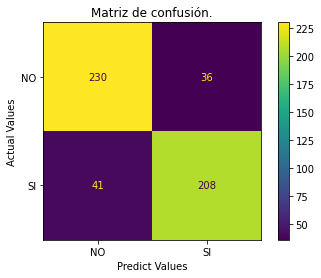

Precision,Recall,Accuracy,F1
0.85,0.84,0.85,0.84


In [ ]:
model = lgb.LGBMClassifier(objective="binary", **study.best_params)
model = model.fit(
            X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="binary_logloss",
            #eval_metric="auc",
            early_stopping_rounds=100,
            verbose=0
            
        )
y_pred = model.predict(X_test)
lgbm_precision_score_auc, lgbm_recall_score_auc, lgbm_accuracy_score_auc, lgbm_f1_score_auc = evaluate_model('lgbm grid search', y_test, y_pred)


#binarylogloss\
#con 20\
0.90	0.61	0.96	0.73\
#con 200\
0.90	0.66	0.96	0.76\
#con 400\
0.92	0.70	0.97	0.79\
#con 2000\
	Best value (rmse): 0.09074
	Best params:
		n_estimators: 10000
		learning_rate: 0.02301637191691366
		num_leaves: 488
		max_depth: 11
		min_data_in_leaf: 200
		lambda_l1: 0.18191557593992602
		lambda_l2: 1.8611934831089167
		min_gain_to_split: 0.24644752400202993
		bagging_fraction: 0.9
		bagging_freq: 1
		feature_fraction: 0.6000000000000001

\
\
#auc\

In [ ]:
from IPython.display import Markdown as md
md(f'''| Algorithm     | Precision     | Recall        | Accuracy      | F1            |
| ------------- | ------------- | ------------- | ------------- | ------------- |
| Arboles de decision  |{dt_precision_score:.3f}|	{dt_recall_score:.3f}|	{dt_accuracy_score:.3f}|	{dt_f1_score:.3f}|
|Random Forest       |{rf_precision_score:.3f} |	{rf_recall_score:.3f}|	{rf_accuracy_score:.3f}|	{rf_f1_score:.3f}|
|    SVM_sigmoid        | {svm_precision_score_sigmoid:.3f} |	{svm_recall_score_sigmoid:.3f}|	{svm_accuracy_score_sigmoid:.3f}|	{svm_f1_score_sigmoid:.3f}|
|    SVM_rbf        | {svm_precision_score_rbf:.3f} |	{svm_recall_score_rbf:.3f}|	{svm_accuracy_score_rbf:.3f}|	{svm_f1_score_rbf:.3f}|
| LightGBM_optuna      |{lgbm_precision_score_auc:.3f}|	{lgbm_recall_score_auc:.3f}|	{lgbm_accuracy_score_auc:.3f}|	{lgbm_f1_score_auc:.3f}|
'''
       )

| Algorithm     | Precision     | Recall        | Accuracy      | F1            |
| ------------- | ------------- | ------------- | ------------- | ------------- |
| Arboles de decision  |0.835|	0.731|	0.800|	0.779|
|Random Forest       |0.851 |	0.871|	0.864|	0.861|
|    SVM_sigmoid        | 0.651 |	0.675|	0.668|	0.663|
|    SVM_rbf        | 0.776 |	0.807|	0.794|	0.791|
| LightGBM_optuna      |0.852|	0.835|	0.850|	0.844|
